# Sentiment Classification & How To "Frame Problems" for a Neural Network

by Andrew Trask

- **Twitter**: @iamtrask
- **Blog**: http://iamtrask.github.io

### What You Should Already Know

- neural networks, forward and back-propagation
- stochastic gradient descent
- mean squared error
- and train/test splits

### Where to Get Help if You Need it
- Re-watch previous Udacity Lectures
- Leverage the recommended Course Reading Material - [Grokking Deep Learning](https://www.manning.com/books/grokking-deep-learning) (Check inside your classroom for a discount code)
- Shoot me a tweet @iamtrask


### Tutorial Outline:

- Intro: The Importance of "Framing a Problem" (this lesson)

- [Curate a Dataset](#lesson_1)
- [Developing a "Predictive Theory"](#lesson_2)
- [**PROJECT 1**: Quick Theory Validation](#project_1)


- [Transforming Text to Numbers](#lesson_3)
- [**PROJECT 2**: Creating the Input/Output Data](#project_2)


- Putting it all together in a Neural Network (video only - nothing in notebook)
- [**PROJECT 3**: Building our Neural Network](#project_3)


- [Understanding Neural Noise](#lesson_4)
- [**PROJECT 4**: Making Learning Faster by Reducing Noise](#project_4)


- [Analyzing Inefficiencies in our Network](#lesson_5)
- [**PROJECT 5**: Making our Network Train and Run Faster](#project_5)


- [Further Noise Reduction](#lesson_6)
- [**PROJECT 6**: Reducing Noise by Strategically Reducing the Vocabulary](#project_6)


- [Analysis: What's going on in the weights?](#lesson_7)

# Lesson: Curate a Dataset<a id='lesson_1'></a>
The cells from here until Project 1 include code Andrew shows in the videos leading up to mini project 1. We've included them so you can run the code along with the videos without having to type in everything.

In [3]:
def pretty_print_review_and_label(i):
    print(labels[i] + "\t:\t" + reviews[i][:80] + "...")

g = open('reviews.txt','r') # What we know!
reviews = list(map(lambda x:x[:-1],g.readlines()))
g.close()

g = open('labels.txt','r') # What we WANT to know!
labels = list(map(lambda x:x[:-1].upper(),g.readlines()))
g.close()

**Note:** The data in `reviews.txt` we're using has already been preprocessed a bit and contains only lower case characters. If we were working from raw data, where we didn't know it was all lower case, we would want to add a step here to convert it. That's so we treat different variations of the same word, like `The`, `the`, and `THE`, all the same way.

In [4]:
len(reviews)

25000

In [5]:
reviews[0]

'bromwell high is a cartoon comedy . it ran at the same time as some other programs about school life  such as  teachers  . my   years in the teaching profession lead me to believe that bromwell high  s satire is much closer to reality than is  teachers  . the scramble to survive financially  the insightful students who can see right through their pathetic teachers  pomp  the pettiness of the whole situation  all remind me of the schools i knew and their students . when i saw the episode in which a student repeatedly tried to burn down the school  i immediately recalled . . . . . . . . . at . . . . . . . . . . high . a classic line inspector i  m here to sack one of your teachers . student welcome to bromwell high . i expect that many adults of my age think that bromwell high is far fetched . what a pity that it isn  t   '

In [6]:
labels[0]

'POSITIVE'

# Lesson: Develop a Predictive Theory<a id='lesson_2'></a>

In [7]:
print("labels.txt \t : \t reviews.txt\n")
pretty_print_review_and_label(2137)
pretty_print_review_and_label(12816)
pretty_print_review_and_label(6267)
pretty_print_review_and_label(21934)
pretty_print_review_and_label(5297)
pretty_print_review_and_label(4998)

labels.txt 	 : 	 reviews.txt

NEGATIVE	:	this movie is terrible but it has some good effects .  ...
POSITIVE	:	adrian pasdar is excellent is this film . he makes a fascinating woman .  ...
NEGATIVE	:	comment this movie is impossible . is terrible  very improbable  bad interpretat...
POSITIVE	:	excellent episode movie ala pulp fiction .  days   suicides . it doesnt get more...
NEGATIVE	:	if you haven  t seen this  it  s terrible . it is pure trash . i saw this about ...
POSITIVE	:	this schiffer guy is a real genius  the movie is of excellent quality and both e...


# Project 1: Quick Theory Validation<a id='project_1'></a>

There are multiple ways to implement these projects, but in order to get your code closer to what Andrew shows in his solutions, we've provided some hints and starter code throughout this notebook.

You'll find the [Counter](https://docs.python.org/2/library/collections.html#collections.Counter) class to be useful in this exercise, as well as the [numpy](https://docs.scipy.org/doc/numpy/reference/) library.

In [8]:
from collections import Counter
import numpy as np

We'll create three `Counter` objects, one for words from postive reviews, one for words from negative reviews, and one for all the words.

In [9]:
# Create three Counter objects to store positive, negative and total counts
positive_counts = Counter()
negative_counts = Counter()
total_counts = Counter()

**TODO:** Examine all the reviews. For each word in a positive review, increase the count for that word in both your positive counter and the total words counter; likewise, for each word in a negative review, increase the count for that word in both your negative counter and the total words counter.

**Note:** Throughout these projects, you should use `split(' ')` to divide a piece of text (such as a review) into individual words. If you use `split()` instead, you'll get slightly different results than what the videos and solutions show.

In [10]:
# TODO: Loop over all the words in all the reviews and increment the counts in the appropriate counter objects

for i in range(len(reviews)):
    if (labels[i] == 'POSITIVE'):
        for word in reviews[i].split(' '):
            positive_counts[word] += 1
            total_counts[word] += 1
    else:
        for word in reviews[i].split(' '):
            negative_counts[word] += 1
            total_counts[word] += 1

Run the following two cells to list the words used in positive reviews and negative reviews, respectively, ordered from most to least commonly used. 

In [11]:
# Examine the counts of the most common words in positive reviews
positive_counts.most_common()

[('', 550468),
 ('the', 173324),
 ('.', 159654),
 ('and', 89722),
 ('a', 83688),
 ('of', 76855),
 ('to', 66746),
 ('is', 57245),
 ('in', 50215),
 ('br', 49235),
 ('it', 48025),
 ('i', 40743),
 ('that', 35630),
 ('this', 35080),
 ('s', 33815),
 ('as', 26308),
 ('with', 23247),
 ('for', 22416),
 ('was', 21917),
 ('film', 20937),
 ('but', 20822),
 ('movie', 19074),
 ('his', 17227),
 ('on', 17008),
 ('you', 16681),
 ('he', 16282),
 ('are', 14807),
 ('not', 14272),
 ('t', 13720),
 ('one', 13655),
 ('have', 12587),
 ('be', 12416),
 ('by', 11997),
 ('all', 11942),
 ('who', 11464),
 ('an', 11294),
 ('at', 11234),
 ('from', 10767),
 ('her', 10474),
 ('they', 9895),
 ('has', 9186),
 ('so', 9154),
 ('like', 9038),
 ('about', 8313),
 ('very', 8305),
 ('out', 8134),
 ('there', 8057),
 ('she', 7779),
 ('what', 7737),
 ('or', 7732),
 ('good', 7720),
 ('more', 7521),
 ('when', 7456),
 ('some', 7441),
 ('if', 7285),
 ('just', 7152),
 ('can', 7001),
 ('story', 6780),
 ('time', 6515),
 ('my', 6488),
 ('g

In [12]:
# Examine the counts of the most common words in negative reviews
negative_counts.most_common()

[('', 561462),
 ('.', 167538),
 ('the', 163389),
 ('a', 79321),
 ('and', 74385),
 ('of', 69009),
 ('to', 68974),
 ('br', 52637),
 ('is', 50083),
 ('it', 48327),
 ('i', 46880),
 ('in', 43753),
 ('this', 40920),
 ('that', 37615),
 ('s', 31546),
 ('was', 26291),
 ('movie', 24965),
 ('for', 21927),
 ('but', 21781),
 ('with', 20878),
 ('as', 20625),
 ('t', 20361),
 ('film', 19218),
 ('you', 17549),
 ('on', 17192),
 ('not', 16354),
 ('have', 15144),
 ('are', 14623),
 ('be', 14541),
 ('he', 13856),
 ('one', 13134),
 ('they', 13011),
 ('at', 12279),
 ('his', 12147),
 ('all', 12036),
 ('so', 11463),
 ('like', 11238),
 ('there', 10775),
 ('just', 10619),
 ('by', 10549),
 ('or', 10272),
 ('an', 10266),
 ('who', 9969),
 ('from', 9731),
 ('if', 9518),
 ('about', 9061),
 ('out', 8979),
 ('what', 8422),
 ('some', 8306),
 ('no', 8143),
 ('her', 7947),
 ('even', 7687),
 ('can', 7653),
 ('has', 7604),
 ('good', 7423),
 ('bad', 7401),
 ('would', 7036),
 ('up', 6970),
 ('only', 6781),
 ('more', 6730),
 ('

As you can see, common words like "the" appear very often in both positive and negative reviews. Instead of finding the most common words in positive or negative reviews, what you really want are the words found in positive reviews more often than in negative reviews, and vice versa. To accomplish this, you'll need to calculate the **ratios** of word usage between positive and negative reviews.

**TODO:** Check all the words you've seen and calculate the ratio of postive to negative uses and store that ratio in `pos_neg_ratios`. 
>Hint: the positive-to-negative ratio for a given word can be calculated with `positive_counts[word] / float(negative_counts[word]+1)`. Notice the `+1` in the denominator – that ensures we don't divide by zero for words that are only seen in positive reviews.

In [13]:
# Create Counter object to store positive/negative ratios
pos_neg_ratios = Counter()

# TODO: Calculate the ratios of positive and negative uses of the most common words
#       Consider words to be "common" if they've been used at least 100 times

for term, cnt in (total_counts.most_common()):
    if (cnt > 100):
        pos_neg_ratio = positive_counts[term] / float(negative_counts[term] + 1)
        pos_neg_ratios[term] = pos_neg_ratio
        
for word, ratio in pos_neg_ratios.most_common():
    if (ratio > 1):
        pos_neg_ratios[word] = np.log(ratio)
    else:
        pos_neg_ratios[word] = -np.log(1 / (ratio + 0.01))

pos_neg_ratios.most_common()

[('edie', 4.6913478822291435),
 ('paulie', 4.0775374439057197),
 ('felix', 3.1527360223636558),
 ('polanski', 2.8233610476132043),
 ('matthau', 2.8067217286092401),
 ('victoria', 2.6810215287142909),
 ('mildred', 2.6026896854443837),
 ('gandhi', 2.5389738710582761),
 ('flawless', 2.451005098112319),
 ('superbly', 2.2600254785752498),
 ('perfection', 2.1594842493533721),
 ('astaire', 2.1400661634962708),
 ('captures', 2.0386195471595809),
 ('voight', 2.0301704926730531),
 ('wonderfully', 2.0218960560332353),
 ('powell', 1.9783454248084671),
 ('brosnan', 1.9547990964725592),
 ('lily', 1.9203768470501485),
 ('bakshi', 1.9029851043382795),
 ('lincoln', 1.9014583864844796),
 ('refreshing', 1.8551812956655511),
 ('breathtaking', 1.8481124057791867),
 ('bourne', 1.8478489358790986),
 ('lemmon', 1.8458266904983307),
 ('delightful', 1.8002701588959635),
 ('flynn', 1.7996646487351682),
 ('andrews', 1.7764919970972666),
 ('homer', 1.7692866133759964),
 ('beautifully', 1.7626953362841438),
 ('socc

Examine the ratios you've calculated for a few words:

In [14]:
print("Pos-to-neg ratio for 'the' = {}".format(pos_neg_ratios["the"]))
print("Pos-to-neg ratio for 'amazing' = {}".format(pos_neg_ratios["amazing"]))
print("Pos-to-neg ratio for 'terrible' = {}".format(pos_neg_ratios["terrible"]))

Pos-to-neg ratio for 'the' = 0.05902269426102881
Pos-to-neg ratio for 'amazing' = 1.3919815802404802
Pos-to-neg ratio for 'terrible' = -1.6742829939664696


Looking closely at the values you just calculated, we see the following:

* Words that you would expect to see more often in positive reviews – like "amazing" – have a ratio greater than 1. The more skewed a word is toward postive, the farther from 1 its positive-to-negative ratio  will be.
* Words that you would expect to see more often in negative reviews – like "terrible" – have positive values that are less than 1. The more skewed a word is toward negative, the closer to zero its positive-to-negative ratio will be.
* Neutral words, which don't really convey any sentiment because you would expect to see them in all sorts of reviews – like "the" – have values very close to 1. A perfectly neutral word – one that was used in exactly the same number of positive reviews as negative reviews – would be almost exactly 1. The `+1` we suggested you add to the denominator slightly biases words toward negative, but it won't matter because it will be a tiny bias and later we'll be ignoring words that are too close to neutral anyway.

Ok, the ratios tell us which words are used more often in postive or negative reviews, but the specific values we've calculated are a bit difficult to work with. A very positive word like "amazing" has a value above 4, whereas a very negative word like "terrible" has a value around 0.18. Those values aren't easy to compare for a couple of reasons:

* Right now, 1 is considered neutral, but the absolute value of the postive-to-negative rations of very postive words is larger than the absolute value of the ratios for the very negative words. So there is no way to directly compare two numbers and see if one word conveys the same magnitude of positive sentiment as another word conveys negative sentiment. So we should center all the values around netural so the absolute value fro neutral of the postive-to-negative ratio for a word would indicate how much sentiment (positive or negative) that word conveys.
* When comparing absolute values it's easier to do that around zero than one. 

To fix these issues, we'll convert all of our ratios to new values using logarithms.

**TODO:** Go through all the ratios you calculated and convert them to logarithms. (i.e. use `np.log(ratio)`)

In the end, extremely positive and extremely negative words will have positive-to-negative ratios with similar magnitudes but opposite signs.

In [15]:
# TODO: Convert ratios to logs

Examine the new ratios you've calculated for the same words from before:

In [16]:
print("Pos-to-neg ratio for 'the' = {}".format(pos_neg_ratios["the"]))
print("Pos-to-neg ratio for 'amazing' = {}".format(pos_neg_ratios["amazing"]))
print("Pos-to-neg ratio for 'terrible' = {}".format(pos_neg_ratios["terrible"]))

Pos-to-neg ratio for 'the' = 0.05902269426102881
Pos-to-neg ratio for 'amazing' = 1.3919815802404802
Pos-to-neg ratio for 'terrible' = -1.6742829939664696


If everything worked, now you should see neutral words with values close to zero. In this case, "the" is near zero but slightly positive, so it was probably used in more positive reviews than negative reviews. But look at "amazing"'s ratio - it's above `1`, showing it is clearly a word with positive sentiment. And "terrible" has a similar score, but in the opposite direction, so it's below `-1`. It's now clear that both of these words are associated with specific, opposing sentiments.

Now run the following cells to see more ratios. 

The first cell displays all the words, ordered by how associated they are with postive reviews. (Your notebook will most likely truncate the output so you won't actually see *all* the words in the list.)

The second cell displays the 30 words most associated with negative reviews by reversing the order of the first list and then looking at the first 30 words. (If you want the second cell to display all the words, ordered by how associated they are with negative reviews, you could just write `reversed(pos_neg_ratios.most_common())`.)

You should continue to see values similar to the earlier ones we checked – neutral words will be close to `0`, words will get more positive as their ratios approach and go above `1`, and words will get more negative as their ratios approach and go below `-1`. That's why we decided to use the logs instead of the raw ratios.

In [17]:
# words most frequently seen in a review with a "POSITIVE" label
pos_neg_ratios.most_common()

[('edie', 4.6913478822291435),
 ('paulie', 4.0775374439057197),
 ('felix', 3.1527360223636558),
 ('polanski', 2.8233610476132043),
 ('matthau', 2.8067217286092401),
 ('victoria', 2.6810215287142909),
 ('mildred', 2.6026896854443837),
 ('gandhi', 2.5389738710582761),
 ('flawless', 2.451005098112319),
 ('superbly', 2.2600254785752498),
 ('perfection', 2.1594842493533721),
 ('astaire', 2.1400661634962708),
 ('captures', 2.0386195471595809),
 ('voight', 2.0301704926730531),
 ('wonderfully', 2.0218960560332353),
 ('powell', 1.9783454248084671),
 ('brosnan', 1.9547990964725592),
 ('lily', 1.9203768470501485),
 ('bakshi', 1.9029851043382795),
 ('lincoln', 1.9014583864844796),
 ('refreshing', 1.8551812956655511),
 ('breathtaking', 1.8481124057791867),
 ('bourne', 1.8478489358790986),
 ('lemmon', 1.8458266904983307),
 ('delightful', 1.8002701588959635),
 ('flynn', 1.7996646487351682),
 ('andrews', 1.7764919970972666),
 ('homer', 1.7692866133759964),
 ('beautifully', 1.7626953362841438),
 ('socc

In [18]:
# words most frequently seen in a review with a "NEGATIVE" label
list(reversed(pos_neg_ratios.most_common()))[0:30]

# Note: Above is the code Andrew uses in his solution video, 
#       so we've included it here to avoid confusion.
#       If you explore the documentation for the Counter class, 
#       you will see you could also find the 30 least common
#       words like this: pos_neg_ratios.most_common()[:-31:-1]

[('boll', -4.0778152602708904),
 ('uwe', -3.9218753018711578),
 ('seagal', -3.3202501058581921),
 ('unwatchable', -3.0269848170580955),
 ('stinker', -2.9876839403711624),
 ('mst', -2.7753833211707968),
 ('incoherent', -2.7641396677532537),
 ('unfunny', -2.5545257844967644),
 ('waste', -2.4907515123361046),
 ('blah', -2.4475792789485005),
 ('horrid', -2.3715779644809971),
 ('pointless', -2.3451073877136341),
 ('atrocious', -2.3187369339642556),
 ('redeeming', -2.2667790015910296),
 ('prom', -2.2601040980178784),
 ('drivel', -2.2476029585766928),
 ('lousy', -2.2118080125207054),
 ('worst', -2.1930856334332267),
 ('laughable', -2.172468615469592),
 ('awful', -2.1385076866397488),
 ('poorly', -2.1326133844207011),
 ('wasting', -2.1178155545614512),
 ('remotely', -2.111046881095167),
 ('existent', -2.0024805005437076),
 ('boredom', -1.9241486572738005),
 ('miserably', -1.9216610938019989),
 ('sucks', -1.9166645809588516),
 ('uninspired', -1.9131499212248517),
 ('lame', -1.9117232884159072),

# End of Project 1. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Transforming Text into Numbers<a id='lesson_3'></a>
The cells here include code Andrew shows in the next video. We've included it so you can run the code along with the video without having to type in everything.

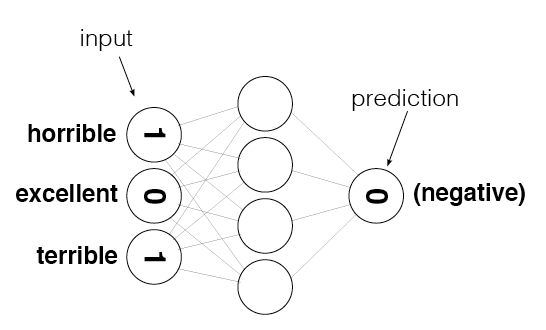

In [19]:
from IPython.display import Image

review = "This was a horrible, terrible movie."

Image(filename='sentiment_network.png')

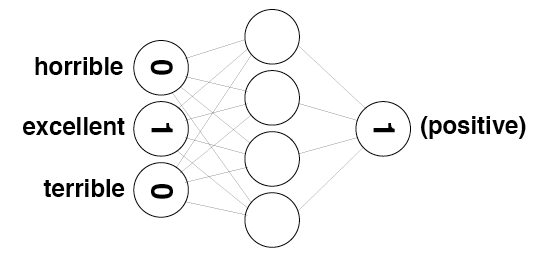

In [20]:
review = "The movie was excellent"

Image(filename='sentiment_network_pos.png')

# Project 2: Creating the Input/Output Data<a id='project_2'></a>

**TODO:** Create a [set](https://docs.python.org/3/tutorial/datastructures.html#sets) named `vocab` that contains every word in the vocabulary.

In [21]:
# TODO: Create set named "vocab" containing all of the words from all of the reviews
vocab = set(total_counts.keys())
vocab_size = len(vocab)
print(vocab_size)

74074


Run the following cell to check your vocabulary size. If everything worked correctly, it should print **74074**

In [22]:
vocab_size = len(vocab)
print(vocab_size)

74074


Take a look at the following image. It represents the layers of the neural network you'll be building throughout this notebook. `layer_0` is the input layer, `layer_1` is a hidden layer, and `layer_2` is the output layer.

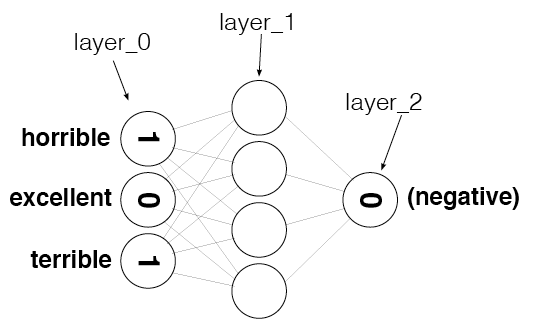

In [23]:
from IPython.display import Image
Image(filename='sentiment_network_2.png')

**TODO:** Create a numpy array called `layer_0` and initialize it to all zeros. You will find the [zeros](https://docs.scipy.org/doc/numpy/reference/generated/numpy.zeros.html) function particularly helpful here. Be sure you create `layer_0` as a 2-dimensional matrix with 1 row and `vocab_size` columns. 

In [24]:
# TODO: Create layer_0 matrix with dimensions 1 by vocab_size, initially filled with zeros
layer_0 = np.zeros((1, vocab_size))

Run the following cell. It should display `(1, 74074)`

In [25]:
layer_0.shape

(1, 74074)

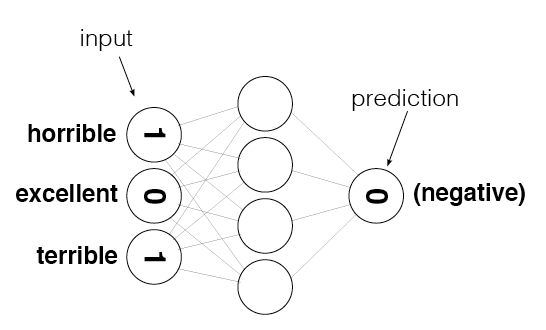

In [26]:
from IPython.display import Image
Image(filename='sentiment_network.png')

`layer_0` contains one entry for every word in the vocabulary, as shown in the above image. We need to make sure we know the index of each word, so run the following cell to create a lookup table that stores the index of every word.

In [27]:
# Create a dictionary of words in the vocabulary mapped to index positions
# (to be used in layer_0)
word2index = {}
for i,word in enumerate(vocab):
    word2index[word] = i
    
# display the map of words to indices
word2index

{'': 0,
 'spoons': 1,
 'coencidence': 2,
 'lyrics': 3,
 'amercan': 4,
 'hedy': 5,
 'demoralise': 6,
 'pushy': 7,
 'sharpe': 8,
 'articulating': 9,
 'courageously': 10,
 'evilly': 11,
 'spiv': 12,
 'tobikage': 13,
 'loosening': 14,
 'expecting': 15,
 'anyway': 16,
 'kayru': 17,
 'snockered': 18,
 'impressions': 19,
 'profoundly': 20,
 'vixen': 21,
 'swiss': 22,
 'eagerness': 23,
 'ifan': 24,
 'yelled': 25,
 'record': 26,
 'airing': 27,
 'achievement': 28,
 'vaporised': 29,
 'ramadi': 30,
 'weird': 31,
 'gorefests': 32,
 'curser': 33,
 'trusted': 34,
 'missed': 35,
 'pharaoh': 36,
 'noriaki': 37,
 'sharkbait': 38,
 'spud': 39,
 'vinyl': 40,
 'tortoni': 41,
 'rethought': 42,
 'hemlich': 43,
 'hanka': 44,
 'borefest': 45,
 'odysse': 46,
 'abdul': 47,
 'observational': 48,
 'horst': 49,
 'cornering': 50,
 'villains': 51,
 'calmness': 52,
 'cycled': 53,
 'bigardo': 54,
 'accesible': 55,
 'zowee': 56,
 'banters': 57,
 'hota': 58,
 'holm': 59,
 'pierson': 60,
 'voluble': 61,
 'intertwines': 62

**TODO:**  Complete the implementation of `update_input_layer`. It should count 
          how many times each word is used in the given review, and then store
          those counts at the appropriate indices inside `layer_0`.

In [28]:
def update_input_layer(review):
    """ Modify the global layer_0 to represent the vector form of review.
    The element at a given index of layer_0 should represent
    how many times the given word occurs in the review.
    Args:
        review(string) - the string of the review
    Returns:
        None
    """
    global layer_0
    # clear out previous state by resetting the layer to be all 0s
    layer_0 *= 0
    
    for word in review.split(' '):
        layer_0[0][word2index[word]] += 1
    
    # TODO: count how many times each word is used in the given review and store the results in layer_0 

Run the following cell to test updating the input layer with the first review. The indices assigned may not be the same as in the solution, but hopefully you'll see some non-zero values in `layer_0`.  

In [29]:
update_input_layer(reviews[0])
layer_0

array([[ 18.,   0.,   0., ...,   0.,   0.,   0.]])

**TODO:** Complete the implementation of `get_target_for_labels`. It should return `0` or `1`, 
          depending on whether the given label is `NEGATIVE` or `POSITIVE`, respectively.

In [30]:
def get_target_for_label(label):
    """Convert a label to `0` or `1`.
    Args:
        label(string) - Either "POSITIVE" or "NEGATIVE".
    Returns:
        `0` or `1`.
    """
    # TODO: Your code here
    if (label == 'POSITIVE'):
        return 1
    else:
        return 0

Run the following two cells. They should print out`'POSITIVE'` and `1`, respectively.

In [31]:
labels[0]

'POSITIVE'

In [32]:
get_target_for_label(labels[0])

1

Run the following two cells. They should print out `'NEGATIVE'` and `0`, respectively.

In [33]:
labels[1]

'NEGATIVE'

In [34]:
get_target_for_label(labels[1])

0

# End of Project 2. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Project 3: Building a Neural Network<a id='project_3'></a>

**TODO:** We've included the framework of a class called `SentimentNetork`. Implement all of the items marked `TODO` in the code. These include doing the following:
- Create a basic neural network much like the networks you've seen in earlier lessons and in Project 1, with an input layer, a hidden layer, and an output layer. 
- Do **not** add a non-linearity in the hidden layer. That is, do not use an activation function when calculating the hidden layer outputs.
- Re-use the code from earlier in this notebook to create the training data (see `TODO`s in the code)
- Implement the `pre_process_data` function to create the vocabulary for our training data generating functions
- Ensure `train` trains over the entire corpus

### Where to Get Help if You Need it
- Re-watch earlier Udacity lectures
- Chapters 3-5 - [Grokking Deep Learning](https://www.manning.com/books/grokking-deep-learning) - (Check inside your classroom for a discount code)

In [35]:
import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews, labels, hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducable results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):
        
        review_vocab = set()
        
        for review in reviews:
            for word in review.split(' '):
                review_vocab.add(word)
        # TODO: populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words 
        #       using "split(' ')" instead of "split()".
        
        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        label_vocab = set()
        # TODO: populate label_vocab with all of the words in the given labels.
        #       There is no need to split the labels because each one is a single word.
        for label in labels:
            label_vocab.add(label)
        
        
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        # TODO: populate self.word2index with indices for all the words in self.review_vocab
        #       like you saw earlier in the notebook
        for i, word in enumerate(self.review_vocab):
            self.word2index[word] = i
        
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        # TODO: do the same thing you did for self.word2index and self.review_vocab, 
        #       but for self.label2index and self.label_vocab instead
        for i, label in enumerate(self.label_vocab):
            self.label2index[label] = i
        
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights
        
        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((self.input_nodes, self.hidden_nodes))
        
        # TODO: initialize self.weights_1_2 as a matrix of random values. 
        #       These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5,
                                            (self.hidden_nodes, self.output_nodes))
        
        # TODO: Create the input layer, a two-dimensional matrix with shape 
        #       1 x input_nodes, with all values initialized to zero
        self.layer_0 = np.zeros((1,input_nodes))
    
        
    def update_input_layer(self,review):
        # TODO: You can copy most of the code you wrote for update_input_layer 
        #       earlier in this notebook. 
        #
        #       However, MAKE SURE YOU CHANGE ALL VARIABLES TO REFERENCE
        #       THE VERSIONS STORED IN THIS OBJECT, NOT THE GLOBAL OBJECTS.
        #       For example, replace "layer_0 *= 0" with "self.layer_0 *= 0"
        self.layer_0 *= 0
        for word in review.split(' '):
            if (word in self.word2index.keys()):
                self.layer_0[0][self.word2index[word]] += 1
                
    def get_target_for_label(self,label):
        # TODO: Copy the code you wrote for get_target_for_label 
        #       earlier in this notebook. 
        if (label == 'POSITIVE'):
            return 1
        else:
            return 0
        
    def sigmoid(self,x):
        # TODO: Return the result of calculating the sigmoid activation function
        #       shown in the lectures
        return 1 / (1 + np.exp(-x))
    
    def sigmoid_output_2_derivative(self,output):
        # TODO: Return the derivative of the sigmoid activation function, 
        #       where "output" is the original output from the sigmoid fucntion 
        return output * (1 - output)

    def train(self, training_reviews, training_labels):
        
        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews) == len(training_labels))
        
        # Keep track of correct predictions to display accuracy during training 
        correct_so_far = 0
        
        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):
            
            # TODO: Get the next review and its correct label
            review = training_reviews[i]
            label = training_labels[i]
            
            # TODO: Implement the forward pass through the network. 
            #       That means use the given review to update the input layer, 
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            # 
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.
            self.update_input_layer(review)
            layer_1 = self.layer_0.dot(self.weights_0_1)
            layer_2 = self.sigmoid(layer_1.dot(self.weights_1_2))
            
            
            # TODO: Implement the back propagation pass here. 
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you 
            #       learned in class.
            layer_2_error = layer_2 - self.get_target_for_label(label)
            layer_2_delta = layer_2_error * self.sigmoid_output_2_derivative(layer_2)
            layer_1_error = layer_2_delta.dot(self.weights_1_2.T)
            layer_1_delta = layer_1_error
            
            self.weights_1_2 -= layer_1.T.dot(layer_2_delta) * self.learning_rate
            self.weights_0_1 -= self.layer_0.T.dot(layer_1_delta) * self.learning_rate
            
            # TODO: Keep track of correct predictions. To determine if the prediction was
            #       correct, check that the absolute value of the output error 
            #       is less than 0.5. If so, add one to the correct_so_far count.
            print(np.abs(layer_2_error))
            if (np.abs(layer_2_error) < 0.5):
                correct_so_far += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the training process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i+1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i+1))[:4] + "%")
            if(i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            print(testing_labels[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # TODO: Run a forward pass through the network, like you did in the
        #       "train" function. That means use the given review to 
        #       update the input layer, then calculate values for the hidden layer,
        #       and finally calculate the output layer.
        #
        #       Note: The review passed into this function for prediction 
        #             might come from anywhere, so you should convert it 
        #             to lower case prior to using it.
        
        # TODO: The output layer should now contain a prediction. 
        #       Return `POSITIVE` for predictions greater-than-or-equal-to `0.5`, 
        #       and `NEGATIVE` otherwise.
        self.update_input_layer(review)
        layer_1 = self.layer_0.dot(self.weights_0_1)
        layer_2 = self.sigmoid(layer_1.dot(self.weights_1_2))
        
        return 'POSITIVE' if layer_2[0] >= 0.5 else 'NEGATIVE'


Run the following cell to create a `SentimentNetwork` that will train on all but the last 1000 reviews (we're saving those for testing). Here we use a learning rate of `0.1`.

In [36]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)

Run the following cell to test the network's performance against the last 1000 reviews (the ones we held out from our training set). 

**We have not trained the model yet, so the results should be about 50% as it will just be guessing and there are only two possible values to choose from.**

In [37]:
mlp.test(reviews[-1000:],labels[-1000:])

POSITIVE
Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Tested:1 Testing Accuracy:100.%NEGATIVE
Progress:0.1% Speed(reviews/sec):256.9 #Correct:1 #Tested:2 Testing Accuracy:50.0%POSITIVE
Progress:0.2% Speed(reviews/sec):404.1 #Correct:2 #Tested:3 Testing Accuracy:66.6%NEGATIVE
Progress:0.3% Speed(reviews/sec):498.6 #Correct:2 #Tested:4 Testing Accuracy:50.0%POSITIVE
Progress:0.4% Speed(reviews/sec):576.5 #Correct:3 #Tested:5 Testing Accuracy:60.0%NEGATIVE
Progress:0.5% Speed(reviews/sec):628.7 #Correct:3 #Tested:6 Testing Accuracy:50.0%POSITIVE
Progress:0.6% Speed(reviews/sec):653.3 #Correct:4 #Tested:7 Testing Accuracy:57.1%NEGATIVE
Progress:0.7% Speed(reviews/sec):679.2 #Correct:4 #Tested:8 Testing Accuracy:50.0%POSITIVE
Progress:0.8% Speed(reviews/sec):702.9 #Correct:5 #Tested:9 Testing Accuracy:55.5%NEGATIVE
Progress:0.9% Speed(reviews/sec):672.1 #Correct:5 #Tested:10 Testing Accuracy:50.0%POSITIVE
Progress:1.0% Speed(reviews/sec):687.2 #Correct:6 #Tested:11 Testing Accuracy:54.5

Progress:16.4% Speed(reviews/sec):816.8 #Correct:83 #Tested:165 Testing Accuracy:50.3%NEGATIVE
Progress:16.5% Speed(reviews/sec):800.8 #Correct:83 #Tested:166 Testing Accuracy:50.0%POSITIVE
Progress:16.6% Speed(reviews/sec):801.2 #Correct:84 #Tested:167 Testing Accuracy:50.2%NEGATIVE
Progress:16.7% Speed(reviews/sec):801.2 #Correct:84 #Tested:168 Testing Accuracy:50.0%POSITIVE
Progress:16.8% Speed(reviews/sec):802.3 #Correct:85 #Tested:169 Testing Accuracy:50.2%NEGATIVE
Progress:16.9% Speed(reviews/sec):803.0 #Correct:85 #Tested:170 Testing Accuracy:50.0%POSITIVE
Progress:17.0% Speed(reviews/sec):803.3 #Correct:86 #Tested:171 Testing Accuracy:50.2%NEGATIVE
Progress:17.1% Speed(reviews/sec):804.2 #Correct:86 #Tested:172 Testing Accuracy:50.0%POSITIVE
Progress:17.2% Speed(reviews/sec):803.4 #Correct:87 #Tested:173 Testing Accuracy:50.2%NEGATIVE
Progress:17.3% Speed(reviews/sec):803.3 #Correct:87 #Tested:174 Testing Accuracy:50.0%POSITIVE
Progress:17.4% Speed(reviews/sec):803.5 #Correct:8

Progress:33.7% Speed(reviews/sec):834.1 #Correct:169 #Tested:338 Testing Accuracy:50.0%POSITIVE
Progress:33.8% Speed(reviews/sec):825.1 #Correct:170 #Tested:339 Testing Accuracy:50.1%NEGATIVE
Progress:33.9% Speed(reviews/sec):825.2 #Correct:170 #Tested:340 Testing Accuracy:50.0%POSITIVE
Progress:34.0% Speed(reviews/sec):824.9 #Correct:171 #Tested:341 Testing Accuracy:50.1%NEGATIVE
Progress:34.1% Speed(reviews/sec):825.3 #Correct:171 #Tested:342 Testing Accuracy:50.0%POSITIVE
Progress:34.2% Speed(reviews/sec):823.6 #Correct:172 #Tested:343 Testing Accuracy:50.1%NEGATIVE
Progress:34.3% Speed(reviews/sec):824.2 #Correct:172 #Tested:344 Testing Accuracy:50.0%POSITIVE
Progress:34.4% Speed(reviews/sec):823.9 #Correct:173 #Tested:345 Testing Accuracy:50.1%NEGATIVE
Progress:34.5% Speed(reviews/sec):824.3 #Correct:173 #Tested:346 Testing Accuracy:50.0%POSITIVE
Progress:34.6% Speed(reviews/sec):824.7 #Correct:174 #Tested:347 Testing Accuracy:50.1%NEGATIVE
Progress:34.7% Speed(reviews/sec):825.0 

Progress:50.8% Speed(reviews/sec):835.5 #Correct:255 #Tested:509 Testing Accuracy:50.0%NEGATIVE
Progress:50.9% Speed(reviews/sec):830.1 #Correct:255 #Tested:510 Testing Accuracy:50.0%POSITIVE
Progress:51.0% Speed(reviews/sec):829.2 #Correct:256 #Tested:511 Testing Accuracy:50.0%NEGATIVE
Progress:51.1% Speed(reviews/sec):829.5 #Correct:256 #Tested:512 Testing Accuracy:50.0%POSITIVE
Progress:51.2% Speed(reviews/sec):829.4 #Correct:257 #Tested:513 Testing Accuracy:50.0%NEGATIVE
Progress:51.3% Speed(reviews/sec):829.8 #Correct:257 #Tested:514 Testing Accuracy:50.0%POSITIVE
Progress:51.4% Speed(reviews/sec):829.6 #Correct:258 #Tested:515 Testing Accuracy:50.0%NEGATIVE
Progress:51.5% Speed(reviews/sec):829.7 #Correct:258 #Tested:516 Testing Accuracy:50.0%POSITIVE
Progress:51.6% Speed(reviews/sec):829.3 #Correct:259 #Tested:517 Testing Accuracy:50.0%NEGATIVE
Progress:51.7% Speed(reviews/sec):829.4 #Correct:259 #Tested:518 Testing Accuracy:50.0%POSITIVE
Progress:51.8% Speed(reviews/sec):829.5 

Progress:68.7% Speed(reviews/sec):847.5 #Correct:344 #Tested:688 Testing Accuracy:50.0%POSITIVE
Progress:68.8% Speed(reviews/sec):842.3 #Correct:345 #Tested:689 Testing Accuracy:50.0%NEGATIVE
Progress:68.9% Speed(reviews/sec):842.5 #Correct:345 #Tested:690 Testing Accuracy:50.0%POSITIVE
Progress:69.0% Speed(reviews/sec):842.5 #Correct:346 #Tested:691 Testing Accuracy:50.0%NEGATIVE
Progress:69.1% Speed(reviews/sec):842.6 #Correct:346 #Tested:692 Testing Accuracy:50.0%POSITIVE
Progress:69.2% Speed(reviews/sec):842.7 #Correct:347 #Tested:693 Testing Accuracy:50.0%NEGATIVE
Progress:69.3% Speed(reviews/sec):842.8 #Correct:347 #Tested:694 Testing Accuracy:50.0%POSITIVE
Progress:69.4% Speed(reviews/sec):842.7 #Correct:348 #Tested:695 Testing Accuracy:50.0%NEGATIVE
Progress:69.5% Speed(reviews/sec):842.5 #Correct:348 #Tested:696 Testing Accuracy:50.0%POSITIVE
Progress:69.6% Speed(reviews/sec):842.8 #Correct:349 #Tested:697 Testing Accuracy:50.0%NEGATIVE
Progress:69.7% Speed(reviews/sec):842.9 

Progress:85.8% Speed(reviews/sec):845.5 #Correct:430 #Tested:859 Testing Accuracy:50.0%NEGATIVE
Progress:85.9% Speed(reviews/sec):841.9 #Correct:430 #Tested:860 Testing Accuracy:50.0%POSITIVE
Progress:86.0% Speed(reviews/sec):841.8 #Correct:431 #Tested:861 Testing Accuracy:50.0%NEGATIVE
Progress:86.1% Speed(reviews/sec):841.7 #Correct:431 #Tested:862 Testing Accuracy:50.0%POSITIVE
Progress:86.2% Speed(reviews/sec):841.8 #Correct:432 #Tested:863 Testing Accuracy:50.0%NEGATIVE
Progress:86.3% Speed(reviews/sec):840.7 #Correct:432 #Tested:864 Testing Accuracy:50.0%POSITIVE
Progress:86.4% Speed(reviews/sec):840.8 #Correct:433 #Tested:865 Testing Accuracy:50.0%NEGATIVE
Progress:86.5% Speed(reviews/sec):840.9 #Correct:433 #Tested:866 Testing Accuracy:50.0%POSITIVE
Progress:86.6% Speed(reviews/sec):841.0 #Correct:434 #Tested:867 Testing Accuracy:50.0%NEGATIVE
Progress:86.7% Speed(reviews/sec):841.2 #Correct:434 #Tested:868 Testing Accuracy:50.0%POSITIVE
Progress:86.8% Speed(reviews/sec):841.1 

Run the following cell to actually train the network. During training, it will display the model's accuracy repeatedly as it trains so you can see how well it's doing.

In [38]:
mlp.train(reviews[:-1000],labels[:-1000])

[[ 0.5]]
Progress:0.0% Speed(reviews/sec):0.0 #Correct:0 #Trained:1 Training Accuracy:0.0%
[[ 1.]]
Progress:0.00% Speed(reviews/sec):69.00 #Correct:0 #Trained:2 Training Accuracy:0.0%[[ 0.]]
Progress:0.00% Speed(reviews/sec):106.0 #Correct:1 #Trained:3 Training Accuracy:33.3%[[ 1.]]
Progress:0.01% Speed(reviews/sec):118.3 #Correct:1 #Trained:4 Training Accuracy:25.0%[[ 0.]]
Progress:0.01% Speed(reviews/sec):121.3 #Correct:2 #Trained:5 Training Accuracy:40.0%[[ 1.]]
Progress:0.02% Speed(reviews/sec):133.9 #Correct:2 #Trained:6 Training Accuracy:33.3%[[ 0.]]
Progress:0.02% Speed(reviews/sec):145.2 #Correct:3 #Trained:7 Training Accuracy:42.8%[[ 1.]]
Progress:0.02% Speed(reviews/sec):155.2 #Correct:3 #Trained:8 Training Accuracy:37.5%[[ 0.]]
Progress:0.03% Speed(reviews/sec):162.8 #Correct:4 #Trained:9 Training Accuracy:44.4%[[ 1.]]
Progress:0.03% Speed(reviews/sec):168.3 #Correct:4 #Trained:10 Training Accuracy:40.0%[[ 0.]]
Progress:0.04% Speed(reviews/sec):174.2 #Correct:5 #Trained:11 T

Progress:0.39% Speed(reviews/sec):229.2 #Correct:47 #Trained:96 Training Accuracy:48.9%[[ 0.]]
Progress:0.4% Speed(reviews/sec):227.7 #Correct:48 #Trained:97 Training Accuracy:49.4%[[ 1.]]
Progress:0.40% Speed(reviews/sec):227.7 #Correct:48 #Trained:98 Training Accuracy:48.9%[[ 0.]]
Progress:0.40% Speed(reviews/sec):226.7 #Correct:49 #Trained:99 Training Accuracy:49.4%[[ 1.]]
Progress:0.41% Speed(reviews/sec):227.0 #Correct:49 #Trained:100 Training Accuracy:49.0%[[ 0.]]
Progress:0.41% Speed(reviews/sec):225.6 #Correct:50 #Trained:101 Training Accuracy:49.5%[[ 1.]]
Progress:0.42% Speed(reviews/sec):226.0 #Correct:50 #Trained:102 Training Accuracy:49.0%[[ 0.]]
Progress:0.42% Speed(reviews/sec):226.1 #Correct:51 #Trained:103 Training Accuracy:49.5%[[ 1.]]
Progress:0.42% Speed(reviews/sec):226.5 #Correct:51 #Trained:104 Training Accuracy:49.0%[[ 0.]]
Progress:0.43% Speed(reviews/sec):226.8 #Correct:52 #Trained:105 Training Accuracy:49.5%[[ 1.]]
Progress:0.43% Speed(reviews/sec):227.1 #Corr

Progress:0.80% Speed(reviews/sec):235.5 #Correct:97 #Trained:195 Training Accuracy:49.7%[[ 1.]]
Progress:0.81% Speed(reviews/sec):234.5 #Correct:97 #Trained:196 Training Accuracy:49.4%[[ 0.]]
Progress:0.81% Speed(reviews/sec):234.3 #Correct:98 #Trained:197 Training Accuracy:49.7%[[ 1.]]
Progress:0.82% Speed(reviews/sec):233.9 #Correct:98 #Trained:198 Training Accuracy:49.4%[[ 0.]]
Progress:0.82% Speed(reviews/sec):232.7 #Correct:99 #Trained:199 Training Accuracy:49.7%[[ 1.]]
Progress:0.82% Speed(reviews/sec):232.6 #Correct:99 #Trained:200 Training Accuracy:49.5%[[ 0.]]
Progress:0.83% Speed(reviews/sec):232.7 #Correct:100 #Trained:201 Training Accuracy:49.7%[[ 1.]]
Progress:0.83% Speed(reviews/sec):232.8 #Correct:100 #Trained:202 Training Accuracy:49.5%[[ 0.]]
Progress:0.84% Speed(reviews/sec):232.9 #Correct:101 #Trained:203 Training Accuracy:49.7%[[ 1.]]
Progress:0.84% Speed(reviews/sec):233.1 #Correct:101 #Trained:204 Training Accuracy:49.5%[[ 0.]]
Progress:0.85% Speed(reviews/sec):23

KeyboardInterrupt: 

That most likely didn't train very well. Part of the reason may be because the learning rate is too high. Run the following cell to recreate the network with a smaller learning rate, `0.01`, and then train the new network.

In [ ]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

That probably wasn't much different. Run the following cell to recreate the network one more time with an even smaller learning rate, `0.001`, and then train the new network.

In [ ]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.001)
mlp.train(reviews[:-1000],labels[:-1000])

With a learning rate of `0.001`, the network should finall have started to improve during training. It's still not very good, but it shows that this solution has potential. We will improve it in the next lesson.

# End of Project 3. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Understanding Neural Noise<a id='lesson_4'></a>

The following cells include includes the code Andrew shows in the next video. We've included it here so you can run the cells along with the video without having to type in everything.

In [ ]:
from IPython.display import Image
Image(filename='sentiment_network.png')

In [ ]:
def update_input_layer(review):
    
    global layer_0
    
    # clear out previous state, reset the layer to be all 0s
    layer_0 *= 0
    for word in review.split(" "):
        layer_0[0][word2index[word]] += 1

update_input_layer(reviews[0])

In [ ]:
layer_0

In [ ]:
review_counter = Counter()

In [ ]:
for word in reviews[0].split(" "):
    review_counter[word] += 1

In [ ]:
review_counter.most_common()

# Project 4: Reducing Noise in Our Input Data<a id='project_4'></a>

**TODO:** Attempt to reduce the noise in the input data like Andrew did in the previous video. Specifically, do the following:
* Copy the `SentimentNetwork` class you created earlier into the following cell.
* Modify `update_input_layer` so it does not count how many times each word is used, but rather just stores whether or not a word was used. 

In [ ]:
# TODO: -Copy the SentimentNetwork class from Projet 3 lesson
#       -Modify it to reduce noise, like in the video

import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews, labels, hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducable results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):
        
        review_vocab = set()
        
        for review in reviews:
            for word in review.split(' '):
                review_vocab.add(word)
        # TODO: populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words 
        #       using "split(' ')" instead of "split()".
        
        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        label_vocab = set()
        # TODO: populate label_vocab with all of the words in the given labels.
        #       There is no need to split the labels because each one is a single word.
        for label in labels:
            label_vocab.add(label)
        
        
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        # TODO: populate self.word2index with indices for all the words in self.review_vocab
        #       like you saw earlier in the notebook
        for i, word in enumerate(self.review_vocab):
            self.word2index[word] = i
        
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        # TODO: do the same thing you did for self.word2index and self.review_vocab, 
        #       but for self.label2index and self.label_vocab instead
        for i, label in enumerate(self.label_vocab):
            self.label2index[label] = i
        
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights
        
        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((self.input_nodes, self.hidden_nodes))
        
        # TODO: initialize self.weights_1_2 as a matrix of random values. 
        #       These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5,
                                            (self.hidden_nodes, self.output_nodes))
        
        # TODO: Create the input layer, a two-dimensional matrix with shape 
        #       1 x input_nodes, with all values initialized to zero
        self.layer_0 = np.zeros((1,input_nodes))
    
        
    def update_input_layer(self,review):
        # TODO: You can copy most of the code you wrote for update_input_layer 
        #       earlier in this notebook. 
        #
        #       However, MAKE SURE YOU CHANGE ALL VARIABLES TO REFERENCE
        #       THE VERSIONS STORED IN THIS OBJECT, NOT THE GLOBAL OBJECTS.
        #       For example, replace "layer_0 *= 0" with "self.layer_0 *= 0"
        self.layer_0 *= 0
        for word in review.split(' '):
            if (word in self.word2index.keys()):
                self.layer_0[0][self.word2index[word]] = 1
                
    def get_target_for_label(self,label):
        # TODO: Copy the code you wrote for get_target_for_label 
        #       earlier in this notebook. 
        if (label == 'POSITIVE'):
            return 1
        else:
            return 0
        
    def sigmoid(self,x):
        # TODO: Return the result of calculating the sigmoid activation function
        #       shown in the lectures
        return 1 / (1 + np.exp(-x))
    
    def sigmoid_output_2_derivative(self,output):
        # TODO: Return the derivative of the sigmoid activation function, 
        #       where "output" is the original output from the sigmoid fucntion 
        return output * (1 - output)

    def train(self, training_reviews, training_labels):
        
        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews) == len(training_labels))
        
        # Keep track of correct predictions to display accuracy during training 
        correct_so_far = 0
        
        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):
            
            # TODO: Get the next review and its correct label
            review = training_reviews[i]
            label = training_labels[i]
            
            # TODO: Implement the forward pass through the network. 
            #       That means use the given review to update the input layer, 
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            # 
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.
            self.update_input_layer(review)
            layer_1 = self.layer_0.dot(self.weights_0_1)
            layer_2 = self.sigmoid(layer_1.dot(self.weights_1_2))
            
            
            # TODO: Implement the back propagation pass here. 
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you 
            #       learned in class.
            layer_2_error = layer_2 - self.get_target_for_label(label)
            layer_2_delta = layer_2_error * self.sigmoid_output_2_derivative(layer_2)
            layer_1_error = layer_2_delta.dot(self.weights_1_2.T)
            layer_1_delta = layer_1_error
            
            self.weights_1_2 -= layer_1.T.dot(layer_2_delta) * self.learning_rate
            self.weights_0_1 -= self.layer_0.T.dot(layer_1_delta) * self.learning_rate
            
            # TODO: Keep track of correct predictions. To determine if the prediction was
            #       correct, check that the absolute value of the output error 
            #       is less than 0.5. If so, add one to the correct_so_far count.
            print(np.abs(layer_2_error))
            if (np.abs(layer_2_error) < 0.5):
                correct_so_far += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the training process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i+1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i+1))[:4] + "%")
            if(i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # TODO: Run a forward pass through the network, like you did in the
        #       "train" function. That means use the given review to 
        #       update the input layer, then calculate values for the hidden layer,
        #       and finally calculate the output layer.
        #
        #       Note: The review passed into this function for prediction 
        #             might come from anywhere, so you should convert it 
        #             to lower case prior to using it.
        
        # TODO: The output layer should now contain a prediction. 
        #       Return `POSITIVE` for predictions greater-than-or-equal-to `0.5`, 
        #       and `NEGATIVE` otherwise.
        self.update_input_layer(review)
        layer_1 = self.layer_0.dot(self.weights_0_1)
        layer_2 = self.sigmoid(layer_1.dot(self.weights_1_2))
        
        return 'POSITIVE' if layer_2[0] >= 0.5 else 'NEGATIVE'


Run the following cell to recreate the network and train it. Notice we've gone back to the higher learning rate of `0.1`.

In [ ]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)
mlp.train(reviews[:-1000],labels[:-1000])

That should have trained much better than the earlier attempts. It's still not wonderful, but it should have improved dramatically. Run the following cell to test your model with 1000 predictions.

In [ ]:
mlp.test(reviews[-1000:],labels[-1000:])

# End of Project 4. 
## Andrew's solution was actually in the previous video, so rewatch that video if you had any problems with that project. Then continue on to the next lesson.
# Analyzing Inefficiencies in our Network<a id='lesson_5'></a>
The following cells include the code Andrew shows in the next video. We've included it here so you can run the cells along with the video without having to type in everything.

In [ ]:
Image(filename='sentiment_network_sparse.png')

In [ ]:
layer_0 = np.zeros(10)

In [ ]:
layer_0

In [ ]:
layer_0[4] = 1
layer_0[9] = 1

In [ ]:
layer_0

In [ ]:
weights_0_1 = np.random.randn(10,5)

In [ ]:
layer_0.dot(weights_0_1)

In [ ]:
indices = [4,9]

In [ ]:
layer_1 = np.zeros(5)

In [ ]:
for index in indices:
    layer_1 += (1 * weights_0_1[index])

In [ ]:
layer_1

In [ ]:
Image(filename='sentiment_network_sparse_2.png')

In [ ]:
layer_1 = np.zeros(5)

In [ ]:
for index in indices:
    layer_1 += (weights_0_1[index])

In [ ]:
layer_1

# Project 5: Making our Network More Efficient<a id='project_5'></a>
**TODO:** Make the `SentimentNetwork` class more efficient by eliminating unnecessary multiplications and additions that occur during forward and backward propagation. To do that, you can do the following:
* Copy the `SentimentNetwork` class from the previous project into the following cell.
* Remove the `update_input_layer` function - you will not need it in this version.
* Modify `init_network`:
>* You no longer need a separate input layer, so remove any mention of `self.layer_0`
>* You will be dealing with the old hidden layer more directly, so create `self.layer_1`, a two-dimensional matrix with shape 1 x hidden_nodes, with all values initialized to zero
* Modify `train`:
>* Change the name of the input parameter `training_reviews` to `training_reviews_raw`. This will help with the next step.
>* At the beginning of the function, you'll want to preprocess your reviews to convert them to a list of indices (from `word2index`) that are actually used in the review. This is equivalent to what you saw in the video when Andrew set specific indices to 1. Your code should create a local `list` variable named `training_reviews` that should contain a `list` for each review in `training_reviews_raw`. Those lists should contain the indices for words found in the review.
>* Remove call to `update_input_layer`
>* Use `self`'s  `layer_1` instead of a local `layer_1` object.
>* In the forward pass, replace the code that updates `layer_1` with new logic that only adds the weights for the indices used in the review.
>* When updating `weights_0_1`, only update the individual weights that were used in the forward pass.
* Modify `run`:
>* Remove call to `update_input_layer` 
>* Use `self`'s  `layer_1` instead of a local `layer_1` object.
>* Much like you did in `train`, you will need to pre-process the `review` so you can work with word indices, then update `layer_1` by adding weights for the indices used in the review.

In [53]:
# TODO: -Copy the SentimentNetwork class from Project 4 lesson
#       -Modify it according to the above instructions

import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews, labels, hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducable results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):
        
        review_vocab = set()
        
        for review in reviews:
            for word in review.split(' '):
                review_vocab.add(word)
        # TODO: populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words 
        #       using "split(' ')" instead of "split()".
        
        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        label_vocab = set()
        # TODO: populate label_vocab with all of the words in the given labels.
        #       There is no need to split the labels because each one is a single word.
        for label in labels:
            label_vocab.add(label)
        
        
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        # TODO: populate self.word2index with indices for all the words in self.review_vocab
        #       like you saw earlier in the notebook
        for i, word in enumerate(self.review_vocab):
            self.word2index[word] = i
        
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        # TODO: do the same thing you did for self.word2index and self.review_vocab, 
        #       but for self.label2index and self.label_vocab instead
        for i, label in enumerate(self.label_vocab):
            self.label2index[label] = i
        
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights
        
        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((self.input_nodes, self.hidden_nodes))
        
        # TODO: initialize self.weights_1_2 as a matrix of random values. 
        #       These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5,
                                            (self.hidden_nodes, self.output_nodes))
        
        # TODO: Create the input layer, a two-dimensional matrix with shape 
        #       1 x input_nodes, with all values initialized to zero
#         self.layer_0 = np.zeros((1,input_nodes))
        self.layer_1 = np.zeros((1,hidden_nodes))
        
    def update_input_layer(self,review):
        # TODO: You can copy most of the code you wrote for update_input_layer 
        #       earlier in this notebook. 
        #
        #       However, MAKE SURE YOU CHANGE ALL VARIABLES TO REFERENCE
        #       THE VERSIONS STORED IN THIS OBJECT, NOT THE GLOBAL OBJECTS.
        #       For example, replace "layer_0 *= 0" with "self.layer_0 *= 0"
        self.layer_0 *= 0
        for word in review.split(' '):
            if (word in self.word2index.keys()):
                self.layer_0[0][self.word2index[word]] = 1
                
    def get_target_for_label(self,label):
        # TODO: Copy the code you wrote for get_target_for_label 
        #       earlier in this notebook. 
        if (label == 'POSITIVE'):
            return 1
        else:
            return 0
        
    def sigmoid(self,x):
        # TODO: Return the result of calculating the sigmoid activation function
        #       shown in the lectures
        return 1 / (1 + np.exp(-x))
    
    def sigmoid_output_2_derivative(self,output):
        # TODO: Return the derivative of the sigmoid activation function, 
        #       where "output" is the original output from the sigmoid fucntion 
        return output * (1 - output)

    def train(self, training_reviews_raw, training_labels):
        
        training_reviews = list()
        for review in training_reviews_raw:
            indices = set()
            for word in review.split(' '):
                if (word in self.word2index.keys()):
                    indices.add(self.word2index[word])
            training_reviews.append(list(indices))
        
        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews) == len(training_labels))
        
        # Keep track of correct predictions to display accuracy during training 
        correct_so_far = 0
        
        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):
            
            # TODO: Get the next review and its correct label
            review = training_reviews[i]
            label = training_labels[i]
            
            # TODO: Implement the forward pass through the network. 
            #       That means use the given review to update the input layer, 
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            # 
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.
            
#             self.update_input_layer(review)
#             layer_1 = self.layer_0.dot(self.weights_0_1)
            self.layer_1 *= 0
            for index in review:
                self.layer_1 += self.weights_0_1[index]
            layer_2 = self.sigmoid(self.layer_1.dot(self.weights_1_2))
            
            
            # TODO: Implement the back propagation pass here. 
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you 
            #       learned in class.
            layer_2_error = layer_2 - self.get_target_for_label(label)
            layer_2_delta = layer_2_error * self.sigmoid_output_2_derivative(layer_2)
            layer_1_error = layer_2_delta.dot(self.weights_1_2.T)
            layer_1_delta = layer_1_error
            
            self.weights_1_2 -= self.layer_1.T.dot(layer_2_delta) * self.learning_rate
            
            for index in review:
                self.weights_0_1[index] -= layer_1_delta[0] * self.learning_rate
            
            # TODO: Keep track of correct predictions. To determine if the prediction was
            #       correct, check that the absolute value of the output error 
            #       is less than 0.5. If so, add one to the correct_so_far count.
            print(np.abs(layer_2_error))
            if (np.abs(layer_2_error) < 0.5):
                correct_so_far += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the training process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i+1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i+1))[:4] + "%")
            if(i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # TODO: Run a forward pass through the network, like you did in the
        #       "train" function. That means use the given review to 
        #       update the input layer, then calculate values for the hidden layer,
        #       and finally calculate the output layer.
        #
        #       Note: The review passed into this function for prediction 
        #             might come from anywhere, so you should convert it 
        #             to lower case prior to using it.
        
        # TODO: The output layer should now contain a prediction. 
        #       Return `POSITIVE` for predictions greater-than-or-equal-to `0.5`, 
        #       and `NEGATIVE` otherwise.
#         self.update_input_layer(review)
#         layer_1 = self.layer_0.dot(self.weights_0_1)

        training_reviews = list()
        indices = set()
        for word in review.split(' '):
            if (word in self.word2index.keys()):
                indices.add(self.word2index[word])
        
        self.layer_1 *= 0
        
        for index in indices:
            self.layer_1 += self.weights_0_1[index]
        
        layer_2 = self.sigmoid(self.layer_1.dot(self.weights_1_2))
        
        return 'POSITIVE' if layer_2[0] >= 0.5 else 'NEGATIVE'


Run the following cell to recreate the network and train it once again.

In [54]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)
mlp.train(reviews[:-1000],labels[:-1000])

[[ 0.5]]
Progress:0.0% Speed(reviews/sec):0.0 #Correct:0 #Trained:1 Training Accuracy:0.0%
[[ 0.96741356]]
Progress:0.00% Speed(reviews/sec):421.7 #Correct:0 #Trained:2 Training Accuracy:0.0%[[ 0.0137784]]
Progress:0.00% Speed(reviews/sec):527.8 #Correct:1 #Trained:3 Training Accuracy:33.3%[[ 0.98878042]]
Progress:0.01% Speed(reviews/sec):521.4 #Correct:1 #Trained:4 Training Accuracy:25.0%[[ 0.09749487]]
Progress:0.01% Speed(reviews/sec):590.4 #Correct:2 #Trained:5 Training Accuracy:40.0%[[ 0.89512687]]
Progress:0.02% Speed(reviews/sec):648.7 #Correct:2 #Trained:6 Training Accuracy:33.3%[[ 0.52604867]]
Progress:0.02% Speed(reviews/sec):697.4 #Correct:2 #Trained:7 Training Accuracy:28.5%[[ 0.97345099]]
Progress:0.02% Speed(reviews/sec):733.8 #Correct:2 #Trained:8 Training Accuracy:25.0%[[ 0.08220445]]
Progress:0.03% Speed(reviews/sec):768.4 #Correct:3 #Trained:9 Training Accuracy:33.3%[[ 0.95438818]]
Progress:0.03% Speed(reviews/sec):761.4 #Correct:3 #Trained:10 Training Accuracy:30.0%[

Progress:0.73% Speed(reviews/sec):880.6 #Correct:90 #Trained:177 Training Accuracy:50.8%[[ 0.00104781]]
Progress:0.73% Speed(reviews/sec):864.9 #Correct:91 #Trained:178 Training Accuracy:51.1%[[ 0.68556109]]
Progress:0.74% Speed(reviews/sec):865.5 #Correct:91 #Trained:179 Training Accuracy:50.8%[[ 0.26439788]]
Progress:0.74% Speed(reviews/sec):866.1 #Correct:92 #Trained:180 Training Accuracy:51.1%[[ 0.03010951]]
Progress:0.75% Speed(reviews/sec):866.4 #Correct:93 #Trained:181 Training Accuracy:51.3%[[ 0.32662715]]
Progress:0.75% Speed(reviews/sec):867.3 #Correct:94 #Trained:182 Training Accuracy:51.6%[[ 0.02590724]]
Progress:0.75% Speed(reviews/sec):868.9 #Correct:95 #Trained:183 Training Accuracy:51.9%[[ 0.09251474]]
Progress:0.76% Speed(reviews/sec):869.5 #Correct:96 #Trained:184 Training Accuracy:52.1%[[ 0.96743332]]
Progress:0.76% Speed(reviews/sec):869.8 #Correct:96 #Trained:185 Training Accuracy:51.8%[[ 0.06671992]]
Progress:0.77% Speed(reviews/sec):871.0 #Correct:97 #Trained:186

Progress:1.48% Speed(reviews/sec):883.6 #Correct:222 #Trained:357 Training Accuracy:62.1%[[ 0.20219263]]
Progress:1.48% Speed(reviews/sec):874.8 #Correct:223 #Trained:358 Training Accuracy:62.2%[[ 0.98077922]]
Progress:1.49% Speed(reviews/sec):873.8 #Correct:223 #Trained:359 Training Accuracy:62.1%[[ 0.36271311]]
Progress:1.49% Speed(reviews/sec):874.1 #Correct:224 #Trained:360 Training Accuracy:62.2%[[ 0.99743509]]
Progress:1.5% Speed(reviews/sec):874.3 #Correct:224 #Trained:361 Training Accuracy:62.0%[[ 0.00011428]]
Progress:1.50% Speed(reviews/sec):873.8 #Correct:225 #Trained:362 Training Accuracy:62.1%[[ 0.28576566]]
Progress:1.50% Speed(reviews/sec):874.4 #Correct:226 #Trained:363 Training Accuracy:62.2%[[ 0.99597334]]
Progress:1.51% Speed(reviews/sec):874.6 #Correct:226 #Trained:364 Training Accuracy:62.0%[[ 0.0013304]]
Progress:1.51% Speed(reviews/sec):875.0 #Correct:227 #Trained:365 Training Accuracy:62.1%[[ 0.95098152]]
Progress:1.52% Speed(reviews/sec):875.5 #Correct:227 #Tra

Progress:2.20% Speed(reviews/sec):872.0 #Correct:319 #Trained:530 Training Accuracy:60.1%[[ 0.99995246]]
Progress:2.20% Speed(reviews/sec):866.7 #Correct:319 #Trained:531 Training Accuracy:60.0%[[ 0.01902192]]
Progress:2.21% Speed(reviews/sec):866.9 #Correct:320 #Trained:532 Training Accuracy:60.1%[[ 0.01638128]]
Progress:2.21% Speed(reviews/sec):867.0 #Correct:321 #Trained:533 Training Accuracy:60.2%[[  6.71308886e-07]]
Progress:2.22% Speed(reviews/sec):866.6 #Correct:322 #Trained:534 Training Accuracy:60.2%[[ 0.21556214]]
Progress:2.22% Speed(reviews/sec):866.8 #Correct:323 #Trained:535 Training Accuracy:60.3%[[  1.25183163e-05]]
Progress:2.22% Speed(reviews/sec):866.6 #Correct:324 #Trained:536 Training Accuracy:60.4%[[ 0.16037064]]
Progress:2.23% Speed(reviews/sec):866.3 #Correct:325 #Trained:537 Training Accuracy:60.5%[[  3.54118039e-06]]
Progress:2.23% Speed(reviews/sec):866.7 #Correct:326 #Trained:538 Training Accuracy:60.5%[[ 0.99999869]]
Progress:2.24% Speed(reviews/sec):866.4 

Progress:2.97% Speed(reviews/sec):882.9 #Correct:450 #Trained:716 Training Accuracy:62.8%[[ 0.98849667]]
Progress:2.98% Speed(reviews/sec):878.8 #Correct:450 #Trained:717 Training Accuracy:62.7%[[ 0.977597]]
Progress:2.98% Speed(reviews/sec):878.8 #Correct:450 #Trained:718 Training Accuracy:62.6%[[ 0.98565465]]
Progress:2.99% Speed(reviews/sec):878.9 #Correct:450 #Trained:719 Training Accuracy:62.5%[[ 0.13977119]]
Progress:2.99% Speed(reviews/sec):879.0 #Correct:451 #Trained:720 Training Accuracy:62.6%[[ 0.00086016]]
Progress:3.0% Speed(reviews/sec):879.0 #Correct:452 #Trained:721 Training Accuracy:62.6%[[ 0.64134021]]
Progress:3.00% Speed(reviews/sec):879.3 #Correct:452 #Trained:722 Training Accuracy:62.6%[[ 0.99864012]]
Progress:3.00% Speed(reviews/sec):879.4 #Correct:452 #Trained:723 Training Accuracy:62.5%[[  8.95821576e-05]]
Progress:3.01% Speed(reviews/sec):879.7 #Correct:453 #Trained:724 Training Accuracy:62.5%[[ 0.48068184]]
Progress:3.01% Speed(reviews/sec):879.9 #Correct:454 

Progress:3.74% Speed(reviews/sec):886.6 #Correct:586 #Trained:899 Training Accuracy:65.1%[[ 0.00145341]]
Progress:3.74% Speed(reviews/sec):883.0 #Correct:587 #Trained:900 Training Accuracy:65.2%[[ 0.00059101]]
Progress:3.75% Speed(reviews/sec):882.9 #Correct:588 #Trained:901 Training Accuracy:65.2%[[ 0.23998774]]
Progress:3.75% Speed(reviews/sec):882.9 #Correct:589 #Trained:902 Training Accuracy:65.2%[[  7.61326000e-08]]
Progress:3.75% Speed(reviews/sec):882.5 #Correct:590 #Trained:903 Training Accuracy:65.3%[[  6.86562632e-06]]
Progress:3.76% Speed(reviews/sec):882.5 #Correct:591 #Trained:904 Training Accuracy:65.3%[[  1.73925440e-07]]
Progress:3.76% Speed(reviews/sec):881.9 #Correct:592 #Trained:905 Training Accuracy:65.4%[[ 0.24236674]]
Progress:3.77% Speed(reviews/sec):882.1 #Correct:593 #Trained:906 Training Accuracy:65.4%[[ 0.42729319]]
Progress:3.77% Speed(reviews/sec):882.3 #Correct:594 #Trained:907 Training Accuracy:65.4%[[ 0.09443683]]
Progress:3.77% Speed(reviews/sec):882.5 

Progress:4.52% Speed(reviews/sec):889.1 #Correct:731 #Trained:1087 Training Accuracy:67.2%[[  2.46935959e-05]]
Progress:4.52% Speed(reviews/sec):888.1 #Correct:732 #Trained:1088 Training Accuracy:67.2%[[  5.50749819e-05]]
Progress:4.53% Speed(reviews/sec):888.2 #Correct:733 #Trained:1089 Training Accuracy:67.3%[[ 0.00115418]]
Progress:4.53% Speed(reviews/sec):888.3 #Correct:734 #Trained:1090 Training Accuracy:67.3%[[ 0.49081892]]
Progress:4.54% Speed(reviews/sec):888.5 #Correct:735 #Trained:1091 Training Accuracy:67.3%[[ 0.68051591]]
Progress:4.54% Speed(reviews/sec):888.7 #Correct:735 #Trained:1092 Training Accuracy:67.3%[[ 0.00618065]]
Progress:4.55% Speed(reviews/sec):888.9 #Correct:736 #Trained:1093 Training Accuracy:67.3%[[ 0.30920598]]
Progress:4.55% Speed(reviews/sec):889.2 #Correct:737 #Trained:1094 Training Accuracy:67.3%[[ 0.93042082]]
Progress:4.55% Speed(reviews/sec):889.4 #Correct:737 #Trained:1095 Training Accuracy:67.3%[[ 0.16910938]]
Progress:4.56% Speed(reviews/sec):88

Progress:5.29% Speed(reviews/sec):894.4 #Correct:861 #Trained:1271 Training Accuracy:67.7%[[ 0.99971571]]
Progress:5.29% Speed(reviews/sec):892.0 #Correct:861 #Trained:1272 Training Accuracy:67.6%[[ 0.00203372]]
Progress:5.3% Speed(reviews/sec):892.0 #Correct:862 #Trained:1273 Training Accuracy:67.7%[[ 0.00103642]]
Progress:5.30% Speed(reviews/sec):891.9 #Correct:863 #Trained:1274 Training Accuracy:67.7%[[ 0.04816485]]
Progress:5.30% Speed(reviews/sec):892.0 #Correct:864 #Trained:1275 Training Accuracy:67.7%[[ 0.04212274]]
Progress:5.31% Speed(reviews/sec):892.1 #Correct:865 #Trained:1276 Training Accuracy:67.7%[[ 0.87492852]]
Progress:5.31% Speed(reviews/sec):892.2 #Correct:865 #Trained:1277 Training Accuracy:67.7%[[ 0.00014039]]
Progress:5.32% Speed(reviews/sec):892.0 #Correct:866 #Trained:1278 Training Accuracy:67.7%[[ 0.99899153]]
Progress:5.32% Speed(reviews/sec):891.7 #Correct:866 #Trained:1279 Training Accuracy:67.7%[[ 0.99913633]]
Progress:5.32% Speed(reviews/sec):891.8 #Correc

Progress:6.08% Speed(reviews/sec):900.1 #Correct:1003 #Trained:1461 Training Accuracy:68.6%[[ 0.04292104]]
Progress:6.08% Speed(reviews/sec):897.2 #Correct:1004 #Trained:1462 Training Accuracy:68.6%[[ 0.00023078]]
Progress:6.09% Speed(reviews/sec):897.3 #Correct:1005 #Trained:1463 Training Accuracy:68.6%[[ 0.99999998]]
Progress:6.09% Speed(reviews/sec):897.3 #Correct:1005 #Trained:1464 Training Accuracy:68.6%[[  1.37378364e-06]]
Progress:6.1% Speed(reviews/sec):897.4 #Correct:1006 #Trained:1465 Training Accuracy:68.6%[[ 0.99943082]]
Progress:6.10% Speed(reviews/sec):897.5 #Correct:1006 #Trained:1466 Training Accuracy:68.6%[[ 0.00216259]]
Progress:6.10% Speed(reviews/sec):897.6 #Correct:1007 #Trained:1467 Training Accuracy:68.6%[[ 0.29002533]]
Progress:6.11% Speed(reviews/sec):897.8 #Correct:1008 #Trained:1468 Training Accuracy:68.6%[[  6.83822710e-09]]
Progress:6.11% Speed(reviews/sec):897.6 #Correct:1009 #Trained:1469 Training Accuracy:68.6%[[ 0.99931449]]
Progress:6.12% Speed(reviews

Progress:6.89% Speed(reviews/sec):905.3 #Correct:1150 #Trained:1655 Training Accuracy:69.4%[[ 0.86933937]]
Progress:6.89% Speed(reviews/sec):903.5 #Correct:1150 #Trained:1656 Training Accuracy:69.4%[[ 0.223983]]
Progress:6.9% Speed(reviews/sec):903.6 #Correct:1151 #Trained:1657 Training Accuracy:69.4%[[  4.50484674e-05]]
Progress:6.90% Speed(reviews/sec):903.5 #Correct:1152 #Trained:1658 Training Accuracy:69.4%[[  9.18272234e-05]]
Progress:6.90% Speed(reviews/sec):903.5 #Correct:1153 #Trained:1659 Training Accuracy:69.4%[[ 0.00376576]]
Progress:6.91% Speed(reviews/sec):903.4 #Correct:1154 #Trained:1660 Training Accuracy:69.5%[[  1.98782269e-05]]
Progress:6.91% Speed(reviews/sec):903.6 #Correct:1155 #Trained:1661 Training Accuracy:69.5%[[ 0.12530819]]
Progress:6.92% Speed(reviews/sec):903.6 #Correct:1156 #Trained:1662 Training Accuracy:69.5%[[ 0.0164049]]
Progress:6.92% Speed(reviews/sec):903.7 #Correct:1157 #Trained:1663 Training Accuracy:69.5%[[  1.47642819e-06]]
Progress:6.92% Speed(

Progress:7.72% Speed(reviews/sec):913.1 #Correct:1296 #Trained:1855 Training Accuracy:69.8%[[  2.36082438e-05]]
Progress:7.72% Speed(reviews/sec):911.5 #Correct:1297 #Trained:1856 Training Accuracy:69.8%[[ 0.00695596]]
Progress:7.73% Speed(reviews/sec):911.6 #Correct:1298 #Trained:1857 Training Accuracy:69.8%[[ 0.00330492]]
Progress:7.73% Speed(reviews/sec):911.5 #Correct:1299 #Trained:1858 Training Accuracy:69.9%[[ 0.17797131]]
Progress:7.74% Speed(reviews/sec):911.6 #Correct:1300 #Trained:1859 Training Accuracy:69.9%[[ 0.00051564]]
Progress:7.74% Speed(reviews/sec):911.6 #Correct:1301 #Trained:1860 Training Accuracy:69.9%[[ 0.34140194]]
Progress:7.75% Speed(reviews/sec):911.7 #Correct:1302 #Trained:1861 Training Accuracy:69.9%[[ 0.00173155]]
Progress:7.75% Speed(reviews/sec):911.6 #Correct:1303 #Trained:1862 Training Accuracy:69.9%[[ 0.00194554]]
Progress:7.75% Speed(reviews/sec):911.6 #Correct:1304 #Trained:1863 Training Accuracy:69.9%[[ 0.14072836]]
Progress:7.76% Speed(reviews/sec

Progress:8.52% Speed(reviews/sec):915.9 #Correct:1448 #Trained:2047 Training Accuracy:70.7%[[ 0.93639111]]
Progress:8.52% Speed(reviews/sec):914.5 #Correct:1448 #Trained:2048 Training Accuracy:70.7%[[  5.85645001e-07]]
Progress:8.53% Speed(reviews/sec):914.4 #Correct:1449 #Trained:2049 Training Accuracy:70.7%[[  5.05354444e-06]]
Progress:8.53% Speed(reviews/sec):914.5 #Correct:1450 #Trained:2050 Training Accuracy:70.7%[[  6.75248539e-07]]
Progress:8.54% Speed(reviews/sec):914.6 #Correct:1451 #Trained:2051 Training Accuracy:70.7%[[ 0.99998964]]
Progress:8.54% Speed(reviews/sec):914.7 #Correct:1451 #Trained:2052 Training Accuracy:70.7%[[  1.07535243e-05]]
Progress:8.55% Speed(reviews/sec):914.8 #Correct:1452 #Trained:2053 Training Accuracy:70.7%[[  5.74742521e-06]]
Progress:8.55% Speed(reviews/sec):914.7 #Correct:1453 #Trained:2054 Training Accuracy:70.7%[[  5.48873036e-06]]
Progress:8.55% Speed(reviews/sec):914.8 #Correct:1454 #Trained:2055 Training Accuracy:70.7%[[  4.32995050e-06]]
Pr

Progress:9.28% Speed(reviews/sec):914.7 #Correct:1604 #Trained:2230 Training Accuracy:71.9%[[ 0.31111744]]
Progress:9.29% Speed(reviews/sec):913.2 #Correct:1605 #Trained:2231 Training Accuracy:71.9%[[ 0.02181421]]
Progress:9.29% Speed(reviews/sec):913.2 #Correct:1606 #Trained:2232 Training Accuracy:71.9%[[  5.00130091e-05]]
Progress:9.3% Speed(reviews/sec):913.2 #Correct:1607 #Trained:2233 Training Accuracy:71.9%[[  5.20549138e-06]]
Progress:9.30% Speed(reviews/sec):913.3 #Correct:1608 #Trained:2234 Training Accuracy:71.9%[[  1.85951760e-08]]
Progress:9.30% Speed(reviews/sec):912.4 #Correct:1609 #Trained:2235 Training Accuracy:71.9%[[  8.28879621e-05]]
Progress:9.31% Speed(reviews/sec):912.4 #Correct:1610 #Trained:2236 Training Accuracy:72.0%[[  1.81350065e-06]]
Progress:9.31% Speed(reviews/sec):912.3 #Correct:1611 #Trained:2237 Training Accuracy:72.0%[[  6.10894391e-05]]
Progress:9.32% Speed(reviews/sec):912.4 #Correct:1612 #Trained:2238 Training Accuracy:72.0%[[  3.40216254e-05]]
Pro

Progress:10.0% Speed(reviews/sec):910.9 #Correct:1740 #Trained:2406 Training Accuracy:72.3%[[ 0.00014513]]
Progress:10.0% Speed(reviews/sec):909.5 #Correct:1741 #Trained:2407 Training Accuracy:72.3%[[ 0.95409454]]
Progress:10.0% Speed(reviews/sec):909.5 #Correct:1741 #Trained:2408 Training Accuracy:72.3%[[  2.88126981e-06]]
Progress:10.0% Speed(reviews/sec):909.6 #Correct:1742 #Trained:2409 Training Accuracy:72.3%[[ 0.88235208]]
Progress:10.0% Speed(reviews/sec):909.7 #Correct:1742 #Trained:2410 Training Accuracy:72.2%[[ 0.05747892]]
Progress:10.0% Speed(reviews/sec):909.8 #Correct:1743 #Trained:2411 Training Accuracy:72.2%[[ 0.76163058]]
Progress:10.0% Speed(reviews/sec):909.8 #Correct:1743 #Trained:2412 Training Accuracy:72.2%[[ 0.0043407]]
Progress:10.0% Speed(reviews/sec):909.8 #Correct:1744 #Trained:2413 Training Accuracy:72.2%[[  6.11109404e-05]]
Progress:10.0% Speed(reviews/sec):909.9 #Correct:1745 #Trained:2414 Training Accuracy:72.2%[[ 0.55881261]]
Progress:10.0% Speed(reviews

Progress:10.7% Speed(reviews/sec):907.0 #Correct:1878 #Trained:2580 Training Accuracy:72.7%[[ 0.00060824]]
Progress:10.7% Speed(reviews/sec):905.6 #Correct:1879 #Trained:2581 Training Accuracy:72.8%[[  7.20216405e-05]]
Progress:10.7% Speed(reviews/sec):905.4 #Correct:1880 #Trained:2582 Training Accuracy:72.8%[[ 0.0040887]]
Progress:10.7% Speed(reviews/sec):905.4 #Correct:1881 #Trained:2583 Training Accuracy:72.8%[[ 0.00090973]]
Progress:10.7% Speed(reviews/sec):905.4 #Correct:1882 #Trained:2584 Training Accuracy:72.8%[[  1.96360150e-05]]
Progress:10.7% Speed(reviews/sec):905.5 #Correct:1883 #Trained:2585 Training Accuracy:72.8%[[  1.78119896e-05]]
Progress:10.7% Speed(reviews/sec):905.6 #Correct:1884 #Trained:2586 Training Accuracy:72.8%[[ 0.00133849]]
Progress:10.7% Speed(reviews/sec):905.7 #Correct:1885 #Trained:2587 Training Accuracy:72.8%[[ 0.00022404]]
Progress:10.7% Speed(reviews/sec):905.7 #Correct:1886 #Trained:2588 Training Accuracy:72.8%[[ 0.01546116]]
Progress:10.7% Speed(re

Progress:11.5% Speed(reviews/sec):907.3 #Correct:2033 #Trained:2766 Training Accuracy:73.4%[[ 0.23499155]]
Progress:11.5% Speed(reviews/sec):906.0 #Correct:2034 #Trained:2767 Training Accuracy:73.5%[[  4.59641953e-07]]
Progress:11.5% Speed(reviews/sec):905.9 #Correct:2035 #Trained:2768 Training Accuracy:73.5%[[ 0.00114815]]
Progress:11.5% Speed(reviews/sec):905.9 #Correct:2036 #Trained:2769 Training Accuracy:73.5%[[ 0.81062814]]
Progress:11.5% Speed(reviews/sec):905.8 #Correct:2036 #Trained:2770 Training Accuracy:73.5%[[  1.55879517e-05]]
Progress:11.5% Speed(reviews/sec):905.9 #Correct:2037 #Trained:2771 Training Accuracy:73.5%[[  5.02284734e-05]]
Progress:11.5% Speed(reviews/sec):905.9 #Correct:2038 #Trained:2772 Training Accuracy:73.5%[[ 0.98891014]]
Progress:11.5% Speed(reviews/sec):905.9 #Correct:2038 #Trained:2773 Training Accuracy:73.4%[[ 0.00068861]]
Progress:11.5% Speed(reviews/sec):905.9 #Correct:2039 #Trained:2774 Training Accuracy:73.5%[[ 0.51253959]]
Progress:11.5% Speed(r

Progress:12.2% Speed(reviews/sec):905.0 #Correct:2179 #Trained:2943 Training Accuracy:74.0%[[ 0.00663905]]
Progress:12.2% Speed(reviews/sec):903.9 #Correct:2180 #Trained:2944 Training Accuracy:74.0%[[ 0.0751475]]
Progress:12.2% Speed(reviews/sec):903.9 #Correct:2181 #Trained:2945 Training Accuracy:74.0%[[ 0.91634921]]
Progress:12.2% Speed(reviews/sec):904.0 #Correct:2181 #Trained:2946 Training Accuracy:74.0%[[  2.22803088e-05]]
Progress:12.2% Speed(reviews/sec):904.0 #Correct:2182 #Trained:2947 Training Accuracy:74.0%[[ 0.00030389]]
Progress:12.2% Speed(reviews/sec):904.1 #Correct:2183 #Trained:2948 Training Accuracy:74.0%[[ 0.99982438]]
Progress:12.2% Speed(reviews/sec):904.1 #Correct:2183 #Trained:2949 Training Accuracy:74.0%[[ 0.05862833]]
Progress:12.2% Speed(reviews/sec):904.0 #Correct:2184 #Trained:2950 Training Accuracy:74.0%[[ 0.68092548]]
Progress:12.2% Speed(reviews/sec):904.1 #Correct:2184 #Trained:2951 Training Accuracy:74.0%[[ 0.00035638]]
Progress:12.2% Speed(reviews/sec)

Progress:13.0% Speed(reviews/sec):903.4 #Correct:2317 #Trained:3122 Training Accuracy:74.2%[[ 0.00023988]]
Progress:13.0% Speed(reviews/sec):902.1 #Correct:2318 #Trained:3123 Training Accuracy:74.2%[[  8.74850022e-11]]
Progress:13.0% Speed(reviews/sec):902.2 #Correct:2319 #Trained:3124 Training Accuracy:74.2%[[ 0.00020704]]
Progress:13.0% Speed(reviews/sec):902.0 #Correct:2320 #Trained:3125 Training Accuracy:74.2%[[  2.51402020e-05]]
Progress:13.0% Speed(reviews/sec):902.1 #Correct:2321 #Trained:3126 Training Accuracy:74.2%[[ 0.0011461]]
Progress:13.0% Speed(reviews/sec):902.0 #Correct:2322 #Trained:3127 Training Accuracy:74.2%[[  3.12039623e-08]]
Progress:13.0% Speed(reviews/sec):902.1 #Correct:2323 #Trained:3128 Training Accuracy:74.2%[[ 0.00667739]]
Progress:13.0% Speed(reviews/sec):902.0 #Correct:2324 #Trained:3129 Training Accuracy:74.2%[[  2.04771803e-08]]
Progress:13.0% Speed(reviews/sec):902.1 #Correct:2325 #Trained:3130 Training Accuracy:74.2%[[ 0.0262047]]
Progress:13.0% Spee

Progress:13.7% Speed(reviews/sec):903.0 #Correct:2451 #Trained:3304 Training Accuracy:74.1%[[ 0.19414902]]
Progress:13.7% Speed(reviews/sec):902.0 #Correct:2452 #Trained:3305 Training Accuracy:74.1%[[ 0.95747059]]
Progress:13.7% Speed(reviews/sec):902.0 #Correct:2452 #Trained:3306 Training Accuracy:74.1%[[ 0.28403997]]
Progress:13.7% Speed(reviews/sec):902.0 #Correct:2453 #Trained:3307 Training Accuracy:74.1%[[ 0.59311378]]
Progress:13.7% Speed(reviews/sec):902.0 #Correct:2453 #Trained:3308 Training Accuracy:74.1%[[ 0.96833664]]
Progress:13.7% Speed(reviews/sec):902.1 #Correct:2453 #Trained:3309 Training Accuracy:74.1%[[ 0.98067437]]
Progress:13.7% Speed(reviews/sec):902.1 #Correct:2453 #Trained:3310 Training Accuracy:74.1%[[ 0.00121573]]
Progress:13.7% Speed(reviews/sec):902.1 #Correct:2454 #Trained:3311 Training Accuracy:74.1%[[ 0.03979393]]
Progress:13.7% Speed(reviews/sec):902.1 #Correct:2455 #Trained:3312 Training Accuracy:74.1%[[ 0.00325551]]
Progress:13.8% Speed(reviews/sec):902

Progress:14.4% Speed(reviews/sec):899.0 #Correct:2582 #Trained:3472 Training Accuracy:74.3%[[ 0.71982361]]
Progress:14.4% Speed(reviews/sec):898.0 #Correct:2582 #Trained:3473 Training Accuracy:74.3%[[ 0.02573697]]
Progress:14.4% Speed(reviews/sec):897.9 #Correct:2583 #Trained:3474 Training Accuracy:74.3%[[ 0.00564582]]
Progress:14.4% Speed(reviews/sec):898.0 #Correct:2584 #Trained:3475 Training Accuracy:74.3%[[ 0.0001301]]
Progress:14.4% Speed(reviews/sec):897.9 #Correct:2585 #Trained:3476 Training Accuracy:74.3%[[  3.47220776e-06]]
Progress:14.4% Speed(reviews/sec):897.9 #Correct:2586 #Trained:3477 Training Accuracy:74.3%[[ 0.96577666]]
Progress:14.4% Speed(reviews/sec):897.9 #Correct:2586 #Trained:3478 Training Accuracy:74.3%[[ 0.04132641]]
Progress:14.4% Speed(reviews/sec):897.9 #Correct:2587 #Trained:3479 Training Accuracy:74.3%[[ 0.33546254]]
Progress:14.4% Speed(reviews/sec):898.0 #Correct:2588 #Trained:3480 Training Accuracy:74.3%[[ 0.9997267]]
Progress:14.5% Speed(reviews/sec):

Progress:15.2% Speed(reviews/sec):898.0 #Correct:2715 #Trained:3651 Training Accuracy:74.3%[[ 0.99997353]]
Progress:15.2% Speed(reviews/sec):897.1 #Correct:2715 #Trained:3652 Training Accuracy:74.3%[[ 0.10083082]]
Progress:15.2% Speed(reviews/sec):897.0 #Correct:2716 #Trained:3653 Training Accuracy:74.3%[[ 0.00302216]]
Progress:15.2% Speed(reviews/sec):897.0 #Correct:2717 #Trained:3654 Training Accuracy:74.3%[[ 0.0337906]]
Progress:15.2% Speed(reviews/sec):897.0 #Correct:2718 #Trained:3655 Training Accuracy:74.3%[[ 0.46862708]]
Progress:15.2% Speed(reviews/sec):896.9 #Correct:2719 #Trained:3656 Training Accuracy:74.3%[[ 0.00069093]]
Progress:15.2% Speed(reviews/sec):896.9 #Correct:2720 #Trained:3657 Training Accuracy:74.3%[[ 0.01960114]]
Progress:15.2% Speed(reviews/sec):897.0 #Correct:2721 #Trained:3658 Training Accuracy:74.3%[[ 0.0014992]]
Progress:15.2% Speed(reviews/sec):896.9 #Correct:2722 #Trained:3659 Training Accuracy:74.3%[[ 0.94243146]]
Progress:15.2% Speed(reviews/sec):896.9

Progress:15.9% Speed(reviews/sec):897.3 #Correct:2859 #Trained:3831 Training Accuracy:74.6%[[ 0.04166851]]
Progress:15.9% Speed(reviews/sec):896.4 #Correct:2860 #Trained:3832 Training Accuracy:74.6%[[ 0.0610261]]
Progress:15.9% Speed(reviews/sec):896.4 #Correct:2861 #Trained:3833 Training Accuracy:74.6%[[ 0.19372902]]
Progress:15.9% Speed(reviews/sec):896.4 #Correct:2862 #Trained:3834 Training Accuracy:74.6%[[ 0.00500634]]
Progress:15.9% Speed(reviews/sec):896.4 #Correct:2863 #Trained:3835 Training Accuracy:74.6%[[ 0.99259137]]
Progress:15.9% Speed(reviews/sec):896.4 #Correct:2863 #Trained:3836 Training Accuracy:74.6%[[ 0.13223835]]
Progress:15.9% Speed(reviews/sec):896.4 #Correct:2864 #Trained:3837 Training Accuracy:74.6%[[ 0.036406]]
Progress:15.9% Speed(reviews/sec):896.4 #Correct:2865 #Trained:3838 Training Accuracy:74.6%[[ 0.01024617]]
Progress:15.9% Speed(reviews/sec):896.5 #Correct:2866 #Trained:3839 Training Accuracy:74.6%[[ 0.72076582]]
Progress:15.9% Speed(reviews/sec):896.5 

Progress:16.7% Speed(reviews/sec):897.7 #Correct:3005 #Trained:4015 Training Accuracy:74.8%[[  6.65724613e-07]]
Progress:16.7% Speed(reviews/sec):896.8 #Correct:3006 #Trained:4016 Training Accuracy:74.8%[[ 0.01134829]]
Progress:16.7% Speed(reviews/sec):896.5 #Correct:3007 #Trained:4017 Training Accuracy:74.8%[[  2.26188561e-05]]
Progress:16.7% Speed(reviews/sec):896.2 #Correct:3008 #Trained:4018 Training Accuracy:74.8%[[ 0.99586744]]
Progress:16.7% Speed(reviews/sec):896.1 #Correct:3008 #Trained:4019 Training Accuracy:74.8%[[ 0.00095208]]
Progress:16.7% Speed(reviews/sec):896.0 #Correct:3009 #Trained:4020 Training Accuracy:74.8%[[ 0.01850044]]
Progress:16.7% Speed(reviews/sec):896.0 #Correct:3010 #Trained:4021 Training Accuracy:74.8%[[ 0.01117683]]
Progress:16.7% Speed(reviews/sec):895.8 #Correct:3011 #Trained:4022 Training Accuracy:74.8%[[ 0.99941132]]
Progress:16.7% Speed(reviews/sec):895.7 #Correct:3011 #Trained:4023 Training Accuracy:74.8%[[ 0.02471921]]
Progress:16.7% Speed(review

Progress:17.4% Speed(reviews/sec):893.4 #Correct:3129 #Trained:4178 Training Accuracy:74.8%[[ 0.00451474]]
Progress:17.4% Speed(reviews/sec):892.6 #Correct:3130 #Trained:4179 Training Accuracy:74.8%[[ 0.15497735]]
Progress:17.4% Speed(reviews/sec):892.6 #Correct:3131 #Trained:4180 Training Accuracy:74.9%[[ 0.06472726]]
Progress:17.4% Speed(reviews/sec):892.6 #Correct:3132 #Trained:4181 Training Accuracy:74.9%[[  6.84798087e-06]]
Progress:17.4% Speed(reviews/sec):892.6 #Correct:3133 #Trained:4182 Training Accuracy:74.9%[[ 0.93642695]]
Progress:17.4% Speed(reviews/sec):892.6 #Correct:3133 #Trained:4183 Training Accuracy:74.8%[[ 0.05350442]]
Progress:17.4% Speed(reviews/sec):892.6 #Correct:3134 #Trained:4184 Training Accuracy:74.9%[[ 0.38921351]]
Progress:17.4% Speed(reviews/sec):892.6 #Correct:3135 #Trained:4185 Training Accuracy:74.9%[[ 0.04604673]]
Progress:17.4% Speed(reviews/sec):892.6 #Correct:3136 #Trained:4186 Training Accuracy:74.9%[[ 0.40610423]]
Progress:17.4% Speed(reviews/sec

Progress:18.1% Speed(reviews/sec):893.7 #Correct:3276 #Trained:4362 Training Accuracy:75.1%[[ 0.99339089]]
Progress:18.1% Speed(reviews/sec):893.1 #Correct:3276 #Trained:4363 Training Accuracy:75.0%[[ 0.97350763]]
Progress:18.1% Speed(reviews/sec):893.1 #Correct:3276 #Trained:4364 Training Accuracy:75.0%[[ 0.0106397]]
Progress:18.1% Speed(reviews/sec):893.1 #Correct:3277 #Trained:4365 Training Accuracy:75.0%[[ 0.0013603]]
Progress:18.1% Speed(reviews/sec):893.1 #Correct:3278 #Trained:4366 Training Accuracy:75.0%[[ 0.01133234]]
Progress:18.1% Speed(reviews/sec):893.2 #Correct:3279 #Trained:4367 Training Accuracy:75.0%[[ 0.1025885]]
Progress:18.1% Speed(reviews/sec):893.2 #Correct:3280 #Trained:4368 Training Accuracy:75.0%[[ 0.01995997]]
Progress:18.2% Speed(reviews/sec):893.2 #Correct:3281 #Trained:4369 Training Accuracy:75.0%[[ 0.02133308]]
Progress:18.2% Speed(reviews/sec):893.3 #Correct:3282 #Trained:4370 Training Accuracy:75.1%[[ 0.0098142]]
Progress:18.2% Speed(reviews/sec):893.3 #

Progress:18.9% Speed(reviews/sec):894.0 #Correct:3424 #Trained:4545 Training Accuracy:75.3%[[ 0.96501944]]
Progress:18.9% Speed(reviews/sec):893.3 #Correct:3424 #Trained:4546 Training Accuracy:75.3%[[ 0.1560579]]
Progress:18.9% Speed(reviews/sec):893.3 #Correct:3425 #Trained:4547 Training Accuracy:75.3%[[ 0.00306305]]
Progress:18.9% Speed(reviews/sec):893.3 #Correct:3426 #Trained:4548 Training Accuracy:75.3%[[ 0.1166419]]
Progress:18.9% Speed(reviews/sec):893.3 #Correct:3427 #Trained:4549 Training Accuracy:75.3%[[ 0.00035641]]
Progress:18.9% Speed(reviews/sec):893.3 #Correct:3428 #Trained:4550 Training Accuracy:75.3%[[ 0.04051645]]
Progress:18.9% Speed(reviews/sec):893.3 #Correct:3429 #Trained:4551 Training Accuracy:75.3%[[ 0.51735796]]
Progress:18.9% Speed(reviews/sec):893.4 #Correct:3429 #Trained:4552 Training Accuracy:75.3%[[ 0.15424212]]
Progress:18.9% Speed(reviews/sec):893.4 #Correct:3430 #Trained:4553 Training Accuracy:75.3%[[ 0.3517434]]
Progress:18.9% Speed(reviews/sec):893.4 

Progress:19.6% Speed(reviews/sec):892.6 #Correct:3553 #Trained:4719 Training Accuracy:75.2%[[ 0.02238104]]
Progress:19.6% Speed(reviews/sec):891.7 #Correct:3554 #Trained:4720 Training Accuracy:75.2%[[ 0.06926248]]
Progress:19.6% Speed(reviews/sec):891.7 #Correct:3555 #Trained:4721 Training Accuracy:75.3%[[ 0.56042203]]
Progress:19.6% Speed(reviews/sec):891.7 #Correct:3555 #Trained:4722 Training Accuracy:75.2%[[ 0.28921497]]
Progress:19.6% Speed(reviews/sec):891.8 #Correct:3556 #Trained:4723 Training Accuracy:75.2%[[ 0.62427221]]
Progress:19.6% Speed(reviews/sec):891.8 #Correct:3556 #Trained:4724 Training Accuracy:75.2%[[ 0.36227766]]
Progress:19.6% Speed(reviews/sec):891.8 #Correct:3557 #Trained:4725 Training Accuracy:75.2%[[ 0.61664054]]
Progress:19.6% Speed(reviews/sec):891.8 #Correct:3557 #Trained:4726 Training Accuracy:75.2%[[ 0.0557278]]
Progress:19.6% Speed(reviews/sec):891.8 #Correct:3558 #Trained:4727 Training Accuracy:75.2%[[  7.50870032e-05]]
Progress:19.6% Speed(reviews/sec)

Progress:20.3% Speed(reviews/sec):890.4 #Correct:3697 #Trained:4890 Training Accuracy:75.6%[[ 0.17349619]]
Progress:20.3% Speed(reviews/sec):889.6 #Correct:3698 #Trained:4891 Training Accuracy:75.6%[[ 0.02169991]]
Progress:20.3% Speed(reviews/sec):889.7 #Correct:3699 #Trained:4892 Training Accuracy:75.6%[[ 0.12746763]]
Progress:20.3% Speed(reviews/sec):889.7 #Correct:3700 #Trained:4893 Training Accuracy:75.6%[[ 0.03506226]]
Progress:20.3% Speed(reviews/sec):889.6 #Correct:3701 #Trained:4894 Training Accuracy:75.6%[[ 0.01682831]]
Progress:20.3% Speed(reviews/sec):889.6 #Correct:3702 #Trained:4895 Training Accuracy:75.6%[[ 0.00813986]]
Progress:20.3% Speed(reviews/sec):889.5 #Correct:3703 #Trained:4896 Training Accuracy:75.6%[[ 0.00343874]]
Progress:20.4% Speed(reviews/sec):889.5 #Correct:3704 #Trained:4897 Training Accuracy:75.6%[[ 0.00228928]]
Progress:20.4% Speed(reviews/sec):889.5 #Correct:3705 #Trained:4898 Training Accuracy:75.6%[[ 0.0061885]]
Progress:20.4% Speed(reviews/sec):889.

Progress:21.0% Speed(reviews/sec):888.4 #Correct:3835 #Trained:5060 Training Accuracy:75.7%[[ 0.06117868]]
Progress:21.0% Speed(reviews/sec):887.8 #Correct:3836 #Trained:5061 Training Accuracy:75.7%[[ 0.70305027]]
Progress:21.0% Speed(reviews/sec):887.8 #Correct:3836 #Trained:5062 Training Accuracy:75.7%[[ 0.08246855]]
Progress:21.0% Speed(reviews/sec):887.9 #Correct:3837 #Trained:5063 Training Accuracy:75.7%[[ 0.00326136]]
Progress:21.0% Speed(reviews/sec):887.8 #Correct:3838 #Trained:5064 Training Accuracy:75.7%[[ 0.0807616]]
Progress:21.1% Speed(reviews/sec):887.9 #Correct:3839 #Trained:5065 Training Accuracy:75.7%[[ 0.06603915]]
Progress:21.1% Speed(reviews/sec):887.9 #Correct:3840 #Trained:5066 Training Accuracy:75.7%[[ 0.03455045]]
Progress:21.1% Speed(reviews/sec):887.9 #Correct:3841 #Trained:5067 Training Accuracy:75.8%[[ 0.06210811]]
Progress:21.1% Speed(reviews/sec):887.9 #Correct:3842 #Trained:5068 Training Accuracy:75.8%[[ 0.51591775]]
Progress:21.1% Speed(reviews/sec):888.

Progress:21.8% Speed(reviews/sec):889.4 #Correct:3992 #Trained:5246 Training Accuracy:76.0%[[ 0.51853305]]
Progress:21.8% Speed(reviews/sec):888.7 #Correct:3992 #Trained:5247 Training Accuracy:76.0%[[ 0.83475391]]
Progress:21.8% Speed(reviews/sec):888.7 #Correct:3992 #Trained:5248 Training Accuracy:76.0%[[ 0.26511094]]
Progress:21.8% Speed(reviews/sec):888.6 #Correct:3993 #Trained:5249 Training Accuracy:76.0%[[ 0.11215617]]
Progress:21.8% Speed(reviews/sec):888.7 #Correct:3994 #Trained:5250 Training Accuracy:76.0%[[ 0.14302295]]
Progress:21.8% Speed(reviews/sec):888.7 #Correct:3995 #Trained:5251 Training Accuracy:76.0%[[ 0.02499336]]
Progress:21.8% Speed(reviews/sec):888.7 #Correct:3996 #Trained:5252 Training Accuracy:76.0%[[ 0.02530638]]
Progress:21.8% Speed(reviews/sec):888.7 #Correct:3997 #Trained:5253 Training Accuracy:76.0%[[ 0.10853488]]
Progress:21.8% Speed(reviews/sec):888.8 #Correct:3998 #Trained:5254 Training Accuracy:76.0%[[ 0.22120823]]
Progress:21.8% Speed(reviews/sec):888

Progress:22.6% Speed(reviews/sec):889.9 #Correct:4144 #Trained:5431 Training Accuracy:76.3%[[ 0.03414777]]
Progress:22.6% Speed(reviews/sec):889.3 #Correct:4145 #Trained:5432 Training Accuracy:76.3%[[ 0.31974945]]
Progress:22.6% Speed(reviews/sec):889.4 #Correct:4146 #Trained:5433 Training Accuracy:76.3%[[ 0.6485347]]
Progress:22.6% Speed(reviews/sec):889.3 #Correct:4146 #Trained:5434 Training Accuracy:76.2%[[ 0.30630808]]
Progress:22.6% Speed(reviews/sec):889.3 #Correct:4147 #Trained:5435 Training Accuracy:76.3%[[ 0.39677759]]
Progress:22.6% Speed(reviews/sec):889.4 #Correct:4148 #Trained:5436 Training Accuracy:76.3%[[ 0.1873664]]
Progress:22.6% Speed(reviews/sec):889.4 #Correct:4149 #Trained:5437 Training Accuracy:76.3%[[ 0.00391664]]
Progress:22.6% Speed(reviews/sec):889.4 #Correct:4150 #Trained:5438 Training Accuracy:76.3%[[ 0.060526]]
Progress:22.6% Speed(reviews/sec):889.4 #Correct:4151 #Trained:5439 Training Accuracy:76.3%[[ 0.02186215]]
Progress:22.6% Speed(reviews/sec):889.3 #

Progress:23.4% Speed(reviews/sec):890.6 #Correct:4303 #Trained:5617 Training Accuracy:76.6%[[ 0.01177969]]
Progress:23.4% Speed(reviews/sec):890.1 #Correct:4304 #Trained:5618 Training Accuracy:76.6%[[ 0.37146889]]
Progress:23.4% Speed(reviews/sec):890.1 #Correct:4305 #Trained:5619 Training Accuracy:76.6%[[ 0.66904309]]
Progress:23.4% Speed(reviews/sec):890.1 #Correct:4305 #Trained:5620 Training Accuracy:76.6%[[ 0.4079189]]
Progress:23.4% Speed(reviews/sec):890.1 #Correct:4306 #Trained:5621 Training Accuracy:76.6%[[ 0.04010435]]
Progress:23.4% Speed(reviews/sec):890.1 #Correct:4307 #Trained:5622 Training Accuracy:76.6%[[ 0.44747498]]
Progress:23.4% Speed(reviews/sec):890.1 #Correct:4308 #Trained:5623 Training Accuracy:76.6%[[ 0.84707889]]
Progress:23.4% Speed(reviews/sec):890.1 #Correct:4308 #Trained:5624 Training Accuracy:76.6%[[ 0.86277242]]
Progress:23.4% Speed(reviews/sec):890.1 #Correct:4308 #Trained:5625 Training Accuracy:76.5%[[ 0.17428025]]
Progress:23.4% Speed(reviews/sec):890.

Progress:24.1% Speed(reviews/sec):889.9 #Correct:4448 #Trained:5793 Training Accuracy:76.7%[[ 0.1980577]]
Progress:24.1% Speed(reviews/sec):889.2 #Correct:4449 #Trained:5794 Training Accuracy:76.7%[[ 0.59604045]]
Progress:24.1% Speed(reviews/sec):889.3 #Correct:4449 #Trained:5795 Training Accuracy:76.7%[[ 0.22104222]]
Progress:24.1% Speed(reviews/sec):889.3 #Correct:4450 #Trained:5796 Training Accuracy:76.7%[[ 0.59851641]]
Progress:24.1% Speed(reviews/sec):889.3 #Correct:4450 #Trained:5797 Training Accuracy:76.7%[[ 0.00040546]]
Progress:24.1% Speed(reviews/sec):889.2 #Correct:4451 #Trained:5798 Training Accuracy:76.7%[[ 0.37417396]]
Progress:24.1% Speed(reviews/sec):889.3 #Correct:4452 #Trained:5799 Training Accuracy:76.7%[[ 0.02448593]]
Progress:24.1% Speed(reviews/sec):889.2 #Correct:4453 #Trained:5800 Training Accuracy:76.7%[[ 0.06231186]]
Progress:24.1% Speed(reviews/sec):889.2 #Correct:4454 #Trained:5801 Training Accuracy:76.7%[[ 0.06144709]]
Progress:24.1% Speed(reviews/sec):889.

Progress:24.8% Speed(reviews/sec):889.2 #Correct:4589 #Trained:5975 Training Accuracy:76.8%[[ 0.03837723]]
Progress:24.8% Speed(reviews/sec):889.2 #Correct:4590 #Trained:5976 Training Accuracy:76.8%[[ 0.07058401]]
Progress:24.9% Speed(reviews/sec):889.1 #Correct:4591 #Trained:5977 Training Accuracy:76.8%[[ 0.03997422]]
Progress:24.9% Speed(reviews/sec):889.2 #Correct:4592 #Trained:5978 Training Accuracy:76.8%[[ 0.91715572]]
Progress:24.9% Speed(reviews/sec):889.2 #Correct:4592 #Trained:5979 Training Accuracy:76.8%[[ 0.3947896]]
Progress:24.9% Speed(reviews/sec):889.2 #Correct:4593 #Trained:5980 Training Accuracy:76.8%[[ 0.09526904]]
Progress:24.9% Speed(reviews/sec):889.2 #Correct:4594 #Trained:5981 Training Accuracy:76.8%[[ 0.08973914]]
Progress:24.9% Speed(reviews/sec):889.3 #Correct:4595 #Trained:5982 Training Accuracy:76.8%[[ 0.04844308]]
Progress:24.9% Speed(reviews/sec):889.2 #Correct:4596 #Trained:5983 Training Accuracy:76.8%[[ 0.01267717]]
Progress:24.9% Speed(reviews/sec):889.

Progress:25.6% Speed(reviews/sec):888.2 #Correct:4729 #Trained:6145 Training Accuracy:76.9%[[ 0.00359453]]
Progress:25.6% Speed(reviews/sec):887.6 #Correct:4730 #Trained:6146 Training Accuracy:76.9%[[ 0.00121891]]
Progress:25.6% Speed(reviews/sec):887.5 #Correct:4731 #Trained:6147 Training Accuracy:76.9%[[ 0.17129174]]
Progress:25.6% Speed(reviews/sec):887.5 #Correct:4732 #Trained:6148 Training Accuracy:76.9%[[ 0.00048686]]
Progress:25.6% Speed(reviews/sec):887.4 #Correct:4733 #Trained:6149 Training Accuracy:76.9%[[ 0.12228384]]
Progress:25.6% Speed(reviews/sec):887.4 #Correct:4734 #Trained:6150 Training Accuracy:76.9%[[ 0.007935]]
Progress:25.6% Speed(reviews/sec):887.3 #Correct:4735 #Trained:6151 Training Accuracy:76.9%[[ 0.08624485]]
Progress:25.6% Speed(reviews/sec):887.3 #Correct:4736 #Trained:6152 Training Accuracy:76.9%[[ 0.71411239]]
Progress:25.6% Speed(reviews/sec):887.3 #Correct:4736 #Trained:6153 Training Accuracy:76.9%[[ 0.1850988]]
Progress:25.6% Speed(reviews/sec):887.3 

Progress:26.3% Speed(reviews/sec):888.3 #Correct:4885 #Trained:6326 Training Accuracy:77.2%[[ 0.16745361]]
Progress:26.3% Speed(reviews/sec):887.8 #Correct:4886 #Trained:6327 Training Accuracy:77.2%[[ 0.16053448]]
Progress:26.3% Speed(reviews/sec):887.8 #Correct:4887 #Trained:6328 Training Accuracy:77.2%[[ 0.01028167]]
Progress:26.3% Speed(reviews/sec):887.8 #Correct:4888 #Trained:6329 Training Accuracy:77.2%[[ 0.03066829]]
Progress:26.3% Speed(reviews/sec):887.9 #Correct:4889 #Trained:6330 Training Accuracy:77.2%[[ 0.81105394]]
Progress:26.3% Speed(reviews/sec):887.8 #Correct:4889 #Trained:6331 Training Accuracy:77.2%[[ 0.91039992]]
Progress:26.3% Speed(reviews/sec):887.9 #Correct:4889 #Trained:6332 Training Accuracy:77.2%[[ 0.1939204]]
Progress:26.3% Speed(reviews/sec):887.9 #Correct:4890 #Trained:6333 Training Accuracy:77.2%[[ 0.01123612]]
Progress:26.3% Speed(reviews/sec):887.8 #Correct:4891 #Trained:6334 Training Accuracy:77.2%[[ 0.24181803]]
Progress:26.3% Speed(reviews/sec):887.

Progress:27.1% Speed(reviews/sec):888.8 #Correct:5033 #Trained:6511 Training Accuracy:77.2%[[ 0.43178282]]
Progress:27.1% Speed(reviews/sec):888.3 #Correct:5034 #Trained:6512 Training Accuracy:77.3%[[ 0.2619183]]
Progress:27.1% Speed(reviews/sec):888.4 #Correct:5035 #Trained:6513 Training Accuracy:77.3%[[ 0.42468161]]
Progress:27.1% Speed(reviews/sec):888.4 #Correct:5036 #Trained:6514 Training Accuracy:77.3%[[ 0.14190368]]
Progress:27.1% Speed(reviews/sec):888.4 #Correct:5037 #Trained:6515 Training Accuracy:77.3%[[ 0.00819275]]
Progress:27.1% Speed(reviews/sec):888.3 #Correct:5038 #Trained:6516 Training Accuracy:77.3%[[ 0.67696661]]
Progress:27.1% Speed(reviews/sec):888.3 #Correct:5038 #Trained:6517 Training Accuracy:77.3%[[ 0.11034216]]
Progress:27.1% Speed(reviews/sec):888.3 #Correct:5039 #Trained:6518 Training Accuracy:77.3%[[ 0.93616061]]
Progress:27.1% Speed(reviews/sec):888.4 #Correct:5039 #Trained:6519 Training Accuracy:77.2%[[ 0.01014541]]
Progress:27.1% Speed(reviews/sec):888.

Progress:27.8% Speed(reviews/sec):888.8 #Correct:5182 #Trained:6692 Training Accuracy:77.4%[[ 0.88203657]]
Progress:27.8% Speed(reviews/sec):888.3 #Correct:5182 #Trained:6693 Training Accuracy:77.4%[[ 0.38826889]]
Progress:27.8% Speed(reviews/sec):888.3 #Correct:5183 #Trained:6694 Training Accuracy:77.4%[[ 0.01520862]]
Progress:27.8% Speed(reviews/sec):888.3 #Correct:5184 #Trained:6695 Training Accuracy:77.4%[[ 0.02512763]]
Progress:27.8% Speed(reviews/sec):888.3 #Correct:5185 #Trained:6696 Training Accuracy:77.4%[[ 0.10468358]]
Progress:27.9% Speed(reviews/sec):888.4 #Correct:5186 #Trained:6697 Training Accuracy:77.4%[[ 0.20419733]]
Progress:27.9% Speed(reviews/sec):888.4 #Correct:5187 #Trained:6698 Training Accuracy:77.4%[[ 0.00127403]]
Progress:27.9% Speed(reviews/sec):888.3 #Correct:5188 #Trained:6699 Training Accuracy:77.4%[[ 0.59512183]]
Progress:27.9% Speed(reviews/sec):888.3 #Correct:5188 #Trained:6700 Training Accuracy:77.4%[[ 0.0030121]]
Progress:27.9% Speed(reviews/sec):888.

Progress:28.5% Speed(reviews/sec):887.6 #Correct:5329 #Trained:6864 Training Accuracy:77.6%[[ 0.20402489]]
Progress:28.6% Speed(reviews/sec):887.1 #Correct:5330 #Trained:6865 Training Accuracy:77.6%[[ 0.51019855]]
Progress:28.6% Speed(reviews/sec):887.1 #Correct:5330 #Trained:6866 Training Accuracy:77.6%[[ 0.09783134]]
Progress:28.6% Speed(reviews/sec):887.1 #Correct:5331 #Trained:6867 Training Accuracy:77.6%[[ 0.54245688]]
Progress:28.6% Speed(reviews/sec):887.2 #Correct:5331 #Trained:6868 Training Accuracy:77.6%[[ 0.06033553]]
Progress:28.6% Speed(reviews/sec):887.1 #Correct:5332 #Trained:6869 Training Accuracy:77.6%[[ 0.04080529]]
Progress:28.6% Speed(reviews/sec):887.1 #Correct:5333 #Trained:6870 Training Accuracy:77.6%[[ 0.07890105]]
Progress:28.6% Speed(reviews/sec):887.1 #Correct:5334 #Trained:6871 Training Accuracy:77.6%[[ 0.04217857]]
Progress:28.6% Speed(reviews/sec):887.2 #Correct:5335 #Trained:6872 Training Accuracy:77.6%[[ 0.01036478]]
Progress:28.6% Speed(reviews/sec):887

Progress:29.3% Speed(reviews/sec):887.9 #Correct:5485 #Trained:7047 Training Accuracy:77.8%[[ 0.02436027]]
Progress:29.3% Speed(reviews/sec):887.4 #Correct:5486 #Trained:7048 Training Accuracy:77.8%[[ 0.01017153]]
Progress:29.3% Speed(reviews/sec):887.4 #Correct:5487 #Trained:7049 Training Accuracy:77.8%[[ 0.10803626]]
Progress:29.3% Speed(reviews/sec):887.4 #Correct:5488 #Trained:7050 Training Accuracy:77.8%[[ 0.05758211]]
Progress:29.3% Speed(reviews/sec):887.3 #Correct:5489 #Trained:7051 Training Accuracy:77.8%[[ 0.80849491]]
Progress:29.3% Speed(reviews/sec):887.3 #Correct:5489 #Trained:7052 Training Accuracy:77.8%[[ 0.19600142]]
Progress:29.3% Speed(reviews/sec):887.3 #Correct:5490 #Trained:7053 Training Accuracy:77.8%[[ 0.00229995]]
Progress:29.3% Speed(reviews/sec):887.2 #Correct:5491 #Trained:7054 Training Accuracy:77.8%[[ 0.21596855]]
Progress:29.3% Speed(reviews/sec):887.2 #Correct:5492 #Trained:7055 Training Accuracy:77.8%[[ 0.0044832]]
Progress:29.3% Speed(reviews/sec):887.

Progress:30.0% Speed(reviews/sec):886.9 #Correct:5633 #Trained:7220 Training Accuracy:78.0%[[ 0.25720968]]
Progress:30.0% Speed(reviews/sec):886.5 #Correct:5634 #Trained:7221 Training Accuracy:78.0%[[ 0.03676699]]
Progress:30.0% Speed(reviews/sec):886.5 #Correct:5635 #Trained:7222 Training Accuracy:78.0%[[ 0.3456028]]
Progress:30.0% Speed(reviews/sec):886.5 #Correct:5636 #Trained:7223 Training Accuracy:78.0%[[ 0.37987669]]
Progress:30.0% Speed(reviews/sec):886.5 #Correct:5637 #Trained:7224 Training Accuracy:78.0%[[ 0.01132473]]
Progress:30.1% Speed(reviews/sec):886.5 #Correct:5638 #Trained:7225 Training Accuracy:78.0%[[ 0.38910262]]
Progress:30.1% Speed(reviews/sec):886.6 #Correct:5639 #Trained:7226 Training Accuracy:78.0%[[ 0.00089416]]
Progress:30.1% Speed(reviews/sec):886.6 #Correct:5640 #Trained:7227 Training Accuracy:78.0%[[ 0.00048549]]
Progress:30.1% Speed(reviews/sec):886.4 #Correct:5641 #Trained:7228 Training Accuracy:78.0%[[ 0.94978525]]
Progress:30.1% Speed(reviews/sec):886.

Progress:30.8% Speed(reviews/sec):887.0 #Correct:5785 #Trained:7402 Training Accuracy:78.1%[[ 0.61054365]]
Progress:30.8% Speed(reviews/sec):886.6 #Correct:5785 #Trained:7403 Training Accuracy:78.1%[[ 0.16341517]]
Progress:30.8% Speed(reviews/sec):886.6 #Correct:5786 #Trained:7404 Training Accuracy:78.1%[[ 0.00412741]]
Progress:30.8% Speed(reviews/sec):886.6 #Correct:5787 #Trained:7405 Training Accuracy:78.1%[[ 0.00025692]]
Progress:30.8% Speed(reviews/sec):886.6 #Correct:5788 #Trained:7406 Training Accuracy:78.1%[[ 0.44064452]]
Progress:30.8% Speed(reviews/sec):886.6 #Correct:5789 #Trained:7407 Training Accuracy:78.1%[[ 0.00029995]]
Progress:30.8% Speed(reviews/sec):886.6 #Correct:5790 #Trained:7408 Training Accuracy:78.1%[[ 0.96480979]]
Progress:30.8% Speed(reviews/sec):886.6 #Correct:5790 #Trained:7409 Training Accuracy:78.1%[[ 0.0268268]]
Progress:30.8% Speed(reviews/sec):886.6 #Correct:5791 #Trained:7410 Training Accuracy:78.1%[[ 0.00309155]]
Progress:30.8% Speed(reviews/sec):886.

Progress:31.6% Speed(reviews/sec):886.8 #Correct:5946 #Trained:7585 Training Accuracy:78.3%[[ 0.3112318]]
Progress:31.6% Speed(reviews/sec):886.8 #Correct:5947 #Trained:7586 Training Accuracy:78.3%[[ 0.07872226]]
Progress:31.6% Speed(reviews/sec):886.8 #Correct:5948 #Trained:7587 Training Accuracy:78.3%[[ 0.04000625]]
Progress:31.6% Speed(reviews/sec):886.8 #Correct:5949 #Trained:7588 Training Accuracy:78.4%[[ 0.15913327]]
Progress:31.6% Speed(reviews/sec):886.8 #Correct:5950 #Trained:7589 Training Accuracy:78.4%[[ 0.02499299]]
Progress:31.6% Speed(reviews/sec):886.8 #Correct:5951 #Trained:7590 Training Accuracy:78.4%[[ 0.73219163]]
Progress:31.6% Speed(reviews/sec):886.8 #Correct:5951 #Trained:7591 Training Accuracy:78.3%[[ 0.7580982]]
Progress:31.6% Speed(reviews/sec):886.8 #Correct:5951 #Trained:7592 Training Accuracy:78.3%[[ 0.87981863]]
Progress:31.6% Speed(reviews/sec):886.8 #Correct:5951 #Trained:7593 Training Accuracy:78.3%[[ 0.02681255]]
Progress:31.6% Speed(reviews/sec):886.8

Progress:32.3% Speed(reviews/sec):887.1 #Correct:6100 #Trained:7768 Training Accuracy:78.5%[[ 0.13759043]]
Progress:32.3% Speed(reviews/sec):887.1 #Correct:6101 #Trained:7769 Training Accuracy:78.5%[[ 0.82649109]]
Progress:32.3% Speed(reviews/sec):887.1 #Correct:6101 #Trained:7770 Training Accuracy:78.5%[[ 0.11151566]]
Progress:32.3% Speed(reviews/sec):887.1 #Correct:6102 #Trained:7771 Training Accuracy:78.5%[[ 0.08245939]]
Progress:32.3% Speed(reviews/sec):887.1 #Correct:6103 #Trained:7772 Training Accuracy:78.5%[[ 0.20241155]]
Progress:32.3% Speed(reviews/sec):887.1 #Correct:6104 #Trained:7773 Training Accuracy:78.5%[[ 0.01134162]]
Progress:32.3% Speed(reviews/sec):887.2 #Correct:6105 #Trained:7774 Training Accuracy:78.5%[[ 0.14946628]]
Progress:32.3% Speed(reviews/sec):887.2 #Correct:6106 #Trained:7775 Training Accuracy:78.5%[[ 0.04121779]]
Progress:32.3% Speed(reviews/sec):887.2 #Correct:6107 #Trained:7776 Training Accuracy:78.5%[[ 0.00198758]]
Progress:32.4% Speed(reviews/sec):887

Progress:33.1% Speed(reviews/sec):887.5 #Correct:6252 #Trained:7948 Training Accuracy:78.6%[[ 0.07593156]]
Progress:33.1% Speed(reviews/sec):887.1 #Correct:6253 #Trained:7949 Training Accuracy:78.6%[[ 0.08484938]]
Progress:33.1% Speed(reviews/sec):887.1 #Correct:6254 #Trained:7950 Training Accuracy:78.6%[[ 0.01518026]]
Progress:33.1% Speed(reviews/sec):887.1 #Correct:6255 #Trained:7951 Training Accuracy:78.6%[[ 0.88927997]]
Progress:33.1% Speed(reviews/sec):887.1 #Correct:6255 #Trained:7952 Training Accuracy:78.6%[[ 0.01468077]]
Progress:33.1% Speed(reviews/sec):887.1 #Correct:6256 #Trained:7953 Training Accuracy:78.6%[[ 0.02895826]]
Progress:33.1% Speed(reviews/sec):887.1 #Correct:6257 #Trained:7954 Training Accuracy:78.6%[[ 0.19559472]]
Progress:33.1% Speed(reviews/sec):887.1 #Correct:6258 #Trained:7955 Training Accuracy:78.6%[[ 0.05515742]]
Progress:33.1% Speed(reviews/sec):887.1 #Correct:6259 #Trained:7956 Training Accuracy:78.6%[[ 0.40944657]]
Progress:33.1% Speed(reviews/sec):887

Progress:33.8% Speed(reviews/sec):888.3 #Correct:6414 #Trained:8136 Training Accuracy:78.8%[[ 0.57311409]]
Progress:33.9% Speed(reviews/sec):887.8 #Correct:6414 #Trained:8137 Training Accuracy:78.8%[[ 0.07780845]]
Progress:33.9% Speed(reviews/sec):887.8 #Correct:6415 #Trained:8138 Training Accuracy:78.8%[[ 0.05139373]]
Progress:33.9% Speed(reviews/sec):887.8 #Correct:6416 #Trained:8139 Training Accuracy:78.8%[[ 0.33836671]]
Progress:33.9% Speed(reviews/sec):887.8 #Correct:6417 #Trained:8140 Training Accuracy:78.8%[[ 0.22485404]]
Progress:33.9% Speed(reviews/sec):887.8 #Correct:6418 #Trained:8141 Training Accuracy:78.8%[[ 0.00300035]]
Progress:33.9% Speed(reviews/sec):887.8 #Correct:6419 #Trained:8142 Training Accuracy:78.8%[[ 0.00589162]]
Progress:33.9% Speed(reviews/sec):887.8 #Correct:6420 #Trained:8143 Training Accuracy:78.8%[[  7.55854074e-05]]
Progress:33.9% Speed(reviews/sec):887.8 #Correct:6421 #Trained:8144 Training Accuracy:78.8%[[ 0.01577734]]
Progress:33.9% Speed(reviews/sec

Progress:34.6% Speed(reviews/sec):888.4 #Correct:6560 #Trained:8318 Training Accuracy:78.8%[[ 0.03190391]]
Progress:34.6% Speed(reviews/sec):888.0 #Correct:6561 #Trained:8319 Training Accuracy:78.8%[[ 0.05050832]]
Progress:34.6% Speed(reviews/sec):888.0 #Correct:6562 #Trained:8320 Training Accuracy:78.8%[[ 0.08576155]]
Progress:34.6% Speed(reviews/sec):888.0 #Correct:6563 #Trained:8321 Training Accuracy:78.8%[[ 0.00483109]]
Progress:34.6% Speed(reviews/sec):888.0 #Correct:6564 #Trained:8322 Training Accuracy:78.8%[[ 0.20499992]]
Progress:34.6% Speed(reviews/sec):888.0 #Correct:6565 #Trained:8323 Training Accuracy:78.8%[[ 0.07015367]]
Progress:34.6% Speed(reviews/sec):888.0 #Correct:6566 #Trained:8324 Training Accuracy:78.8%[[ 0.09887298]]
Progress:34.6% Speed(reviews/sec):888.0 #Correct:6567 #Trained:8325 Training Accuracy:78.8%[[ 0.09189813]]
Progress:34.6% Speed(reviews/sec):888.0 #Correct:6568 #Trained:8326 Training Accuracy:78.8%[[ 0.09157206]]
Progress:34.6% Speed(reviews/sec):888

Progress:35.4% Speed(reviews/sec):888.3 #Correct:6711 #Trained:8498 Training Accuracy:78.9%[[ 0.76748437]]
Progress:35.4% Speed(reviews/sec):887.9 #Correct:6711 #Trained:8499 Training Accuracy:78.9%[[ 0.20070962]]
Progress:35.4% Speed(reviews/sec):887.9 #Correct:6712 #Trained:8500 Training Accuracy:78.9%[[ 0.05881541]]
Progress:35.4% Speed(reviews/sec):887.9 #Correct:6713 #Trained:8501 Training Accuracy:78.9%[[ 0.00551935]]
Progress:35.4% Speed(reviews/sec):887.9 #Correct:6714 #Trained:8502 Training Accuracy:78.9%[[ 0.06131821]]
Progress:35.4% Speed(reviews/sec):887.9 #Correct:6715 #Trained:8503 Training Accuracy:78.9%[[ 0.87084096]]
Progress:35.4% Speed(reviews/sec):887.9 #Correct:6715 #Trained:8504 Training Accuracy:78.9%[[ 0.04072174]]
Progress:35.4% Speed(reviews/sec):887.9 #Correct:6716 #Trained:8505 Training Accuracy:78.9%[[ 0.00735487]]
Progress:35.4% Speed(reviews/sec):887.9 #Correct:6717 #Trained:8506 Training Accuracy:78.9%[[ 0.19959436]]
Progress:35.4% Speed(reviews/sec):887

Progress:36.1% Speed(reviews/sec):888.8 #Correct:6867 #Trained:8684 Training Accuracy:79.0%[[ 0.19043217]]
Progress:36.1% Speed(reviews/sec):888.4 #Correct:6868 #Trained:8685 Training Accuracy:79.0%[[ 0.10772289]]
Progress:36.1% Speed(reviews/sec):888.4 #Correct:6869 #Trained:8686 Training Accuracy:79.0%[[ 0.40692665]]
Progress:36.1% Speed(reviews/sec):888.4 #Correct:6870 #Trained:8687 Training Accuracy:79.0%[[ 0.02914487]]
Progress:36.1% Speed(reviews/sec):888.4 #Correct:6871 #Trained:8688 Training Accuracy:79.0%[[ 0.10560876]]
Progress:36.2% Speed(reviews/sec):888.4 #Correct:6872 #Trained:8689 Training Accuracy:79.0%[[ 0.73652749]]
Progress:36.2% Speed(reviews/sec):888.4 #Correct:6872 #Trained:8690 Training Accuracy:79.0%[[ 0.12994914]]
Progress:36.2% Speed(reviews/sec):888.4 #Correct:6873 #Trained:8691 Training Accuracy:79.0%[[ 0.04021746]]
Progress:36.2% Speed(reviews/sec):888.4 #Correct:6874 #Trained:8692 Training Accuracy:79.0%[[  4.98054487e-05]]
Progress:36.2% Speed(reviews/sec

Progress:36.9% Speed(reviews/sec):888.6 #Correct:7014 #Trained:8863 Training Accuracy:79.1%[[ 0.05282275]]
Progress:36.9% Speed(reviews/sec):888.2 #Correct:7015 #Trained:8864 Training Accuracy:79.1%[[ 0.28498661]]
Progress:36.9% Speed(reviews/sec):888.2 #Correct:7016 #Trained:8865 Training Accuracy:79.1%[[ 0.26307967]]
Progress:36.9% Speed(reviews/sec):888.2 #Correct:7017 #Trained:8866 Training Accuracy:79.1%[[ 0.03635605]]
Progress:36.9% Speed(reviews/sec):888.2 #Correct:7018 #Trained:8867 Training Accuracy:79.1%[[ 0.00171733]]
Progress:36.9% Speed(reviews/sec):888.2 #Correct:7019 #Trained:8868 Training Accuracy:79.1%[[ 0.08208028]]
Progress:36.9% Speed(reviews/sec):888.2 #Correct:7020 #Trained:8869 Training Accuracy:79.1%[[ 0.69354615]]
Progress:36.9% Speed(reviews/sec):888.2 #Correct:7020 #Trained:8870 Training Accuracy:79.1%[[ 0.03484254]]
Progress:36.9% Speed(reviews/sec):888.2 #Correct:7021 #Trained:8871 Training Accuracy:79.1%[[ 0.02550184]]
Progress:36.9% Speed(reviews/sec):888

Progress:37.6% Speed(reviews/sec):888.6 #Correct:7169 #Trained:9044 Training Accuracy:79.2%[[ 0.60268978]]
Progress:37.6% Speed(reviews/sec):888.2 #Correct:7169 #Trained:9045 Training Accuracy:79.2%[[ 0.23192951]]
Progress:37.6% Speed(reviews/sec):888.2 #Correct:7170 #Trained:9046 Training Accuracy:79.2%[[ 0.00541176]]
Progress:37.6% Speed(reviews/sec):888.2 #Correct:7171 #Trained:9047 Training Accuracy:79.2%[[ 0.30881713]]
Progress:37.6% Speed(reviews/sec):888.2 #Correct:7172 #Trained:9048 Training Accuracy:79.2%[[ 0.21679015]]
Progress:37.7% Speed(reviews/sec):888.2 #Correct:7173 #Trained:9049 Training Accuracy:79.2%[[ 0.00667955]]
Progress:37.7% Speed(reviews/sec):888.2 #Correct:7174 #Trained:9050 Training Accuracy:79.2%[[ 0.00061231]]
Progress:37.7% Speed(reviews/sec):888.1 #Correct:7175 #Trained:9051 Training Accuracy:79.2%[[ 0.02044615]]
Progress:37.7% Speed(reviews/sec):888.1 #Correct:7176 #Trained:9052 Training Accuracy:79.2%[[ 0.02351244]]
Progress:37.7% Speed(reviews/sec):888

Progress:38.4% Speed(reviews/sec):888.6 #Correct:7337 #Trained:9226 Training Accuracy:79.5%[[ 0.00575878]]
Progress:38.4% Speed(reviews/sec):888.2 #Correct:7338 #Trained:9227 Training Accuracy:79.5%[[ 0.0149957]]
Progress:38.4% Speed(reviews/sec):888.2 #Correct:7339 #Trained:9228 Training Accuracy:79.5%[[ 0.12442055]]
Progress:38.4% Speed(reviews/sec):888.2 #Correct:7340 #Trained:9229 Training Accuracy:79.5%[[ 0.00633485]]
Progress:38.4% Speed(reviews/sec):888.2 #Correct:7341 #Trained:9230 Training Accuracy:79.5%[[ 0.04075896]]
Progress:38.4% Speed(reviews/sec):888.2 #Correct:7342 #Trained:9231 Training Accuracy:79.5%[[ 0.3189549]]
Progress:38.4% Speed(reviews/sec):888.2 #Correct:7343 #Trained:9232 Training Accuracy:79.5%[[ 0.06216975]]
Progress:38.4% Speed(reviews/sec):888.2 #Correct:7344 #Trained:9233 Training Accuracy:79.5%[[ 0.020548]]
Progress:38.4% Speed(reviews/sec):888.2 #Correct:7345 #Trained:9234 Training Accuracy:79.5%[[ 0.4562264]]
Progress:38.4% Speed(reviews/sec):888.2 #C

Progress:39.2% Speed(reviews/sec):889.3 #Correct:7492 #Trained:9414 Training Accuracy:79.5%[[ 0.10061554]]
Progress:39.2% Speed(reviews/sec):889.0 #Correct:7493 #Trained:9415 Training Accuracy:79.5%[[ 0.29365927]]
Progress:39.2% Speed(reviews/sec):889.0 #Correct:7494 #Trained:9416 Training Accuracy:79.5%[[ 0.01589343]]
Progress:39.2% Speed(reviews/sec):889.0 #Correct:7495 #Trained:9417 Training Accuracy:79.5%[[ 0.01772478]]
Progress:39.2% Speed(reviews/sec):889.0 #Correct:7496 #Trained:9418 Training Accuracy:79.5%[[ 0.36587924]]
Progress:39.2% Speed(reviews/sec):889.0 #Correct:7497 #Trained:9419 Training Accuracy:79.5%[[ 0.64761589]]
Progress:39.2% Speed(reviews/sec):889.0 #Correct:7497 #Trained:9420 Training Accuracy:79.5%[[ 0.00669036]]
Progress:39.2% Speed(reviews/sec):889.0 #Correct:7498 #Trained:9421 Training Accuracy:79.5%[[ 0.09618522]]
Progress:39.2% Speed(reviews/sec):889.0 #Correct:7499 #Trained:9422 Training Accuracy:79.5%[[ 0.11625432]]
Progress:39.2% Speed(reviews/sec):889

Progress:39.9% Speed(reviews/sec):889.3 #Correct:7639 #Trained:9595 Training Accuracy:79.6%[[ 0.25655748]]
Progress:39.9% Speed(reviews/sec):888.9 #Correct:7640 #Trained:9596 Training Accuracy:79.6%[[ 0.00018411]]
Progress:39.9% Speed(reviews/sec):888.8 #Correct:7641 #Trained:9597 Training Accuracy:79.6%[[ 0.03523748]]
Progress:39.9% Speed(reviews/sec):888.8 #Correct:7642 #Trained:9598 Training Accuracy:79.6%[[ 0.16845992]]
Progress:39.9% Speed(reviews/sec):888.9 #Correct:7643 #Trained:9599 Training Accuracy:79.6%[[ 0.44767505]]
Progress:39.9% Speed(reviews/sec):888.9 #Correct:7644 #Trained:9600 Training Accuracy:79.6%[[ 0.0482026]]
Progress:40.0% Speed(reviews/sec):888.9 #Correct:7645 #Trained:9601 Training Accuracy:79.6%[[ 0.38037892]]
Progress:40.0% Speed(reviews/sec):888.9 #Correct:7646 #Trained:9602 Training Accuracy:79.6%[[ 0.1312728]]
Progress:40.0% Speed(reviews/sec):888.9 #Correct:7647 #Trained:9603 Training Accuracy:79.6%[[ 0.01877888]]
Progress:40.0% Speed(reviews/sec):889.0

Progress:40.7% Speed(reviews/sec):889.5 #Correct:7806 #Trained:9778 Training Accuracy:79.8%[[ 0.00060828]]
Progress:40.7% Speed(reviews/sec):889.1 #Correct:7807 #Trained:9779 Training Accuracy:79.8%[[ 0.33527755]]
Progress:40.7% Speed(reviews/sec):889.2 #Correct:7808 #Trained:9780 Training Accuracy:79.8%[[ 0.98254348]]
Progress:40.7% Speed(reviews/sec):889.2 #Correct:7808 #Trained:9781 Training Accuracy:79.8%[[ 0.19054616]]
Progress:40.7% Speed(reviews/sec):889.2 #Correct:7809 #Trained:9782 Training Accuracy:79.8%[[ 0.08325885]]
Progress:40.7% Speed(reviews/sec):889.2 #Correct:7810 #Trained:9783 Training Accuracy:79.8%[[ 0.00069045]]
Progress:40.7% Speed(reviews/sec):889.2 #Correct:7811 #Trained:9784 Training Accuracy:79.8%[[ 0.33795086]]
Progress:40.7% Speed(reviews/sec):889.2 #Correct:7812 #Trained:9785 Training Accuracy:79.8%[[ 0.00315378]]
Progress:40.7% Speed(reviews/sec):889.2 #Correct:7813 #Trained:9786 Training Accuracy:79.8%[[ 0.50053809]]
Progress:40.7% Speed(reviews/sec):889

Progress:41.5% Speed(reviews/sec):890.2 #Correct:7966 #Trained:9967 Training Accuracy:79.9%[[ 0.00987518]]
Progress:41.5% Speed(reviews/sec):889.8 #Correct:7967 #Trained:9968 Training Accuracy:79.9%[[ 0.16045113]]
Progress:41.5% Speed(reviews/sec):889.9 #Correct:7968 #Trained:9969 Training Accuracy:79.9%[[ 0.07426749]]
Progress:41.5% Speed(reviews/sec):889.8 #Correct:7969 #Trained:9970 Training Accuracy:79.9%[[ 0.03220419]]
Progress:41.5% Speed(reviews/sec):889.8 #Correct:7970 #Trained:9971 Training Accuracy:79.9%[[ 0.00102951]]
Progress:41.5% Speed(reviews/sec):889.8 #Correct:7971 #Trained:9972 Training Accuracy:79.9%[[ 0.04546242]]
Progress:41.5% Speed(reviews/sec):889.8 #Correct:7972 #Trained:9973 Training Accuracy:79.9%[[ 0.10130647]]
Progress:41.5% Speed(reviews/sec):889.8 #Correct:7973 #Trained:9974 Training Accuracy:79.9%[[ 0.66759254]]
Progress:41.5% Speed(reviews/sec):889.8 #Correct:7973 #Trained:9975 Training Accuracy:79.9%[[ 0.36436412]]
Progress:41.5% Speed(reviews/sec):889

Progress:42.2% Speed(reviews/sec):890.2 #Correct:8117 #Trained:10149 Training Accuracy:79.9%[[ 0.35880586]]
Progress:42.2% Speed(reviews/sec):889.8 #Correct:8118 #Trained:10150 Training Accuracy:79.9%[[ 0.24398497]]
Progress:42.2% Speed(reviews/sec):889.8 #Correct:8119 #Trained:10151 Training Accuracy:79.9%[[ 0.15611134]]
Progress:42.2% Speed(reviews/sec):889.8 #Correct:8120 #Trained:10152 Training Accuracy:79.9%[[ 0.03508561]]
Progress:42.3% Speed(reviews/sec):889.9 #Correct:8121 #Trained:10153 Training Accuracy:79.9%[[ 0.10027045]]
Progress:42.3% Speed(reviews/sec):889.9 #Correct:8122 #Trained:10154 Training Accuracy:79.9%[[ 0.4938548]]
Progress:42.3% Speed(reviews/sec):889.9 #Correct:8123 #Trained:10155 Training Accuracy:79.9%[[ 0.01778948]]
Progress:42.3% Speed(reviews/sec):889.9 #Correct:8124 #Trained:10156 Training Accuracy:79.9%[[ 0.09779211]]
Progress:42.3% Speed(reviews/sec):889.9 #Correct:8125 #Trained:10157 Training Accuracy:79.9%[[ 0.00587453]]
Progress:42.3% Speed(reviews/

Progress:43.0% Speed(reviews/sec):890.0 #Correct:8274 #Trained:10328 Training Accuracy:80.1%[[ 0.00836902]]
Progress:43.0% Speed(reviews/sec):889.7 #Correct:8275 #Trained:10329 Training Accuracy:80.1%[[ 0.08994078]]
Progress:43.0% Speed(reviews/sec):889.7 #Correct:8276 #Trained:10330 Training Accuracy:80.1%[[ 0.03179211]]
Progress:43.0% Speed(reviews/sec):889.7 #Correct:8277 #Trained:10331 Training Accuracy:80.1%[[ 0.21247111]]
Progress:43.0% Speed(reviews/sec):889.7 #Correct:8278 #Trained:10332 Training Accuracy:80.1%[[ 0.70152304]]
Progress:43.0% Speed(reviews/sec):889.7 #Correct:8278 #Trained:10333 Training Accuracy:80.1%[[ 0.39442055]]
Progress:43.0% Speed(reviews/sec):889.7 #Correct:8279 #Trained:10334 Training Accuracy:80.1%[[ 0.46433772]]
Progress:43.0% Speed(reviews/sec):889.7 #Correct:8280 #Trained:10335 Training Accuracy:80.1%[[ 0.18846516]]
Progress:43.0% Speed(reviews/sec):889.7 #Correct:8281 #Trained:10336 Training Accuracy:80.1%[[ 0.0422255]]
Progress:43.0% Speed(reviews/

Progress:43.7% Speed(reviews/sec):890.2 #Correct:8436 #Trained:10512 Training Accuracy:80.2%[[  1.08348793e-07]]
Progress:43.8% Speed(reviews/sec):889.9 #Correct:8437 #Trained:10513 Training Accuracy:80.2%[[ 0.26245539]]
Progress:43.8% Speed(reviews/sec):889.9 #Correct:8438 #Trained:10514 Training Accuracy:80.2%[[ 0.00888685]]
Progress:43.8% Speed(reviews/sec):889.9 #Correct:8439 #Trained:10515 Training Accuracy:80.2%[[ 0.03957643]]
Progress:43.8% Speed(reviews/sec):889.9 #Correct:8440 #Trained:10516 Training Accuracy:80.2%[[ 0.03086982]]
Progress:43.8% Speed(reviews/sec):890.0 #Correct:8441 #Trained:10517 Training Accuracy:80.2%[[ 0.2789188]]
Progress:43.8% Speed(reviews/sec):890.0 #Correct:8442 #Trained:10518 Training Accuracy:80.2%[[ 0.00734732]]
Progress:43.8% Speed(reviews/sec):890.0 #Correct:8443 #Trained:10519 Training Accuracy:80.2%[[ 0.73236413]]
Progress:43.8% Speed(reviews/sec):890.0 #Correct:8443 #Trained:10520 Training Accuracy:80.2%[[ 0.35675373]]
Progress:43.8% Speed(rev

Progress:44.5% Speed(reviews/sec):890.1 #Correct:8586 #Trained:10692 Training Accuracy:80.3%[[ 0.06751602]]
Progress:44.5% Speed(reviews/sec):889.6 #Correct:8587 #Trained:10693 Training Accuracy:80.3%[[ 0.21119399]]
Progress:44.5% Speed(reviews/sec):889.6 #Correct:8588 #Trained:10694 Training Accuracy:80.3%[[ 0.04446569]]
Progress:44.5% Speed(reviews/sec):889.6 #Correct:8589 #Trained:10695 Training Accuracy:80.3%[[ 0.10777441]]
Progress:44.5% Speed(reviews/sec):889.6 #Correct:8590 #Trained:10696 Training Accuracy:80.3%[[ 0.00045007]]
Progress:44.5% Speed(reviews/sec):889.6 #Correct:8591 #Trained:10697 Training Accuracy:80.3%[[ 0.35706922]]
Progress:44.5% Speed(reviews/sec):889.6 #Correct:8592 #Trained:10698 Training Accuracy:80.3%[[ 0.90224421]]
Progress:44.5% Speed(reviews/sec):889.6 #Correct:8592 #Trained:10699 Training Accuracy:80.3%[[ 0.02297511]]
Progress:44.5% Speed(reviews/sec):889.5 #Correct:8593 #Trained:10700 Training Accuracy:80.3%[[ 0.04529591]]
Progress:44.5% Speed(reviews

Progress:45.3% Speed(reviews/sec):890.3 #Correct:8741 #Trained:10877 Training Accuracy:80.3%[[ 0.25332376]]
Progress:45.3% Speed(reviews/sec):890.0 #Correct:8742 #Trained:10878 Training Accuracy:80.3%[[ 0.00074638]]
Progress:45.3% Speed(reviews/sec):890.0 #Correct:8743 #Trained:10879 Training Accuracy:80.3%[[ 0.017321]]
Progress:45.3% Speed(reviews/sec):890.0 #Correct:8744 #Trained:10880 Training Accuracy:80.3%[[ 0.65085995]]
Progress:45.3% Speed(reviews/sec):890.0 #Correct:8744 #Trained:10881 Training Accuracy:80.3%[[ 0.61034659]]
Progress:45.3% Speed(reviews/sec):890.0 #Correct:8744 #Trained:10882 Training Accuracy:80.3%[[ 0.66920985]]
Progress:45.3% Speed(reviews/sec):890.0 #Correct:8744 #Trained:10883 Training Accuracy:80.3%[[ 0.0530786]]
Progress:45.3% Speed(reviews/sec):890.0 #Correct:8745 #Trained:10884 Training Accuracy:80.3%[[ 0.0127205]]
Progress:45.3% Speed(reviews/sec):890.0 #Correct:8746 #Trained:10885 Training Accuracy:80.3%[[ 0.7550138]]
Progress:45.3% Speed(reviews/sec)

Progress:46.0% Speed(reviews/sec):889.9 #Correct:8892 #Trained:11053 Training Accuracy:80.4%[[ 0.8344304]]
Progress:46.0% Speed(reviews/sec):889.6 #Correct:8892 #Trained:11054 Training Accuracy:80.4%[[ 0.25452212]]
Progress:46.0% Speed(reviews/sec):889.6 #Correct:8893 #Trained:11055 Training Accuracy:80.4%[[ 0.25818906]]
Progress:46.0% Speed(reviews/sec):889.6 #Correct:8894 #Trained:11056 Training Accuracy:80.4%[[ 0.84171179]]
Progress:46.0% Speed(reviews/sec):889.6 #Correct:8894 #Trained:11057 Training Accuracy:80.4%[[ 0.12723901]]
Progress:46.0% Speed(reviews/sec):889.6 #Correct:8895 #Trained:11058 Training Accuracy:80.4%[[ 0.17525595]]
Progress:46.0% Speed(reviews/sec):889.7 #Correct:8896 #Trained:11059 Training Accuracy:80.4%[[ 0.01794122]]
Progress:46.0% Speed(reviews/sec):889.7 #Correct:8897 #Trained:11060 Training Accuracy:80.4%[[ 0.2975407]]
Progress:46.0% Speed(reviews/sec):889.7 #Correct:8898 #Trained:11061 Training Accuracy:80.4%[[ 0.01797252]]
Progress:46.0% Speed(reviews/s

Progress:46.8% Speed(reviews/sec):889.8 #Correct:9046 #Trained:11233 Training Accuracy:80.5%[[ 0.03828447]]
Progress:46.8% Speed(reviews/sec):889.5 #Correct:9047 #Trained:11234 Training Accuracy:80.5%[[ 0.31588484]]
Progress:46.8% Speed(reviews/sec):889.5 #Correct:9048 #Trained:11235 Training Accuracy:80.5%[[ 0.13154163]]
Progress:46.8% Speed(reviews/sec):889.5 #Correct:9049 #Trained:11236 Training Accuracy:80.5%[[ 0.18726168]]
Progress:46.8% Speed(reviews/sec):889.4 #Correct:9050 #Trained:11237 Training Accuracy:80.5%[[ 0.22275891]]
Progress:46.8% Speed(reviews/sec):889.4 #Correct:9051 #Trained:11238 Training Accuracy:80.5%[[ 0.09955582]]
Progress:46.8% Speed(reviews/sec):889.4 #Correct:9052 #Trained:11239 Training Accuracy:80.5%[[ 0.00344123]]
Progress:46.8% Speed(reviews/sec):889.4 #Correct:9053 #Trained:11240 Training Accuracy:80.5%[[ 0.00250614]]
Progress:46.8% Speed(reviews/sec):889.4 #Correct:9054 #Trained:11241 Training Accuracy:80.5%[[ 0.03909878]]
Progress:46.8% Speed(reviews

Progress:47.4% Speed(reviews/sec):888.6 #Correct:9177 #Trained:11399 Training Accuracy:80.5%[[ 0.03645144]]
Progress:47.4% Speed(reviews/sec):888.2 #Correct:9178 #Trained:11400 Training Accuracy:80.5%[[ 0.70726515]]
Progress:47.5% Speed(reviews/sec):888.2 #Correct:9178 #Trained:11401 Training Accuracy:80.5%[[ 0.06992204]]
Progress:47.5% Speed(reviews/sec):888.2 #Correct:9179 #Trained:11402 Training Accuracy:80.5%[[ 0.1363333]]
Progress:47.5% Speed(reviews/sec):888.2 #Correct:9180 #Trained:11403 Training Accuracy:80.5%[[ 0.0104774]]
Progress:47.5% Speed(reviews/sec):888.2 #Correct:9181 #Trained:11404 Training Accuracy:80.5%[[ 0.29141337]]
Progress:47.5% Speed(reviews/sec):888.2 #Correct:9182 #Trained:11405 Training Accuracy:80.5%[[ 0.00449025]]
Progress:47.5% Speed(reviews/sec):888.1 #Correct:9183 #Trained:11406 Training Accuracy:80.5%[[ 0.08951661]]
Progress:47.5% Speed(reviews/sec):888.1 #Correct:9184 #Trained:11407 Training Accuracy:80.5%[[ 0.2330159]]
Progress:47.5% Speed(reviews/se

Progress:48.2% Speed(reviews/sec):887.4 #Correct:9328 #Trained:11570 Training Accuracy:80.6%[[ 0.06988976]]
Progress:48.2% Speed(reviews/sec):887.4 #Correct:9329 #Trained:11571 Training Accuracy:80.6%[[ 0.00406895]]
Progress:48.2% Speed(reviews/sec):887.3 #Correct:9330 #Trained:11572 Training Accuracy:80.6%[[ 0.36487079]]
Progress:48.2% Speed(reviews/sec):887.3 #Correct:9331 #Trained:11573 Training Accuracy:80.6%[[ 0.00042628]]
Progress:48.2% Speed(reviews/sec):887.3 #Correct:9332 #Trained:11574 Training Accuracy:80.6%[[ 0.04607002]]
Progress:48.2% Speed(reviews/sec):887.2 #Correct:9333 #Trained:11575 Training Accuracy:80.6%[[ 0.11254969]]
Progress:48.2% Speed(reviews/sec):887.1 #Correct:9334 #Trained:11576 Training Accuracy:80.6%[[ 0.21644686]]
Progress:48.2% Speed(reviews/sec):887.1 #Correct:9335 #Trained:11577 Training Accuracy:80.6%[[ 0.16284028]]
Progress:48.2% Speed(reviews/sec):887.1 #Correct:9336 #Trained:11578 Training Accuracy:80.6%[[ 0.4433575]]
Progress:48.2% Speed(reviews/

Progress:48.8% Speed(reviews/sec):886.4 #Correct:9467 #Trained:11735 Training Accuracy:80.6%[[ 0.11136345]]
Progress:48.8% Speed(reviews/sec):886.1 #Correct:9468 #Trained:11736 Training Accuracy:80.6%[[ 0.00320843]]
Progress:48.9% Speed(reviews/sec):886.1 #Correct:9469 #Trained:11737 Training Accuracy:80.6%[[ 0.16214252]]
Progress:48.9% Speed(reviews/sec):886.1 #Correct:9470 #Trained:11738 Training Accuracy:80.6%[[ 0.01377541]]
Progress:48.9% Speed(reviews/sec):886.1 #Correct:9471 #Trained:11739 Training Accuracy:80.6%[[ 0.80974804]]
Progress:48.9% Speed(reviews/sec):886.1 #Correct:9471 #Trained:11740 Training Accuracy:80.6%[[ 0.04218237]]
Progress:48.9% Speed(reviews/sec):886.1 #Correct:9472 #Trained:11741 Training Accuracy:80.6%[[ 0.06939068]]
Progress:48.9% Speed(reviews/sec):886.1 #Correct:9473 #Trained:11742 Training Accuracy:80.6%[[ 0.03860024]]
Progress:48.9% Speed(reviews/sec):886.1 #Correct:9474 #Trained:11743 Training Accuracy:80.6%[[ 0.49480535]]
Progress:48.9% Speed(reviews

Progress:49.6% Speed(reviews/sec):885.7 #Correct:9614 #Trained:11906 Training Accuracy:80.7%[[ 0.64877315]]
Progress:49.6% Speed(reviews/sec):885.4 #Correct:9614 #Trained:11907 Training Accuracy:80.7%[[ 0.26682964]]
Progress:49.6% Speed(reviews/sec):885.4 #Correct:9615 #Trained:11908 Training Accuracy:80.7%[[ 0.41032155]]
Progress:49.6% Speed(reviews/sec):885.4 #Correct:9616 #Trained:11909 Training Accuracy:80.7%[[ 0.02877255]]
Progress:49.6% Speed(reviews/sec):885.4 #Correct:9617 #Trained:11910 Training Accuracy:80.7%[[ 0.01057488]]
Progress:49.6% Speed(reviews/sec):885.4 #Correct:9618 #Trained:11911 Training Accuracy:80.7%[[ 0.16262947]]
Progress:49.6% Speed(reviews/sec):885.4 #Correct:9619 #Trained:11912 Training Accuracy:80.7%[[ 0.09235626]]
Progress:49.6% Speed(reviews/sec):885.4 #Correct:9620 #Trained:11913 Training Accuracy:80.7%[[ 0.84131545]]
Progress:49.6% Speed(reviews/sec):885.4 #Correct:9620 #Trained:11914 Training Accuracy:80.7%[[ 0.38614854]]
Progress:49.6% Speed(reviews

Progress:50.3% Speed(reviews/sec):886.0 #Correct:9778 #Trained:12090 Training Accuracy:80.8%[[ 0.00809732]]
Progress:50.3% Speed(reviews/sec):885.7 #Correct:9779 #Trained:12091 Training Accuracy:80.8%[[ 0.26707699]]
Progress:50.3% Speed(reviews/sec):885.7 #Correct:9780 #Trained:12092 Training Accuracy:80.8%[[ 0.00539432]]
Progress:50.3% Speed(reviews/sec):885.7 #Correct:9781 #Trained:12093 Training Accuracy:80.8%[[ 0.09639231]]
Progress:50.3% Speed(reviews/sec):885.7 #Correct:9782 #Trained:12094 Training Accuracy:80.8%[[ 0.002944]]
Progress:50.3% Speed(reviews/sec):885.7 #Correct:9783 #Trained:12095 Training Accuracy:80.8%[[ 0.87572749]]
Progress:50.3% Speed(reviews/sec):885.7 #Correct:9783 #Trained:12096 Training Accuracy:80.8%[[ 0.01499739]]
Progress:50.4% Speed(reviews/sec):885.7 #Correct:9784 #Trained:12097 Training Accuracy:80.8%[[ 0.00415266]]
Progress:50.4% Speed(reviews/sec):885.7 #Correct:9785 #Trained:12098 Training Accuracy:80.8%[[ 0.01405957]]
Progress:50.4% Speed(reviews/s

Progress:51.1% Speed(reviews/sec):886.0 #Correct:9929 #Trained:12271 Training Accuracy:80.9%[[ 0.11425698]]
Progress:51.1% Speed(reviews/sec):885.7 #Correct:9930 #Trained:12272 Training Accuracy:80.9%[[ 0.18545609]]
Progress:51.1% Speed(reviews/sec):885.8 #Correct:9931 #Trained:12273 Training Accuracy:80.9%[[ 0.06642116]]
Progress:51.1% Speed(reviews/sec):885.8 #Correct:9932 #Trained:12274 Training Accuracy:80.9%[[ 0.44350773]]
Progress:51.1% Speed(reviews/sec):885.8 #Correct:9933 #Trained:12275 Training Accuracy:80.9%[[ 0.78625831]]
Progress:51.1% Speed(reviews/sec):885.8 #Correct:9933 #Trained:12276 Training Accuracy:80.9%[[ 0.04998371]]
Progress:51.1% Speed(reviews/sec):885.8 #Correct:9934 #Trained:12277 Training Accuracy:80.9%[[ 0.10764568]]
Progress:51.1% Speed(reviews/sec):885.8 #Correct:9935 #Trained:12278 Training Accuracy:80.9%[[ 0.0018193]]
Progress:51.1% Speed(reviews/sec):885.8 #Correct:9936 #Trained:12279 Training Accuracy:80.9%[[ 0.00343789]]
Progress:51.1% Speed(reviews/

Progress:51.8% Speed(reviews/sec):885.9 #Correct:10083 #Trained:12450 Training Accuracy:80.9%[[ 0.06166424]]
Progress:51.8% Speed(reviews/sec):885.6 #Correct:10084 #Trained:12451 Training Accuracy:80.9%[[ 0.03619324]]
Progress:51.8% Speed(reviews/sec):885.6 #Correct:10085 #Trained:12452 Training Accuracy:80.9%[[ 0.22456841]]
Progress:51.8% Speed(reviews/sec):885.7 #Correct:10086 #Trained:12453 Training Accuracy:80.9%[[ 0.03698062]]
Progress:51.8% Speed(reviews/sec):885.7 #Correct:10087 #Trained:12454 Training Accuracy:80.9%[[ 0.12336525]]
Progress:51.8% Speed(reviews/sec):885.7 #Correct:10088 #Trained:12455 Training Accuracy:80.9%[[ 0.066246]]
Progress:51.8% Speed(reviews/sec):885.7 #Correct:10089 #Trained:12456 Training Accuracy:80.9%[[ 0.00157611]]
Progress:51.9% Speed(reviews/sec):885.6 #Correct:10090 #Trained:12457 Training Accuracy:80.9%[[ 0.06208516]]
Progress:51.9% Speed(reviews/sec):885.6 #Correct:10091 #Trained:12458 Training Accuracy:81.0%[[ 0.08185621]]
Progress:51.9% Speed(

Progress:52.5% Speed(reviews/sec):885.3 #Correct:10239 #Trained:12622 Training Accuracy:81.1%[[ 0.00514415]]
Progress:52.5% Speed(reviews/sec):885.1 #Correct:10240 #Trained:12623 Training Accuracy:81.1%[[ 0.06135319]]
Progress:52.5% Speed(reviews/sec):885.1 #Correct:10241 #Trained:12624 Training Accuracy:81.1%[[ 0.00155623]]
Progress:52.6% Speed(reviews/sec):885.0 #Correct:10242 #Trained:12625 Training Accuracy:81.1%[[ 0.43024845]]
Progress:52.6% Speed(reviews/sec):885.0 #Correct:10243 #Trained:12626 Training Accuracy:81.1%[[ 0.37886228]]
Progress:52.6% Speed(reviews/sec):885.0 #Correct:10244 #Trained:12627 Training Accuracy:81.1%[[ 0.03737577]]
Progress:52.6% Speed(reviews/sec):885.0 #Correct:10245 #Trained:12628 Training Accuracy:81.1%[[ 0.27441751]]
Progress:52.6% Speed(reviews/sec):885.0 #Correct:10246 #Trained:12629 Training Accuracy:81.1%[[ 0.67279852]]
Progress:52.6% Speed(reviews/sec):885.0 #Correct:10246 #Trained:12630 Training Accuracy:81.1%[[ 0.96763081]]
Progress:52.6% Spee

Progress:53.2% Speed(reviews/sec):884.4 #Correct:10383 #Trained:12790 Training Accuracy:81.1%[[ 0.16154757]]
Progress:53.2% Speed(reviews/sec):884.2 #Correct:10384 #Trained:12791 Training Accuracy:81.1%[[ 0.19307742]]
Progress:53.2% Speed(reviews/sec):884.2 #Correct:10385 #Trained:12792 Training Accuracy:81.1%[[ 0.32191692]]
Progress:53.3% Speed(reviews/sec):884.2 #Correct:10386 #Trained:12793 Training Accuracy:81.1%[[ 0.02013852]]
Progress:53.3% Speed(reviews/sec):884.2 #Correct:10387 #Trained:12794 Training Accuracy:81.1%[[ 0.26515033]]
Progress:53.3% Speed(reviews/sec):884.2 #Correct:10388 #Trained:12795 Training Accuracy:81.1%[[ 0.87253097]]
Progress:53.3% Speed(reviews/sec):884.2 #Correct:10388 #Trained:12796 Training Accuracy:81.1%[[ 0.25518908]]
Progress:53.3% Speed(reviews/sec):884.2 #Correct:10389 #Trained:12797 Training Accuracy:81.1%[[ 0.98444716]]
Progress:53.3% Speed(reviews/sec):884.2 #Correct:10389 #Trained:12798 Training Accuracy:81.1%[[ 0.06074004]]
Progress:53.3% Spee

Progress:54.0% Speed(reviews/sec):884.2 #Correct:10528 #Trained:12967 Training Accuracy:81.1%[[ 0.47627242]]
Progress:54.0% Speed(reviews/sec):884.0 #Correct:10529 #Trained:12968 Training Accuracy:81.1%[[ 0.05517194]]
Progress:54.0% Speed(reviews/sec):884.0 #Correct:10530 #Trained:12969 Training Accuracy:81.1%[[  7.84878054e-05]]
Progress:54.0% Speed(reviews/sec):884.0 #Correct:10531 #Trained:12970 Training Accuracy:81.1%[[ 0.56560338]]
Progress:54.0% Speed(reviews/sec):884.0 #Correct:10531 #Trained:12971 Training Accuracy:81.1%[[ 0.14436218]]
Progress:54.0% Speed(reviews/sec):884.0 #Correct:10532 #Trained:12972 Training Accuracy:81.1%[[ 0.04883089]]
Progress:54.0% Speed(reviews/sec):884.0 #Correct:10533 #Trained:12973 Training Accuracy:81.1%[[ 0.23959656]]
Progress:54.0% Speed(reviews/sec):884.0 #Correct:10534 #Trained:12974 Training Accuracy:81.1%[[ 0.01104011]]
Progress:54.0% Speed(reviews/sec):884.0 #Correct:10535 #Trained:12975 Training Accuracy:81.1%[[ 0.00290651]]
Progress:54.0%

Progress:54.7% Speed(reviews/sec):883.8 #Correct:10676 #Trained:13140 Training Accuracy:81.2%[[ 0.02486246]]
Progress:54.7% Speed(reviews/sec):883.5 #Correct:10677 #Trained:13141 Training Accuracy:81.2%[[ 0.38192982]]
Progress:54.7% Speed(reviews/sec):883.6 #Correct:10678 #Trained:13142 Training Accuracy:81.2%[[ 0.11567384]]
Progress:54.7% Speed(reviews/sec):883.6 #Correct:10679 #Trained:13143 Training Accuracy:81.2%[[ 0.10007026]]
Progress:54.7% Speed(reviews/sec):883.6 #Correct:10680 #Trained:13144 Training Accuracy:81.2%[[ 0.11832574]]
Progress:54.7% Speed(reviews/sec):883.6 #Correct:10681 #Trained:13145 Training Accuracy:81.2%[[ 0.22546719]]
Progress:54.7% Speed(reviews/sec):883.6 #Correct:10682 #Trained:13146 Training Accuracy:81.2%[[ 0.02860924]]
Progress:54.7% Speed(reviews/sec):883.6 #Correct:10683 #Trained:13147 Training Accuracy:81.2%[[ 0.0579437]]
Progress:54.7% Speed(reviews/sec):883.6 #Correct:10684 #Trained:13148 Training Accuracy:81.2%[[ 0.65024989]]
Progress:54.7% Speed

Progress:55.5% Speed(reviews/sec):884.1 #Correct:10831 #Trained:13325 Training Accuracy:81.2%[[ 0.07513342]]
Progress:55.5% Speed(reviews/sec):883.9 #Correct:10832 #Trained:13326 Training Accuracy:81.2%[[ 0.69739478]]
Progress:55.5% Speed(reviews/sec):883.9 #Correct:10832 #Trained:13327 Training Accuracy:81.2%[[ 0.10439022]]
Progress:55.5% Speed(reviews/sec):883.9 #Correct:10833 #Trained:13328 Training Accuracy:81.2%[[ 0.55126523]]
Progress:55.5% Speed(reviews/sec):883.9 #Correct:10833 #Trained:13329 Training Accuracy:81.2%[[ 0.00221663]]
Progress:55.5% Speed(reviews/sec):883.9 #Correct:10834 #Trained:13330 Training Accuracy:81.2%[[ 0.15027576]]
Progress:55.5% Speed(reviews/sec):883.9 #Correct:10835 #Trained:13331 Training Accuracy:81.2%[[ 0.99458789]]
Progress:55.5% Speed(reviews/sec):883.8 #Correct:10835 #Trained:13332 Training Accuracy:81.2%[[ 0.04825788]]
Progress:55.5% Speed(reviews/sec):883.8 #Correct:10836 #Trained:13333 Training Accuracy:81.2%[[ 0.05582609]]
Progress:55.5% Spee

Progress:56.2% Speed(reviews/sec):883.8 #Correct:10983 #Trained:13500 Training Accuracy:81.3%[[ 0.15159612]]
Progress:56.2% Speed(reviews/sec):883.6 #Correct:10984 #Trained:13501 Training Accuracy:81.3%[[ 0.0071209]]
Progress:56.2% Speed(reviews/sec):883.6 #Correct:10985 #Trained:13502 Training Accuracy:81.3%[[ 0.02365915]]
Progress:56.2% Speed(reviews/sec):883.6 #Correct:10986 #Trained:13503 Training Accuracy:81.3%[[ 0.00677746]]
Progress:56.2% Speed(reviews/sec):883.6 #Correct:10987 #Trained:13504 Training Accuracy:81.3%[[ 0.15111228]]
Progress:56.2% Speed(reviews/sec):883.6 #Correct:10988 #Trained:13505 Training Accuracy:81.3%[[ 0.13304239]]
Progress:56.2% Speed(reviews/sec):883.6 #Correct:10989 #Trained:13506 Training Accuracy:81.3%[[ 0.00015069]]
Progress:56.2% Speed(reviews/sec):883.5 #Correct:10990 #Trained:13507 Training Accuracy:81.3%[[ 0.33792862]]
Progress:56.2% Speed(reviews/sec):883.5 #Correct:10991 #Trained:13508 Training Accuracy:81.3%[[ 0.01115774]]
Progress:56.2% Speed

Progress:56.9% Speed(reviews/sec):883.6 #Correct:11134 #Trained:13676 Training Accuracy:81.4%[[ 0.1283052]]
Progress:56.9% Speed(reviews/sec):883.3 #Correct:11135 #Trained:13677 Training Accuracy:81.4%[[ 0.01912227]]
Progress:56.9% Speed(reviews/sec):883.3 #Correct:11136 #Trained:13678 Training Accuracy:81.4%[[ 0.32892149]]
Progress:56.9% Speed(reviews/sec):883.3 #Correct:11137 #Trained:13679 Training Accuracy:81.4%[[ 0.22881064]]
Progress:56.9% Speed(reviews/sec):883.4 #Correct:11138 #Trained:13680 Training Accuracy:81.4%[[ 0.01527267]]
Progress:57.0% Speed(reviews/sec):883.4 #Correct:11139 #Trained:13681 Training Accuracy:81.4%[[ 0.32972447]]
Progress:57.0% Speed(reviews/sec):883.3 #Correct:11140 #Trained:13682 Training Accuracy:81.4%[[ 0.00396125]]
Progress:57.0% Speed(reviews/sec):883.3 #Correct:11141 #Trained:13683 Training Accuracy:81.4%[[ 0.04417467]]
Progress:57.0% Speed(reviews/sec):883.3 #Correct:11142 #Trained:13684 Training Accuracy:81.4%[[ 0.75447243]]
Progress:57.0% Speed

Progress:57.6% Speed(reviews/sec):883.0 #Correct:11283 #Trained:13847 Training Accuracy:81.4%[[ 0.18692709]]
Progress:57.6% Speed(reviews/sec):882.7 #Correct:11284 #Trained:13848 Training Accuracy:81.4%[[ 0.00873171]]
Progress:57.7% Speed(reviews/sec):882.7 #Correct:11285 #Trained:13849 Training Accuracy:81.4%[[ 0.21401009]]
Progress:57.7% Speed(reviews/sec):882.7 #Correct:11286 #Trained:13850 Training Accuracy:81.4%[[ 0.16315713]]
Progress:57.7% Speed(reviews/sec):882.8 #Correct:11287 #Trained:13851 Training Accuracy:81.4%[[ 0.57295051]]
Progress:57.7% Speed(reviews/sec):882.8 #Correct:11287 #Trained:13852 Training Accuracy:81.4%[[ 0.27636031]]
Progress:57.7% Speed(reviews/sec):882.7 #Correct:11288 #Trained:13853 Training Accuracy:81.4%[[ 0.0073933]]
Progress:57.7% Speed(reviews/sec):882.7 #Correct:11289 #Trained:13854 Training Accuracy:81.4%[[ 0.13375568]]
Progress:57.7% Speed(reviews/sec):882.7 #Correct:11290 #Trained:13855 Training Accuracy:81.4%[[ 0.00807381]]
Progress:57.7% Speed

Progress:58.4% Speed(reviews/sec):882.9 #Correct:11441 #Trained:14025 Training Accuracy:81.5%[[ 0.83919462]]
Progress:58.4% Speed(reviews/sec):882.6 #Correct:11441 #Trained:14026 Training Accuracy:81.5%[[ 0.2031311]]
Progress:58.4% Speed(reviews/sec):882.6 #Correct:11442 #Trained:14027 Training Accuracy:81.5%[[ 0.06898937]]
Progress:58.4% Speed(reviews/sec):882.7 #Correct:11443 #Trained:14028 Training Accuracy:81.5%[[ 0.06601772]]
Progress:58.4% Speed(reviews/sec):882.7 #Correct:11444 #Trained:14029 Training Accuracy:81.5%[[ 0.00480283]]
Progress:58.4% Speed(reviews/sec):882.7 #Correct:11445 #Trained:14030 Training Accuracy:81.5%[[ 0.08939702]]
Progress:58.4% Speed(reviews/sec):882.7 #Correct:11446 #Trained:14031 Training Accuracy:81.5%[[ 0.00103312]]
Progress:58.4% Speed(reviews/sec):882.7 #Correct:11447 #Trained:14032 Training Accuracy:81.5%[[ 0.14432213]]
Progress:58.4% Speed(reviews/sec):882.7 #Correct:11448 #Trained:14033 Training Accuracy:81.5%[[ 0.04595806]]
Progress:58.4% Speed

Progress:59.1% Speed(reviews/sec):882.7 #Correct:11586 #Trained:14203 Training Accuracy:81.5%[[ 0.31659985]]
Progress:59.1% Speed(reviews/sec):882.5 #Correct:11587 #Trained:14204 Training Accuracy:81.5%[[ 0.60480651]]
Progress:59.1% Speed(reviews/sec):882.5 #Correct:11587 #Trained:14205 Training Accuracy:81.5%[[ 0.49685473]]
Progress:59.1% Speed(reviews/sec):882.5 #Correct:11588 #Trained:14206 Training Accuracy:81.5%[[ 0.74975937]]
Progress:59.1% Speed(reviews/sec):882.5 #Correct:11588 #Trained:14207 Training Accuracy:81.5%[[ 0.00904058]]
Progress:59.1% Speed(reviews/sec):882.5 #Correct:11589 #Trained:14208 Training Accuracy:81.5%[[ 0.12338913]]
Progress:59.2% Speed(reviews/sec):882.5 #Correct:11590 #Trained:14209 Training Accuracy:81.5%[[ 0.0015968]]
Progress:59.2% Speed(reviews/sec):882.5 #Correct:11591 #Trained:14210 Training Accuracy:81.5%[[ 0.0434212]]
Progress:59.2% Speed(reviews/sec):882.5 #Correct:11592 #Trained:14211 Training Accuracy:81.5%[[ 0.15337171]]
Progress:59.2% Speed(

Progress:59.9% Speed(reviews/sec):882.7 #Correct:11735 #Trained:14382 Training Accuracy:81.5%[[ 0.53238911]]
Progress:59.9% Speed(reviews/sec):882.5 #Correct:11735 #Trained:14383 Training Accuracy:81.5%[[ 0.24754109]]
Progress:59.9% Speed(reviews/sec):882.5 #Correct:11736 #Trained:14384 Training Accuracy:81.5%[[ 0.16590542]]
Progress:59.9% Speed(reviews/sec):882.5 #Correct:11737 #Trained:14385 Training Accuracy:81.5%[[ 0.85310728]]
Progress:59.9% Speed(reviews/sec):882.5 #Correct:11737 #Trained:14386 Training Accuracy:81.5%[[ 0.52406475]]
Progress:59.9% Speed(reviews/sec):882.5 #Correct:11737 #Trained:14387 Training Accuracy:81.5%[[ 0.06750225]]
Progress:59.9% Speed(reviews/sec):882.5 #Correct:11738 #Trained:14388 Training Accuracy:81.5%[[ 0.02402896]]
Progress:59.9% Speed(reviews/sec):882.5 #Correct:11739 #Trained:14389 Training Accuracy:81.5%[[ 0.64243247]]
Progress:59.9% Speed(reviews/sec):882.5 #Correct:11739 #Trained:14390 Training Accuracy:81.5%[[ 0.12556784]]
Progress:59.9% Spee

Progress:60.6% Speed(reviews/sec):882.8 #Correct:11878 #Trained:14563 Training Accuracy:81.5%[[ 0.02832232]]
Progress:60.6% Speed(reviews/sec):882.6 #Correct:11879 #Trained:14564 Training Accuracy:81.5%[[ 0.25661224]]
Progress:60.6% Speed(reviews/sec):882.6 #Correct:11880 #Trained:14565 Training Accuracy:81.5%[[ 0.05546698]]
Progress:60.6% Speed(reviews/sec):882.6 #Correct:11881 #Trained:14566 Training Accuracy:81.5%[[ 0.34838766]]
Progress:60.6% Speed(reviews/sec):882.6 #Correct:11882 #Trained:14567 Training Accuracy:81.5%[[ 0.04035398]]
Progress:60.6% Speed(reviews/sec):882.5 #Correct:11883 #Trained:14568 Training Accuracy:81.5%[[ 0.35709328]]
Progress:60.7% Speed(reviews/sec):882.5 #Correct:11884 #Trained:14569 Training Accuracy:81.5%[[ 0.35762685]]
Progress:60.7% Speed(reviews/sec):882.6 #Correct:11885 #Trained:14570 Training Accuracy:81.5%[[ 0.05773191]]
Progress:60.7% Speed(reviews/sec):882.6 #Correct:11886 #Trained:14571 Training Accuracy:81.5%[[ 0.01032918]]
Progress:60.7% Spee

Progress:61.3% Speed(reviews/sec):882.3 #Correct:12021 #Trained:14734 Training Accuracy:81.5%[[ 0.63269366]]
Progress:61.3% Speed(reviews/sec):882.1 #Correct:12021 #Trained:14735 Training Accuracy:81.5%[[ 0.33761026]]
Progress:61.3% Speed(reviews/sec):882.0 #Correct:12022 #Trained:14736 Training Accuracy:81.5%[[ 0.07683666]]
Progress:61.4% Speed(reviews/sec):882.1 #Correct:12023 #Trained:14737 Training Accuracy:81.5%[[ 0.36984089]]
Progress:61.4% Speed(reviews/sec):882.0 #Correct:12024 #Trained:14738 Training Accuracy:81.5%[[ 0.32016143]]
Progress:61.4% Speed(reviews/sec):882.0 #Correct:12025 #Trained:14739 Training Accuracy:81.5%[[ 0.04482576]]
Progress:61.4% Speed(reviews/sec):882.0 #Correct:12026 #Trained:14740 Training Accuracy:81.5%[[ 0.10968072]]
Progress:61.4% Speed(reviews/sec):882.0 #Correct:12027 #Trained:14741 Training Accuracy:81.5%[[ 0.04477844]]
Progress:61.4% Speed(reviews/sec):882.1 #Correct:12028 #Trained:14742 Training Accuracy:81.5%[[ 0.97880011]]
Progress:61.4% Spee

Progress:62.0% Speed(reviews/sec):881.3 #Correct:12166 #Trained:14897 Training Accuracy:81.6%[[ 0.00109344]]
Progress:62.0% Speed(reviews/sec):881.1 #Correct:12167 #Trained:14898 Training Accuracy:81.6%[[ 0.598151]]
Progress:62.0% Speed(reviews/sec):881.1 #Correct:12167 #Trained:14899 Training Accuracy:81.6%[[ 0.00029921]]
Progress:62.0% Speed(reviews/sec):881.1 #Correct:12168 #Trained:14900 Training Accuracy:81.6%[[ 0.26107573]]
Progress:62.0% Speed(reviews/sec):881.1 #Correct:12169 #Trained:14901 Training Accuracy:81.6%[[ 0.01398686]]
Progress:62.0% Speed(reviews/sec):881.0 #Correct:12170 #Trained:14902 Training Accuracy:81.6%[[ 0.00399508]]
Progress:62.0% Speed(reviews/sec):881.0 #Correct:12171 #Trained:14903 Training Accuracy:81.6%[[ 0.23497351]]
Progress:62.0% Speed(reviews/sec):881.0 #Correct:12172 #Trained:14904 Training Accuracy:81.6%[[ 0.41652694]]
Progress:62.1% Speed(reviews/sec):881.0 #Correct:12173 #Trained:14905 Training Accuracy:81.6%[[ 0.14454698]]
Progress:62.1% Speed(

Progress:62.7% Speed(reviews/sec):880.3 #Correct:12304 #Trained:15058 Training Accuracy:81.7%[[ 0.00815082]]
Progress:62.7% Speed(reviews/sec):880.0 #Correct:12305 #Trained:15059 Training Accuracy:81.7%[[ 0.03394428]]
Progress:62.7% Speed(reviews/sec):880.0 #Correct:12306 #Trained:15060 Training Accuracy:81.7%[[ 0.06806545]]
Progress:62.7% Speed(reviews/sec):880.0 #Correct:12307 #Trained:15061 Training Accuracy:81.7%[[ 0.01931321]]
Progress:62.7% Speed(reviews/sec):880.0 #Correct:12308 #Trained:15062 Training Accuracy:81.7%[[ 0.14154873]]
Progress:62.7% Speed(reviews/sec):880.0 #Correct:12309 #Trained:15063 Training Accuracy:81.7%[[ 0.00042747]]
Progress:62.7% Speed(reviews/sec):880.0 #Correct:12310 #Trained:15064 Training Accuracy:81.7%[[ 0.78556227]]
Progress:62.7% Speed(reviews/sec):880.0 #Correct:12310 #Trained:15065 Training Accuracy:81.7%[[ 0.02731484]]
Progress:62.7% Speed(reviews/sec):880.0 #Correct:12311 #Trained:15066 Training Accuracy:81.7%[[ 0.00615458]]
Progress:62.7% Spee

Progress:63.3% Speed(reviews/sec):878.3 #Correct:12425 #Trained:15209 Training Accuracy:81.6%[[ 0.04912034]]
Progress:63.3% Speed(reviews/sec):878.4 #Correct:12426 #Trained:15210 Training Accuracy:81.6%[[ 0.08061725]]
Progress:63.3% Speed(reviews/sec):878.4 #Correct:12427 #Trained:15211 Training Accuracy:81.6%[[  1.57800109e-05]]
Progress:63.3% Speed(reviews/sec):878.3 #Correct:12428 #Trained:15212 Training Accuracy:81.6%[[ 0.00949396]]
Progress:63.3% Speed(reviews/sec):878.3 #Correct:12429 #Trained:15213 Training Accuracy:81.6%[[ 0.07590006]]
Progress:63.3% Speed(reviews/sec):878.3 #Correct:12430 #Trained:15214 Training Accuracy:81.7%[[ 0.08315998]]
Progress:63.3% Speed(reviews/sec):878.3 #Correct:12431 #Trained:15215 Training Accuracy:81.7%[[ 0.04765979]]
Progress:63.3% Speed(reviews/sec):878.3 #Correct:12432 #Trained:15216 Training Accuracy:81.7%[[ 0.09393]]
Progress:63.4% Speed(reviews/sec):878.3 #Correct:12433 #Trained:15217 Training Accuracy:81.7%[[ 0.34678921]]
Progress:63.4% Sp

Progress:64.0% Speed(reviews/sec):877.8 #Correct:12568 #Trained:15375 Training Accuracy:81.7%[[ 0.08433289]]
Progress:64.0% Speed(reviews/sec):877.7 #Correct:12569 #Trained:15376 Training Accuracy:81.7%[[ 0.07037308]]
Progress:64.0% Speed(reviews/sec):877.7 #Correct:12570 #Trained:15377 Training Accuracy:81.7%[[ 0.10349711]]
Progress:64.0% Speed(reviews/sec):877.6 #Correct:12571 #Trained:15378 Training Accuracy:81.7%[[ 0.09759154]]
Progress:64.0% Speed(reviews/sec):877.6 #Correct:12572 #Trained:15379 Training Accuracy:81.7%[[ 0.11699096]]
Progress:64.0% Speed(reviews/sec):877.6 #Correct:12573 #Trained:15380 Training Accuracy:81.7%[[ 0.31094459]]
Progress:64.0% Speed(reviews/sec):877.6 #Correct:12574 #Trained:15381 Training Accuracy:81.7%[[ 0.00177679]]
Progress:64.0% Speed(reviews/sec):877.7 #Correct:12575 #Trained:15382 Training Accuracy:81.7%[[ 0.03949738]]
Progress:64.0% Speed(reviews/sec):877.7 #Correct:12576 #Trained:15383 Training Accuracy:81.7%[[ 0.00807723]]
Progress:64.0% Spee

Progress:64.7% Speed(reviews/sec):877.2 #Correct:12714 #Trained:15542 Training Accuracy:81.8%[[ 0.00043273]]
Progress:64.7% Speed(reviews/sec):877.0 #Correct:12715 #Trained:15543 Training Accuracy:81.8%[[ 0.11677435]]
Progress:64.7% Speed(reviews/sec):877.0 #Correct:12716 #Trained:15544 Training Accuracy:81.8%[[ 0.15460743]]
Progress:64.7% Speed(reviews/sec):877.0 #Correct:12717 #Trained:15545 Training Accuracy:81.8%[[ 0.01572427]]
Progress:64.7% Speed(reviews/sec):877.0 #Correct:12718 #Trained:15546 Training Accuracy:81.8%[[ 0.06828946]]
Progress:64.7% Speed(reviews/sec):877.0 #Correct:12719 #Trained:15547 Training Accuracy:81.8%[[ 0.36949183]]
Progress:64.7% Speed(reviews/sec):877.0 #Correct:12720 #Trained:15548 Training Accuracy:81.8%[[ 0.01235099]]
Progress:64.7% Speed(reviews/sec):877.0 #Correct:12721 #Trained:15549 Training Accuracy:81.8%[[ 0.04817803]]
Progress:64.7% Speed(reviews/sec):877.0 #Correct:12722 #Trained:15550 Training Accuracy:81.8%[[ 0.02964029]]
Progress:64.7% Spee

Progress:65.4% Speed(reviews/sec):877.1 #Correct:12859 #Trained:15719 Training Accuracy:81.8%[[ 0.04164347]]
Progress:65.4% Speed(reviews/sec):876.9 #Correct:12860 #Trained:15720 Training Accuracy:81.8%[[ 0.00272305]]
Progress:65.5% Speed(reviews/sec):876.9 #Correct:12861 #Trained:15721 Training Accuracy:81.8%[[ 0.0258844]]
Progress:65.5% Speed(reviews/sec):876.9 #Correct:12862 #Trained:15722 Training Accuracy:81.8%[[ 0.07908665]]
Progress:65.5% Speed(reviews/sec):876.9 #Correct:12863 #Trained:15723 Training Accuracy:81.8%[[ 0.4904364]]
Progress:65.5% Speed(reviews/sec):877.0 #Correct:12864 #Trained:15724 Training Accuracy:81.8%[[ 0.0433929]]
Progress:65.5% Speed(reviews/sec):877.0 #Correct:12865 #Trained:15725 Training Accuracy:81.8%[[ 0.20794866]]
Progress:65.5% Speed(reviews/sec):877.0 #Correct:12866 #Trained:15726 Training Accuracy:81.8%[[ 0.06072933]]
Progress:65.5% Speed(reviews/sec):877.0 #Correct:12867 #Trained:15727 Training Accuracy:81.8%[[ 0.09135884]]
Progress:65.5% Speed(r

Progress:66.2% Speed(reviews/sec):877.1 #Correct:13009 #Trained:15897 Training Accuracy:81.8%[[ 0.21130751]]
Progress:66.2% Speed(reviews/sec):876.9 #Correct:13010 #Trained:15898 Training Accuracy:81.8%[[ 0.51803734]]
Progress:66.2% Speed(reviews/sec):876.8 #Correct:13010 #Trained:15899 Training Accuracy:81.8%[[ 0.04350865]]
Progress:66.2% Speed(reviews/sec):876.8 #Correct:13011 #Trained:15900 Training Accuracy:81.8%[[ 0.0148128]]
Progress:66.2% Speed(reviews/sec):876.8 #Correct:13012 #Trained:15901 Training Accuracy:81.8%[[ 0.00256434]]
Progress:66.2% Speed(reviews/sec):876.9 #Correct:13013 #Trained:15902 Training Accuracy:81.8%[[ 0.28670556]]
Progress:66.2% Speed(reviews/sec):876.9 #Correct:13014 #Trained:15903 Training Accuracy:81.8%[[ 0.00308908]]
Progress:66.2% Speed(reviews/sec):876.9 #Correct:13015 #Trained:15904 Training Accuracy:81.8%[[ 0.25271761]]
Progress:66.2% Speed(reviews/sec):876.9 #Correct:13016 #Trained:15905 Training Accuracy:81.8%[[ 0.63897447]]
Progress:66.2% Speed

Progress:66.9% Speed(reviews/sec):876.9 #Correct:13143 #Trained:16071 Training Accuracy:81.7%[[ 0.36753317]]
Progress:66.9% Speed(reviews/sec):876.7 #Correct:13144 #Trained:16072 Training Accuracy:81.7%[[ 0.13641626]]
Progress:66.9% Speed(reviews/sec):876.6 #Correct:13145 #Trained:16073 Training Accuracy:81.7%[[ 0.26221371]]
Progress:66.9% Speed(reviews/sec):876.7 #Correct:13146 #Trained:16074 Training Accuracy:81.7%[[ 0.13203255]]
Progress:66.9% Speed(reviews/sec):876.7 #Correct:13147 #Trained:16075 Training Accuracy:81.7%[[ 0.93055593]]
Progress:66.9% Speed(reviews/sec):876.7 #Correct:13147 #Trained:16076 Training Accuracy:81.7%[[ 0.22910837]]
Progress:66.9% Speed(reviews/sec):876.7 #Correct:13148 #Trained:16077 Training Accuracy:81.7%[[ 0.00290875]]
Progress:66.9% Speed(reviews/sec):876.6 #Correct:13149 #Trained:16078 Training Accuracy:81.7%[[ 0.2039998]]
Progress:66.9% Speed(reviews/sec):876.6 #Correct:13150 #Trained:16079 Training Accuracy:81.7%[[ 0.1603707]]
Progress:66.9% Speed(

Progress:67.6% Speed(reviews/sec):876.5 #Correct:13300 #Trained:16242 Training Accuracy:81.8%[[ 0.00106273]]
Progress:67.6% Speed(reviews/sec):876.3 #Correct:13301 #Trained:16243 Training Accuracy:81.8%[[ 0.0039378]]
Progress:67.6% Speed(reviews/sec):876.3 #Correct:13302 #Trained:16244 Training Accuracy:81.8%[[ 0.0685935]]
Progress:67.6% Speed(reviews/sec):876.3 #Correct:13303 #Trained:16245 Training Accuracy:81.8%[[ 0.00828938]]
Progress:67.6% Speed(reviews/sec):876.3 #Correct:13304 #Trained:16246 Training Accuracy:81.8%[[ 0.0122399]]
Progress:67.6% Speed(reviews/sec):876.3 #Correct:13305 #Trained:16247 Training Accuracy:81.8%[[ 0.13201423]]
Progress:67.6% Speed(reviews/sec):876.2 #Correct:13306 #Trained:16248 Training Accuracy:81.8%[[ 0.32517146]]
Progress:67.7% Speed(reviews/sec):876.2 #Correct:13307 #Trained:16249 Training Accuracy:81.8%[[ 0.00135436]]
Progress:67.7% Speed(reviews/sec):876.2 #Correct:13308 #Trained:16250 Training Accuracy:81.8%[[ 0.86846036]]
Progress:67.7% Speed(r

Progress:68.4% Speed(reviews/sec):876.6 #Correct:13452 #Trained:16423 Training Accuracy:81.9%[[ 0.24275928]]
Progress:68.4% Speed(reviews/sec):876.4 #Correct:13453 #Trained:16424 Training Accuracy:81.9%[[ 0.25085492]]
Progress:68.4% Speed(reviews/sec):876.4 #Correct:13454 #Trained:16425 Training Accuracy:81.9%[[ 0.46986184]]
Progress:68.4% Speed(reviews/sec):876.4 #Correct:13455 #Trained:16426 Training Accuracy:81.9%[[ 0.19786061]]
Progress:68.4% Speed(reviews/sec):876.4 #Correct:13456 #Trained:16427 Training Accuracy:81.9%[[ 0.04791651]]
Progress:68.4% Speed(reviews/sec):876.4 #Correct:13457 #Trained:16428 Training Accuracy:81.9%[[ 0.09572918]]
Progress:68.4% Speed(reviews/sec):876.4 #Correct:13458 #Trained:16429 Training Accuracy:81.9%[[ 0.0419637]]
Progress:68.4% Speed(reviews/sec):876.4 #Correct:13459 #Trained:16430 Training Accuracy:81.9%[[ 0.1327482]]
Progress:68.4% Speed(reviews/sec):876.5 #Correct:13460 #Trained:16431 Training Accuracy:81.9%[[ 0.06218039]]
Progress:68.4% Speed(

Progress:69.1% Speed(reviews/sec):876.3 #Correct:13602 #Trained:16596 Training Accuracy:81.9%[[ 0.58619468]]
Progress:69.1% Speed(reviews/sec):876.1 #Correct:13602 #Trained:16597 Training Accuracy:81.9%[[ 0.19329038]]
Progress:69.1% Speed(reviews/sec):876.1 #Correct:13603 #Trained:16598 Training Accuracy:81.9%[[  1.77940856e-06]]
Progress:69.1% Speed(reviews/sec):876.1 #Correct:13604 #Trained:16599 Training Accuracy:81.9%[[ 0.0267073]]
Progress:69.1% Speed(reviews/sec):876.1 #Correct:13605 #Trained:16600 Training Accuracy:81.9%[[ 0.07577339]]
Progress:69.1% Speed(reviews/sec):876.1 #Correct:13606 #Trained:16601 Training Accuracy:81.9%[[ 0.38646348]]
Progress:69.1% Speed(reviews/sec):876.1 #Correct:13607 #Trained:16602 Training Accuracy:81.9%[[ 0.03703653]]
Progress:69.1% Speed(reviews/sec):876.1 #Correct:13608 #Trained:16603 Training Accuracy:81.9%[[ 0.49015504]]
Progress:69.1% Speed(reviews/sec):876.1 #Correct:13609 #Trained:16604 Training Accuracy:81.9%[[ 0.29849459]]
Progress:69.1% 

Progress:69.8% Speed(reviews/sec):876.0 #Correct:13749 #Trained:16769 Training Accuracy:81.9%[[ 0.16752261]]
Progress:69.8% Speed(reviews/sec):875.8 #Correct:13750 #Trained:16770 Training Accuracy:81.9%[[ 0.09324366]]
Progress:69.8% Speed(reviews/sec):875.8 #Correct:13751 #Trained:16771 Training Accuracy:81.9%[[ 0.02433364]]
Progress:69.8% Speed(reviews/sec):875.8 #Correct:13752 #Trained:16772 Training Accuracy:81.9%[[ 0.50202979]]
Progress:69.8% Speed(reviews/sec):875.8 #Correct:13752 #Trained:16773 Training Accuracy:81.9%[[ 0.06803754]]
Progress:69.8% Speed(reviews/sec):875.8 #Correct:13753 #Trained:16774 Training Accuracy:81.9%[[ 0.25877294]]
Progress:69.8% Speed(reviews/sec):875.8 #Correct:13754 #Trained:16775 Training Accuracy:81.9%[[ 0.8950251]]
Progress:69.8% Speed(reviews/sec):875.8 #Correct:13754 #Trained:16776 Training Accuracy:81.9%[[ 0.06053758]]
Progress:69.9% Speed(reviews/sec):875.8 #Correct:13755 #Trained:16777 Training Accuracy:81.9%[[ 0.13778604]]
Progress:69.9% Speed

Progress:70.6% Speed(reviews/sec):876.5 #Correct:13904 #Trained:16956 Training Accuracy:82.0%[[ 0.45749895]]
Progress:70.6% Speed(reviews/sec):876.3 #Correct:13905 #Trained:16957 Training Accuracy:82.0%[[ 0.34789063]]
Progress:70.6% Speed(reviews/sec):876.3 #Correct:13906 #Trained:16958 Training Accuracy:82.0%[[ 0.65720264]]
Progress:70.6% Speed(reviews/sec):876.3 #Correct:13906 #Trained:16959 Training Accuracy:81.9%[[ 0.36333131]]
Progress:70.6% Speed(reviews/sec):876.3 #Correct:13907 #Trained:16960 Training Accuracy:81.9%[[ 0.51206709]]
Progress:70.6% Speed(reviews/sec):876.3 #Correct:13907 #Trained:16961 Training Accuracy:81.9%[[ 0.29575507]]
Progress:70.6% Speed(reviews/sec):876.3 #Correct:13908 #Trained:16962 Training Accuracy:81.9%[[ 0.09483977]]
Progress:70.6% Speed(reviews/sec):876.3 #Correct:13909 #Trained:16963 Training Accuracy:81.9%[[ 0.03436099]]
Progress:70.6% Speed(reviews/sec):876.3 #Correct:13910 #Trained:16964 Training Accuracy:81.9%[[ 0.05942076]]
Progress:70.6% Spee

Progress:71.4% Speed(reviews/sec):876.6 #Correct:14069 #Trained:17142 Training Accuracy:82.0%[[ 0.03609884]]
Progress:71.4% Speed(reviews/sec):876.6 #Correct:14070 #Trained:17143 Training Accuracy:82.0%[[ 0.36171417]]
Progress:71.4% Speed(reviews/sec):876.6 #Correct:14071 #Trained:17144 Training Accuracy:82.0%[[ 0.00878593]]
Progress:71.4% Speed(reviews/sec):876.6 #Correct:14072 #Trained:17145 Training Accuracy:82.0%[[ 0.1107007]]
Progress:71.4% Speed(reviews/sec):876.6 #Correct:14073 #Trained:17146 Training Accuracy:82.0%[[ 0.24036769]]
Progress:71.4% Speed(reviews/sec):876.6 #Correct:14074 #Trained:17147 Training Accuracy:82.0%[[ 0.01083926]]
Progress:71.4% Speed(reviews/sec):876.6 #Correct:14075 #Trained:17148 Training Accuracy:82.0%[[ 0.02980189]]
Progress:71.4% Speed(reviews/sec):876.6 #Correct:14076 #Trained:17149 Training Accuracy:82.0%[[ 0.90928118]]
Progress:71.4% Speed(reviews/sec):876.6 #Correct:14076 #Trained:17150 Training Accuracy:82.0%[[ 0.36574343]]
Progress:71.4% Speed

Progress:72.1% Speed(reviews/sec):876.9 #Correct:14225 #Trained:17322 Training Accuracy:82.1%[[ 0.00862977]]
Progress:72.1% Speed(reviews/sec):876.7 #Correct:14226 #Trained:17323 Training Accuracy:82.1%[[ 0.0863886]]
Progress:72.1% Speed(reviews/sec):876.8 #Correct:14227 #Trained:17324 Training Accuracy:82.1%[[ 0.02734585]]
Progress:72.1% Speed(reviews/sec):876.7 #Correct:14228 #Trained:17325 Training Accuracy:82.1%[[ 0.08773542]]
Progress:72.1% Speed(reviews/sec):876.7 #Correct:14229 #Trained:17326 Training Accuracy:82.1%[[ 0.33866228]]
Progress:72.1% Speed(reviews/sec):876.7 #Correct:14230 #Trained:17327 Training Accuracy:82.1%[[ 0.33744935]]
Progress:72.1% Speed(reviews/sec):876.7 #Correct:14231 #Trained:17328 Training Accuracy:82.1%[[ 0.84103335]]
Progress:72.2% Speed(reviews/sec):876.7 #Correct:14231 #Trained:17329 Training Accuracy:82.1%[[ 0.59009847]]
Progress:72.2% Speed(reviews/sec):876.7 #Correct:14231 #Trained:17330 Training Accuracy:82.1%[[ 0.00125147]]
Progress:72.2% Speed

Progress:72.8% Speed(reviews/sec):876.5 #Correct:14371 #Trained:17491 Training Accuracy:82.1%[[ 0.01828974]]
Progress:72.8% Speed(reviews/sec):876.3 #Correct:14372 #Trained:17492 Training Accuracy:82.1%[[ 0.0312761]]
Progress:72.8% Speed(reviews/sec):876.3 #Correct:14373 #Trained:17493 Training Accuracy:82.1%[[ 0.00809739]]
Progress:72.8% Speed(reviews/sec):876.3 #Correct:14374 #Trained:17494 Training Accuracy:82.1%[[ 0.16446798]]
Progress:72.8% Speed(reviews/sec):876.3 #Correct:14375 #Trained:17495 Training Accuracy:82.1%[[  9.71641108e-06]]
Progress:72.8% Speed(reviews/sec):876.3 #Correct:14376 #Trained:17496 Training Accuracy:82.1%[[ 0.16998731]]
Progress:72.9% Speed(reviews/sec):876.3 #Correct:14377 #Trained:17497 Training Accuracy:82.1%[[ 0.01485656]]
Progress:72.9% Speed(reviews/sec):876.3 #Correct:14378 #Trained:17498 Training Accuracy:82.1%[[ 0.01241146]]
Progress:72.9% Speed(reviews/sec):876.3 #Correct:14379 #Trained:17499 Training Accuracy:82.1%[[ 0.00642784]]
Progress:72.9% 

Progress:73.5% Speed(reviews/sec):875.9 #Correct:14517 #Trained:17663 Training Accuracy:82.1%[[ 0.09956392]]
Progress:73.5% Speed(reviews/sec):875.9 #Correct:14518 #Trained:17664 Training Accuracy:82.1%[[ 0.13325224]]
Progress:73.6% Speed(reviews/sec):875.9 #Correct:14519 #Trained:17665 Training Accuracy:82.1%[[ 0.82522209]]
Progress:73.6% Speed(reviews/sec):875.9 #Correct:14519 #Trained:17666 Training Accuracy:82.1%[[ 0.05009655]]
Progress:73.6% Speed(reviews/sec):875.9 #Correct:14520 #Trained:17667 Training Accuracy:82.1%[[ 0.41784783]]
Progress:73.6% Speed(reviews/sec):875.9 #Correct:14521 #Trained:17668 Training Accuracy:82.1%[[ 0.1567263]]
Progress:73.6% Speed(reviews/sec):875.9 #Correct:14522 #Trained:17669 Training Accuracy:82.1%[[ 0.86860165]]
Progress:73.6% Speed(reviews/sec):875.9 #Correct:14522 #Trained:17670 Training Accuracy:82.1%[[ 0.76378666]]
Progress:73.6% Speed(reviews/sec):875.9 #Correct:14522 #Trained:17671 Training Accuracy:82.1%[[ 0.16038648]]
Progress:73.6% Speed

Progress:74.3% Speed(reviews/sec):875.9 #Correct:14664 #Trained:17836 Training Accuracy:82.2%[[ 0.18812423]]
Progress:74.3% Speed(reviews/sec):875.7 #Correct:14665 #Trained:17837 Training Accuracy:82.2%[[ 0.00473362]]
Progress:74.3% Speed(reviews/sec):875.7 #Correct:14666 #Trained:17838 Training Accuracy:82.2%[[ 0.14904475]]
Progress:74.3% Speed(reviews/sec):875.7 #Correct:14667 #Trained:17839 Training Accuracy:82.2%[[ 0.00065819]]
Progress:74.3% Speed(reviews/sec):875.7 #Correct:14668 #Trained:17840 Training Accuracy:82.2%[[ 0.08508438]]
Progress:74.3% Speed(reviews/sec):875.7 #Correct:14669 #Trained:17841 Training Accuracy:82.2%[[ 0.09644068]]
Progress:74.3% Speed(reviews/sec):875.7 #Correct:14670 #Trained:17842 Training Accuracy:82.2%[[ 0.33345763]]
Progress:74.3% Speed(reviews/sec):875.7 #Correct:14671 #Trained:17843 Training Accuracy:82.2%[[ 0.60662472]]
Progress:74.3% Speed(reviews/sec):875.7 #Correct:14671 #Trained:17844 Training Accuracy:82.2%[[ 0.23495082]]
Progress:74.3% Spee

Progress:75.0% Speed(reviews/sec):875.7 #Correct:14815 #Trained:18010 Training Accuracy:82.2%[[  1.57881896e-05]]
Progress:75.0% Speed(reviews/sec):875.5 #Correct:14816 #Trained:18011 Training Accuracy:82.2%[[ 0.9686112]]
Progress:75.0% Speed(reviews/sec):875.5 #Correct:14816 #Trained:18012 Training Accuracy:82.2%[[ 0.21108146]]
Progress:75.0% Speed(reviews/sec):875.5 #Correct:14817 #Trained:18013 Training Accuracy:82.2%[[ 0.00823548]]
Progress:75.0% Speed(reviews/sec):875.5 #Correct:14818 #Trained:18014 Training Accuracy:82.2%[[ 0.16390446]]
Progress:75.0% Speed(reviews/sec):875.5 #Correct:14819 #Trained:18015 Training Accuracy:82.2%[[ 0.18677739]]
Progress:75.0% Speed(reviews/sec):875.5 #Correct:14820 #Trained:18016 Training Accuracy:82.2%[[ 0.46587811]]
Progress:75.0% Speed(reviews/sec):875.4 #Correct:14821 #Trained:18017 Training Accuracy:82.2%[[ 0.3783934]]
Progress:75.0% Speed(reviews/sec):875.4 #Correct:14822 #Trained:18018 Training Accuracy:82.2%[[ 0.01591417]]
Progress:75.0% S

Progress:75.7% Speed(reviews/sec):875.5 #Correct:14966 #Trained:18184 Training Accuracy:82.3%[[ 0.06410417]]
Progress:75.7% Speed(reviews/sec):875.3 #Correct:14967 #Trained:18185 Training Accuracy:82.3%[[ 0.04868094]]
Progress:75.7% Speed(reviews/sec):875.3 #Correct:14968 #Trained:18186 Training Accuracy:82.3%[[ 0.05937148]]
Progress:75.7% Speed(reviews/sec):875.3 #Correct:14969 #Trained:18187 Training Accuracy:82.3%[[ 0.00371131]]
Progress:75.7% Speed(reviews/sec):875.3 #Correct:14970 #Trained:18188 Training Accuracy:82.3%[[ 0.12081428]]
Progress:75.7% Speed(reviews/sec):875.3 #Correct:14971 #Trained:18189 Training Accuracy:82.3%[[ 0.34110457]]
Progress:75.7% Speed(reviews/sec):875.3 #Correct:14972 #Trained:18190 Training Accuracy:82.3%[[ 0.15159529]]
Progress:75.7% Speed(reviews/sec):875.3 #Correct:14973 #Trained:18191 Training Accuracy:82.3%[[ 0.00084732]]
Progress:75.7% Speed(reviews/sec):875.3 #Correct:14974 #Trained:18192 Training Accuracy:82.3%[[ 0.00561961]]
Progress:75.8% Spee

Progress:76.4% Speed(reviews/sec):875.2 #Correct:15116 #Trained:18356 Training Accuracy:82.3%[[ 0.703261]]
Progress:76.4% Speed(reviews/sec):875.0 #Correct:15116 #Trained:18357 Training Accuracy:82.3%[[ 0.97679364]]
Progress:76.4% Speed(reviews/sec):875.0 #Correct:15116 #Trained:18358 Training Accuracy:82.3%[[ 0.00531072]]
Progress:76.4% Speed(reviews/sec):875.0 #Correct:15117 #Trained:18359 Training Accuracy:82.3%[[ 0.29183555]]
Progress:76.4% Speed(reviews/sec):875.0 #Correct:15118 #Trained:18360 Training Accuracy:82.3%[[ 0.09179543]]
Progress:76.5% Speed(reviews/sec):875.0 #Correct:15119 #Trained:18361 Training Accuracy:82.3%[[ 0.17746129]]
Progress:76.5% Speed(reviews/sec):875.0 #Correct:15120 #Trained:18362 Training Accuracy:82.3%[[ 0.00110567]]
Progress:76.5% Speed(reviews/sec):875.0 #Correct:15121 #Trained:18363 Training Accuracy:82.3%[[ 0.04501876]]
Progress:76.5% Speed(reviews/sec):875.0 #Correct:15122 #Trained:18364 Training Accuracy:82.3%[[ 0.00527756]]
Progress:76.5% Speed(

Progress:77.1% Speed(reviews/sec):874.8 #Correct:15268 #Trained:18527 Training Accuracy:82.4%[[ 0.0261116]]
Progress:77.1% Speed(reviews/sec):874.7 #Correct:15269 #Trained:18528 Training Accuracy:82.4%[[ 0.0002807]]
Progress:77.2% Speed(reviews/sec):874.7 #Correct:15270 #Trained:18529 Training Accuracy:82.4%[[ 0.45174306]]
Progress:77.2% Speed(reviews/sec):874.7 #Correct:15271 #Trained:18530 Training Accuracy:82.4%[[ 0.62086836]]
Progress:77.2% Speed(reviews/sec):874.7 #Correct:15271 #Trained:18531 Training Accuracy:82.4%[[ 0.87653137]]
Progress:77.2% Speed(reviews/sec):874.7 #Correct:15271 #Trained:18532 Training Accuracy:82.4%[[ 0.03795868]]
Progress:77.2% Speed(reviews/sec):874.7 #Correct:15272 #Trained:18533 Training Accuracy:82.4%[[ 0.00633226]]
Progress:77.2% Speed(reviews/sec):874.7 #Correct:15273 #Trained:18534 Training Accuracy:82.4%[[ 0.15736835]]
Progress:77.2% Speed(reviews/sec):874.7 #Correct:15274 #Trained:18535 Training Accuracy:82.4%[[ 0.00926632]]
Progress:77.2% Speed(

Progress:77.9% Speed(reviews/sec):875.2 #Correct:15431 #Trained:18712 Training Accuracy:82.4%[[ 0.00120483]]
Progress:77.9% Speed(reviews/sec):875.0 #Correct:15432 #Trained:18713 Training Accuracy:82.4%[[ 0.02509437]]
Progress:77.9% Speed(reviews/sec):875.0 #Correct:15433 #Trained:18714 Training Accuracy:82.4%[[ 0.43406438]]
Progress:77.9% Speed(reviews/sec):875.0 #Correct:15434 #Trained:18715 Training Accuracy:82.4%[[ 0.32774091]]
Progress:77.9% Speed(reviews/sec):875.0 #Correct:15435 #Trained:18716 Training Accuracy:82.4%[[ 0.00452149]]
Progress:77.9% Speed(reviews/sec):875.0 #Correct:15436 #Trained:18717 Training Accuracy:82.4%[[ 0.00038041]]
Progress:77.9% Speed(reviews/sec):875.0 #Correct:15437 #Trained:18718 Training Accuracy:82.4%[[ 0.17635251]]
Progress:77.9% Speed(reviews/sec):875.0 #Correct:15438 #Trained:18719 Training Accuracy:82.4%[[ 0.57998918]]
Progress:77.9% Speed(reviews/sec):875.0 #Correct:15438 #Trained:18720 Training Accuracy:82.4%[[ 0.02834819]]
Progress:78.0% Spee

Progress:78.7% Speed(reviews/sec):875.2 #Correct:15583 #Trained:18891 Training Accuracy:82.4%[[ 0.06696924]]
Progress:78.7% Speed(reviews/sec):875.0 #Correct:15584 #Trained:18892 Training Accuracy:82.4%[[ 0.11555017]]
Progress:78.7% Speed(reviews/sec):875.0 #Correct:15585 #Trained:18893 Training Accuracy:82.4%[[ 0.55485621]]
Progress:78.7% Speed(reviews/sec):875.0 #Correct:15585 #Trained:18894 Training Accuracy:82.4%[[ 0.29907357]]
Progress:78.7% Speed(reviews/sec):875.0 #Correct:15586 #Trained:18895 Training Accuracy:82.4%[[ 0.00485887]]
Progress:78.7% Speed(reviews/sec):875.0 #Correct:15587 #Trained:18896 Training Accuracy:82.4%[[ 0.28640493]]
Progress:78.7% Speed(reviews/sec):875.0 #Correct:15588 #Trained:18897 Training Accuracy:82.4%[[ 0.00096255]]
Progress:78.7% Speed(reviews/sec):875.0 #Correct:15589 #Trained:18898 Training Accuracy:82.4%[[ 0.35474403]]
Progress:78.7% Speed(reviews/sec):875.1 #Correct:15590 #Trained:18899 Training Accuracy:82.4%[[ 0.34714984]]
Progress:78.7% Spee

Progress:79.4% Speed(reviews/sec):874.8 #Correct:15729 #Trained:19059 Training Accuracy:82.5%[[ 0.00401113]]
Progress:79.4% Speed(reviews/sec):874.6 #Correct:15730 #Trained:19060 Training Accuracy:82.5%[[ 0.5215222]]
Progress:79.4% Speed(reviews/sec):874.6 #Correct:15730 #Trained:19061 Training Accuracy:82.5%[[ 0.0032446]]
Progress:79.4% Speed(reviews/sec):874.6 #Correct:15731 #Trained:19062 Training Accuracy:82.5%[[ 0.02539258]]
Progress:79.4% Speed(reviews/sec):874.6 #Correct:15732 #Trained:19063 Training Accuracy:82.5%[[ 0.32132706]]
Progress:79.4% Speed(reviews/sec):874.6 #Correct:15733 #Trained:19064 Training Accuracy:82.5%[[ 0.00030443]]
Progress:79.4% Speed(reviews/sec):874.6 #Correct:15734 #Trained:19065 Training Accuracy:82.5%[[ 0.42971821]]
Progress:79.4% Speed(reviews/sec):874.6 #Correct:15735 #Trained:19066 Training Accuracy:82.5%[[ 0.11350544]]
Progress:79.4% Speed(reviews/sec):874.6 #Correct:15736 #Trained:19067 Training Accuracy:82.5%[[ 0.06915332]]
Progress:79.4% Speed(

Progress:80.1% Speed(reviews/sec):875.0 #Correct:15894 #Trained:19243 Training Accuracy:82.5%[[ 0.0090042]]
Progress:80.1% Speed(reviews/sec):874.8 #Correct:15895 #Trained:19244 Training Accuracy:82.5%[[ 0.01965445]]
Progress:80.1% Speed(reviews/sec):874.8 #Correct:15896 #Trained:19245 Training Accuracy:82.5%[[ 0.51711735]]
Progress:80.1% Speed(reviews/sec):874.8 #Correct:15896 #Trained:19246 Training Accuracy:82.5%[[ 0.00177089]]
Progress:80.1% Speed(reviews/sec):874.8 #Correct:15897 #Trained:19247 Training Accuracy:82.5%[[ 0.34436911]]
Progress:80.1% Speed(reviews/sec):874.8 #Correct:15898 #Trained:19248 Training Accuracy:82.5%[[ 0.02552281]]
Progress:80.2% Speed(reviews/sec):874.8 #Correct:15899 #Trained:19249 Training Accuracy:82.5%[[ 0.23387006]]
Progress:80.2% Speed(reviews/sec):874.8 #Correct:15900 #Trained:19250 Training Accuracy:82.5%[[ 0.10283064]]
Progress:80.2% Speed(reviews/sec):874.9 #Correct:15901 #Trained:19251 Training Accuracy:82.5%[[ 0.0014131]]
Progress:80.2% Speed(

Progress:80.9% Speed(reviews/sec):875.2 #Correct:16055 #Trained:19426 Training Accuracy:82.6%[[ 0.52938371]]
Progress:80.9% Speed(reviews/sec):875.0 #Correct:16055 #Trained:19427 Training Accuracy:82.6%[[ 0.03533581]]
Progress:80.9% Speed(reviews/sec):875.0 #Correct:16056 #Trained:19428 Training Accuracy:82.6%[[ 0.22939631]]
Progress:80.9% Speed(reviews/sec):875.0 #Correct:16057 #Trained:19429 Training Accuracy:82.6%[[ 0.6209497]]
Progress:80.9% Speed(reviews/sec):874.9 #Correct:16057 #Trained:19430 Training Accuracy:82.6%[[ 0.24062243]]
Progress:80.9% Speed(reviews/sec):875.0 #Correct:16058 #Trained:19431 Training Accuracy:82.6%[[ 0.5395955]]
Progress:80.9% Speed(reviews/sec):874.9 #Correct:16058 #Trained:19432 Training Accuracy:82.6%[[ 0.08249281]]
Progress:80.9% Speed(reviews/sec):875.0 #Correct:16059 #Trained:19433 Training Accuracy:82.6%[[ 0.03731477]]
Progress:80.9% Speed(reviews/sec):875.0 #Correct:16060 #Trained:19434 Training Accuracy:82.6%[[ 0.00250214]]
Progress:80.9% Speed(

Progress:81.6% Speed(reviews/sec):874.6 #Correct:16193 #Trained:19591 Training Accuracy:82.6%[[ 0.4203458]]
Progress:81.6% Speed(reviews/sec):874.4 #Correct:16194 #Trained:19592 Training Accuracy:82.6%[[ 0.00016736]]
Progress:81.6% Speed(reviews/sec):874.4 #Correct:16195 #Trained:19593 Training Accuracy:82.6%[[ 0.03368741]]
Progress:81.6% Speed(reviews/sec):874.4 #Correct:16196 #Trained:19594 Training Accuracy:82.6%[[ 0.03136685]]
Progress:81.6% Speed(reviews/sec):874.4 #Correct:16197 #Trained:19595 Training Accuracy:82.6%[[ 0.93003899]]
Progress:81.6% Speed(reviews/sec):874.4 #Correct:16197 #Trained:19596 Training Accuracy:82.6%[[ 0.82796759]]
Progress:81.6% Speed(reviews/sec):874.4 #Correct:16197 #Trained:19597 Training Accuracy:82.6%[[ 0.00244571]]
Progress:81.6% Speed(reviews/sec):874.4 #Correct:16198 #Trained:19598 Training Accuracy:82.6%[[ 0.01647395]]
Progress:81.6% Speed(reviews/sec):874.4 #Correct:16199 #Trained:19599 Training Accuracy:82.6%[[ 0.46829278]]
Progress:81.6% Speed

Progress:82.3% Speed(reviews/sec):874.7 #Correct:16350 #Trained:19771 Training Accuracy:82.6%[[ 0.00548415]]
Progress:82.3% Speed(reviews/sec):874.5 #Correct:16351 #Trained:19772 Training Accuracy:82.6%[[ 0.03385936]]
Progress:82.3% Speed(reviews/sec):874.5 #Correct:16352 #Trained:19773 Training Accuracy:82.6%[[ 0.02802326]]
Progress:82.3% Speed(reviews/sec):874.5 #Correct:16353 #Trained:19774 Training Accuracy:82.6%[[ 0.02821267]]
Progress:82.3% Speed(reviews/sec):874.5 #Correct:16354 #Trained:19775 Training Accuracy:82.7%[[ 0.07164677]]
Progress:82.3% Speed(reviews/sec):874.5 #Correct:16355 #Trained:19776 Training Accuracy:82.7%[[ 0.0530965]]
Progress:82.4% Speed(reviews/sec):874.5 #Correct:16356 #Trained:19777 Training Accuracy:82.7%[[ 0.00161785]]
Progress:82.4% Speed(reviews/sec):874.5 #Correct:16357 #Trained:19778 Training Accuracy:82.7%[[ 0.62628024]]
Progress:82.4% Speed(reviews/sec):874.5 #Correct:16357 #Trained:19779 Training Accuracy:82.6%[[  6.83687283e-05]]
Progress:82.4% 

Progress:83.0% Speed(reviews/sec):874.4 #Correct:16498 #Trained:19943 Training Accuracy:82.7%[[ 0.05337741]]
Progress:83.0% Speed(reviews/sec):874.3 #Correct:16499 #Trained:19944 Training Accuracy:82.7%[[ 0.07994754]]
Progress:83.1% Speed(reviews/sec):874.2 #Correct:16500 #Trained:19945 Training Accuracy:82.7%[[  4.88478997e-05]]
Progress:83.1% Speed(reviews/sec):874.2 #Correct:16501 #Trained:19946 Training Accuracy:82.7%[[ 0.00963251]]
Progress:83.1% Speed(reviews/sec):874.2 #Correct:16502 #Trained:19947 Training Accuracy:82.7%[[ 0.35822022]]
Progress:83.1% Speed(reviews/sec):874.2 #Correct:16503 #Trained:19948 Training Accuracy:82.7%[[ 0.33263012]]
Progress:83.1% Speed(reviews/sec):874.2 #Correct:16504 #Trained:19949 Training Accuracy:82.7%[[ 0.24409451]]
Progress:83.1% Speed(reviews/sec):874.2 #Correct:16505 #Trained:19950 Training Accuracy:82.7%[[ 0.25722141]]
Progress:83.1% Speed(reviews/sec):874.2 #Correct:16506 #Trained:19951 Training Accuracy:82.7%[[ 0.9976281]]
Progress:83.1% 

Progress:83.8% Speed(reviews/sec):874.3 #Correct:16651 #Trained:20119 Training Accuracy:82.7%[[ 0.2339785]]
Progress:83.8% Speed(reviews/sec):874.2 #Correct:16652 #Trained:20120 Training Accuracy:82.7%[[ 0.00509505]]
Progress:83.8% Speed(reviews/sec):874.2 #Correct:16653 #Trained:20121 Training Accuracy:82.7%[[ 0.02093991]]
Progress:83.8% Speed(reviews/sec):874.2 #Correct:16654 #Trained:20122 Training Accuracy:82.7%[[ 0.03266112]]
Progress:83.8% Speed(reviews/sec):874.2 #Correct:16655 #Trained:20123 Training Accuracy:82.7%[[ 0.0061631]]
Progress:83.8% Speed(reviews/sec):874.2 #Correct:16656 #Trained:20124 Training Accuracy:82.7%[[ 0.55718942]]
Progress:83.8% Speed(reviews/sec):874.2 #Correct:16656 #Trained:20125 Training Accuracy:82.7%[[ 0.70842436]]
Progress:83.8% Speed(reviews/sec):874.2 #Correct:16656 #Trained:20126 Training Accuracy:82.7%[[ 0.0060198]]
Progress:83.8% Speed(reviews/sec):874.2 #Correct:16657 #Trained:20127 Training Accuracy:82.7%[[ 0.03315189]]
Progress:83.8% Speed(r

Progress:84.5% Speed(reviews/sec):873.7 #Correct:16795 #Trained:20282 Training Accuracy:82.8%[[ 0.00608138]]
Progress:84.5% Speed(reviews/sec):873.5 #Correct:16796 #Trained:20283 Training Accuracy:82.8%[[ 0.47095886]]
Progress:84.5% Speed(reviews/sec):873.5 #Correct:16797 #Trained:20284 Training Accuracy:82.8%[[ 0.08130309]]
Progress:84.5% Speed(reviews/sec):873.5 #Correct:16798 #Trained:20285 Training Accuracy:82.8%[[ 0.26322098]]
Progress:84.5% Speed(reviews/sec):873.6 #Correct:16799 #Trained:20286 Training Accuracy:82.8%[[ 0.06283981]]
Progress:84.5% Speed(reviews/sec):873.6 #Correct:16800 #Trained:20287 Training Accuracy:82.8%[[ 0.08603956]]
Progress:84.5% Speed(reviews/sec):873.6 #Correct:16801 #Trained:20288 Training Accuracy:82.8%[[ 0.08657578]]
Progress:84.5% Speed(reviews/sec):873.6 #Correct:16802 #Trained:20289 Training Accuracy:82.8%[[ 0.02500848]]
Progress:84.5% Speed(reviews/sec):873.6 #Correct:16803 #Trained:20290 Training Accuracy:82.8%[[ 0.09702356]]
Progress:84.5% Spee

Progress:85.2% Speed(reviews/sec):873.3 #Correct:16939 #Trained:20451 Training Accuracy:82.8%[[ 0.01095352]]
Progress:85.2% Speed(reviews/sec):873.2 #Correct:16940 #Trained:20452 Training Accuracy:82.8%[[ 0.01860869]]
Progress:85.2% Speed(reviews/sec):873.2 #Correct:16941 #Trained:20453 Training Accuracy:82.8%[[  6.24129169e-05]]
Progress:85.2% Speed(reviews/sec):873.1 #Correct:16942 #Trained:20454 Training Accuracy:82.8%[[ 0.29395907]]
Progress:85.2% Speed(reviews/sec):873.2 #Correct:16943 #Trained:20455 Training Accuracy:82.8%[[ 0.00241214]]
Progress:85.2% Speed(reviews/sec):873.2 #Correct:16944 #Trained:20456 Training Accuracy:82.8%[[ 0.04419746]]
Progress:85.2% Speed(reviews/sec):873.2 #Correct:16945 #Trained:20457 Training Accuracy:82.8%[[ 0.04338714]]
Progress:85.2% Speed(reviews/sec):873.2 #Correct:16946 #Trained:20458 Training Accuracy:82.8%[[ 0.01066091]]
Progress:85.2% Speed(reviews/sec):873.2 #Correct:16947 #Trained:20459 Training Accuracy:82.8%[[ 0.04374381]]
Progress:85.2%

Progress:85.9% Speed(reviews/sec):873.0 #Correct:17088 #Trained:20621 Training Accuracy:82.8%[[ 0.13338906]]
Progress:85.9% Speed(reviews/sec):872.8 #Correct:17089 #Trained:20622 Training Accuracy:82.8%[[ 0.04829251]]
Progress:85.9% Speed(reviews/sec):872.8 #Correct:17090 #Trained:20623 Training Accuracy:82.8%[[ 0.05806951]]
Progress:85.9% Speed(reviews/sec):872.8 #Correct:17091 #Trained:20624 Training Accuracy:82.8%[[ 0.46076143]]
Progress:85.9% Speed(reviews/sec):872.9 #Correct:17092 #Trained:20625 Training Accuracy:82.8%[[ 0.04525756]]
Progress:85.9% Speed(reviews/sec):872.9 #Correct:17093 #Trained:20626 Training Accuracy:82.8%[[ 0.32495516]]
Progress:85.9% Speed(reviews/sec):872.9 #Correct:17094 #Trained:20627 Training Accuracy:82.8%[[ 0.95292848]]
Progress:85.9% Speed(reviews/sec):872.9 #Correct:17094 #Trained:20628 Training Accuracy:82.8%[[ 0.17377978]]
Progress:85.9% Speed(reviews/sec):872.9 #Correct:17095 #Trained:20629 Training Accuracy:82.8%[[ 0.00127001]]
Progress:85.9% Spee

Progress:86.6% Speed(reviews/sec):872.8 #Correct:17238 #Trained:20794 Training Accuracy:82.8%[[ 0.11526996]]
Progress:86.6% Speed(reviews/sec):872.6 #Correct:17239 #Trained:20795 Training Accuracy:82.8%[[ 0.00763659]]
Progress:86.6% Speed(reviews/sec):872.6 #Correct:17240 #Trained:20796 Training Accuracy:82.9%[[ 0.50924591]]
Progress:86.6% Speed(reviews/sec):872.6 #Correct:17240 #Trained:20797 Training Accuracy:82.8%[[ 0.20094014]]
Progress:86.6% Speed(reviews/sec):872.6 #Correct:17241 #Trained:20798 Training Accuracy:82.8%[[ 0.05899834]]
Progress:86.6% Speed(reviews/sec):872.6 #Correct:17242 #Trained:20799 Training Accuracy:82.8%[[ 0.63790399]]
Progress:86.6% Speed(reviews/sec):872.6 #Correct:17242 #Trained:20800 Training Accuracy:82.8%[[ 0.06363668]]
Progress:86.6% Speed(reviews/sec):872.6 #Correct:17243 #Trained:20801 Training Accuracy:82.8%[[ 0.92823108]]
Progress:86.6% Speed(reviews/sec):872.6 #Correct:17243 #Trained:20802 Training Accuracy:82.8%[[ 0.00681034]]
Progress:86.6% Spee

Progress:87.3% Speed(reviews/sec):872.9 #Correct:17393 #Trained:20973 Training Accuracy:82.9%[[ 0.52919154]]
Progress:87.3% Speed(reviews/sec):872.7 #Correct:17393 #Trained:20974 Training Accuracy:82.9%[[ 0.01062234]]
Progress:87.3% Speed(reviews/sec):872.7 #Correct:17394 #Trained:20975 Training Accuracy:82.9%[[ 0.4252808]]
Progress:87.3% Speed(reviews/sec):872.7 #Correct:17395 #Trained:20976 Training Accuracy:82.9%[[ 0.77576679]]
Progress:87.4% Speed(reviews/sec):872.7 #Correct:17395 #Trained:20977 Training Accuracy:82.9%[[ 0.00347779]]
Progress:87.4% Speed(reviews/sec):872.7 #Correct:17396 #Trained:20978 Training Accuracy:82.9%[[ 0.4240407]]
Progress:87.4% Speed(reviews/sec):872.7 #Correct:17397 #Trained:20979 Training Accuracy:82.9%[[ 0.00304071]]
Progress:87.4% Speed(reviews/sec):872.7 #Correct:17398 #Trained:20980 Training Accuracy:82.9%[[ 0.00982947]]
Progress:87.4% Speed(reviews/sec):872.7 #Correct:17399 #Trained:20981 Training Accuracy:82.9%[[ 0.00491124]]
Progress:87.4% Speed(

Progress:88.1% Speed(reviews/sec):872.8 #Correct:17547 #Trained:21150 Training Accuracy:82.9%[[ 0.43883082]]
Progress:88.1% Speed(reviews/sec):872.7 #Correct:17548 #Trained:21151 Training Accuracy:82.9%[[ 0.00678335]]
Progress:88.1% Speed(reviews/sec):872.7 #Correct:17549 #Trained:21152 Training Accuracy:82.9%[[ 0.00126276]]
Progress:88.1% Speed(reviews/sec):872.7 #Correct:17550 #Trained:21153 Training Accuracy:82.9%[[ 0.69558922]]
Progress:88.1% Speed(reviews/sec):872.7 #Correct:17550 #Trained:21154 Training Accuracy:82.9%[[ 0.00956528]]
Progress:88.1% Speed(reviews/sec):872.7 #Correct:17551 #Trained:21155 Training Accuracy:82.9%[[ 0.00310652]]
Progress:88.1% Speed(reviews/sec):872.7 #Correct:17552 #Trained:21156 Training Accuracy:82.9%[[ 0.50665807]]
Progress:88.1% Speed(reviews/sec):872.7 #Correct:17552 #Trained:21157 Training Accuracy:82.9%[[ 0.03494518]]
Progress:88.1% Speed(reviews/sec):872.7 #Correct:17553 #Trained:21158 Training Accuracy:82.9%[[ 0.9529335]]
Progress:88.1% Speed

Progress:88.8% Speed(reviews/sec):873.1 #Correct:17707 #Trained:21334 Training Accuracy:82.9%[[ 0.19806014]]
Progress:88.8% Speed(reviews/sec):872.9 #Correct:17708 #Trained:21335 Training Accuracy:82.9%[[ 0.12483283]]
Progress:88.8% Speed(reviews/sec):872.9 #Correct:17709 #Trained:21336 Training Accuracy:83.0%[[ 0.04312351]]
Progress:88.9% Speed(reviews/sec):872.9 #Correct:17710 #Trained:21337 Training Accuracy:83.0%[[ 0.06507079]]
Progress:88.9% Speed(reviews/sec):873.0 #Correct:17711 #Trained:21338 Training Accuracy:83.0%[[ 0.23720121]]
Progress:88.9% Speed(reviews/sec):873.0 #Correct:17712 #Trained:21339 Training Accuracy:83.0%[[ 0.01237565]]
Progress:88.9% Speed(reviews/sec):873.0 #Correct:17713 #Trained:21340 Training Accuracy:83.0%[[ 0.08652425]]
Progress:88.9% Speed(reviews/sec):873.0 #Correct:17714 #Trained:21341 Training Accuracy:83.0%[[ 0.00185462]]
Progress:88.9% Speed(reviews/sec):873.0 #Correct:17715 #Trained:21342 Training Accuracy:83.0%[[ 0.51329281]]
Progress:88.9% Spee

Progress:89.6% Speed(reviews/sec):873.0 #Correct:17856 #Trained:21509 Training Accuracy:83.0%[[ 0.00545841]]
Progress:89.6% Speed(reviews/sec):872.8 #Correct:17857 #Trained:21510 Training Accuracy:83.0%[[ 0.01172279]]
Progress:89.6% Speed(reviews/sec):872.8 #Correct:17858 #Trained:21511 Training Accuracy:83.0%[[ 0.65204479]]
Progress:89.6% Speed(reviews/sec):872.8 #Correct:17858 #Trained:21512 Training Accuracy:83.0%[[ 0.07061832]]
Progress:89.6% Speed(reviews/sec):872.8 #Correct:17859 #Trained:21513 Training Accuracy:83.0%[[ 0.00028539]]
Progress:89.6% Speed(reviews/sec):872.8 #Correct:17860 #Trained:21514 Training Accuracy:83.0%[[ 0.07590628]]
Progress:89.6% Speed(reviews/sec):872.8 #Correct:17861 #Trained:21515 Training Accuracy:83.0%[[ 0.01946302]]
Progress:89.6% Speed(reviews/sec):872.8 #Correct:17862 #Trained:21516 Training Accuracy:83.0%[[ 0.10976988]]
Progress:89.6% Speed(reviews/sec):872.8 #Correct:17863 #Trained:21517 Training Accuracy:83.0%[[ 0.3715101]]
Progress:89.6% Speed

Progress:90.3% Speed(reviews/sec):873.0 #Correct:18015 #Trained:21686 Training Accuracy:83.0%[[ 0.00874944]]
Progress:90.3% Speed(reviews/sec):872.8 #Correct:18016 #Trained:21687 Training Accuracy:83.0%[[ 0.02351046]]
Progress:90.3% Speed(reviews/sec):872.8 #Correct:18017 #Trained:21688 Training Accuracy:83.0%[[ 0.00489864]]
Progress:90.3% Speed(reviews/sec):872.8 #Correct:18018 #Trained:21689 Training Accuracy:83.0%[[ 0.22306561]]
Progress:90.3% Speed(reviews/sec):872.8 #Correct:18019 #Trained:21690 Training Accuracy:83.0%[[ 0.22407873]]
Progress:90.3% Speed(reviews/sec):872.8 #Correct:18020 #Trained:21691 Training Accuracy:83.0%[[ 0.06929613]]
Progress:90.3% Speed(reviews/sec):872.8 #Correct:18021 #Trained:21692 Training Accuracy:83.0%[[ 0.22310515]]
Progress:90.3% Speed(reviews/sec):872.8 #Correct:18022 #Trained:21693 Training Accuracy:83.0%[[ 0.3591625]]
Progress:90.3% Speed(reviews/sec):872.8 #Correct:18023 #Trained:21694 Training Accuracy:83.0%[[ 0.00208014]]
Progress:90.3% Speed

Progress:91.0% Speed(reviews/sec):872.4 #Correct:18158 #Trained:21852 Training Accuracy:83.0%[[ 0.0015261]]
Progress:91.0% Speed(reviews/sec):872.2 #Correct:18159 #Trained:21853 Training Accuracy:83.0%[[ 0.27643542]]
Progress:91.0% Speed(reviews/sec):872.2 #Correct:18160 #Trained:21854 Training Accuracy:83.0%[[ 0.18372396]]
Progress:91.0% Speed(reviews/sec):872.2 #Correct:18161 #Trained:21855 Training Accuracy:83.0%[[ 0.07857866]]
Progress:91.0% Speed(reviews/sec):872.3 #Correct:18162 #Trained:21856 Training Accuracy:83.0%[[ 0.01330029]]
Progress:91.0% Speed(reviews/sec):872.1 #Correct:18163 #Trained:21857 Training Accuracy:83.0%[[ 0.00073686]]
Progress:91.0% Speed(reviews/sec):872.1 #Correct:18164 #Trained:21858 Training Accuracy:83.1%[[ 0.57854574]]
Progress:91.0% Speed(reviews/sec):872.1 #Correct:18164 #Trained:21859 Training Accuracy:83.0%[[ 0.02799628]]
Progress:91.0% Speed(reviews/sec):872.0 #Correct:18165 #Trained:21860 Training Accuracy:83.0%[[ 0.07715764]]
Progress:91.0% Speed

Progress:91.4% Speed(reviews/sec):869.2 #Correct:18241 #Trained:21944 Training Accuracy:83.1%[[ 0.01119786]]
Progress:91.4% Speed(reviews/sec):869.0 #Correct:18242 #Trained:21945 Training Accuracy:83.1%[[ 0.04370107]]
Progress:91.4% Speed(reviews/sec):869.0 #Correct:18243 #Trained:21946 Training Accuracy:83.1%[[ 0.05898998]]
Progress:91.4% Speed(reviews/sec):869.0 #Correct:18244 #Trained:21947 Training Accuracy:83.1%[[ 0.18511139]]
Progress:91.4% Speed(reviews/sec):869.0 #Correct:18245 #Trained:21948 Training Accuracy:83.1%[[ 0.03064513]]
Progress:91.4% Speed(reviews/sec):869.0 #Correct:18246 #Trained:21949 Training Accuracy:83.1%[[ 0.0276419]]
Progress:91.4% Speed(reviews/sec):868.9 #Correct:18247 #Trained:21950 Training Accuracy:83.1%[[ 0.00810407]]
Progress:91.4% Speed(reviews/sec):868.9 #Correct:18248 #Trained:21951 Training Accuracy:83.1%[[ 0.03317436]]
Progress:91.4% Speed(reviews/sec):868.9 #Correct:18249 #Trained:21952 Training Accuracy:83.1%[[ 0.19765929]]
Progress:91.4% Speed

Progress:91.8% Speed(reviews/sec):866.1 #Correct:18327 #Trained:22040 Training Accuracy:83.1%[[ 0.05548655]]
Progress:91.8% Speed(reviews/sec):865.9 #Correct:18328 #Trained:22041 Training Accuracy:83.1%[[ 0.01493321]]
Progress:91.8% Speed(reviews/sec):865.9 #Correct:18329 #Trained:22042 Training Accuracy:83.1%[[ 0.00261306]]
Progress:91.8% Speed(reviews/sec):865.7 #Correct:18330 #Trained:22043 Training Accuracy:83.1%[[ 0.94524176]]
Progress:91.8% Speed(reviews/sec):865.7 #Correct:18330 #Trained:22044 Training Accuracy:83.1%[[ 0.6787661]]
Progress:91.8% Speed(reviews/sec):865.6 #Correct:18330 #Trained:22045 Training Accuracy:83.1%[[ 0.53831457]]
Progress:91.8% Speed(reviews/sec):865.6 #Correct:18330 #Trained:22046 Training Accuracy:83.1%[[ 0.96616939]]
Progress:91.8% Speed(reviews/sec):865.6 #Correct:18330 #Trained:22047 Training Accuracy:83.1%[[ 0.57939612]]
Progress:91.8% Speed(reviews/sec):865.6 #Correct:18330 #Trained:22048 Training Accuracy:83.1%[[ 0.91051911]]
Progress:91.8% Speed

Progress:92.3% Speed(reviews/sec):863.8 #Correct:18428 #Trained:22159 Training Accuracy:83.1%[[ 0.01579851]]
Progress:92.3% Speed(reviews/sec):863.7 #Correct:18429 #Trained:22160 Training Accuracy:83.1%[[ 0.24982337]]
Progress:92.3% Speed(reviews/sec):863.7 #Correct:18430 #Trained:22161 Training Accuracy:83.1%[[ 0.61278141]]
Progress:92.3% Speed(reviews/sec):863.7 #Correct:18430 #Trained:22162 Training Accuracy:83.1%[[ 0.15922572]]
Progress:92.3% Speed(reviews/sec):863.7 #Correct:18431 #Trained:22163 Training Accuracy:83.1%[[ 0.00473359]]
Progress:92.3% Speed(reviews/sec):863.7 #Correct:18432 #Trained:22164 Training Accuracy:83.1%[[ 0.1013837]]
Progress:92.3% Speed(reviews/sec):863.7 #Correct:18433 #Trained:22165 Training Accuracy:83.1%[[ 0.01558259]]
Progress:92.3% Speed(reviews/sec):863.7 #Correct:18434 #Trained:22166 Training Accuracy:83.1%[[ 0.00145917]]
Progress:92.3% Speed(reviews/sec):863.7 #Correct:18435 #Trained:22167 Training Accuracy:83.1%[[ 0.06372944]]
Progress:92.3% Speed

Progress:93.0% Speed(reviews/sec):863.9 #Correct:18581 #Trained:22337 Training Accuracy:83.1%[[ 0.06447177]]
Progress:93.0% Speed(reviews/sec):863.8 #Correct:18582 #Trained:22338 Training Accuracy:83.1%[[ 0.77758415]]
Progress:93.0% Speed(reviews/sec):863.8 #Correct:18582 #Trained:22339 Training Accuracy:83.1%[[ 0.58479912]]
Progress:93.0% Speed(reviews/sec):863.8 #Correct:18582 #Trained:22340 Training Accuracy:83.1%[[ 0.21983655]]
Progress:93.0% Speed(reviews/sec):863.8 #Correct:18583 #Trained:22341 Training Accuracy:83.1%[[ 0.62560083]]
Progress:93.0% Speed(reviews/sec):863.8 #Correct:18583 #Trained:22342 Training Accuracy:83.1%[[ 0.08360228]]
Progress:93.0% Speed(reviews/sec):863.8 #Correct:18584 #Trained:22343 Training Accuracy:83.1%[[ 0.47417428]]
Progress:93.0% Speed(reviews/sec):863.8 #Correct:18585 #Trained:22344 Training Accuracy:83.1%[[ 0.45400356]]
Progress:93.1% Speed(reviews/sec):863.8 #Correct:18586 #Trained:22345 Training Accuracy:83.1%[[ 0.20721116]]
Progress:93.1% Spee

Progress:93.7% Speed(reviews/sec):863.7 #Correct:18726 #Trained:22507 Training Accuracy:83.2%[[ 0.53711342]]
Progress:93.7% Speed(reviews/sec):863.5 #Correct:18726 #Trained:22508 Training Accuracy:83.1%[[ 0.89479734]]
Progress:93.7% Speed(reviews/sec):863.5 #Correct:18726 #Trained:22509 Training Accuracy:83.1%[[ 0.07062714]]
Progress:93.7% Speed(reviews/sec):863.5 #Correct:18727 #Trained:22510 Training Accuracy:83.1%[[ 0.2332052]]
Progress:93.7% Speed(reviews/sec):863.5 #Correct:18728 #Trained:22511 Training Accuracy:83.1%[[ 0.04152356]]
Progress:93.7% Speed(reviews/sec):863.5 #Correct:18729 #Trained:22512 Training Accuracy:83.1%[[ 0.00400813]]
Progress:93.8% Speed(reviews/sec):863.5 #Correct:18730 #Trained:22513 Training Accuracy:83.1%[[ 0.16444554]]
Progress:93.8% Speed(reviews/sec):863.5 #Correct:18731 #Trained:22514 Training Accuracy:83.1%[[ 0.08938104]]
Progress:93.8% Speed(reviews/sec):863.5 #Correct:18732 #Trained:22515 Training Accuracy:83.1%[[ 0.08607345]]
Progress:93.8% Speed

Progress:94.4% Speed(reviews/sec):863.3 #Correct:18864 #Trained:22678 Training Accuracy:83.1%[[ 0.0914917]]
Progress:94.4% Speed(reviews/sec):863.3 #Correct:18865 #Trained:22679 Training Accuracy:83.1%[[ 0.04426691]]
Progress:94.4% Speed(reviews/sec):863.3 #Correct:18866 #Trained:22680 Training Accuracy:83.1%[[ 0.03572083]]
Progress:94.5% Speed(reviews/sec):863.3 #Correct:18867 #Trained:22681 Training Accuracy:83.1%[[ 0.00299774]]
Progress:94.5% Speed(reviews/sec):863.3 #Correct:18868 #Trained:22682 Training Accuracy:83.1%[[ 0.04891121]]
Progress:94.5% Speed(reviews/sec):863.3 #Correct:18869 #Trained:22683 Training Accuracy:83.1%[[ 0.10415227]]
Progress:94.5% Speed(reviews/sec):863.3 #Correct:18870 #Trained:22684 Training Accuracy:83.1%[[ 0.20962645]]
Progress:94.5% Speed(reviews/sec):863.4 #Correct:18871 #Trained:22685 Training Accuracy:83.1%[[ 0.02405529]]
Progress:94.5% Speed(reviews/sec):863.3 #Correct:18872 #Trained:22686 Training Accuracy:83.1%[[ 0.08311196]]
Progress:94.5% Speed

Progress:95.2% Speed(reviews/sec):863.8 #Correct:19028 #Trained:22861 Training Accuracy:83.2%[[ 0.23172796]]
Progress:95.2% Speed(reviews/sec):863.6 #Correct:19029 #Trained:22862 Training Accuracy:83.2%[[ 0.03561701]]
Progress:95.2% Speed(reviews/sec):863.6 #Correct:19030 #Trained:22863 Training Accuracy:83.2%[[ 0.20053128]]
Progress:95.2% Speed(reviews/sec):863.7 #Correct:19031 #Trained:22864 Training Accuracy:83.2%[[ 0.2491276]]
Progress:95.2% Speed(reviews/sec):863.6 #Correct:19032 #Trained:22865 Training Accuracy:83.2%[[ 0.16713126]]
Progress:95.2% Speed(reviews/sec):863.7 #Correct:19033 #Trained:22866 Training Accuracy:83.2%[[ 0.17078273]]
Progress:95.2% Speed(reviews/sec):863.7 #Correct:19034 #Trained:22867 Training Accuracy:83.2%[[ 0.18814319]]
Progress:95.2% Speed(reviews/sec):863.7 #Correct:19035 #Trained:22868 Training Accuracy:83.2%[[ 0.00590658]]
Progress:95.2% Speed(reviews/sec):863.7 #Correct:19036 #Trained:22869 Training Accuracy:83.2%[[ 0.8837607]]
Progress:95.2% Speed(

Progress:96.0% Speed(reviews/sec):864.0 #Correct:19184 #Trained:23042 Training Accuracy:83.2%[[ 0.00079648]]
Progress:96.0% Speed(reviews/sec):863.8 #Correct:19185 #Trained:23043 Training Accuracy:83.2%[[ 0.05548276]]
Progress:96.0% Speed(reviews/sec):863.8 #Correct:19186 #Trained:23044 Training Accuracy:83.2%[[ 0.22517757]]
Progress:96.0% Speed(reviews/sec):863.9 #Correct:19187 #Trained:23045 Training Accuracy:83.2%[[ 0.48174626]]
Progress:96.0% Speed(reviews/sec):863.9 #Correct:19188 #Trained:23046 Training Accuracy:83.2%[[ 0.14514675]]
Progress:96.0% Speed(reviews/sec):863.9 #Correct:19189 #Trained:23047 Training Accuracy:83.2%[[ 0.2797372]]
Progress:96.0% Speed(reviews/sec):863.9 #Correct:19190 #Trained:23048 Training Accuracy:83.2%[[ 0.24981755]]
Progress:96.0% Speed(reviews/sec):863.9 #Correct:19191 #Trained:23049 Training Accuracy:83.2%[[ 0.37872077]]
Progress:96.0% Speed(reviews/sec):863.9 #Correct:19192 #Trained:23050 Training Accuracy:83.2%[[ 0.02327818]]
Progress:96.0% Speed

Progress:96.6% Speed(reviews/sec):863.5 #Correct:19328 #Trained:23206 Training Accuracy:83.2%[[ 0.05701353]]
Progress:96.6% Speed(reviews/sec):863.4 #Correct:19329 #Trained:23207 Training Accuracy:83.2%[[ 0.09725547]]
Progress:96.6% Speed(reviews/sec):863.4 #Correct:19330 #Trained:23208 Training Accuracy:83.2%[[ 0.01676983]]
Progress:96.7% Speed(reviews/sec):863.4 #Correct:19331 #Trained:23209 Training Accuracy:83.2%[[ 0.04903642]]
Progress:96.7% Speed(reviews/sec):863.3 #Correct:19332 #Trained:23210 Training Accuracy:83.2%[[ 0.26878974]]
Progress:96.7% Speed(reviews/sec):863.3 #Correct:19333 #Trained:23211 Training Accuracy:83.2%[[ 0.01581672]]
Progress:96.7% Speed(reviews/sec):863.3 #Correct:19334 #Trained:23212 Training Accuracy:83.2%[[ 0.27652672]]
Progress:96.7% Speed(reviews/sec):863.3 #Correct:19335 #Trained:23213 Training Accuracy:83.2%[[ 0.00464686]]
Progress:96.7% Speed(reviews/sec):863.3 #Correct:19336 #Trained:23214 Training Accuracy:83.2%[[ 0.41956166]]
Progress:96.7% Spee

Progress:97.4% Speed(reviews/sec):863.4 #Correct:19470 #Trained:23378 Training Accuracy:83.2%[[ 0.37029422]]
Progress:97.4% Speed(reviews/sec):863.3 #Correct:19471 #Trained:23379 Training Accuracy:83.2%[[ 0.00063489]]
Progress:97.4% Speed(reviews/sec):863.3 #Correct:19472 #Trained:23380 Training Accuracy:83.2%[[ 0.0703773]]
Progress:97.4% Speed(reviews/sec):863.3 #Correct:19473 #Trained:23381 Training Accuracy:83.2%[[ 0.00017543]]
Progress:97.4% Speed(reviews/sec):863.2 #Correct:19474 #Trained:23382 Training Accuracy:83.2%[[ 0.04459579]]
Progress:97.4% Speed(reviews/sec):863.2 #Correct:19475 #Trained:23383 Training Accuracy:83.2%[[ 0.02406374]]
Progress:97.4% Speed(reviews/sec):863.3 #Correct:19476 #Trained:23384 Training Accuracy:83.2%[[ 0.00068081]]
Progress:97.4% Speed(reviews/sec):863.3 #Correct:19477 #Trained:23385 Training Accuracy:83.2%[[ 0.00947518]]
Progress:97.4% Speed(reviews/sec):863.3 #Correct:19478 #Trained:23386 Training Accuracy:83.2%[[  2.71822312e-05]]
Progress:97.4% 

Progress:98.1% Speed(reviews/sec):863.4 #Correct:19636 #Trained:23555 Training Accuracy:83.3%[[  2.13203736e-05]]
Progress:98.1% Speed(reviews/sec):863.3 #Correct:19637 #Trained:23556 Training Accuracy:83.3%[[ 0.00377891]]
Progress:98.1% Speed(reviews/sec):863.3 #Correct:19638 #Trained:23557 Training Accuracy:83.3%[[ 0.01178904]]
Progress:98.1% Speed(reviews/sec):863.3 #Correct:19639 #Trained:23558 Training Accuracy:83.3%[[ 0.00631889]]
Progress:98.1% Speed(reviews/sec):863.3 #Correct:19640 #Trained:23559 Training Accuracy:83.3%[[ 0.83543157]]
Progress:98.1% Speed(reviews/sec):863.3 #Correct:19640 #Trained:23560 Training Accuracy:83.3%[[ 0.03999688]]
Progress:98.1% Speed(reviews/sec):863.3 #Correct:19641 #Trained:23561 Training Accuracy:83.3%[[ 0.00078366]]
Progress:98.1% Speed(reviews/sec):863.3 #Correct:19642 #Trained:23562 Training Accuracy:83.3%[[ 0.00186649]]
Progress:98.1% Speed(reviews/sec):863.3 #Correct:19643 #Trained:23563 Training Accuracy:83.3%[[ 0.81122777]]
Progress:98.1%

Progress:98.8% Speed(reviews/sec):863.1 #Correct:19782 #Trained:23720 Training Accuracy:83.3%[[ 0.14317299]]
Progress:98.8% Speed(reviews/sec):862.9 #Correct:19783 #Trained:23721 Training Accuracy:83.3%[[ 0.00164759]]
Progress:98.8% Speed(reviews/sec):862.9 #Correct:19784 #Trained:23722 Training Accuracy:83.3%[[ 0.13332844]]
Progress:98.8% Speed(reviews/sec):862.9 #Correct:19785 #Trained:23723 Training Accuracy:83.4%[[ 0.00920946]]
Progress:98.8% Speed(reviews/sec):862.9 #Correct:19786 #Trained:23724 Training Accuracy:83.4%[[  2.88644171e-05]]
Progress:98.8% Speed(reviews/sec):862.9 #Correct:19787 #Trained:23725 Training Accuracy:83.4%[[ 0.00050714]]
Progress:98.8% Speed(reviews/sec):862.9 #Correct:19788 #Trained:23726 Training Accuracy:83.4%[[ 0.27702021]]
Progress:98.8% Speed(reviews/sec):862.9 #Correct:19789 #Trained:23727 Training Accuracy:83.4%[[ 0.00079772]]
Progress:98.8% Speed(reviews/sec):862.9 #Correct:19790 #Trained:23728 Training Accuracy:83.4%[[ 0.00147101]]
Progress:98.8%

Progress:99.5% Speed(reviews/sec):863.1 #Correct:19944 #Trained:23898 Training Accuracy:83.4%[[ 0.07653271]]
Progress:99.5% Speed(reviews/sec):863.0 #Correct:19945 #Trained:23899 Training Accuracy:83.4%[[ 0.03211775]]
Progress:99.5% Speed(reviews/sec):863.0 #Correct:19946 #Trained:23900 Training Accuracy:83.4%[[ 0.04111473]]
Progress:99.5% Speed(reviews/sec):863.0 #Correct:19947 #Trained:23901 Training Accuracy:83.4%[[ 0.31700238]]
Progress:99.5% Speed(reviews/sec):863.0 #Correct:19948 #Trained:23902 Training Accuracy:83.4%[[ 0.24382241]]
Progress:99.5% Speed(reviews/sec):863.0 #Correct:19949 #Trained:23903 Training Accuracy:83.4%[[ 0.04770693]]
Progress:99.5% Speed(reviews/sec):863.0 #Correct:19950 #Trained:23904 Training Accuracy:83.4%[[ 0.47732873]]
Progress:99.6% Speed(reviews/sec):863.0 #Correct:19951 #Trained:23905 Training Accuracy:83.4%[[ 0.16659225]]
Progress:99.6% Speed(reviews/sec):863.0 #Correct:19952 #Trained:23906 Training Accuracy:83.4%[[ 0.01533684]]
Progress:99.6% Spee

That should have trained much better than the earlier attempts. Run the following cell to test your model with 1000 predictions.

In [55]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:99.9% Speed(reviews/sec):1848. #Correct:844 #Tested:1000 Testing Accuracy:84.4%

# End of Project 5. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.
# Further Noise Reduction<a id='lesson_6'></a>

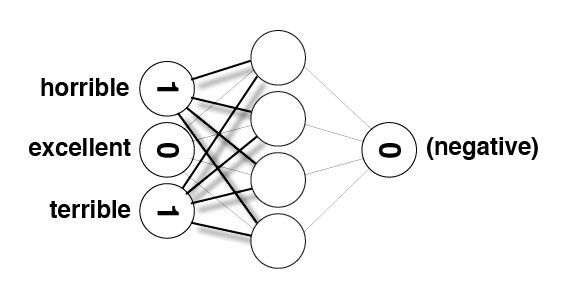

In [56]:
Image(filename='sentiment_network_sparse_2.png')

In [57]:
# words most frequently seen in a review with a "POSITIVE" label
pos_neg_ratios.most_common()

[('edie', 4.6913478822291435),
 ('paulie', 4.0775374439057197),
 ('felix', 3.1527360223636558),
 ('polanski', 2.8233610476132043),
 ('matthau', 2.8067217286092401),
 ('victoria', 2.6810215287142909),
 ('mildred', 2.6026896854443837),
 ('gandhi', 2.5389738710582761),
 ('flawless', 2.451005098112319),
 ('superbly', 2.2600254785752498),
 ('perfection', 2.1594842493533721),
 ('astaire', 2.1400661634962708),
 ('captures', 2.0386195471595809),
 ('voight', 2.0301704926730531),
 ('wonderfully', 2.0218960560332353),
 ('powell', 1.9783454248084671),
 ('brosnan', 1.9547990964725592),
 ('lily', 1.9203768470501485),
 ('bakshi', 1.9029851043382795),
 ('lincoln', 1.9014583864844796),
 ('refreshing', 1.8551812956655511),
 ('breathtaking', 1.8481124057791867),
 ('bourne', 1.8478489358790986),
 ('lemmon', 1.8458266904983307),
 ('delightful', 1.8002701588959635),
 ('flynn', 1.7996646487351682),
 ('andrews', 1.7764919970972666),
 ('homer', 1.7692866133759964),
 ('beautifully', 1.7626953362841438),
 ('socc

In [58]:
# words most frequently seen in a review with a "NEGATIVE" label
list(reversed(pos_neg_ratios.most_common()))[0:30]

[('boll', -4.0778152602708904),
 ('uwe', -3.9218753018711578),
 ('seagal', -3.3202501058581921),
 ('unwatchable', -3.0269848170580955),
 ('stinker', -2.9876839403711624),
 ('mst', -2.7753833211707968),
 ('incoherent', -2.7641396677532537),
 ('unfunny', -2.5545257844967644),
 ('waste', -2.4907515123361046),
 ('blah', -2.4475792789485005),
 ('horrid', -2.3715779644809971),
 ('pointless', -2.3451073877136341),
 ('atrocious', -2.3187369339642556),
 ('redeeming', -2.2667790015910296),
 ('prom', -2.2601040980178784),
 ('drivel', -2.2476029585766928),
 ('lousy', -2.2118080125207054),
 ('worst', -2.1930856334332267),
 ('laughable', -2.172468615469592),
 ('awful', -2.1385076866397488),
 ('poorly', -2.1326133844207011),
 ('wasting', -2.1178155545614512),
 ('remotely', -2.111046881095167),
 ('existent', -2.0024805005437076),
 ('boredom', -1.9241486572738005),
 ('miserably', -1.9216610938019989),
 ('sucks', -1.9166645809588516),
 ('uninspired', -1.9131499212248517),
 ('lame', -1.9117232884159072),

In [59]:
from bokeh.models import ColumnDataSource, LabelSet
from bokeh.plotting import figure, show, output_file
from bokeh.io import output_notebook
output_notebook()

Loading BokehJS ...

In [60]:
hist, edges = np.histogram(list(map(lambda x:x[1],pos_neg_ratios.most_common())), density=True, bins=100, normed=True)

p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="Word Positive/Negative Affinity Distribution")
p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:], line_color="#555555")
show(p)

In [63]:
frequency_frequency = Counter()

for word, cnt in total_counts.most_common():
    frequency_frequency[cnt] += 1

frequency_frequency

Counter({1111930: 1,
         336713: 1,
         327192: 1,
         164107: 1,
         163009: 1,
         145864: 1,
         135720: 1,
         107328: 1,
         101872: 1,
         96352: 1,
         93968: 1,
         87623: 1,
         76000: 1,
         73245: 1,
         65361: 1,
         48208: 1,
         46933: 1,
         44343: 1,
         44125: 1,
         44039: 1,
         42603: 1,
         40155: 1,
         34230: 1,
         34200: 1,
         34081: 1,
         30626: 1,
         30138: 1,
         29430: 1,
         29374: 1,
         27731: 1,
         26957: 1,
         26789: 1,
         23978: 1,
         23513: 1,
         22906: 1,
         22546: 1,
         21560: 1,
         21433: 1,
         20617: 1,
         20498: 1,
         20276: 1,
         18832: 1,
         18421: 1,
         18004: 1,
         17771: 1,
         17374: 1,
         17113: 1,
         16803: 1,
         16790: 1,
         16159: 1,
         15747: 1,
         15143: 1,
  

In [62]:
hist, edges = np.histogram(list(map(lambda x:x[1],frequency_frequency.most_common())), density=True, bins=100, normed=True)

p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="The frequency distribution of the words in our corpus")
p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:], line_color="#555555")
show(p)

# Project 6: Reducing Noise by Strategically Reducing the Vocabulary<a id='project_6'></a>

**TODO:** Improve `SentimentNetwork`'s performance by reducing more noise in the vocabulary. Specifically, do the following:
* Copy the `SentimentNetwork` class from the previous project into the following cell.
* Modify `pre_process_data`:
>* Add two additional parameters: `min_count` and `polarity_cutoff`
>* Calculate the positive-to-negative ratios of words used in the reviews. (You can use code you've written elsewhere in the notebook, but we are moving it into the class like we did with other helper code earlier.)
>* Andrew's solution only calculates a postive-to-negative ratio for words that occur at least 50 times. This keeps the network from attributing too much sentiment to rarer words. You can choose to add this to your solution if you would like.  
>* Change so words are only added to the vocabulary if they occur in the vocabulary more than `min_count` times.
>* Change so words are only added to the vocabulary if the absolute value of their postive-to-negative ratio is at least `polarity_cutoff`
* Modify `__init__`:
>* Add the same two parameters (`min_count` and `polarity_cutoff`) and use them when you call `pre_process_data`

In [72]:
# TODO: -Copy the SentimentNetwork class from Project 5 lesson
#       -Modify it according to the above instructions
# TODO: -Copy the SentimentNetwork class from Project 4 lesson
#       -Modify it according to the above instructions

import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews, labels, min_count=20, polarity_cutoff=0.05, hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducable results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels, polarity_cutoff, min_count)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels, polarity_cutoff, min_count):
        positive_counts = Counter()
        negative_counts = Counter()
        total_counts = Counter()
        
        for i in range(len(reviews)):
            if (labels[i] == 'POSITIVE'):
                for word in reviews[i].split(' '):
                    positive_counts[word] += 1
                    total_counts[word] += 1
            else:
                for word in reviews[i].split(' '):
                    negative_counts[word] += 1
                    total_counts[word] += 1
                    
        pos_neg_ratios = Counter()
        for term, cnt in (total_counts.most_common()):
            if (cnt >= 50):
                pos_neg_ratio = positive_counts[term] / float(negative_counts[term] + 1)
                pos_neg_ratios[term] = pos_neg_ratio

        for word, ratio in pos_neg_ratios.most_common():
            if (ratio > 1):
                pos_neg_ratios[word] = np.log(ratio)
            else:
                pos_neg_ratios[word] = -np.log(1 / (ratio + 0.01))

        review_vocab = set()
        
        for review in reviews:
            for word in review.split(' '):
                if (total_counts[word] > min_count):
                    if (word in pos_neg_ratios.keys()):
                        if ((pos_neg_ratios[word] >= polarity_cutoff) or (pos_neg_ratios[word] <= -polarity_cutoff)):
                            review_vocab.add(word)
                    else:
                        review_vocab.add(word)
                review_vocab.add(word)
        # TODO: populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words 
        #       using "split(' ')" instead of "split()".
        
        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        label_vocab = set()
        # TODO: populate label_vocab with all of the words in the given labels.
        #       There is no need to split the labels because each one is a single word.
        for label in labels:
            label_vocab.add(label)
        
        
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        # TODO: populate self.word2index with indices for all the words in self.review_vocab
        #       like you saw earlier in the notebook
        for i, word in enumerate(self.review_vocab):
            self.word2index[word] = i
        
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        # TODO: do the same thing you did for self.word2index and self.review_vocab, 
        #       but for self.label2index and self.label_vocab instead
        for i, label in enumerate(self.label_vocab):
            self.label2index[label] = i
        
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights
        
        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((self.input_nodes, self.hidden_nodes))
        
        # TODO: initialize self.weights_1_2 as a matrix of random values. 
        #       These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5,
                                            (self.hidden_nodes, self.output_nodes))
        
        # TODO: Create the input layer, a two-dimensional matrix with shape 
        #       1 x input_nodes, with all values initialized to zero
#         self.layer_0 = np.zeros((1,input_nodes))
        self.layer_1 = np.zeros((1,hidden_nodes))
        
    def update_input_layer(self,review):
        # TODO: You can copy most of the code you wrote for update_input_layer 
        #       earlier in this notebook. 
        #
        #       However, MAKE SURE YOU CHANGE ALL VARIABLES TO REFERENCE
        #       THE VERSIONS STORED IN THIS OBJECT, NOT THE GLOBAL OBJECTS.
        #       For example, replace "layer_0 *= 0" with "self.layer_0 *= 0"
        self.layer_0 *= 0
        for word in review.split(' '):
            if (word in self.word2index.keys()):
                self.layer_0[0][self.word2index[word]] = 1
                
    def get_target_for_label(self,label):
        # TODO: Copy the code you wrote for get_target_for_label 
        #       earlier in this notebook. 
        if (label == 'POSITIVE'):
            return 1
        else:
            return 0
        
    def sigmoid(self,x):
        # TODO: Return the result of calculating the sigmoid activation function
        #       shown in the lectures
        return 1 / (1 + np.exp(-x))
    
    def sigmoid_output_2_derivative(self,output):
        # TODO: Return the derivative of the sigmoid activation function, 
        #       where "output" is the original output from the sigmoid fucntion 
        return output * (1 - output)

    def train(self, training_reviews_raw, training_labels):
        
        training_reviews = list()
        for review in training_reviews_raw:
            indices = set()
            for word in review.split(' '):
                if (word in self.word2index.keys()):
                    indices.add(self.word2index[word])
            training_reviews.append(list(indices))
        
        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews) == len(training_labels))
        
        # Keep track of correct predictions to display accuracy during training 
        correct_so_far = 0
        
        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):
            
            # TODO: Get the next review and its correct label
            review = training_reviews[i]
            label = training_labels[i]
            
            # TODO: Implement the forward pass through the network. 
            #       That means use the given review to update the input layer, 
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            # 
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.
            
#             self.update_input_layer(review)
#             layer_1 = self.layer_0.dot(self.weights_0_1)
            self.layer_1 *= 0
            for index in review:
                self.layer_1 += self.weights_0_1[index]
            layer_2 = self.sigmoid(self.layer_1.dot(self.weights_1_2))
            
            
            # TODO: Implement the back propagation pass here. 
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you 
            #       learned in class.
            layer_2_error = layer_2 - self.get_target_for_label(label)
            layer_2_delta = layer_2_error * self.sigmoid_output_2_derivative(layer_2)
            layer_1_error = layer_2_delta.dot(self.weights_1_2.T)
            layer_1_delta = layer_1_error
            
            self.weights_1_2 -= self.layer_1.T.dot(layer_2_delta) * self.learning_rate
            
            for index in review:
                self.weights_0_1[index] -= layer_1_delta[0] * self.learning_rate
            
            # TODO: Keep track of correct predictions. To determine if the prediction was
            #       correct, check that the absolute value of the output error 
            #       is less than 0.5. If so, add one to the correct_so_far count.
            print(np.abs(layer_2_error))
            if (np.abs(layer_2_error) < 0.5):
                correct_so_far += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the training process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i+1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i+1))[:4] + "%")
            if(i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # TODO: Run a forward pass through the network, like you did in the
        #       "train" function. That means use the given review to 
        #       update the input layer, then calculate values for the hidden layer,
        #       and finally calculate the output layer.
        #
        #       Note: The review passed into this function for prediction 
        #             might come from anywhere, so you should convert it 
        #             to lower case prior to using it.
        
        # TODO: The output layer should now contain a prediction. 
        #       Return `POSITIVE` for predictions greater-than-or-equal-to `0.5`, 
        #       and `NEGATIVE` otherwise.
#         self.update_input_layer(review)
#         layer_1 = self.layer_0.dot(self.weights_0_1)

        training_reviews = list()
        indices = set()
        for word in review.split(' '):
            if (word in self.word2index.keys()):
                indices.add(self.word2index[word])
        
        self.layer_1 *= 0
        
        for index in indices:
            self.layer_1 += self.weights_0_1[index]
        
        layer_2 = self.sigmoid(self.layer_1.dot(self.weights_1_2))
        
        return 'POSITIVE' if layer_2[0] >= 0.5 else 'NEGATIVE'


Run the following cell to train your network with a small polarity cutoff.

In [73]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=20,polarity_cutoff=0.05,learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

[[ 0.5]]
Progress:0.0% Speed(reviews/sec):0.0 #Correct:0 #Trained:1 Training Accuracy:0.0%
[[ 0.58396532]]
Progress:0.00% Speed(reviews/sec):386.6 #Correct:0 #Trained:2 Training Accuracy:0.0%[[ 0.52431653]]
Progress:0.00% Speed(reviews/sec):494.6 #Correct:0 #Trained:3 Training Accuracy:0.0%[[ 0.78056209]]
Progress:0.01% Speed(reviews/sec):483.7 #Correct:0 #Trained:4 Training Accuracy:0.0%[[ 0.55536747]]
Progress:0.01% Speed(reviews/sec):554.3 #Correct:0 #Trained:5 Training Accuracy:0.0%[[ 0.59252287]]
Progress:0.02% Speed(reviews/sec):604.0 #Correct:0 #Trained:6 Training Accuracy:0.0%[[ 0.53764989]]
Progress:0.02% Speed(reviews/sec):652.8 #Correct:0 #Trained:7 Training Accuracy:0.0%[[ 0.48793608]]
Progress:0.02% Speed(reviews/sec):685.5 #Correct:1 #Trained:8 Training Accuracy:12.5%[[ 0.53250029]]
Progress:0.03% Speed(reviews/sec):719.2 #Correct:1 #Trained:9 Training Accuracy:11.1%[[ 0.53029669]]
Progress:0.03% Speed(reviews/sec):716.6 #Correct:1 #Trained:10 Training Accuracy:10.0%[[ 0.

Progress:0.71% Speed(reviews/sec):853.8 #Correct:117 #Trained:172 Training Accuracy:68.0%[[ 0.12271362]]
Progress:0.71% Speed(reviews/sec):835.5 #Correct:118 #Trained:173 Training Accuracy:68.2%[[ 0.25088602]]
Progress:0.72% Speed(reviews/sec):836.3 #Correct:119 #Trained:174 Training Accuracy:68.3%[[ 0.27735425]]
Progress:0.72% Speed(reviews/sec):837.3 #Correct:120 #Trained:175 Training Accuracy:68.5%[[ 0.0659769]]
Progress:0.72% Speed(reviews/sec):835.0 #Correct:121 #Trained:176 Training Accuracy:68.7%[[ 0.75504223]]
Progress:0.73% Speed(reviews/sec):835.2 #Correct:121 #Trained:177 Training Accuracy:68.3%[[ 0.27793028]]
Progress:0.73% Speed(reviews/sec):835.3 #Correct:122 #Trained:178 Training Accuracy:68.5%[[ 0.47501129]]
Progress:0.74% Speed(reviews/sec):836.2 #Correct:123 #Trained:179 Training Accuracy:68.7%[[ 0.30541727]]
Progress:0.74% Speed(reviews/sec):837.1 #Correct:124 #Trained:180 Training Accuracy:68.8%[[ 0.29908442]]
Progress:0.75% Speed(reviews/sec):837.3 #Correct:125 #Tr

Progress:1.44% Speed(reviews/sec):858.1 #Correct:251 #Trained:347 Training Accuracy:72.3%[[ 0.15667582]]
Progress:1.44% Speed(reviews/sec):850.3 #Correct:252 #Trained:348 Training Accuracy:72.4%[[ 0.32608733]]
Progress:1.45% Speed(reviews/sec):850.9 #Correct:253 #Trained:349 Training Accuracy:72.4%[[ 0.15865985]]
Progress:1.45% Speed(reviews/sec):851.0 #Correct:254 #Trained:350 Training Accuracy:72.5%[[ 0.21837877]]
Progress:1.45% Speed(reviews/sec):851.5 #Correct:255 #Trained:351 Training Accuracy:72.6%[[ 0.60686489]]
Progress:1.46% Speed(reviews/sec):851.9 #Correct:255 #Trained:352 Training Accuracy:72.4%[[ 0.44883192]]
Progress:1.46% Speed(reviews/sec):852.4 #Correct:256 #Trained:353 Training Accuracy:72.5%[[ 0.066962]]
Progress:1.47% Speed(reviews/sec):850.3 #Correct:257 #Trained:354 Training Accuracy:72.5%[[ 0.2152372]]
Progress:1.47% Speed(reviews/sec):850.7 #Correct:258 #Trained:355 Training Accuracy:72.6%[[ 0.18385376]]
Progress:1.47% Speed(reviews/sec):851.3 #Correct:259 #Trai

Progress:2.16% Speed(reviews/sec):856.8 #Correct:377 #Trained:521 Training Accuracy:72.3%[[ 0.20479644]]
Progress:2.17% Speed(reviews/sec):850.2 #Correct:378 #Trained:522 Training Accuracy:72.4%[[ 0.21497611]]
Progress:2.17% Speed(reviews/sec):850.3 #Correct:379 #Trained:523 Training Accuracy:72.4%[[ 0.41402229]]
Progress:2.17% Speed(reviews/sec):850.4 #Correct:380 #Trained:524 Training Accuracy:72.5%[[ 0.25455492]]
Progress:2.18% Speed(reviews/sec):850.9 #Correct:381 #Trained:525 Training Accuracy:72.5%[[ 0.45245721]]
Progress:2.18% Speed(reviews/sec):850.5 #Correct:382 #Trained:526 Training Accuracy:72.6%[[ 0.43597479]]
Progress:2.19% Speed(reviews/sec):850.1 #Correct:383 #Trained:527 Training Accuracy:72.6%[[ 0.59412831]]
Progress:2.19% Speed(reviews/sec):849.2 #Correct:383 #Trained:528 Training Accuracy:72.5%[[ 0.73072155]]
Progress:2.2% Speed(reviews/sec):849.5 #Correct:383 #Trained:529 Training Accuracy:72.4%[[ 0.53568905]]
Progress:2.20% Speed(reviews/sec):849.8 #Correct:383 #Tr

Progress:2.90% Speed(reviews/sec):860.8 #Correct:508 #Trained:699 Training Accuracy:72.6%[[ 0.5215708]]
Progress:2.91% Speed(reviews/sec):856.4 #Correct:508 #Trained:700 Training Accuracy:72.5%[[ 0.33891523]]
Progress:2.91% Speed(reviews/sec):855.9 #Correct:509 #Trained:701 Training Accuracy:72.6%[[ 0.15240277]]
Progress:2.92% Speed(reviews/sec):855.9 #Correct:510 #Trained:702 Training Accuracy:72.6%[[ 0.31371718]]
Progress:2.92% Speed(reviews/sec):856.1 #Correct:511 #Trained:703 Training Accuracy:72.6%[[ 0.27828268]]
Progress:2.92% Speed(reviews/sec):856.1 #Correct:512 #Trained:704 Training Accuracy:72.7%[[ 0.78847009]]
Progress:2.93% Speed(reviews/sec):856.1 #Correct:512 #Trained:705 Training Accuracy:72.6%[[ 0.52823034]]
Progress:2.93% Speed(reviews/sec):856.4 #Correct:512 #Trained:706 Training Accuracy:72.5%[[ 0.05287213]]
Progress:2.94% Speed(reviews/sec):855.2 #Correct:513 #Trained:707 Training Accuracy:72.5%[[ 0.03642615]]
Progress:2.94% Speed(reviews/sec):855.2 #Correct:514 #Tr

Progress:3.62% Speed(reviews/sec):857.9 #Correct:640 #Trained:871 Training Accuracy:73.4%[[ 0.04099576]]
Progress:3.62% Speed(reviews/sec):854.1 #Correct:641 #Trained:872 Training Accuracy:73.5%[[ 0.2743039]]
Progress:3.63% Speed(reviews/sec):854.4 #Correct:642 #Trained:873 Training Accuracy:73.5%[[ 0.9395075]]
Progress:3.63% Speed(reviews/sec):853.9 #Correct:642 #Trained:874 Training Accuracy:73.4%[[ 0.09266234]]
Progress:3.64% Speed(reviews/sec):853.9 #Correct:643 #Trained:875 Training Accuracy:73.4%[[ 0.46166449]]
Progress:3.64% Speed(reviews/sec):854.2 #Correct:644 #Trained:876 Training Accuracy:73.5%[[ 0.30426621]]
Progress:3.65% Speed(reviews/sec):854.2 #Correct:645 #Trained:877 Training Accuracy:73.5%[[ 0.16472624]]
Progress:3.65% Speed(reviews/sec):853.9 #Correct:646 #Trained:878 Training Accuracy:73.5%[[ 0.19492662]]
Progress:3.65% Speed(reviews/sec):853.5 #Correct:647 #Trained:879 Training Accuracy:73.6%[[ 0.8617328]]
Progress:3.66% Speed(reviews/sec):853.3 #Correct:647 #Trai

Progress:4.35% Speed(reviews/sec):857.8 #Correct:783 #Trained:1045 Training Accuracy:74.9%[[ 0.06866095]]
Progress:4.35% Speed(reviews/sec):855.3 #Correct:784 #Trained:1046 Training Accuracy:74.9%[[ 0.29654019]]
Progress:4.35% Speed(reviews/sec):855.4 #Correct:785 #Trained:1047 Training Accuracy:74.9%[[ 0.01687289]]
Progress:4.36% Speed(reviews/sec):855.1 #Correct:786 #Trained:1048 Training Accuracy:75.0%[[ 0.5867396]]
Progress:4.36% Speed(reviews/sec):855.3 #Correct:786 #Trained:1049 Training Accuracy:74.9%[[ 0.15119757]]
Progress:4.37% Speed(reviews/sec):855.4 #Correct:787 #Trained:1050 Training Accuracy:74.9%[[ 0.18295488]]
Progress:4.37% Speed(reviews/sec):855.7 #Correct:788 #Trained:1051 Training Accuracy:74.9%[[ 0.15688416]]
Progress:4.37% Speed(reviews/sec):855.8 #Correct:789 #Trained:1052 Training Accuracy:75.0%[[ 0.0898771]]
Progress:4.38% Speed(reviews/sec):855.8 #Correct:790 #Trained:1053 Training Accuracy:75.0%[[ 0.34283318]]
Progress:4.38% Speed(reviews/sec):856.1 #Correct

Progress:5.09% Speed(reviews/sec):860.5 #Correct:927 #Trained:1223 Training Accuracy:75.7%[[ 0.72627914]]
Progress:5.09% Speed(reviews/sec):858.3 #Correct:927 #Trained:1224 Training Accuracy:75.7%[[ 0.16006716]]
Progress:5.1% Speed(reviews/sec):858.3 #Correct:928 #Trained:1225 Training Accuracy:75.7%[[ 0.11647262]]
Progress:5.10% Speed(reviews/sec):858.3 #Correct:929 #Trained:1226 Training Accuracy:75.7%[[ 0.3074077]]
Progress:5.10% Speed(reviews/sec):857.9 #Correct:930 #Trained:1227 Training Accuracy:75.7%[[ 0.06298208]]
Progress:5.11% Speed(reviews/sec):858.0 #Correct:931 #Trained:1228 Training Accuracy:75.8%[[ 0.18070027]]
Progress:5.11% Speed(reviews/sec):858.2 #Correct:932 #Trained:1229 Training Accuracy:75.8%[[ 0.2591881]]
Progress:5.12% Speed(reviews/sec):858.3 #Correct:933 #Trained:1230 Training Accuracy:75.8%[[ 0.86036114]]
Progress:5.12% Speed(reviews/sec):858.3 #Correct:933 #Trained:1231 Training Accuracy:75.7%[[ 0.58076903]]
Progress:5.12% Speed(reviews/sec):858.5 #Correct:

Progress:5.83% Speed(reviews/sec):863.0 #Correct:1067 #Trained:1402 Training Accuracy:76.1%[[ 0.56172445]]
Progress:5.84% Speed(reviews/sec):861.1 #Correct:1067 #Trained:1403 Training Accuracy:76.0%[[ 0.56319265]]
Progress:5.84% Speed(reviews/sec):861.0 #Correct:1067 #Trained:1404 Training Accuracy:75.9%[[ 0.43000798]]
Progress:5.85% Speed(reviews/sec):861.0 #Correct:1068 #Trained:1405 Training Accuracy:76.0%[[ 0.14981503]]
Progress:5.85% Speed(reviews/sec):861.0 #Correct:1069 #Trained:1406 Training Accuracy:76.0%[[ 0.15632221]]
Progress:5.85% Speed(reviews/sec):861.1 #Correct:1070 #Trained:1407 Training Accuracy:76.0%[[ 0.04101112]]
Progress:5.86% Speed(reviews/sec):861.2 #Correct:1071 #Trained:1408 Training Accuracy:76.0%[[ 0.0280158]]
Progress:5.86% Speed(reviews/sec):861.3 #Correct:1072 #Trained:1409 Training Accuracy:76.0%[[ 0.11075934]]
Progress:5.87% Speed(reviews/sec):861.3 #Correct:1073 #Trained:1410 Training Accuracy:76.0%[[ 0.68915255]]
Progress:5.87% Speed(reviews/sec):861.

Progress:6.60% Speed(reviews/sec):865.5 #Correct:1214 #Trained:1586 Training Accuracy:76.5%[[ 0.02347069]]
Progress:6.60% Speed(reviews/sec):865.2 #Correct:1215 #Trained:1587 Training Accuracy:76.5%[[ 0.2893323]]
Progress:6.61% Speed(reviews/sec):865.3 #Correct:1216 #Trained:1588 Training Accuracy:76.5%[[ 0.49808238]]
Progress:6.61% Speed(reviews/sec):865.4 #Correct:1217 #Trained:1589 Training Accuracy:76.5%[[ 0.43666523]]
Progress:6.62% Speed(reviews/sec):865.5 #Correct:1218 #Trained:1590 Training Accuracy:76.6%[[ 0.18340382]]
Progress:6.62% Speed(reviews/sec):865.5 #Correct:1219 #Trained:1591 Training Accuracy:76.6%[[ 0.80214403]]
Progress:6.62% Speed(reviews/sec):865.0 #Correct:1219 #Trained:1592 Training Accuracy:76.5%[[ 0.92828215]]
Progress:6.63% Speed(reviews/sec):865.0 #Correct:1219 #Trained:1593 Training Accuracy:76.5%[[ 0.00685377]]
Progress:6.63% Speed(reviews/sec):865.0 #Correct:1220 #Trained:1594 Training Accuracy:76.5%[[ 0.10789522]]
Progress:6.64% Speed(reviews/sec):865.

Progress:7.38% Speed(reviews/sec):872.8 #Correct:1365 #Trained:1773 Training Accuracy:76.9%[[ 0.61308355]]
Progress:7.38% Speed(reviews/sec):871.4 #Correct:1365 #Trained:1774 Training Accuracy:76.9%[[ 0.24765719]]
Progress:7.39% Speed(reviews/sec):871.5 #Correct:1366 #Trained:1775 Training Accuracy:76.9%[[ 0.03541841]]
Progress:7.39% Speed(reviews/sec):871.5 #Correct:1367 #Trained:1776 Training Accuracy:76.9%[[ 0.14415833]]
Progress:7.4% Speed(reviews/sec):871.7 #Correct:1368 #Trained:1777 Training Accuracy:76.9%[[ 0.04542715]]
Progress:7.40% Speed(reviews/sec):871.7 #Correct:1369 #Trained:1778 Training Accuracy:76.9%[[ 0.56640389]]
Progress:7.40% Speed(reviews/sec):871.8 #Correct:1369 #Trained:1779 Training Accuracy:76.9%[[ 0.05671775]]
Progress:7.41% Speed(reviews/sec):871.9 #Correct:1370 #Trained:1780 Training Accuracy:76.9%[[ 0.37140025]]
Progress:7.41% Speed(reviews/sec):872.0 #Correct:1371 #Trained:1781 Training Accuracy:76.9%[[ 0.06001354]]
Progress:7.42% Speed(reviews/sec):872.

Progress:8.15% Speed(reviews/sec):876.9 #Correct:1513 #Trained:1959 Training Accuracy:77.2%[[ 0.02156628]]
Progress:8.16% Speed(reviews/sec):875.4 #Correct:1514 #Trained:1960 Training Accuracy:77.2%[[ 0.12731598]]
Progress:8.16% Speed(reviews/sec):875.3 #Correct:1515 #Trained:1961 Training Accuracy:77.2%[[ 0.32964922]]
Progress:8.17% Speed(reviews/sec):875.4 #Correct:1516 #Trained:1962 Training Accuracy:77.2%[[ 0.19460032]]
Progress:8.17% Speed(reviews/sec):875.4 #Correct:1517 #Trained:1963 Training Accuracy:77.2%[[ 0.213679]]
Progress:8.17% Speed(reviews/sec):875.3 #Correct:1518 #Trained:1964 Training Accuracy:77.2%[[ 0.34337379]]
Progress:8.18% Speed(reviews/sec):875.2 #Correct:1519 #Trained:1965 Training Accuracy:77.3%[[ 0.03675694]]
Progress:8.18% Speed(reviews/sec):875.0 #Correct:1520 #Trained:1966 Training Accuracy:77.3%[[ 0.45300455]]
Progress:8.19% Speed(reviews/sec):874.9 #Correct:1521 #Trained:1967 Training Accuracy:77.3%[[ 0.92871977]]
Progress:8.19% Speed(reviews/sec):874.8

Progress:8.92% Speed(reviews/sec):879.6 #Correct:1672 #Trained:2144 Training Accuracy:77.9%[[ 0.03924846]]
Progress:8.93% Speed(reviews/sec):878.2 #Correct:1673 #Trained:2145 Training Accuracy:77.9%[[ 0.11568201]]
Progress:8.93% Speed(reviews/sec):878.1 #Correct:1674 #Trained:2146 Training Accuracy:78.0%[[ 0.04117504]]
Progress:8.94% Speed(reviews/sec):878.1 #Correct:1675 #Trained:2147 Training Accuracy:78.0%[[ 0.00034575]]
Progress:8.94% Speed(reviews/sec):878.1 #Correct:1676 #Trained:2148 Training Accuracy:78.0%[[ 0.15829695]]
Progress:8.95% Speed(reviews/sec):878.2 #Correct:1677 #Trained:2149 Training Accuracy:78.0%[[ 0.02907425]]
Progress:8.95% Speed(reviews/sec):877.9 #Correct:1678 #Trained:2150 Training Accuracy:78.0%[[ 0.18309397]]
Progress:8.95% Speed(reviews/sec):877.8 #Correct:1679 #Trained:2151 Training Accuracy:78.0%[[ 0.2202959]]
Progress:8.96% Speed(reviews/sec):877.9 #Correct:1680 #Trained:2152 Training Accuracy:78.0%[[ 0.01620042]]
Progress:8.96% Speed(reviews/sec):877.

Progress:9.63% Speed(reviews/sec):876.0 #Correct:1809 #Trained:2313 Training Accuracy:78.2%[[ 0.35717675]]
Progress:9.63% Speed(reviews/sec):874.6 #Correct:1810 #Trained:2314 Training Accuracy:78.2%[[ 0.10006127]]
Progress:9.64% Speed(reviews/sec):874.4 #Correct:1811 #Trained:2315 Training Accuracy:78.2%[[ 0.10545593]]
Progress:9.64% Speed(reviews/sec):874.5 #Correct:1812 #Trained:2316 Training Accuracy:78.2%[[ 0.1857658]]
Progress:9.65% Speed(reviews/sec):874.4 #Correct:1813 #Trained:2317 Training Accuracy:78.2%[[ 0.20934982]]
Progress:9.65% Speed(reviews/sec):874.4 #Correct:1814 #Trained:2318 Training Accuracy:78.2%[[ 0.0867128]]
Progress:9.65% Speed(reviews/sec):874.4 #Correct:1815 #Trained:2319 Training Accuracy:78.2%[[ 0.18681087]]
Progress:9.66% Speed(reviews/sec):874.5 #Correct:1816 #Trained:2320 Training Accuracy:78.2%[[ 0.08338734]]
Progress:9.66% Speed(reviews/sec):874.3 #Correct:1817 #Trained:2321 Training Accuracy:78.2%[[ 0.01032947]]
Progress:9.67% Speed(reviews/sec):874.4

Progress:10.3% Speed(reviews/sec):872.0 #Correct:1943 #Trained:2480 Training Accuracy:78.3%[[ 0.15891723]]
Progress:10.3% Speed(reviews/sec):870.8 #Correct:1944 #Trained:2481 Training Accuracy:78.3%[[ 0.05516819]]
Progress:10.3% Speed(reviews/sec):870.9 #Correct:1945 #Trained:2482 Training Accuracy:78.3%[[ 0.00248173]]
Progress:10.3% Speed(reviews/sec):870.7 #Correct:1946 #Trained:2483 Training Accuracy:78.3%[[ 0.36615248]]
Progress:10.3% Speed(reviews/sec):870.8 #Correct:1947 #Trained:2484 Training Accuracy:78.3%[[ 0.03705672]]
Progress:10.3% Speed(reviews/sec):870.8 #Correct:1948 #Trained:2485 Training Accuracy:78.3%[[ 0.00926846]]
Progress:10.3% Speed(reviews/sec):870.9 #Correct:1949 #Trained:2486 Training Accuracy:78.3%[[ 0.01005743]]
Progress:10.3% Speed(reviews/sec):870.8 #Correct:1950 #Trained:2487 Training Accuracy:78.4%[[ 0.0141358]]
Progress:10.3% Speed(reviews/sec):870.8 #Correct:1951 #Trained:2488 Training Accuracy:78.4%[[ 0.85019432]]
Progress:10.3% Speed(reviews/sec):870.

Progress:11.0% Speed(reviews/sec):868.9 #Correct:2093 #Trained:2648 Training Accuracy:79.0%[[ 0.34027093]]
Progress:11.0% Speed(reviews/sec):867.8 #Correct:2094 #Trained:2649 Training Accuracy:79.0%[[ 0.18410193]]
Progress:11.0% Speed(reviews/sec):867.9 #Correct:2095 #Trained:2650 Training Accuracy:79.0%[[ 0.72242457]]
Progress:11.0% Speed(reviews/sec):867.8 #Correct:2095 #Trained:2651 Training Accuracy:79.0%[[ 0.25916455]]
Progress:11.0% Speed(reviews/sec):867.8 #Correct:2096 #Trained:2652 Training Accuracy:79.0%[[ 0.86501035]]
Progress:11.0% Speed(reviews/sec):867.9 #Correct:2096 #Trained:2653 Training Accuracy:79.0%[[ 0.70837544]]
Progress:11.0% Speed(reviews/sec):867.9 #Correct:2096 #Trained:2654 Training Accuracy:78.9%[[ 0.10776566]]
Progress:11.0% Speed(reviews/sec):867.9 #Correct:2097 #Trained:2655 Training Accuracy:78.9%[[ 0.00679226]]
Progress:11.0% Speed(reviews/sec):867.8 #Correct:2098 #Trained:2656 Training Accuracy:78.9%[[ 0.00255799]]
Progress:11.0% Speed(reviews/sec):867

Progress:11.7% Speed(reviews/sec):866.2 #Correct:2236 #Trained:2816 Training Accuracy:79.4%[[ 0.25051268]]
Progress:11.7% Speed(reviews/sec):865.3 #Correct:2237 #Trained:2817 Training Accuracy:79.4%[[ 0.18675189]]
Progress:11.7% Speed(reviews/sec):865.4 #Correct:2238 #Trained:2818 Training Accuracy:79.4%[[ 0.03144567]]
Progress:11.7% Speed(reviews/sec):865.3 #Correct:2239 #Trained:2819 Training Accuracy:79.4%[[ 0.31894512]]
Progress:11.7% Speed(reviews/sec):865.4 #Correct:2240 #Trained:2820 Training Accuracy:79.4%[[ 0.62406267]]
Progress:11.7% Speed(reviews/sec):865.5 #Correct:2240 #Trained:2821 Training Accuracy:79.4%[[ 0.04590924]]
Progress:11.7% Speed(reviews/sec):865.6 #Correct:2241 #Trained:2822 Training Accuracy:79.4%[[ 0.07923926]]
Progress:11.7% Speed(reviews/sec):865.6 #Correct:2242 #Trained:2823 Training Accuracy:79.4%[[ 0.0648879]]
Progress:11.7% Speed(reviews/sec):865.6 #Correct:2243 #Trained:2824 Training Accuracy:79.4%[[ 0.85985198]]
Progress:11.7% Speed(reviews/sec):865.

Progress:12.4% Speed(reviews/sec):865.1 #Correct:2382 #Trained:2988 Training Accuracy:79.7%[[ 0.68222009]]
Progress:12.4% Speed(reviews/sec):864.1 #Correct:2382 #Trained:2989 Training Accuracy:79.6%[[ 0.04808431]]
Progress:12.4% Speed(reviews/sec):864.2 #Correct:2383 #Trained:2990 Training Accuracy:79.6%[[ 0.12472483]]
Progress:12.4% Speed(reviews/sec):864.2 #Correct:2384 #Trained:2991 Training Accuracy:79.7%[[ 0.54833251]]
Progress:12.4% Speed(reviews/sec):864.3 #Correct:2384 #Trained:2992 Training Accuracy:79.6%[[ 0.09070986]]
Progress:12.4% Speed(reviews/sec):864.4 #Correct:2385 #Trained:2993 Training Accuracy:79.6%[[ 0.00086431]]
Progress:12.4% Speed(reviews/sec):864.2 #Correct:2386 #Trained:2994 Training Accuracy:79.6%[[ 0.3281072]]
Progress:12.4% Speed(reviews/sec):864.3 #Correct:2387 #Trained:2995 Training Accuracy:79.6%[[ 0.36648119]]
Progress:12.4% Speed(reviews/sec):864.0 #Correct:2388 #Trained:2996 Training Accuracy:79.7%[[ 0.11283538]]
Progress:12.4% Speed(reviews/sec):864.

Progress:13.1% Speed(reviews/sec):865.1 #Correct:2526 #Trained:3164 Training Accuracy:79.8%[[ 0.96120401]]
Progress:13.1% Speed(reviews/sec):864.2 #Correct:2526 #Trained:3165 Training Accuracy:79.8%[[ 0.03617979]]
Progress:13.1% Speed(reviews/sec):864.2 #Correct:2527 #Trained:3166 Training Accuracy:79.8%[[ 0.50535678]]
Progress:13.1% Speed(reviews/sec):864.2 #Correct:2527 #Trained:3167 Training Accuracy:79.7%[[ 0.21259016]]
Progress:13.1% Speed(reviews/sec):864.3 #Correct:2528 #Trained:3168 Training Accuracy:79.7%[[ 0.52789247]]
Progress:13.2% Speed(reviews/sec):864.3 #Correct:2528 #Trained:3169 Training Accuracy:79.7%[[ 0.00317924]]
Progress:13.2% Speed(reviews/sec):864.3 #Correct:2529 #Trained:3170 Training Accuracy:79.7%[[ 0.15767039]]
Progress:13.2% Speed(reviews/sec):864.4 #Correct:2530 #Trained:3171 Training Accuracy:79.7%[[ 0.00275883]]
Progress:13.2% Speed(reviews/sec):864.4 #Correct:2531 #Trained:3172 Training Accuracy:79.7%[[ 0.03369976]]
Progress:13.2% Speed(reviews/sec):864

Progress:13.9% Speed(reviews/sec):864.6 #Correct:2653 #Trained:3338 Training Accuracy:79.4%[[ 0.13367382]]
Progress:13.9% Speed(reviews/sec):863.8 #Correct:2654 #Trained:3339 Training Accuracy:79.4%[[ 0.02086933]]
Progress:13.9% Speed(reviews/sec):863.8 #Correct:2655 #Trained:3340 Training Accuracy:79.4%[[ 0.21431746]]
Progress:13.9% Speed(reviews/sec):863.9 #Correct:2656 #Trained:3341 Training Accuracy:79.4%[[ 0.01689841]]
Progress:13.9% Speed(reviews/sec):863.8 #Correct:2657 #Trained:3342 Training Accuracy:79.5%[[ 0.18008571]]
Progress:13.9% Speed(reviews/sec):863.7 #Correct:2658 #Trained:3343 Training Accuracy:79.5%[[ 0.0677671]]
Progress:13.9% Speed(reviews/sec):863.7 #Correct:2659 #Trained:3344 Training Accuracy:79.5%[[ 0.01292024]]
Progress:13.9% Speed(reviews/sec):863.5 #Correct:2660 #Trained:3345 Training Accuracy:79.5%[[ 0.39663744]]
Progress:13.9% Speed(reviews/sec):863.5 #Correct:2661 #Trained:3346 Training Accuracy:79.5%[[ 0.08421073]]
Progress:13.9% Speed(reviews/sec):863.

Progress:14.5% Speed(reviews/sec):861.9 #Correct:2791 #Trained:3503 Training Accuracy:79.6%[[ 0.49153015]]
Progress:14.5% Speed(reviews/sec):861.2 #Correct:2792 #Trained:3504 Training Accuracy:79.6%[[ 0.14027739]]
Progress:14.6% Speed(reviews/sec):861.3 #Correct:2793 #Trained:3505 Training Accuracy:79.6%[[ 0.33873575]]
Progress:14.6% Speed(reviews/sec):861.4 #Correct:2794 #Trained:3506 Training Accuracy:79.6%[[ 0.14103926]]
Progress:14.6% Speed(reviews/sec):861.4 #Correct:2795 #Trained:3507 Training Accuracy:79.6%[[ 0.06830125]]
Progress:14.6% Speed(reviews/sec):861.4 #Correct:2796 #Trained:3508 Training Accuracy:79.7%[[ 0.03487922]]
Progress:14.6% Speed(reviews/sec):861.5 #Correct:2797 #Trained:3509 Training Accuracy:79.7%[[ 0.03936543]]
Progress:14.6% Speed(reviews/sec):861.4 #Correct:2798 #Trained:3510 Training Accuracy:79.7%[[ 0.45949495]]
Progress:14.6% Speed(reviews/sec):861.5 #Correct:2799 #Trained:3511 Training Accuracy:79.7%[[ 0.51696425]]
Progress:14.6% Speed(reviews/sec):861

Progress:15.3% Speed(reviews/sec):862.4 #Correct:2933 #Trained:3680 Training Accuracy:79.7%[[ 0.09175554]]
Progress:15.3% Speed(reviews/sec):861.6 #Correct:2934 #Trained:3681 Training Accuracy:79.7%[[ 0.85351583]]
Progress:15.3% Speed(reviews/sec):861.7 #Correct:2934 #Trained:3682 Training Accuracy:79.6%[[ 0.4035099]]
Progress:15.3% Speed(reviews/sec):861.6 #Correct:2935 #Trained:3683 Training Accuracy:79.6%[[ 0.09781627]]
Progress:15.3% Speed(reviews/sec):861.7 #Correct:2936 #Trained:3684 Training Accuracy:79.6%[[ 0.05912643]]
Progress:15.3% Speed(reviews/sec):861.6 #Correct:2937 #Trained:3685 Training Accuracy:79.7%[[ 0.24405929]]
Progress:15.3% Speed(reviews/sec):861.6 #Correct:2938 #Trained:3686 Training Accuracy:79.7%[[ 0.02053741]]
Progress:15.3% Speed(reviews/sec):861.6 #Correct:2939 #Trained:3687 Training Accuracy:79.7%[[ 0.06039858]]
Progress:15.3% Speed(reviews/sec):861.6 #Correct:2940 #Trained:3688 Training Accuracy:79.7%[[ 0.10303968]]
Progress:15.3% Speed(reviews/sec):861.

Progress:16.0% Speed(reviews/sec):862.2 #Correct:3078 #Trained:3854 Training Accuracy:79.8%[[ 0.00193063]]
Progress:16.0% Speed(reviews/sec):861.4 #Correct:3079 #Trained:3855 Training Accuracy:79.8%[[ 0.59813226]]
Progress:16.0% Speed(reviews/sec):861.4 #Correct:3079 #Trained:3856 Training Accuracy:79.8%[[ 0.63292352]]
Progress:16.0% Speed(reviews/sec):861.4 #Correct:3079 #Trained:3857 Training Accuracy:79.8%[[ 0.08287239]]
Progress:16.0% Speed(reviews/sec):861.4 #Correct:3080 #Trained:3858 Training Accuracy:79.8%[[ 0.20919765]]
Progress:16.0% Speed(reviews/sec):861.4 #Correct:3081 #Trained:3859 Training Accuracy:79.8%[[ 0.05605075]]
Progress:16.0% Speed(reviews/sec):861.4 #Correct:3082 #Trained:3860 Training Accuracy:79.8%[[ 0.0034347]]
Progress:16.0% Speed(reviews/sec):861.3 #Correct:3083 #Trained:3861 Training Accuracy:79.8%[[ 0.02127736]]
Progress:16.0% Speed(reviews/sec):861.2 #Correct:3084 #Trained:3862 Training Accuracy:79.8%[[ 0.01009804]]
Progress:16.0% Speed(reviews/sec):861.

Progress:16.7% Speed(reviews/sec):862.6 #Correct:3222 #Trained:4032 Training Accuracy:79.9%[[ 0.00404434]]
Progress:16.8% Speed(reviews/sec):861.8 #Correct:3223 #Trained:4033 Training Accuracy:79.9%[[ 0.27789054]]
Progress:16.8% Speed(reviews/sec):861.7 #Correct:3224 #Trained:4034 Training Accuracy:79.9%[[ 0.31970995]]
Progress:16.8% Speed(reviews/sec):861.7 #Correct:3225 #Trained:4035 Training Accuracy:79.9%[[ 0.38176375]]
Progress:16.8% Speed(reviews/sec):861.7 #Correct:3226 #Trained:4036 Training Accuracy:79.9%[[ 0.25071568]]
Progress:16.8% Speed(reviews/sec):861.7 #Correct:3227 #Trained:4037 Training Accuracy:79.9%[[ 0.74723797]]
Progress:16.8% Speed(reviews/sec):861.7 #Correct:3227 #Trained:4038 Training Accuracy:79.9%[[ 0.94257483]]
Progress:16.8% Speed(reviews/sec):861.6 #Correct:3227 #Trained:4039 Training Accuracy:79.8%[[ 0.27785507]]
Progress:16.8% Speed(reviews/sec):861.6 #Correct:3228 #Trained:4040 Training Accuracy:79.9%[[ 0.0104969]]
Progress:16.8% Speed(reviews/sec):861.

Progress:17.5% Speed(reviews/sec):862.1 #Correct:3368 #Trained:4205 Training Accuracy:80.0%[[ 0.41850046]]
Progress:17.5% Speed(reviews/sec):861.5 #Correct:3369 #Trained:4206 Training Accuracy:80.0%[[ 0.32670727]]
Progress:17.5% Speed(reviews/sec):861.5 #Correct:3370 #Trained:4207 Training Accuracy:80.1%[[ 0.23604753]]
Progress:17.5% Speed(reviews/sec):861.5 #Correct:3371 #Trained:4208 Training Accuracy:80.1%[[ 0.3371231]]
Progress:17.5% Speed(reviews/sec):861.6 #Correct:3372 #Trained:4209 Training Accuracy:80.1%[[ 0.0202001]]
Progress:17.5% Speed(reviews/sec):861.6 #Correct:3373 #Trained:4210 Training Accuracy:80.1%[[ 0.48776541]]
Progress:17.5% Speed(reviews/sec):861.6 #Correct:3374 #Trained:4211 Training Accuracy:80.1%[[ 0.91889446]]
Progress:17.5% Speed(reviews/sec):861.6 #Correct:3374 #Trained:4212 Training Accuracy:80.1%[[ 0.6054331]]
Progress:17.5% Speed(reviews/sec):861.7 #Correct:3374 #Trained:4213 Training Accuracy:80.0%[[ 0.65075611]]
Progress:17.5% Speed(reviews/sec):861.7 

Progress:18.2% Speed(reviews/sec):861.7 #Correct:3506 #Trained:4382 Training Accuracy:80.0%[[ 0.25040516]]
Progress:18.2% Speed(reviews/sec):861.7 #Correct:3507 #Trained:4383 Training Accuracy:80.0%[[ 0.27544685]]
Progress:18.2% Speed(reviews/sec):861.8 #Correct:3508 #Trained:4384 Training Accuracy:80.0%[[ 0.18583421]]
Progress:18.2% Speed(reviews/sec):861.7 #Correct:3509 #Trained:4385 Training Accuracy:80.0%[[ 0.01419286]]
Progress:18.2% Speed(reviews/sec):861.6 #Correct:3510 #Trained:4386 Training Accuracy:80.0%[[ 0.01154598]]
Progress:18.2% Speed(reviews/sec):861.6 #Correct:3511 #Trained:4387 Training Accuracy:80.0%[[ 0.09007408]]
Progress:18.2% Speed(reviews/sec):861.7 #Correct:3512 #Trained:4388 Training Accuracy:80.0%[[ 0.20926199]]
Progress:18.2% Speed(reviews/sec):861.7 #Correct:3513 #Trained:4389 Training Accuracy:80.0%[[ 0.21507696]]
Progress:18.2% Speed(reviews/sec):861.7 #Correct:3514 #Trained:4390 Training Accuracy:80.0%[[ 0.0462681]]
Progress:18.2% Speed(reviews/sec):861.

Progress:18.9% Speed(reviews/sec):861.9 #Correct:3643 #Trained:4554 Training Accuracy:79.9%[[ 0.10715305]]
Progress:18.9% Speed(reviews/sec):861.2 #Correct:3644 #Trained:4555 Training Accuracy:80.0%[[ 0.17876914]]
Progress:18.9% Speed(reviews/sec):861.2 #Correct:3645 #Trained:4556 Training Accuracy:80.0%[[ 0.73892077]]
Progress:18.9% Speed(reviews/sec):861.1 #Correct:3645 #Trained:4557 Training Accuracy:79.9%[[ 0.50144217]]
Progress:18.9% Speed(reviews/sec):861.1 #Correct:3645 #Trained:4558 Training Accuracy:79.9%[[ 0.41168048]]
Progress:18.9% Speed(reviews/sec):861.2 #Correct:3646 #Trained:4559 Training Accuracy:79.9%[[ 0.00348057]]
Progress:18.9% Speed(reviews/sec):861.2 #Correct:3647 #Trained:4560 Training Accuracy:79.9%[[ 0.01309914]]
Progress:19.0% Speed(reviews/sec):861.2 #Correct:3648 #Trained:4561 Training Accuracy:79.9%[[ 0.05116704]]
Progress:19.0% Speed(reviews/sec):861.2 #Correct:3649 #Trained:4562 Training Accuracy:79.9%[[ 0.07015346]]
Progress:19.0% Speed(reviews/sec):861

Progress:19.6% Speed(reviews/sec):859.9 #Correct:3772 #Trained:4718 Training Accuracy:79.9%[[ 0.5795778]]
Progress:19.6% Speed(reviews/sec):859.2 #Correct:3772 #Trained:4719 Training Accuracy:79.9%[[ 0.04102962]]
Progress:19.6% Speed(reviews/sec):859.1 #Correct:3773 #Trained:4720 Training Accuracy:79.9%[[ 0.01927779]]
Progress:19.6% Speed(reviews/sec):859.0 #Correct:3774 #Trained:4721 Training Accuracy:79.9%[[ 0.39129379]]
Progress:19.6% Speed(reviews/sec):859.1 #Correct:3775 #Trained:4722 Training Accuracy:79.9%[[ 0.32470818]]
Progress:19.6% Speed(reviews/sec):859.1 #Correct:3776 #Trained:4723 Training Accuracy:79.9%[[ 0.63403855]]
Progress:19.6% Speed(reviews/sec):859.1 #Correct:3776 #Trained:4724 Training Accuracy:79.9%[[ 0.23612982]]
Progress:19.6% Speed(reviews/sec):859.1 #Correct:3777 #Trained:4725 Training Accuracy:79.9%[[ 0.51013444]]
Progress:19.6% Speed(reviews/sec):859.2 #Correct:3777 #Trained:4726 Training Accuracy:79.9%[[ 0.10415338]]
Progress:19.6% Speed(reviews/sec):859.

Progress:20.3% Speed(reviews/sec):857.2 #Correct:3908 #Trained:4878 Training Accuracy:80.1%[[ 0.22936197]]
Progress:20.3% Speed(reviews/sec):856.6 #Correct:3909 #Trained:4879 Training Accuracy:80.1%[[ 0.45102917]]
Progress:20.3% Speed(reviews/sec):856.6 #Correct:3910 #Trained:4880 Training Accuracy:80.1%[[ 0.00026339]]
Progress:20.3% Speed(reviews/sec):856.4 #Correct:3911 #Trained:4881 Training Accuracy:80.1%[[ 0.37649335]]
Progress:20.3% Speed(reviews/sec):856.5 #Correct:3912 #Trained:4882 Training Accuracy:80.1%[[ 0.26944317]]
Progress:20.3% Speed(reviews/sec):856.3 #Correct:3913 #Trained:4883 Training Accuracy:80.1%[[ 0.89231501]]
Progress:20.3% Speed(reviews/sec):856.3 #Correct:3913 #Trained:4884 Training Accuracy:80.1%[[ 0.00838208]]
Progress:20.3% Speed(reviews/sec):856.2 #Correct:3914 #Trained:4885 Training Accuracy:80.1%[[ 0.70994878]]
Progress:20.3% Speed(reviews/sec):856.2 #Correct:3914 #Trained:4886 Training Accuracy:80.1%[[ 0.1666463]]
Progress:20.3% Speed(reviews/sec):856.

Progress:21.0% Speed(reviews/sec):856.0 #Correct:4042 #Trained:5045 Training Accuracy:80.1%[[ 0.02437586]]
Progress:21.0% Speed(reviews/sec):855.4 #Correct:4043 #Trained:5046 Training Accuracy:80.1%[[ 0.42964644]]
Progress:21.0% Speed(reviews/sec):855.3 #Correct:4044 #Trained:5047 Training Accuracy:80.1%[[ 0.04516932]]
Progress:21.0% Speed(reviews/sec):855.4 #Correct:4045 #Trained:5048 Training Accuracy:80.1%[[ 0.00099752]]
Progress:21.0% Speed(reviews/sec):855.1 #Correct:4046 #Trained:5049 Training Accuracy:80.1%[[ 0.02441264]]
Progress:21.0% Speed(reviews/sec):855.2 #Correct:4047 #Trained:5050 Training Accuracy:80.1%[[ 0.12768854]]
Progress:21.0% Speed(reviews/sec):855.3 #Correct:4048 #Trained:5051 Training Accuracy:80.1%[[ 0.00984484]]
Progress:21.0% Speed(reviews/sec):855.2 #Correct:4049 #Trained:5052 Training Accuracy:80.1%[[ 0.27019553]]
Progress:21.0% Speed(reviews/sec):855.3 #Correct:4050 #Trained:5053 Training Accuracy:80.1%[[ 0.15793657]]
Progress:21.0% Speed(reviews/sec):855

Progress:21.7% Speed(reviews/sec):856.3 #Correct:4194 #Trained:5221 Training Accuracy:80.3%[[ 0.11300079]]
Progress:21.7% Speed(reviews/sec):855.7 #Correct:4195 #Trained:5222 Training Accuracy:80.3%[[ 0.1312493]]
Progress:21.7% Speed(reviews/sec):855.6 #Correct:4196 #Trained:5223 Training Accuracy:80.3%[[ 0.06649575]]
Progress:21.7% Speed(reviews/sec):855.7 #Correct:4197 #Trained:5224 Training Accuracy:80.3%[[ 0.03598949]]
Progress:21.7% Speed(reviews/sec):855.6 #Correct:4198 #Trained:5225 Training Accuracy:80.3%[[ 0.70809483]]
Progress:21.7% Speed(reviews/sec):855.6 #Correct:4198 #Trained:5226 Training Accuracy:80.3%[[ 0.08104015]]
Progress:21.7% Speed(reviews/sec):855.7 #Correct:4199 #Trained:5227 Training Accuracy:80.3%[[ 0.20762129]]
Progress:21.7% Speed(reviews/sec):855.7 #Correct:4200 #Trained:5228 Training Accuracy:80.3%[[ 0.49963765]]
Progress:21.7% Speed(reviews/sec):855.7 #Correct:4201 #Trained:5229 Training Accuracy:80.3%[[ 0.78300048]]
Progress:21.7% Speed(reviews/sec):855.

Progress:22.4% Speed(reviews/sec):856.2 #Correct:4338 #Trained:5395 Training Accuracy:80.4%[[ 0.06884693]]
Progress:22.4% Speed(reviews/sec):855.7 #Correct:4339 #Trained:5396 Training Accuracy:80.4%[[ 0.70549291]]
Progress:22.4% Speed(reviews/sec):855.7 #Correct:4339 #Trained:5397 Training Accuracy:80.3%[[ 0.02661983]]
Progress:22.4% Speed(reviews/sec):855.7 #Correct:4340 #Trained:5398 Training Accuracy:80.4%[[ 0.00474753]]
Progress:22.4% Speed(reviews/sec):855.7 #Correct:4341 #Trained:5399 Training Accuracy:80.4%[[ 0.01284236]]
Progress:22.4% Speed(reviews/sec):855.8 #Correct:4342 #Trained:5400 Training Accuracy:80.4%[[ 0.28764464]]
Progress:22.5% Speed(reviews/sec):855.8 #Correct:4343 #Trained:5401 Training Accuracy:80.4%[[ 0.00048375]]
Progress:22.5% Speed(reviews/sec):855.8 #Correct:4344 #Trained:5402 Training Accuracy:80.4%[[ 0.21870089]]
Progress:22.5% Speed(reviews/sec):855.8 #Correct:4345 #Trained:5403 Training Accuracy:80.4%[[ 0.00900665]]
Progress:22.5% Speed(reviews/sec):855

Progress:23.2% Speed(reviews/sec):856.9 #Correct:4482 #Trained:5573 Training Accuracy:80.4%[[ 0.00191475]]
Progress:23.2% Speed(reviews/sec):856.3 #Correct:4483 #Trained:5574 Training Accuracy:80.4%[[ 0.6438493]]
Progress:23.2% Speed(reviews/sec):856.3 #Correct:4483 #Trained:5575 Training Accuracy:80.4%[[ 0.00250124]]
Progress:23.2% Speed(reviews/sec):856.3 #Correct:4484 #Trained:5576 Training Accuracy:80.4%[[ 0.4738132]]
Progress:23.2% Speed(reviews/sec):856.3 #Correct:4485 #Trained:5577 Training Accuracy:80.4%[[ 0.05021855]]
Progress:23.2% Speed(reviews/sec):856.3 #Correct:4486 #Trained:5578 Training Accuracy:80.4%[[ 0.141392]]
Progress:23.2% Speed(reviews/sec):856.3 #Correct:4487 #Trained:5579 Training Accuracy:80.4%[[ 0.42600115]]
Progress:23.2% Speed(reviews/sec):856.3 #Correct:4488 #Trained:5580 Training Accuracy:80.4%[[ 0.24994229]]
Progress:23.2% Speed(reviews/sec):856.4 #Correct:4489 #Trained:5581 Training Accuracy:80.4%[[ 0.98998454]]
Progress:23.2% Speed(reviews/sec):856.4 #

Progress:23.9% Speed(reviews/sec):856.4 #Correct:4626 #Trained:5745 Training Accuracy:80.5%[[ 0.64565335]]
Progress:23.9% Speed(reviews/sec):855.9 #Correct:4626 #Trained:5746 Training Accuracy:80.5%[[ 0.8536849]]
Progress:23.9% Speed(reviews/sec):855.9 #Correct:4626 #Trained:5747 Training Accuracy:80.4%[[ 0.43513085]]
Progress:23.9% Speed(reviews/sec):855.9 #Correct:4627 #Trained:5748 Training Accuracy:80.4%[[ 0.11583497]]
Progress:23.9% Speed(reviews/sec):855.9 #Correct:4628 #Trained:5749 Training Accuracy:80.5%[[ 0.28605262]]
Progress:23.9% Speed(reviews/sec):855.9 #Correct:4629 #Trained:5750 Training Accuracy:80.5%[[ 0.52263868]]
Progress:23.9% Speed(reviews/sec):855.9 #Correct:4629 #Trained:5751 Training Accuracy:80.4%[[ 0.32276694]]
Progress:23.9% Speed(reviews/sec):855.9 #Correct:4630 #Trained:5752 Training Accuracy:80.4%[[ 0.00428197]]
Progress:23.9% Speed(reviews/sec):855.9 #Correct:4631 #Trained:5753 Training Accuracy:80.4%[[ 0.06402044]]
Progress:23.9% Speed(reviews/sec):855.

Progress:24.6% Speed(reviews/sec):855.6 #Correct:4764 #Trained:5913 Training Accuracy:80.5%[[ 0.76030088]]
Progress:24.6% Speed(reviews/sec):855.0 #Correct:4764 #Trained:5914 Training Accuracy:80.5%[[ 0.03811683]]
Progress:24.6% Speed(reviews/sec):855.0 #Correct:4765 #Trained:5915 Training Accuracy:80.5%[[ 0.30576338]]
Progress:24.6% Speed(reviews/sec):855.0 #Correct:4766 #Trained:5916 Training Accuracy:80.5%[[ 0.23778643]]
Progress:24.6% Speed(reviews/sec):855.0 #Correct:4767 #Trained:5917 Training Accuracy:80.5%[[ 0.00021919]]
Progress:24.6% Speed(reviews/sec):855.0 #Correct:4768 #Trained:5918 Training Accuracy:80.5%[[ 0.0005674]]
Progress:24.6% Speed(reviews/sec):855.0 #Correct:4769 #Trained:5919 Training Accuracy:80.5%[[ 0.02199303]]
Progress:24.6% Speed(reviews/sec):854.9 #Correct:4770 #Trained:5920 Training Accuracy:80.5%[[ 0.00187187]]
Progress:24.6% Speed(reviews/sec):854.9 #Correct:4771 #Trained:5921 Training Accuracy:80.5%[[ 0.06191165]]
Progress:24.6% Speed(reviews/sec):854.

Progress:25.3% Speed(reviews/sec):854.4 #Correct:4896 #Trained:6079 Training Accuracy:80.5%[[ 0.58255376]]
Progress:25.3% Speed(reviews/sec):854.0 #Correct:4896 #Trained:6080 Training Accuracy:80.5%[[ 0.0988824]]
Progress:25.3% Speed(reviews/sec):854.0 #Correct:4897 #Trained:6081 Training Accuracy:80.5%[[ 0.00803066]]
Progress:25.3% Speed(reviews/sec):854.0 #Correct:4898 #Trained:6082 Training Accuracy:80.5%[[ 0.70480952]]
Progress:25.3% Speed(reviews/sec):854.1 #Correct:4898 #Trained:6083 Training Accuracy:80.5%[[ 0.00203641]]
Progress:25.3% Speed(reviews/sec):854.1 #Correct:4899 #Trained:6084 Training Accuracy:80.5%[[ 0.0162415]]
Progress:25.3% Speed(reviews/sec):854.1 #Correct:4900 #Trained:6085 Training Accuracy:80.5%[[ 0.18265243]]
Progress:25.3% Speed(reviews/sec):854.1 #Correct:4901 #Trained:6086 Training Accuracy:80.5%[[ 0.12401263]]
Progress:25.3% Speed(reviews/sec):854.1 #Correct:4902 #Trained:6087 Training Accuracy:80.5%[[ 0.01061635]]
Progress:25.3% Speed(reviews/sec):854.1

Progress:26.0% Speed(reviews/sec):853.5 #Correct:5043 #Trained:6246 Training Accuracy:80.7%[[ 0.06185687]]
Progress:26.0% Speed(reviews/sec):853.1 #Correct:5044 #Trained:6247 Training Accuracy:80.7%[[ 0.2076317]]
Progress:26.0% Speed(reviews/sec):853.1 #Correct:5045 #Trained:6248 Training Accuracy:80.7%[[ 0.04935802]]
Progress:26.0% Speed(reviews/sec):853.1 #Correct:5046 #Trained:6249 Training Accuracy:80.7%[[ 0.4239099]]
Progress:26.0% Speed(reviews/sec):853.2 #Correct:5047 #Trained:6250 Training Accuracy:80.7%[[ 0.10717028]]
Progress:26.0% Speed(reviews/sec):853.2 #Correct:5048 #Trained:6251 Training Accuracy:80.7%[[ 0.23410182]]
Progress:26.0% Speed(reviews/sec):853.2 #Correct:5049 #Trained:6252 Training Accuracy:80.7%[[ 0.07466385]]
Progress:26.0% Speed(reviews/sec):853.2 #Correct:5050 #Trained:6253 Training Accuracy:80.7%[[ 0.00030113]]
Progress:26.0% Speed(reviews/sec):853.2 #Correct:5051 #Trained:6254 Training Accuracy:80.7%[[ 0.79779298]]
Progress:26.0% Speed(reviews/sec):853.3

Progress:26.7% Speed(reviews/sec):853.7 #Correct:5192 #Trained:6421 Training Accuracy:80.8%[[ 0.15039743]]
Progress:26.7% Speed(reviews/sec):853.3 #Correct:5193 #Trained:6422 Training Accuracy:80.8%[[ 0.01639253]]
Progress:26.7% Speed(reviews/sec):853.3 #Correct:5194 #Trained:6423 Training Accuracy:80.8%[[ 0.37469176]]
Progress:26.7% Speed(reviews/sec):853.3 #Correct:5195 #Trained:6424 Training Accuracy:80.8%[[ 0.02919102]]
Progress:26.7% Speed(reviews/sec):853.3 #Correct:5196 #Trained:6425 Training Accuracy:80.8%[[ 0.25172993]]
Progress:26.7% Speed(reviews/sec):853.4 #Correct:5197 #Trained:6426 Training Accuracy:80.8%[[ 0.22284472]]
Progress:26.7% Speed(reviews/sec):853.4 #Correct:5198 #Trained:6427 Training Accuracy:80.8%[[ 0.09224627]]
Progress:26.7% Speed(reviews/sec):853.4 #Correct:5199 #Trained:6428 Training Accuracy:80.8%[[ 0.02076382]]
Progress:26.7% Speed(reviews/sec):853.4 #Correct:5200 #Trained:6429 Training Accuracy:80.8%[[ 0.04460353]]
Progress:26.7% Speed(reviews/sec):853

Progress:27.5% Speed(reviews/sec):854.5 #Correct:5345 #Trained:6601 Training Accuracy:80.9%[[ 0.15362863]]
Progress:27.5% Speed(reviews/sec):854.1 #Correct:5346 #Trained:6602 Training Accuracy:80.9%[[ 0.2716394]]
Progress:27.5% Speed(reviews/sec):854.1 #Correct:5347 #Trained:6603 Training Accuracy:80.9%[[ 0.06653519]]
Progress:27.5% Speed(reviews/sec):854.1 #Correct:5348 #Trained:6604 Training Accuracy:80.9%[[  6.71408034e-06]]
Progress:27.5% Speed(reviews/sec):854.1 #Correct:5349 #Trained:6605 Training Accuracy:80.9%[[ 0.00012635]]
Progress:27.5% Speed(reviews/sec):854.1 #Correct:5350 #Trained:6606 Training Accuracy:80.9%[[ 0.13942146]]
Progress:27.5% Speed(reviews/sec):854.0 #Correct:5351 #Trained:6607 Training Accuracy:80.9%[[ 0.01552484]]
Progress:27.5% Speed(reviews/sec):854.0 #Correct:5352 #Trained:6608 Training Accuracy:80.9%[[ 0.05772165]]
Progress:27.5% Speed(reviews/sec):854.0 #Correct:5353 #Trained:6609 Training Accuracy:80.9%[[ 0.01588882]]
Progress:27.5% Speed(reviews/sec)

Progress:28.1% Speed(reviews/sec):853.7 #Correct:5491 #Trained:6768 Training Accuracy:81.1%[[ 0.8779903]]
Progress:28.2% Speed(reviews/sec):853.2 #Correct:5491 #Trained:6769 Training Accuracy:81.1%[[ 0.51003051]]
Progress:28.2% Speed(reviews/sec):853.2 #Correct:5491 #Trained:6770 Training Accuracy:81.1%[[ 0.01223987]]
Progress:28.2% Speed(reviews/sec):853.2 #Correct:5492 #Trained:6771 Training Accuracy:81.1%[[ 0.02175027]]
Progress:28.2% Speed(reviews/sec):853.3 #Correct:5493 #Trained:6772 Training Accuracy:81.1%[[ 0.13771544]]
Progress:28.2% Speed(reviews/sec):853.3 #Correct:5494 #Trained:6773 Training Accuracy:81.1%[[ 0.13052944]]
Progress:28.2% Speed(reviews/sec):853.3 #Correct:5495 #Trained:6774 Training Accuracy:81.1%[[ 0.46227904]]
Progress:28.2% Speed(reviews/sec):853.2 #Correct:5496 #Trained:6775 Training Accuracy:81.1%[[ 0.25459797]]
Progress:28.2% Speed(reviews/sec):853.3 #Correct:5497 #Trained:6776 Training Accuracy:81.1%[[ 0.4458215]]
Progress:28.2% Speed(reviews/sec):853.1

Progress:28.8% Speed(reviews/sec):853.0 #Correct:5635 #Trained:6936 Training Accuracy:81.2%[[ 0.04072831]]
Progress:28.9% Speed(reviews/sec):852.5 #Correct:5636 #Trained:6937 Training Accuracy:81.2%[[ 0.00036114]]
Progress:28.9% Speed(reviews/sec):852.5 #Correct:5637 #Trained:6938 Training Accuracy:81.2%[[ 0.02883152]]
Progress:28.9% Speed(reviews/sec):852.5 #Correct:5638 #Trained:6939 Training Accuracy:81.2%[[ 0.10394755]]
Progress:28.9% Speed(reviews/sec):852.5 #Correct:5639 #Trained:6940 Training Accuracy:81.2%[[ 0.29588999]]
Progress:28.9% Speed(reviews/sec):852.6 #Correct:5640 #Trained:6941 Training Accuracy:81.2%[[ 0.43638683]]
Progress:28.9% Speed(reviews/sec):852.5 #Correct:5641 #Trained:6942 Training Accuracy:81.2%[[ 0.00606634]]
Progress:28.9% Speed(reviews/sec):852.5 #Correct:5642 #Trained:6943 Training Accuracy:81.2%[[ 0.32006529]]
Progress:28.9% Speed(reviews/sec):852.5 #Correct:5643 #Trained:6944 Training Accuracy:81.2%[[ 0.60037248]]
Progress:28.9% Speed(reviews/sec):852

Progress:29.6% Speed(reviews/sec):851.9 #Correct:5781 #Trained:7105 Training Accuracy:81.3%[[ 0.0386054]]
Progress:29.6% Speed(reviews/sec):851.9 #Correct:5782 #Trained:7106 Training Accuracy:81.3%[[  7.89126586e-06]]
Progress:29.6% Speed(reviews/sec):851.8 #Correct:5783 #Trained:7107 Training Accuracy:81.3%[[ 0.13290924]]
Progress:29.6% Speed(reviews/sec):851.8 #Correct:5784 #Trained:7108 Training Accuracy:81.3%[[ 0.73071565]]
Progress:29.6% Speed(reviews/sec):851.9 #Correct:5784 #Trained:7109 Training Accuracy:81.3%[[ 0.10176316]]
Progress:29.6% Speed(reviews/sec):851.9 #Correct:5785 #Trained:7110 Training Accuracy:81.3%[[ 0.09638113]]
Progress:29.6% Speed(reviews/sec):851.9 #Correct:5786 #Trained:7111 Training Accuracy:81.3%[[ 0.15909835]]
Progress:29.6% Speed(reviews/sec):852.0 #Correct:5787 #Trained:7112 Training Accuracy:81.3%[[ 0.03500562]]
Progress:29.6% Speed(reviews/sec):852.0 #Correct:5788 #Trained:7113 Training Accuracy:81.3%[[ 0.86449715]]
Progress:29.6% Speed(reviews/sec)

Progress:30.3% Speed(reviews/sec):852.4 #Correct:5929 #Trained:7278 Training Accuracy:81.4%[[ 0.00563453]]
Progress:30.3% Speed(reviews/sec):852.0 #Correct:5930 #Trained:7279 Training Accuracy:81.4%[[ 0.03907741]]
Progress:30.3% Speed(reviews/sec):852.0 #Correct:5931 #Trained:7280 Training Accuracy:81.4%[[ 0.00098542]]
Progress:30.3% Speed(reviews/sec):851.9 #Correct:5932 #Trained:7281 Training Accuracy:81.4%[[ 0.11490874]]
Progress:30.3% Speed(reviews/sec):851.9 #Correct:5933 #Trained:7282 Training Accuracy:81.4%[[ 0.00100864]]
Progress:30.3% Speed(reviews/sec):851.9 #Correct:5934 #Trained:7283 Training Accuracy:81.4%[[ 0.02126403]]
Progress:30.3% Speed(reviews/sec):851.9 #Correct:5935 #Trained:7284 Training Accuracy:81.4%[[ 0.07722493]]
Progress:30.3% Speed(reviews/sec):852.0 #Correct:5936 #Trained:7285 Training Accuracy:81.4%[[ 0.28820193]]
Progress:30.3% Speed(reviews/sec):851.9 #Correct:5937 #Trained:7286 Training Accuracy:81.4%[[ 0.08114451]]
Progress:30.3% Speed(reviews/sec):851

Progress:31.0% Speed(reviews/sec):852.3 #Correct:6080 #Trained:7451 Training Accuracy:81.5%[[ 0.39741944]]
Progress:31.0% Speed(reviews/sec):851.9 #Correct:6081 #Trained:7452 Training Accuracy:81.6%[[ 0.24574969]]
Progress:31.0% Speed(reviews/sec):852.0 #Correct:6082 #Trained:7453 Training Accuracy:81.6%[[ 0.04300945]]
Progress:31.0% Speed(reviews/sec):852.0 #Correct:6083 #Trained:7454 Training Accuracy:81.6%[[ 0.77944421]]
Progress:31.0% Speed(reviews/sec):852.0 #Correct:6083 #Trained:7455 Training Accuracy:81.5%[[ 0.06573196]]
Progress:31.0% Speed(reviews/sec):852.0 #Correct:6084 #Trained:7456 Training Accuracy:81.5%[[ 0.00512508]]
Progress:31.0% Speed(reviews/sec):852.0 #Correct:6085 #Trained:7457 Training Accuracy:81.6%[[ 0.8459894]]
Progress:31.0% Speed(reviews/sec):852.0 #Correct:6085 #Trained:7458 Training Accuracy:81.5%[[ 0.05373146]]
Progress:31.0% Speed(reviews/sec):852.0 #Correct:6086 #Trained:7459 Training Accuracy:81.5%[[ 0.23714883]]
Progress:31.0% Speed(reviews/sec):852.

Progress:31.7% Speed(reviews/sec):852.5 #Correct:6223 #Trained:7626 Training Accuracy:81.6%[[ 0.25379153]]
Progress:31.7% Speed(reviews/sec):852.1 #Correct:6224 #Trained:7627 Training Accuracy:81.6%[[ 0.01063477]]
Progress:31.7% Speed(reviews/sec):852.1 #Correct:6225 #Trained:7628 Training Accuracy:81.6%[[ 0.05202379]]
Progress:31.7% Speed(reviews/sec):852.2 #Correct:6226 #Trained:7629 Training Accuracy:81.6%[[ 0.01565685]]
Progress:31.7% Speed(reviews/sec):852.2 #Correct:6227 #Trained:7630 Training Accuracy:81.6%[[ 0.72287439]]
Progress:31.7% Speed(reviews/sec):852.2 #Correct:6227 #Trained:7631 Training Accuracy:81.6%[[ 0.03352428]]
Progress:31.7% Speed(reviews/sec):852.2 #Correct:6228 #Trained:7632 Training Accuracy:81.6%[[ 0.03925722]]
Progress:31.8% Speed(reviews/sec):852.2 #Correct:6229 #Trained:7633 Training Accuracy:81.6%[[ 0.01729584]]
Progress:31.8% Speed(reviews/sec):852.2 #Correct:6230 #Trained:7634 Training Accuracy:81.6%[[ 0.01966983]]
Progress:31.8% Speed(reviews/sec):852

Progress:32.5% Speed(reviews/sec):853.0 #Correct:6380 #Trained:7804 Training Accuracy:81.7%[[ 0.34109457]]
Progress:32.5% Speed(reviews/sec):852.7 #Correct:6381 #Trained:7805 Training Accuracy:81.7%[[  7.02506501e-05]]
Progress:32.5% Speed(reviews/sec):852.6 #Correct:6382 #Trained:7806 Training Accuracy:81.7%[[ 0.11714462]]
Progress:32.5% Speed(reviews/sec):852.7 #Correct:6383 #Trained:7807 Training Accuracy:81.7%[[ 0.00597507]]
Progress:32.5% Speed(reviews/sec):852.7 #Correct:6384 #Trained:7808 Training Accuracy:81.7%[[ 0.50896006]]
Progress:32.5% Speed(reviews/sec):852.7 #Correct:6384 #Trained:7809 Training Accuracy:81.7%[[ 0.08896661]]
Progress:32.5% Speed(reviews/sec):852.7 #Correct:6385 #Trained:7810 Training Accuracy:81.7%[[ 0.0375966]]
Progress:32.5% Speed(reviews/sec):852.6 #Correct:6386 #Trained:7811 Training Accuracy:81.7%[[ 0.03585979]]
Progress:32.5% Speed(reviews/sec):852.6 #Correct:6387 #Trained:7812 Training Accuracy:81.7%[[ 0.02154214]]
Progress:32.5% Speed(reviews/sec)

Progress:33.2% Speed(reviews/sec):853.4 #Correct:6533 #Trained:7981 Training Accuracy:81.8%[[ 0.00549117]]
Progress:33.2% Speed(reviews/sec):853.0 #Correct:6534 #Trained:7982 Training Accuracy:81.8%[[ 0.04418057]]
Progress:33.2% Speed(reviews/sec):853.0 #Correct:6535 #Trained:7983 Training Accuracy:81.8%[[ 0.19027137]]
Progress:33.2% Speed(reviews/sec):853.0 #Correct:6536 #Trained:7984 Training Accuracy:81.8%[[ 0.1995]]
Progress:33.2% Speed(reviews/sec):853.0 #Correct:6537 #Trained:7985 Training Accuracy:81.8%[[ 0.06483732]]
Progress:33.2% Speed(reviews/sec):853.0 #Correct:6538 #Trained:7986 Training Accuracy:81.8%[[ 0.01445273]]
Progress:33.2% Speed(reviews/sec):853.0 #Correct:6539 #Trained:7987 Training Accuracy:81.8%[[ 0.31331281]]
Progress:33.2% Speed(reviews/sec):853.0 #Correct:6540 #Trained:7988 Training Accuracy:81.8%[[ 0.42558925]]
Progress:33.2% Speed(reviews/sec):853.0 #Correct:6541 #Trained:7989 Training Accuracy:81.8%[[ 0.00902693]]
Progress:33.2% Speed(reviews/sec):853.0 #

Progress:33.9% Speed(reviews/sec):853.7 #Correct:6688 #Trained:8157 Training Accuracy:81.9%[[ 0.84454252]]
Progress:33.9% Speed(reviews/sec):853.3 #Correct:6688 #Trained:8158 Training Accuracy:81.9%[[ 0.87275835]]
Progress:33.9% Speed(reviews/sec):853.2 #Correct:6688 #Trained:8159 Training Accuracy:81.9%[[ 0.00865016]]
Progress:33.9% Speed(reviews/sec):853.3 #Correct:6689 #Trained:8160 Training Accuracy:81.9%[[ 0.91371808]]
Progress:34.0% Speed(reviews/sec):853.3 #Correct:6689 #Trained:8161 Training Accuracy:81.9%[[ 0.06510603]]
Progress:34.0% Speed(reviews/sec):853.3 #Correct:6690 #Trained:8162 Training Accuracy:81.9%[[ 0.08313402]]
Progress:34.0% Speed(reviews/sec):853.3 #Correct:6691 #Trained:8163 Training Accuracy:81.9%[[ 0.87433974]]
Progress:34.0% Speed(reviews/sec):853.3 #Correct:6691 #Trained:8164 Training Accuracy:81.9%[[ 0.55360226]]
Progress:34.0% Speed(reviews/sec):853.3 #Correct:6691 #Trained:8165 Training Accuracy:81.9%[[ 0.23553334]]
Progress:34.0% Speed(reviews/sec):853

Progress:34.7% Speed(reviews/sec):853.5 #Correct:6834 #Trained:8330 Training Accuracy:82.0%[[ 0.00996602]]
Progress:34.7% Speed(reviews/sec):853.2 #Correct:6835 #Trained:8331 Training Accuracy:82.0%[[ 0.01047084]]
Progress:34.7% Speed(reviews/sec):853.2 #Correct:6836 #Trained:8332 Training Accuracy:82.0%[[ 0.06609813]]
Progress:34.7% Speed(reviews/sec):853.3 #Correct:6837 #Trained:8333 Training Accuracy:82.0%[[ 0.00250604]]
Progress:34.7% Speed(reviews/sec):853.3 #Correct:6838 #Trained:8334 Training Accuracy:82.0%[[ 0.54340437]]
Progress:34.7% Speed(reviews/sec):853.2 #Correct:6838 #Trained:8335 Training Accuracy:82.0%[[ 0.05335166]]
Progress:34.7% Speed(reviews/sec):853.3 #Correct:6839 #Trained:8336 Training Accuracy:82.0%[[ 0.00039161]]
Progress:34.7% Speed(reviews/sec):853.3 #Correct:6840 #Trained:8337 Training Accuracy:82.0%[[ 0.02567599]]
Progress:34.7% Speed(reviews/sec):853.2 #Correct:6841 #Trained:8338 Training Accuracy:82.0%[[ 0.02143806]]
Progress:34.7% Speed(reviews/sec):853

Progress:35.4% Speed(reviews/sec):853.6 #Correct:6978 #Trained:8504 Training Accuracy:82.0%[[ 0.08185198]]
Progress:35.4% Speed(reviews/sec):853.3 #Correct:6979 #Trained:8505 Training Accuracy:82.0%[[ 0.00436045]]
Progress:35.4% Speed(reviews/sec):853.3 #Correct:6980 #Trained:8506 Training Accuracy:82.0%[[ 0.00451133]]
Progress:35.4% Speed(reviews/sec):853.2 #Correct:6981 #Trained:8507 Training Accuracy:82.0%[[ 0.0146774]]
Progress:35.4% Speed(reviews/sec):853.3 #Correct:6982 #Trained:8508 Training Accuracy:82.0%[[ 0.02107974]]
Progress:35.4% Speed(reviews/sec):853.2 #Correct:6983 #Trained:8509 Training Accuracy:82.0%[[ 0.0545105]]
Progress:35.4% Speed(reviews/sec):853.2 #Correct:6984 #Trained:8510 Training Accuracy:82.0%[[ 0.25158798]]
Progress:35.4% Speed(reviews/sec):853.2 #Correct:6985 #Trained:8511 Training Accuracy:82.0%[[ 0.12609217]]
Progress:35.4% Speed(reviews/sec):853.2 #Correct:6986 #Trained:8512 Training Accuracy:82.0%[[ 0.00169472]]
Progress:35.4% Speed(reviews/sec):853.3

Progress:36.1% Speed(reviews/sec):853.9 #Correct:7129 #Trained:8681 Training Accuracy:82.1%[[ 0.17256799]]
Progress:36.1% Speed(reviews/sec):853.6 #Correct:7130 #Trained:8682 Training Accuracy:82.1%[[ 0.00574929]]
Progress:36.1% Speed(reviews/sec):853.6 #Correct:7131 #Trained:8683 Training Accuracy:82.1%[[ 0.05920979]]
Progress:36.1% Speed(reviews/sec):853.6 #Correct:7132 #Trained:8684 Training Accuracy:82.1%[[ 0.18776769]]
Progress:36.1% Speed(reviews/sec):853.5 #Correct:7133 #Trained:8685 Training Accuracy:82.1%[[ 0.03074505]]
Progress:36.1% Speed(reviews/sec):853.6 #Correct:7134 #Trained:8686 Training Accuracy:82.1%[[ 0.26515821]]
Progress:36.1% Speed(reviews/sec):853.5 #Correct:7135 #Trained:8687 Training Accuracy:82.1%[[ 0.01825186]]
Progress:36.1% Speed(reviews/sec):853.5 #Correct:7136 #Trained:8688 Training Accuracy:82.1%[[ 0.15950498]]
Progress:36.2% Speed(reviews/sec):853.5 #Correct:7137 #Trained:8689 Training Accuracy:82.1%[[ 0.4797428]]
Progress:36.2% Speed(reviews/sec):853.

Progress:36.8% Speed(reviews/sec):853.2 #Correct:7276 #Trained:8851 Training Accuracy:82.2%[[ 0.02235832]]
Progress:36.8% Speed(reviews/sec):853.2 #Correct:7277 #Trained:8852 Training Accuracy:82.2%[[ 0.01114747]]
Progress:36.8% Speed(reviews/sec):853.1 #Correct:7278 #Trained:8853 Training Accuracy:82.2%[[ 0.18190084]]
Progress:36.8% Speed(reviews/sec):853.1 #Correct:7279 #Trained:8854 Training Accuracy:82.2%[[ 0.04288271]]
Progress:36.8% Speed(reviews/sec):853.1 #Correct:7280 #Trained:8855 Training Accuracy:82.2%[[ 0.89217815]]
Progress:36.8% Speed(reviews/sec):853.1 #Correct:7280 #Trained:8856 Training Accuracy:82.2%[[ 0.00023748]]
Progress:36.9% Speed(reviews/sec):853.1 #Correct:7281 #Trained:8857 Training Accuracy:82.2%[[ 0.15689642]]
Progress:36.9% Speed(reviews/sec):853.1 #Correct:7282 #Trained:8858 Training Accuracy:82.2%[[ 0.31623564]]
Progress:36.9% Speed(reviews/sec):853.1 #Correct:7283 #Trained:8859 Training Accuracy:82.2%[[ 0.00092065]]
Progress:36.9% Speed(reviews/sec):853

Progress:37.5% Speed(reviews/sec):853.3 #Correct:7424 #Trained:9021 Training Accuracy:82.2%[[ 0.05051449]]
Progress:37.5% Speed(reviews/sec):852.9 #Correct:7425 #Trained:9022 Training Accuracy:82.2%[[ 0.29731168]]
Progress:37.5% Speed(reviews/sec):852.9 #Correct:7426 #Trained:9023 Training Accuracy:82.3%[[ 0.15626655]]
Progress:37.5% Speed(reviews/sec):852.9 #Correct:7427 #Trained:9024 Training Accuracy:82.3%[[ 0.0222563]]
Progress:37.6% Speed(reviews/sec):853.0 #Correct:7428 #Trained:9025 Training Accuracy:82.3%[[ 0.10736542]]
Progress:37.6% Speed(reviews/sec):853.0 #Correct:7429 #Trained:9026 Training Accuracy:82.3%[[ 0.01796097]]
Progress:37.6% Speed(reviews/sec):853.0 #Correct:7430 #Trained:9027 Training Accuracy:82.3%[[ 0.50413174]]
Progress:37.6% Speed(reviews/sec):853.0 #Correct:7430 #Trained:9028 Training Accuracy:82.2%[[ 0.02258887]]
Progress:37.6% Speed(reviews/sec):853.0 #Correct:7431 #Trained:9029 Training Accuracy:82.3%[[ 0.00480225]]
Progress:37.6% Speed(reviews/sec):853.

Progress:38.3% Speed(reviews/sec):853.0 #Correct:7584 #Trained:9196 Training Accuracy:82.4%[[ 0.01778116]]
Progress:38.3% Speed(reviews/sec):853.0 #Correct:7585 #Trained:9197 Training Accuracy:82.4%[[ 0.12883954]]
Progress:38.3% Speed(reviews/sec):853.0 #Correct:7586 #Trained:9198 Training Accuracy:82.4%[[ 0.00180536]]
Progress:38.3% Speed(reviews/sec):852.9 #Correct:7587 #Trained:9199 Training Accuracy:82.4%[[ 0.61499138]]
Progress:38.3% Speed(reviews/sec):853.0 #Correct:7587 #Trained:9200 Training Accuracy:82.4%[[ 0.32986994]]
Progress:38.3% Speed(reviews/sec):853.0 #Correct:7588 #Trained:9201 Training Accuracy:82.4%[[ 0.00752407]]
Progress:38.3% Speed(reviews/sec):853.0 #Correct:7589 #Trained:9202 Training Accuracy:82.4%[[ 0.00855303]]
Progress:38.3% Speed(reviews/sec):853.0 #Correct:7590 #Trained:9203 Training Accuracy:82.4%[[ 0.09140223]]
Progress:38.3% Speed(reviews/sec):853.0 #Correct:7591 #Trained:9204 Training Accuracy:82.4%[[ 0.0012944]]
Progress:38.3% Speed(reviews/sec):853.

Progress:39.0% Speed(reviews/sec):853.9 #Correct:7736 #Trained:9380 Training Accuracy:82.4%[[ 0.59365541]]
Progress:39.0% Speed(reviews/sec):853.9 #Correct:7736 #Trained:9381 Training Accuracy:82.4%[[ 0.03055887]]
Progress:39.0% Speed(reviews/sec):853.9 #Correct:7737 #Trained:9382 Training Accuracy:82.4%[[ 0.05742475]]
Progress:39.0% Speed(reviews/sec):853.9 #Correct:7738 #Trained:9383 Training Accuracy:82.4%[[ 0.04214967]]
Progress:39.0% Speed(reviews/sec):853.9 #Correct:7739 #Trained:9384 Training Accuracy:82.4%[[ 0.14945777]]
Progress:39.1% Speed(reviews/sec):854.0 #Correct:7740 #Trained:9385 Training Accuracy:82.4%[[ 0.00430231]]
Progress:39.1% Speed(reviews/sec):854.0 #Correct:7741 #Trained:9386 Training Accuracy:82.4%[[ 0.24360819]]
Progress:39.1% Speed(reviews/sec):854.0 #Correct:7742 #Trained:9387 Training Accuracy:82.4%[[ 0.01408146]]
Progress:39.1% Speed(reviews/sec):854.0 #Correct:7743 #Trained:9388 Training Accuracy:82.4%[[ 0.0447344]]
Progress:39.1% Speed(reviews/sec):854.

Progress:39.6% Speed(reviews/sec):850.9 #Correct:7852 #Trained:9516 Training Accuracy:82.5%[[ 0.50544096]]
Progress:39.6% Speed(reviews/sec):850.6 #Correct:7852 #Trained:9517 Training Accuracy:82.5%[[ 0.38851888]]
Progress:39.6% Speed(reviews/sec):850.6 #Correct:7853 #Trained:9518 Training Accuracy:82.5%[[ 0.29248944]]
Progress:39.6% Speed(reviews/sec):850.6 #Correct:7854 #Trained:9519 Training Accuracy:82.5%[[ 0.01573037]]
Progress:39.6% Speed(reviews/sec):850.6 #Correct:7855 #Trained:9520 Training Accuracy:82.5%[[ 0.04425305]]
Progress:39.6% Speed(reviews/sec):850.6 #Correct:7856 #Trained:9521 Training Accuracy:82.5%[[ 0.01067166]]
Progress:39.6% Speed(reviews/sec):850.6 #Correct:7857 #Trained:9522 Training Accuracy:82.5%[[ 0.03622094]]
Progress:39.6% Speed(reviews/sec):850.6 #Correct:7858 #Trained:9523 Training Accuracy:82.5%[[ 0.00445956]]
Progress:39.6% Speed(reviews/sec):850.6 #Correct:7859 #Trained:9524 Training Accuracy:82.5%[[ 0.98012979]]
Progress:39.6% Speed(reviews/sec):850

Progress:40.3% Speed(reviews/sec):850.9 #Correct:8005 #Trained:9688 Training Accuracy:82.6%[[ 0.00041945]]
Progress:40.3% Speed(reviews/sec):850.5 #Correct:8006 #Trained:9689 Training Accuracy:82.6%[[ 0.12271766]]
Progress:40.3% Speed(reviews/sec):850.5 #Correct:8007 #Trained:9690 Training Accuracy:82.6%[[ 0.88033033]]
Progress:40.3% Speed(reviews/sec):850.5 #Correct:8007 #Trained:9691 Training Accuracy:82.6%[[ 0.16475165]]
Progress:40.3% Speed(reviews/sec):850.5 #Correct:8008 #Trained:9692 Training Accuracy:82.6%[[ 0.02228755]]
Progress:40.3% Speed(reviews/sec):850.5 #Correct:8009 #Trained:9693 Training Accuracy:82.6%[[ 0.00169811]]
Progress:40.3% Speed(reviews/sec):850.5 #Correct:8010 #Trained:9694 Training Accuracy:82.6%[[ 0.99746248]]
Progress:40.3% Speed(reviews/sec):850.4 #Correct:8010 #Trained:9695 Training Accuracy:82.6%[[ 0.01112831]]
Progress:40.3% Speed(reviews/sec):850.4 #Correct:8011 #Trained:9696 Training Accuracy:82.6%[[ 0.53884331]]
Progress:40.4% Speed(reviews/sec):850

Progress:41.0% Speed(reviews/sec):850.4 #Correct:8149 #Trained:9856 Training Accuracy:82.6%[[ 0.04206184]]
Progress:41.0% Speed(reviews/sec):850.0 #Correct:8150 #Trained:9857 Training Accuracy:82.6%[[ 0.16617765]]
Progress:41.0% Speed(reviews/sec):850.1 #Correct:8151 #Trained:9858 Training Accuracy:82.6%[[ 0.0308874]]
Progress:41.0% Speed(reviews/sec):850.1 #Correct:8152 #Trained:9859 Training Accuracy:82.6%[[ 0.01377944]]
Progress:41.0% Speed(reviews/sec):850.1 #Correct:8153 #Trained:9860 Training Accuracy:82.6%[[ 0.46984565]]
Progress:41.0% Speed(reviews/sec):850.1 #Correct:8154 #Trained:9861 Training Accuracy:82.6%[[ 0.44305352]]
Progress:41.0% Speed(reviews/sec):850.1 #Correct:8155 #Trained:9862 Training Accuracy:82.6%[[ 0.00018189]]
Progress:41.0% Speed(reviews/sec):850.1 #Correct:8156 #Trained:9863 Training Accuracy:82.6%[[ 0.24106827]]
Progress:41.0% Speed(reviews/sec):850.1 #Correct:8157 #Trained:9864 Training Accuracy:82.6%[[ 0.64120366]]
Progress:41.1% Speed(reviews/sec):850.

Progress:41.7% Speed(reviews/sec):850.1 #Correct:8293 #Trained:10027 Training Accuracy:82.7%[[ 0.41069453]]
Progress:41.7% Speed(reviews/sec):849.8 #Correct:8294 #Trained:10028 Training Accuracy:82.7%[[ 0.07688524]]
Progress:41.7% Speed(reviews/sec):849.8 #Correct:8295 #Trained:10029 Training Accuracy:82.7%[[ 0.86469532]]
Progress:41.7% Speed(reviews/sec):849.8 #Correct:8295 #Trained:10030 Training Accuracy:82.7%[[ 0.00065381]]
Progress:41.7% Speed(reviews/sec):849.8 #Correct:8296 #Trained:10031 Training Accuracy:82.7%[[ 0.16695783]]
Progress:41.7% Speed(reviews/sec):849.8 #Correct:8297 #Trained:10032 Training Accuracy:82.7%[[ 0.00713681]]
Progress:41.8% Speed(reviews/sec):849.8 #Correct:8298 #Trained:10033 Training Accuracy:82.7%[[ 0.23153841]]
Progress:41.8% Speed(reviews/sec):849.8 #Correct:8299 #Trained:10034 Training Accuracy:82.7%[[ 0.09734922]]
Progress:41.8% Speed(reviews/sec):849.8 #Correct:8300 #Trained:10035 Training Accuracy:82.7%[[ 0.14945067]]
Progress:41.8% Speed(reviews

Progress:42.4% Speed(reviews/sec):849.9 #Correct:8438 #Trained:10197 Training Accuracy:82.7%[[ 0.21781101]]
Progress:42.4% Speed(reviews/sec):849.6 #Correct:8439 #Trained:10198 Training Accuracy:82.7%[[ 0.26598213]]
Progress:42.4% Speed(reviews/sec):849.6 #Correct:8440 #Trained:10199 Training Accuracy:82.7%[[ 0.11640377]]
Progress:42.4% Speed(reviews/sec):849.6 #Correct:8441 #Trained:10200 Training Accuracy:82.7%[[ 0.00635893]]
Progress:42.5% Speed(reviews/sec):849.6 #Correct:8442 #Trained:10201 Training Accuracy:82.7%[[ 0.00338009]]
Progress:42.5% Speed(reviews/sec):849.6 #Correct:8443 #Trained:10202 Training Accuracy:82.7%[[ 0.49435169]]
Progress:42.5% Speed(reviews/sec):849.6 #Correct:8444 #Trained:10203 Training Accuracy:82.7%[[ 0.00315793]]
Progress:42.5% Speed(reviews/sec):849.6 #Correct:8445 #Trained:10204 Training Accuracy:82.7%[[ 0.00920447]]
Progress:42.5% Speed(reviews/sec):849.6 #Correct:8446 #Trained:10205 Training Accuracy:82.7%[[ 0.00910431]]
Progress:42.5% Speed(reviews

Progress:43.1% Speed(reviews/sec):849.4 #Correct:8586 #Trained:10364 Training Accuracy:82.8%[[ 0.02014183]]
Progress:43.1% Speed(reviews/sec):849.1 #Correct:8587 #Trained:10365 Training Accuracy:82.8%[[ 0.00166444]]
Progress:43.1% Speed(reviews/sec):849.1 #Correct:8588 #Trained:10366 Training Accuracy:82.8%[[ 0.02886201]]
Progress:43.1% Speed(reviews/sec):849.1 #Correct:8589 #Trained:10367 Training Accuracy:82.8%[[ 0.1159353]]
Progress:43.1% Speed(reviews/sec):849.2 #Correct:8590 #Trained:10368 Training Accuracy:82.8%[[ 0.004211]]
Progress:43.2% Speed(reviews/sec):849.1 #Correct:8591 #Trained:10369 Training Accuracy:82.8%[[ 0.24612438]]
Progress:43.2% Speed(reviews/sec):849.1 #Correct:8592 #Trained:10370 Training Accuracy:82.8%[[ 0.00044356]]
Progress:43.2% Speed(reviews/sec):849.1 #Correct:8593 #Trained:10371 Training Accuracy:82.8%[[ 0.37449987]]
Progress:43.2% Speed(reviews/sec):849.1 #Correct:8594 #Trained:10372 Training Accuracy:82.8%[[ 0.45025765]]
Progress:43.2% Speed(reviews/se

Progress:43.8% Speed(reviews/sec):849.4 #Correct:8736 #Trained:10536 Training Accuracy:82.9%[[ 0.12272205]]
Progress:43.9% Speed(reviews/sec):849.1 #Correct:8737 #Trained:10537 Training Accuracy:82.9%[[ 0.11374092]]
Progress:43.9% Speed(reviews/sec):849.1 #Correct:8738 #Trained:10538 Training Accuracy:82.9%[[ 0.53155352]]
Progress:43.9% Speed(reviews/sec):849.1 #Correct:8738 #Trained:10539 Training Accuracy:82.9%[[ 0.63482711]]
Progress:43.9% Speed(reviews/sec):849.1 #Correct:8738 #Trained:10540 Training Accuracy:82.9%[[ 0.00351039]]
Progress:43.9% Speed(reviews/sec):849.1 #Correct:8739 #Trained:10541 Training Accuracy:82.9%[[ 0.39812272]]
Progress:43.9% Speed(reviews/sec):849.1 #Correct:8740 #Trained:10542 Training Accuracy:82.9%[[ 0.05224036]]
Progress:43.9% Speed(reviews/sec):849.1 #Correct:8741 #Trained:10543 Training Accuracy:82.9%[[ 0.03273337]]
Progress:43.9% Speed(reviews/sec):849.2 #Correct:8742 #Trained:10544 Training Accuracy:82.9%[[ 0.67900576]]
Progress:43.9% Speed(reviews

Progress:44.5% Speed(reviews/sec):848.8 #Correct:8876 #Trained:10702 Training Accuracy:82.9%[[ 0.01207116]]
Progress:44.5% Speed(reviews/sec):848.5 #Correct:8877 #Trained:10703 Training Accuracy:82.9%[[ 0.05915051]]
Progress:44.5% Speed(reviews/sec):848.5 #Correct:8878 #Trained:10704 Training Accuracy:82.9%[[ 0.25076761]]
Progress:44.6% Speed(reviews/sec):848.5 #Correct:8879 #Trained:10705 Training Accuracy:82.9%[[ 0.26482431]]
Progress:44.6% Speed(reviews/sec):848.5 #Correct:8880 #Trained:10706 Training Accuracy:82.9%[[ 0.40772445]]
Progress:44.6% Speed(reviews/sec):848.5 #Correct:8881 #Trained:10707 Training Accuracy:82.9%[[ 0.03067329]]
Progress:44.6% Speed(reviews/sec):848.5 #Correct:8882 #Trained:10708 Training Accuracy:82.9%[[ 0.13224611]]
Progress:44.6% Speed(reviews/sec):848.5 #Correct:8883 #Trained:10709 Training Accuracy:82.9%[[ 0.33718301]]
Progress:44.6% Speed(reviews/sec):848.5 #Correct:8884 #Trained:10710 Training Accuracy:82.9%[[ 0.0883155]]
Progress:44.6% Speed(reviews/

Progress:45.3% Speed(reviews/sec):848.4 #Correct:9027 #Trained:10875 Training Accuracy:83.0%[[ 0.03555975]]
Progress:45.3% Speed(reviews/sec):848.4 #Correct:9028 #Trained:10876 Training Accuracy:83.0%[[ 0.05161753]]
Progress:45.3% Speed(reviews/sec):848.4 #Correct:9029 #Trained:10877 Training Accuracy:83.0%[[ 0.3243435]]
Progress:45.3% Speed(reviews/sec):848.4 #Correct:9030 #Trained:10878 Training Accuracy:83.0%[[ 0.0004439]]
Progress:45.3% Speed(reviews/sec):848.4 #Correct:9031 #Trained:10879 Training Accuracy:83.0%[[ 0.00643499]]
Progress:45.3% Speed(reviews/sec):848.4 #Correct:9032 #Trained:10880 Training Accuracy:83.0%[[ 0.4342479]]
Progress:45.3% Speed(reviews/sec):848.4 #Correct:9033 #Trained:10881 Training Accuracy:83.0%[[ 0.54019366]]
Progress:45.3% Speed(reviews/sec):848.4 #Correct:9033 #Trained:10882 Training Accuracy:83.0%[[ 0.83453379]]
Progress:45.3% Speed(reviews/sec):848.4 #Correct:9033 #Trained:10883 Training Accuracy:83.0%[[ 0.0084842]]
Progress:45.3% Speed(reviews/sec

Progress:45.9% Speed(reviews/sec):847.8 #Correct:9166 #Trained:11035 Training Accuracy:83.0%[[ 0.86584583]]
Progress:45.9% Speed(reviews/sec):847.5 #Correct:9166 #Trained:11036 Training Accuracy:83.0%[[ 0.00516691]]
Progress:45.9% Speed(reviews/sec):847.5 #Correct:9167 #Trained:11037 Training Accuracy:83.0%[[ 0.44094515]]
Progress:45.9% Speed(reviews/sec):847.5 #Correct:9168 #Trained:11038 Training Accuracy:83.0%[[ 0.00150794]]
Progress:45.9% Speed(reviews/sec):847.6 #Correct:9169 #Trained:11039 Training Accuracy:83.0%[[ 0.00014156]]
Progress:45.9% Speed(reviews/sec):847.5 #Correct:9170 #Trained:11040 Training Accuracy:83.0%[[ 0.10746693]]
Progress:46.0% Speed(reviews/sec):847.5 #Correct:9171 #Trained:11041 Training Accuracy:83.0%[[  9.90407205e-05]]
Progress:46.0% Speed(reviews/sec):847.5 #Correct:9172 #Trained:11042 Training Accuracy:83.0%[[ 0.0995437]]
Progress:46.0% Speed(reviews/sec):847.5 #Correct:9173 #Trained:11043 Training Accuracy:83.0%[[ 0.04953911]]
Progress:46.0% Speed(rev

Progress:46.7% Speed(reviews/sec):847.9 #Correct:9315 #Trained:11209 Training Accuracy:83.1%[[ 0.00294203]]
Progress:46.7% Speed(reviews/sec):847.6 #Correct:9316 #Trained:11210 Training Accuracy:83.1%[[ 0.06152849]]
Progress:46.7% Speed(reviews/sec):847.6 #Correct:9317 #Trained:11211 Training Accuracy:83.1%[[ 0.10879304]]
Progress:46.7% Speed(reviews/sec):847.6 #Correct:9318 #Trained:11212 Training Accuracy:83.1%[[ 0.00031128]]
Progress:46.7% Speed(reviews/sec):847.6 #Correct:9319 #Trained:11213 Training Accuracy:83.1%[[ 0.01464781]]
Progress:46.7% Speed(reviews/sec):847.6 #Correct:9320 #Trained:11214 Training Accuracy:83.1%[[ 0.00024968]]
Progress:46.7% Speed(reviews/sec):847.5 #Correct:9321 #Trained:11215 Training Accuracy:83.1%[[ 0.05780937]]
Progress:46.7% Speed(reviews/sec):847.5 #Correct:9322 #Trained:11216 Training Accuracy:83.1%[[ 0.35974128]]
Progress:46.7% Speed(reviews/sec):847.5 #Correct:9323 #Trained:11217 Training Accuracy:83.1%[[ 0.56259573]]
Progress:46.7% Speed(reviews

Progress:47.3% Speed(reviews/sec):847.3 #Correct:9446 #Trained:11374 Training Accuracy:83.0%[[ 0.94218978]]
Progress:47.3% Speed(reviews/sec):847.0 #Correct:9446 #Trained:11375 Training Accuracy:83.0%[[ 0.23609313]]
Progress:47.3% Speed(reviews/sec):847.0 #Correct:9447 #Trained:11376 Training Accuracy:83.0%[[ 0.25423186]]
Progress:47.4% Speed(reviews/sec):847.0 #Correct:9448 #Trained:11377 Training Accuracy:83.0%[[ 0.37268139]]
Progress:47.4% Speed(reviews/sec):847.0 #Correct:9449 #Trained:11378 Training Accuracy:83.0%[[ 0.63162505]]
Progress:47.4% Speed(reviews/sec):847.0 #Correct:9449 #Trained:11379 Training Accuracy:83.0%[[ 0.01680149]]
Progress:47.4% Speed(reviews/sec):847.0 #Correct:9450 #Trained:11380 Training Accuracy:83.0%[[ 0.04291023]]
Progress:47.4% Speed(reviews/sec):847.0 #Correct:9451 #Trained:11381 Training Accuracy:83.0%[[ 0.03316567]]
Progress:47.4% Speed(reviews/sec):847.0 #Correct:9452 #Trained:11382 Training Accuracy:83.0%[[ 0.01465226]]
Progress:47.4% Speed(reviews

Progress:48.1% Speed(reviews/sec):848.2 #Correct:9609 #Trained:11559 Training Accuracy:83.1%[[ 0.04850914]]
Progress:48.1% Speed(reviews/sec):847.9 #Correct:9610 #Trained:11560 Training Accuracy:83.1%[[ 0.0788145]]
Progress:48.1% Speed(reviews/sec):848.0 #Correct:9611 #Trained:11561 Training Accuracy:83.1%[[ 0.14242938]]
Progress:48.1% Speed(reviews/sec):848.0 #Correct:9612 #Trained:11562 Training Accuracy:83.1%[[ 0.39804354]]
Progress:48.1% Speed(reviews/sec):848.0 #Correct:9613 #Trained:11563 Training Accuracy:83.1%[[ 0.02775944]]
Progress:48.1% Speed(reviews/sec):848.0 #Correct:9614 #Trained:11564 Training Accuracy:83.1%[[ 0.05461904]]
Progress:48.1% Speed(reviews/sec):848.0 #Correct:9615 #Trained:11565 Training Accuracy:83.1%[[ 0.00014261]]
Progress:48.1% Speed(reviews/sec):848.0 #Correct:9616 #Trained:11566 Training Accuracy:83.1%[[ 0.34909637]]
Progress:48.1% Speed(reviews/sec):848.0 #Correct:9617 #Trained:11567 Training Accuracy:83.1%[[ 0.09684807]]
Progress:48.1% Speed(reviews/

Progress:48.8% Speed(reviews/sec):847.9 #Correct:9753 #Trained:11728 Training Accuracy:83.1%[[ 0.60289897]]
Progress:48.8% Speed(reviews/sec):847.7 #Correct:9753 #Trained:11729 Training Accuracy:83.1%[[ 0.0028455]]
Progress:48.8% Speed(reviews/sec):847.6 #Correct:9754 #Trained:11730 Training Accuracy:83.1%[[ 0.03388452]]
Progress:48.8% Speed(reviews/sec):847.6 #Correct:9755 #Trained:11731 Training Accuracy:83.1%[[ 0.46913222]]
Progress:48.8% Speed(reviews/sec):847.6 #Correct:9756 #Trained:11732 Training Accuracy:83.1%[[ 0.01447359]]
Progress:48.8% Speed(reviews/sec):847.6 #Correct:9757 #Trained:11733 Training Accuracy:83.1%[[ 0.05358535]]
Progress:48.8% Speed(reviews/sec):847.6 #Correct:9758 #Trained:11734 Training Accuracy:83.1%[[ 0.01110956]]
Progress:48.8% Speed(reviews/sec):847.6 #Correct:9759 #Trained:11735 Training Accuracy:83.1%[[ 0.21212065]]
Progress:48.8% Speed(reviews/sec):847.7 #Correct:9760 #Trained:11736 Training Accuracy:83.1%[[ 0.00185028]]
Progress:48.9% Speed(reviews/

Progress:49.5% Speed(reviews/sec):847.4 #Correct:9898 #Trained:11893 Training Accuracy:83.2%[[ 0.64586126]]
Progress:49.5% Speed(reviews/sec):847.1 #Correct:9898 #Trained:11894 Training Accuracy:83.2%[[ 0.6978882]]
Progress:49.5% Speed(reviews/sec):847.2 #Correct:9898 #Trained:11895 Training Accuracy:83.2%[[ 0.05767211]]
Progress:49.5% Speed(reviews/sec):847.2 #Correct:9899 #Trained:11896 Training Accuracy:83.2%[[ 0.02809467]]
Progress:49.5% Speed(reviews/sec):847.2 #Correct:9900 #Trained:11897 Training Accuracy:83.2%[[ 0.5686044]]
Progress:49.5% Speed(reviews/sec):847.2 #Correct:9900 #Trained:11898 Training Accuracy:83.2%[[  4.56347609e-05]]
Progress:49.5% Speed(reviews/sec):847.2 #Correct:9901 #Trained:11899 Training Accuracy:83.2%[[ 0.22131956]]
Progress:49.5% Speed(reviews/sec):847.1 #Correct:9902 #Trained:11900 Training Accuracy:83.2%[[ 0.05941938]]
Progress:49.5% Speed(reviews/sec):847.2 #Correct:9903 #Trained:11901 Training Accuracy:83.2%[[ 0.02691974]]
Progress:49.5% Speed(revi

Progress:50.2% Speed(reviews/sec):847.1 #Correct:10051 #Trained:12062 Training Accuracy:83.3%[[ 0.14804005]]
Progress:50.2% Speed(reviews/sec):846.9 #Correct:10052 #Trained:12063 Training Accuracy:83.3%[[ 0.07994282]]
Progress:50.2% Speed(reviews/sec):846.9 #Correct:10053 #Trained:12064 Training Accuracy:83.3%[[ 0.06919654]]
Progress:50.2% Speed(reviews/sec):846.9 #Correct:10054 #Trained:12065 Training Accuracy:83.3%[[  9.81224185e-05]]
Progress:50.2% Speed(reviews/sec):846.8 #Correct:10055 #Trained:12066 Training Accuracy:83.3%[[ 0.14390494]]
Progress:50.2% Speed(reviews/sec):846.9 #Correct:10056 #Trained:12067 Training Accuracy:83.3%[[ 0.02420948]]
Progress:50.2% Speed(reviews/sec):846.9 #Correct:10057 #Trained:12068 Training Accuracy:83.3%[[ 0.05554542]]
Progress:50.2% Speed(reviews/sec):846.9 #Correct:10058 #Trained:12069 Training Accuracy:83.3%[[  3.95118355e-05]]
Progress:50.2% Speed(reviews/sec):846.8 #Correct:10059 #Trained:12070 Training Accuracy:83.3%[[ 0.07747301]]
Progress:

Progress:50.9% Speed(reviews/sec):846.7 #Correct:10187 #Trained:12228 Training Accuracy:83.3%[[ 0.00255659]]
Progress:50.9% Speed(reviews/sec):846.5 #Correct:10188 #Trained:12229 Training Accuracy:83.3%[[ 0.21024192]]
Progress:50.9% Speed(reviews/sec):846.5 #Correct:10189 #Trained:12230 Training Accuracy:83.3%[[ 0.0989286]]
Progress:50.9% Speed(reviews/sec):846.5 #Correct:10190 #Trained:12231 Training Accuracy:83.3%[[ 0.01945647]]
Progress:50.9% Speed(reviews/sec):846.5 #Correct:10191 #Trained:12232 Training Accuracy:83.3%[[ 0.09485591]]
Progress:50.9% Speed(reviews/sec):846.6 #Correct:10192 #Trained:12233 Training Accuracy:83.3%[[ 0.00089699]]
Progress:50.9% Speed(reviews/sec):846.5 #Correct:10193 #Trained:12234 Training Accuracy:83.3%[[ 0.04648836]]
Progress:50.9% Speed(reviews/sec):846.5 #Correct:10194 #Trained:12235 Training Accuracy:83.3%[[ 0.82569844]]
Progress:50.9% Speed(reviews/sec):846.5 #Correct:10194 #Trained:12236 Training Accuracy:83.3%[[ 0.02635216]]
Progress:50.9% Speed

Progress:51.7% Speed(reviews/sec):847.3 #Correct:10348 #Trained:12413 Training Accuracy:83.3%[[ 0.13705431]]
Progress:51.7% Speed(reviews/sec):847.3 #Correct:10349 #Trained:12414 Training Accuracy:83.3%[[ 0.98831808]]
Progress:51.7% Speed(reviews/sec):847.3 #Correct:10349 #Trained:12415 Training Accuracy:83.3%[[ 0.52979979]]
Progress:51.7% Speed(reviews/sec):847.3 #Correct:10349 #Trained:12416 Training Accuracy:83.3%[[ 0.00248291]]
Progress:51.7% Speed(reviews/sec):847.3 #Correct:10350 #Trained:12417 Training Accuracy:83.3%[[ 0.00017177]]
Progress:51.7% Speed(reviews/sec):847.3 #Correct:10351 #Trained:12418 Training Accuracy:83.3%[[ 0.00287655]]
Progress:51.7% Speed(reviews/sec):847.3 #Correct:10352 #Trained:12419 Training Accuracy:83.3%[[ 0.01387969]]
Progress:51.7% Speed(reviews/sec):847.4 #Correct:10353 #Trained:12420 Training Accuracy:83.3%[[ 0.07921732]]
Progress:51.7% Speed(reviews/sec):847.4 #Correct:10354 #Trained:12421 Training Accuracy:83.3%[[ 0.31971948]]
Progress:51.7% Spee

Progress:52.4% Speed(reviews/sec):847.3 #Correct:10501 #Trained:12580 Training Accuracy:83.4%[[  6.32607058e-05]]
Progress:52.4% Speed(reviews/sec):847.0 #Correct:10502 #Trained:12581 Training Accuracy:83.4%[[ 0.01352725]]
Progress:52.4% Speed(reviews/sec):847.0 #Correct:10503 #Trained:12582 Training Accuracy:83.4%[[ 0.02307013]]
Progress:52.4% Speed(reviews/sec):847.0 #Correct:10504 #Trained:12583 Training Accuracy:83.4%[[ 0.00035122]]
Progress:52.4% Speed(reviews/sec):847.0 #Correct:10505 #Trained:12584 Training Accuracy:83.4%[[ 0.66738309]]
Progress:52.4% Speed(reviews/sec):847.0 #Correct:10505 #Trained:12585 Training Accuracy:83.4%[[ 0.05903919]]
Progress:52.4% Speed(reviews/sec):847.0 #Correct:10506 #Trained:12586 Training Accuracy:83.4%[[ 0.01086525]]
Progress:52.4% Speed(reviews/sec):847.0 #Correct:10507 #Trained:12587 Training Accuracy:83.4%[[ 0.01964467]]
Progress:52.4% Speed(reviews/sec):847.0 #Correct:10508 #Trained:12588 Training Accuracy:83.4%[[ 0.02593218]]
Progress:52.4%

Progress:53.1% Speed(reviews/sec):847.1 #Correct:10650 #Trained:12751 Training Accuracy:83.5%[[ 0.00036139]]
Progress:53.1% Speed(reviews/sec):846.9 #Correct:10651 #Trained:12752 Training Accuracy:83.5%[[ 0.05385464]]
Progress:53.1% Speed(reviews/sec):846.9 #Correct:10652 #Trained:12753 Training Accuracy:83.5%[[ 0.00152046]]
Progress:53.1% Speed(reviews/sec):846.9 #Correct:10653 #Trained:12754 Training Accuracy:83.5%[[ 0.09529237]]
Progress:53.1% Speed(reviews/sec):847.0 #Correct:10654 #Trained:12755 Training Accuracy:83.5%[[ 0.00019029]]
Progress:53.1% Speed(reviews/sec):846.9 #Correct:10655 #Trained:12756 Training Accuracy:83.5%[[ 0.39141637]]
Progress:53.1% Speed(reviews/sec):847.0 #Correct:10656 #Trained:12757 Training Accuracy:83.5%[[ 0.39902553]]
Progress:53.1% Speed(reviews/sec):847.0 #Correct:10657 #Trained:12758 Training Accuracy:83.5%[[ 0.21971481]]
Progress:53.1% Speed(reviews/sec):847.0 #Correct:10658 #Trained:12759 Training Accuracy:83.5%[[ 0.31309207]]
Progress:53.1% Spee

Progress:53.8% Speed(reviews/sec):847.4 #Correct:10799 #Trained:12927 Training Accuracy:83.5%[[ 0.00047227]]
Progress:53.8% Speed(reviews/sec):847.2 #Correct:10800 #Trained:12928 Training Accuracy:83.5%[[  9.04755932e-05]]
Progress:53.8% Speed(reviews/sec):847.2 #Correct:10801 #Trained:12929 Training Accuracy:83.5%[[ 0.00307772]]
Progress:53.8% Speed(reviews/sec):847.2 #Correct:10802 #Trained:12930 Training Accuracy:83.5%[[ 0.16138681]]
Progress:53.8% Speed(reviews/sec):847.2 #Correct:10803 #Trained:12931 Training Accuracy:83.5%[[ 0.27025989]]
Progress:53.8% Speed(reviews/sec):847.2 #Correct:10804 #Trained:12932 Training Accuracy:83.5%[[ 0.22183851]]
Progress:53.8% Speed(reviews/sec):847.2 #Correct:10805 #Trained:12933 Training Accuracy:83.5%[[ 0.28086082]]
Progress:53.8% Speed(reviews/sec):847.2 #Correct:10806 #Trained:12934 Training Accuracy:83.5%[[ 0.04161791]]
Progress:53.8% Speed(reviews/sec):847.2 #Correct:10807 #Trained:12935 Training Accuracy:83.5%[[ 0.01134719]]
Progress:53.8%

Progress:54.5% Speed(reviews/sec):847.2 #Correct:10949 #Trained:13101 Training Accuracy:83.5%[[ 0.447852]]
Progress:54.5% Speed(reviews/sec):847.2 #Correct:10950 #Trained:13102 Training Accuracy:83.5%[[ 0.13405503]]
Progress:54.5% Speed(reviews/sec):847.2 #Correct:10951 #Trained:13103 Training Accuracy:83.5%[[ 0.11429262]]
Progress:54.5% Speed(reviews/sec):847.3 #Correct:10952 #Trained:13104 Training Accuracy:83.5%[[ 0.00785254]]
Progress:54.6% Speed(reviews/sec):847.2 #Correct:10953 #Trained:13105 Training Accuracy:83.5%[[ 0.06618788]]
Progress:54.6% Speed(reviews/sec):847.3 #Correct:10954 #Trained:13106 Training Accuracy:83.5%[[ 0.0013391]]
Progress:54.6% Speed(reviews/sec):847.2 #Correct:10955 #Trained:13107 Training Accuracy:83.5%[[ 0.04261681]]
Progress:54.6% Speed(reviews/sec):847.2 #Correct:10956 #Trained:13108 Training Accuracy:83.5%[[ 0.01744197]]
Progress:54.6% Speed(reviews/sec):847.3 #Correct:10957 #Trained:13109 Training Accuracy:83.5%[[ 0.00356264]]
Progress:54.6% Speed(r

Progress:55.3% Speed(reviews/sec):848.2 #Correct:11107 #Trained:13284 Training Accuracy:83.6%[[ 0.00948602]]
Progress:55.3% Speed(reviews/sec):848.0 #Correct:11108 #Trained:13285 Training Accuracy:83.6%[[ 0.41267423]]
Progress:55.3% Speed(reviews/sec):848.0 #Correct:11109 #Trained:13286 Training Accuracy:83.6%[[ 0.05132378]]
Progress:55.3% Speed(reviews/sec):848.0 #Correct:11110 #Trained:13287 Training Accuracy:83.6%[[ 0.02462027]]
Progress:55.3% Speed(reviews/sec):848.0 #Correct:11111 #Trained:13288 Training Accuracy:83.6%[[ 0.1123766]]
Progress:55.3% Speed(reviews/sec):848.0 #Correct:11112 #Trained:13289 Training Accuracy:83.6%[[ 0.00103979]]
Progress:55.3% Speed(reviews/sec):848.0 #Correct:11113 #Trained:13290 Training Accuracy:83.6%[[ 0.05889647]]
Progress:55.3% Speed(reviews/sec):848.0 #Correct:11114 #Trained:13291 Training Accuracy:83.6%[[ 0.16581112]]
Progress:55.3% Speed(reviews/sec):848.1 #Correct:11115 #Trained:13292 Training Accuracy:83.6%[[ 0.37672265]]
Progress:55.3% Speed

Progress:56.0% Speed(reviews/sec):848.3 #Correct:11256 #Trained:13458 Training Accuracy:83.6%[[ 0.0327599]]
Progress:56.0% Speed(reviews/sec):848.1 #Correct:11257 #Trained:13459 Training Accuracy:83.6%[[ 0.02804025]]
Progress:56.0% Speed(reviews/sec):848.1 #Correct:11258 #Trained:13460 Training Accuracy:83.6%[[ 0.01506298]]
Progress:56.0% Speed(reviews/sec):848.1 #Correct:11259 #Trained:13461 Training Accuracy:83.6%[[ 0.01477138]]
Progress:56.0% Speed(reviews/sec):848.1 #Correct:11260 #Trained:13462 Training Accuracy:83.6%[[ 0.02170918]]
Progress:56.0% Speed(reviews/sec):848.1 #Correct:11261 #Trained:13463 Training Accuracy:83.6%[[ 0.01409789]]
Progress:56.0% Speed(reviews/sec):848.1 #Correct:11262 #Trained:13464 Training Accuracy:83.6%[[ 0.11362396]]
Progress:56.1% Speed(reviews/sec):848.1 #Correct:11263 #Trained:13465 Training Accuracy:83.6%[[ 0.01833403]]
Progress:56.1% Speed(reviews/sec):848.0 #Correct:11264 #Trained:13466 Training Accuracy:83.6%[[ 0.00041414]]
Progress:56.1% Speed

Progress:56.7% Speed(reviews/sec):848.0 #Correct:11406 #Trained:13626 Training Accuracy:83.7%[[ 0.01435339]]
Progress:56.7% Speed(reviews/sec):847.8 #Correct:11407 #Trained:13627 Training Accuracy:83.7%[[ 0.00135623]]
Progress:56.7% Speed(reviews/sec):847.8 #Correct:11408 #Trained:13628 Training Accuracy:83.7%[[ 0.06201585]]
Progress:56.7% Speed(reviews/sec):847.8 #Correct:11409 #Trained:13629 Training Accuracy:83.7%[[ 0.02300834]]
Progress:56.7% Speed(reviews/sec):847.8 #Correct:11410 #Trained:13630 Training Accuracy:83.7%[[ 0.32806384]]
Progress:56.7% Speed(reviews/sec):847.8 #Correct:11411 #Trained:13631 Training Accuracy:83.7%[[ 0.00017566]]
Progress:56.7% Speed(reviews/sec):847.8 #Correct:11412 #Trained:13632 Training Accuracy:83.7%[[ 0.56437083]]
Progress:56.8% Speed(reviews/sec):847.8 #Correct:11412 #Trained:13633 Training Accuracy:83.7%[[ 0.02101184]]
Progress:56.8% Speed(reviews/sec):847.8 #Correct:11413 #Trained:13634 Training Accuracy:83.7%[[ 0.6830489]]
Progress:56.8% Speed

Progress:57.4% Speed(reviews/sec):847.8 #Correct:11547 #Trained:13794 Training Accuracy:83.7%[[  5.84513971e-05]]
Progress:57.4% Speed(reviews/sec):847.5 #Correct:11548 #Trained:13795 Training Accuracy:83.7%[[ 0.80558642]]
Progress:57.4% Speed(reviews/sec):847.5 #Correct:11548 #Trained:13796 Training Accuracy:83.7%[[ 0.04794576]]
Progress:57.4% Speed(reviews/sec):847.5 #Correct:11549 #Trained:13797 Training Accuracy:83.7%[[ 0.03984081]]
Progress:57.4% Speed(reviews/sec):847.5 #Correct:11550 #Trained:13798 Training Accuracy:83.7%[[ 0.11527577]]
Progress:57.4% Speed(reviews/sec):847.5 #Correct:11551 #Trained:13799 Training Accuracy:83.7%[[ 0.00013758]]
Progress:57.4% Speed(reviews/sec):847.5 #Correct:11552 #Trained:13800 Training Accuracy:83.7%[[ 0.01236155]]
Progress:57.5% Speed(reviews/sec):847.5 #Correct:11553 #Trained:13801 Training Accuracy:83.7%[[ 0.03409196]]
Progress:57.5% Speed(reviews/sec):847.5 #Correct:11554 #Trained:13802 Training Accuracy:83.7%[[ 0.02103686]]
Progress:57.5%

Progress:58.2% Speed(reviews/sec):847.9 #Correct:11702 #Trained:13970 Training Accuracy:83.7%[[ 0.00035021]]
Progress:58.2% Speed(reviews/sec):847.7 #Correct:11703 #Trained:13971 Training Accuracy:83.7%[[ 0.00884315]]
Progress:58.2% Speed(reviews/sec):847.7 #Correct:11704 #Trained:13972 Training Accuracy:83.7%[[ 0.01882674]]
Progress:58.2% Speed(reviews/sec):847.8 #Correct:11705 #Trained:13973 Training Accuracy:83.7%[[ 0.02487927]]
Progress:58.2% Speed(reviews/sec):847.8 #Correct:11706 #Trained:13974 Training Accuracy:83.7%[[ 0.31693887]]
Progress:58.2% Speed(reviews/sec):847.8 #Correct:11707 #Trained:13975 Training Accuracy:83.7%[[ 0.02410054]]
Progress:58.2% Speed(reviews/sec):847.8 #Correct:11708 #Trained:13976 Training Accuracy:83.7%[[ 0.50798513]]
Progress:58.2% Speed(reviews/sec):847.8 #Correct:11708 #Trained:13977 Training Accuracy:83.7%[[ 0.59580225]]
Progress:58.2% Speed(reviews/sec):847.8 #Correct:11708 #Trained:13978 Training Accuracy:83.7%[[ 0.02696959]]
Progress:58.2% Spee

Progress:58.9% Speed(reviews/sec):848.4 #Correct:11853 #Trained:14149 Training Accuracy:83.7%[[ 0.2421963]]
Progress:58.9% Speed(reviews/sec):848.1 #Correct:11854 #Trained:14150 Training Accuracy:83.7%[[ 0.68208688]]
Progress:58.9% Speed(reviews/sec):848.1 #Correct:11854 #Trained:14151 Training Accuracy:83.7%[[ 0.0019612]]
Progress:58.9% Speed(reviews/sec):848.1 #Correct:11855 #Trained:14152 Training Accuracy:83.7%[[ 0.00609902]]
Progress:58.9% Speed(reviews/sec):848.1 #Correct:11856 #Trained:14153 Training Accuracy:83.7%[[ 0.11725324]]
Progress:58.9% Speed(reviews/sec):848.1 #Correct:11857 #Trained:14154 Training Accuracy:83.7%[[ 0.09111129]]
Progress:58.9% Speed(reviews/sec):848.1 #Correct:11858 #Trained:14155 Training Accuracy:83.7%[[ 0.43821207]]
Progress:58.9% Speed(reviews/sec):848.1 #Correct:11859 #Trained:14156 Training Accuracy:83.7%[[ 0.00226239]]
Progress:58.9% Speed(reviews/sec):848.1 #Correct:11860 #Trained:14157 Training Accuracy:83.7%[[ 0.01368211]]
Progress:58.9% Speed(

Progress:59.6% Speed(reviews/sec):848.4 #Correct:12007 #Trained:14323 Training Accuracy:83.8%[[ 0.11496233]]
Progress:59.6% Speed(reviews/sec):848.2 #Correct:12008 #Trained:14324 Training Accuracy:83.8%[[ 0.13922451]]
Progress:59.6% Speed(reviews/sec):848.2 #Correct:12009 #Trained:14325 Training Accuracy:83.8%[[ 0.1856167]]
Progress:59.6% Speed(reviews/sec):848.2 #Correct:12010 #Trained:14326 Training Accuracy:83.8%[[ 0.5134157]]
Progress:59.6% Speed(reviews/sec):848.2 #Correct:12010 #Trained:14327 Training Accuracy:83.8%[[ 0.00608557]]
Progress:59.6% Speed(reviews/sec):848.2 #Correct:12011 #Trained:14328 Training Accuracy:83.8%[[ 0.24837145]]
Progress:59.7% Speed(reviews/sec):848.2 #Correct:12012 #Trained:14329 Training Accuracy:83.8%[[ 0.08821922]]
Progress:59.7% Speed(reviews/sec):848.2 #Correct:12013 #Trained:14330 Training Accuracy:83.8%[[ 0.00097304]]
Progress:59.7% Speed(reviews/sec):848.2 #Correct:12014 #Trained:14331 Training Accuracy:83.8%[[ 0.37317521]]
Progress:59.7% Speed(

Progress:60.4% Speed(reviews/sec):848.8 #Correct:12143 #Trained:14502 Training Accuracy:83.7%[[ 0.00022284]]
Progress:60.4% Speed(reviews/sec):848.6 #Correct:12144 #Trained:14503 Training Accuracy:83.7%[[ 0.09843148]]
Progress:60.4% Speed(reviews/sec):848.6 #Correct:12145 #Trained:14504 Training Accuracy:83.7%[[ 0.29699669]]
Progress:60.4% Speed(reviews/sec):848.6 #Correct:12146 #Trained:14505 Training Accuracy:83.7%[[ 0.23875337]]
Progress:60.4% Speed(reviews/sec):848.6 #Correct:12147 #Trained:14506 Training Accuracy:83.7%[[ 0.00082139]]
Progress:60.4% Speed(reviews/sec):848.6 #Correct:12148 #Trained:14507 Training Accuracy:83.7%[[ 0.00182311]]
Progress:60.4% Speed(reviews/sec):848.6 #Correct:12149 #Trained:14508 Training Accuracy:83.7%[[  5.63446948e-05]]
Progress:60.4% Speed(reviews/sec):848.6 #Correct:12150 #Trained:14509 Training Accuracy:83.7%[[ 0.94078615]]
Progress:60.4% Speed(reviews/sec):848.6 #Correct:12150 #Trained:14510 Training Accuracy:83.7%[[ 0.01894209]]
Progress:60.4%

Progress:61.1% Speed(reviews/sec):848.5 #Correct:12283 #Trained:14671 Training Accuracy:83.7%[[ 0.75150175]]
Progress:61.1% Speed(reviews/sec):848.3 #Correct:12283 #Trained:14672 Training Accuracy:83.7%[[ 0.76098344]]
Progress:61.1% Speed(reviews/sec):848.3 #Correct:12283 #Trained:14673 Training Accuracy:83.7%[[ 0.00878846]]
Progress:61.1% Speed(reviews/sec):848.3 #Correct:12284 #Trained:14674 Training Accuracy:83.7%[[ 0.71617154]]
Progress:61.1% Speed(reviews/sec):848.3 #Correct:12284 #Trained:14675 Training Accuracy:83.7%[[ 0.018449]]
Progress:61.1% Speed(reviews/sec):848.3 #Correct:12285 #Trained:14676 Training Accuracy:83.7%[[ 0.1426153]]
Progress:61.1% Speed(reviews/sec):848.3 #Correct:12286 #Trained:14677 Training Accuracy:83.7%[[ 0.00080328]]
Progress:61.1% Speed(reviews/sec):848.3 #Correct:12287 #Trained:14678 Training Accuracy:83.7%[[ 0.03869715]]
Progress:61.1% Speed(reviews/sec):848.3 #Correct:12288 #Trained:14679 Training Accuracy:83.7%[[ 0.00695492]]
Progress:61.1% Speed(r

Progress:61.8% Speed(reviews/sec):848.0 #Correct:12421 #Trained:14834 Training Accuracy:83.7%[[ 0.24163884]]
Progress:61.8% Speed(reviews/sec):847.8 #Correct:12422 #Trained:14835 Training Accuracy:83.7%[[ 0.0649845]]
Progress:61.8% Speed(reviews/sec):847.8 #Correct:12423 #Trained:14836 Training Accuracy:83.7%[[ 0.21520752]]
Progress:61.8% Speed(reviews/sec):847.8 #Correct:12424 #Trained:14837 Training Accuracy:83.7%[[ 0.0710301]]
Progress:61.8% Speed(reviews/sec):847.8 #Correct:12425 #Trained:14838 Training Accuracy:83.7%[[ 0.47191827]]
Progress:61.8% Speed(reviews/sec):847.8 #Correct:12426 #Trained:14839 Training Accuracy:83.7%[[  5.63176564e-05]]
Progress:61.8% Speed(reviews/sec):847.8 #Correct:12427 #Trained:14840 Training Accuracy:83.7%[[ 0.00180234]]
Progress:61.8% Speed(reviews/sec):847.7 #Correct:12428 #Trained:14841 Training Accuracy:83.7%[[ 0.00019142]]
Progress:61.8% Speed(reviews/sec):847.7 #Correct:12429 #Trained:14842 Training Accuracy:83.7%[[ 0.35856895]]
Progress:61.8% S

Progress:62.4% Speed(reviews/sec):847.6 #Correct:12564 #Trained:15000 Training Accuracy:83.7%[[ 0.53278655]]
Progress:62.5% Speed(reviews/sec):847.5 #Correct:12564 #Trained:15001 Training Accuracy:83.7%
[[ 0.00057897]]
Progress:62.5% Speed(reviews/sec):847.4 #Correct:12565 #Trained:15002 Training Accuracy:83.7%[[ 0.08242961]]
Progress:62.5% Speed(reviews/sec):847.4 #Correct:12566 #Trained:15003 Training Accuracy:83.7%[[ 0.01621551]]
Progress:62.5% Speed(reviews/sec):847.5 #Correct:12567 #Trained:15004 Training Accuracy:83.7%[[ 0.15737004]]
Progress:62.5% Speed(reviews/sec):847.5 #Correct:12568 #Trained:15005 Training Accuracy:83.7%[[ 0.42696847]]
Progress:62.5% Speed(reviews/sec):847.5 #Correct:12569 #Trained:15006 Training Accuracy:83.7%[[ 0.26116282]]
Progress:62.5% Speed(reviews/sec):847.5 #Correct:12570 #Trained:15007 Training Accuracy:83.7%[[ 0.04662744]]
Progress:62.5% Speed(reviews/sec):847.5 #Correct:12571 #Trained:15008 Training Accuracy:83.7%[[ 0.05192115]]
Progress:62.5% Spe

Progress:63.1% Speed(reviews/sec):847.3 #Correct:12695 #Trained:15165 Training Accuracy:83.7%[[ 0.03200526]]
Progress:63.1% Speed(reviews/sec):847.0 #Correct:12696 #Trained:15166 Training Accuracy:83.7%[[ 0.14178683]]
Progress:63.1% Speed(reviews/sec):847.1 #Correct:12697 #Trained:15167 Training Accuracy:83.7%[[ 0.96823936]]
Progress:63.1% Speed(reviews/sec):847.1 #Correct:12697 #Trained:15168 Training Accuracy:83.7%[[ 0.5907885]]
Progress:63.2% Speed(reviews/sec):847.1 #Correct:12697 #Trained:15169 Training Accuracy:83.7%[[ 0.16554935]]
Progress:63.2% Speed(reviews/sec):847.1 #Correct:12698 #Trained:15170 Training Accuracy:83.7%[[ 0.0178019]]
Progress:63.2% Speed(reviews/sec):847.1 #Correct:12699 #Trained:15171 Training Accuracy:83.7%[[ 0.2557161]]
Progress:63.2% Speed(reviews/sec):847.1 #Correct:12700 #Trained:15172 Training Accuracy:83.7%[[ 0.03401237]]
Progress:63.2% Speed(reviews/sec):847.1 #Correct:12701 #Trained:15173 Training Accuracy:83.7%[[ 0.10702591]]
Progress:63.2% Speed(r

Progress:63.8% Speed(reviews/sec):846.6 #Correct:12832 #Trained:15326 Training Accuracy:83.7%[[ 0.00097497]]
Progress:63.8% Speed(reviews/sec):846.4 #Correct:12833 #Trained:15327 Training Accuracy:83.7%[[ 0.62597453]]
Progress:63.8% Speed(reviews/sec):846.4 #Correct:12833 #Trained:15328 Training Accuracy:83.7%[[ 0.01561624]]
Progress:63.8% Speed(reviews/sec):846.4 #Correct:12834 #Trained:15329 Training Accuracy:83.7%[[ 0.00841756]]
Progress:63.8% Speed(reviews/sec):846.4 #Correct:12835 #Trained:15330 Training Accuracy:83.7%[[ 0.37864065]]
Progress:63.8% Speed(reviews/sec):846.4 #Correct:12836 #Trained:15331 Training Accuracy:83.7%[[ 0.45768214]]
Progress:63.8% Speed(reviews/sec):846.4 #Correct:12837 #Trained:15332 Training Accuracy:83.7%[[ 0.10936633]]
Progress:63.8% Speed(reviews/sec):846.4 #Correct:12838 #Trained:15333 Training Accuracy:83.7%[[ 0.1408206]]
Progress:63.8% Speed(reviews/sec):846.5 #Correct:12839 #Trained:15334 Training Accuracy:83.7%[[ 0.07668532]]
Progress:63.8% Speed

Progress:64.5% Speed(reviews/sec):846.4 #Correct:12975 #Trained:15494 Training Accuracy:83.7%[[ 0.03688327]]
Progress:64.5% Speed(reviews/sec):846.2 #Correct:12976 #Trained:15495 Training Accuracy:83.7%[[  7.40126875e-05]]
Progress:64.5% Speed(reviews/sec):846.2 #Correct:12977 #Trained:15496 Training Accuracy:83.7%[[ 0.13554299]]
Progress:64.5% Speed(reviews/sec):846.2 #Correct:12978 #Trained:15497 Training Accuracy:83.7%[[ 0.00361055]]
Progress:64.5% Speed(reviews/sec):846.2 #Correct:12979 #Trained:15498 Training Accuracy:83.7%[[ 0.19835151]]
Progress:64.5% Speed(reviews/sec):846.2 #Correct:12980 #Trained:15499 Training Accuracy:83.7%[[ 0.0009871]]
Progress:64.5% Speed(reviews/sec):846.2 #Correct:12981 #Trained:15500 Training Accuracy:83.7%[[ 0.16018112]]
Progress:64.5% Speed(reviews/sec):846.2 #Correct:12982 #Trained:15501 Training Accuracy:83.7%[[ 0.01089687]]
Progress:64.5% Speed(reviews/sec):846.2 #Correct:12983 #Trained:15502 Training Accuracy:83.7%[[ 0.46385113]]
Progress:64.5% 

Progress:65.2% Speed(reviews/sec):846.6 #Correct:13120 #Trained:15670 Training Accuracy:83.7%[[ 0.06922851]]
Progress:65.2% Speed(reviews/sec):846.4 #Correct:13121 #Trained:15671 Training Accuracy:83.7%[[ 0.04330529]]
Progress:65.2% Speed(reviews/sec):846.4 #Correct:13122 #Trained:15672 Training Accuracy:83.7%[[ 0.05440464]]
Progress:65.3% Speed(reviews/sec):846.4 #Correct:13123 #Trained:15673 Training Accuracy:83.7%[[ 0.00466033]]
Progress:65.3% Speed(reviews/sec):846.4 #Correct:13124 #Trained:15674 Training Accuracy:83.7%[[ 0.22560088]]
Progress:65.3% Speed(reviews/sec):846.4 #Correct:13125 #Trained:15675 Training Accuracy:83.7%[[ 0.06311663]]
Progress:65.3% Speed(reviews/sec):846.3 #Correct:13126 #Trained:15676 Training Accuracy:83.7%[[ 0.99227092]]
Progress:65.3% Speed(reviews/sec):846.3 #Correct:13126 #Trained:15677 Training Accuracy:83.7%[[ 0.09918206]]
Progress:65.3% Speed(reviews/sec):846.3 #Correct:13127 #Trained:15678 Training Accuracy:83.7%[[ 0.00752168]]
Progress:65.3% Spee

Progress:65.9% Speed(reviews/sec):846.5 #Correct:13265 #Trained:15840 Training Accuracy:83.7%[[ 0.05984561]]
Progress:66.0% Speed(reviews/sec):846.3 #Correct:13266 #Trained:15841 Training Accuracy:83.7%[[ 0.07098527]]
Progress:66.0% Speed(reviews/sec):846.3 #Correct:13267 #Trained:15842 Training Accuracy:83.7%[[ 0.36490433]]
Progress:66.0% Speed(reviews/sec):846.3 #Correct:13268 #Trained:15843 Training Accuracy:83.7%[[ 0.59859758]]
Progress:66.0% Speed(reviews/sec):846.3 #Correct:13268 #Trained:15844 Training Accuracy:83.7%[[ 0.59785237]]
Progress:66.0% Speed(reviews/sec):846.3 #Correct:13268 #Trained:15845 Training Accuracy:83.7%[[ 0.01244247]]
Progress:66.0% Speed(reviews/sec):846.3 #Correct:13269 #Trained:15846 Training Accuracy:83.7%[[ 0.05124494]]
Progress:66.0% Speed(reviews/sec):846.3 #Correct:13270 #Trained:15847 Training Accuracy:83.7%[[ 0.00162792]]
Progress:66.0% Speed(reviews/sec):846.3 #Correct:13271 #Trained:15848 Training Accuracy:83.7%[[ 0.10247017]]
Progress:66.0% Spee

Progress:66.6% Speed(reviews/sec):846.1 #Correct:13392 #Trained:16004 Training Accuracy:83.6%[[ 0.1149179]]
Progress:66.6% Speed(reviews/sec):845.9 #Correct:13393 #Trained:16005 Training Accuracy:83.6%[[ 0.01387326]]
Progress:66.6% Speed(reviews/sec):845.9 #Correct:13394 #Trained:16006 Training Accuracy:83.6%[[ 0.04375857]]
Progress:66.6% Speed(reviews/sec):845.9 #Correct:13395 #Trained:16007 Training Accuracy:83.6%[[ 0.11325703]]
Progress:66.6% Speed(reviews/sec):845.9 #Correct:13396 #Trained:16008 Training Accuracy:83.6%[[ 0.10032126]]
Progress:66.7% Speed(reviews/sec):845.9 #Correct:13397 #Trained:16009 Training Accuracy:83.6%[[ 0.07482191]]
Progress:66.7% Speed(reviews/sec):845.9 #Correct:13398 #Trained:16010 Training Accuracy:83.6%[[ 0.81912552]]
Progress:66.7% Speed(reviews/sec):845.9 #Correct:13398 #Trained:16011 Training Accuracy:83.6%[[ 0.2935622]]
Progress:66.7% Speed(reviews/sec):845.9 #Correct:13399 #Trained:16012 Training Accuracy:83.6%[[ 0.08800702]]
Progress:66.7% Speed(

Progress:67.3% Speed(reviews/sec):845.8 #Correct:13534 #Trained:16172 Training Accuracy:83.6%[[ 0.0056625]]
Progress:67.3% Speed(reviews/sec):845.6 #Correct:13535 #Trained:16173 Training Accuracy:83.6%[[ 0.00013788]]
Progress:67.3% Speed(reviews/sec):845.6 #Correct:13536 #Trained:16174 Training Accuracy:83.6%[[ 0.00392904]]
Progress:67.3% Speed(reviews/sec):845.6 #Correct:13537 #Trained:16175 Training Accuracy:83.6%[[ 0.22510306]]
Progress:67.3% Speed(reviews/sec):845.6 #Correct:13538 #Trained:16176 Training Accuracy:83.6%[[ 0.0121256]]
Progress:67.4% Speed(reviews/sec):845.6 #Correct:13539 #Trained:16177 Training Accuracy:83.6%[[ 0.00066784]]
Progress:67.4% Speed(reviews/sec):845.6 #Correct:13540 #Trained:16178 Training Accuracy:83.6%[[ 0.00539658]]
Progress:67.4% Speed(reviews/sec):845.6 #Correct:13541 #Trained:16179 Training Accuracy:83.6%[[ 0.02485853]]
Progress:67.4% Speed(reviews/sec):845.5 #Correct:13542 #Trained:16180 Training Accuracy:83.6%[[ 0.00747689]]
Progress:67.4% Speed(

Progress:68.0% Speed(reviews/sec):845.8 #Correct:13679 #Trained:16344 Training Accuracy:83.6%[[ 0.01994315]]
Progress:68.1% Speed(reviews/sec):845.6 #Correct:13680 #Trained:16345 Training Accuracy:83.6%[[ 0.01651464]]
Progress:68.1% Speed(reviews/sec):845.6 #Correct:13681 #Trained:16346 Training Accuracy:83.6%[[ 0.01048811]]
Progress:68.1% Speed(reviews/sec):845.6 #Correct:13682 #Trained:16347 Training Accuracy:83.6%[[ 0.00087959]]
Progress:68.1% Speed(reviews/sec):845.6 #Correct:13683 #Trained:16348 Training Accuracy:83.6%[[ 0.57491515]]
Progress:68.1% Speed(reviews/sec):845.7 #Correct:13683 #Trained:16349 Training Accuracy:83.6%[[ 0.24141441]]
Progress:68.1% Speed(reviews/sec):845.7 #Correct:13684 #Trained:16350 Training Accuracy:83.6%[[ 0.10449192]]
Progress:68.1% Speed(reviews/sec):845.7 #Correct:13685 #Trained:16351 Training Accuracy:83.6%[[ 0.08617723]]
Progress:68.1% Speed(reviews/sec):845.7 #Correct:13686 #Trained:16352 Training Accuracy:83.6%[[ 0.05138375]]
Progress:68.1% Spee

Progress:68.8% Speed(reviews/sec):846.0 #Correct:13827 #Trained:16523 Training Accuracy:83.6%[[ 0.87551579]]
Progress:68.8% Speed(reviews/sec):846.0 #Correct:13827 #Trained:16524 Training Accuracy:83.6%[[ 0.98816919]]
Progress:68.8% Speed(reviews/sec):846.0 #Correct:13827 #Trained:16525 Training Accuracy:83.6%[[ 0.00643302]]
Progress:68.8% Speed(reviews/sec):846.0 #Correct:13828 #Trained:16526 Training Accuracy:83.6%[[ 0.00263614]]
Progress:68.8% Speed(reviews/sec):846.0 #Correct:13829 #Trained:16527 Training Accuracy:83.6%[[ 0.05980641]]
Progress:68.8% Speed(reviews/sec):846.0 #Correct:13830 #Trained:16528 Training Accuracy:83.6%[[ 0.00014032]]
Progress:68.8% Speed(reviews/sec):846.0 #Correct:13831 #Trained:16529 Training Accuracy:83.6%[[ 0.16193169]]
Progress:68.8% Speed(reviews/sec):846.0 #Correct:13832 #Trained:16530 Training Accuracy:83.6%[[ 0.01957744]]
Progress:68.8% Speed(reviews/sec):846.0 #Correct:13833 #Trained:16531 Training Accuracy:83.6%[[  6.99770931e-05]]
Progress:68.8%

Progress:69.5% Speed(reviews/sec):845.5 #Correct:13962 #Trained:16681 Training Accuracy:83.7%[[ 0.02452777]]
Progress:69.5% Speed(reviews/sec):845.3 #Correct:13963 #Trained:16682 Training Accuracy:83.7%[[ 0.55259381]]
Progress:69.5% Speed(reviews/sec):845.3 #Correct:13963 #Trained:16683 Training Accuracy:83.6%[[ 0.01762217]]
Progress:69.5% Speed(reviews/sec):845.3 #Correct:13964 #Trained:16684 Training Accuracy:83.6%[[ 0.04609481]]
Progress:69.5% Speed(reviews/sec):845.3 #Correct:13965 #Trained:16685 Training Accuracy:83.6%[[ 0.0084375]]
Progress:69.5% Speed(reviews/sec):845.3 #Correct:13966 #Trained:16686 Training Accuracy:83.6%[[  1.41998465e-05]]
Progress:69.5% Speed(reviews/sec):845.3 #Correct:13967 #Trained:16687 Training Accuracy:83.6%[[ 0.03146797]]
Progress:69.5% Speed(reviews/sec):845.3 #Correct:13968 #Trained:16688 Training Accuracy:83.7%[[ 0.02205561]]
Progress:69.5% Speed(reviews/sec):845.3 #Correct:13969 #Trained:16689 Training Accuracy:83.7%[[ 0.02438282]]
Progress:69.5% 

Progress:70.2% Speed(reviews/sec):845.6 #Correct:14114 #Trained:16860 Training Accuracy:83.7%[[ 0.19336251]]
Progress:70.2% Speed(reviews/sec):845.6 #Correct:14115 #Trained:16861 Training Accuracy:83.7%[[ 0.02576372]]
Progress:70.2% Speed(reviews/sec):845.6 #Correct:14116 #Trained:16862 Training Accuracy:83.7%[[ 0.00463578]]
Progress:70.2% Speed(reviews/sec):845.6 #Correct:14117 #Trained:16863 Training Accuracy:83.7%[[ 0.03311634]]
Progress:70.2% Speed(reviews/sec):845.6 #Correct:14118 #Trained:16864 Training Accuracy:83.7%[[ 0.00193754]]
Progress:70.2% Speed(reviews/sec):845.6 #Correct:14119 #Trained:16865 Training Accuracy:83.7%[[ 0.21401488]]
Progress:70.2% Speed(reviews/sec):845.6 #Correct:14120 #Trained:16866 Training Accuracy:83.7%[[  9.39803468e-05]]
Progress:70.2% Speed(reviews/sec):845.6 #Correct:14121 #Trained:16867 Training Accuracy:83.7%[[ 0.00062473]]
Progress:70.2% Speed(reviews/sec):845.6 #Correct:14122 #Trained:16868 Training Accuracy:83.7%[[ 0.00019592]]
Progress:70.2%

Progress:70.9% Speed(reviews/sec):846.2 #Correct:14269 #Trained:17039 Training Accuracy:83.7%[[ 0.00120345]]
Progress:70.9% Speed(reviews/sec):846.0 #Correct:14270 #Trained:17040 Training Accuracy:83.7%[[ 0.00446039]]
Progress:71.0% Speed(reviews/sec):846.0 #Correct:14271 #Trained:17041 Training Accuracy:83.7%[[ 0.60415806]]
Progress:71.0% Speed(reviews/sec):846.0 #Correct:14271 #Trained:17042 Training Accuracy:83.7%[[ 0.05492189]]
Progress:71.0% Speed(reviews/sec):846.0 #Correct:14272 #Trained:17043 Training Accuracy:83.7%[[ 0.98306286]]
Progress:71.0% Speed(reviews/sec):846.0 #Correct:14272 #Trained:17044 Training Accuracy:83.7%[[ 0.15363054]]
Progress:71.0% Speed(reviews/sec):846.0 #Correct:14273 #Trained:17045 Training Accuracy:83.7%[[ 0.0061493]]
Progress:71.0% Speed(reviews/sec):846.0 #Correct:14274 #Trained:17046 Training Accuracy:83.7%[[ 0.00015215]]
Progress:71.0% Speed(reviews/sec):846.0 #Correct:14275 #Trained:17047 Training Accuracy:83.7%[[ 0.00110946]]
Progress:71.0% Speed

Progress:71.7% Speed(reviews/sec):846.5 #Correct:14423 #Trained:17217 Training Accuracy:83.7%[[ 0.91065654]]
Progress:71.7% Speed(reviews/sec):846.3 #Correct:14423 #Trained:17218 Training Accuracy:83.7%[[ 0.05263988]]
Progress:71.7% Speed(reviews/sec):846.3 #Correct:14424 #Trained:17219 Training Accuracy:83.7%[[  3.97869784e-05]]
Progress:71.7% Speed(reviews/sec):846.3 #Correct:14425 #Trained:17220 Training Accuracy:83.7%[[ 0.02414578]]
Progress:71.7% Speed(reviews/sec):846.3 #Correct:14426 #Trained:17221 Training Accuracy:83.7%[[  8.09113003e-05]]
Progress:71.7% Speed(reviews/sec):846.3 #Correct:14427 #Trained:17222 Training Accuracy:83.7%[[ 0.18741045]]
Progress:71.7% Speed(reviews/sec):846.3 #Correct:14428 #Trained:17223 Training Accuracy:83.7%[[ 0.49252839]]
Progress:71.7% Speed(reviews/sec):846.3 #Correct:14429 #Trained:17224 Training Accuracy:83.7%[[ 0.02648025]]
Progress:71.7% Speed(reviews/sec):846.3 #Correct:14430 #Trained:17225 Training Accuracy:83.7%[[ 0.11362265]]
Progress:

Progress:72.4% Speed(reviews/sec):846.5 #Correct:14571 #Trained:17391 Training Accuracy:83.7%[[ 0.07803396]]
Progress:72.4% Speed(reviews/sec):846.3 #Correct:14572 #Trained:17392 Training Accuracy:83.7%[[ 0.44847659]]
Progress:72.4% Speed(reviews/sec):846.3 #Correct:14573 #Trained:17393 Training Accuracy:83.7%[[ 0.02858529]]
Progress:72.4% Speed(reviews/sec):846.3 #Correct:14574 #Trained:17394 Training Accuracy:83.7%[[ 0.00300712]]
Progress:72.4% Speed(reviews/sec):846.3 #Correct:14575 #Trained:17395 Training Accuracy:83.7%[[ 0.08480497]]
Progress:72.4% Speed(reviews/sec):846.3 #Correct:14576 #Trained:17396 Training Accuracy:83.7%[[ 0.0326678]]
Progress:72.4% Speed(reviews/sec):846.3 #Correct:14577 #Trained:17397 Training Accuracy:83.7%[[ 0.00962771]]
Progress:72.4% Speed(reviews/sec):846.3 #Correct:14578 #Trained:17398 Training Accuracy:83.7%[[ 0.20098297]]
Progress:72.4% Speed(reviews/sec):846.3 #Correct:14579 #Trained:17399 Training Accuracy:83.7%[[ 0.27084641]]
Progress:72.4% Speed

Progress:73.1% Speed(reviews/sec):846.3 #Correct:14717 #Trained:17559 Training Accuracy:83.8%[[ 0.28776683]]
Progress:73.1% Speed(reviews/sec):846.2 #Correct:14718 #Trained:17560 Training Accuracy:83.8%[[ 0.04397131]]
Progress:73.1% Speed(reviews/sec):846.1 #Correct:14719 #Trained:17561 Training Accuracy:83.8%[[ 0.69297411]]
Progress:73.1% Speed(reviews/sec):846.2 #Correct:14719 #Trained:17562 Training Accuracy:83.8%[[ 0.2064557]]
Progress:73.1% Speed(reviews/sec):846.2 #Correct:14720 #Trained:17563 Training Accuracy:83.8%[[ 0.0005124]]
Progress:73.1% Speed(reviews/sec):846.2 #Correct:14721 #Trained:17564 Training Accuracy:83.8%[[ 0.65241303]]
Progress:73.1% Speed(reviews/sec):846.2 #Correct:14721 #Trained:17565 Training Accuracy:83.8%[[ 0.7071687]]
Progress:73.1% Speed(reviews/sec):846.2 #Correct:14721 #Trained:17566 Training Accuracy:83.8%[[ 0.77167384]]
Progress:73.1% Speed(reviews/sec):846.2 #Correct:14721 #Trained:17567 Training Accuracy:83.7%[[ 0.27480249]]
Progress:73.1% Speed(r

Progress:73.8% Speed(reviews/sec):846.2 #Correct:14857 #Trained:17729 Training Accuracy:83.8%[[ 0.17689593]]
Progress:73.8% Speed(reviews/sec):846.1 #Correct:14858 #Trained:17730 Training Accuracy:83.8%[[ 0.01687091]]
Progress:73.8% Speed(reviews/sec):846.1 #Correct:14859 #Trained:17731 Training Accuracy:83.8%[[ 0.00027223]]
Progress:73.8% Speed(reviews/sec):846.0 #Correct:14860 #Trained:17732 Training Accuracy:83.8%[[ 0.98044365]]
Progress:73.8% Speed(reviews/sec):846.0 #Correct:14860 #Trained:17733 Training Accuracy:83.7%[[ 0.34611892]]
Progress:73.8% Speed(reviews/sec):846.1 #Correct:14861 #Trained:17734 Training Accuracy:83.7%[[ 0.45117368]]
Progress:73.8% Speed(reviews/sec):846.1 #Correct:14862 #Trained:17735 Training Accuracy:83.8%[[ 0.6453953]]
Progress:73.8% Speed(reviews/sec):846.1 #Correct:14862 #Trained:17736 Training Accuracy:83.7%[[ 0.00241002]]
Progress:73.9% Speed(reviews/sec):846.1 #Correct:14863 #Trained:17737 Training Accuracy:83.7%[[ 0.24783104]]
Progress:73.9% Speed

Progress:74.5% Speed(reviews/sec):846.0 #Correct:14999 #Trained:17896 Training Accuracy:83.8%[[ 0.36150226]]
Progress:74.5% Speed(reviews/sec):845.8 #Correct:15000 #Trained:17897 Training Accuracy:83.8%[[ 0.01711576]]
Progress:74.5% Speed(reviews/sec):845.8 #Correct:15001 #Trained:17898 Training Accuracy:83.8%[[ 0.011903]]
Progress:74.5% Speed(reviews/sec):845.8 #Correct:15002 #Trained:17899 Training Accuracy:83.8%[[ 0.18148367]]
Progress:74.5% Speed(reviews/sec):845.8 #Correct:15003 #Trained:17900 Training Accuracy:83.8%[[ 0.00079107]]
Progress:74.5% Speed(reviews/sec):845.8 #Correct:15004 #Trained:17901 Training Accuracy:83.8%[[ 0.63103205]]
Progress:74.5% Speed(reviews/sec):845.8 #Correct:15004 #Trained:17902 Training Accuracy:83.8%[[ 0.03399684]]
Progress:74.5% Speed(reviews/sec):845.8 #Correct:15005 #Trained:17903 Training Accuracy:83.8%[[ 0.0003633]]
Progress:74.5% Speed(reviews/sec):845.8 #Correct:15006 #Trained:17904 Training Accuracy:83.8%[[ 0.4309944]]
Progress:74.6% Speed(re

Progress:75.2% Speed(reviews/sec):845.9 #Correct:15143 #Trained:18066 Training Accuracy:83.8%[[ 0.10849045]]
Progress:75.2% Speed(reviews/sec):845.7 #Correct:15144 #Trained:18067 Training Accuracy:83.8%[[ 0.13827997]]
Progress:75.2% Speed(reviews/sec):845.7 #Correct:15145 #Trained:18068 Training Accuracy:83.8%[[ 0.13547319]]
Progress:75.2% Speed(reviews/sec):845.7 #Correct:15146 #Trained:18069 Training Accuracy:83.8%[[ 0.75826324]]
Progress:75.2% Speed(reviews/sec):845.7 #Correct:15146 #Trained:18070 Training Accuracy:83.8%[[ 0.02766564]]
Progress:75.2% Speed(reviews/sec):845.7 #Correct:15147 #Trained:18071 Training Accuracy:83.8%[[ 0.5528865]]
Progress:75.2% Speed(reviews/sec):845.7 #Correct:15147 #Trained:18072 Training Accuracy:83.8%[[ 0.39150192]]
Progress:75.3% Speed(reviews/sec):845.8 #Correct:15148 #Trained:18073 Training Accuracy:83.8%[[ 0.00603238]]
Progress:75.3% Speed(reviews/sec):845.7 #Correct:15149 #Trained:18074 Training Accuracy:83.8%[[ 0.33155796]]
Progress:75.3% Speed

Progress:75.9% Speed(reviews/sec):845.9 #Correct:15296 #Trained:18239 Training Accuracy:83.8%[[ 0.03235685]]
Progress:75.9% Speed(reviews/sec):845.8 #Correct:15297 #Trained:18240 Training Accuracy:83.8%[[ 0.02296535]]
Progress:76.0% Speed(reviews/sec):845.8 #Correct:15298 #Trained:18241 Training Accuracy:83.8%[[ 0.02842353]]
Progress:76.0% Speed(reviews/sec):845.8 #Correct:15299 #Trained:18242 Training Accuracy:83.8%[[ 0.13976397]]
Progress:76.0% Speed(reviews/sec):845.8 #Correct:15300 #Trained:18243 Training Accuracy:83.8%[[ 0.01076856]]
Progress:76.0% Speed(reviews/sec):845.8 #Correct:15301 #Trained:18244 Training Accuracy:83.8%[[ 0.00084869]]
Progress:76.0% Speed(reviews/sec):845.8 #Correct:15302 #Trained:18245 Training Accuracy:83.8%[[ 0.00600076]]
Progress:76.0% Speed(reviews/sec):845.8 #Correct:15303 #Trained:18246 Training Accuracy:83.8%[[ 0.3565063]]
Progress:76.0% Speed(reviews/sec):845.8 #Correct:15304 #Trained:18247 Training Accuracy:83.8%[[ 0.23478862]]
Progress:76.0% Speed

Progress:76.7% Speed(reviews/sec):845.8 #Correct:15442 #Trained:18409 Training Accuracy:83.8%[[ 0.7115329]]
Progress:76.7% Speed(reviews/sec):845.7 #Correct:15442 #Trained:18410 Training Accuracy:83.8%[[ 0.17361057]]
Progress:76.7% Speed(reviews/sec):845.7 #Correct:15443 #Trained:18411 Training Accuracy:83.8%[[ 0.00406562]]
Progress:76.7% Speed(reviews/sec):845.7 #Correct:15444 #Trained:18412 Training Accuracy:83.8%[[ 0.05321184]]
Progress:76.7% Speed(reviews/sec):845.7 #Correct:15445 #Trained:18413 Training Accuracy:83.8%[[ 0.00376491]]
Progress:76.7% Speed(reviews/sec):845.7 #Correct:15446 #Trained:18414 Training Accuracy:83.8%[[ 0.81748885]]
Progress:76.7% Speed(reviews/sec):845.7 #Correct:15446 #Trained:18415 Training Accuracy:83.8%[[  8.06625175e-05]]
Progress:76.7% Speed(reviews/sec):845.7 #Correct:15447 #Trained:18416 Training Accuracy:83.8%[[ 0.22317158]]
Progress:76.7% Speed(reviews/sec):845.7 #Correct:15448 #Trained:18417 Training Accuracy:83.8%[[ 0.09095241]]
Progress:76.7% 

Progress:77.4% Speed(reviews/sec):845.8 #Correct:15597 #Trained:18580 Training Accuracy:83.9%[[ 0.01364974]]
Progress:77.4% Speed(reviews/sec):845.6 #Correct:15598 #Trained:18581 Training Accuracy:83.9%[[ 0.0032563]]
Progress:77.4% Speed(reviews/sec):845.6 #Correct:15599 #Trained:18582 Training Accuracy:83.9%[[ 0.09284181]]
Progress:77.4% Speed(reviews/sec):845.6 #Correct:15600 #Trained:18583 Training Accuracy:83.9%[[ 0.25942725]]
Progress:77.4% Speed(reviews/sec):845.6 #Correct:15601 #Trained:18584 Training Accuracy:83.9%[[ 0.00505993]]
Progress:77.4% Speed(reviews/sec):845.6 #Correct:15602 #Trained:18585 Training Accuracy:83.9%[[ 0.77495051]]
Progress:77.4% Speed(reviews/sec):845.6 #Correct:15602 #Trained:18586 Training Accuracy:83.9%[[ 0.00255384]]
Progress:77.4% Speed(reviews/sec):845.6 #Correct:15603 #Trained:18587 Training Accuracy:83.9%[[ 0.00182266]]
Progress:77.4% Speed(reviews/sec):845.6 #Correct:15604 #Trained:18588 Training Accuracy:83.9%[[ 0.0715214]]
Progress:77.4% Speed(

Progress:78.1% Speed(reviews/sec):846.2 #Correct:15761 #Trained:18761 Training Accuracy:84.0%[[ 0.18969343]]
Progress:78.1% Speed(reviews/sec):846.0 #Correct:15762 #Trained:18762 Training Accuracy:84.0%[[ 0.00193744]]
Progress:78.1% Speed(reviews/sec):846.0 #Correct:15763 #Trained:18763 Training Accuracy:84.0%[[ 0.16466484]]
Progress:78.1% Speed(reviews/sec):846.0 #Correct:15764 #Trained:18764 Training Accuracy:84.0%[[ 0.002611]]
Progress:78.1% Speed(reviews/sec):846.0 #Correct:15765 #Trained:18765 Training Accuracy:84.0%[[ 0.20402502]]
Progress:78.1% Speed(reviews/sec):846.0 #Correct:15766 #Trained:18766 Training Accuracy:84.0%[[ 0.00372105]]
Progress:78.1% Speed(reviews/sec):846.0 #Correct:15767 #Trained:18767 Training Accuracy:84.0%[[ 0.00011328]]
Progress:78.1% Speed(reviews/sec):846.0 #Correct:15768 #Trained:18768 Training Accuracy:84.0%[[ 0.02775825]]
Progress:78.2% Speed(reviews/sec):846.0 #Correct:15769 #Trained:18769 Training Accuracy:84.0%[[ 0.04627714]]
Progress:78.2% Speed(

Progress:78.8% Speed(reviews/sec):846.3 #Correct:15909 #Trained:18935 Training Accuracy:84.0%[[ 0.00089642]]
Progress:78.8% Speed(reviews/sec):846.1 #Correct:15910 #Trained:18936 Training Accuracy:84.0%[[ 0.54517883]]
Progress:78.9% Speed(reviews/sec):846.1 #Correct:15910 #Trained:18937 Training Accuracy:84.0%[[ 0.41102492]]
Progress:78.9% Speed(reviews/sec):846.1 #Correct:15911 #Trained:18938 Training Accuracy:84.0%[[ 0.3758123]]
Progress:78.9% Speed(reviews/sec):846.1 #Correct:15912 #Trained:18939 Training Accuracy:84.0%[[ 0.59020596]]
Progress:78.9% Speed(reviews/sec):846.1 #Correct:15912 #Trained:18940 Training Accuracy:84.0%[[ 0.03021728]]
Progress:78.9% Speed(reviews/sec):846.1 #Correct:15913 #Trained:18941 Training Accuracy:84.0%[[ 0.00218958]]
Progress:78.9% Speed(reviews/sec):846.1 #Correct:15914 #Trained:18942 Training Accuracy:84.0%[[ 0.12801709]]
Progress:78.9% Speed(reviews/sec):846.1 #Correct:15915 #Trained:18943 Training Accuracy:84.0%[[ 0.00147535]]
Progress:78.9% Speed

Progress:79.5% Speed(reviews/sec):845.9 #Correct:16053 #Trained:19100 Training Accuracy:84.0%[[ 0.81580635]]
Progress:79.5% Speed(reviews/sec):845.8 #Correct:16053 #Trained:19101 Training Accuracy:84.0%[[ 0.23389237]]
Progress:79.5% Speed(reviews/sec):845.8 #Correct:16054 #Trained:19102 Training Accuracy:84.0%[[ 0.00613519]]
Progress:79.5% Speed(reviews/sec):845.8 #Correct:16055 #Trained:19103 Training Accuracy:84.0%[[ 0.07363278]]
Progress:79.5% Speed(reviews/sec):845.8 #Correct:16056 #Trained:19104 Training Accuracy:84.0%[[ 0.1731521]]
Progress:79.6% Speed(reviews/sec):845.8 #Correct:16057 #Trained:19105 Training Accuracy:84.0%[[ 0.70558347]]
Progress:79.6% Speed(reviews/sec):845.8 #Correct:16057 #Trained:19106 Training Accuracy:84.0%[[ 0.01708049]]
Progress:79.6% Speed(reviews/sec):845.8 #Correct:16058 #Trained:19107 Training Accuracy:84.0%[[ 0.00299782]]
Progress:79.6% Speed(reviews/sec):845.8 #Correct:16059 #Trained:19108 Training Accuracy:84.0%[[ 0.03909806]]
Progress:79.6% Speed

Progress:80.3% Speed(reviews/sec):846.1 #Correct:16211 #Trained:19277 Training Accuracy:84.0%[[ 0.77051254]]
Progress:80.3% Speed(reviews/sec):846.0 #Correct:16211 #Trained:19278 Training Accuracy:84.0%[[ 0.00946558]]
Progress:80.3% Speed(reviews/sec):846.0 #Correct:16212 #Trained:19279 Training Accuracy:84.0%[[ 0.00474896]]
Progress:80.3% Speed(reviews/sec):846.0 #Correct:16213 #Trained:19280 Training Accuracy:84.0%[[ 0.05013285]]
Progress:80.3% Speed(reviews/sec):846.0 #Correct:16214 #Trained:19281 Training Accuracy:84.0%[[  4.32275308e-07]]
Progress:80.3% Speed(reviews/sec):846.0 #Correct:16215 #Trained:19282 Training Accuracy:84.0%[[ 0.00090126]]
Progress:80.3% Speed(reviews/sec):846.0 #Correct:16216 #Trained:19283 Training Accuracy:84.0%[[ 0.00137543]]
Progress:80.3% Speed(reviews/sec):846.0 #Correct:16217 #Trained:19284 Training Accuracy:84.0%[[ 0.56636396]]
Progress:80.3% Speed(reviews/sec):846.0 #Correct:16217 #Trained:19285 Training Accuracy:84.0%[[ 0.00149839]]
Progress:80.3%

Progress:81.0% Speed(reviews/sec):846.2 #Correct:16360 #Trained:19451 Training Accuracy:84.1%[[ 0.0057288]]
Progress:81.0% Speed(reviews/sec):846.1 #Correct:16361 #Trained:19452 Training Accuracy:84.1%[[ 0.22280257]]
Progress:81.0% Speed(reviews/sec):846.1 #Correct:16362 #Trained:19453 Training Accuracy:84.1%[[ 0.33063758]]
Progress:81.0% Speed(reviews/sec):846.1 #Correct:16363 #Trained:19454 Training Accuracy:84.1%[[ 0.02986311]]
Progress:81.0% Speed(reviews/sec):846.1 #Correct:16364 #Trained:19455 Training Accuracy:84.1%[[ 0.09372711]]
Progress:81.0% Speed(reviews/sec):846.1 #Correct:16365 #Trained:19456 Training Accuracy:84.1%[[ 0.60823604]]
Progress:81.0% Speed(reviews/sec):846.0 #Correct:16365 #Trained:19457 Training Accuracy:84.1%[[ 0.01315706]]
Progress:81.0% Speed(reviews/sec):846.1 #Correct:16366 #Trained:19458 Training Accuracy:84.1%[[ 0.00222578]]
Progress:81.0% Speed(reviews/sec):846.0 #Correct:16367 #Trained:19459 Training Accuracy:84.1%[[ 0.00832551]]
Progress:81.0% Speed

Progress:81.6% Speed(reviews/sec):845.5 #Correct:16493 #Trained:19607 Training Accuracy:84.1%[[ 0.97052939]]
Progress:81.6% Speed(reviews/sec):845.4 #Correct:16493 #Trained:19608 Training Accuracy:84.1%[[ 0.0020964]]
Progress:81.7% Speed(reviews/sec):845.4 #Correct:16494 #Trained:19609 Training Accuracy:84.1%[[ 0.83235782]]
Progress:81.7% Speed(reviews/sec):845.4 #Correct:16494 #Trained:19610 Training Accuracy:84.1%[[ 0.22118763]]
Progress:81.7% Speed(reviews/sec):845.4 #Correct:16495 #Trained:19611 Training Accuracy:84.1%[[ 0.0504813]]
Progress:81.7% Speed(reviews/sec):845.4 #Correct:16496 #Trained:19612 Training Accuracy:84.1%[[ 0.08161479]]
Progress:81.7% Speed(reviews/sec):845.4 #Correct:16497 #Trained:19613 Training Accuracy:84.1%[[ 0.7165547]]
Progress:81.7% Speed(reviews/sec):845.4 #Correct:16497 #Trained:19614 Training Accuracy:84.1%[[ 0.48234745]]
Progress:81.7% Speed(reviews/sec):845.4 #Correct:16498 #Trained:19615 Training Accuracy:84.1%[[ 0.95532676]]
Progress:81.7% Speed(r

Progress:82.4% Speed(reviews/sec):845.5 #Correct:16645 #Trained:19783 Training Accuracy:84.1%[[ 0.00048256]]
Progress:82.4% Speed(reviews/sec):845.5 #Correct:16646 #Trained:19784 Training Accuracy:84.1%[[ 0.08380521]]
Progress:82.4% Speed(reviews/sec):845.5 #Correct:16647 #Trained:19785 Training Accuracy:84.1%[[  3.17600977e-05]]
Progress:82.4% Speed(reviews/sec):845.5 #Correct:16648 #Trained:19786 Training Accuracy:84.1%[[ 0.03607854]]
Progress:82.4% Speed(reviews/sec):845.5 #Correct:16649 #Trained:19787 Training Accuracy:84.1%[[ 0.26878617]]
Progress:82.4% Speed(reviews/sec):845.5 #Correct:16650 #Trained:19788 Training Accuracy:84.1%[[ 0.30788986]]
Progress:82.4% Speed(reviews/sec):845.5 #Correct:16651 #Trained:19789 Training Accuracy:84.1%[[ 0.0007788]]
Progress:82.4% Speed(reviews/sec):845.5 #Correct:16652 #Trained:19790 Training Accuracy:84.1%[[ 0.10482518]]
Progress:82.4% Speed(reviews/sec):845.5 #Correct:16653 #Trained:19791 Training Accuracy:84.1%[[  1.81543122e-05]]
Progress:8

Progress:83.1% Speed(reviews/sec):845.3 #Correct:16785 #Trained:19946 Training Accuracy:84.1%[[ 0.00521791]]
Progress:83.1% Speed(reviews/sec):845.2 #Correct:16786 #Trained:19947 Training Accuracy:84.1%[[ 0.03907633]]
Progress:83.1% Speed(reviews/sec):845.2 #Correct:16787 #Trained:19948 Training Accuracy:84.1%[[ 0.24645435]]
Progress:83.1% Speed(reviews/sec):845.2 #Correct:16788 #Trained:19949 Training Accuracy:84.1%[[ 0.26409535]]
Progress:83.1% Speed(reviews/sec):845.2 #Correct:16789 #Trained:19950 Training Accuracy:84.1%[[ 0.19575367]]
Progress:83.1% Speed(reviews/sec):845.2 #Correct:16790 #Trained:19951 Training Accuracy:84.1%[[ 0.99807928]]
Progress:83.1% Speed(reviews/sec):845.2 #Correct:16790 #Trained:19952 Training Accuracy:84.1%[[ 0.08324149]]
Progress:83.1% Speed(reviews/sec):845.2 #Correct:16791 #Trained:19953 Training Accuracy:84.1%[[ 0.5935887]]
Progress:83.1% Speed(reviews/sec):845.2 #Correct:16791 #Trained:19954 Training Accuracy:84.1%[[ 0.96984555]]
Progress:83.1% Speed

Progress:83.8% Speed(reviews/sec):845.5 #Correct:16939 #Trained:20121 Training Accuracy:84.1%[[ 0.06138987]]
Progress:83.8% Speed(reviews/sec):845.3 #Correct:16940 #Trained:20122 Training Accuracy:84.1%[[ 0.00649212]]
Progress:83.8% Speed(reviews/sec):845.3 #Correct:16941 #Trained:20123 Training Accuracy:84.1%[[ 0.0018583]]
Progress:83.8% Speed(reviews/sec):845.3 #Correct:16942 #Trained:20124 Training Accuracy:84.1%[[ 0.39624561]]
Progress:83.8% Speed(reviews/sec):845.3 #Correct:16943 #Trained:20125 Training Accuracy:84.1%[[ 0.7356564]]
Progress:83.8% Speed(reviews/sec):845.4 #Correct:16943 #Trained:20126 Training Accuracy:84.1%[[ 0.00072834]]
Progress:83.8% Speed(reviews/sec):845.4 #Correct:16944 #Trained:20127 Training Accuracy:84.1%[[ 0.05454322]]
Progress:83.8% Speed(reviews/sec):845.4 #Correct:16945 #Trained:20128 Training Accuracy:84.1%[[ 0.0189032]]
Progress:83.8% Speed(reviews/sec):845.4 #Correct:16946 #Trained:20129 Training Accuracy:84.1%[[ 0.86619031]]
Progress:83.8% Speed(r

Progress:84.5% Speed(reviews/sec):845.0 #Correct:17080 #Trained:20282 Training Accuracy:84.2%[[ 0.00071329]]
Progress:84.5% Speed(reviews/sec):844.9 #Correct:17081 #Trained:20283 Training Accuracy:84.2%[[ 0.23223509]]
Progress:84.5% Speed(reviews/sec):844.9 #Correct:17082 #Trained:20284 Training Accuracy:84.2%[[ 0.05507685]]
Progress:84.5% Speed(reviews/sec):844.9 #Correct:17083 #Trained:20285 Training Accuracy:84.2%[[ 0.24910946]]
Progress:84.5% Speed(reviews/sec):844.9 #Correct:17084 #Trained:20286 Training Accuracy:84.2%[[ 0.04377162]]
Progress:84.5% Speed(reviews/sec):844.9 #Correct:17085 #Trained:20287 Training Accuracy:84.2%[[ 0.10495255]]
Progress:84.5% Speed(reviews/sec):844.9 #Correct:17086 #Trained:20288 Training Accuracy:84.2%[[ 0.0511281]]
Progress:84.5% Speed(reviews/sec):844.9 #Correct:17087 #Trained:20289 Training Accuracy:84.2%[[ 0.02503752]]
Progress:84.5% Speed(reviews/sec):844.9 #Correct:17088 #Trained:20290 Training Accuracy:84.2%[[ 0.04467584]]
Progress:84.5% Speed

Progress:85.2% Speed(reviews/sec):845.0 #Correct:17228 #Trained:20455 Training Accuracy:84.2%[[ 0.00064397]]
Progress:85.2% Speed(reviews/sec):844.9 #Correct:17229 #Trained:20456 Training Accuracy:84.2%[[ 0.03754311]]
Progress:85.2% Speed(reviews/sec):844.9 #Correct:17230 #Trained:20457 Training Accuracy:84.2%[[ 0.02233968]]
Progress:85.2% Speed(reviews/sec):844.9 #Correct:17231 #Trained:20458 Training Accuracy:84.2%[[ 0.0023219]]
Progress:85.2% Speed(reviews/sec):844.9 #Correct:17232 #Trained:20459 Training Accuracy:84.2%[[ 0.0303377]]
Progress:85.2% Speed(reviews/sec):844.9 #Correct:17233 #Trained:20460 Training Accuracy:84.2%[[ 0.03699559]]
Progress:85.2% Speed(reviews/sec):845.0 #Correct:17234 #Trained:20461 Training Accuracy:84.2%[[ 0.04911242]]
Progress:85.2% Speed(reviews/sec):845.0 #Correct:17235 #Trained:20462 Training Accuracy:84.2%[[ 0.10678054]]
Progress:85.2% Speed(reviews/sec):845.0 #Correct:17236 #Trained:20463 Training Accuracy:84.2%[[ 0.80374216]]
Progress:85.2% Speed(

Progress:85.9% Speed(reviews/sec):844.9 #Correct:17377 #Trained:20624 Training Accuracy:84.2%[[ 0.56887487]]
Progress:85.9% Speed(reviews/sec):844.8 #Correct:17377 #Trained:20625 Training Accuracy:84.2%[[ 0.0164435]]
Progress:85.9% Speed(reviews/sec):844.8 #Correct:17378 #Trained:20626 Training Accuracy:84.2%[[ 0.32798454]]
Progress:85.9% Speed(reviews/sec):844.8 #Correct:17379 #Trained:20627 Training Accuracy:84.2%[[ 0.98102606]]
Progress:85.9% Speed(reviews/sec):844.8 #Correct:17379 #Trained:20628 Training Accuracy:84.2%[[ 0.06470467]]
Progress:85.9% Speed(reviews/sec):844.8 #Correct:17380 #Trained:20629 Training Accuracy:84.2%[[ 0.00022905]]
Progress:85.9% Speed(reviews/sec):844.8 #Correct:17381 #Trained:20630 Training Accuracy:84.2%[[ 0.03242231]]
Progress:85.9% Speed(reviews/sec):844.9 #Correct:17382 #Trained:20631 Training Accuracy:84.2%[[ 0.00105857]]
Progress:85.9% Speed(reviews/sec):844.8 #Correct:17383 #Trained:20632 Training Accuracy:84.2%[[ 0.20807212]]
Progress:85.9% Speed

Progress:86.6% Speed(reviews/sec):844.8 #Correct:17520 #Trained:20792 Training Accuracy:84.2%[[ 0.28506715]]
Progress:86.6% Speed(reviews/sec):844.7 #Correct:17521 #Trained:20793 Training Accuracy:84.2%[[ 0.07701476]]
Progress:86.6% Speed(reviews/sec):844.7 #Correct:17522 #Trained:20794 Training Accuracy:84.2%[[ 0.11038216]]
Progress:86.6% Speed(reviews/sec):844.7 #Correct:17523 #Trained:20795 Training Accuracy:84.2%[[ 0.0052223]]
Progress:86.6% Speed(reviews/sec):844.7 #Correct:17524 #Trained:20796 Training Accuracy:84.2%[[ 0.44634196]]
Progress:86.6% Speed(reviews/sec):844.7 #Correct:17525 #Trained:20797 Training Accuracy:84.2%[[ 0.0804672]]
Progress:86.6% Speed(reviews/sec):844.6 #Correct:17526 #Trained:20798 Training Accuracy:84.2%[[ 0.03056556]]
Progress:86.6% Speed(reviews/sec):844.6 #Correct:17527 #Trained:20799 Training Accuracy:84.2%[[ 0.78430568]]
Progress:86.6% Speed(reviews/sec):844.6 #Correct:17527 #Trained:20800 Training Accuracy:84.2%[[ 0.03886744]]
Progress:86.6% Speed(

Progress:87.3% Speed(reviews/sec):844.7 #Correct:17669 #Trained:20962 Training Accuracy:84.2%[[ 0.29889317]]
Progress:87.3% Speed(reviews/sec):844.6 #Correct:17670 #Trained:20963 Training Accuracy:84.2%[[ 0.01068251]]
Progress:87.3% Speed(reviews/sec):844.6 #Correct:17671 #Trained:20964 Training Accuracy:84.2%[[ 0.14030642]]
Progress:87.3% Speed(reviews/sec):844.6 #Correct:17672 #Trained:20965 Training Accuracy:84.2%[[ 0.02144314]]
Progress:87.3% Speed(reviews/sec):844.6 #Correct:17673 #Trained:20966 Training Accuracy:84.2%[[ 0.45066158]]
Progress:87.3% Speed(reviews/sec):844.6 #Correct:17674 #Trained:20967 Training Accuracy:84.2%[[ 0.00112543]]
Progress:87.3% Speed(reviews/sec):844.6 #Correct:17675 #Trained:20968 Training Accuracy:84.2%[[ 0.00497529]]
Progress:87.3% Speed(reviews/sec):844.6 #Correct:17676 #Trained:20969 Training Accuracy:84.2%[[ 0.01015915]]
Progress:87.3% Speed(reviews/sec):844.6 #Correct:17677 #Trained:20970 Training Accuracy:84.2%[[ 0.07289511]]
Progress:87.3% Spee

Progress:88.0% Speed(reviews/sec):844.5 #Correct:17816 #Trained:21129 Training Accuracy:84.3%[[ 0.00051979]]
Progress:88.0% Speed(reviews/sec):844.4 #Correct:17817 #Trained:21130 Training Accuracy:84.3%[[ 0.00287708]]
Progress:88.0% Speed(reviews/sec):844.4 #Correct:17818 #Trained:21131 Training Accuracy:84.3%[[ 0.48969357]]
Progress:88.0% Speed(reviews/sec):844.4 #Correct:17819 #Trained:21132 Training Accuracy:84.3%[[ 0.3299338]]
Progress:88.0% Speed(reviews/sec):844.4 #Correct:17820 #Trained:21133 Training Accuracy:84.3%[[ 0.10460453]]
Progress:88.0% Speed(reviews/sec):844.4 #Correct:17821 #Trained:21134 Training Accuracy:84.3%[[ 0.02178136]]
Progress:88.0% Speed(reviews/sec):844.4 #Correct:17822 #Trained:21135 Training Accuracy:84.3%[[ 0.00194252]]
Progress:88.0% Speed(reviews/sec):844.4 #Correct:17823 #Trained:21136 Training Accuracy:84.3%[[ 0.38099546]]
Progress:88.0% Speed(reviews/sec):844.4 #Correct:17824 #Trained:21137 Training Accuracy:84.3%[[ 0.00192503]]
Progress:88.0% Speed

Progress:88.7% Speed(reviews/sec):844.7 #Correct:17969 #Trained:21305 Training Accuracy:84.3%[[ 0.12168902]]
Progress:88.7% Speed(reviews/sec):844.6 #Correct:17970 #Trained:21306 Training Accuracy:84.3%[[ 0.01776621]]
Progress:88.7% Speed(reviews/sec):844.6 #Correct:17971 #Trained:21307 Training Accuracy:84.3%[[ 0.90198126]]
Progress:88.7% Speed(reviews/sec):844.6 #Correct:17971 #Trained:21308 Training Accuracy:84.3%[[ 0.00415469]]
Progress:88.7% Speed(reviews/sec):844.6 #Correct:17972 #Trained:21309 Training Accuracy:84.3%[[ 0.02265366]]
Progress:88.7% Speed(reviews/sec):844.6 #Correct:17973 #Trained:21310 Training Accuracy:84.3%[[ 0.01146942]]
Progress:88.7% Speed(reviews/sec):844.6 #Correct:17974 #Trained:21311 Training Accuracy:84.3%[[ 0.00657843]]
Progress:88.7% Speed(reviews/sec):844.6 #Correct:17975 #Trained:21312 Training Accuracy:84.3%[[ 0.00247896]]
Progress:88.8% Speed(reviews/sec):844.6 #Correct:17976 #Trained:21313 Training Accuracy:84.3%[[ 0.00031573]]
Progress:88.8% Spee

Progress:89.5% Speed(reviews/sec):844.9 #Correct:18125 #Trained:21482 Training Accuracy:84.3%[[ 0.02581653]]
Progress:89.5% Speed(reviews/sec):844.8 #Correct:18126 #Trained:21483 Training Accuracy:84.3%[[ 0.04320547]]
Progress:89.5% Speed(reviews/sec):844.8 #Correct:18127 #Trained:21484 Training Accuracy:84.3%[[ 0.00079704]]
Progress:89.5% Speed(reviews/sec):844.8 #Correct:18128 #Trained:21485 Training Accuracy:84.3%[[ 0.8964361]]
Progress:89.5% Speed(reviews/sec):844.8 #Correct:18128 #Trained:21486 Training Accuracy:84.3%[[ 0.02048654]]
Progress:89.5% Speed(reviews/sec):844.8 #Correct:18129 #Trained:21487 Training Accuracy:84.3%[[ 0.09100654]]
Progress:89.5% Speed(reviews/sec):844.8 #Correct:18130 #Trained:21488 Training Accuracy:84.3%[[ 0.00018196]]
Progress:89.5% Speed(reviews/sec):844.7 #Correct:18131 #Trained:21489 Training Accuracy:84.3%[[ 0.99430597]]
Progress:89.5% Speed(reviews/sec):844.8 #Correct:18131 #Trained:21490 Training Accuracy:84.3%[[ 0.04228295]]
Progress:89.5% Speed

Progress:90.2% Speed(reviews/sec):844.9 #Correct:18279 #Trained:21655 Training Accuracy:84.4%[[ 0.24024815]]
Progress:90.2% Speed(reviews/sec):844.8 #Correct:18280 #Trained:21656 Training Accuracy:84.4%[[ 0.04121559]]
Progress:90.2% Speed(reviews/sec):844.8 #Correct:18281 #Trained:21657 Training Accuracy:84.4%[[ 0.18128875]]
Progress:90.2% Speed(reviews/sec):844.8 #Correct:18282 #Trained:21658 Training Accuracy:84.4%[[ 0.02955374]]
Progress:90.2% Speed(reviews/sec):844.8 #Correct:18283 #Trained:21659 Training Accuracy:84.4%[[ 0.00313619]]
Progress:90.2% Speed(reviews/sec):844.8 #Correct:18284 #Trained:21660 Training Accuracy:84.4%[[ 0.08023017]]
Progress:90.2% Speed(reviews/sec):844.8 #Correct:18285 #Trained:21661 Training Accuracy:84.4%[[ 0.08554984]]
Progress:90.2% Speed(reviews/sec):844.8 #Correct:18286 #Trained:21662 Training Accuracy:84.4%[[ 0.01094412]]
Progress:90.2% Speed(reviews/sec):844.8 #Correct:18287 #Trained:21663 Training Accuracy:84.4%[[ 0.00040365]]
Progress:90.2% Spee

Progress:90.9% Speed(reviews/sec):845.3 #Correct:18432 #Trained:21835 Training Accuracy:84.4%[[ 0.25083183]]
Progress:90.9% Speed(reviews/sec):845.1 #Correct:18433 #Trained:21836 Training Accuracy:84.4%[[ 0.01911771]]
Progress:90.9% Speed(reviews/sec):845.1 #Correct:18434 #Trained:21837 Training Accuracy:84.4%[[ 0.05280703]]
Progress:90.9% Speed(reviews/sec):845.1 #Correct:18435 #Trained:21838 Training Accuracy:84.4%[[ 0.87114294]]
Progress:90.9% Speed(reviews/sec):845.1 #Correct:18435 #Trained:21839 Training Accuracy:84.4%[[ 0.00022097]]
Progress:90.9% Speed(reviews/sec):845.1 #Correct:18436 #Trained:21840 Training Accuracy:84.4%[[ 0.05035741]]
Progress:91.0% Speed(reviews/sec):845.1 #Correct:18437 #Trained:21841 Training Accuracy:84.4%[[ 0.02295744]]
Progress:91.0% Speed(reviews/sec):845.1 #Correct:18438 #Trained:21842 Training Accuracy:84.4%[[ 0.0463381]]
Progress:91.0% Speed(reviews/sec):845.1 #Correct:18439 #Trained:21843 Training Accuracy:84.4%[[ 0.00242434]]
Progress:91.0% Speed

Progress:91.7% Speed(reviews/sec):845.5 #Correct:18594 #Trained:22013 Training Accuracy:84.4%[[  8.01135745e-05]]
Progress:91.7% Speed(reviews/sec):845.4 #Correct:18595 #Trained:22014 Training Accuracy:84.4%[[ 0.04690808]]
Progress:91.7% Speed(reviews/sec):845.3 #Correct:18596 #Trained:22015 Training Accuracy:84.4%[[ 0.00013819]]
Progress:91.7% Speed(reviews/sec):845.3 #Correct:18597 #Trained:22016 Training Accuracy:84.4%[[ 0.01408961]]
Progress:91.7% Speed(reviews/sec):845.3 #Correct:18598 #Trained:22017 Training Accuracy:84.4%[[ 0.00031768]]
Progress:91.7% Speed(reviews/sec):845.4 #Correct:18599 #Trained:22018 Training Accuracy:84.4%[[ 0.00783003]]
Progress:91.7% Speed(reviews/sec):845.4 #Correct:18600 #Trained:22019 Training Accuracy:84.4%[[ 0.0059091]]
Progress:91.7% Speed(reviews/sec):845.4 #Correct:18601 #Trained:22020 Training Accuracy:84.4%[[ 0.21834876]]
Progress:91.7% Speed(reviews/sec):845.4 #Correct:18602 #Trained:22021 Training Accuracy:84.4%[[ 0.01080251]]
Progress:91.7% 

Progress:92.4% Speed(reviews/sec):845.6 #Correct:18746 #Trained:22187 Training Accuracy:84.4%[[ 0.01076944]]
Progress:92.4% Speed(reviews/sec):845.4 #Correct:18747 #Trained:22188 Training Accuracy:84.4%[[ 0.07561888]]
Progress:92.4% Speed(reviews/sec):845.4 #Correct:18748 #Trained:22189 Training Accuracy:84.4%[[ 0.00096939]]
Progress:92.4% Speed(reviews/sec):845.4 #Correct:18749 #Trained:22190 Training Accuracy:84.4%[[ 0.0179084]]
Progress:92.4% Speed(reviews/sec):845.4 #Correct:18750 #Trained:22191 Training Accuracy:84.4%[[  2.01293271e-05]]
Progress:92.4% Speed(reviews/sec):845.4 #Correct:18751 #Trained:22192 Training Accuracy:84.4%[[ 0.13250076]]
Progress:92.4% Speed(reviews/sec):845.4 #Correct:18752 #Trained:22193 Training Accuracy:84.4%[[ 0.03305811]]
Progress:92.4% Speed(reviews/sec):845.4 #Correct:18753 #Trained:22194 Training Accuracy:84.4%[[ 0.03862026]]
Progress:92.4% Speed(reviews/sec):845.4 #Correct:18754 #Trained:22195 Training Accuracy:84.4%[[ 0.04970084]]
Progress:92.4% 

Progress:93.1% Speed(reviews/sec):845.7 #Correct:18895 #Trained:22363 Training Accuracy:84.4%[[ 0.92542276]]
Progress:93.1% Speed(reviews/sec):845.6 #Correct:18895 #Trained:22364 Training Accuracy:84.4%[[ 0.15132585]]
Progress:93.1% Speed(reviews/sec):845.6 #Correct:18896 #Trained:22365 Training Accuracy:84.4%[[ 0.00531979]]
Progress:93.1% Speed(reviews/sec):845.6 #Correct:18897 #Trained:22366 Training Accuracy:84.4%[[ 0.08019052]]
Progress:93.1% Speed(reviews/sec):845.6 #Correct:18898 #Trained:22367 Training Accuracy:84.4%[[ 0.06062342]]
Progress:93.1% Speed(reviews/sec):845.6 #Correct:18899 #Trained:22368 Training Accuracy:84.4%[[ 0.03522011]]
Progress:93.2% Speed(reviews/sec):845.6 #Correct:18900 #Trained:22369 Training Accuracy:84.4%[[ 0.04512241]]
Progress:93.2% Speed(reviews/sec):845.6 #Correct:18901 #Trained:22370 Training Accuracy:84.4%[[ 0.01002557]]
Progress:93.2% Speed(reviews/sec):845.5 #Correct:18902 #Trained:22371 Training Accuracy:84.4%[[  3.87066140e-05]]
Progress:93.2%

Progress:93.8% Speed(reviews/sec):845.6 #Correct:19038 #Trained:22531 Training Accuracy:84.4%[[ 0.04004516]]
Progress:93.8% Speed(reviews/sec):845.5 #Correct:19039 #Trained:22532 Training Accuracy:84.4%[[ 0.04111271]]
Progress:93.8% Speed(reviews/sec):845.5 #Correct:19040 #Trained:22533 Training Accuracy:84.4%[[ 0.69865348]]
Progress:93.8% Speed(reviews/sec):845.5 #Correct:19040 #Trained:22534 Training Accuracy:84.4%[[ 0.27845473]]
Progress:93.8% Speed(reviews/sec):845.5 #Correct:19041 #Trained:22535 Training Accuracy:84.4%[[ 0.8269617]]
Progress:93.8% Speed(reviews/sec):845.5 #Correct:19041 #Trained:22536 Training Accuracy:84.4%[[ 0.32175412]]
Progress:93.9% Speed(reviews/sec):845.5 #Correct:19042 #Trained:22537 Training Accuracy:84.4%[[ 0.89938859]]
Progress:93.9% Speed(reviews/sec):845.5 #Correct:19042 #Trained:22538 Training Accuracy:84.4%[[ 0.04216918]]
Progress:93.9% Speed(reviews/sec):845.5 #Correct:19043 #Trained:22539 Training Accuracy:84.4%[[ 0.08668535]]
Progress:93.9% Speed

Progress:94.5% Speed(reviews/sec):845.4 #Correct:19177 #Trained:22698 Training Accuracy:84.4%[[ 0.00051267]]
Progress:94.5% Speed(reviews/sec):845.3 #Correct:19178 #Trained:22699 Training Accuracy:84.4%[[ 0.20506052]]
Progress:94.5% Speed(reviews/sec):845.3 #Correct:19179 #Trained:22700 Training Accuracy:84.4%[[  2.32727133e-05]]
Progress:94.5% Speed(reviews/sec):845.3 #Correct:19180 #Trained:22701 Training Accuracy:84.4%[[ 0.07847216]]
Progress:94.5% Speed(reviews/sec):845.3 #Correct:19181 #Trained:22702 Training Accuracy:84.4%[[ 0.00273998]]
Progress:94.5% Speed(reviews/sec):845.3 #Correct:19182 #Trained:22703 Training Accuracy:84.4%[[  1.94479520e-05]]
Progress:94.5% Speed(reviews/sec):845.3 #Correct:19183 #Trained:22704 Training Accuracy:84.4%[[ 0.36961239]]
Progress:94.6% Speed(reviews/sec):845.3 #Correct:19184 #Trained:22705 Training Accuracy:84.4%[[ 0.23002353]]
Progress:94.6% Speed(reviews/sec):845.3 #Correct:19185 #Trained:22706 Training Accuracy:84.4%[[ 0.09273827]]
Progress:

Progress:95.3% Speed(reviews/sec):845.9 #Correct:19342 #Trained:22883 Training Accuracy:84.5%[[ 0.00183042]]
Progress:95.3% Speed(reviews/sec):845.7 #Correct:19343 #Trained:22884 Training Accuracy:84.5%[[ 0.01913331]]
Progress:95.3% Speed(reviews/sec):845.7 #Correct:19344 #Trained:22885 Training Accuracy:84.5%[[ 0.48908726]]
Progress:95.3% Speed(reviews/sec):845.7 #Correct:19345 #Trained:22886 Training Accuracy:84.5%[[ 0.00785079]]
Progress:95.3% Speed(reviews/sec):845.7 #Correct:19346 #Trained:22887 Training Accuracy:84.5%[[ 0.45832437]]
Progress:95.3% Speed(reviews/sec):845.7 #Correct:19347 #Trained:22888 Training Accuracy:84.5%[[ 0.91644197]]
Progress:95.3% Speed(reviews/sec):845.7 #Correct:19347 #Trained:22889 Training Accuracy:84.5%[[ 0.41622699]]
Progress:95.3% Speed(reviews/sec):845.7 #Correct:19348 #Trained:22890 Training Accuracy:84.5%[[ 0.72370302]]
Progress:95.3% Speed(reviews/sec):845.8 #Correct:19348 #Trained:22891 Training Accuracy:84.5%[[ 0.012494]]
Progress:95.3% Speed(

Progress:96.1% Speed(reviews/sec):846.1 #Correct:19504 #Trained:23067 Training Accuracy:84.5%[[ 0.7687058]]
Progress:96.1% Speed(reviews/sec):846.1 #Correct:19504 #Trained:23068 Training Accuracy:84.5%[[ 0.04500288]]
Progress:96.1% Speed(reviews/sec):846.1 #Correct:19505 #Trained:23069 Training Accuracy:84.5%[[  9.88518431e-07]]
Progress:96.1% Speed(reviews/sec):846.1 #Correct:19506 #Trained:23070 Training Accuracy:84.5%[[ 0.00408634]]
Progress:96.1% Speed(reviews/sec):846.1 #Correct:19507 #Trained:23071 Training Accuracy:84.5%[[ 0.00941178]]
Progress:96.1% Speed(reviews/sec):846.1 #Correct:19508 #Trained:23072 Training Accuracy:84.5%[[ 0.02927584]]
Progress:96.1% Speed(reviews/sec):846.1 #Correct:19509 #Trained:23073 Training Accuracy:84.5%[[ 0.14031797]]
Progress:96.1% Speed(reviews/sec):846.1 #Correct:19510 #Trained:23074 Training Accuracy:84.5%[[ 0.12288952]]
Progress:96.1% Speed(reviews/sec):846.1 #Correct:19511 #Trained:23075 Training Accuracy:84.5%[[ 0.06233078]]
Progress:96.1% 

Progress:96.7% Speed(reviews/sec):846.0 #Correct:19647 #Trained:23230 Training Accuracy:84.5%[[ 0.00060825]]
Progress:96.7% Speed(reviews/sec):845.8 #Correct:19648 #Trained:23231 Training Accuracy:84.5%[[ 0.32211682]]
Progress:96.7% Speed(reviews/sec):845.8 #Correct:19649 #Trained:23232 Training Accuracy:84.5%[[ 0.00324425]]
Progress:96.8% Speed(reviews/sec):845.8 #Correct:19650 #Trained:23233 Training Accuracy:84.5%[[ 0.02762638]]
Progress:96.8% Speed(reviews/sec):845.8 #Correct:19651 #Trained:23234 Training Accuracy:84.5%[[ 0.00797338]]
Progress:96.8% Speed(reviews/sec):845.9 #Correct:19652 #Trained:23235 Training Accuracy:84.5%[[ 0.57693014]]
Progress:96.8% Speed(reviews/sec):845.9 #Correct:19652 #Trained:23236 Training Accuracy:84.5%[[ 0.05283934]]
Progress:96.8% Speed(reviews/sec):845.9 #Correct:19653 #Trained:23237 Training Accuracy:84.5%[[ 0.87883756]]
Progress:96.8% Speed(reviews/sec):845.9 #Correct:19653 #Trained:23238 Training Accuracy:84.5%[[ 0.79536274]]
Progress:96.8% Spee

Progress:97.5% Speed(reviews/sec):846.1 #Correct:19792 #Trained:23406 Training Accuracy:84.5%[[ 0.00071395]]
Progress:97.5% Speed(reviews/sec):845.9 #Correct:19793 #Trained:23407 Training Accuracy:84.5%[[ 0.14015609]]
Progress:97.5% Speed(reviews/sec):846.0 #Correct:19794 #Trained:23408 Training Accuracy:84.5%[[ 0.0836652]]
Progress:97.5% Speed(reviews/sec):846.0 #Correct:19795 #Trained:23409 Training Accuracy:84.5%[[ 0.49232969]]
Progress:97.5% Speed(reviews/sec):846.0 #Correct:19796 #Trained:23410 Training Accuracy:84.5%[[  9.15104633e-05]]
Progress:97.5% Speed(reviews/sec):845.9 #Correct:19797 #Trained:23411 Training Accuracy:84.5%[[ 0.05408083]]
Progress:97.5% Speed(reviews/sec):846.0 #Correct:19798 #Trained:23412 Training Accuracy:84.5%[[ 0.1339069]]
Progress:97.5% Speed(reviews/sec):846.0 #Correct:19799 #Trained:23413 Training Accuracy:84.5%[[ 0.00022661]]
Progress:97.5% Speed(reviews/sec):845.9 #Correct:19800 #Trained:23414 Training Accuracy:84.5%[[ 0.08621149]]
Progress:97.5% S

Progress:98.2% Speed(reviews/sec):846.2 #Correct:19954 #Trained:23582 Training Accuracy:84.6%[[ 0.22494835]]
Progress:98.2% Speed(reviews/sec):846.1 #Correct:19955 #Trained:23583 Training Accuracy:84.6%[[ 0.00548968]]
Progress:98.2% Speed(reviews/sec):846.1 #Correct:19956 #Trained:23584 Training Accuracy:84.6%[[  4.71219261e-07]]
Progress:98.2% Speed(reviews/sec):846.1 #Correct:19957 #Trained:23585 Training Accuracy:84.6%[[  4.40096833e-07]]
Progress:98.2% Speed(reviews/sec):846.1 #Correct:19958 #Trained:23586 Training Accuracy:84.6%[[ 0.00727557]]
Progress:98.2% Speed(reviews/sec):846.1 #Correct:19959 #Trained:23587 Training Accuracy:84.6%[[  8.66992109e-08]]
Progress:98.2% Speed(reviews/sec):846.0 #Correct:19960 #Trained:23588 Training Accuracy:84.6%[[  9.30691638e-06]]
Progress:98.2% Speed(reviews/sec):846.0 #Correct:19961 #Trained:23589 Training Accuracy:84.6%[[ 0.02518038]]
Progress:98.2% Speed(reviews/sec):846.0 #Correct:19962 #Trained:23590 Training Accuracy:84.6%[[ 0.01619525]]

Progress:98.9% Speed(reviews/sec):846.1 #Correct:20106 #Trained:23750 Training Accuracy:84.6%[[ 0.68471665]]
Progress:98.9% Speed(reviews/sec):846.0 #Correct:20106 #Trained:23751 Training Accuracy:84.6%[[ 0.00363102]]
Progress:98.9% Speed(reviews/sec):846.0 #Correct:20107 #Trained:23752 Training Accuracy:84.6%[[ 0.16629833]]
Progress:98.9% Speed(reviews/sec):846.0 #Correct:20108 #Trained:23753 Training Accuracy:84.6%[[ 0.86586206]]
Progress:98.9% Speed(reviews/sec):846.0 #Correct:20108 #Trained:23754 Training Accuracy:84.6%[[ 0.00282274]]
Progress:98.9% Speed(reviews/sec):846.0 #Correct:20109 #Trained:23755 Training Accuracy:84.6%[[ 0.00039482]]
Progress:98.9% Speed(reviews/sec):846.0 #Correct:20110 #Trained:23756 Training Accuracy:84.6%[[ 0.0710309]]
Progress:98.9% Speed(reviews/sec):846.0 #Correct:20111 #Trained:23757 Training Accuracy:84.6%[[ 0.00153502]]
Progress:98.9% Speed(reviews/sec):846.0 #Correct:20112 #Trained:23758 Training Accuracy:84.6%[[ 0.00031948]]
Progress:98.9% Speed

Progress:99.7% Speed(reviews/sec):846.4 #Correct:20268 #Trained:23929 Training Accuracy:84.7%[[  2.88305470e-07]]
Progress:99.7% Speed(reviews/sec):846.2 #Correct:20269 #Trained:23930 Training Accuracy:84.7%[[ 0.04326621]]
Progress:99.7% Speed(reviews/sec):846.2 #Correct:20270 #Trained:23931 Training Accuracy:84.7%[[ 0.00662172]]
Progress:99.7% Speed(reviews/sec):846.2 #Correct:20271 #Trained:23932 Training Accuracy:84.7%[[ 0.00594264]]
Progress:99.7% Speed(reviews/sec):846.2 #Correct:20272 #Trained:23933 Training Accuracy:84.7%[[ 0.01234843]]
Progress:99.7% Speed(reviews/sec):846.2 #Correct:20273 #Trained:23934 Training Accuracy:84.7%[[ 0.07380547]]
Progress:99.7% Speed(reviews/sec):846.2 #Correct:20274 #Trained:23935 Training Accuracy:84.7%[[ 0.02409511]]
Progress:99.7% Speed(reviews/sec):846.2 #Correct:20275 #Trained:23936 Training Accuracy:84.7%[[ 0.00253596]]
Progress:99.7% Speed(reviews/sec):846.2 #Correct:20276 #Trained:23937 Training Accuracy:84.7%[[ 0.00859729]]
Progress:99.7%

And run the following cell to test it's performance. It should be 

In [74]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:37.2% Speed(reviews/sec):1858. #Correct:326 #Tested:373 Testing Accuracy:87.3%

Progress:75.2% Speed(reviews/sec):1861. #Correct:649 #Tested:753 Testing Accuracy:86.1%

Progress:99.9% Speed(reviews/sec):1856. #Correct:856 #Tested:1000 Testing Accuracy:85.6%

Run the following cell to train your network with a much larger polarity cutoff.

In [75]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=20,polarity_cutoff=0.8,learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

[[ 0.5]]
Progress:0.0% Speed(reviews/sec):0.0 #Correct:0 #Trained:1 Training Accuracy:0.0%
[[ 0.58396532]]
Progress:0.00% Speed(reviews/sec):397.7 #Correct:0 #Trained:2 Training Accuracy:0.0%[[ 0.52431653]]
Progress:0.00% Speed(reviews/sec):500.0 #Correct:0 #Trained:3 Training Accuracy:0.0%[[ 0.78056209]]
Progress:0.01% Speed(reviews/sec):490.1 #Correct:0 #Trained:4 Training Accuracy:0.0%[[ 0.55536747]]
Progress:0.01% Speed(reviews/sec):558.9 #Correct:0 #Trained:5 Training Accuracy:0.0%[[ 0.59252287]]
Progress:0.02% Speed(reviews/sec):616.0 #Correct:0 #Trained:6 Training Accuracy:0.0%[[ 0.53764989]]
Progress:0.02% Speed(reviews/sec):661.8 #Correct:0 #Trained:7 Training Accuracy:0.0%[[ 0.48793608]]
Progress:0.02% Speed(reviews/sec):695.9 #Correct:1 #Trained:8 Training Accuracy:12.5%[[ 0.53250029]]
Progress:0.03% Speed(reviews/sec):728.9 #Correct:1 #Trained:9 Training Accuracy:11.1%[[ 0.53029669]]
Progress:0.03% Speed(reviews/sec):725.1 #Correct:1 #Trained:10 Training Accuracy:10.0%[[ 0.

Progress:0.71% Speed(reviews/sec):855.1 #Correct:117 #Trained:172 Training Accuracy:68.0%[[ 0.12271362]]
Progress:0.71% Speed(reviews/sec):840.7 #Correct:118 #Trained:173 Training Accuracy:68.2%[[ 0.25088602]]
Progress:0.72% Speed(reviews/sec):841.1 #Correct:119 #Trained:174 Training Accuracy:68.3%[[ 0.27735425]]
Progress:0.72% Speed(reviews/sec):842.1 #Correct:120 #Trained:175 Training Accuracy:68.5%[[ 0.0659769]]
Progress:0.72% Speed(reviews/sec):840.0 #Correct:121 #Trained:176 Training Accuracy:68.7%[[ 0.75504223]]
Progress:0.73% Speed(reviews/sec):840.6 #Correct:121 #Trained:177 Training Accuracy:68.3%[[ 0.27793028]]
Progress:0.73% Speed(reviews/sec):840.9 #Correct:122 #Trained:178 Training Accuracy:68.5%[[ 0.47501129]]
Progress:0.74% Speed(reviews/sec):841.6 #Correct:123 #Trained:179 Training Accuracy:68.7%[[ 0.30541727]]
Progress:0.74% Speed(reviews/sec):842.5 #Correct:124 #Trained:180 Training Accuracy:68.8%[[ 0.29908442]]
Progress:0.75% Speed(reviews/sec):842.7 #Correct:125 #Tr

Progress:1.44% Speed(reviews/sec):858.1 #Correct:251 #Trained:347 Training Accuracy:72.3%[[ 0.15667582]]
Progress:1.44% Speed(reviews/sec):850.6 #Correct:252 #Trained:348 Training Accuracy:72.4%[[ 0.32608733]]
Progress:1.45% Speed(reviews/sec):851.2 #Correct:253 #Trained:349 Training Accuracy:72.4%[[ 0.15865985]]
Progress:1.45% Speed(reviews/sec):851.4 #Correct:254 #Trained:350 Training Accuracy:72.5%[[ 0.21837877]]
Progress:1.45% Speed(reviews/sec):851.8 #Correct:255 #Trained:351 Training Accuracy:72.6%[[ 0.60686489]]
Progress:1.46% Speed(reviews/sec):852.2 #Correct:255 #Trained:352 Training Accuracy:72.4%[[ 0.44883192]]
Progress:1.46% Speed(reviews/sec):852.5 #Correct:256 #Trained:353 Training Accuracy:72.5%[[ 0.066962]]
Progress:1.47% Speed(reviews/sec):850.7 #Correct:257 #Trained:354 Training Accuracy:72.5%[[ 0.2152372]]
Progress:1.47% Speed(reviews/sec):851.1 #Correct:258 #Trained:355 Training Accuracy:72.6%[[ 0.18385376]]
Progress:1.47% Speed(reviews/sec):851.6 #Correct:259 #Trai

Progress:2.15% Speed(reviews/sec):847.6 #Correct:376 #Trained:519 Training Accuracy:72.4%[[ 0.49027078]]
Progress:2.16% Speed(reviews/sec):847.7 #Correct:377 #Trained:520 Training Accuracy:72.5%[[ 0.81671511]]
Progress:2.16% Speed(reviews/sec):847.9 #Correct:377 #Trained:521 Training Accuracy:72.3%[[ 0.20479644]]
Progress:2.17% Speed(reviews/sec):848.2 #Correct:378 #Trained:522 Training Accuracy:72.4%[[ 0.21497611]]
Progress:2.17% Speed(reviews/sec):848.3 #Correct:379 #Trained:523 Training Accuracy:72.4%[[ 0.41402229]]
Progress:2.17% Speed(reviews/sec):848.6 #Correct:380 #Trained:524 Training Accuracy:72.5%[[ 0.25455492]]
Progress:2.18% Speed(reviews/sec):849.0 #Correct:381 #Trained:525 Training Accuracy:72.5%[[ 0.45245721]]
Progress:2.18% Speed(reviews/sec):848.8 #Correct:382 #Trained:526 Training Accuracy:72.6%[[ 0.43597479]]
Progress:2.19% Speed(reviews/sec):848.5 #Correct:383 #Trained:527 Training Accuracy:72.6%[[ 0.59412831]]
Progress:2.19% Speed(reviews/sec):847.5 #Correct:383 #T

Progress:2.89% Speed(reviews/sec):857.9 #Correct:507 #Trained:695 Training Accuracy:72.9%[[ 0.60392702]]
Progress:2.89% Speed(reviews/sec):853.2 #Correct:507 #Trained:696 Training Accuracy:72.8%[[ 0.8207887]]
Progress:2.9% Speed(reviews/sec):853.2 #Correct:507 #Trained:697 Training Accuracy:72.7%[[ 0.50706218]]
Progress:2.90% Speed(reviews/sec):853.3 #Correct:507 #Trained:698 Training Accuracy:72.6%[[ 0.26253911]]
Progress:2.90% Speed(reviews/sec):853.5 #Correct:508 #Trained:699 Training Accuracy:72.6%[[ 0.5215708]]
Progress:2.91% Speed(reviews/sec):853.6 #Correct:508 #Trained:700 Training Accuracy:72.5%[[ 0.33891523]]
Progress:2.91% Speed(reviews/sec):853.0 #Correct:509 #Trained:701 Training Accuracy:72.6%[[ 0.15240277]]
Progress:2.92% Speed(reviews/sec):853.1 #Correct:510 #Trained:702 Training Accuracy:72.6%[[ 0.31371718]]
Progress:2.92% Speed(reviews/sec):853.2 #Correct:511 #Trained:703 Training Accuracy:72.6%[[ 0.27828268]]
Progress:2.92% Speed(reviews/sec):853.2 #Correct:512 #Trai

Progress:3.60% Speed(reviews/sec):854.6 #Correct:637 #Trained:867 Training Accuracy:73.4%[[ 0.81020521]]
Progress:3.61% Speed(reviews/sec):850.7 #Correct:637 #Trained:868 Training Accuracy:73.3%[[ 0.19179726]]
Progress:3.61% Speed(reviews/sec):850.9 #Correct:638 #Trained:869 Training Accuracy:73.4%[[ 0.16704612]]
Progress:3.62% Speed(reviews/sec):850.5 #Correct:639 #Trained:870 Training Accuracy:73.4%[[ 0.30296638]]
Progress:3.62% Speed(reviews/sec):850.8 #Correct:640 #Trained:871 Training Accuracy:73.4%[[ 0.04099576]]
Progress:3.62% Speed(reviews/sec):850.5 #Correct:641 #Trained:872 Training Accuracy:73.5%[[ 0.2743039]]
Progress:3.63% Speed(reviews/sec):850.8 #Correct:642 #Trained:873 Training Accuracy:73.5%[[ 0.9395075]]
Progress:3.63% Speed(reviews/sec):850.4 #Correct:642 #Trained:874 Training Accuracy:73.4%[[ 0.09266234]]
Progress:3.64% Speed(reviews/sec):850.4 #Correct:643 #Trained:875 Training Accuracy:73.4%[[ 0.46166449]]
Progress:3.64% Speed(reviews/sec):850.7 #Correct:644 #Tra

Progress:4.31% Speed(reviews/sec):851.8 #Correct:776 #Trained:1037 Training Accuracy:74.8%[[ 0.10246214]]
Progress:4.32% Speed(reviews/sec):849.2 #Correct:777 #Trained:1038 Training Accuracy:74.8%[[ 0.40235899]]
Progress:4.32% Speed(reviews/sec):849.3 #Correct:778 #Trained:1039 Training Accuracy:74.8%[[ 0.17659515]]
Progress:4.32% Speed(reviews/sec):849.6 #Correct:779 #Trained:1040 Training Accuracy:74.9%[[ 0.35098135]]
Progress:4.33% Speed(reviews/sec):849.5 #Correct:780 #Trained:1041 Training Accuracy:74.9%[[ 0.31296843]]
Progress:4.33% Speed(reviews/sec):849.6 #Correct:781 #Trained:1042 Training Accuracy:74.9%[[ 0.06669047]]
Progress:4.34% Speed(reviews/sec):849.8 #Correct:782 #Trained:1043 Training Accuracy:74.9%[[ 0.70061829]]
Progress:4.34% Speed(reviews/sec):850.0 #Correct:782 #Trained:1044 Training Accuracy:74.9%[[ 0.08638416]]
Progress:4.35% Speed(reviews/sec):849.8 #Correct:783 #Trained:1045 Training Accuracy:74.9%[[ 0.06866095]]
Progress:4.35% Speed(reviews/sec):849.9 #Corre

Progress:5.06% Speed(reviews/sec):855.8 #Correct:920 #Trained:1216 Training Accuracy:75.6%[[ 0.11251101]]
Progress:5.06% Speed(reviews/sec):853.2 #Correct:921 #Trained:1217 Training Accuracy:75.6%[[ 0.04883636]]
Progress:5.07% Speed(reviews/sec):852.9 #Correct:922 #Trained:1218 Training Accuracy:75.6%[[ 0.14560534]]
Progress:5.07% Speed(reviews/sec):853.1 #Correct:923 #Trained:1219 Training Accuracy:75.7%[[ 0.27227844]]
Progress:5.07% Speed(reviews/sec):853.1 #Correct:924 #Trained:1220 Training Accuracy:75.7%[[ 0.27228904]]
Progress:5.08% Speed(reviews/sec):853.2 #Correct:925 #Trained:1221 Training Accuracy:75.7%[[ 0.38046894]]
Progress:5.08% Speed(reviews/sec):853.3 #Correct:926 #Trained:1222 Training Accuracy:75.7%[[ 0.14137099]]
Progress:5.09% Speed(reviews/sec):853.2 #Correct:927 #Trained:1223 Training Accuracy:75.7%[[ 0.72627914]]
Progress:5.09% Speed(reviews/sec):853.2 #Correct:927 #Trained:1224 Training Accuracy:75.7%[[ 0.16006716]]
Progress:5.1% Speed(reviews/sec):853.2 #Correc

Progress:5.75% Speed(reviews/sec):848.7 #Correct:1056 #Trained:1383 Training Accuracy:76.3%[[ 0.54610847]]
Progress:5.76% Speed(reviews/sec):848.8 #Correct:1056 #Trained:1384 Training Accuracy:76.3%[[ 0.15032549]]
Progress:5.76% Speed(reviews/sec):848.7 #Correct:1057 #Trained:1385 Training Accuracy:76.3%[[ 0.20022923]]
Progress:5.77% Speed(reviews/sec):848.8 #Correct:1058 #Trained:1386 Training Accuracy:76.3%[[ 0.62665027]]
Progress:5.77% Speed(reviews/sec):848.9 #Correct:1058 #Trained:1387 Training Accuracy:76.2%[[ 0.22178092]]
Progress:5.77% Speed(reviews/sec):848.8 #Correct:1059 #Trained:1388 Training Accuracy:76.2%[[ 0.39430999]]
Progress:5.78% Speed(reviews/sec):848.8 #Correct:1060 #Trained:1389 Training Accuracy:76.3%[[ 0.46534553]]
Progress:5.78% Speed(reviews/sec):848.8 #Correct:1061 #Trained:1390 Training Accuracy:76.3%[[ 0.78870393]]
Progress:5.79% Speed(reviews/sec):848.8 #Correct:1061 #Trained:1391 Training Accuracy:76.2%[[ 0.55818903]]
Progress:5.79% Speed(reviews/sec):848

Progress:6.50% Speed(reviews/sec):854.4 #Correct:1193 #Trained:1562 Training Accuracy:76.3%[[ 0.05066181]]
Progress:6.50% Speed(reviews/sec):852.7 #Correct:1194 #Trained:1563 Training Accuracy:76.3%[[ 0.05151261]]
Progress:6.51% Speed(reviews/sec):852.8 #Correct:1195 #Trained:1564 Training Accuracy:76.4%[[ 0.09817969]]
Progress:6.51% Speed(reviews/sec):852.8 #Correct:1196 #Trained:1565 Training Accuracy:76.4%[[ 0.37369481]]
Progress:6.52% Speed(reviews/sec):852.9 #Correct:1197 #Trained:1566 Training Accuracy:76.4%[[ 0.72697628]]
Progress:6.52% Speed(reviews/sec):853.1 #Correct:1197 #Trained:1567 Training Accuracy:76.3%[[ 0.01297338]]
Progress:6.52% Speed(reviews/sec):852.9 #Correct:1198 #Trained:1568 Training Accuracy:76.4%[[ 0.06096917]]
Progress:6.53% Speed(reviews/sec):853.0 #Correct:1199 #Trained:1569 Training Accuracy:76.4%[[ 0.02593589]]
Progress:6.53% Speed(reviews/sec):853.1 #Correct:1200 #Trained:1570 Training Accuracy:76.4%[[ 0.17827939]]
Progress:6.54% Speed(reviews/sec):853

Progress:7.26% Speed(reviews/sec):858.6 #Correct:1343 #Trained:1744 Training Accuracy:77.0%[[ 0.10080008]]
Progress:7.26% Speed(reviews/sec):856.9 #Correct:1344 #Trained:1745 Training Accuracy:77.0%[[ 0.01990317]]
Progress:7.27% Speed(reviews/sec):857.0 #Correct:1345 #Trained:1746 Training Accuracy:77.0%[[ 0.20172889]]
Progress:7.27% Speed(reviews/sec):857.0 #Correct:1346 #Trained:1747 Training Accuracy:77.0%[[ 0.06903726]]
Progress:7.27% Speed(reviews/sec):857.1 #Correct:1347 #Trained:1748 Training Accuracy:77.0%[[ 0.01829473]]
Progress:7.28% Speed(reviews/sec):857.2 #Correct:1348 #Trained:1749 Training Accuracy:77.0%[[ 0.04164916]]
Progress:7.28% Speed(reviews/sec):857.1 #Correct:1349 #Trained:1750 Training Accuracy:77.0%[[ 0.13009181]]
Progress:7.29% Speed(reviews/sec):857.2 #Correct:1350 #Trained:1751 Training Accuracy:77.0%[[ 0.46676663]]
Progress:7.29% Speed(reviews/sec):857.2 #Correct:1351 #Trained:1752 Training Accuracy:77.1%[[ 0.04218903]]
Progress:7.3% Speed(reviews/sec):856.

Progress:8.01% Speed(reviews/sec):860.9 #Correct:1486 #Trained:1924 Training Accuracy:77.2%[[ 0.02676446]]
Progress:8.01% Speed(reviews/sec):859.5 #Correct:1487 #Trained:1925 Training Accuracy:77.2%[[ 0.15071912]]
Progress:8.02% Speed(reviews/sec):859.5 #Correct:1488 #Trained:1926 Training Accuracy:77.2%[[ 0.07010697]]
Progress:8.02% Speed(reviews/sec):859.6 #Correct:1489 #Trained:1927 Training Accuracy:77.2%[[ 0.59160755]]
Progress:8.02% Speed(reviews/sec):859.5 #Correct:1489 #Trained:1928 Training Accuracy:77.2%[[ 0.65690161]]
Progress:8.03% Speed(reviews/sec):859.6 #Correct:1489 #Trained:1929 Training Accuracy:77.1%[[ 0.50329929]]
Progress:8.03% Speed(reviews/sec):859.7 #Correct:1489 #Trained:1930 Training Accuracy:77.1%[[ 0.01878978]]
Progress:8.04% Speed(reviews/sec):859.8 #Correct:1490 #Trained:1931 Training Accuracy:77.1%[[ 0.01324474]]
Progress:8.04% Speed(reviews/sec):859.7 #Correct:1491 #Trained:1932 Training Accuracy:77.1%[[ 0.25267163]]
Progress:8.05% Speed(reviews/sec):859

Progress:8.76% Speed(reviews/sec):863.5 #Correct:1640 #Trained:2105 Training Accuracy:77.9%[[ 0.28823546]]
Progress:8.77% Speed(reviews/sec):862.0 #Correct:1641 #Trained:2106 Training Accuracy:77.9%[[ 0.51318303]]
Progress:8.77% Speed(reviews/sec):862.1 #Correct:1641 #Trained:2107 Training Accuracy:77.8%[[ 0.34016875]]
Progress:8.77% Speed(reviews/sec):862.2 #Correct:1642 #Trained:2108 Training Accuracy:77.8%[[ 0.05124375]]
Progress:8.78% Speed(reviews/sec):862.3 #Correct:1643 #Trained:2109 Training Accuracy:77.9%[[ 0.91450433]]
Progress:8.78% Speed(reviews/sec):862.3 #Correct:1643 #Trained:2110 Training Accuracy:77.8%[[ 0.27806837]]
Progress:8.79% Speed(reviews/sec):862.2 #Correct:1644 #Trained:2111 Training Accuracy:77.8%[[ 0.49853437]]
Progress:8.79% Speed(reviews/sec):862.3 #Correct:1645 #Trained:2112 Training Accuracy:77.8%[[ 0.02246184]]
Progress:8.8% Speed(reviews/sec):862.3 #Correct:1646 #Trained:2113 Training Accuracy:77.8%[[ 0.00902042]]
Progress:8.80% Speed(reviews/sec):862.

Progress:9.47% Speed(reviews/sec):861.7 #Correct:1784 #Trained:2276 Training Accuracy:78.3%[[ 0.06183477]]
Progress:9.48% Speed(reviews/sec):860.4 #Correct:1785 #Trained:2277 Training Accuracy:78.3%[[ 0.09429486]]
Progress:9.48% Speed(reviews/sec):860.4 #Correct:1786 #Trained:2278 Training Accuracy:78.4%[[ 0.0404468]]
Progress:9.49% Speed(reviews/sec):860.3 #Correct:1787 #Trained:2279 Training Accuracy:78.4%[[ 0.01152722]]
Progress:9.49% Speed(reviews/sec):860.2 #Correct:1788 #Trained:2280 Training Accuracy:78.4%[[ 0.95538255]]
Progress:9.5% Speed(reviews/sec):860.0 #Correct:1788 #Trained:2281 Training Accuracy:78.3%[[ 0.31902716]]
Progress:9.50% Speed(reviews/sec):860.0 #Correct:1789 #Trained:2282 Training Accuracy:78.3%[[ 0.02732978]]
Progress:9.50% Speed(reviews/sec):860.1 #Correct:1790 #Trained:2283 Training Accuracy:78.4%[[ 0.08694023]]
Progress:9.51% Speed(reviews/sec):859.9 #Correct:1791 #Trained:2284 Training Accuracy:78.4%[[ 0.07592887]]
Progress:9.51% Speed(reviews/sec):860.0

Progress:10.2% Speed(reviews/sec):860.7 #Correct:1915 #Trained:2449 Training Accuracy:78.1%[[ 0.35928251]]
Progress:10.2% Speed(reviews/sec):859.3 #Correct:1916 #Trained:2450 Training Accuracy:78.2%[[ 0.0246385]]
Progress:10.2% Speed(reviews/sec):859.1 #Correct:1917 #Trained:2451 Training Accuracy:78.2%[[ 0.00134231]]
Progress:10.2% Speed(reviews/sec):859.0 #Correct:1918 #Trained:2452 Training Accuracy:78.2%[[ 0.37635429]]
Progress:10.2% Speed(reviews/sec):859.0 #Correct:1919 #Trained:2453 Training Accuracy:78.2%[[ 0.00514669]]
Progress:10.2% Speed(reviews/sec):858.9 #Correct:1920 #Trained:2454 Training Accuracy:78.2%[[ 0.89299975]]
Progress:10.2% Speed(reviews/sec):858.9 #Correct:1920 #Trained:2455 Training Accuracy:78.2%[[ 0.00503218]]
Progress:10.2% Speed(reviews/sec):858.9 #Correct:1921 #Trained:2456 Training Accuracy:78.2%[[ 0.19246224]]
Progress:10.2% Speed(reviews/sec):858.8 #Correct:1922 #Trained:2457 Training Accuracy:78.2%[[ 0.39629004]]
Progress:10.2% Speed(reviews/sec):858.

Progress:10.8% Speed(reviews/sec):857.1 #Correct:2063 #Trained:2613 Training Accuracy:78.9%[[ 0.01791666]]
Progress:10.8% Speed(reviews/sec):856.2 #Correct:2064 #Trained:2614 Training Accuracy:78.9%[[ 0.61390502]]
Progress:10.8% Speed(reviews/sec):856.2 #Correct:2064 #Trained:2615 Training Accuracy:78.9%[[ 0.31897867]]
Progress:10.8% Speed(reviews/sec):856.2 #Correct:2065 #Trained:2616 Training Accuracy:78.9%[[ 0.06378077]]
Progress:10.9% Speed(reviews/sec):856.2 #Correct:2066 #Trained:2617 Training Accuracy:78.9%[[ 0.13712744]]
Progress:10.9% Speed(reviews/sec):856.3 #Correct:2067 #Trained:2618 Training Accuracy:78.9%[[ 0.00188798]]
Progress:10.9% Speed(reviews/sec):856.1 #Correct:2068 #Trained:2619 Training Accuracy:78.9%[[ 0.372489]]
Progress:10.9% Speed(reviews/sec):856.2 #Correct:2069 #Trained:2620 Training Accuracy:78.9%[[ 0.02672125]]
Progress:10.9% Speed(reviews/sec):856.1 #Correct:2070 #Trained:2621 Training Accuracy:78.9%[[ 0.02610661]]
Progress:10.9% Speed(reviews/sec):856.1

Progress:11.5% Speed(reviews/sec):856.3 #Correct:2206 #Trained:2784 Training Accuracy:79.2%[[ 0.11360596]]
Progress:11.6% Speed(reviews/sec):855.3 #Correct:2207 #Trained:2785 Training Accuracy:79.2%[[ 0.0068807]]
Progress:11.6% Speed(reviews/sec):855.3 #Correct:2208 #Trained:2786 Training Accuracy:79.2%[[ 0.00043852]]
Progress:11.6% Speed(reviews/sec):855.2 #Correct:2209 #Trained:2787 Training Accuracy:79.2%[[ 0.02158352]]
Progress:11.6% Speed(reviews/sec):855.2 #Correct:2210 #Trained:2788 Training Accuracy:79.2%[[ 0.4585096]]
Progress:11.6% Speed(reviews/sec):855.2 #Correct:2211 #Trained:2789 Training Accuracy:79.2%[[ 0.01247361]]
Progress:11.6% Speed(reviews/sec):855.3 #Correct:2212 #Trained:2790 Training Accuracy:79.2%[[ 0.12337307]]
Progress:11.6% Speed(reviews/sec):855.3 #Correct:2213 #Trained:2791 Training Accuracy:79.2%[[ 0.00434243]]
Progress:11.6% Speed(reviews/sec):855.3 #Correct:2214 #Trained:2792 Training Accuracy:79.2%[[ 0.29415432]]
Progress:11.6% Speed(reviews/sec):855.4

Progress:12.3% Speed(reviews/sec):855.6 #Correct:2356 #Trained:2956 Training Accuracy:79.7%[[ 0.42151939]]
Progress:12.3% Speed(reviews/sec):854.7 #Correct:2357 #Trained:2957 Training Accuracy:79.7%[[ 0.44147163]]
Progress:12.3% Speed(reviews/sec):854.8 #Correct:2358 #Trained:2958 Training Accuracy:79.7%[[ 0.97731527]]
Progress:12.3% Speed(reviews/sec):854.7 #Correct:2358 #Trained:2959 Training Accuracy:79.6%[[ 0.19447914]]
Progress:12.3% Speed(reviews/sec):854.7 #Correct:2359 #Trained:2960 Training Accuracy:79.6%[[ 0.32799728]]
Progress:12.3% Speed(reviews/sec):854.8 #Correct:2360 #Trained:2961 Training Accuracy:79.7%[[ 0.0488405]]
Progress:12.3% Speed(reviews/sec):854.8 #Correct:2361 #Trained:2962 Training Accuracy:79.7%[[ 0.05981583]]
Progress:12.3% Speed(reviews/sec):854.8 #Correct:2362 #Trained:2963 Training Accuracy:79.7%[[ 0.03349138]]
Progress:12.3% Speed(reviews/sec):854.9 #Correct:2363 #Trained:2964 Training Accuracy:79.7%[[ 0.08601937]]
Progress:12.3% Speed(reviews/sec):854.

Progress:13.0% Speed(reviews/sec):853.1 #Correct:2490 #Trained:3125 Training Accuracy:79.6%[[ 0.06008951]]
Progress:13.0% Speed(reviews/sec):853.2 #Correct:2491 #Trained:3126 Training Accuracy:79.6%[[ 0.19882829]]
Progress:13.0% Speed(reviews/sec):853.1 #Correct:2492 #Trained:3127 Training Accuracy:79.6%[[ 0.00254984]]
Progress:13.0% Speed(reviews/sec):853.1 #Correct:2493 #Trained:3128 Training Accuracy:79.6%[[ 0.02981725]]
Progress:13.0% Speed(reviews/sec):853.1 #Correct:2494 #Trained:3129 Training Accuracy:79.7%[[ 0.00251253]]
Progress:13.0% Speed(reviews/sec):853.1 #Correct:2495 #Trained:3130 Training Accuracy:79.7%[[ 0.15426819]]
Progress:13.0% Speed(reviews/sec):853.2 #Correct:2496 #Trained:3131 Training Accuracy:79.7%[[ 0.00295645]]
Progress:13.0% Speed(reviews/sec):853.1 #Correct:2497 #Trained:3132 Training Accuracy:79.7%[[ 0.37906798]]
Progress:13.0% Speed(reviews/sec):853.2 #Correct:2498 #Trained:3133 Training Accuracy:79.7%[[ 0.03824659]]
Progress:13.0% Speed(reviews/sec):853

Progress:13.7% Speed(reviews/sec):854.8 #Correct:2627 #Trained:3301 Training Accuracy:79.5%[[ 0.52727592]]
Progress:13.7% Speed(reviews/sec):854.0 #Correct:2627 #Trained:3302 Training Accuracy:79.5%[[ 0.16007975]]
Progress:13.7% Speed(reviews/sec):854.0 #Correct:2628 #Trained:3303 Training Accuracy:79.5%[[ 0.074675]]
Progress:13.7% Speed(reviews/sec):853.9 #Correct:2629 #Trained:3304 Training Accuracy:79.5%[[ 0.56378537]]
Progress:13.7% Speed(reviews/sec):853.9 #Correct:2629 #Trained:3305 Training Accuracy:79.5%[[ 0.92840149]]
Progress:13.7% Speed(reviews/sec):853.9 #Correct:2629 #Trained:3306 Training Accuracy:79.5%[[ 0.1120433]]
Progress:13.7% Speed(reviews/sec):853.9 #Correct:2630 #Trained:3307 Training Accuracy:79.5%[[ 0.30969219]]
Progress:13.7% Speed(reviews/sec):853.9 #Correct:2631 #Trained:3308 Training Accuracy:79.5%[[ 0.33986245]]
Progress:13.7% Speed(reviews/sec):853.9 #Correct:2632 #Trained:3309 Training Accuracy:79.5%[[ 0.6216892]]
Progress:13.7% Speed(reviews/sec):854.0 #

Progress:14.4% Speed(reviews/sec):853.0 #Correct:2766 #Trained:3467 Training Accuracy:79.7%[[ 0.39776672]]
Progress:14.4% Speed(reviews/sec):852.1 #Correct:2767 #Trained:3468 Training Accuracy:79.7%[[ 0.42356204]]
Progress:14.4% Speed(reviews/sec):852.1 #Correct:2768 #Trained:3469 Training Accuracy:79.7%[[ 0.00142763]]
Progress:14.4% Speed(reviews/sec):852.0 #Correct:2769 #Trained:3470 Training Accuracy:79.7%[[ 0.21531249]]
Progress:14.4% Speed(reviews/sec):851.9 #Correct:2770 #Trained:3471 Training Accuracy:79.8%[[ 0.68852759]]
Progress:14.4% Speed(reviews/sec):852.0 #Correct:2770 #Trained:3472 Training Accuracy:79.7%[[ 0.27370537]]
Progress:14.4% Speed(reviews/sec):852.0 #Correct:2771 #Trained:3473 Training Accuracy:79.7%[[ 0.09662975]]
Progress:14.4% Speed(reviews/sec):852.0 #Correct:2772 #Trained:3474 Training Accuracy:79.7%[[ 0.25836732]]
Progress:14.4% Speed(reviews/sec):852.0 #Correct:2773 #Trained:3475 Training Accuracy:79.7%[[ 0.14093687]]
Progress:14.4% Speed(reviews/sec):852

Progress:15.1% Speed(reviews/sec):853.4 #Correct:2900 #Trained:3643 Training Accuracy:79.6%[[ 0.0202815]]
Progress:15.1% Speed(reviews/sec):852.5 #Correct:2901 #Trained:3644 Training Accuracy:79.6%[[ 0.08581428]]
Progress:15.1% Speed(reviews/sec):852.5 #Correct:2902 #Trained:3645 Training Accuracy:79.6%[[  6.49031045e-05]]
Progress:15.1% Speed(reviews/sec):852.3 #Correct:2903 #Trained:3646 Training Accuracy:79.6%[[ 0.01708968]]
Progress:15.1% Speed(reviews/sec):852.2 #Correct:2904 #Trained:3647 Training Accuracy:79.6%[[ 0.17149514]]
Progress:15.1% Speed(reviews/sec):852.2 #Correct:2905 #Trained:3648 Training Accuracy:79.6%[[ 0.0024753]]
Progress:15.2% Speed(reviews/sec):852.2 #Correct:2906 #Trained:3649 Training Accuracy:79.6%[[ 0.21397532]]
Progress:15.2% Speed(reviews/sec):852.1 #Correct:2907 #Trained:3650 Training Accuracy:79.6%[[ 0.37882527]]
Progress:15.2% Speed(reviews/sec):852.1 #Correct:2908 #Trained:3651 Training Accuracy:79.6%[[ 0.94398574]]
Progress:15.2% Speed(reviews/sec):

Progress:15.8% Speed(reviews/sec):852.9 #Correct:3045 #Trained:3814 Training Accuracy:79.8%[[ 0.1528848]]
Progress:15.8% Speed(reviews/sec):852.2 #Correct:3046 #Trained:3815 Training Accuracy:79.8%[[ 0.9335383]]
Progress:15.8% Speed(reviews/sec):852.2 #Correct:3046 #Trained:3816 Training Accuracy:79.8%[[ 0.01232712]]
Progress:15.9% Speed(reviews/sec):852.2 #Correct:3047 #Trained:3817 Training Accuracy:79.8%[[ 0.16890542]]
Progress:15.9% Speed(reviews/sec):852.3 #Correct:3048 #Trained:3818 Training Accuracy:79.8%[[ 0.0773413]]
Progress:15.9% Speed(reviews/sec):852.3 #Correct:3049 #Trained:3819 Training Accuracy:79.8%[[ 0.00796517]]
Progress:15.9% Speed(reviews/sec):852.3 #Correct:3050 #Trained:3820 Training Accuracy:79.8%[[ 0.12457843]]
Progress:15.9% Speed(reviews/sec):852.4 #Correct:3051 #Trained:3821 Training Accuracy:79.8%[[ 0.7526308]]
Progress:15.9% Speed(reviews/sec):852.2 #Correct:3051 #Trained:3822 Training Accuracy:79.8%[[ 0.32161161]]
Progress:15.9% Speed(reviews/sec):852.2 #

Progress:16.6% Speed(reviews/sec):854.3 #Correct:3190 #Trained:3994 Training Accuracy:79.8%[[ 0.39641143]]
Progress:16.6% Speed(reviews/sec):853.6 #Correct:3191 #Trained:3995 Training Accuracy:79.8%[[ 0.39708715]]
Progress:16.6% Speed(reviews/sec):853.6 #Correct:3192 #Trained:3996 Training Accuracy:79.8%[[ 0.00079273]]
Progress:16.6% Speed(reviews/sec):853.5 #Correct:3193 #Trained:3997 Training Accuracy:79.8%[[ 0.04072837]]
Progress:16.6% Speed(reviews/sec):853.5 #Correct:3194 #Trained:3998 Training Accuracy:79.8%[[ 0.06128017]]
Progress:16.6% Speed(reviews/sec):853.5 #Correct:3195 #Trained:3999 Training Accuracy:79.8%[[ 0.65785484]]
Progress:16.6% Speed(reviews/sec):853.5 #Correct:3195 #Trained:4000 Training Accuracy:79.8%[[ 0.12053372]]
Progress:16.6% Speed(reviews/sec):853.6 #Correct:3196 #Trained:4001 Training Accuracy:79.8%[[ 0.03354488]]
Progress:16.6% Speed(reviews/sec):853.5 #Correct:3197 #Trained:4002 Training Accuracy:79.8%[[ 0.01594414]]
Progress:16.6% Speed(reviews/sec):853

Progress:17.3% Speed(reviews/sec):854.6 #Correct:3340 #Trained:4169 Training Accuracy:80.1%[[ 0.09127124]]
Progress:17.3% Speed(reviews/sec):853.9 #Correct:3341 #Trained:4170 Training Accuracy:80.1%[[ 0.93977353]]
Progress:17.3% Speed(reviews/sec):853.7 #Correct:3341 #Trained:4171 Training Accuracy:80.1%[[ 0.53974635]]
Progress:17.3% Speed(reviews/sec):853.8 #Correct:3341 #Trained:4172 Training Accuracy:80.0%[[ 0.65028212]]
Progress:17.3% Speed(reviews/sec):853.8 #Correct:3341 #Trained:4173 Training Accuracy:80.0%[[ 0.02136769]]
Progress:17.3% Speed(reviews/sec):853.8 #Correct:3342 #Trained:4174 Training Accuracy:80.0%[[ 0.05681583]]
Progress:17.3% Speed(reviews/sec):853.8 #Correct:3343 #Trained:4175 Training Accuracy:80.0%[[ 0.01342045]]
Progress:17.3% Speed(reviews/sec):853.6 #Correct:3344 #Trained:4176 Training Accuracy:80.0%[[ 0.02257695]]
Progress:17.4% Speed(reviews/sec):853.6 #Correct:3345 #Trained:4177 Training Accuracy:80.0%[[ 0.14041722]]
Progress:17.4% Speed(reviews/sec):853

Progress:18.1% Speed(reviews/sec):854.9 #Correct:3474 #Trained:4345 Training Accuracy:79.9%[[ 0.10332919]]
Progress:18.1% Speed(reviews/sec):854.2 #Correct:3475 #Trained:4346 Training Accuracy:79.9%[[ 0.00325003]]
Progress:18.1% Speed(reviews/sec):854.2 #Correct:3476 #Trained:4347 Training Accuracy:79.9%[[ 0.02240078]]
Progress:18.1% Speed(reviews/sec):854.1 #Correct:3477 #Trained:4348 Training Accuracy:79.9%[[ 0.01247697]]
Progress:18.1% Speed(reviews/sec):854.0 #Correct:3478 #Trained:4349 Training Accuracy:79.9%[[ 0.83991412]]
Progress:18.1% Speed(reviews/sec):854.0 #Correct:3478 #Trained:4350 Training Accuracy:79.9%[[ 0.00404488]]
Progress:18.1% Speed(reviews/sec):854.0 #Correct:3479 #Trained:4351 Training Accuracy:79.9%[[ 0.10667917]]
Progress:18.1% Speed(reviews/sec):854.0 #Correct:3480 #Trained:4352 Training Accuracy:79.9%[[ 0.04679384]]
Progress:18.1% Speed(reviews/sec):854.0 #Correct:3481 #Trained:4353 Training Accuracy:79.9%[[ 0.00552524]]
Progress:18.1% Speed(reviews/sec):854

Progress:18.8% Speed(reviews/sec):854.6 #Correct:3616 #Trained:4517 Training Accuracy:80.0%[[ 0.0028933]]
Progress:18.8% Speed(reviews/sec):854.0 #Correct:3617 #Trained:4518 Training Accuracy:80.0%[[ 0.06895915]]
Progress:18.8% Speed(reviews/sec):854.0 #Correct:3618 #Trained:4519 Training Accuracy:80.0%[[ 0.24892894]]
Progress:18.8% Speed(reviews/sec):854.1 #Correct:3619 #Trained:4520 Training Accuracy:80.0%[[ 0.32747597]]
Progress:18.8% Speed(reviews/sec):854.1 #Correct:3620 #Trained:4521 Training Accuracy:80.0%[[ 0.22916709]]
Progress:18.8% Speed(reviews/sec):854.1 #Correct:3621 #Trained:4522 Training Accuracy:80.0%[[ 0.04736663]]
Progress:18.8% Speed(reviews/sec):854.2 #Correct:3622 #Trained:4523 Training Accuracy:80.0%[[ 0.93020007]]
Progress:18.8% Speed(reviews/sec):854.2 #Correct:3622 #Trained:4524 Training Accuracy:80.0%[[ 0.920166]]
Progress:18.8% Speed(reviews/sec):854.2 #Correct:3622 #Trained:4525 Training Accuracy:80.0%[[ 0.12041709]]
Progress:18.8% Speed(reviews/sec):854.2 

Progress:19.5% Speed(reviews/sec):853.9 #Correct:3747 #Trained:4687 Training Accuracy:79.9%[[ 0.0696233]]
Progress:19.5% Speed(reviews/sec):853.1 #Correct:3748 #Trained:4688 Training Accuracy:79.9%[[ 0.31556893]]
Progress:19.5% Speed(reviews/sec):853.2 #Correct:3749 #Trained:4689 Training Accuracy:79.9%[[ 0.34988818]]
Progress:19.5% Speed(reviews/sec):853.2 #Correct:3750 #Trained:4690 Training Accuracy:79.9%[[ 0.09695771]]
Progress:19.5% Speed(reviews/sec):853.2 #Correct:3751 #Trained:4691 Training Accuracy:79.9%[[ 0.89898261]]
Progress:19.5% Speed(reviews/sec):853.2 #Correct:3751 #Trained:4692 Training Accuracy:79.9%[[ 0.70152346]]
Progress:19.5% Speed(reviews/sec):853.2 #Correct:3751 #Trained:4693 Training Accuracy:79.9%[[ 0.02444045]]
Progress:19.5% Speed(reviews/sec):853.1 #Correct:3752 #Trained:4694 Training Accuracy:79.9%[[ 0.34464183]]
Progress:19.5% Speed(reviews/sec):853.2 #Correct:3753 #Trained:4695 Training Accuracy:79.9%[[ 0.00173876]]
Progress:19.5% Speed(reviews/sec):853.

Progress:20.2% Speed(reviews/sec):851.9 #Correct:3884 #Trained:4849 Training Accuracy:80.0%[[ 0.22608076]]
Progress:20.2% Speed(reviews/sec):851.3 #Correct:3885 #Trained:4850 Training Accuracy:80.1%[[ 0.32554819]]
Progress:20.2% Speed(reviews/sec):851.3 #Correct:3886 #Trained:4851 Training Accuracy:80.1%[[ 0.56646246]]
Progress:20.2% Speed(reviews/sec):851.4 #Correct:3886 #Trained:4852 Training Accuracy:80.0%[[ 0.09251838]]
Progress:20.2% Speed(reviews/sec):851.4 #Correct:3887 #Trained:4853 Training Accuracy:80.0%[[ 0.26822788]]
Progress:20.2% Speed(reviews/sec):851.5 #Correct:3888 #Trained:4854 Training Accuracy:80.0%[[ 0.1368483]]
Progress:20.2% Speed(reviews/sec):851.5 #Correct:3889 #Trained:4855 Training Accuracy:80.1%[[ 0.37793556]]
Progress:20.2% Speed(reviews/sec):851.5 #Correct:3890 #Trained:4856 Training Accuracy:80.1%[[ 0.48613744]]
Progress:20.2% Speed(reviews/sec):851.4 #Correct:3891 #Trained:4857 Training Accuracy:80.1%[[ 0.61208127]]
Progress:20.2% Speed(reviews/sec):851.

Progress:20.8% Speed(reviews/sec):850.2 #Correct:4012 #Trained:5012 Training Accuracy:80.0%[[ 0.00276514]]
Progress:20.8% Speed(reviews/sec):849.6 #Correct:4013 #Trained:5013 Training Accuracy:80.0%[[ 0.01575852]]
Progress:20.8% Speed(reviews/sec):849.6 #Correct:4014 #Trained:5014 Training Accuracy:80.0%[[ 0.19303845]]
Progress:20.8% Speed(reviews/sec):849.7 #Correct:4015 #Trained:5015 Training Accuracy:80.0%[[ 0.18904892]]
Progress:20.8% Speed(reviews/sec):849.7 #Correct:4016 #Trained:5016 Training Accuracy:80.0%[[ 0.0386943]]
Progress:20.9% Speed(reviews/sec):849.7 #Correct:4017 #Trained:5017 Training Accuracy:80.0%[[ 0.00163701]]
Progress:20.9% Speed(reviews/sec):849.6 #Correct:4018 #Trained:5018 Training Accuracy:80.0%[[ 0.00188526]]
Progress:20.9% Speed(reviews/sec):849.6 #Correct:4019 #Trained:5019 Training Accuracy:80.0%[[ 0.01630187]]
Progress:20.9% Speed(reviews/sec):849.6 #Correct:4020 #Trained:5020 Training Accuracy:80.0%[[ 0.193752]]
Progress:20.9% Speed(reviews/sec):849.6 

Progress:21.6% Speed(reviews/sec):851.0 #Correct:4168 #Trained:5190 Training Accuracy:80.3%[[ 0.00264566]]
Progress:21.6% Speed(reviews/sec):850.5 #Correct:4169 #Trained:5191 Training Accuracy:80.3%[[ 0.67525972]]
Progress:21.6% Speed(reviews/sec):850.5 #Correct:4169 #Trained:5192 Training Accuracy:80.2%[[ 0.6003612]]
Progress:21.6% Speed(reviews/sec):850.5 #Correct:4169 #Trained:5193 Training Accuracy:80.2%[[ 0.28102656]]
Progress:21.6% Speed(reviews/sec):850.5 #Correct:4170 #Trained:5194 Training Accuracy:80.2%[[ 0.09097904]]
Progress:21.6% Speed(reviews/sec):850.6 #Correct:4171 #Trained:5195 Training Accuracy:80.2%[[ 0.10737674]]
Progress:21.6% Speed(reviews/sec):850.6 #Correct:4172 #Trained:5196 Training Accuracy:80.2%[[ 0.03132199]]
Progress:21.6% Speed(reviews/sec):850.6 #Correct:4173 #Trained:5197 Training Accuracy:80.2%[[ 0.29309474]]
Progress:21.6% Speed(reviews/sec):850.7 #Correct:4174 #Trained:5198 Training Accuracy:80.3%[[ 0.29724744]]
Progress:21.6% Speed(reviews/sec):850.

Progress:22.3% Speed(reviews/sec):850.8 #Correct:4315 #Trained:5366 Training Accuracy:80.4%[[ 0.38401915]]
Progress:22.3% Speed(reviews/sec):850.9 #Correct:4316 #Trained:5367 Training Accuracy:80.4%[[ 0.4846666]]
Progress:22.3% Speed(reviews/sec):850.9 #Correct:4317 #Trained:5368 Training Accuracy:80.4%[[ 0.27402164]]
Progress:22.3% Speed(reviews/sec):850.9 #Correct:4318 #Trained:5369 Training Accuracy:80.4%[[ 0.0560619]]
Progress:22.3% Speed(reviews/sec):850.9 #Correct:4319 #Trained:5370 Training Accuracy:80.4%[[ 0.00368815]]
Progress:22.3% Speed(reviews/sec):850.8 #Correct:4320 #Trained:5371 Training Accuracy:80.4%[[ 0.59946277]]
Progress:22.3% Speed(reviews/sec):850.8 #Correct:4320 #Trained:5372 Training Accuracy:80.4%[[ 0.46529563]]
Progress:22.3% Speed(reviews/sec):850.8 #Correct:4321 #Trained:5373 Training Accuracy:80.4%[[ 0.72302679]]
Progress:22.3% Speed(reviews/sec):850.8 #Correct:4321 #Trained:5374 Training Accuracy:80.4%[[ 0.42711602]]
Progress:22.3% Speed(reviews/sec):850.8

Progress:23.1% Speed(reviews/sec):853.0 #Correct:4464 #Trained:5549 Training Accuracy:80.4%[[ 0.11805426]]
Progress:23.1% Speed(reviews/sec):852.5 #Correct:4465 #Trained:5550 Training Accuracy:80.4%[[ 0.31698419]]
Progress:23.1% Speed(reviews/sec):852.5 #Correct:4466 #Trained:5551 Training Accuracy:80.4%[[ 0.01665875]]
Progress:23.1% Speed(reviews/sec):852.5 #Correct:4467 #Trained:5552 Training Accuracy:80.4%[[ 0.97549057]]
Progress:23.1% Speed(reviews/sec):852.4 #Correct:4467 #Trained:5553 Training Accuracy:80.4%[[ 0.72402547]]
Progress:23.1% Speed(reviews/sec):852.4 #Correct:4467 #Trained:5554 Training Accuracy:80.4%[[ 0.02177462]]
Progress:23.1% Speed(reviews/sec):852.4 #Correct:4468 #Trained:5555 Training Accuracy:80.4%[[ 0.5854156]]
Progress:23.1% Speed(reviews/sec):852.4 #Correct:4468 #Trained:5556 Training Accuracy:80.4%[[ 0.95334562]]
Progress:23.1% Speed(reviews/sec):852.4 #Correct:4468 #Trained:5557 Training Accuracy:80.4%[[ 0.024005]]
Progress:23.1% Speed(reviews/sec):852.3 

Progress:23.8% Speed(reviews/sec):853.2 #Correct:4607 #Trained:5724 Training Accuracy:80.4%[[ 0.15919373]]
Progress:23.8% Speed(reviews/sec):852.8 #Correct:4608 #Trained:5725 Training Accuracy:80.4%[[ 0.00401664]]
Progress:23.8% Speed(reviews/sec):852.7 #Correct:4609 #Trained:5726 Training Accuracy:80.4%[[ 0.12828246]]
Progress:23.8% Speed(reviews/sec):852.7 #Correct:4610 #Trained:5727 Training Accuracy:80.4%[[ 0.20986609]]
Progress:23.8% Speed(reviews/sec):852.8 #Correct:4611 #Trained:5728 Training Accuracy:80.4%[[ 0.3063591]]
Progress:23.8% Speed(reviews/sec):852.8 #Correct:4612 #Trained:5729 Training Accuracy:80.5%[[ 0.11695378]]
Progress:23.8% Speed(reviews/sec):852.8 #Correct:4613 #Trained:5730 Training Accuracy:80.5%[[ 0.06496313]]
Progress:23.8% Speed(reviews/sec):852.8 #Correct:4614 #Trained:5731 Training Accuracy:80.5%[[ 0.01900114]]
Progress:23.8% Speed(reviews/sec):852.9 #Correct:4615 #Trained:5732 Training Accuracy:80.5%[[ 0.01349548]]
Progress:23.8% Speed(reviews/sec):852.

Progress:24.5% Speed(reviews/sec):853.1 #Correct:4752 #Trained:5896 Training Accuracy:80.5%[[ 0.03163895]]
Progress:24.5% Speed(reviews/sec):852.6 #Correct:4753 #Trained:5897 Training Accuracy:80.6%[[ 0.00370096]]
Progress:24.5% Speed(reviews/sec):852.6 #Correct:4754 #Trained:5898 Training Accuracy:80.6%[[ 0.01856669]]
Progress:24.5% Speed(reviews/sec):852.6 #Correct:4755 #Trained:5899 Training Accuracy:80.6%[[ 0.86371424]]
Progress:24.5% Speed(reviews/sec):852.6 #Correct:4755 #Trained:5900 Training Accuracy:80.5%[[ 0.68606025]]
Progress:24.5% Speed(reviews/sec):852.6 #Correct:4755 #Trained:5901 Training Accuracy:80.5%[[ 0.99602576]]
Progress:24.5% Speed(reviews/sec):852.5 #Correct:4755 #Trained:5902 Training Accuracy:80.5%[[ 0.05306156]]
Progress:24.5% Speed(reviews/sec):852.5 #Correct:4756 #Trained:5903 Training Accuracy:80.5%[[ 0.97420846]]
Progress:24.5% Speed(reviews/sec):852.5 #Correct:4756 #Trained:5904 Training Accuracy:80.5%[[ 0.01535747]]
Progress:24.6% Speed(reviews/sec):852

Progress:25.2% Speed(reviews/sec):851.7 #Correct:4881 #Trained:6064 Training Accuracy:80.4%[[ 0.24281902]]
Progress:25.2% Speed(reviews/sec):851.7 #Correct:4882 #Trained:6065 Training Accuracy:80.4%[[ 0.11177546]]
Progress:25.2% Speed(reviews/sec):851.7 #Correct:4883 #Trained:6066 Training Accuracy:80.4%[[ 0.07235383]]
Progress:25.2% Speed(reviews/sec):851.7 #Correct:4884 #Trained:6067 Training Accuracy:80.5%[[ 0.05852506]]
Progress:25.2% Speed(reviews/sec):851.7 #Correct:4885 #Trained:6068 Training Accuracy:80.5%[[ 0.35081671]]
Progress:25.2% Speed(reviews/sec):851.8 #Correct:4886 #Trained:6069 Training Accuracy:80.5%[[ 0.02041582]]
Progress:25.2% Speed(reviews/sec):851.8 #Correct:4887 #Trained:6070 Training Accuracy:80.5%[[ 0.00700879]]
Progress:25.2% Speed(reviews/sec):851.8 #Correct:4888 #Trained:6071 Training Accuracy:80.5%[[ 0.12162325]]
Progress:25.2% Speed(reviews/sec):851.8 #Correct:4889 #Trained:6072 Training Accuracy:80.5%[[ 0.14667009]]
Progress:25.3% Speed(reviews/sec):851

Progress:25.9% Speed(reviews/sec):851.7 #Correct:5031 #Trained:6233 Training Accuracy:80.7%[[ 0.00252032]]
Progress:25.9% Speed(reviews/sec):851.3 #Correct:5032 #Trained:6234 Training Accuracy:80.7%[[ 0.0466914]]
Progress:25.9% Speed(reviews/sec):851.3 #Correct:5033 #Trained:6235 Training Accuracy:80.7%[[ 0.27223006]]
Progress:25.9% Speed(reviews/sec):851.3 #Correct:5034 #Trained:6236 Training Accuracy:80.7%[[ 0.24692465]]
Progress:25.9% Speed(reviews/sec):851.4 #Correct:5035 #Trained:6237 Training Accuracy:80.7%[[ 0.01161998]]
Progress:25.9% Speed(reviews/sec):851.4 #Correct:5036 #Trained:6238 Training Accuracy:80.7%[[ 0.23261088]]
Progress:25.9% Speed(reviews/sec):851.5 #Correct:5037 #Trained:6239 Training Accuracy:80.7%[[ 0.00297365]]
Progress:25.9% Speed(reviews/sec):851.5 #Correct:5038 #Trained:6240 Training Accuracy:80.7%[[ 0.6199684]]
Progress:26.0% Speed(reviews/sec):851.5 #Correct:5038 #Trained:6241 Training Accuracy:80.7%[[ 0.00741708]]
Progress:26.0% Speed(reviews/sec):851.5

Progress:26.7% Speed(reviews/sec):852.4 #Correct:5182 #Trained:6411 Training Accuracy:80.8%[[ 0.01624512]]
Progress:26.7% Speed(reviews/sec):851.9 #Correct:5183 #Trained:6412 Training Accuracy:80.8%[[ 0.17625298]]
Progress:26.7% Speed(reviews/sec):851.9 #Correct:5184 #Trained:6413 Training Accuracy:80.8%[[ 0.17251889]]
Progress:26.7% Speed(reviews/sec):852.0 #Correct:5185 #Trained:6414 Training Accuracy:80.8%[[ 0.00137105]]
Progress:26.7% Speed(reviews/sec):852.0 #Correct:5186 #Trained:6415 Training Accuracy:80.8%[[ 0.03542676]]
Progress:26.7% Speed(reviews/sec):852.0 #Correct:5187 #Trained:6416 Training Accuracy:80.8%[[ 0.05290468]]
Progress:26.7% Speed(reviews/sec):852.0 #Correct:5188 #Trained:6417 Training Accuracy:80.8%[[ 0.00617026]]
Progress:26.7% Speed(reviews/sec):852.0 #Correct:5189 #Trained:6418 Training Accuracy:80.8%[[ 0.01013968]]
Progress:26.7% Speed(reviews/sec):852.0 #Correct:5190 #Trained:6419 Training Accuracy:80.8%[[ 0.35516066]]
Progress:26.7% Speed(reviews/sec):852

Progress:27.2% Speed(reviews/sec):846.6 #Correct:5296 #Trained:6540 Training Accuracy:80.9%[[ 0.98691755]]
Progress:27.2% Speed(reviews/sec):846.2 #Correct:5296 #Trained:6541 Training Accuracy:80.9%[[ 0.04474375]]
Progress:27.2% Speed(reviews/sec):846.2 #Correct:5297 #Trained:6542 Training Accuracy:80.9%[[ 0.52392218]]
Progress:27.2% Speed(reviews/sec):846.2 #Correct:5297 #Trained:6543 Training Accuracy:80.9%[[ 0.1377876]]
Progress:27.2% Speed(reviews/sec):846.2 #Correct:5298 #Trained:6544 Training Accuracy:80.9%[[ 0.00430902]]
Progress:27.2% Speed(reviews/sec):846.3 #Correct:5299 #Trained:6545 Training Accuracy:80.9%[[ 0.00120443]]
Progress:27.2% Speed(reviews/sec):846.2 #Correct:5300 #Trained:6546 Training Accuracy:80.9%[[ 0.47313954]]
Progress:27.2% Speed(reviews/sec):846.2 #Correct:5301 #Trained:6547 Training Accuracy:80.9%[[ 0.61095675]]
Progress:27.2% Speed(reviews/sec):846.3 #Correct:5301 #Trained:6548 Training Accuracy:80.9%[[ 0.60533382]]
Progress:27.2% Speed(reviews/sec):846.

Progress:27.9% Speed(reviews/sec):846.6 #Correct:5442 #Trained:6712 Training Accuracy:81.0%[[ 0.10384093]]
Progress:27.9% Speed(reviews/sec):846.1 #Correct:5443 #Trained:6713 Training Accuracy:81.0%[[ 0.15436807]]
Progress:27.9% Speed(reviews/sec):846.2 #Correct:5444 #Trained:6714 Training Accuracy:81.0%[[ 0.22908561]]
Progress:27.9% Speed(reviews/sec):846.2 #Correct:5445 #Trained:6715 Training Accuracy:81.0%[[ 0.18133224]]
Progress:27.9% Speed(reviews/sec):846.2 #Correct:5446 #Trained:6716 Training Accuracy:81.0%[[ 0.00809968]]
Progress:27.9% Speed(reviews/sec):846.2 #Correct:5447 #Trained:6717 Training Accuracy:81.0%[[ 0.14805337]]
Progress:27.9% Speed(reviews/sec):846.2 #Correct:5448 #Trained:6718 Training Accuracy:81.0%[[ 0.0280553]]
Progress:27.9% Speed(reviews/sec):846.2 #Correct:5449 #Trained:6719 Training Accuracy:81.0%[[ 0.06678168]]
Progress:27.9% Speed(reviews/sec):846.2 #Correct:5450 #Trained:6720 Training Accuracy:81.1%[[ 0.09294245]]
Progress:28.0% Speed(reviews/sec):846.

Progress:28.6% Speed(reviews/sec):845.7 #Correct:5587 #Trained:6878 Training Accuracy:81.2%[[ 0.53226434]]
Progress:28.6% Speed(reviews/sec):845.3 #Correct:5587 #Trained:6879 Training Accuracy:81.2%[[ 0.15420683]]
Progress:28.6% Speed(reviews/sec):845.3 #Correct:5588 #Trained:6880 Training Accuracy:81.2%[[ 0.00968252]]
Progress:28.6% Speed(reviews/sec):845.3 #Correct:5589 #Trained:6881 Training Accuracy:81.2%[[ 0.04618597]]
Progress:28.6% Speed(reviews/sec):845.3 #Correct:5590 #Trained:6882 Training Accuracy:81.2%[[ 0.0722855]]
Progress:28.6% Speed(reviews/sec):845.2 #Correct:5591 #Trained:6883 Training Accuracy:81.2%[[ 0.38788682]]
Progress:28.6% Speed(reviews/sec):845.2 #Correct:5592 #Trained:6884 Training Accuracy:81.2%[[ 0.50830617]]
Progress:28.6% Speed(reviews/sec):845.3 #Correct:5592 #Trained:6885 Training Accuracy:81.2%[[ 0.00196009]]
Progress:28.6% Speed(reviews/sec):845.3 #Correct:5593 #Trained:6886 Training Accuracy:81.2%[[ 0.00378637]]
Progress:28.6% Speed(reviews/sec):845.

Progress:29.3% Speed(reviews/sec):846.2 #Correct:5742 #Trained:7054 Training Accuracy:81.4%[[ 0.28485066]]
Progress:29.3% Speed(reviews/sec):845.8 #Correct:5743 #Trained:7055 Training Accuracy:81.4%[[ 0.00166706]]
Progress:29.3% Speed(reviews/sec):845.8 #Correct:5744 #Trained:7056 Training Accuracy:81.4%[[ 0.74709822]]
Progress:29.4% Speed(reviews/sec):845.8 #Correct:5744 #Trained:7057 Training Accuracy:81.3%[[ 0.01015774]]
Progress:29.4% Speed(reviews/sec):845.8 #Correct:5745 #Trained:7058 Training Accuracy:81.3%[[ 0.64182272]]
Progress:29.4% Speed(reviews/sec):845.9 #Correct:5745 #Trained:7059 Training Accuracy:81.3%[[ 0.04059253]]
Progress:29.4% Speed(reviews/sec):845.8 #Correct:5746 #Trained:7060 Training Accuracy:81.3%[[ 0.30429302]]
Progress:29.4% Speed(reviews/sec):845.8 #Correct:5747 #Trained:7061 Training Accuracy:81.3%[[ 0.99487504]]
Progress:29.4% Speed(reviews/sec):845.8 #Correct:5747 #Trained:7062 Training Accuracy:81.3%[[ 0.20865302]]
Progress:29.4% Speed(reviews/sec):845

Progress:30.0% Speed(reviews/sec):845.8 #Correct:5886 #Trained:7222 Training Accuracy:81.5%[[ 0.22698788]]
Progress:30.0% Speed(reviews/sec):845.3 #Correct:5887 #Trained:7223 Training Accuracy:81.5%[[ 0.14772018]]
Progress:30.0% Speed(reviews/sec):845.4 #Correct:5888 #Trained:7224 Training Accuracy:81.5%[[ 0.01454027]]
Progress:30.1% Speed(reviews/sec):845.4 #Correct:5889 #Trained:7225 Training Accuracy:81.5%[[ 0.3191841]]
Progress:30.1% Speed(reviews/sec):845.4 #Correct:5890 #Trained:7226 Training Accuracy:81.5%[[ 0.00427766]]
Progress:30.1% Speed(reviews/sec):845.4 #Correct:5891 #Trained:7227 Training Accuracy:81.5%[[ 0.00021476]]
Progress:30.1% Speed(reviews/sec):845.3 #Correct:5892 #Trained:7228 Training Accuracy:81.5%[[ 0.99510541]]
Progress:30.1% Speed(reviews/sec):845.3 #Correct:5892 #Trained:7229 Training Accuracy:81.5%[[ 0.00272354]]
Progress:30.1% Speed(reviews/sec):845.3 #Correct:5893 #Trained:7230 Training Accuracy:81.5%[[ 0.99200866]]
Progress:30.1% Speed(reviews/sec):845.

Progress:30.8% Speed(reviews/sec):845.3 #Correct:6029 #Trained:7395 Training Accuracy:81.5%[[ 0.00667305]]
Progress:30.8% Speed(reviews/sec):845.4 #Correct:6030 #Trained:7396 Training Accuracy:81.5%[[ 0.02271723]]
Progress:30.8% Speed(reviews/sec):845.4 #Correct:6031 #Trained:7397 Training Accuracy:81.5%[[ 0.62908076]]
Progress:30.8% Speed(reviews/sec):845.4 #Correct:6031 #Trained:7398 Training Accuracy:81.5%[[ 0.20151313]]
Progress:30.8% Speed(reviews/sec):845.4 #Correct:6032 #Trained:7399 Training Accuracy:81.5%[[ 0.0142363]]
Progress:30.8% Speed(reviews/sec):845.4 #Correct:6033 #Trained:7400 Training Accuracy:81.5%[[ 0.02677659]]
Progress:30.8% Speed(reviews/sec):845.4 #Correct:6034 #Trained:7401 Training Accuracy:81.5%[[ 0.85193512]]
Progress:30.8% Speed(reviews/sec):845.4 #Correct:6034 #Trained:7402 Training Accuracy:81.5%[[ 0.43499917]]
Progress:30.8% Speed(reviews/sec):845.4 #Correct:6035 #Trained:7403 Training Accuracy:81.5%[[ 0.03926786]]
Progress:30.8% Speed(reviews/sec):845.

Progress:31.5% Speed(reviews/sec):846.5 #Correct:6184 #Trained:7573 Training Accuracy:81.6%[[ 0.18909925]]
Progress:31.5% Speed(reviews/sec):846.1 #Correct:6185 #Trained:7574 Training Accuracy:81.6%[[ 0.00446914]]
Progress:31.5% Speed(reviews/sec):846.1 #Correct:6186 #Trained:7575 Training Accuracy:81.6%[[ 0.01234138]]
Progress:31.5% Speed(reviews/sec):846.1 #Correct:6187 #Trained:7576 Training Accuracy:81.6%[[ 0.06748038]]
Progress:31.5% Speed(reviews/sec):846.1 #Correct:6188 #Trained:7577 Training Accuracy:81.6%[[ 0.94101054]]
Progress:31.5% Speed(reviews/sec):846.1 #Correct:6188 #Trained:7578 Training Accuracy:81.6%[[ 0.02287925]]
Progress:31.5% Speed(reviews/sec):846.1 #Correct:6189 #Trained:7579 Training Accuracy:81.6%[[ 0.00011457]]
Progress:31.5% Speed(reviews/sec):846.1 #Correct:6190 #Trained:7580 Training Accuracy:81.6%[[ 0.0373112]]
Progress:31.5% Speed(reviews/sec):846.1 #Correct:6191 #Trained:7581 Training Accuracy:81.6%[[ 0.09135856]]
Progress:31.5% Speed(reviews/sec):846.

Progress:32.2% Speed(reviews/sec):847.0 #Correct:6332 #Trained:7750 Training Accuracy:81.7%[[ 0.49931205]]
Progress:32.2% Speed(reviews/sec):846.6 #Correct:6333 #Trained:7751 Training Accuracy:81.7%[[ 0.10337328]]
Progress:32.2% Speed(reviews/sec):846.6 #Correct:6334 #Trained:7752 Training Accuracy:81.7%[[ 0.08064084]]
Progress:32.3% Speed(reviews/sec):846.6 #Correct:6335 #Trained:7753 Training Accuracy:81.7%[[ 0.7300357]]
Progress:32.3% Speed(reviews/sec):846.6 #Correct:6335 #Trained:7754 Training Accuracy:81.6%[[ 0.02314736]]
Progress:32.3% Speed(reviews/sec):846.6 #Correct:6336 #Trained:7755 Training Accuracy:81.7%[[ 0.06955465]]
Progress:32.3% Speed(reviews/sec):846.7 #Correct:6337 #Trained:7756 Training Accuracy:81.7%[[ 0.01060007]]
Progress:32.3% Speed(reviews/sec):846.6 #Correct:6338 #Trained:7757 Training Accuracy:81.7%[[ 0.4830732]]
Progress:32.3% Speed(reviews/sec):846.6 #Correct:6339 #Trained:7758 Training Accuracy:81.7%[[ 0.03502367]]
Progress:32.3% Speed(reviews/sec):846.6

Progress:33.0% Speed(reviews/sec):847.6 #Correct:6485 #Trained:7928 Training Accuracy:81.7%[[ 0.02007182]]
Progress:33.0% Speed(reviews/sec):847.2 #Correct:6486 #Trained:7929 Training Accuracy:81.8%[[ 0.28521967]]
Progress:33.0% Speed(reviews/sec):847.2 #Correct:6487 #Trained:7930 Training Accuracy:81.8%[[ 0.47612637]]
Progress:33.0% Speed(reviews/sec):847.2 #Correct:6488 #Trained:7931 Training Accuracy:81.8%[[ 0.24039489]]
Progress:33.0% Speed(reviews/sec):847.2 #Correct:6489 #Trained:7932 Training Accuracy:81.8%[[ 0.08611484]]
Progress:33.0% Speed(reviews/sec):847.2 #Correct:6490 #Trained:7933 Training Accuracy:81.8%[[ 0.05447905]]
Progress:33.0% Speed(reviews/sec):847.2 #Correct:6491 #Trained:7934 Training Accuracy:81.8%[[ 0.37282277]]
Progress:33.0% Speed(reviews/sec):847.3 #Correct:6492 #Trained:7935 Training Accuracy:81.8%[[ 0.0048796]]
Progress:33.0% Speed(reviews/sec):847.3 #Correct:6493 #Trained:7936 Training Accuracy:81.8%[[ 0.0295789]]
Progress:33.0% Speed(reviews/sec):847.3

Progress:33.7% Speed(reviews/sec):848.2 #Correct:6642 #Trained:8107 Training Accuracy:81.9%[[ 0.11561699]]
Progress:33.7% Speed(reviews/sec):847.9 #Correct:6643 #Trained:8108 Training Accuracy:81.9%[[ 0.01458065]]
Progress:33.7% Speed(reviews/sec):847.9 #Correct:6644 #Trained:8109 Training Accuracy:81.9%[[ 0.15559089]]
Progress:33.7% Speed(reviews/sec):847.9 #Correct:6645 #Trained:8110 Training Accuracy:81.9%[[ 0.06662152]]
Progress:33.7% Speed(reviews/sec):847.9 #Correct:6646 #Trained:8111 Training Accuracy:81.9%[[ 0.00775064]]
Progress:33.7% Speed(reviews/sec):847.9 #Correct:6647 #Trained:8112 Training Accuracy:81.9%[[ 0.11169644]]
Progress:33.8% Speed(reviews/sec):847.9 #Correct:6648 #Trained:8113 Training Accuracy:81.9%[[ 0.02221228]]
Progress:33.8% Speed(reviews/sec):847.9 #Correct:6649 #Trained:8114 Training Accuracy:81.9%[[ 0.0783587]]
Progress:33.8% Speed(reviews/sec):847.9 #Correct:6650 #Trained:8115 Training Accuracy:81.9%[[ 0.20310095]]
Progress:33.8% Speed(reviews/sec):847.

Progress:34.5% Speed(reviews/sec):848.5 #Correct:6792 #Trained:8282 Training Accuracy:82.0%[[ 0.00082076]]
Progress:34.5% Speed(reviews/sec):848.1 #Correct:6793 #Trained:8283 Training Accuracy:82.0%[[  9.54830431e-05]]
Progress:34.5% Speed(reviews/sec):848.1 #Correct:6794 #Trained:8284 Training Accuracy:82.0%[[ 0.62518784]]
Progress:34.5% Speed(reviews/sec):848.1 #Correct:6794 #Trained:8285 Training Accuracy:82.0%[[ 0.11097388]]
Progress:34.5% Speed(reviews/sec):848.1 #Correct:6795 #Trained:8286 Training Accuracy:82.0%[[ 0.00615054]]
Progress:34.5% Speed(reviews/sec):848.1 #Correct:6796 #Trained:8287 Training Accuracy:82.0%[[ 0.06661854]]
Progress:34.5% Speed(reviews/sec):848.1 #Correct:6797 #Trained:8288 Training Accuracy:82.0%[[ 0.44511822]]
Progress:34.5% Speed(reviews/sec):848.1 #Correct:6798 #Trained:8289 Training Accuracy:82.0%[[ 0.59359771]]
Progress:34.5% Speed(reviews/sec):848.0 #Correct:6798 #Trained:8290 Training Accuracy:82.0%[[ 0.04170145]]
Progress:34.5% Speed(reviews/sec

Progress:35.2% Speed(reviews/sec):848.4 #Correct:6935 #Trained:8455 Training Accuracy:82.0%[[ 0.01391057]]
Progress:35.2% Speed(reviews/sec):848.1 #Correct:6936 #Trained:8456 Training Accuracy:82.0%[[ 0.06186014]]
Progress:35.2% Speed(reviews/sec):848.1 #Correct:6937 #Trained:8457 Training Accuracy:82.0%[[ 0.65590386]]
Progress:35.2% Speed(reviews/sec):848.1 #Correct:6937 #Trained:8458 Training Accuracy:82.0%[[ 0.00831498]]
Progress:35.2% Speed(reviews/sec):848.1 #Correct:6938 #Trained:8459 Training Accuracy:82.0%[[ 0.03077116]]
Progress:35.2% Speed(reviews/sec):848.2 #Correct:6939 #Trained:8460 Training Accuracy:82.0%[[ 0.02018622]]
Progress:35.2% Speed(reviews/sec):848.2 #Correct:6940 #Trained:8461 Training Accuracy:82.0%[[ 0.01823938]]
Progress:35.2% Speed(reviews/sec):848.2 #Correct:6941 #Trained:8462 Training Accuracy:82.0%[[ 0.0345405]]
Progress:35.2% Speed(reviews/sec):848.1 #Correct:6942 #Trained:8463 Training Accuracy:82.0%[[ 0.00219228]]
Progress:35.2% Speed(reviews/sec):848.

Progress:35.9% Speed(reviews/sec):848.2 #Correct:7080 #Trained:8625 Training Accuracy:82.0%[[ 0.52012963]]
Progress:35.9% Speed(reviews/sec):847.8 #Correct:7080 #Trained:8626 Training Accuracy:82.0%[[ 0.19477173]]
Progress:35.9% Speed(reviews/sec):847.8 #Correct:7081 #Trained:8627 Training Accuracy:82.0%[[ 0.26248657]]
Progress:35.9% Speed(reviews/sec):847.8 #Correct:7082 #Trained:8628 Training Accuracy:82.0%[[ 0.6400002]]
Progress:35.9% Speed(reviews/sec):847.8 #Correct:7082 #Trained:8629 Training Accuracy:82.0%[[ 0.49204846]]
Progress:35.9% Speed(reviews/sec):847.8 #Correct:7083 #Trained:8630 Training Accuracy:82.0%[[ 0.21556801]]
Progress:35.9% Speed(reviews/sec):847.8 #Correct:7084 #Trained:8631 Training Accuracy:82.0%[[  3.62652576e-05]]
Progress:35.9% Speed(reviews/sec):847.8 #Correct:7085 #Trained:8632 Training Accuracy:82.0%[[ 0.78353316]]
Progress:35.9% Speed(reviews/sec):847.7 #Correct:7085 #Trained:8633 Training Accuracy:82.0%[[ 0.0156189]]
Progress:35.9% Speed(reviews/sec):

Progress:36.6% Speed(reviews/sec):848.0 #Correct:7225 #Trained:8795 Training Accuracy:82.1%[[ 0.01535608]]
Progress:36.6% Speed(reviews/sec):847.6 #Correct:7226 #Trained:8796 Training Accuracy:82.1%[[ 0.00033619]]
Progress:36.6% Speed(reviews/sec):847.5 #Correct:7227 #Trained:8797 Training Accuracy:82.1%[[ 0.01240153]]
Progress:36.6% Speed(reviews/sec):847.5 #Correct:7228 #Trained:8798 Training Accuracy:82.1%[[ 0.75984456]]
Progress:36.6% Speed(reviews/sec):847.6 #Correct:7228 #Trained:8799 Training Accuracy:82.1%[[ 0.45987381]]
Progress:36.6% Speed(reviews/sec):847.6 #Correct:7229 #Trained:8800 Training Accuracy:82.1%[[ 0.00254238]]
Progress:36.6% Speed(reviews/sec):847.6 #Correct:7230 #Trained:8801 Training Accuracy:82.1%[[ 0.13533103]]
Progress:36.6% Speed(reviews/sec):847.6 #Correct:7231 #Trained:8802 Training Accuracy:82.1%[[ 0.00365769]]
Progress:36.6% Speed(reviews/sec):847.6 #Correct:7232 #Trained:8803 Training Accuracy:82.1%[[ 0.19978748]]
Progress:36.6% Speed(reviews/sec):847

Progress:37.3% Speed(reviews/sec):847.5 #Correct:7374 #Trained:8963 Training Accuracy:82.2%[[ 0.4290768]]
Progress:37.3% Speed(reviews/sec):847.2 #Correct:7375 #Trained:8964 Training Accuracy:82.2%[[ 0.45700286]]
Progress:37.3% Speed(reviews/sec):847.2 #Correct:7376 #Trained:8965 Training Accuracy:82.2%[[ 0.03849434]]
Progress:37.3% Speed(reviews/sec):847.2 #Correct:7377 #Trained:8966 Training Accuracy:82.2%[[ 0.06517904]]
Progress:37.3% Speed(reviews/sec):847.2 #Correct:7378 #Trained:8967 Training Accuracy:82.2%[[ 0.60122546]]
Progress:37.3% Speed(reviews/sec):847.2 #Correct:7378 #Trained:8968 Training Accuracy:82.2%[[ 0.50194109]]
Progress:37.3% Speed(reviews/sec):847.2 #Correct:7378 #Trained:8969 Training Accuracy:82.2%[[ 0.00124312]]
Progress:37.3% Speed(reviews/sec):847.2 #Correct:7379 #Trained:8970 Training Accuracy:82.2%[[ 0.02568861]]
Progress:37.3% Speed(reviews/sec):847.2 #Correct:7380 #Trained:8971 Training Accuracy:82.2%[[ 0.26466295]]
Progress:37.3% Speed(reviews/sec):847.

Progress:38.0% Speed(reviews/sec):847.6 #Correct:7528 #Trained:9137 Training Accuracy:82.3%[[ 0.01193375]]
Progress:38.0% Speed(reviews/sec):847.3 #Correct:7529 #Trained:9138 Training Accuracy:82.3%[[ 0.22783007]]
Progress:38.0% Speed(reviews/sec):847.3 #Correct:7530 #Trained:9139 Training Accuracy:82.3%[[ 0.00090818]]
Progress:38.0% Speed(reviews/sec):847.3 #Correct:7531 #Trained:9140 Training Accuracy:82.3%[[ 0.0047297]]
Progress:38.0% Speed(reviews/sec):847.3 #Correct:7532 #Trained:9141 Training Accuracy:82.3%[[ 0.02485212]]
Progress:38.0% Speed(reviews/sec):847.3 #Correct:7533 #Trained:9142 Training Accuracy:82.3%[[ 0.00112379]]
Progress:38.0% Speed(reviews/sec):847.3 #Correct:7534 #Trained:9143 Training Accuracy:82.4%[[ 0.03176722]]
Progress:38.0% Speed(reviews/sec):847.3 #Correct:7535 #Trained:9144 Training Accuracy:82.4%[[ 0.00158409]]
Progress:38.1% Speed(reviews/sec):847.3 #Correct:7536 #Trained:9145 Training Accuracy:82.4%[[ 0.00753504]]
Progress:38.1% Speed(reviews/sec):847.

Progress:38.8% Speed(reviews/sec):848.8 #Correct:7686 #Trained:9323 Training Accuracy:82.4%[[ 0.03148941]]
Progress:38.8% Speed(reviews/sec):848.5 #Correct:7687 #Trained:9324 Training Accuracy:82.4%[[ 0.10741093]]
Progress:38.8% Speed(reviews/sec):848.5 #Correct:7688 #Trained:9325 Training Accuracy:82.4%[[ 0.00221536]]
Progress:38.8% Speed(reviews/sec):848.5 #Correct:7689 #Trained:9326 Training Accuracy:82.4%[[ 0.55655552]]
Progress:38.8% Speed(reviews/sec):848.6 #Correct:7689 #Trained:9327 Training Accuracy:82.4%[[ 0.01103994]]
Progress:38.8% Speed(reviews/sec):848.6 #Correct:7690 #Trained:9328 Training Accuracy:82.4%[[ 0.24177485]]
Progress:38.8% Speed(reviews/sec):848.6 #Correct:7691 #Trained:9329 Training Accuracy:82.4%[[ 0.02592141]]
Progress:38.8% Speed(reviews/sec):848.6 #Correct:7692 #Trained:9330 Training Accuracy:82.4%[[ 0.18283475]]
Progress:38.8% Speed(reviews/sec):848.6 #Correct:7693 #Trained:9331 Training Accuracy:82.4%[[ 0.25339522]]
Progress:38.8% Speed(reviews/sec):848

Progress:39.5% Speed(reviews/sec):849.1 #Correct:7837 #Trained:9499 Training Accuracy:82.5%[[ 0.112178]]
Progress:39.5% Speed(reviews/sec):848.8 #Correct:7838 #Trained:9500 Training Accuracy:82.5%[[ 0.02586859]]
Progress:39.5% Speed(reviews/sec):848.8 #Correct:7839 #Trained:9501 Training Accuracy:82.5%[[ 0.29602095]]
Progress:39.5% Speed(reviews/sec):848.8 #Correct:7840 #Trained:9502 Training Accuracy:82.5%[[ 0.26783091]]
Progress:39.5% Speed(reviews/sec):848.8 #Correct:7841 #Trained:9503 Training Accuracy:82.5%[[ 0.11107453]]
Progress:39.5% Speed(reviews/sec):848.8 #Correct:7842 #Trained:9504 Training Accuracy:82.5%[[ 0.11408181]]
Progress:39.6% Speed(reviews/sec):848.8 #Correct:7843 #Trained:9505 Training Accuracy:82.5%[[ 0.00174825]]
Progress:39.6% Speed(reviews/sec):848.8 #Correct:7844 #Trained:9506 Training Accuracy:82.5%[[ 0.20559811]]
Progress:39.6% Speed(reviews/sec):848.8 #Correct:7845 #Trained:9507 Training Accuracy:82.5%[[ 0.00517489]]
Progress:39.6% Speed(reviews/sec):848.7

Progress:40.3% Speed(reviews/sec):850.0 #Correct:8000 #Trained:9682 Training Accuracy:82.6%[[ 0.0119897]]
Progress:40.3% Speed(reviews/sec):849.7 #Correct:8001 #Trained:9683 Training Accuracy:82.6%[[ 0.01294616]]
Progress:40.3% Speed(reviews/sec):849.7 #Correct:8002 #Trained:9684 Training Accuracy:82.6%[[ 0.12471767]]
Progress:40.3% Speed(reviews/sec):849.7 #Correct:8003 #Trained:9685 Training Accuracy:82.6%[[ 0.00995038]]
Progress:40.3% Speed(reviews/sec):849.7 #Correct:8004 #Trained:9686 Training Accuracy:82.6%[[ 0.01293001]]
Progress:40.3% Speed(reviews/sec):849.7 #Correct:8005 #Trained:9687 Training Accuracy:82.6%[[ 0.60073894]]
Progress:40.3% Speed(reviews/sec):849.7 #Correct:8005 #Trained:9688 Training Accuracy:82.6%[[ 0.00041945]]
Progress:40.3% Speed(reviews/sec):849.7 #Correct:8006 #Trained:9689 Training Accuracy:82.6%[[ 0.12271766]]
Progress:40.3% Speed(reviews/sec):849.7 #Correct:8007 #Trained:9690 Training Accuracy:82.6%[[ 0.88033033]]
Progress:40.3% Speed(reviews/sec):849.

Progress:41.0% Speed(reviews/sec):850.1 #Correct:8149 #Trained:9856 Training Accuracy:82.6%[[ 0.04206184]]
Progress:41.0% Speed(reviews/sec):849.8 #Correct:8150 #Trained:9857 Training Accuracy:82.6%[[ 0.16617765]]
Progress:41.0% Speed(reviews/sec):849.8 #Correct:8151 #Trained:9858 Training Accuracy:82.6%[[ 0.0308874]]
Progress:41.0% Speed(reviews/sec):849.8 #Correct:8152 #Trained:9859 Training Accuracy:82.6%[[ 0.01377944]]
Progress:41.0% Speed(reviews/sec):849.8 #Correct:8153 #Trained:9860 Training Accuracy:82.6%[[ 0.46984565]]
Progress:41.0% Speed(reviews/sec):849.8 #Correct:8154 #Trained:9861 Training Accuracy:82.6%[[ 0.44305352]]
Progress:41.0% Speed(reviews/sec):849.8 #Correct:8155 #Trained:9862 Training Accuracy:82.6%[[ 0.00018189]]
Progress:41.0% Speed(reviews/sec):849.8 #Correct:8156 #Trained:9863 Training Accuracy:82.6%[[ 0.24106827]]
Progress:41.0% Speed(reviews/sec):849.7 #Correct:8157 #Trained:9864 Training Accuracy:82.6%[[ 0.64120366]]
Progress:41.1% Speed(reviews/sec):849.

Progress:41.5% Speed(reviews/sec):844.2 #Correct:8236 #Trained:9962 Training Accuracy:82.6%[[ 0.091538]]
Progress:41.5% Speed(reviews/sec):844.2 #Correct:8237 #Trained:9963 Training Accuracy:82.6%[[ 0.00305719]]
Progress:41.5% Speed(reviews/sec):844.2 #Correct:8238 #Trained:9964 Training Accuracy:82.6%[[ 0.05888161]]
Progress:41.5% Speed(reviews/sec):844.3 #Correct:8239 #Trained:9965 Training Accuracy:82.6%[[ 0.03665275]]
Progress:41.5% Speed(reviews/sec):844.1 #Correct:8240 #Trained:9966 Training Accuracy:82.6%[[ 0.01034841]]
Progress:41.5% Speed(reviews/sec):844.1 #Correct:8241 #Trained:9967 Training Accuracy:82.6%[[ 0.00242988]]
Progress:41.5% Speed(reviews/sec):844.1 #Correct:8242 #Trained:9968 Training Accuracy:82.6%[[ 0.10020504]]
Progress:41.5% Speed(reviews/sec):843.8 #Correct:8243 #Trained:9969 Training Accuracy:82.6%[[ 0.19545082]]
Progress:41.5% Speed(reviews/sec):843.8 #Correct:8244 #Trained:9970 Training Accuracy:82.6%[[ 0.02720488]]
Progress:41.5% Speed(reviews/sec):843.8

Progress:41.9% Speed(reviews/sec):838.3 #Correct:8316 #Trained:10058 Training Accuracy:82.6%[[ 0.12769142]]
Progress:41.9% Speed(reviews/sec):838.1 #Correct:8317 #Trained:10059 Training Accuracy:82.6%[[ 0.00093481]]
Progress:41.9% Speed(reviews/sec):838.2 #Correct:8318 #Trained:10060 Training Accuracy:82.6%[[ 0.13427074]]
Progress:41.9% Speed(reviews/sec):838.2 #Correct:8319 #Trained:10061 Training Accuracy:82.6%[[ 0.2755185]]
Progress:41.9% Speed(reviews/sec):838.0 #Correct:8320 #Trained:10062 Training Accuracy:82.6%[[ 0.10074242]]
Progress:41.9% Speed(reviews/sec):838.0 #Correct:8321 #Trained:10063 Training Accuracy:82.6%[[ 0.46993365]]
Progress:41.9% Speed(reviews/sec):837.9 #Correct:8322 #Trained:10064 Training Accuracy:82.6%[[ 0.16311157]]
Progress:41.9% Speed(reviews/sec):837.9 #Correct:8323 #Trained:10065 Training Accuracy:82.6%[[ 0.00040066]]
Progress:41.9% Speed(reviews/sec):837.8 #Correct:8324 #Trained:10066 Training Accuracy:82.6%[[ 0.04972974]]
Progress:41.9% Speed(reviews/

Progress:42.3% Speed(reviews/sec):832.7 #Correct:8406 #Trained:10159 Training Accuracy:82.7%[[ 0.01413175]]
Progress:42.3% Speed(reviews/sec):832.6 #Correct:8407 #Trained:10160 Training Accuracy:82.7%[[ 0.01197767]]
Progress:42.3% Speed(reviews/sec):832.6 #Correct:8408 #Trained:10161 Training Accuracy:82.7%[[ 0.25703499]]
Progress:42.3% Speed(reviews/sec):832.7 #Correct:8409 #Trained:10162 Training Accuracy:82.7%[[ 0.03663007]]
Progress:42.3% Speed(reviews/sec):832.6 #Correct:8410 #Trained:10163 Training Accuracy:82.7%[[ 0.06255382]]
Progress:42.3% Speed(reviews/sec):832.6 #Correct:8411 #Trained:10164 Training Accuracy:82.7%[[ 0.0159012]]
Progress:42.3% Speed(reviews/sec):832.5 #Correct:8412 #Trained:10165 Training Accuracy:82.7%[[ 0.35852892]]
Progress:42.3% Speed(reviews/sec):832.5 #Correct:8413 #Trained:10166 Training Accuracy:82.7%[[ 0.82277165]]
Progress:42.3% Speed(reviews/sec):832.4 #Correct:8413 #Trained:10167 Training Accuracy:82.7%[[ 0.13908473]]
Progress:42.3% Speed(reviews/

Progress:42.7% Speed(reviews/sec):827.0 #Correct:8491 #Trained:10254 Training Accuracy:82.8%[[ 0.00129671]]
Progress:42.7% Speed(reviews/sec):826.8 #Correct:8492 #Trained:10255 Training Accuracy:82.8%[[ 0.03670579]]
Progress:42.7% Speed(reviews/sec):826.6 #Correct:8493 #Trained:10256 Training Accuracy:82.8%[[ 0.03432631]]
Progress:42.7% Speed(reviews/sec):826.7 #Correct:8494 #Trained:10257 Training Accuracy:82.8%[[ 0.27578663]]
Progress:42.7% Speed(reviews/sec):826.7 #Correct:8495 #Trained:10258 Training Accuracy:82.8%[[ 0.03000621]]
Progress:42.7% Speed(reviews/sec):826.6 #Correct:8496 #Trained:10259 Training Accuracy:82.8%[[ 0.06550564]]
Progress:42.7% Speed(reviews/sec):826.4 #Correct:8497 #Trained:10260 Training Accuracy:82.8%[[ 0.00597359]]
Progress:42.7% Speed(reviews/sec):826.4 #Correct:8498 #Trained:10261 Training Accuracy:82.8%[[ 0.28325491]]
Progress:42.7% Speed(reviews/sec):826.3 #Correct:8499 #Trained:10262 Training Accuracy:82.8%[[ 0.22623724]]
Progress:42.7% Speed(reviews

Progress:43.1% Speed(reviews/sec):821.2 #Correct:8572 #Trained:10350 Training Accuracy:82.8%[[ 0.21362178]]
Progress:43.1% Speed(reviews/sec):821.2 #Correct:8573 #Trained:10351 Training Accuracy:82.8%[[ 0.40193681]]
Progress:43.1% Speed(reviews/sec):821.1 #Correct:8574 #Trained:10352 Training Accuracy:82.8%[[ 0.00813487]]
Progress:43.1% Speed(reviews/sec):820.9 #Correct:8575 #Trained:10353 Training Accuracy:82.8%[[ 0.4207403]]
Progress:43.1% Speed(reviews/sec):820.9 #Correct:8576 #Trained:10354 Training Accuracy:82.8%[[ 0.20052782]]
Progress:43.1% Speed(reviews/sec):820.9 #Correct:8577 #Trained:10355 Training Accuracy:82.8%[[ 0.01401475]]
Progress:43.1% Speed(reviews/sec):820.9 #Correct:8578 #Trained:10356 Training Accuracy:82.8%[[ 0.0189687]]
Progress:43.1% Speed(reviews/sec):820.8 #Correct:8579 #Trained:10357 Training Accuracy:82.8%[[ 0.14377697]]
Progress:43.1% Speed(reviews/sec):820.6 #Correct:8580 #Trained:10358 Training Accuracy:82.8%[[ 0.17333273]]
Progress:43.1% Speed(reviews/s

Progress:43.6% Speed(reviews/sec):818.5 #Correct:8686 #Trained:10479 Training Accuracy:82.8%[[ 0.1465247]]
Progress:43.6% Speed(reviews/sec):818.4 #Correct:8687 #Trained:10480 Training Accuracy:82.8%[[ 0.36419949]]
Progress:43.6% Speed(reviews/sec):818.4 #Correct:8688 #Trained:10481 Training Accuracy:82.8%[[ 0.00426848]]
Progress:43.6% Speed(reviews/sec):818.2 #Correct:8689 #Trained:10482 Training Accuracy:82.8%[[ 0.0197577]]
Progress:43.6% Speed(reviews/sec):818.2 #Correct:8690 #Trained:10483 Training Accuracy:82.8%[[ 0.0028709]]
Progress:43.6% Speed(reviews/sec):818.2 #Correct:8691 #Trained:10484 Training Accuracy:82.8%[[ 0.07747955]]
Progress:43.6% Speed(reviews/sec):818.2 #Correct:8692 #Trained:10485 Training Accuracy:82.8%[[ 0.00091474]]
Progress:43.6% Speed(reviews/sec):817.9 #Correct:8693 #Trained:10486 Training Accuracy:82.9%[[ 0.00650498]]
Progress:43.6% Speed(reviews/sec):817.9 #Correct:8694 #Trained:10487 Training Accuracy:82.9%[[ 0.66179025]]
Progress:43.6% Speed(reviews/se

Progress:44.0% Speed(reviews/sec):813.6 #Correct:8773 #Trained:10580 Training Accuracy:82.9%[[ 0.08915812]]
Progress:44.0% Speed(reviews/sec):813.5 #Correct:8774 #Trained:10581 Training Accuracy:82.9%[[ 0.00054937]]
Progress:44.0% Speed(reviews/sec):813.5 #Correct:8775 #Trained:10582 Training Accuracy:82.9%[[ 0.02214665]]
Progress:44.0% Speed(reviews/sec):813.6 #Correct:8776 #Trained:10583 Training Accuracy:82.9%[[  1.66348925e-05]]
Progress:44.0% Speed(reviews/sec):813.5 #Correct:8777 #Trained:10584 Training Accuracy:82.9%[[ 0.05370838]]
Progress:44.1% Speed(reviews/sec):813.3 #Correct:8778 #Trained:10585 Training Accuracy:82.9%[[ 0.02498463]]
Progress:44.1% Speed(reviews/sec):813.3 #Correct:8779 #Trained:10586 Training Accuracy:82.9%[[ 0.11161461]]
Progress:44.1% Speed(reviews/sec):813.3 #Correct:8780 #Trained:10587 Training Accuracy:82.9%[[ 0.74885837]]
Progress:44.1% Speed(reviews/sec):813.3 #Correct:8780 #Trained:10588 Training Accuracy:82.9%[[ 0.92488086]]
Progress:44.1% Speed(re

Progress:44.5% Speed(reviews/sec):809.4 #Correct:8863 #Trained:10688 Training Accuracy:82.9%[[ 0.00052428]]
Progress:44.5% Speed(reviews/sec):809.2 #Correct:8864 #Trained:10689 Training Accuracy:82.9%[[ 0.1679042]]
Progress:44.5% Speed(reviews/sec):809.2 #Correct:8865 #Trained:10690 Training Accuracy:82.9%[[ 0.17534528]]
Progress:44.5% Speed(reviews/sec):809.2 #Correct:8866 #Trained:10691 Training Accuracy:82.9%[[ 0.01104813]]
Progress:44.5% Speed(reviews/sec):809.2 #Correct:8867 #Trained:10692 Training Accuracy:82.9%[[ 0.12097339]]
Progress:44.5% Speed(reviews/sec):809.2 #Correct:8868 #Trained:10693 Training Accuracy:82.9%[[ 0.11008595]]
Progress:44.5% Speed(reviews/sec):809.2 #Correct:8869 #Trained:10694 Training Accuracy:82.9%[[ 0.02719878]]
Progress:44.5% Speed(reviews/sec):809.2 #Correct:8870 #Trained:10695 Training Accuracy:82.9%[[ 0.05595662]]
Progress:44.5% Speed(reviews/sec):809.2 #Correct:8871 #Trained:10696 Training Accuracy:82.9%[[  1.69953771e-05]]
Progress:44.5% Speed(rev

Progress:45.2% Speed(reviews/sec):810.7 #Correct:9021 #Trained:10869 Training Accuracy:82.9%[[ 0.00038378]]
Progress:45.2% Speed(reviews/sec):810.4 #Correct:9022 #Trained:10870 Training Accuracy:82.9%[[ 0.00451594]]
Progress:45.2% Speed(reviews/sec):810.4 #Correct:9023 #Trained:10871 Training Accuracy:83.0%[[ 0.12812337]]
Progress:45.2% Speed(reviews/sec):810.4 #Correct:9024 #Trained:10872 Training Accuracy:83.0%[[ 0.10106534]]
Progress:45.3% Speed(reviews/sec):810.4 #Correct:9025 #Trained:10873 Training Accuracy:83.0%[[  3.45254427e-05]]
Progress:45.3% Speed(reviews/sec):810.4 #Correct:9026 #Trained:10874 Training Accuracy:83.0%[[ 0.00036533]]
Progress:45.3% Speed(reviews/sec):810.4 #Correct:9027 #Trained:10875 Training Accuracy:83.0%[[ 0.03555975]]
Progress:45.3% Speed(reviews/sec):810.4 #Correct:9028 #Trained:10876 Training Accuracy:83.0%[[ 0.05161753]]
Progress:45.3% Speed(reviews/sec):810.4 #Correct:9029 #Trained:10877 Training Accuracy:83.0%[[ 0.3243435]]
Progress:45.3% Speed(rev

Progress:46.0% Speed(reviews/sec):811.2 #Correct:9171 #Trained:11041 Training Accuracy:83.0%[[  9.90407205e-05]]
Progress:46.0% Speed(reviews/sec):810.9 #Correct:9172 #Trained:11042 Training Accuracy:83.0%[[ 0.0995437]]
Progress:46.0% Speed(reviews/sec):811.0 #Correct:9173 #Trained:11043 Training Accuracy:83.0%[[ 0.04953911]]
Progress:46.0% Speed(reviews/sec):811.0 #Correct:9174 #Trained:11044 Training Accuracy:83.0%[[ 0.05001199]]
Progress:46.0% Speed(reviews/sec):811.0 #Correct:9175 #Trained:11045 Training Accuracy:83.0%[[ 0.02406579]]
Progress:46.0% Speed(reviews/sec):811.0 #Correct:9176 #Trained:11046 Training Accuracy:83.0%[[ 0.02051376]]
Progress:46.0% Speed(reviews/sec):811.0 #Correct:9177 #Trained:11047 Training Accuracy:83.0%[[ 0.04269123]]
Progress:46.0% Speed(reviews/sec):811.1 #Correct:9178 #Trained:11048 Training Accuracy:83.0%[[ 0.0033316]]
Progress:46.0% Speed(reviews/sec):811.1 #Correct:9179 #Trained:11049 Training Accuracy:83.0%[[ 0.31730495]]
Progress:46.0% Speed(revi

Progress:46.7% Speed(reviews/sec):812.4 #Correct:9327 #Trained:11223 Training Accuracy:83.1%[[ 0.02036161]]
Progress:46.7% Speed(reviews/sec):812.2 #Correct:9328 #Trained:11224 Training Accuracy:83.1%[[ 0.00211349]]
Progress:46.7% Speed(reviews/sec):812.2 #Correct:9329 #Trained:11225 Training Accuracy:83.1%[[ 0.42976445]]
Progress:46.7% Speed(reviews/sec):812.2 #Correct:9330 #Trained:11226 Training Accuracy:83.1%[[ 0.16079883]]
Progress:46.7% Speed(reviews/sec):812.2 #Correct:9331 #Trained:11227 Training Accuracy:83.1%[[ 0.0786016]]
Progress:46.7% Speed(reviews/sec):812.2 #Correct:9332 #Trained:11228 Training Accuracy:83.1%[[ 0.00588769]]
Progress:46.7% Speed(reviews/sec):812.2 #Correct:9333 #Trained:11229 Training Accuracy:83.1%[[ 0.00864386]]
Progress:46.7% Speed(reviews/sec):812.1 #Correct:9334 #Trained:11230 Training Accuracy:83.1%[[ 0.00204386]]
Progress:46.7% Speed(reviews/sec):812.1 #Correct:9335 #Trained:11231 Training Accuracy:83.1%[[ 0.83388035]]
Progress:46.7% Speed(reviews/

Progress:47.4% Speed(reviews/sec):812.4 #Correct:9458 #Trained:11389 Training Accuracy:83.0%[[ 0.2187315]]
Progress:47.4% Speed(reviews/sec):812.2 #Correct:9459 #Trained:11390 Training Accuracy:83.0%[[ 0.24802226]]
Progress:47.4% Speed(reviews/sec):812.2 #Correct:9460 #Trained:11391 Training Accuracy:83.0%[[ 0.22334672]]
Progress:47.4% Speed(reviews/sec):812.3 #Correct:9461 #Trained:11392 Training Accuracy:83.0%[[ 0.00463375]]
Progress:47.4% Speed(reviews/sec):812.2 #Correct:9462 #Trained:11393 Training Accuracy:83.0%[[ 0.00069991]]
Progress:47.4% Speed(reviews/sec):812.2 #Correct:9463 #Trained:11394 Training Accuracy:83.0%[[ 0.07549171]]
Progress:47.4% Speed(reviews/sec):812.2 #Correct:9464 #Trained:11395 Training Accuracy:83.0%[[ 0.06694295]]
Progress:47.4% Speed(reviews/sec):812.2 #Correct:9465 #Trained:11396 Training Accuracy:83.0%[[ 0.30049481]]
Progress:47.4% Speed(reviews/sec):812.2 #Correct:9466 #Trained:11397 Training Accuracy:83.0%[[ 0.01075846]]
Progress:47.4% Speed(reviews/

Progress:48.2% Speed(reviews/sec):814.0 #Correct:9625 #Trained:11575 Training Accuracy:83.1%[[ 0.25316852]]
Progress:48.2% Speed(reviews/sec):813.7 #Correct:9626 #Trained:11576 Training Accuracy:83.1%[[ 0.17059605]]
Progress:48.2% Speed(reviews/sec):813.7 #Correct:9627 #Trained:11577 Training Accuracy:83.1%[[ 0.11148389]]
Progress:48.2% Speed(reviews/sec):813.7 #Correct:9628 #Trained:11578 Training Accuracy:83.1%[[ 0.63687938]]
Progress:48.2% Speed(reviews/sec):813.7 #Correct:9628 #Trained:11579 Training Accuracy:83.1%[[ 0.25687921]]
Progress:48.2% Speed(reviews/sec):813.7 #Correct:9629 #Trained:11580 Training Accuracy:83.1%[[ 0.00651697]]
Progress:48.2% Speed(reviews/sec):813.7 #Correct:9630 #Trained:11581 Training Accuracy:83.1%[[ 0.08852436]]
Progress:48.2% Speed(reviews/sec):813.7 #Correct:9631 #Trained:11582 Training Accuracy:83.1%[[ 0.17313706]]
Progress:48.2% Speed(reviews/sec):813.8 #Correct:9632 #Trained:11583 Training Accuracy:83.1%[[ 0.39942588]]
Progress:48.2% Speed(reviews

Progress:48.9% Speed(reviews/sec):814.2 #Correct:9768 #Trained:11745 Training Accuracy:83.1%[[ 0.00173187]]
Progress:48.9% Speed(reviews/sec):814.0 #Correct:9769 #Trained:11746 Training Accuracy:83.1%[[ 0.14564337]]
Progress:48.9% Speed(reviews/sec):814.0 #Correct:9770 #Trained:11747 Training Accuracy:83.1%[[ 0.00061355]]
Progress:48.9% Speed(reviews/sec):814.0 #Correct:9771 #Trained:11748 Training Accuracy:83.1%[[ 0.23845024]]
Progress:48.9% Speed(reviews/sec):814.0 #Correct:9772 #Trained:11749 Training Accuracy:83.1%[[ 0.02168817]]
Progress:48.9% Speed(reviews/sec):814.0 #Correct:9773 #Trained:11750 Training Accuracy:83.1%[[ 0.047762]]
Progress:48.9% Speed(reviews/sec):814.0 #Correct:9774 #Trained:11751 Training Accuracy:83.1%[[ 0.00604631]]
Progress:48.9% Speed(reviews/sec):814.0 #Correct:9775 #Trained:11752 Training Accuracy:83.1%[[ 0.56717685]]
Progress:48.9% Speed(reviews/sec):814.0 #Correct:9775 #Trained:11753 Training Accuracy:83.1%[[ 0.106129]]
Progress:48.9% Speed(reviews/sec

Progress:49.6% Speed(reviews/sec):814.4 #Correct:9913 #Trained:11912 Training Accuracy:83.2%[[ 0.01573276]]
Progress:49.6% Speed(reviews/sec):814.1 #Correct:9914 #Trained:11913 Training Accuracy:83.2%[[ 0.76091401]]
Progress:49.6% Speed(reviews/sec):814.1 #Correct:9914 #Trained:11914 Training Accuracy:83.2%[[ 0.35375029]]
Progress:49.6% Speed(reviews/sec):814.1 #Correct:9915 #Trained:11915 Training Accuracy:83.2%[[ 0.003872]]
Progress:49.6% Speed(reviews/sec):814.1 #Correct:9916 #Trained:11916 Training Accuracy:83.2%[[ 0.01733286]]
Progress:49.6% Speed(reviews/sec):814.2 #Correct:9917 #Trained:11917 Training Accuracy:83.2%[[ 0.02417586]]
Progress:49.6% Speed(reviews/sec):814.2 #Correct:9918 #Trained:11918 Training Accuracy:83.2%[[ 0.01710504]]
Progress:49.6% Speed(reviews/sec):814.2 #Correct:9919 #Trained:11919 Training Accuracy:83.2%[[ 0.0035761]]
Progress:49.6% Speed(reviews/sec):814.2 #Correct:9920 #Trained:11920 Training Accuracy:83.2%[[ 0.54522056]]
Progress:49.6% Speed(reviews/se

Progress:50.3% Speed(reviews/sec):815.1 #Correct:10075 #Trained:12089 Training Accuracy:83.3%[[ 0.01133802]]
Progress:50.3% Speed(reviews/sec):814.9 #Correct:10076 #Trained:12090 Training Accuracy:83.3%[[ 0.00490574]]
Progress:50.3% Speed(reviews/sec):814.9 #Correct:10077 #Trained:12091 Training Accuracy:83.3%[[ 0.12336614]]
Progress:50.3% Speed(reviews/sec):814.9 #Correct:10078 #Trained:12092 Training Accuracy:83.3%[[ 0.00369847]]
Progress:50.3% Speed(reviews/sec):814.9 #Correct:10079 #Trained:12093 Training Accuracy:83.3%[[ 0.20526311]]
Progress:50.3% Speed(reviews/sec):814.9 #Correct:10080 #Trained:12094 Training Accuracy:83.3%[[ 0.00459578]]
Progress:50.3% Speed(reviews/sec):814.9 #Correct:10081 #Trained:12095 Training Accuracy:83.3%[[ 0.8446892]]
Progress:50.3% Speed(reviews/sec):814.9 #Correct:10081 #Trained:12096 Training Accuracy:83.3%[[ 0.15322419]]
Progress:50.4% Speed(reviews/sec):814.9 #Correct:10082 #Trained:12097 Training Accuracy:83.3%[[ 0.00121048]]
Progress:50.4% Speed

Progress:51.0% Speed(reviews/sec):815.8 #Correct:10220 #Trained:12264 Training Accuracy:83.3%[[ 0.00118022]]
Progress:51.1% Speed(reviews/sec):815.5 #Correct:10221 #Trained:12265 Training Accuracy:83.3%[[ 0.01228889]]
Progress:51.1% Speed(reviews/sec):815.5 #Correct:10222 #Trained:12266 Training Accuracy:83.3%[[ 0.18643432]]
Progress:51.1% Speed(reviews/sec):815.5 #Correct:10223 #Trained:12267 Training Accuracy:83.3%[[ 0.00807251]]
Progress:51.1% Speed(reviews/sec):815.5 #Correct:10224 #Trained:12268 Training Accuracy:83.3%[[ 0.34406296]]
Progress:51.1% Speed(reviews/sec):815.6 #Correct:10225 #Trained:12269 Training Accuracy:83.3%[[ 0.00200509]]
Progress:51.1% Speed(reviews/sec):815.6 #Correct:10226 #Trained:12270 Training Accuracy:83.3%[[ 0.01086811]]
Progress:51.1% Speed(reviews/sec):815.6 #Correct:10227 #Trained:12271 Training Accuracy:83.3%[[ 0.0216769]]
Progress:51.1% Speed(reviews/sec):815.6 #Correct:10228 #Trained:12272 Training Accuracy:83.3%[[ 0.12814781]]
Progress:51.1% Speed

Progress:51.8% Speed(reviews/sec):816.8 #Correct:10378 #Trained:12446 Training Accuracy:83.3%[[ 0.18359287]]
Progress:51.8% Speed(reviews/sec):816.6 #Correct:10379 #Trained:12447 Training Accuracy:83.3%[[ 0.43970009]]
Progress:51.8% Speed(reviews/sec):816.6 #Correct:10380 #Trained:12448 Training Accuracy:83.3%[[ 0.03839308]]
Progress:51.8% Speed(reviews/sec):816.6 #Correct:10381 #Trained:12449 Training Accuracy:83.3%[[ 0.36804903]]
Progress:51.8% Speed(reviews/sec):816.6 #Correct:10382 #Trained:12450 Training Accuracy:83.3%[[ 0.0210004]]
Progress:51.8% Speed(reviews/sec):816.6 #Correct:10383 #Trained:12451 Training Accuracy:83.3%[[ 0.01281612]]
Progress:51.8% Speed(reviews/sec):816.6 #Correct:10384 #Trained:12452 Training Accuracy:83.3%[[ 0.14529556]]
Progress:51.8% Speed(reviews/sec):816.6 #Correct:10385 #Trained:12453 Training Accuracy:83.3%[[ 0.00460501]]
Progress:51.8% Speed(reviews/sec):816.6 #Correct:10386 #Trained:12454 Training Accuracy:83.3%[[ 0.05260857]]
Progress:51.8% Speed

Progress:52.5% Speed(reviews/sec):817.1 #Correct:10534 #Trained:12617 Training Accuracy:83.4%[[ 0.02747055]]
Progress:52.5% Speed(reviews/sec):816.9 #Correct:10535 #Trained:12618 Training Accuracy:83.4%[[ 0.10745223]]
Progress:52.5% Speed(reviews/sec):816.9 #Correct:10536 #Trained:12619 Training Accuracy:83.4%[[ 0.01664724]]
Progress:52.5% Speed(reviews/sec):816.9 #Correct:10537 #Trained:12620 Training Accuracy:83.4%[[ 0.2462944]]
Progress:52.5% Speed(reviews/sec):816.9 #Correct:10538 #Trained:12621 Training Accuracy:83.4%[[ 0.01432938]]
Progress:52.5% Speed(reviews/sec):816.9 #Correct:10539 #Trained:12622 Training Accuracy:83.4%[[ 0.00106485]]
Progress:52.5% Speed(reviews/sec):816.9 #Correct:10540 #Trained:12623 Training Accuracy:83.4%[[ 0.01964731]]
Progress:52.5% Speed(reviews/sec):816.9 #Correct:10541 #Trained:12624 Training Accuracy:83.4%[[ 0.00057982]]
Progress:52.6% Speed(reviews/sec):816.9 #Correct:10542 #Trained:12625 Training Accuracy:83.5%[[ 0.45525883]]
Progress:52.6% Speed

Progress:53.2% Speed(reviews/sec):817.1 #Correct:10683 #Trained:12787 Training Accuracy:83.5%[[ 0.02383364]]
Progress:53.2% Speed(reviews/sec):817.1 #Correct:10684 #Trained:12788 Training Accuracy:83.5%[[ 0.0551408]]
Progress:53.2% Speed(reviews/sec):817.1 #Correct:10685 #Trained:12789 Training Accuracy:83.5%[[ 0.07173116]]
Progress:53.2% Speed(reviews/sec):817.1 #Correct:10686 #Trained:12790 Training Accuracy:83.5%[[ 0.14428276]]
Progress:53.2% Speed(reviews/sec):817.1 #Correct:10687 #Trained:12791 Training Accuracy:83.5%[[ 0.20741316]]
Progress:53.2% Speed(reviews/sec):817.1 #Correct:10688 #Trained:12792 Training Accuracy:83.5%[[ 0.22468055]]
Progress:53.3% Speed(reviews/sec):817.1 #Correct:10689 #Trained:12793 Training Accuracy:83.5%[[ 0.05520144]]
Progress:53.3% Speed(reviews/sec):817.1 #Correct:10690 #Trained:12794 Training Accuracy:83.5%[[ 0.08648793]]
Progress:53.3% Speed(reviews/sec):817.1 #Correct:10691 #Trained:12795 Training Accuracy:83.5%[[ 0.88649216]]
Progress:53.3% Speed

Progress:54.0% Speed(reviews/sec):817.9 #Correct:10828 #Trained:12962 Training Accuracy:83.5%[[ 0.13905146]]
Progress:54.0% Speed(reviews/sec):817.7 #Correct:10829 #Trained:12963 Training Accuracy:83.5%[[ 0.00020883]]
Progress:54.0% Speed(reviews/sec):817.7 #Correct:10830 #Trained:12964 Training Accuracy:83.5%[[ 0.17172712]]
Progress:54.0% Speed(reviews/sec):817.7 #Correct:10831 #Trained:12965 Training Accuracy:83.5%[[ 0.18535694]]
Progress:54.0% Speed(reviews/sec):817.7 #Correct:10832 #Trained:12966 Training Accuracy:83.5%[[ 0.08544952]]
Progress:54.0% Speed(reviews/sec):817.7 #Correct:10833 #Trained:12967 Training Accuracy:83.5%[[ 0.47435347]]
Progress:54.0% Speed(reviews/sec):817.7 #Correct:10834 #Trained:12968 Training Accuracy:83.5%[[ 0.03366375]]
Progress:54.0% Speed(reviews/sec):817.7 #Correct:10835 #Trained:12969 Training Accuracy:83.5%[[  1.54910829e-05]]
Progress:54.0% Speed(reviews/sec):817.7 #Correct:10836 #Trained:12970 Training Accuracy:83.5%[[ 0.57479236]]
Progress:54.0%

Progress:54.7% Speed(reviews/sec):818.0 #Correct:10973 #Trained:13130 Training Accuracy:83.5%[[ 0.00590483]]
Progress:54.7% Speed(reviews/sec):817.8 #Correct:10974 #Trained:13131 Training Accuracy:83.5%[[ 0.01003612]]
Progress:54.7% Speed(reviews/sec):817.8 #Correct:10975 #Trained:13132 Training Accuracy:83.5%[[ 0.6753182]]
Progress:54.7% Speed(reviews/sec):817.8 #Correct:10975 #Trained:13133 Training Accuracy:83.5%[[ 0.00843228]]
Progress:54.7% Speed(reviews/sec):817.8 #Correct:10976 #Trained:13134 Training Accuracy:83.5%[[ 0.98356071]]
Progress:54.7% Speed(reviews/sec):817.8 #Correct:10976 #Trained:13135 Training Accuracy:83.5%[[ 0.82282702]]
Progress:54.7% Speed(reviews/sec):817.8 #Correct:10976 #Trained:13136 Training Accuracy:83.5%[[ 0.00046048]]
Progress:54.7% Speed(reviews/sec):817.8 #Correct:10977 #Trained:13137 Training Accuracy:83.5%[[ 0.14520034]]
Progress:54.7% Speed(reviews/sec):817.8 #Correct:10978 #Trained:13138 Training Accuracy:83.5%[[ 0.03415218]]
Progress:54.7% Speed

Progress:55.4% Speed(reviews/sec):819.0 #Correct:11131 #Trained:13312 Training Accuracy:83.6%[[ 0.98764736]]
Progress:55.4% Speed(reviews/sec):818.8 #Correct:11131 #Trained:13313 Training Accuracy:83.6%[[ 0.17351234]]
Progress:55.4% Speed(reviews/sec):818.8 #Correct:11132 #Trained:13314 Training Accuracy:83.6%[[ 0.00931694]]
Progress:55.4% Speed(reviews/sec):818.8 #Correct:11133 #Trained:13315 Training Accuracy:83.6%[[ 0.002825]]
Progress:55.4% Speed(reviews/sec):818.8 #Correct:11134 #Trained:13316 Training Accuracy:83.6%[[ 0.63618941]]
Progress:55.4% Speed(reviews/sec):818.8 #Correct:11134 #Trained:13317 Training Accuracy:83.6%[[ 0.00077479]]
Progress:55.4% Speed(reviews/sec):818.8 #Correct:11135 #Trained:13318 Training Accuracy:83.6%[[ 0.44174331]]
Progress:55.4% Speed(reviews/sec):818.9 #Correct:11136 #Trained:13319 Training Accuracy:83.6%[[ 0.06106093]]
Progress:55.4% Speed(reviews/sec):818.9 #Correct:11137 #Trained:13320 Training Accuracy:83.6%[[ 0.36672659]]
Progress:55.5% Speed(

Progress:56.1% Speed(reviews/sec):819.6 #Correct:11285 #Trained:13488 Training Accuracy:83.6%[[ 0.0003881]]
Progress:56.2% Speed(reviews/sec):819.3 #Correct:11286 #Trained:13489 Training Accuracy:83.6%[[ 0.12176961]]
Progress:56.2% Speed(reviews/sec):819.3 #Correct:11287 #Trained:13490 Training Accuracy:83.6%[[ 0.00113462]]
Progress:56.2% Speed(reviews/sec):819.3 #Correct:11288 #Trained:13491 Training Accuracy:83.6%[[ 0.42566203]]
Progress:56.2% Speed(reviews/sec):819.4 #Correct:11289 #Trained:13492 Training Accuracy:83.6%[[  5.89754241e-05]]
Progress:56.2% Speed(reviews/sec):819.3 #Correct:11290 #Trained:13493 Training Accuracy:83.6%[[ 0.0860959]]
Progress:56.2% Speed(reviews/sec):819.4 #Correct:11291 #Trained:13494 Training Accuracy:83.6%[[ 0.76261226]]
Progress:56.2% Speed(reviews/sec):819.4 #Correct:11291 #Trained:13495 Training Accuracy:83.6%[[ 0.06593899]]
Progress:56.2% Speed(reviews/sec):819.4 #Correct:11292 #Trained:13496 Training Accuracy:83.6%[[ 0.12372763]]
Progress:56.2% S

Progress:56.9% Speed(reviews/sec):819.8 #Correct:11438 #Trained:13660 Training Accuracy:83.7%[[ 0.00144542]]
Progress:56.9% Speed(reviews/sec):819.7 #Correct:11439 #Trained:13661 Training Accuracy:83.7%[[ 0.35528585]]
Progress:56.9% Speed(reviews/sec):819.7 #Correct:11440 #Trained:13662 Training Accuracy:83.7%[[ 0.00027548]]
Progress:56.9% Speed(reviews/sec):819.7 #Correct:11441 #Trained:13663 Training Accuracy:83.7%[[ 0.5190432]]
Progress:56.9% Speed(reviews/sec):819.7 #Correct:11441 #Trained:13664 Training Accuracy:83.7%[[ 0.96310337]]
Progress:56.9% Speed(reviews/sec):819.7 #Correct:11441 #Trained:13665 Training Accuracy:83.7%[[ 0.80542681]]
Progress:56.9% Speed(reviews/sec):819.7 #Correct:11441 #Trained:13666 Training Accuracy:83.7%[[ 0.2445828]]
Progress:56.9% Speed(reviews/sec):819.7 #Correct:11442 #Trained:13667 Training Accuracy:83.7%[[ 0.15701628]]
Progress:56.9% Speed(reviews/sec):819.7 #Correct:11443 #Trained:13668 Training Accuracy:83.7%[[ 0.01741012]]
Progress:56.9% Speed(

Progress:57.6% Speed(reviews/sec):819.9 #Correct:11577 #Trained:13828 Training Accuracy:83.7%[[ 0.00672937]]
Progress:57.6% Speed(reviews/sec):819.7 #Correct:11578 #Trained:13829 Training Accuracy:83.7%[[ 0.02431123]]
Progress:57.6% Speed(reviews/sec):819.7 #Correct:11579 #Trained:13830 Training Accuracy:83.7%[[ 0.42876343]]
Progress:57.6% Speed(reviews/sec):819.7 #Correct:11580 #Trained:13831 Training Accuracy:83.7%[[ 0.20317425]]
Progress:57.6% Speed(reviews/sec):819.7 #Correct:11581 #Trained:13832 Training Accuracy:83.7%[[ 0.06153451]]
Progress:57.6% Speed(reviews/sec):819.7 #Correct:11582 #Trained:13833 Training Accuracy:83.7%[[ 0.00024888]]
Progress:57.6% Speed(reviews/sec):819.7 #Correct:11583 #Trained:13834 Training Accuracy:83.7%[[ 0.022721]]
Progress:57.6% Speed(reviews/sec):819.7 #Correct:11584 #Trained:13835 Training Accuracy:83.7%[[ 0.13495294]]
Progress:57.6% Speed(reviews/sec):819.7 #Correct:11585 #Trained:13836 Training Accuracy:83.7%[[ 0.01027275]]
Progress:57.6% Speed(

Progress:58.3% Speed(reviews/sec):820.7 #Correct:11737 #Trained:14008 Training Accuracy:83.7%[[ 0.11088375]]
Progress:58.3% Speed(reviews/sec):820.5 #Correct:11738 #Trained:14009 Training Accuracy:83.7%[[ 0.27767619]]
Progress:58.3% Speed(reviews/sec):820.5 #Correct:11739 #Trained:14010 Training Accuracy:83.7%[[ 0.18755286]]
Progress:58.3% Speed(reviews/sec):820.5 #Correct:11740 #Trained:14011 Training Accuracy:83.7%[[ 0.96540543]]
Progress:58.3% Speed(reviews/sec):820.5 #Correct:11740 #Trained:14012 Training Accuracy:83.7%[[ 0.3098224]]
Progress:58.3% Speed(reviews/sec):820.5 #Correct:11741 #Trained:14013 Training Accuracy:83.7%[[  5.83280282e-05]]
Progress:58.3% Speed(reviews/sec):820.5 #Correct:11742 #Trained:14014 Training Accuracy:83.7%[[ 0.06540409]]
Progress:58.3% Speed(reviews/sec):820.6 #Correct:11743 #Trained:14015 Training Accuracy:83.7%[[ 0.07966513]]
Progress:58.3% Speed(reviews/sec):820.6 #Correct:11744 #Trained:14016 Training Accuracy:83.7%[[ 0.12594621]]
Progress:58.4% 

Progress:59.1% Speed(reviews/sec):821.7 #Correct:11891 #Trained:14193 Training Accuracy:83.7%[[ 0.01083661]]
Progress:59.1% Speed(reviews/sec):821.5 #Correct:11892 #Trained:14194 Training Accuracy:83.7%[[ 0.16789521]]
Progress:59.1% Speed(reviews/sec):821.5 #Correct:11893 #Trained:14195 Training Accuracy:83.7%[[  4.68737317e-09]]
Progress:59.1% Speed(reviews/sec):821.5 #Correct:11894 #Trained:14196 Training Accuracy:83.7%[[ 0.54551317]]
Progress:59.1% Speed(reviews/sec):821.5 #Correct:11894 #Trained:14197 Training Accuracy:83.7%[[ 0.09195271]]
Progress:59.1% Speed(reviews/sec):821.6 #Correct:11895 #Trained:14198 Training Accuracy:83.7%[[ 0.03357236]]
Progress:59.1% Speed(reviews/sec):821.6 #Correct:11896 #Trained:14199 Training Accuracy:83.7%[[ 0.01158628]]
Progress:59.1% Speed(reviews/sec):821.6 #Correct:11897 #Trained:14200 Training Accuracy:83.7%[[ 0.07792649]]
Progress:59.1% Speed(reviews/sec):821.6 #Correct:11898 #Trained:14201 Training Accuracy:83.7%[[ 0.6549939]]
Progress:59.1% 

Progress:59.8% Speed(reviews/sec):822.5 #Correct:12044 #Trained:14374 Training Accuracy:83.7%[[ 0.18781813]]
Progress:59.8% Speed(reviews/sec):822.3 #Correct:12045 #Trained:14375 Training Accuracy:83.7%[[ 0.00054184]]
Progress:59.8% Speed(reviews/sec):822.3 #Correct:12046 #Trained:14376 Training Accuracy:83.7%[[ 0.00494591]]
Progress:59.9% Speed(reviews/sec):822.3 #Correct:12047 #Trained:14377 Training Accuracy:83.7%[[ 0.0277494]]
Progress:59.9% Speed(reviews/sec):822.3 #Correct:12048 #Trained:14378 Training Accuracy:83.7%[[ 0.00017973]]
Progress:59.9% Speed(reviews/sec):822.3 #Correct:12049 #Trained:14379 Training Accuracy:83.7%[[ 0.09795098]]
Progress:59.9% Speed(reviews/sec):822.3 #Correct:12050 #Trained:14380 Training Accuracy:83.7%[[ 0.11500146]]
Progress:59.9% Speed(reviews/sec):822.3 #Correct:12051 #Trained:14381 Training Accuracy:83.7%[[ 0.15580719]]
Progress:59.9% Speed(reviews/sec):822.3 #Correct:12052 #Trained:14382 Training Accuracy:83.7%[[ 0.49476973]]
Progress:59.9% Speed

Progress:60.6% Speed(reviews/sec):823.6 #Correct:12193 #Trained:14561 Training Accuracy:83.7%[[ 0.71287249]]
Progress:60.6% Speed(reviews/sec):823.4 #Correct:12193 #Trained:14562 Training Accuracy:83.7%[[ 0.01792216]]
Progress:60.6% Speed(reviews/sec):823.4 #Correct:12194 #Trained:14563 Training Accuracy:83.7%[[ 0.00363933]]
Progress:60.6% Speed(reviews/sec):823.4 #Correct:12195 #Trained:14564 Training Accuracy:83.7%[[ 0.22262216]]
Progress:60.6% Speed(reviews/sec):823.4 #Correct:12196 #Trained:14565 Training Accuracy:83.7%[[ 0.0047874]]
Progress:60.6% Speed(reviews/sec):823.4 #Correct:12197 #Trained:14566 Training Accuracy:83.7%[[ 0.26204638]]
Progress:60.6% Speed(reviews/sec):823.4 #Correct:12198 #Trained:14567 Training Accuracy:83.7%[[ 0.00106306]]
Progress:60.6% Speed(reviews/sec):823.4 #Correct:12199 #Trained:14568 Training Accuracy:83.7%[[ 0.26033156]]
Progress:60.7% Speed(reviews/sec):823.4 #Correct:12200 #Trained:14569 Training Accuracy:83.7%[[ 0.43479688]]
Progress:60.7% Speed

Progress:61.3% Speed(reviews/sec):823.9 #Correct:12333 #Trained:14733 Training Accuracy:83.7%[[ 0.00116219]]
Progress:61.3% Speed(reviews/sec):823.7 #Correct:12334 #Trained:14734 Training Accuracy:83.7%[[ 0.79545893]]
Progress:61.3% Speed(reviews/sec):823.7 #Correct:12334 #Trained:14735 Training Accuracy:83.7%[[ 0.31033984]]
Progress:61.3% Speed(reviews/sec):823.7 #Correct:12335 #Trained:14736 Training Accuracy:83.7%[[ 0.07787609]]
Progress:61.4% Speed(reviews/sec):823.7 #Correct:12336 #Trained:14737 Training Accuracy:83.7%[[ 0.43963925]]
Progress:61.4% Speed(reviews/sec):823.7 #Correct:12337 #Trained:14738 Training Accuracy:83.7%[[ 0.18985522]]
Progress:61.4% Speed(reviews/sec):823.7 #Correct:12338 #Trained:14739 Training Accuracy:83.7%[[ 0.02563009]]
Progress:61.4% Speed(reviews/sec):823.7 #Correct:12339 #Trained:14740 Training Accuracy:83.7%[[ 0.10569248]]
Progress:61.4% Speed(reviews/sec):823.7 #Correct:12340 #Trained:14741 Training Accuracy:83.7%[[ 0.04606499]]
Progress:61.4% Spee

Progress:62.1% Speed(reviews/sec):824.2 #Correct:12486 #Trained:14907 Training Accuracy:83.7%[[ 0.20496402]]
Progress:62.1% Speed(reviews/sec):824.0 #Correct:12487 #Trained:14908 Training Accuracy:83.7%[[ 0.05573637]]
Progress:62.1% Speed(reviews/sec):824.0 #Correct:12488 #Trained:14909 Training Accuracy:83.7%[[ 0.03391819]]
Progress:62.1% Speed(reviews/sec):824.1 #Correct:12489 #Trained:14910 Training Accuracy:83.7%[[ 0.01781098]]
Progress:62.1% Speed(reviews/sec):824.1 #Correct:12490 #Trained:14911 Training Accuracy:83.7%[[ 0.16710421]]
Progress:62.1% Speed(reviews/sec):824.1 #Correct:12491 #Trained:14912 Training Accuracy:83.7%[[ 0.42869379]]
Progress:62.1% Speed(reviews/sec):824.1 #Correct:12492 #Trained:14913 Training Accuracy:83.7%[[ 0.19590374]]
Progress:62.1% Speed(reviews/sec):824.1 #Correct:12493 #Trained:14914 Training Accuracy:83.7%[[ 0.00748055]]
Progress:62.1% Speed(reviews/sec):824.1 #Correct:12494 #Trained:14915 Training Accuracy:83.7%[[ 0.85891716]]
Progress:62.1% Spee

Progress:62.8% Speed(reviews/sec):824.3 #Correct:12625 #Trained:15077 Training Accuracy:83.7%[[ 0.10512692]]
Progress:62.8% Speed(reviews/sec):824.2 #Correct:12626 #Trained:15078 Training Accuracy:83.7%[[ 0.85502527]]
Progress:62.8% Speed(reviews/sec):824.2 #Correct:12626 #Trained:15079 Training Accuracy:83.7%[[ 0.00044593]]
Progress:62.8% Speed(reviews/sec):824.2 #Correct:12627 #Trained:15080 Training Accuracy:83.7%[[ 0.25521521]]
Progress:62.8% Speed(reviews/sec):824.2 #Correct:12628 #Trained:15081 Training Accuracy:83.7%[[ 0.16272107]]
Progress:62.8% Speed(reviews/sec):824.2 #Correct:12629 #Trained:15082 Training Accuracy:83.7%[[ 0.01466593]]
Progress:62.8% Speed(reviews/sec):824.2 #Correct:12630 #Trained:15083 Training Accuracy:83.7%[[ 0.49788805]]
Progress:62.8% Speed(reviews/sec):824.2 #Correct:12631 #Trained:15084 Training Accuracy:83.7%[[ 0.20431989]]
Progress:62.8% Speed(reviews/sec):824.2 #Correct:12632 #Trained:15085 Training Accuracy:83.7%[[ 0.00561363]]
Progress:62.8% Spee

Progress:63.5% Speed(reviews/sec):824.7 #Correct:12771 #Trained:15250 Training Accuracy:83.7%[[ 0.00078197]]
Progress:63.5% Speed(reviews/sec):824.4 #Correct:12772 #Trained:15251 Training Accuracy:83.7%[[ 0.82316876]]
Progress:63.5% Speed(reviews/sec):824.4 #Correct:12772 #Trained:15252 Training Accuracy:83.7%[[ 0.78264552]]
Progress:63.5% Speed(reviews/sec):824.5 #Correct:12772 #Trained:15253 Training Accuracy:83.7%[[ 0.84703519]]
Progress:63.5% Speed(reviews/sec):824.4 #Correct:12772 #Trained:15254 Training Accuracy:83.7%[[ 0.10724182]]
Progress:63.5% Speed(reviews/sec):824.4 #Correct:12773 #Trained:15255 Training Accuracy:83.7%[[ 0.14577344]]
Progress:63.5% Speed(reviews/sec):824.4 #Correct:12774 #Trained:15256 Training Accuracy:83.7%[[ 0.67324333]]
Progress:63.5% Speed(reviews/sec):824.4 #Correct:12774 #Trained:15257 Training Accuracy:83.7%[[ 0.10424114]]
Progress:63.5% Speed(reviews/sec):824.4 #Correct:12775 #Trained:15258 Training Accuracy:83.7%[[ 0.00060423]]
Progress:63.5% Spee

Progress:64.2% Speed(reviews/sec):825.0 #Correct:12915 #Trained:15423 Training Accuracy:83.7%[[ 0.00388739]]
Progress:64.2% Speed(reviews/sec):824.7 #Correct:12916 #Trained:15424 Training Accuracy:83.7%[[ 0.06285394]]
Progress:64.2% Speed(reviews/sec):824.7 #Correct:12917 #Trained:15425 Training Accuracy:83.7%[[ 0.12356037]]
Progress:64.2% Speed(reviews/sec):824.7 #Correct:12918 #Trained:15426 Training Accuracy:83.7%[[ 0.55491981]]
Progress:64.2% Speed(reviews/sec):824.7 #Correct:12918 #Trained:15427 Training Accuracy:83.7%[[ 0.00148488]]
Progress:64.2% Speed(reviews/sec):824.8 #Correct:12919 #Trained:15428 Training Accuracy:83.7%[[ 0.10932816]]
Progress:64.2% Speed(reviews/sec):824.8 #Correct:12920 #Trained:15429 Training Accuracy:83.7%[[ 0.58877284]]
Progress:64.2% Speed(reviews/sec):824.8 #Correct:12920 #Trained:15430 Training Accuracy:83.7%[[ 0.10653975]]
Progress:64.2% Speed(reviews/sec):824.8 #Correct:12921 #Trained:15431 Training Accuracy:83.7%[[ 0.02084951]]
Progress:64.2% Spee

Progress:65.0% Speed(reviews/sec):825.5 #Correct:13064 #Trained:15602 Training Accuracy:83.7%[[ 0.06753853]]
Progress:65.0% Speed(reviews/sec):825.3 #Correct:13065 #Trained:15603 Training Accuracy:83.7%[[  3.05777893e-06]]
Progress:65.0% Speed(reviews/sec):825.3 #Correct:13066 #Trained:15604 Training Accuracy:83.7%[[ 0.10440219]]
Progress:65.0% Speed(reviews/sec):825.3 #Correct:13067 #Trained:15605 Training Accuracy:83.7%[[ 0.62785185]]
Progress:65.0% Speed(reviews/sec):825.3 #Correct:13067 #Trained:15606 Training Accuracy:83.7%[[ 0.96081787]]
Progress:65.0% Speed(reviews/sec):825.3 #Correct:13067 #Trained:15607 Training Accuracy:83.7%[[ 0.18916219]]
Progress:65.0% Speed(reviews/sec):825.3 #Correct:13068 #Trained:15608 Training Accuracy:83.7%[[ 0.38362903]]
Progress:65.0% Speed(reviews/sec):825.3 #Correct:13069 #Trained:15609 Training Accuracy:83.7%[[ 0.00816968]]
Progress:65.0% Speed(reviews/sec):825.4 #Correct:13070 #Trained:15610 Training Accuracy:83.7%[[ 0.69510165]]
Progress:65.0%

Progress:65.7% Speed(reviews/sec):826.1 #Correct:13212 #Trained:15781 Training Accuracy:83.7%[[ 0.15999211]]
Progress:65.7% Speed(reviews/sec):825.9 #Correct:13213 #Trained:15782 Training Accuracy:83.7%[[ 0.46077463]]
Progress:65.7% Speed(reviews/sec):825.9 #Correct:13214 #Trained:15783 Training Accuracy:83.7%[[ 0.29052896]]
Progress:65.7% Speed(reviews/sec):825.9 #Correct:13215 #Trained:15784 Training Accuracy:83.7%[[ 0.11000338]]
Progress:65.7% Speed(reviews/sec):825.9 #Correct:13216 #Trained:15785 Training Accuracy:83.7%[[ 0.00025154]]
Progress:65.7% Speed(reviews/sec):825.9 #Correct:13217 #Trained:15786 Training Accuracy:83.7%[[ 0.03100844]]
Progress:65.7% Speed(reviews/sec):825.9 #Correct:13218 #Trained:15787 Training Accuracy:83.7%[[ 0.05075739]]
Progress:65.7% Speed(reviews/sec):825.9 #Correct:13219 #Trained:15788 Training Accuracy:83.7%[[ 0.05358932]]
Progress:65.7% Speed(reviews/sec):825.9 #Correct:13220 #Trained:15789 Training Accuracy:83.7%[[ 0.03027163]]
Progress:65.7% Spee

Progress:66.5% Speed(reviews/sec):826.8 #Correct:13364 #Trained:15964 Training Accuracy:83.7%[[ 0.98510352]]
Progress:66.5% Speed(reviews/sec):826.7 #Correct:13364 #Trained:15965 Training Accuracy:83.7%[[ 0.0023635]]
Progress:66.5% Speed(reviews/sec):826.7 #Correct:13365 #Trained:15966 Training Accuracy:83.7%[[ 0.11217893]]
Progress:66.5% Speed(reviews/sec):826.7 #Correct:13366 #Trained:15967 Training Accuracy:83.7%[[ 0.68802538]]
Progress:66.5% Speed(reviews/sec):826.7 #Correct:13366 #Trained:15968 Training Accuracy:83.7%[[ 0.99436094]]
Progress:66.5% Speed(reviews/sec):826.7 #Correct:13366 #Trained:15969 Training Accuracy:83.6%[[ 0.54510895]]
Progress:66.5% Speed(reviews/sec):826.7 #Correct:13366 #Trained:15970 Training Accuracy:83.6%[[ 0.90736757]]
Progress:66.5% Speed(reviews/sec):826.7 #Correct:13366 #Trained:15971 Training Accuracy:83.6%[[ 0.14174873]]
Progress:66.5% Speed(reviews/sec):826.7 #Correct:13367 #Trained:15972 Training Accuracy:83.6%[[ 0.98695757]]
Progress:66.5% Speed

Progress:67.2% Speed(reviews/sec):827.0 #Correct:13504 #Trained:16140 Training Accuracy:83.6%[[ 0.15033173]]
Progress:67.2% Speed(reviews/sec):827.0 #Correct:13505 #Trained:16141 Training Accuracy:83.6%[[  3.03533225e-05]]
Progress:67.2% Speed(reviews/sec):827.0 #Correct:13506 #Trained:16142 Training Accuracy:83.6%[[ 0.67676691]]
Progress:67.2% Speed(reviews/sec):827.0 #Correct:13506 #Trained:16143 Training Accuracy:83.6%[[ 0.00049142]]
Progress:67.2% Speed(reviews/sec):827.0 #Correct:13507 #Trained:16144 Training Accuracy:83.6%[[ 0.12586306]]
Progress:67.2% Speed(reviews/sec):827.1 #Correct:13508 #Trained:16145 Training Accuracy:83.6%[[ 0.07078642]]
Progress:67.2% Speed(reviews/sec):827.0 #Correct:13509 #Trained:16146 Training Accuracy:83.6%[[ 0.28488335]]
Progress:67.2% Speed(reviews/sec):827.1 #Correct:13510 #Trained:16147 Training Accuracy:83.6%[[ 0.13528113]]
Progress:67.2% Speed(reviews/sec):827.1 #Correct:13511 #Trained:16148 Training Accuracy:83.6%[[ 0.02137649]]
Progress:67.2%

Progress:67.9% Speed(reviews/sec):827.6 #Correct:13658 #Trained:16315 Training Accuracy:83.7%[[ 0.30814974]]
Progress:67.9% Speed(reviews/sec):827.4 #Correct:13659 #Trained:16316 Training Accuracy:83.7%[[ 0.65004635]]
Progress:67.9% Speed(reviews/sec):827.4 #Correct:13659 #Trained:16317 Training Accuracy:83.7%[[ 0.00087417]]
Progress:67.9% Speed(reviews/sec):827.4 #Correct:13660 #Trained:16318 Training Accuracy:83.7%[[ 0.04110781]]
Progress:67.9% Speed(reviews/sec):827.4 #Correct:13661 #Trained:16319 Training Accuracy:83.7%[[ 0.01378948]]
Progress:67.9% Speed(reviews/sec):827.4 #Correct:13662 #Trained:16320 Training Accuracy:83.7%[[ 0.99684566]]
Progress:68.0% Speed(reviews/sec):827.4 #Correct:13662 #Trained:16321 Training Accuracy:83.7%[[ 0.76642665]]
Progress:68.0% Speed(reviews/sec):827.4 #Correct:13662 #Trained:16322 Training Accuracy:83.7%[[ 0.23100821]]
Progress:68.0% Speed(reviews/sec):827.4 #Correct:13663 #Trained:16323 Training Accuracy:83.7%[[  4.57610865e-08]]
Progress:68.0%

Progress:68.7% Speed(reviews/sec):828.1 #Correct:13807 #Trained:16498 Training Accuracy:83.6%[[ 0.33791287]]
Progress:68.7% Speed(reviews/sec):828.1 #Correct:13808 #Trained:16499 Training Accuracy:83.6%[[ 0.57284434]]
Progress:68.7% Speed(reviews/sec):828.1 #Correct:13808 #Trained:16500 Training Accuracy:83.6%[[ 0.04325177]]
Progress:68.7% Speed(reviews/sec):828.1 #Correct:13809 #Trained:16501 Training Accuracy:83.6%[[ 0.28081184]]
Progress:68.7% Speed(reviews/sec):828.1 #Correct:13810 #Trained:16502 Training Accuracy:83.6%[[ 0.85372674]]
Progress:68.7% Speed(reviews/sec):828.1 #Correct:13810 #Trained:16503 Training Accuracy:83.6%[[ 0.10272164]]
Progress:68.7% Speed(reviews/sec):828.1 #Correct:13811 #Trained:16504 Training Accuracy:83.6%[[ 0.51661621]]
Progress:68.7% Speed(reviews/sec):828.1 #Correct:13811 #Trained:16505 Training Accuracy:83.6%[[ 0.919388]]
Progress:68.7% Speed(reviews/sec):828.1 #Correct:13811 #Trained:16506 Training Accuracy:83.6%[[ 0.41301033]]
Progress:68.7% Speed(

Progress:69.4% Speed(reviews/sec):828.0 #Correct:13949 #Trained:16661 Training Accuracy:83.7%[[ 0.09936872]]
Progress:69.4% Speed(reviews/sec):827.9 #Correct:13950 #Trained:16662 Training Accuracy:83.7%[[ 0.88891991]]
Progress:69.4% Speed(reviews/sec):827.8 #Correct:13950 #Trained:16663 Training Accuracy:83.7%[[ 0.0012749]]
Progress:69.4% Speed(reviews/sec):827.8 #Correct:13951 #Trained:16664 Training Accuracy:83.7%[[ 0.00689678]]
Progress:69.4% Speed(reviews/sec):827.8 #Correct:13952 #Trained:16665 Training Accuracy:83.7%[[ 0.81944641]]
Progress:69.4% Speed(reviews/sec):827.8 #Correct:13952 #Trained:16666 Training Accuracy:83.7%[[ 0.27771713]]
Progress:69.4% Speed(reviews/sec):827.8 #Correct:13953 #Trained:16667 Training Accuracy:83.7%[[  1.51182640e-05]]
Progress:69.4% Speed(reviews/sec):827.8 #Correct:13954 #Trained:16668 Training Accuracy:83.7%[[ 0.62329823]]
Progress:69.4% Speed(reviews/sec):827.8 #Correct:13954 #Trained:16669 Training Accuracy:83.7%[[ 0.00136935]]
Progress:69.4% 

Progress:70.1% Speed(reviews/sec):828.7 #Correct:14102 #Trained:16844 Training Accuracy:83.7%[[ 0.00200066]]
Progress:70.1% Speed(reviews/sec):828.6 #Correct:14103 #Trained:16845 Training Accuracy:83.7%[[ 0.05836528]]
Progress:70.1% Speed(reviews/sec):828.6 #Correct:14104 #Trained:16846 Training Accuracy:83.7%[[ 0.1448703]]
Progress:70.1% Speed(reviews/sec):828.6 #Correct:14105 #Trained:16847 Training Accuracy:83.7%[[ 0.04395651]]
Progress:70.1% Speed(reviews/sec):828.6 #Correct:14106 #Trained:16848 Training Accuracy:83.7%[[ 0.77114691]]
Progress:70.2% Speed(reviews/sec):828.6 #Correct:14106 #Trained:16849 Training Accuracy:83.7%[[ 0.02541442]]
Progress:70.2% Speed(reviews/sec):828.6 #Correct:14107 #Trained:16850 Training Accuracy:83.7%[[ 0.82451303]]
Progress:70.2% Speed(reviews/sec):828.6 #Correct:14107 #Trained:16851 Training Accuracy:83.7%[[ 0.00951562]]
Progress:70.2% Speed(reviews/sec):828.6 #Correct:14108 #Trained:16852 Training Accuracy:83.7%[[ 0.39392387]]
Progress:70.2% Speed

Progress:70.9% Speed(reviews/sec):829.8 #Correct:14265 #Trained:17035 Training Accuracy:83.7%[[ 0.00352718]]
Progress:70.9% Speed(reviews/sec):829.6 #Correct:14266 #Trained:17036 Training Accuracy:83.7%[[ 0.01399717]]
Progress:70.9% Speed(reviews/sec):829.6 #Correct:14267 #Trained:17037 Training Accuracy:83.7%[[ 0.00220302]]
Progress:70.9% Speed(reviews/sec):829.6 #Correct:14268 #Trained:17038 Training Accuracy:83.7%[[ 0.02653824]]
Progress:70.9% Speed(reviews/sec):829.7 #Correct:14269 #Trained:17039 Training Accuracy:83.7%[[ 0.00120345]]
Progress:70.9% Speed(reviews/sec):829.7 #Correct:14270 #Trained:17040 Training Accuracy:83.7%[[ 0.00446039]]
Progress:71.0% Speed(reviews/sec):829.7 #Correct:14271 #Trained:17041 Training Accuracy:83.7%[[ 0.60415806]]
Progress:71.0% Speed(reviews/sec):829.7 #Correct:14271 #Trained:17042 Training Accuracy:83.7%[[ 0.05492189]]
Progress:71.0% Speed(reviews/sec):829.7 #Correct:14272 #Trained:17043 Training Accuracy:83.7%[[ 0.98306286]]
Progress:71.0% Spee

Progress:71.7% Speed(reviews/sec):830.5 #Correct:14423 #Trained:17218 Training Accuracy:83.7%[[ 0.05263988]]
Progress:71.7% Speed(reviews/sec):830.3 #Correct:14424 #Trained:17219 Training Accuracy:83.7%[[  3.97869784e-05]]
Progress:71.7% Speed(reviews/sec):830.3 #Correct:14425 #Trained:17220 Training Accuracy:83.7%[[ 0.02414578]]
Progress:71.7% Speed(reviews/sec):830.3 #Correct:14426 #Trained:17221 Training Accuracy:83.7%[[  8.09113003e-05]]
Progress:71.7% Speed(reviews/sec):830.3 #Correct:14427 #Trained:17222 Training Accuracy:83.7%[[ 0.18741045]]
Progress:71.7% Speed(reviews/sec):830.3 #Correct:14428 #Trained:17223 Training Accuracy:83.7%[[ 0.49252839]]
Progress:71.7% Speed(reviews/sec):830.3 #Correct:14429 #Trained:17224 Training Accuracy:83.7%[[ 0.02648025]]
Progress:71.7% Speed(reviews/sec):830.3 #Correct:14430 #Trained:17225 Training Accuracy:83.7%[[ 0.11362265]]
Progress:71.7% Speed(reviews/sec):830.4 #Correct:14431 #Trained:17226 Training Accuracy:83.7%[[ 0.004166]]
Progress:71

Progress:72.4% Speed(reviews/sec):830.8 #Correct:14574 #Trained:17394 Training Accuracy:83.7%[[ 0.00300712]]
Progress:72.4% Speed(reviews/sec):830.7 #Correct:14575 #Trained:17395 Training Accuracy:83.7%[[ 0.08480497]]
Progress:72.4% Speed(reviews/sec):830.6 #Correct:14576 #Trained:17396 Training Accuracy:83.7%[[ 0.0326678]]
Progress:72.4% Speed(reviews/sec):830.6 #Correct:14577 #Trained:17397 Training Accuracy:83.7%[[ 0.00962771]]
Progress:72.4% Speed(reviews/sec):830.6 #Correct:14578 #Trained:17398 Training Accuracy:83.7%[[ 0.20098297]]
Progress:72.4% Speed(reviews/sec):830.6 #Correct:14579 #Trained:17399 Training Accuracy:83.7%[[ 0.27084641]]
Progress:72.4% Speed(reviews/sec):830.7 #Correct:14580 #Trained:17400 Training Accuracy:83.7%[[ 0.65213648]]
Progress:72.5% Speed(reviews/sec):830.7 #Correct:14580 #Trained:17401 Training Accuracy:83.7%[[ 0.10239732]]
Progress:72.5% Speed(reviews/sec):830.7 #Correct:14581 #Trained:17402 Training Accuracy:83.7%[[ 0.00551061]]
Progress:72.5% Speed

Progress:73.1% Speed(reviews/sec):831.0 #Correct:14721 #Trained:17567 Training Accuracy:83.7%[[ 0.27480249]]
Progress:73.1% Speed(reviews/sec):830.9 #Correct:14722 #Trained:17568 Training Accuracy:83.8%[[ 0.99679011]]
Progress:73.2% Speed(reviews/sec):830.8 #Correct:14722 #Trained:17569 Training Accuracy:83.7%[[ 0.29113073]]
Progress:73.2% Speed(reviews/sec):830.8 #Correct:14723 #Trained:17570 Training Accuracy:83.7%[[ 0.75906698]]
Progress:73.2% Speed(reviews/sec):830.8 #Correct:14723 #Trained:17571 Training Accuracy:83.7%[[  1.24116868e-05]]
Progress:73.2% Speed(reviews/sec):830.8 #Correct:14724 #Trained:17572 Training Accuracy:83.7%[[ 0.08999569]]
Progress:73.2% Speed(reviews/sec):830.8 #Correct:14725 #Trained:17573 Training Accuracy:83.7%[[ 0.02115526]]
Progress:73.2% Speed(reviews/sec):830.8 #Correct:14726 #Trained:17574 Training Accuracy:83.7%[[ 0.01361999]]
Progress:73.2% Speed(reviews/sec):830.8 #Correct:14727 #Trained:17575 Training Accuracy:83.7%[[ 0.16416852]]
Progress:73.2%

Progress:73.9% Speed(reviews/sec):831.5 #Correct:14872 #Trained:17746 Training Accuracy:83.8%[[ 0.50426524]]
Progress:73.9% Speed(reviews/sec):831.3 #Correct:14872 #Trained:17747 Training Accuracy:83.8%[[ 0.12535325]]
Progress:73.9% Speed(reviews/sec):831.3 #Correct:14873 #Trained:17748 Training Accuracy:83.8%[[ 0.01212413]]
Progress:73.9% Speed(reviews/sec):831.3 #Correct:14874 #Trained:17749 Training Accuracy:83.8%[[ 0.01251458]]
Progress:73.9% Speed(reviews/sec):831.3 #Correct:14875 #Trained:17750 Training Accuracy:83.8%[[ 0.99076499]]
Progress:73.9% Speed(reviews/sec):831.3 #Correct:14875 #Trained:17751 Training Accuracy:83.7%[[ 0.01875386]]
Progress:73.9% Speed(reviews/sec):831.3 #Correct:14876 #Trained:17752 Training Accuracy:83.7%[[ 0.10897185]]
Progress:73.9% Speed(reviews/sec):831.3 #Correct:14877 #Trained:17753 Training Accuracy:83.7%[[  5.71819653e-05]]
Progress:73.9% Speed(reviews/sec):831.3 #Correct:14878 #Trained:17754 Training Accuracy:83.8%[[ 0.00064412]]
Progress:73.9%

Progress:74.6% Speed(reviews/sec):831.6 #Correct:15017 #Trained:17917 Training Accuracy:83.8%[[ 0.15420551]]
Progress:74.6% Speed(reviews/sec):831.4 #Correct:15018 #Trained:17918 Training Accuracy:83.8%[[ 0.42477183]]
Progress:74.6% Speed(reviews/sec):831.4 #Correct:15019 #Trained:17919 Training Accuracy:83.8%[[ 0.00861252]]
Progress:74.6% Speed(reviews/sec):831.4 #Correct:15020 #Trained:17920 Training Accuracy:83.8%[[ 0.08826646]]
Progress:74.6% Speed(reviews/sec):831.4 #Correct:15021 #Trained:17921 Training Accuracy:83.8%[[ 0.2589998]]
Progress:74.6% Speed(reviews/sec):831.4 #Correct:15022 #Trained:17922 Training Accuracy:83.8%[[ 0.82327039]]
Progress:74.6% Speed(reviews/sec):831.4 #Correct:15022 #Trained:17923 Training Accuracy:83.8%[[ 0.59542706]]
Progress:74.6% Speed(reviews/sec):831.4 #Correct:15022 #Trained:17924 Training Accuracy:83.8%[[ 0.0430052]]
Progress:74.6% Speed(reviews/sec):831.4 #Correct:15023 #Trained:17925 Training Accuracy:83.8%[[ 0.04028853]]
Progress:74.6% Speed(

Progress:75.3% Speed(reviews/sec):832.0 #Correct:15165 #Trained:18095 Training Accuracy:83.8%[[ 0.09026829]]
Progress:75.3% Speed(reviews/sec):831.8 #Correct:15166 #Trained:18096 Training Accuracy:83.8%[[ 0.13479637]]
Progress:75.4% Speed(reviews/sec):831.8 #Correct:15167 #Trained:18097 Training Accuracy:83.8%[[ 0.33249703]]
Progress:75.4% Speed(reviews/sec):831.8 #Correct:15168 #Trained:18098 Training Accuracy:83.8%[[  1.65145135e-05]]
Progress:75.4% Speed(reviews/sec):831.8 #Correct:15169 #Trained:18099 Training Accuracy:83.8%[[ 0.0059427]]
Progress:75.4% Speed(reviews/sec):831.8 #Correct:15170 #Trained:18100 Training Accuracy:83.8%[[ 0.07411319]]
Progress:75.4% Speed(reviews/sec):831.8 #Correct:15171 #Trained:18101 Training Accuracy:83.8%[[ 0.00914227]]
Progress:75.4% Speed(reviews/sec):831.8 #Correct:15172 #Trained:18102 Training Accuracy:83.8%[[ 0.00166601]]
Progress:75.4% Speed(reviews/sec):831.8 #Correct:15173 #Trained:18103 Training Accuracy:83.8%[[ 0.05460753]]
Progress:75.4% 

Progress:76.1% Speed(reviews/sec):832.3 #Correct:15328 #Trained:18273 Training Accuracy:83.8%[[ 0.12062708]]
Progress:76.1% Speed(reviews/sec):832.2 #Correct:15329 #Trained:18274 Training Accuracy:83.8%[[ 0.02172707]]
Progress:76.1% Speed(reviews/sec):832.2 #Correct:15330 #Trained:18275 Training Accuracy:83.8%[[ 0.00517227]]
Progress:76.1% Speed(reviews/sec):832.2 #Correct:15331 #Trained:18276 Training Accuracy:83.8%[[ 0.18759577]]
Progress:76.1% Speed(reviews/sec):832.2 #Correct:15332 #Trained:18277 Training Accuracy:83.8%[[ 0.75166269]]
Progress:76.1% Speed(reviews/sec):832.2 #Correct:15332 #Trained:18278 Training Accuracy:83.8%[[ 0.00149894]]
Progress:76.1% Speed(reviews/sec):832.2 #Correct:15333 #Trained:18279 Training Accuracy:83.8%[[ 0.27959206]]
Progress:76.1% Speed(reviews/sec):832.3 #Correct:15334 #Trained:18280 Training Accuracy:83.8%[[ 0.0500965]]
Progress:76.1% Speed(reviews/sec):832.3 #Correct:15335 #Trained:18281 Training Accuracy:83.8%[[ 0.00969862]]
Progress:76.1% Speed

Progress:76.8% Speed(reviews/sec):832.6 #Correct:15477 #Trained:18448 Training Accuracy:83.8%[[  1.28060903e-05]]
Progress:76.8% Speed(reviews/sec):832.5 #Correct:15478 #Trained:18449 Training Accuracy:83.8%[[ 0.00299528]]
Progress:76.8% Speed(reviews/sec):832.5 #Correct:15479 #Trained:18450 Training Accuracy:83.8%[[ 0.01308571]]
Progress:76.8% Speed(reviews/sec):832.5 #Correct:15480 #Trained:18451 Training Accuracy:83.8%[[ 0.08626982]]
Progress:76.8% Speed(reviews/sec):832.5 #Correct:15481 #Trained:18452 Training Accuracy:83.8%[[ 0.08362757]]
Progress:76.8% Speed(reviews/sec):832.5 #Correct:15482 #Trained:18453 Training Accuracy:83.8%[[ 0.03440198]]
Progress:76.8% Speed(reviews/sec):832.5 #Correct:15483 #Trained:18454 Training Accuracy:83.9%[[ 0.07122386]]
Progress:76.8% Speed(reviews/sec):832.5 #Correct:15484 #Trained:18455 Training Accuracy:83.9%[[ 0.09222869]]
Progress:76.8% Speed(reviews/sec):832.5 #Correct:15485 #Trained:18456 Training Accuracy:83.9%[[ 0.02639211]]
Progress:76.9%

Progress:77.6% Speed(reviews/sec):833.0 #Correct:15637 #Trained:18626 Training Accuracy:83.9%[[ 0.00547881]]
Progress:77.6% Speed(reviews/sec):832.8 #Correct:15638 #Trained:18627 Training Accuracy:83.9%[[ 0.01027427]]
Progress:77.6% Speed(reviews/sec):832.8 #Correct:15639 #Trained:18628 Training Accuracy:83.9%[[ 0.00466363]]
Progress:77.6% Speed(reviews/sec):832.8 #Correct:15640 #Trained:18629 Training Accuracy:83.9%[[ 0.10988016]]
Progress:77.6% Speed(reviews/sec):832.8 #Correct:15641 #Trained:18630 Training Accuracy:83.9%[[ 0.16898433]]
Progress:77.6% Speed(reviews/sec):832.8 #Correct:15642 #Trained:18631 Training Accuracy:83.9%[[ 0.08284957]]
Progress:77.6% Speed(reviews/sec):832.8 #Correct:15643 #Trained:18632 Training Accuracy:83.9%[[ 0.01388905]]
Progress:77.6% Speed(reviews/sec):832.8 #Correct:15644 #Trained:18633 Training Accuracy:83.9%[[ 0.00149036]]
Progress:77.6% Speed(reviews/sec):832.8 #Correct:15645 #Trained:18634 Training Accuracy:83.9%[[ 0.13602898]]
Progress:77.6% Spee

Progress:78.3% Speed(reviews/sec):833.6 #Correct:15800 #Trained:18809 Training Accuracy:84.0%[[  5.38266614e-07]]
Progress:78.3% Speed(reviews/sec):833.4 #Correct:15801 #Trained:18810 Training Accuracy:84.0%[[ 0.07956129]]
Progress:78.3% Speed(reviews/sec):833.4 #Correct:15802 #Trained:18811 Training Accuracy:84.0%[[ 0.04061669]]
Progress:78.3% Speed(reviews/sec):833.4 #Correct:15803 #Trained:18812 Training Accuracy:84.0%[[ 0.02628886]]
Progress:78.3% Speed(reviews/sec):833.4 #Correct:15804 #Trained:18813 Training Accuracy:84.0%[[ 0.00482851]]
Progress:78.3% Speed(reviews/sec):833.4 #Correct:15805 #Trained:18814 Training Accuracy:84.0%[[ 0.00295306]]
Progress:78.3% Speed(reviews/sec):833.4 #Correct:15806 #Trained:18815 Training Accuracy:84.0%[[ 0.04697072]]
Progress:78.3% Speed(reviews/sec):833.4 #Correct:15807 #Trained:18816 Training Accuracy:84.0%[[  3.35254744e-05]]
Progress:78.4% Speed(reviews/sec):833.4 #Correct:15808 #Trained:18817 Training Accuracy:84.0%[[ 0.04996109]]
Progress:

Progress:79.1% Speed(reviews/sec):834.1 #Correct:15955 #Trained:18991 Training Accuracy:84.0%[[ 0.00159838]]
Progress:79.1% Speed(reviews/sec):834.0 #Correct:15956 #Trained:18992 Training Accuracy:84.0%[[ 0.45123585]]
Progress:79.1% Speed(reviews/sec):834.0 #Correct:15957 #Trained:18993 Training Accuracy:84.0%[[ 0.31285059]]
Progress:79.1% Speed(reviews/sec):834.0 #Correct:15958 #Trained:18994 Training Accuracy:84.0%[[ 0.7483799]]
Progress:79.1% Speed(reviews/sec):834.0 #Correct:15958 #Trained:18995 Training Accuracy:84.0%[[ 0.01819757]]
Progress:79.1% Speed(reviews/sec):834.0 #Correct:15959 #Trained:18996 Training Accuracy:84.0%[[ 0.16104704]]
Progress:79.1% Speed(reviews/sec):834.0 #Correct:15960 #Trained:18997 Training Accuracy:84.0%[[ 0.25014077]]
Progress:79.1% Speed(reviews/sec):834.0 #Correct:15961 #Trained:18998 Training Accuracy:84.0%[[ 0.03480008]]
Progress:79.1% Speed(reviews/sec):834.0 #Correct:15962 #Trained:18999 Training Accuracy:84.0%[[ 0.68387289]]
Progress:79.1% Speed

Progress:79.8% Speed(reviews/sec):834.2 #Correct:16106 #Trained:19163 Training Accuracy:84.0%[[ 0.02070859]]
Progress:79.8% Speed(reviews/sec):834.1 #Correct:16107 #Trained:19164 Training Accuracy:84.0%[[ 0.2369211]]
Progress:79.8% Speed(reviews/sec):834.1 #Correct:16108 #Trained:19165 Training Accuracy:84.0%[[ 0.00229132]]
Progress:79.8% Speed(reviews/sec):834.1 #Correct:16109 #Trained:19166 Training Accuracy:84.0%[[ 0.04864658]]
Progress:79.8% Speed(reviews/sec):834.1 #Correct:16110 #Trained:19167 Training Accuracy:84.0%[[ 0.00510517]]
Progress:79.8% Speed(reviews/sec):834.1 #Correct:16111 #Trained:19168 Training Accuracy:84.0%[[ 0.10480516]]
Progress:79.8% Speed(reviews/sec):834.1 #Correct:16112 #Trained:19169 Training Accuracy:84.0%[[ 0.17402715]]
Progress:79.8% Speed(reviews/sec):834.1 #Correct:16113 #Trained:19170 Training Accuracy:84.0%[[ 0.23503818]]
Progress:79.8% Speed(reviews/sec):834.1 #Correct:16114 #Trained:19171 Training Accuracy:84.0%[[ 0.00065522]]
Progress:79.8% Speed

Progress:80.6% Speed(reviews/sec):834.8 #Correct:16271 #Trained:19346 Training Accuracy:84.1%[[ 0.00120197]]
Progress:80.6% Speed(reviews/sec):834.6 #Correct:16272 #Trained:19347 Training Accuracy:84.1%[[ 0.67497575]]
Progress:80.6% Speed(reviews/sec):834.7 #Correct:16272 #Trained:19348 Training Accuracy:84.1%[[ 0.10968681]]
Progress:80.6% Speed(reviews/sec):834.7 #Correct:16273 #Trained:19349 Training Accuracy:84.1%[[  1.79423743e-05]]
Progress:80.6% Speed(reviews/sec):834.7 #Correct:16274 #Trained:19350 Training Accuracy:84.1%[[ 0.60684502]]
Progress:80.6% Speed(reviews/sec):834.6 #Correct:16274 #Trained:19351 Training Accuracy:84.0%[[ 0.08623539]]
Progress:80.6% Speed(reviews/sec):834.7 #Correct:16275 #Trained:19352 Training Accuracy:84.0%[[ 0.14573655]]
Progress:80.6% Speed(reviews/sec):834.7 #Correct:16276 #Trained:19353 Training Accuracy:84.1%[[ 0.83082318]]
Progress:80.6% Speed(reviews/sec):834.7 #Correct:16276 #Trained:19354 Training Accuracy:84.0%[[ 0.0643865]]
Progress:80.6% 

Progress:81.3% Speed(reviews/sec):834.7 #Correct:16414 #Trained:19514 Training Accuracy:84.1%[[ 0.01939666]]
Progress:81.3% Speed(reviews/sec):834.6 #Correct:16415 #Trained:19515 Training Accuracy:84.1%[[ 0.94692925]]
Progress:81.3% Speed(reviews/sec):834.6 #Correct:16415 #Trained:19516 Training Accuracy:84.1%[[ 0.00060191]]
Progress:81.3% Speed(reviews/sec):834.6 #Correct:16416 #Trained:19517 Training Accuracy:84.1%[[ 0.53503525]]
Progress:81.3% Speed(reviews/sec):834.6 #Correct:16416 #Trained:19518 Training Accuracy:84.1%[[ 0.03787623]]
Progress:81.3% Speed(reviews/sec):834.6 #Correct:16417 #Trained:19519 Training Accuracy:84.1%[[ 0.53604411]]
Progress:81.3% Speed(reviews/sec):834.6 #Correct:16417 #Trained:19520 Training Accuracy:84.1%[[ 0.07034816]]
Progress:81.3% Speed(reviews/sec):834.6 #Correct:16418 #Trained:19521 Training Accuracy:84.1%[[ 0.22673684]]
Progress:81.3% Speed(reviews/sec):834.6 #Correct:16419 #Trained:19522 Training Accuracy:84.1%[[ 0.39130438]]
Progress:81.3% Spee

Progress:82.0% Speed(reviews/sec):834.9 #Correct:16563 #Trained:19689 Training Accuracy:84.1%[[ 0.18377649]]
Progress:82.0% Speed(reviews/sec):834.8 #Correct:16564 #Trained:19690 Training Accuracy:84.1%[[ 0.01162726]]
Progress:82.0% Speed(reviews/sec):834.8 #Correct:16565 #Trained:19691 Training Accuracy:84.1%[[ 0.06871245]]
Progress:82.0% Speed(reviews/sec):834.8 #Correct:16566 #Trained:19692 Training Accuracy:84.1%[[ 0.09881143]]
Progress:82.0% Speed(reviews/sec):834.8 #Correct:16567 #Trained:19693 Training Accuracy:84.1%[[ 0.95278163]]
Progress:82.0% Speed(reviews/sec):834.8 #Correct:16567 #Trained:19694 Training Accuracy:84.1%[[ 0.12440898]]
Progress:82.0% Speed(reviews/sec):834.8 #Correct:16568 #Trained:19695 Training Accuracy:84.1%[[ 0.10965059]]
Progress:82.0% Speed(reviews/sec):834.8 #Correct:16569 #Trained:19696 Training Accuracy:84.1%[[ 0.62011872]]
Progress:82.0% Speed(reviews/sec):834.8 #Correct:16569 #Trained:19697 Training Accuracy:84.1%[[ 0.00148926]]
Progress:82.0% Spee

Progress:82.7% Speed(reviews/sec):835.2 #Correct:16713 #Trained:19864 Training Accuracy:84.1%[[ 0.00055559]]
Progress:82.7% Speed(reviews/sec):835.0 #Correct:16714 #Trained:19865 Training Accuracy:84.1%[[ 0.00196498]]
Progress:82.7% Speed(reviews/sec):835.0 #Correct:16715 #Trained:19866 Training Accuracy:84.1%[[ 0.70899379]]
Progress:82.7% Speed(reviews/sec):835.0 #Correct:16715 #Trained:19867 Training Accuracy:84.1%[[ 0.1107918]]
Progress:82.7% Speed(reviews/sec):835.0 #Correct:16716 #Trained:19868 Training Accuracy:84.1%[[ 0.00671893]]
Progress:82.7% Speed(reviews/sec):835.0 #Correct:16717 #Trained:19869 Training Accuracy:84.1%[[ 0.01714041]]
Progress:82.7% Speed(reviews/sec):835.0 #Correct:16718 #Trained:19870 Training Accuracy:84.1%[[ 0.00333548]]
Progress:82.7% Speed(reviews/sec):835.0 #Correct:16719 #Trained:19871 Training Accuracy:84.1%[[  8.49966928e-06]]
Progress:82.7% Speed(reviews/sec):835.0 #Correct:16720 #Trained:19872 Training Accuracy:84.1%[[ 0.03664514]]
Progress:82.8% 

Progress:83.4% Speed(reviews/sec):835.2 #Correct:16860 #Trained:20035 Training Accuracy:84.1%[[ 0.00445]]
Progress:83.4% Speed(reviews/sec):835.0 #Correct:16861 #Trained:20036 Training Accuracy:84.1%[[ 0.01481477]]
Progress:83.4% Speed(reviews/sec):835.0 #Correct:16862 #Trained:20037 Training Accuracy:84.1%[[ 0.00447816]]
Progress:83.4% Speed(reviews/sec):835.0 #Correct:16863 #Trained:20038 Training Accuracy:84.1%[[ 0.00534346]]
Progress:83.4% Speed(reviews/sec):835.0 #Correct:16864 #Trained:20039 Training Accuracy:84.1%[[ 0.02329233]]
Progress:83.4% Speed(reviews/sec):835.0 #Correct:16865 #Trained:20040 Training Accuracy:84.1%[[ 0.81705539]]
Progress:83.5% Speed(reviews/sec):835.1 #Correct:16865 #Trained:20041 Training Accuracy:84.1%[[ 0.04691792]]
Progress:83.5% Speed(reviews/sec):835.1 #Correct:16866 #Trained:20042 Training Accuracy:84.1%[[ 0.07505269]]
Progress:83.5% Speed(reviews/sec):835.1 #Correct:16867 #Trained:20043 Training Accuracy:84.1%[[ 0.00570266]]
Progress:83.5% Speed(r

Progress:84.2% Speed(reviews/sec):835.3 #Correct:17013 #Trained:20209 Training Accuracy:84.1%[[  7.24023086e-06]]
Progress:84.2% Speed(reviews/sec):835.2 #Correct:17014 #Trained:20210 Training Accuracy:84.1%[[ 0.0195274]]
Progress:84.2% Speed(reviews/sec):835.2 #Correct:17015 #Trained:20211 Training Accuracy:84.1%[[ 0.0822426]]
Progress:84.2% Speed(reviews/sec):835.2 #Correct:17016 #Trained:20212 Training Accuracy:84.1%[[ 0.51668945]]
Progress:84.2% Speed(reviews/sec):835.2 #Correct:17016 #Trained:20213 Training Accuracy:84.1%[[ 0.08813335]]
Progress:84.2% Speed(reviews/sec):835.2 #Correct:17017 #Trained:20214 Training Accuracy:84.1%[[ 0.02280713]]
Progress:84.2% Speed(reviews/sec):835.2 #Correct:17018 #Trained:20215 Training Accuracy:84.1%[[ 0.00941894]]
Progress:84.2% Speed(reviews/sec):835.2 #Correct:17019 #Trained:20216 Training Accuracy:84.1%[[ 0.03751194]]
Progress:84.2% Speed(reviews/sec):835.2 #Correct:17020 #Trained:20217 Training Accuracy:84.1%[[ 0.00036314]]
Progress:84.2% S

Progress:84.9% Speed(reviews/sec):835.5 #Correct:17170 #Trained:20382 Training Accuracy:84.2%[[ 0.2093913]]
Progress:84.9% Speed(reviews/sec):835.3 #Correct:17171 #Trained:20383 Training Accuracy:84.2%[[ 0.00013645]]
Progress:84.9% Speed(reviews/sec):835.3 #Correct:17172 #Trained:20384 Training Accuracy:84.2%[[ 0.39621026]]
Progress:84.9% Speed(reviews/sec):835.3 #Correct:17173 #Trained:20385 Training Accuracy:84.2%[[ 0.00143023]]
Progress:84.9% Speed(reviews/sec):835.3 #Correct:17174 #Trained:20386 Training Accuracy:84.2%[[ 0.42222296]]
Progress:84.9% Speed(reviews/sec):835.3 #Correct:17175 #Trained:20387 Training Accuracy:84.2%[[ 0.00023205]]
Progress:84.9% Speed(reviews/sec):835.3 #Correct:17176 #Trained:20388 Training Accuracy:84.2%[[ 0.02901644]]
Progress:84.9% Speed(reviews/sec):835.3 #Correct:17177 #Trained:20389 Training Accuracy:84.2%[[ 0.13980712]]
Progress:84.9% Speed(reviews/sec):835.3 #Correct:17178 #Trained:20390 Training Accuracy:84.2%[[ 0.99574347]]
Progress:84.9% Speed

Progress:85.6% Speed(reviews/sec):835.5 #Correct:17318 #Trained:20554 Training Accuracy:84.2%[[ 0.016538]]
Progress:85.6% Speed(reviews/sec):835.4 #Correct:17319 #Trained:20555 Training Accuracy:84.2%[[ 0.02019593]]
Progress:85.6% Speed(reviews/sec):835.4 #Correct:17320 #Trained:20556 Training Accuracy:84.2%[[ 0.13797198]]
Progress:85.6% Speed(reviews/sec):835.4 #Correct:17321 #Trained:20557 Training Accuracy:84.2%[[ 0.4672705]]
Progress:85.6% Speed(reviews/sec):835.4 #Correct:17322 #Trained:20558 Training Accuracy:84.2%[[ 0.00048259]]
Progress:85.6% Speed(reviews/sec):835.4 #Correct:17323 #Trained:20559 Training Accuracy:84.2%[[ 0.09969991]]
Progress:85.6% Speed(reviews/sec):835.4 #Correct:17324 #Trained:20560 Training Accuracy:84.2%[[ 0.72342298]]
Progress:85.6% Speed(reviews/sec):835.4 #Correct:17324 #Trained:20561 Training Accuracy:84.2%[[ 0.02679831]]
Progress:85.6% Speed(reviews/sec):835.4 #Correct:17325 #Trained:20562 Training Accuracy:84.2%[[ 0.00167676]]
Progress:85.6% Speed(r

Progress:86.3% Speed(reviews/sec):835.7 #Correct:17462 #Trained:20727 Training Accuracy:84.2%[[ 0.00223909]]
Progress:86.3% Speed(reviews/sec):835.5 #Correct:17463 #Trained:20728 Training Accuracy:84.2%[[ 0.03359958]]
Progress:86.3% Speed(reviews/sec):835.5 #Correct:17464 #Trained:20729 Training Accuracy:84.2%[[ 0.00938231]]
Progress:86.3% Speed(reviews/sec):835.5 #Correct:17465 #Trained:20730 Training Accuracy:84.2%[[ 0.00010755]]
Progress:86.3% Speed(reviews/sec):835.5 #Correct:17466 #Trained:20731 Training Accuracy:84.2%[[ 0.00442109]]
Progress:86.3% Speed(reviews/sec):835.5 #Correct:17467 #Trained:20732 Training Accuracy:84.2%[[ 0.07042796]]
Progress:86.3% Speed(reviews/sec):835.5 #Correct:17468 #Trained:20733 Training Accuracy:84.2%[[ 0.05289059]]
Progress:86.3% Speed(reviews/sec):835.5 #Correct:17469 #Trained:20734 Training Accuracy:84.2%[[ 0.4694781]]
Progress:86.3% Speed(reviews/sec):835.5 #Correct:17470 #Trained:20735 Training Accuracy:84.2%[[ 0.05595762]]
Progress:86.3% Speed

Progress:87.0% Speed(reviews/sec):835.6 #Correct:17616 #Trained:20896 Training Accuracy:84.3%[[ 0.90642594]]
Progress:87.0% Speed(reviews/sec):835.4 #Correct:17616 #Trained:20897 Training Accuracy:84.2%[[ 0.2256559]]
Progress:87.0% Speed(reviews/sec):835.5 #Correct:17617 #Trained:20898 Training Accuracy:84.2%[[ 0.32220941]]
Progress:87.0% Speed(reviews/sec):835.5 #Correct:17618 #Trained:20899 Training Accuracy:84.3%[[ 0.4565824]]
Progress:87.0% Speed(reviews/sec):835.5 #Correct:17619 #Trained:20900 Training Accuracy:84.3%[[ 0.11389317]]
Progress:87.0% Speed(reviews/sec):835.5 #Correct:17620 #Trained:20901 Training Accuracy:84.3%[[ 0.42981038]]
Progress:87.0% Speed(reviews/sec):835.5 #Correct:17621 #Trained:20902 Training Accuracy:84.3%[[ 0.01665313]]
Progress:87.0% Speed(reviews/sec):835.5 #Correct:17622 #Trained:20903 Training Accuracy:84.3%[[  8.73692811e-05]]
Progress:87.0% Speed(reviews/sec):835.5 #Correct:17623 #Trained:20904 Training Accuracy:84.3%[[ 0.26387478]]
Progress:87.1% S

Progress:87.7% Speed(reviews/sec):835.5 #Correct:17758 #Trained:21064 Training Accuracy:84.3%[[  1.41550771e-05]]
Progress:87.7% Speed(reviews/sec):835.3 #Correct:17759 #Trained:21065 Training Accuracy:84.3%[[ 0.01259981]]
Progress:87.7% Speed(reviews/sec):835.3 #Correct:17760 #Trained:21066 Training Accuracy:84.3%[[ 0.00993749]]
Progress:87.7% Speed(reviews/sec):835.3 #Correct:17761 #Trained:21067 Training Accuracy:84.3%[[ 0.00061605]]
Progress:87.7% Speed(reviews/sec):835.3 #Correct:17762 #Trained:21068 Training Accuracy:84.3%[[ 0.00313972]]
Progress:87.7% Speed(reviews/sec):835.3 #Correct:17763 #Trained:21069 Training Accuracy:84.3%[[ 0.00048743]]
Progress:87.7% Speed(reviews/sec):835.3 #Correct:17764 #Trained:21070 Training Accuracy:84.3%[[ 0.00512876]]
Progress:87.7% Speed(reviews/sec):835.3 #Correct:17765 #Trained:21071 Training Accuracy:84.3%[[ 0.19364404]]
Progress:87.7% Speed(reviews/sec):835.3 #Correct:17766 #Trained:21072 Training Accuracy:84.3%[[ 0.16635943]]
Progress:87.8%

Progress:88.5% Speed(reviews/sec):835.8 #Correct:17912 #Trained:21241 Training Accuracy:84.3%[[ 0.09966387]]
Progress:88.5% Speed(reviews/sec):835.6 #Correct:17913 #Trained:21242 Training Accuracy:84.3%[[ 0.00108449]]
Progress:88.5% Speed(reviews/sec):835.6 #Correct:17914 #Trained:21243 Training Accuracy:84.3%[[ 0.00612224]]
Progress:88.5% Speed(reviews/sec):835.7 #Correct:17915 #Trained:21244 Training Accuracy:84.3%[[ 0.04054304]]
Progress:88.5% Speed(reviews/sec):835.7 #Correct:17916 #Trained:21245 Training Accuracy:84.3%[[ 0.90831467]]
Progress:88.5% Speed(reviews/sec):835.7 #Correct:17916 #Trained:21246 Training Accuracy:84.3%[[ 0.00214671]]
Progress:88.5% Speed(reviews/sec):835.7 #Correct:17917 #Trained:21247 Training Accuracy:84.3%[[ 0.68955712]]
Progress:88.5% Speed(reviews/sec):835.7 #Correct:17917 #Trained:21248 Training Accuracy:84.3%[[ 0.01740469]]
Progress:88.5% Speed(reviews/sec):835.7 #Correct:17918 #Trained:21249 Training Accuracy:84.3%[[ 0.7053981]]
Progress:88.5% Speed

Progress:89.2% Speed(reviews/sec):836.4 #Correct:18076 #Trained:21426 Training Accuracy:84.3%[[ 0.00914129]]
Progress:89.2% Speed(reviews/sec):836.2 #Correct:18077 #Trained:21427 Training Accuracy:84.3%[[ 0.36305503]]
Progress:89.2% Speed(reviews/sec):836.2 #Correct:18078 #Trained:21428 Training Accuracy:84.3%[[ 0.00063649]]
Progress:89.2% Speed(reviews/sec):836.2 #Correct:18079 #Trained:21429 Training Accuracy:84.3%[[ 0.34605936]]
Progress:89.2% Speed(reviews/sec):836.2 #Correct:18080 #Trained:21430 Training Accuracy:84.3%[[ 0.00022174]]
Progress:89.2% Speed(reviews/sec):836.2 #Correct:18081 #Trained:21431 Training Accuracy:84.3%[[ 0.07927732]]
Progress:89.2% Speed(reviews/sec):836.2 #Correct:18082 #Trained:21432 Training Accuracy:84.3%[[ 0.16864615]]
Progress:89.3% Speed(reviews/sec):836.2 #Correct:18083 #Trained:21433 Training Accuracy:84.3%[[ 0.10727588]]
Progress:89.3% Speed(reviews/sec):836.2 #Correct:18084 #Trained:21434 Training Accuracy:84.3%[[ 0.00463389]]
Progress:89.3% Spee

Progress:89.9% Speed(reviews/sec):836.5 #Correct:18230 #Trained:21599 Training Accuracy:84.4%[[ 0.05908889]]
Progress:89.9% Speed(reviews/sec):836.3 #Correct:18231 #Trained:21600 Training Accuracy:84.4%[[ 0.02085746]]
Progress:90.0% Speed(reviews/sec):836.3 #Correct:18232 #Trained:21601 Training Accuracy:84.4%[[ 0.12041633]]
Progress:90.0% Speed(reviews/sec):836.4 #Correct:18233 #Trained:21602 Training Accuracy:84.4%[[ 0.54499452]]
Progress:90.0% Speed(reviews/sec):836.4 #Correct:18233 #Trained:21603 Training Accuracy:84.4%[[ 0.27239388]]
Progress:90.0% Speed(reviews/sec):836.4 #Correct:18234 #Trained:21604 Training Accuracy:84.4%[[ 0.00223362]]
Progress:90.0% Speed(reviews/sec):836.4 #Correct:18235 #Trained:21605 Training Accuracy:84.4%[[ 0.53790978]]
Progress:90.0% Speed(reviews/sec):836.4 #Correct:18235 #Trained:21606 Training Accuracy:84.3%[[ 0.18863848]]
Progress:90.0% Speed(reviews/sec):836.4 #Correct:18236 #Trained:21607 Training Accuracy:84.3%[[ 0.00463694]]
Progress:90.0% Spee

Progress:90.7% Speed(reviews/sec):836.9 #Correct:18388 #Trained:21781 Training Accuracy:84.4%[[ 0.01897188]]
Progress:90.7% Speed(reviews/sec):836.8 #Correct:18389 #Trained:21782 Training Accuracy:84.4%[[ 0.00152297]]
Progress:90.7% Speed(reviews/sec):836.8 #Correct:18390 #Trained:21783 Training Accuracy:84.4%[[ 0.1546502]]
Progress:90.7% Speed(reviews/sec):836.8 #Correct:18391 #Trained:21784 Training Accuracy:84.4%[[ 0.70110669]]
Progress:90.7% Speed(reviews/sec):836.8 #Correct:18391 #Trained:21785 Training Accuracy:84.4%[[ 0.90286775]]
Progress:90.7% Speed(reviews/sec):836.8 #Correct:18391 #Trained:21786 Training Accuracy:84.4%[[ 0.09280481]]
Progress:90.7% Speed(reviews/sec):836.8 #Correct:18392 #Trained:21787 Training Accuracy:84.4%[[ 0.21784731]]
Progress:90.7% Speed(reviews/sec):836.8 #Correct:18393 #Trained:21788 Training Accuracy:84.4%[[ 0.57752006]]
Progress:90.7% Speed(reviews/sec):836.8 #Correct:18393 #Trained:21789 Training Accuracy:84.4%[[  1.95615696e-05]]
Progress:90.7% 

Progress:91.5% Speed(reviews/sec):837.3 #Correct:18546 #Trained:21961 Training Accuracy:84.4%[[ 0.02100173]]
Progress:91.5% Speed(reviews/sec):837.1 #Correct:18547 #Trained:21962 Training Accuracy:84.4%[[ 0.01839234]]
Progress:91.5% Speed(reviews/sec):837.2 #Correct:18548 #Trained:21963 Training Accuracy:84.4%[[ 0.07284681]]
Progress:91.5% Speed(reviews/sec):837.2 #Correct:18549 #Trained:21964 Training Accuracy:84.4%[[ 0.16966295]]
Progress:91.5% Speed(reviews/sec):837.2 #Correct:18550 #Trained:21965 Training Accuracy:84.4%[[ 0.00512173]]
Progress:91.5% Speed(reviews/sec):837.2 #Correct:18551 #Trained:21966 Training Accuracy:84.4%[[ 0.16460782]]
Progress:91.5% Speed(reviews/sec):837.2 #Correct:18552 #Trained:21967 Training Accuracy:84.4%[[ 0.00299858]]
Progress:91.5% Speed(reviews/sec):837.2 #Correct:18553 #Trained:21968 Training Accuracy:84.4%[[ 0.04555149]]
Progress:91.5% Speed(reviews/sec):837.2 #Correct:18554 #Trained:21969 Training Accuracy:84.4%[[ 0.05934415]]
Progress:91.5% Spee

Progress:92.2% Speed(reviews/sec):837.5 #Correct:18702 #Trained:22138 Training Accuracy:84.4%[[ 0.0350367]]
Progress:92.2% Speed(reviews/sec):837.4 #Correct:18703 #Trained:22139 Training Accuracy:84.4%[[ 0.48878653]]
Progress:92.2% Speed(reviews/sec):837.4 #Correct:18704 #Trained:22140 Training Accuracy:84.4%[[ 0.01360718]]
Progress:92.2% Speed(reviews/sec):837.4 #Correct:18705 #Trained:22141 Training Accuracy:84.4%[[ 0.11554763]]
Progress:92.2% Speed(reviews/sec):837.4 #Correct:18706 #Trained:22142 Training Accuracy:84.4%[[ 0.50430719]]
Progress:92.2% Speed(reviews/sec):837.4 #Correct:18706 #Trained:22143 Training Accuracy:84.4%[[ 0.14606879]]
Progress:92.2% Speed(reviews/sec):837.4 #Correct:18707 #Trained:22144 Training Accuracy:84.4%[[ 0.01013225]]
Progress:92.2% Speed(reviews/sec):837.4 #Correct:18708 #Trained:22145 Training Accuracy:84.4%[[ 0.60278162]]
Progress:92.2% Speed(reviews/sec):837.4 #Correct:18708 #Trained:22146 Training Accuracy:84.4%[[ 0.01084072]]
Progress:92.2% Speed

Progress:92.9% Speed(reviews/sec):837.6 #Correct:18860 #Trained:22316 Training Accuracy:84.5%[[ 0.0032225]]
Progress:92.9% Speed(reviews/sec):837.6 #Correct:18861 #Trained:22317 Training Accuracy:84.5%[[ 0.00165786]]
Progress:92.9% Speed(reviews/sec):837.6 #Correct:18862 #Trained:22318 Training Accuracy:84.5%[[ 0.21786489]]
Progress:92.9% Speed(reviews/sec):837.6 #Correct:18863 #Trained:22319 Training Accuracy:84.5%[[ 0.00017307]]
Progress:92.9% Speed(reviews/sec):837.7 #Correct:18864 #Trained:22320 Training Accuracy:84.5%[[ 0.98949927]]
Progress:93.0% Speed(reviews/sec):837.6 #Correct:18864 #Trained:22321 Training Accuracy:84.5%[[ 0.05278431]]
Progress:93.0% Speed(reviews/sec):837.6 #Correct:18865 #Trained:22322 Training Accuracy:84.5%[[ 0.07143721]]
Progress:93.0% Speed(reviews/sec):837.6 #Correct:18866 #Trained:22323 Training Accuracy:84.5%[[ 0.54984693]]
Progress:93.0% Speed(reviews/sec):837.7 #Correct:18866 #Trained:22324 Training Accuracy:84.5%[[ 0.96905058]]
Progress:93.0% Speed

Progress:93.6% Speed(reviews/sec):837.6 #Correct:18997 #Trained:22480 Training Accuracy:84.5%[[ 0.06709839]]
Progress:93.6% Speed(reviews/sec):837.4 #Correct:18998 #Trained:22481 Training Accuracy:84.5%[[  9.35320431e-05]]
Progress:93.6% Speed(reviews/sec):837.4 #Correct:18999 #Trained:22482 Training Accuracy:84.5%[[ 0.38221799]]
Progress:93.6% Speed(reviews/sec):837.5 #Correct:19000 #Trained:22483 Training Accuracy:84.5%[[ 0.07680249]]
Progress:93.6% Speed(reviews/sec):837.5 #Correct:19001 #Trained:22484 Training Accuracy:84.5%[[ 0.02987905]]
Progress:93.6% Speed(reviews/sec):837.5 #Correct:19002 #Trained:22485 Training Accuracy:84.5%[[ 0.89256814]]
Progress:93.6% Speed(reviews/sec):837.5 #Correct:19002 #Trained:22486 Training Accuracy:84.5%[[ 0.00056484]]
Progress:93.6% Speed(reviews/sec):837.4 #Correct:19003 #Trained:22487 Training Accuracy:84.5%[[ 0.93270469]]
Progress:93.6% Speed(reviews/sec):837.5 #Correct:19003 #Trained:22488 Training Accuracy:84.5%[[ 0.00943281]]
Progress:93.7%

Progress:94.3% Speed(reviews/sec):837.6 #Correct:19134 #Trained:22651 Training Accuracy:84.4%[[ 0.33078614]]
Progress:94.3% Speed(reviews/sec):837.5 #Correct:19135 #Trained:22652 Training Accuracy:84.4%[[ 0.00709109]]
Progress:94.3% Speed(reviews/sec):837.5 #Correct:19136 #Trained:22653 Training Accuracy:84.4%[[ 0.00245397]]
Progress:94.3% Speed(reviews/sec):837.5 #Correct:19137 #Trained:22654 Training Accuracy:84.4%[[ 0.29991235]]
Progress:94.3% Speed(reviews/sec):837.5 #Correct:19138 #Trained:22655 Training Accuracy:84.4%[[ 0.00037664]]
Progress:94.3% Speed(reviews/sec):837.5 #Correct:19139 #Trained:22656 Training Accuracy:84.4%[[ 0.04880984]]
Progress:94.4% Speed(reviews/sec):837.5 #Correct:19140 #Trained:22657 Training Accuracy:84.4%[[ 0.241245]]
Progress:94.4% Speed(reviews/sec):837.5 #Correct:19141 #Trained:22658 Training Accuracy:84.4%[[ 0.06571601]]
Progress:94.4% Speed(reviews/sec):837.5 #Correct:19142 #Trained:22659 Training Accuracy:84.4%[[ 0.31151322]]
Progress:94.4% Speed(

Progress:95.1% Speed(reviews/sec):837.8 #Correct:19292 #Trained:22828 Training Accuracy:84.5%[[ 0.13168802]]
Progress:95.1% Speed(reviews/sec):837.7 #Correct:19293 #Trained:22829 Training Accuracy:84.5%[[ 0.17878371]]
Progress:95.1% Speed(reviews/sec):837.7 #Correct:19294 #Trained:22830 Training Accuracy:84.5%[[ 0.02302684]]
Progress:95.1% Speed(reviews/sec):837.7 #Correct:19295 #Trained:22831 Training Accuracy:84.5%[[ 0.00383043]]
Progress:95.1% Speed(reviews/sec):837.7 #Correct:19296 #Trained:22832 Training Accuracy:84.5%[[ 0.05663753]]
Progress:95.1% Speed(reviews/sec):837.7 #Correct:19297 #Trained:22833 Training Accuracy:84.5%[[ 0.00963221]]
Progress:95.1% Speed(reviews/sec):837.7 #Correct:19298 #Trained:22834 Training Accuracy:84.5%[[ 0.00944967]]
Progress:95.1% Speed(reviews/sec):837.7 #Correct:19299 #Trained:22835 Training Accuracy:84.5%[[ 0.02569514]]
Progress:95.1% Speed(reviews/sec):837.7 #Correct:19300 #Trained:22836 Training Accuracy:84.5%[[ 0.48357779]]
Progress:95.1% Spee

Progress:95.8% Speed(reviews/sec):838.1 #Correct:19447 #Trained:23005 Training Accuracy:84.5%[[ 0.18514729]]
Progress:95.8% Speed(reviews/sec):837.9 #Correct:19448 #Trained:23006 Training Accuracy:84.5%[[ 0.44513793]]
Progress:95.8% Speed(reviews/sec):838.0 #Correct:19449 #Trained:23007 Training Accuracy:84.5%[[ 0.00485675]]
Progress:95.8% Speed(reviews/sec):837.9 #Correct:19450 #Trained:23008 Training Accuracy:84.5%[[ 0.24698922]]
Progress:95.8% Speed(reviews/sec):838.0 #Correct:19451 #Trained:23009 Training Accuracy:84.5%[[ 0.55502673]]
Progress:95.8% Speed(reviews/sec):838.0 #Correct:19451 #Trained:23010 Training Accuracy:84.5%[[ 0.06524322]]
Progress:95.8% Speed(reviews/sec):838.0 #Correct:19452 #Trained:23011 Training Accuracy:84.5%[[  8.57386266e-05]]
Progress:95.8% Speed(reviews/sec):838.0 #Correct:19453 #Trained:23012 Training Accuracy:84.5%[[ 0.00248689]]
Progress:95.8% Speed(reviews/sec):838.0 #Correct:19454 #Trained:23013 Training Accuracy:84.5%[[ 0.06064781]]
Progress:95.8%

Progress:96.5% Speed(reviews/sec):838.1 #Correct:19601 #Trained:23177 Training Accuracy:84.5%[[  5.47246362e-06]]
Progress:96.5% Speed(reviews/sec):838.0 #Correct:19602 #Trained:23178 Training Accuracy:84.5%[[ 0.00514736]]
Progress:96.5% Speed(reviews/sec):838.0 #Correct:19603 #Trained:23179 Training Accuracy:84.5%[[  1.23108120e-05]]
Progress:96.5% Speed(reviews/sec):838.0 #Correct:19604 #Trained:23180 Training Accuracy:84.5%[[ 0.01587823]]
Progress:96.5% Speed(reviews/sec):838.0 #Correct:19605 #Trained:23181 Training Accuracy:84.5%[[ 0.02922186]]
Progress:96.5% Speed(reviews/sec):838.0 #Correct:19606 #Trained:23182 Training Accuracy:84.5%[[ 0.00059803]]
Progress:96.5% Speed(reviews/sec):838.0 #Correct:19607 #Trained:23183 Training Accuracy:84.5%[[  6.33332852e-06]]
Progress:96.5% Speed(reviews/sec):838.0 #Correct:19608 #Trained:23184 Training Accuracy:84.5%[[  1.29059635e-05]]
Progress:96.6% Speed(reviews/sec):838.0 #Correct:19609 #Trained:23185 Training Accuracy:84.5%[[ 0.0049625]]


Progress:97.2% Speed(reviews/sec):838.1 #Correct:19739 #Trained:23348 Training Accuracy:84.5%[[ 0.68463923]]
Progress:97.2% Speed(reviews/sec):838.0 #Correct:19739 #Trained:23349 Training Accuracy:84.5%[[ 0.05158915]]
Progress:97.2% Speed(reviews/sec):838.0 #Correct:19740 #Trained:23350 Training Accuracy:84.5%[[ 0.06049175]]
Progress:97.2% Speed(reviews/sec):838.0 #Correct:19741 #Trained:23351 Training Accuracy:84.5%[[ 0.02343373]]
Progress:97.2% Speed(reviews/sec):838.0 #Correct:19742 #Trained:23352 Training Accuracy:84.5%[[ 0.43833627]]
Progress:97.3% Speed(reviews/sec):838.0 #Correct:19743 #Trained:23353 Training Accuracy:84.5%[[ 0.10026094]]
Progress:97.3% Speed(reviews/sec):838.0 #Correct:19744 #Trained:23354 Training Accuracy:84.5%[[ 0.16211217]]
Progress:97.3% Speed(reviews/sec):838.0 #Correct:19745 #Trained:23355 Training Accuracy:84.5%[[ 0.01170696]]
Progress:97.3% Speed(reviews/sec):838.0 #Correct:19746 #Trained:23356 Training Accuracy:84.5%[[ 0.02557371]]
Progress:97.3% Spee

Progress:98.0% Speed(reviews/sec):838.3 #Correct:19900 #Trained:23522 Training Accuracy:84.6%[[ 0.01379988]]
Progress:98.0% Speed(reviews/sec):838.1 #Correct:19901 #Trained:23523 Training Accuracy:84.6%[[ 0.35324253]]
Progress:98.0% Speed(reviews/sec):838.1 #Correct:19902 #Trained:23524 Training Accuracy:84.6%[[ 0.00077711]]
Progress:98.0% Speed(reviews/sec):838.2 #Correct:19903 #Trained:23525 Training Accuracy:84.6%[[ 0.26966683]]
Progress:98.0% Speed(reviews/sec):838.1 #Correct:19904 #Trained:23526 Training Accuracy:84.6%[[  4.70514423e-05]]
Progress:98.0% Speed(reviews/sec):838.1 #Correct:19905 #Trained:23527 Training Accuracy:84.6%[[ 0.05496392]]
Progress:98.0% Speed(reviews/sec):838.1 #Correct:19906 #Trained:23528 Training Accuracy:84.6%[[ 0.0116271]]
Progress:98.0% Speed(reviews/sec):838.2 #Correct:19907 #Trained:23529 Training Accuracy:84.6%[[ 0.04180862]]
Progress:98.0% Speed(reviews/sec):838.2 #Correct:19908 #Trained:23530 Training Accuracy:84.6%[[ 0.01395381]]
Progress:98.0% 

Progress:98.7% Speed(reviews/sec):838.0 #Correct:20049 #Trained:23689 Training Accuracy:84.6%[[ 0.42949012]]
Progress:98.7% Speed(reviews/sec):838.0 #Correct:20050 #Trained:23690 Training Accuracy:84.6%[[ 0.25206671]]
Progress:98.7% Speed(reviews/sec):838.0 #Correct:20051 #Trained:23691 Training Accuracy:84.6%[[ 0.00457757]]
Progress:98.7% Speed(reviews/sec):838.0 #Correct:20052 #Trained:23692 Training Accuracy:84.6%[[ 0.71544092]]
Progress:98.7% Speed(reviews/sec):838.0 #Correct:20052 #Trained:23693 Training Accuracy:84.6%[[ 0.71169016]]
Progress:98.7% Speed(reviews/sec):838.0 #Correct:20052 #Trained:23694 Training Accuracy:84.6%[[ 0.05958121]]
Progress:98.7% Speed(reviews/sec):838.0 #Correct:20053 #Trained:23695 Training Accuracy:84.6%[[ 0.00599455]]
Progress:98.7% Speed(reviews/sec):838.0 #Correct:20054 #Trained:23696 Training Accuracy:84.6%[[ 0.29414075]]
Progress:98.7% Speed(reviews/sec):838.0 #Correct:20055 #Trained:23697 Training Accuracy:84.6%[[ 0.04776662]]
Progress:98.7% Spee

Progress:99.3% Speed(reviews/sec):837.9 #Correct:20200 #Trained:23853 Training Accuracy:84.6%[[  1.44807458e-05]]
Progress:99.3% Speed(reviews/sec):837.8 #Correct:20201 #Trained:23854 Training Accuracy:84.6%[[ 0.05768375]]
Progress:99.3% Speed(reviews/sec):837.8 #Correct:20202 #Trained:23855 Training Accuracy:84.6%[[  1.08047908e-05]]
Progress:99.3% Speed(reviews/sec):837.8 #Correct:20203 #Trained:23856 Training Accuracy:84.6%[[ 0.29872826]]
Progress:99.4% Speed(reviews/sec):837.8 #Correct:20204 #Trained:23857 Training Accuracy:84.6%[[ 0.0015864]]
Progress:99.4% Speed(reviews/sec):837.8 #Correct:20205 #Trained:23858 Training Accuracy:84.6%[[ 0.08345291]]
Progress:99.4% Speed(reviews/sec):837.8 #Correct:20206 #Trained:23859 Training Accuracy:84.6%[[  2.74938401e-05]]
Progress:99.4% Speed(reviews/sec):837.8 #Correct:20207 #Trained:23860 Training Accuracy:84.6%[[ 0.08170847]]
Progress:99.4% Speed(reviews/sec):837.8 #Correct:20208 #Trained:23861 Training Accuracy:84.6%[[ 0.00527125]]
Progr

And run the following cell to test it's performance.

In [76]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:37.7% Speed(reviews/sec):1883. #Correct:330 #Tested:378 Testing Accuracy:87.3%

Progress:75.6% Speed(reviews/sec):1868. #Correct:651 #Tested:757 Testing Accuracy:85.9%

Progress:99.9% Speed(reviews/sec):1881. #Correct:856 #Tested:1000 Testing Accuracy:85.6%

# End of Project 6. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Analysis: What's Going on in the Weights?<a id='lesson_7'></a>

In [77]:
mlp_full = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=0,polarity_cutoff=0,learning_rate=0.01)

In [78]:
mlp_full.train(reviews[:-1000],labels[:-1000])

[[ 0.5]]
Progress:0.0% Speed(reviews/sec):0.0 #Correct:0 #Trained:1 Training Accuracy:0.0%
[[ 0.58396532]]
Progress:0.00% Speed(reviews/sec):405.7 #Correct:0 #Trained:2 Training Accuracy:0.0%[[ 0.52431653]]
Progress:0.00% Speed(reviews/sec):506.8 #Correct:0 #Trained:3 Training Accuracy:0.0%[[ 0.78056209]]
Progress:0.01% Speed(reviews/sec):488.5 #Correct:0 #Trained:4 Training Accuracy:0.0%[[ 0.55536747]]
Progress:0.01% Speed(reviews/sec):555.9 #Correct:0 #Trained:5 Training Accuracy:0.0%[[ 0.59252287]]
Progress:0.02% Speed(reviews/sec):614.2 #Correct:0 #Trained:6 Training Accuracy:0.0%[[ 0.53764989]]
Progress:0.02% Speed(reviews/sec):663.6 #Correct:0 #Trained:7 Training Accuracy:0.0%[[ 0.48793608]]
Progress:0.02% Speed(reviews/sec):699.5 #Correct:1 #Trained:8 Training Accuracy:12.5%[[ 0.53250029]]
Progress:0.03% Speed(reviews/sec):712.8 #Correct:1 #Trained:9 Training Accuracy:11.1%[[ 0.53029669]]
Progress:0.03% Speed(reviews/sec):710.6 #Correct:1 #Trained:10 Training Accuracy:10.0%[[ 0.

Progress:0.71% Speed(reviews/sec):855.6 #Correct:117 #Trained:172 Training Accuracy:68.0%[[ 0.12271362]]
Progress:0.71% Speed(reviews/sec):840.7 #Correct:118 #Trained:173 Training Accuracy:68.2%[[ 0.25088602]]
Progress:0.72% Speed(reviews/sec):841.4 #Correct:119 #Trained:174 Training Accuracy:68.3%[[ 0.27735425]]
Progress:0.72% Speed(reviews/sec):842.5 #Correct:120 #Trained:175 Training Accuracy:68.5%[[ 0.0659769]]
Progress:0.72% Speed(reviews/sec):840.4 #Correct:121 #Trained:176 Training Accuracy:68.7%[[ 0.75504223]]
Progress:0.73% Speed(reviews/sec):841.1 #Correct:121 #Trained:177 Training Accuracy:68.3%[[ 0.27793028]]
Progress:0.73% Speed(reviews/sec):841.3 #Correct:122 #Trained:178 Training Accuracy:68.5%[[ 0.47501129]]
Progress:0.74% Speed(reviews/sec):842.2 #Correct:123 #Trained:179 Training Accuracy:68.7%[[ 0.30541727]]
Progress:0.74% Speed(reviews/sec):843.1 #Correct:124 #Trained:180 Training Accuracy:68.8%[[ 0.29908442]]
Progress:0.75% Speed(reviews/sec):843.5 #Correct:125 #Tr

Progress:1.42% Speed(reviews/sec):849.4 #Correct:248 #Trained:343 Training Accuracy:72.3%[[ 0.12012088]]
Progress:1.42% Speed(reviews/sec):840.8 #Correct:249 #Trained:344 Training Accuracy:72.3%[[ 0.29151712]]
Progress:1.43% Speed(reviews/sec):841.0 #Correct:250 #Trained:345 Training Accuracy:72.4%[[ 0.81889169]]
Progress:1.43% Speed(reviews/sec):840.3 #Correct:250 #Trained:346 Training Accuracy:72.2%[[ 0.37559797]]
Progress:1.44% Speed(reviews/sec):840.4 #Correct:251 #Trained:347 Training Accuracy:72.3%[[ 0.15667582]]
Progress:1.44% Speed(reviews/sec):840.8 #Correct:252 #Trained:348 Training Accuracy:72.4%[[ 0.32608733]]
Progress:1.45% Speed(reviews/sec):841.6 #Correct:253 #Trained:349 Training Accuracy:72.4%[[ 0.15865985]]
Progress:1.45% Speed(reviews/sec):841.8 #Correct:254 #Trained:350 Training Accuracy:72.5%[[ 0.21837877]]
Progress:1.45% Speed(reviews/sec):842.1 #Correct:255 #Trained:351 Training Accuracy:72.6%[[ 0.60686489]]
Progress:1.46% Speed(reviews/sec):842.5 #Correct:255 #T

Progress:2.13% Speed(reviews/sec):837.6 #Correct:372 #Trained:513 Training Accuracy:72.5%[[ 0.1857156]]
Progress:2.13% Speed(reviews/sec):837.9 #Correct:373 #Trained:514 Training Accuracy:72.5%[[ 0.440141]]
Progress:2.14% Speed(reviews/sec):836.8 #Correct:374 #Trained:515 Training Accuracy:72.6%[[ 0.70502709]]
Progress:2.14% Speed(reviews/sec):837.0 #Correct:374 #Trained:516 Training Accuracy:72.4%[[ 0.58513449]]
Progress:2.15% Speed(reviews/sec):837.3 #Correct:374 #Trained:517 Training Accuracy:72.3%[[ 0.35897778]]
Progress:2.15% Speed(reviews/sec):837.7 #Correct:375 #Trained:518 Training Accuracy:72.3%[[ 0.25150118]]
Progress:2.15% Speed(reviews/sec):837.7 #Correct:376 #Trained:519 Training Accuracy:72.4%[[ 0.49027078]]
Progress:2.16% Speed(reviews/sec):837.8 #Correct:377 #Trained:520 Training Accuracy:72.5%[[ 0.81671511]]
Progress:2.16% Speed(reviews/sec):838.0 #Correct:377 #Trained:521 Training Accuracy:72.3%[[ 0.20479644]]
Progress:2.17% Speed(reviews/sec):838.3 #Correct:378 #Trai

Progress:2.86% Speed(reviews/sec):848.6 #Correct:501 #Trained:688 Training Accuracy:72.8%[[ 0.11234084]]
Progress:2.86% Speed(reviews/sec):844.4 #Correct:502 #Trained:689 Training Accuracy:72.8%[[ 0.52746801]]
Progress:2.87% Speed(reviews/sec):844.7 #Correct:502 #Trained:690 Training Accuracy:72.7%[[ 0.39151966]]
Progress:2.87% Speed(reviews/sec):844.3 #Correct:503 #Trained:691 Training Accuracy:72.7%[[ 0.12609382]]
Progress:2.87% Speed(reviews/sec):844.3 #Correct:504 #Trained:692 Training Accuracy:72.8%[[ 0.00283043]]
Progress:2.88% Speed(reviews/sec):842.7 #Correct:505 #Trained:693 Training Accuracy:72.8%[[ 0.30689546]]
Progress:2.88% Speed(reviews/sec):842.8 #Correct:506 #Trained:694 Training Accuracy:72.9%[[ 0.31437421]]
Progress:2.89% Speed(reviews/sec):843.2 #Correct:507 #Trained:695 Training Accuracy:72.9%[[ 0.60392702]]
Progress:2.89% Speed(reviews/sec):843.1 #Correct:507 #Trained:696 Training Accuracy:72.8%[[ 0.8207887]]
Progress:2.9% Speed(reviews/sec):843.3 #Correct:507 #Tra

Progress:3.52% Speed(reviews/sec):835.5 #Correct:624 #Trained:847 Training Accuracy:73.6%[[ 0.04270514]]
Progress:3.52% Speed(reviews/sec):831.5 #Correct:625 #Trained:848 Training Accuracy:73.7%[[ 0.52830595]]
Progress:3.53% Speed(reviews/sec):831.7 #Correct:625 #Trained:849 Training Accuracy:73.6%[[ 0.15963982]]
Progress:3.53% Speed(reviews/sec):830.8 #Correct:626 #Trained:850 Training Accuracy:73.6%[[ 0.49258857]]
Progress:3.54% Speed(reviews/sec):830.9 #Correct:627 #Trained:851 Training Accuracy:73.6%[[ 0.44377742]]
Progress:3.54% Speed(reviews/sec):831.1 #Correct:628 #Trained:852 Training Accuracy:73.7%[[ 0.67378521]]
Progress:3.55% Speed(reviews/sec):831.0 #Correct:628 #Trained:853 Training Accuracy:73.6%[[ 0.46490645]]
Progress:3.55% Speed(reviews/sec):831.1 #Correct:629 #Trained:854 Training Accuracy:73.6%[[ 0.61479517]]
Progress:3.55% Speed(reviews/sec):831.3 #Correct:629 #Trained:855 Training Accuracy:73.5%[[ 0.74442693]]
Progress:3.56% Speed(reviews/sec):830.4 #Correct:629 #T

Progress:4.21% Speed(reviews/sec):830.9 #Correct:756 #Trained:1012 Training Accuracy:74.7%[[ 0.52542114]]
Progress:4.21% Speed(reviews/sec):828.2 #Correct:756 #Trained:1013 Training Accuracy:74.6%[[ 0.00566046]]
Progress:4.22% Speed(reviews/sec):828.3 #Correct:757 #Trained:1014 Training Accuracy:74.6%[[ 0.19815483]]
Progress:4.22% Speed(reviews/sec):828.5 #Correct:758 #Trained:1015 Training Accuracy:74.6%[[ 0.6818444]]
Progress:4.22% Speed(reviews/sec):828.6 #Correct:758 #Trained:1016 Training Accuracy:74.6%[[ 0.36290554]]
Progress:4.23% Speed(reviews/sec):828.8 #Correct:759 #Trained:1017 Training Accuracy:74.6%[[ 0.16437449]]
Progress:4.23% Speed(reviews/sec):828.8 #Correct:760 #Trained:1018 Training Accuracy:74.6%[[ 0.61178243]]
Progress:4.24% Speed(reviews/sec):829.0 #Correct:760 #Trained:1019 Training Accuracy:74.5%[[ 0.51729567]]
Progress:4.24% Speed(reviews/sec):829.2 #Correct:760 #Trained:1020 Training Accuracy:74.5%[[ 0.03059087]]
Progress:4.25% Speed(reviews/sec):828.9 #Correc

Progress:4.94% Speed(reviews/sec):835.8 #Correct:902 #Trained:1188 Training Accuracy:75.9%[[ 0.20920591]]
Progress:4.95% Speed(reviews/sec):833.4 #Correct:903 #Trained:1189 Training Accuracy:75.9%[[ 0.28061239]]
Progress:4.95% Speed(reviews/sec):833.5 #Correct:904 #Trained:1190 Training Accuracy:75.9%[[ 0.71760278]]
Progress:4.95% Speed(reviews/sec):833.5 #Correct:904 #Trained:1191 Training Accuracy:75.9%[[ 0.39280073]]
Progress:4.96% Speed(reviews/sec):833.4 #Correct:905 #Trained:1192 Training Accuracy:75.9%[[ 0.09684057]]
Progress:4.96% Speed(reviews/sec):833.5 #Correct:906 #Trained:1193 Training Accuracy:75.9%[[ 0.47029868]]
Progress:4.97% Speed(reviews/sec):833.7 #Correct:907 #Trained:1194 Training Accuracy:75.9%[[ 0.65870266]]
Progress:4.97% Speed(reviews/sec):833.8 #Correct:907 #Trained:1195 Training Accuracy:75.8%[[ 0.06910648]]
Progress:4.97% Speed(reviews/sec):833.8 #Correct:908 #Trained:1196 Training Accuracy:75.9%[[ 0.64625432]]
Progress:4.98% Speed(reviews/sec):834.0 #Corre

Progress:5.65% Speed(reviews/sec):835.8 #Correct:1035 #Trained:1357 Training Accuracy:76.2%[[ 0.00670185]]
Progress:5.65% Speed(reviews/sec):833.1 #Correct:1036 #Trained:1358 Training Accuracy:76.2%[[ 0.59994749]]
Progress:5.65% Speed(reviews/sec):833.3 #Correct:1036 #Trained:1359 Training Accuracy:76.2%[[ 0.08917552]]
Progress:5.66% Speed(reviews/sec):833.3 #Correct:1037 #Trained:1360 Training Accuracy:76.2%[[ 0.2515474]]
Progress:5.66% Speed(reviews/sec):833.4 #Correct:1038 #Trained:1361 Training Accuracy:76.2%[[ 0.49050052]]
Progress:5.67% Speed(reviews/sec):833.4 #Correct:1039 #Trained:1362 Training Accuracy:76.2%[[ 0.60518942]]
Progress:5.67% Speed(reviews/sec):833.3 #Correct:1039 #Trained:1363 Training Accuracy:76.2%[[ 0.32642988]]
Progress:5.67% Speed(reviews/sec):833.5 #Correct:1040 #Trained:1364 Training Accuracy:76.2%[[ 0.25776655]]
Progress:5.68% Speed(reviews/sec):833.5 #Correct:1041 #Trained:1365 Training Accuracy:76.2%[[ 0.42039593]]
Progress:5.68% Speed(reviews/sec):833.

Progress:6.4% Speed(reviews/sec):838.4 #Correct:1175 #Trained:1537 Training Accuracy:76.4%[[ 0.07606139]]
Progress:6.40% Speed(reviews/sec):838.3 #Correct:1176 #Trained:1538 Training Accuracy:76.4%[[ 0.0089676]]
Progress:6.40% Speed(reviews/sec):838.2 #Correct:1177 #Trained:1539 Training Accuracy:76.4%[[ 0.42633442]]
Progress:6.41% Speed(reviews/sec):838.2 #Correct:1178 #Trained:1540 Training Accuracy:76.4%[[ 0.81809581]]
Progress:6.41% Speed(reviews/sec):838.2 #Correct:1178 #Trained:1541 Training Accuracy:76.4%[[ 0.48042944]]
Progress:6.42% Speed(reviews/sec):838.4 #Correct:1179 #Trained:1542 Training Accuracy:76.4%[[ 0.16575983]]
Progress:6.42% Speed(reviews/sec):838.6 #Correct:1180 #Trained:1543 Training Accuracy:76.4%[[ 0.07469452]]
Progress:6.42% Speed(reviews/sec):838.7 #Correct:1181 #Trained:1544 Training Accuracy:76.4%[[ 0.13523572]]
Progress:6.43% Speed(reviews/sec):838.8 #Correct:1182 #Trained:1545 Training Accuracy:76.5%[[ 0.75385757]]
Progress:6.43% Speed(reviews/sec):838.7

Progress:7.11% Speed(reviews/sec):840.9 #Correct:1311 #Trained:1708 Training Accuracy:76.7%[[ 0.37953064]]
Progress:7.11% Speed(reviews/sec):839.0 #Correct:1312 #Trained:1709 Training Accuracy:76.7%[[ 0.04033839]]
Progress:7.12% Speed(reviews/sec):839.1 #Correct:1313 #Trained:1710 Training Accuracy:76.7%[[ 0.14579435]]
Progress:7.12% Speed(reviews/sec):839.3 #Correct:1314 #Trained:1711 Training Accuracy:76.7%[[ 0.61827708]]
Progress:7.12% Speed(reviews/sec):839.4 #Correct:1314 #Trained:1712 Training Accuracy:76.7%[[ 0.01401422]]
Progress:7.13% Speed(reviews/sec):839.4 #Correct:1315 #Trained:1713 Training Accuracy:76.7%[[ 0.04319734]]
Progress:7.13% Speed(reviews/sec):839.4 #Correct:1316 #Trained:1714 Training Accuracy:76.7%[[ 0.12029894]]
Progress:7.14% Speed(reviews/sec):839.6 #Correct:1317 #Trained:1715 Training Accuracy:76.7%[[ 0.27686852]]
Progress:7.14% Speed(reviews/sec):839.7 #Correct:1318 #Trained:1716 Training Accuracy:76.8%[[ 0.09307033]]
Progress:7.15% Speed(reviews/sec):839

Progress:7.9% Speed(reviews/sec):848.5 #Correct:1464 #Trained:1897 Training Accuracy:77.1%[[ 0.78773]]
Progress:7.90% Speed(reviews/sec):846.6 #Correct:1464 #Trained:1898 Training Accuracy:77.1%[[ 0.1551195]]
Progress:7.90% Speed(reviews/sec):846.6 #Correct:1465 #Trained:1899 Training Accuracy:77.1%[[ 0.00588224]]
Progress:7.91% Speed(reviews/sec):846.5 #Correct:1466 #Trained:1900 Training Accuracy:77.1%[[ 0.44130384]]
Progress:7.91% Speed(reviews/sec):846.5 #Correct:1467 #Trained:1901 Training Accuracy:77.1%[[ 0.00466814]]
Progress:7.92% Speed(reviews/sec):846.5 #Correct:1468 #Trained:1902 Training Accuracy:77.1%[[ 0.18937703]]
Progress:7.92% Speed(reviews/sec):846.6 #Correct:1469 #Trained:1903 Training Accuracy:77.1%[[ 0.14275941]]
Progress:7.92% Speed(reviews/sec):846.3 #Correct:1470 #Trained:1904 Training Accuracy:77.2%[[ 0.55244048]]
Progress:7.93% Speed(reviews/sec):846.3 #Correct:1470 #Trained:1905 Training Accuracy:77.1%[[ 0.17315768]]
Progress:7.93% Speed(reviews/sec):846.5 #C

Progress:8.63% Speed(reviews/sec):850.1 #Correct:1609 #Trained:2073 Training Accuracy:77.6%[[ 0.21318642]]
Progress:8.63% Speed(reviews/sec):848.7 #Correct:1610 #Trained:2074 Training Accuracy:77.6%[[ 0.07786057]]
Progress:8.64% Speed(reviews/sec):848.8 #Correct:1611 #Trained:2075 Training Accuracy:77.6%[[ 0.26596853]]
Progress:8.64% Speed(reviews/sec):848.8 #Correct:1612 #Trained:2076 Training Accuracy:77.6%[[ 0.16074558]]
Progress:8.65% Speed(reviews/sec):848.8 #Correct:1613 #Trained:2077 Training Accuracy:77.6%[[ 0.02035417]]
Progress:8.65% Speed(reviews/sec):848.7 #Correct:1614 #Trained:2078 Training Accuracy:77.6%[[ 0.11894619]]
Progress:8.65% Speed(reviews/sec):848.7 #Correct:1615 #Trained:2079 Training Accuracy:77.6%[[ 0.48926464]]
Progress:8.66% Speed(reviews/sec):848.7 #Correct:1616 #Trained:2080 Training Accuracy:77.6%[[ 0.0975101]]
Progress:8.66% Speed(reviews/sec):848.6 #Correct:1617 #Trained:2081 Training Accuracy:77.7%[[ 0.1014593]]
Progress:8.67% Speed(reviews/sec):848.6

Progress:9.34% Speed(reviews/sec):849.6 #Correct:1763 #Trained:2244 Training Accuracy:78.5%[[ 0.00625771]]
Progress:9.35% Speed(reviews/sec):848.1 #Correct:1764 #Trained:2245 Training Accuracy:78.5%[[ 0.90240476]]
Progress:9.35% Speed(reviews/sec):847.9 #Correct:1764 #Trained:2246 Training Accuracy:78.5%[[ 0.63551058]]
Progress:9.35% Speed(reviews/sec):847.9 #Correct:1764 #Trained:2247 Training Accuracy:78.5%[[ 0.02696541]]
Progress:9.36% Speed(reviews/sec):848.0 #Correct:1765 #Trained:2248 Training Accuracy:78.5%[[ 0.08486761]]
Progress:9.36% Speed(reviews/sec):848.0 #Correct:1766 #Trained:2249 Training Accuracy:78.5%[[ 0.04253034]]
Progress:9.37% Speed(reviews/sec):848.0 #Correct:1767 #Trained:2250 Training Accuracy:78.5%[[ 0.1510676]]
Progress:9.37% Speed(reviews/sec):848.1 #Correct:1768 #Trained:2251 Training Accuracy:78.5%[[ 0.04838382]]
Progress:9.37% Speed(reviews/sec):847.8 #Correct:1769 #Trained:2252 Training Accuracy:78.5%[[ 0.00923923]]
Progress:9.38% Speed(reviews/sec):847.

Progress:10.0% Speed(reviews/sec):848.5 #Correct:1891 #Trained:2414 Training Accuracy:78.3%[[ 0.04285631]]
Progress:10.0% Speed(reviews/sec):847.2 #Correct:1892 #Trained:2415 Training Accuracy:78.3%[[ 0.65129557]]
Progress:10.0% Speed(reviews/sec):847.2 #Correct:1892 #Trained:2416 Training Accuracy:78.3%[[ 0.88124435]]
Progress:10.0% Speed(reviews/sec):847.3 #Correct:1892 #Trained:2417 Training Accuracy:78.2%[[ 0.09363799]]
Progress:10.0% Speed(reviews/sec):847.3 #Correct:1893 #Trained:2418 Training Accuracy:78.2%[[ 0.67115317]]
Progress:10.0% Speed(reviews/sec):847.5 #Correct:1893 #Trained:2419 Training Accuracy:78.2%[[ 0.52977046]]
Progress:10.0% Speed(reviews/sec):847.5 #Correct:1893 #Trained:2420 Training Accuracy:78.2%[[ 0.82486494]]
Progress:10.0% Speed(reviews/sec):847.6 #Correct:1893 #Trained:2421 Training Accuracy:78.1%[[ 0.21786203]]
Progress:10.0% Speed(reviews/sec):847.6 #Correct:1894 #Trained:2422 Training Accuracy:78.1%[[ 0.28852095]]
Progress:10.0% Speed(reviews/sec):847

Progress:10.7% Speed(reviews/sec):843.8 #Correct:2028 #Trained:2573 Training Accuracy:78.8%[[ 0.01897927]]
Progress:10.7% Speed(reviews/sec):842.9 #Correct:2029 #Trained:2574 Training Accuracy:78.8%[[ 0.01091352]]
Progress:10.7% Speed(reviews/sec):842.9 #Correct:2030 #Trained:2575 Training Accuracy:78.8%[[ 0.05805814]]
Progress:10.7% Speed(reviews/sec):843.0 #Correct:2031 #Trained:2576 Training Accuracy:78.8%[[ 0.64952591]]
Progress:10.7% Speed(reviews/sec):843.0 #Correct:2031 #Trained:2577 Training Accuracy:78.8%[[ 0.21283213]]
Progress:10.7% Speed(reviews/sec):843.1 #Correct:2032 #Trained:2578 Training Accuracy:78.8%[[ 0.20391847]]
Progress:10.7% Speed(reviews/sec):843.2 #Correct:2033 #Trained:2579 Training Accuracy:78.8%[[ 0.56152406]]
Progress:10.7% Speed(reviews/sec):843.2 #Correct:2033 #Trained:2580 Training Accuracy:78.7%[[ 0.06744574]]
Progress:10.7% Speed(reviews/sec):843.3 #Correct:2034 #Trained:2581 Training Accuracy:78.8%[[ 0.26314209]]
Progress:10.7% Speed(reviews/sec):843

Progress:11.4% Speed(reviews/sec):842.1 #Correct:2168 #Trained:2739 Training Accuracy:79.1%[[ 0.41798507]]
Progress:11.4% Speed(reviews/sec):841.0 #Correct:2169 #Trained:2740 Training Accuracy:79.1%[[ 0.06473168]]
Progress:11.4% Speed(reviews/sec):840.9 #Correct:2170 #Trained:2741 Training Accuracy:79.1%[[ 0.5420067]]
Progress:11.4% Speed(reviews/sec):840.9 #Correct:2170 #Trained:2742 Training Accuracy:79.1%[[ 0.84373908]]
Progress:11.4% Speed(reviews/sec):841.0 #Correct:2170 #Trained:2743 Training Accuracy:79.1%[[ 0.08552262]]
Progress:11.4% Speed(reviews/sec):841.0 #Correct:2171 #Trained:2744 Training Accuracy:79.1%[[ 0.10928916]]
Progress:11.4% Speed(reviews/sec):840.9 #Correct:2172 #Trained:2745 Training Accuracy:79.1%[[ 0.01771808]]
Progress:11.4% Speed(reviews/sec):840.8 #Correct:2173 #Trained:2746 Training Accuracy:79.1%[[ 0.35238075]]
Progress:11.4% Speed(reviews/sec):840.8 #Correct:2174 #Trained:2747 Training Accuracy:79.1%[[ 0.06401247]]
Progress:11.4% Speed(reviews/sec):840.

Progress:12.0% Speed(reviews/sec):840.3 #Correct:2311 #Trained:2904 Training Accuracy:79.5%[[ 0.25848015]]
Progress:12.1% Speed(reviews/sec):839.2 #Correct:2312 #Trained:2905 Training Accuracy:79.5%[[ 0.21884304]]
Progress:12.1% Speed(reviews/sec):839.3 #Correct:2313 #Trained:2906 Training Accuracy:79.5%[[ 0.0619934]]
Progress:12.1% Speed(reviews/sec):839.3 #Correct:2314 #Trained:2907 Training Accuracy:79.6%[[ 0.02736318]]
Progress:12.1% Speed(reviews/sec):839.4 #Correct:2315 #Trained:2908 Training Accuracy:79.6%[[ 0.07768733]]
Progress:12.1% Speed(reviews/sec):839.4 #Correct:2316 #Trained:2909 Training Accuracy:79.6%[[ 0.36662624]]
Progress:12.1% Speed(reviews/sec):839.5 #Correct:2317 #Trained:2910 Training Accuracy:79.6%[[ 0.02033381]]
Progress:12.1% Speed(reviews/sec):839.6 #Correct:2318 #Trained:2911 Training Accuracy:79.6%[[ 0.17565346]]
Progress:12.1% Speed(reviews/sec):839.6 #Correct:2319 #Trained:2912 Training Accuracy:79.6%[[ 0.21834893]]
Progress:12.1% Speed(reviews/sec):839.

Progress:12.8% Speed(reviews/sec):840.4 #Correct:2450 #Trained:3074 Training Accuracy:79.7%[[ 0.51751912]]
Progress:12.8% Speed(reviews/sec):839.2 #Correct:2450 #Trained:3075 Training Accuracy:79.6%[[ 0.79630878]]
Progress:12.8% Speed(reviews/sec):839.2 #Correct:2450 #Trained:3076 Training Accuracy:79.6%[[ 0.47606644]]
Progress:12.8% Speed(reviews/sec):839.2 #Correct:2451 #Trained:3077 Training Accuracy:79.6%[[ 0.00118176]]
Progress:12.8% Speed(reviews/sec):839.1 #Correct:2452 #Trained:3078 Training Accuracy:79.6%[[ 0.0054459]]
Progress:12.8% Speed(reviews/sec):838.9 #Correct:2453 #Trained:3079 Training Accuracy:79.6%[[ 0.09453101]]
Progress:12.8% Speed(reviews/sec):838.9 #Correct:2454 #Trained:3080 Training Accuracy:79.6%[[ 0.01336461]]
Progress:12.8% Speed(reviews/sec):838.9 #Correct:2455 #Trained:3081 Training Accuracy:79.6%[[ 0.60268995]]
Progress:12.8% Speed(reviews/sec):838.9 #Correct:2455 #Trained:3082 Training Accuracy:79.6%[[ 0.14329564]]
Progress:12.8% Speed(reviews/sec):838.

Progress:13.5% Speed(reviews/sec):839.8 #Correct:2592 #Trained:3244 Training Accuracy:79.9%[[ 0.99112146]]
Progress:13.5% Speed(reviews/sec):839.0 #Correct:2592 #Trained:3245 Training Accuracy:79.8%[[ 0.36880592]]
Progress:13.5% Speed(reviews/sec):839.0 #Correct:2593 #Trained:3246 Training Accuracy:79.8%[[ 0.33557453]]
Progress:13.5% Speed(reviews/sec):839.1 #Correct:2594 #Trained:3247 Training Accuracy:79.8%[[ 0.17123563]]
Progress:13.5% Speed(reviews/sec):839.1 #Correct:2595 #Trained:3248 Training Accuracy:79.8%[[ 0.90008703]]
Progress:13.5% Speed(reviews/sec):839.1 #Correct:2595 #Trained:3249 Training Accuracy:79.8%[[ 0.28542635]]
Progress:13.5% Speed(reviews/sec):839.1 #Correct:2596 #Trained:3250 Training Accuracy:79.8%[[ 0.1294445]]
Progress:13.5% Speed(reviews/sec):839.2 #Correct:2597 #Trained:3251 Training Accuracy:79.8%[[ 0.06406426]]
Progress:13.5% Speed(reviews/sec):839.1 #Correct:2598 #Trained:3252 Training Accuracy:79.8%[[ 0.49146583]]
Progress:13.5% Speed(reviews/sec):839.

Progress:14.2% Speed(reviews/sec):838.5 #Correct:2714 #Trained:3409 Training Accuracy:79.6%[[ 0.00642952]]
Progress:14.2% Speed(reviews/sec):837.6 #Correct:2715 #Trained:3410 Training Accuracy:79.6%[[ 0.00825852]]
Progress:14.2% Speed(reviews/sec):837.3 #Correct:2716 #Trained:3411 Training Accuracy:79.6%[[ 0.11983717]]
Progress:14.2% Speed(reviews/sec):837.3 #Correct:2717 #Trained:3412 Training Accuracy:79.6%[[ 0.00023528]]
Progress:14.2% Speed(reviews/sec):837.1 #Correct:2718 #Trained:3413 Training Accuracy:79.6%[[ 0.80502362]]
Progress:14.2% Speed(reviews/sec):836.9 #Correct:2718 #Trained:3414 Training Accuracy:79.6%[[ 0.08614649]]
Progress:14.2% Speed(reviews/sec):836.9 #Correct:2719 #Trained:3415 Training Accuracy:79.6%[[ 0.06972005]]
Progress:14.2% Speed(reviews/sec):836.8 #Correct:2720 #Trained:3416 Training Accuracy:79.6%[[ 0.0251805]]
Progress:14.2% Speed(reviews/sec):836.8 #Correct:2721 #Trained:3417 Training Accuracy:79.6%[[ 0.00547036]]
Progress:14.2% Speed(reviews/sec):836.

Progress:14.8% Speed(reviews/sec):837.0 #Correct:2849 #Trained:3574 Training Accuracy:79.7%[[ 0.0066732]]
Progress:14.8% Speed(reviews/sec):836.1 #Correct:2850 #Trained:3575 Training Accuracy:79.7%[[ 0.90966501]]
Progress:14.8% Speed(reviews/sec):836.1 #Correct:2850 #Trained:3576 Training Accuracy:79.6%[[ 0.06204727]]
Progress:14.9% Speed(reviews/sec):836.1 #Correct:2851 #Trained:3577 Training Accuracy:79.7%[[ 0.0935519]]
Progress:14.9% Speed(reviews/sec):836.2 #Correct:2852 #Trained:3578 Training Accuracy:79.7%[[ 0.07088647]]
Progress:14.9% Speed(reviews/sec):836.2 #Correct:2853 #Trained:3579 Training Accuracy:79.7%[[ 0.88086668]]
Progress:14.9% Speed(reviews/sec):836.3 #Correct:2853 #Trained:3580 Training Accuracy:79.6%[[ 0.0894463]]
Progress:14.9% Speed(reviews/sec):836.3 #Correct:2854 #Trained:3581 Training Accuracy:79.6%[[ 0.53876996]]
Progress:14.9% Speed(reviews/sec):836.3 #Correct:2854 #Trained:3582 Training Accuracy:79.6%[[ 0.04093977]]
Progress:14.9% Speed(reviews/sec):836.3 

Progress:15.5% Speed(reviews/sec):836.5 #Correct:2982 #Trained:3742 Training Accuracy:79.6%[[ 0.24145585]]
Progress:15.5% Speed(reviews/sec):835.9 #Correct:2983 #Trained:3743 Training Accuracy:79.6%[[ 0.00793743]]
Progress:15.5% Speed(reviews/sec):835.8 #Correct:2984 #Trained:3744 Training Accuracy:79.7%[[ 0.17408005]]
Progress:15.6% Speed(reviews/sec):835.9 #Correct:2985 #Trained:3745 Training Accuracy:79.7%[[ 0.00074691]]
Progress:15.6% Speed(reviews/sec):835.8 #Correct:2986 #Trained:3746 Training Accuracy:79.7%[[ 0.059597]]
Progress:15.6% Speed(reviews/sec):835.9 #Correct:2987 #Trained:3747 Training Accuracy:79.7%[[ 0.05928129]]
Progress:15.6% Speed(reviews/sec):835.9 #Correct:2988 #Trained:3748 Training Accuracy:79.7%[[ 0.25185702]]
Progress:15.6% Speed(reviews/sec):835.9 #Correct:2989 #Trained:3749 Training Accuracy:79.7%[[ 0.06308951]]
Progress:15.6% Speed(reviews/sec):835.9 #Correct:2990 #Trained:3750 Training Accuracy:79.7%[[ 0.20560781]]
Progress:15.6% Speed(reviews/sec):835.8

Progress:16.3% Speed(reviews/sec):838.1 #Correct:3129 #Trained:3919 Training Accuracy:79.8%[[ 0.05498382]]
Progress:16.3% Speed(reviews/sec):837.2 #Correct:3130 #Trained:3920 Training Accuracy:79.8%[[ 0.06812373]]
Progress:16.3% Speed(reviews/sec):837.3 #Correct:3131 #Trained:3921 Training Accuracy:79.8%[[ 0.32784682]]
Progress:16.3% Speed(reviews/sec):837.3 #Correct:3132 #Trained:3922 Training Accuracy:79.8%[[ 0.67709097]]
Progress:16.3% Speed(reviews/sec):837.3 #Correct:3132 #Trained:3923 Training Accuracy:79.8%[[ 0.02688354]]
Progress:16.3% Speed(reviews/sec):837.3 #Correct:3133 #Trained:3924 Training Accuracy:79.8%[[ 0.18226461]]
Progress:16.3% Speed(reviews/sec):837.3 #Correct:3134 #Trained:3925 Training Accuracy:79.8%[[ 0.58336874]]
Progress:16.3% Speed(reviews/sec):837.4 #Correct:3134 #Trained:3926 Training Accuracy:79.8%[[ 0.03363474]]
Progress:16.3% Speed(reviews/sec):837.4 #Correct:3135 #Trained:3927 Training Accuracy:79.8%[[ 0.48627551]]
Progress:16.3% Speed(reviews/sec):837

Progress:17.0% Speed(reviews/sec):839.2 #Correct:3277 #Trained:4095 Training Accuracy:80.0%[[ 0.1295241]]
Progress:17.0% Speed(reviews/sec):838.5 #Correct:3278 #Trained:4096 Training Accuracy:80.0%[[ 0.26165621]]
Progress:17.0% Speed(reviews/sec):838.5 #Correct:3279 #Trained:4097 Training Accuracy:80.0%[[ 0.01862683]]
Progress:17.0% Speed(reviews/sec):838.5 #Correct:3280 #Trained:4098 Training Accuracy:80.0%[[ 0.04696744]]
Progress:17.0% Speed(reviews/sec):838.5 #Correct:3281 #Trained:4099 Training Accuracy:80.0%[[ 0.0144611]]
Progress:17.0% Speed(reviews/sec):838.6 #Correct:3282 #Trained:4100 Training Accuracy:80.0%[[ 0.19742795]]
Progress:17.0% Speed(reviews/sec):838.6 #Correct:3283 #Trained:4101 Training Accuracy:80.0%[[ 0.08398139]]
Progress:17.0% Speed(reviews/sec):838.6 #Correct:3284 #Trained:4102 Training Accuracy:80.0%[[ 0.44363174]]
Progress:17.0% Speed(reviews/sec):838.7 #Correct:3285 #Trained:4103 Training Accuracy:80.0%[[ 0.08684183]]
Progress:17.0% Speed(reviews/sec):838.7

Progress:17.7% Speed(reviews/sec):839.6 #Correct:3414 #Trained:4268 Training Accuracy:79.9%[[ 0.02844624]]
Progress:17.7% Speed(reviews/sec):838.9 #Correct:3415 #Trained:4269 Training Accuracy:79.9%[[ 0.14680503]]
Progress:17.7% Speed(reviews/sec):838.9 #Correct:3416 #Trained:4270 Training Accuracy:80.0%[[ 0.12380212]]
Progress:17.7% Speed(reviews/sec):838.9 #Correct:3417 #Trained:4271 Training Accuracy:80.0%[[ 0.18034605]]
Progress:17.7% Speed(reviews/sec):839.0 #Correct:3418 #Trained:4272 Training Accuracy:80.0%[[ 0.11920666]]
Progress:17.8% Speed(reviews/sec):839.0 #Correct:3419 #Trained:4273 Training Accuracy:80.0%[[ 0.57289239]]
Progress:17.8% Speed(reviews/sec):839.1 #Correct:3419 #Trained:4274 Training Accuracy:79.9%[[ 0.1992883]]
Progress:17.8% Speed(reviews/sec):839.2 #Correct:3420 #Trained:4275 Training Accuracy:80.0%[[ 0.1276474]]
Progress:17.8% Speed(reviews/sec):839.1 #Correct:3421 #Trained:4276 Training Accuracy:80.0%[[ 0.18387383]]
Progress:17.8% Speed(reviews/sec):839.1

Progress:18.4% Speed(reviews/sec):839.5 #Correct:3553 #Trained:4438 Training Accuracy:80.0%[[ 0.52854325]]
Progress:18.4% Speed(reviews/sec):838.9 #Correct:3553 #Trained:4439 Training Accuracy:80.0%[[ 0.85290067]]
Progress:18.4% Speed(reviews/sec):838.8 #Correct:3553 #Trained:4440 Training Accuracy:80.0%[[ 0.30666045]]
Progress:18.5% Speed(reviews/sec):838.8 #Correct:3554 #Trained:4441 Training Accuracy:80.0%[[ 0.01529001]]
Progress:18.5% Speed(reviews/sec):838.8 #Correct:3555 #Trained:4442 Training Accuracy:80.0%[[ 0.63036943]]
Progress:18.5% Speed(reviews/sec):838.8 #Correct:3555 #Trained:4443 Training Accuracy:80.0%[[ 0.02850749]]
Progress:18.5% Speed(reviews/sec):838.7 #Correct:3556 #Trained:4444 Training Accuracy:80.0%[[ 0.39694415]]
Progress:18.5% Speed(reviews/sec):838.8 #Correct:3557 #Trained:4445 Training Accuracy:80.0%[[ 0.55195693]]
Progress:18.5% Speed(reviews/sec):838.9 #Correct:3557 #Trained:4446 Training Accuracy:80.0%[[ 0.48626608]]
Progress:18.5% Speed(reviews/sec):838

Progress:19.2% Speed(reviews/sec):840.0 #Correct:3687 #Trained:4612 Training Accuracy:79.9%[[ 0.53527916]]
Progress:19.2% Speed(reviews/sec):839.5 #Correct:3687 #Trained:4613 Training Accuracy:79.9%[[ 0.10901915]]
Progress:19.2% Speed(reviews/sec):839.4 #Correct:3688 #Trained:4614 Training Accuracy:79.9%[[ 0.32953517]]
Progress:19.2% Speed(reviews/sec):839.5 #Correct:3689 #Trained:4615 Training Accuracy:79.9%[[ 0.58055743]]
Progress:19.2% Speed(reviews/sec):839.5 #Correct:3689 #Trained:4616 Training Accuracy:79.9%[[ 0.07080817]]
Progress:19.2% Speed(reviews/sec):839.5 #Correct:3690 #Trained:4617 Training Accuracy:79.9%[[ 0.44944499]]
Progress:19.2% Speed(reviews/sec):839.5 #Correct:3691 #Trained:4618 Training Accuracy:79.9%[[ 0.55631335]]
Progress:19.2% Speed(reviews/sec):839.5 #Correct:3691 #Trained:4619 Training Accuracy:79.9%[[ 0.06363922]]
Progress:19.2% Speed(reviews/sec):839.5 #Correct:3692 #Trained:4620 Training Accuracy:79.9%[[ 0.06089186]]
Progress:19.2% Speed(reviews/sec):839

Progress:19.8% Speed(reviews/sec):837.8 #Correct:3817 #Trained:4768 Training Accuracy:80.0%[[ 0.03770609]]
Progress:19.8% Speed(reviews/sec):836.9 #Correct:3818 #Trained:4769 Training Accuracy:80.0%[[ 0.05627649]]
Progress:19.8% Speed(reviews/sec):836.9 #Correct:3819 #Trained:4770 Training Accuracy:80.0%[[ 0.0083909]]
Progress:19.8% Speed(reviews/sec):836.9 #Correct:3820 #Trained:4771 Training Accuracy:80.0%[[ 0.00132413]]
Progress:19.8% Speed(reviews/sec):836.9 #Correct:3821 #Trained:4772 Training Accuracy:80.0%[[ 0.27436095]]
Progress:19.8% Speed(reviews/sec):836.9 #Correct:3822 #Trained:4773 Training Accuracy:80.0%[[ 0.00062161]]
Progress:19.8% Speed(reviews/sec):837.0 #Correct:3823 #Trained:4774 Training Accuracy:80.0%[[ 0.09530226]]
Progress:19.8% Speed(reviews/sec):837.0 #Correct:3824 #Trained:4775 Training Accuracy:80.0%[[ 0.00757832]]
Progress:19.8% Speed(reviews/sec):837.0 #Correct:3825 #Trained:4776 Training Accuracy:80.0%[[ 0.07013541]]
Progress:19.9% Speed(reviews/sec):837.

Progress:20.5% Speed(reviews/sec):834.7 #Correct:3947 #Trained:4922 Training Accuracy:80.1%[[ 0.14750975]]
Progress:20.5% Speed(reviews/sec):834.1 #Correct:3948 #Trained:4923 Training Accuracy:80.1%[[ 0.01083326]]
Progress:20.5% Speed(reviews/sec):834.2 #Correct:3949 #Trained:4924 Training Accuracy:80.1%[[ 0.56971074]]
Progress:20.5% Speed(reviews/sec):834.2 #Correct:3949 #Trained:4925 Training Accuracy:80.1%[[ 0.95747695]]
Progress:20.5% Speed(reviews/sec):834.2 #Correct:3949 #Trained:4926 Training Accuracy:80.1%[[ 0.1200565]]
Progress:20.5% Speed(reviews/sec):834.2 #Correct:3950 #Trained:4927 Training Accuracy:80.1%[[ 0.01346121]]
Progress:20.5% Speed(reviews/sec):834.2 #Correct:3951 #Trained:4928 Training Accuracy:80.1%[[ 0.85769959]]
Progress:20.5% Speed(reviews/sec):834.1 #Correct:3951 #Trained:4929 Training Accuracy:80.1%[[ 0.15652536]]
Progress:20.5% Speed(reviews/sec):834.1 #Correct:3952 #Trained:4930 Training Accuracy:80.1%[[ 0.0168869]]
Progress:20.5% Speed(reviews/sec):834.0

Progress:21.2% Speed(reviews/sec):835.3 #Correct:4087 #Trained:5096 Training Accuracy:80.2%[[ 0.17108429]]
Progress:21.2% Speed(reviews/sec):834.7 #Correct:4088 #Trained:5097 Training Accuracy:80.2%[[ 0.10470425]]
Progress:21.2% Speed(reviews/sec):834.7 #Correct:4089 #Trained:5098 Training Accuracy:80.2%[[ 0.06108837]]
Progress:21.2% Speed(reviews/sec):834.6 #Correct:4090 #Trained:5099 Training Accuracy:80.2%[[ 0.87935888]]
Progress:21.2% Speed(reviews/sec):834.7 #Correct:4090 #Trained:5100 Training Accuracy:80.1%[[ 0.01350184]]
Progress:21.2% Speed(reviews/sec):834.5 #Correct:4091 #Trained:5101 Training Accuracy:80.1%[[ 0.00615636]]
Progress:21.2% Speed(reviews/sec):834.4 #Correct:4092 #Trained:5102 Training Accuracy:80.2%[[ 0.04369408]]
Progress:21.2% Speed(reviews/sec):834.3 #Correct:4093 #Trained:5103 Training Accuracy:80.2%[[ 0.28806604]]
Progress:21.2% Speed(reviews/sec):834.3 #Correct:4094 #Trained:5104 Training Accuracy:80.2%[[ 0.00031204]]
Progress:21.2% Speed(reviews/sec):834

Progress:21.9% Speed(reviews/sec):834.4 #Correct:4224 #Trained:5259 Training Accuracy:80.3%[[ 0.01967178]]
Progress:21.9% Speed(reviews/sec):833.8 #Correct:4225 #Trained:5260 Training Accuracy:80.3%[[ 0.25866401]]
Progress:21.9% Speed(reviews/sec):833.8 #Correct:4226 #Trained:5261 Training Accuracy:80.3%[[ 0.00719305]]
Progress:21.9% Speed(reviews/sec):833.7 #Correct:4227 #Trained:5262 Training Accuracy:80.3%[[ 0.49000159]]
Progress:21.9% Speed(reviews/sec):833.5 #Correct:4228 #Trained:5263 Training Accuracy:80.3%[[ 0.51349798]]
Progress:21.9% Speed(reviews/sec):833.6 #Correct:4228 #Trained:5264 Training Accuracy:80.3%[[ 0.04333866]]
Progress:21.9% Speed(reviews/sec):833.6 #Correct:4229 #Trained:5265 Training Accuracy:80.3%[[ 0.02463555]]
Progress:21.9% Speed(reviews/sec):833.6 #Correct:4230 #Trained:5266 Training Accuracy:80.3%[[ 0.00198827]]
Progress:21.9% Speed(reviews/sec):833.5 #Correct:4231 #Trained:5267 Training Accuracy:80.3%[[ 0.0662501]]
Progress:21.9% Speed(reviews/sec):833.

Progress:22.6% Speed(reviews/sec):834.0 #Correct:4361 #Trained:5427 Training Accuracy:80.3%[[ 0.0534197]]
Progress:22.6% Speed(reviews/sec):833.4 #Correct:4362 #Trained:5428 Training Accuracy:80.3%[[ 0.07611559]]
Progress:22.6% Speed(reviews/sec):833.4 #Correct:4363 #Trained:5429 Training Accuracy:80.3%[[ 0.03000675]]
Progress:22.6% Speed(reviews/sec):833.4 #Correct:4364 #Trained:5430 Training Accuracy:80.3%[[ 0.02559073]]
Progress:22.6% Speed(reviews/sec):833.4 #Correct:4365 #Trained:5431 Training Accuracy:80.3%[[ 0.07639164]]
Progress:22.6% Speed(reviews/sec):833.4 #Correct:4366 #Trained:5432 Training Accuracy:80.3%[[ 0.2542251]]
Progress:22.6% Speed(reviews/sec):833.3 #Correct:4367 #Trained:5433 Training Accuracy:80.3%[[ 0.52412047]]
Progress:22.6% Speed(reviews/sec):833.3 #Correct:4367 #Trained:5434 Training Accuracy:80.3%[[ 0.19646567]]
Progress:22.6% Speed(reviews/sec):833.3 #Correct:4368 #Trained:5435 Training Accuracy:80.3%[[ 0.67361161]]
Progress:22.6% Speed(reviews/sec):833.4

Progress:23.3% Speed(reviews/sec):834.0 #Correct:4502 #Trained:5596 Training Accuracy:80.4%[[ 0.01655272]]
Progress:23.3% Speed(reviews/sec):833.4 #Correct:4503 #Trained:5597 Training Accuracy:80.4%[[ 0.00487179]]
Progress:23.3% Speed(reviews/sec):833.4 #Correct:4504 #Trained:5598 Training Accuracy:80.4%[[ 0.30205849]]
Progress:23.3% Speed(reviews/sec):833.5 #Correct:4505 #Trained:5599 Training Accuracy:80.4%[[ 0.08466929]]
Progress:23.3% Speed(reviews/sec):833.4 #Correct:4506 #Trained:5600 Training Accuracy:80.4%[[ 0.18756185]]
Progress:23.3% Speed(reviews/sec):833.4 #Correct:4507 #Trained:5601 Training Accuracy:80.4%[[ 0.77493467]]
Progress:23.3% Speed(reviews/sec):833.5 #Correct:4507 #Trained:5602 Training Accuracy:80.4%[[ 0.20141677]]
Progress:23.3% Speed(reviews/sec):833.4 #Correct:4508 #Trained:5603 Training Accuracy:80.4%[[ 0.01404158]]
Progress:23.3% Speed(reviews/sec):833.5 #Correct:4509 #Trained:5604 Training Accuracy:80.4%[[ 0.53736808]]
Progress:23.3% Speed(reviews/sec):833

Progress:24.0% Speed(reviews/sec):834.2 #Correct:4645 #Trained:5768 Training Accuracy:80.5%[[ 0.07540293]]
Progress:24.0% Speed(reviews/sec):833.8 #Correct:4646 #Trained:5769 Training Accuracy:80.5%[[ 0.46694318]]
Progress:24.0% Speed(reviews/sec):833.8 #Correct:4647 #Trained:5770 Training Accuracy:80.5%[[ 0.52166901]]
Progress:24.0% Speed(reviews/sec):833.8 #Correct:4647 #Trained:5771 Training Accuracy:80.5%[[ 0.95990419]]
Progress:24.0% Speed(reviews/sec):833.8 #Correct:4647 #Trained:5772 Training Accuracy:80.5%[[ 0.1704485]]
Progress:24.0% Speed(reviews/sec):833.8 #Correct:4648 #Trained:5773 Training Accuracy:80.5%[[ 0.01953142]]
Progress:24.0% Speed(reviews/sec):833.9 #Correct:4649 #Trained:5774 Training Accuracy:80.5%[[ 0.05051159]]
Progress:24.0% Speed(reviews/sec):833.9 #Correct:4650 #Trained:5775 Training Accuracy:80.5%[[ 0.40529823]]
Progress:24.0% Speed(reviews/sec):833.9 #Correct:4651 #Trained:5776 Training Accuracy:80.5%[[ 0.00706185]]
Progress:24.0% Speed(reviews/sec):833.

Progress:24.7% Speed(reviews/sec):834.0 #Correct:4783 #Trained:5936 Training Accuracy:80.5%[[ 0.00296981]]
Progress:24.7% Speed(reviews/sec):833.6 #Correct:4784 #Trained:5937 Training Accuracy:80.5%[[ 0.00313915]]
Progress:24.7% Speed(reviews/sec):833.5 #Correct:4785 #Trained:5938 Training Accuracy:80.5%[[ 0.06653748]]
Progress:24.7% Speed(reviews/sec):833.4 #Correct:4786 #Trained:5939 Training Accuracy:80.5%[[ 0.27997137]]
Progress:24.7% Speed(reviews/sec):833.4 #Correct:4787 #Trained:5940 Training Accuracy:80.5%[[ 0.64475082]]
Progress:24.7% Speed(reviews/sec):833.5 #Correct:4787 #Trained:5941 Training Accuracy:80.5%[[ 0.2162736]]
Progress:24.7% Speed(reviews/sec):833.4 #Correct:4788 #Trained:5942 Training Accuracy:80.5%[[ 0.28511869]]
Progress:24.7% Speed(reviews/sec):833.4 #Correct:4789 #Trained:5943 Training Accuracy:80.5%[[ 0.00228729]]
Progress:24.7% Speed(reviews/sec):833.4 #Correct:4790 #Trained:5944 Training Accuracy:80.5%[[ 0.00943137]]
Progress:24.7% Speed(reviews/sec):833.

Progress:25.4% Speed(reviews/sec):833.2 #Correct:4914 #Trained:6100 Training Accuracy:80.5%[[ 0.02288969]]
Progress:25.4% Speed(reviews/sec):832.7 #Correct:4915 #Trained:6101 Training Accuracy:80.5%[[ 0.00105964]]
Progress:25.4% Speed(reviews/sec):832.7 #Correct:4916 #Trained:6102 Training Accuracy:80.5%[[ 0.02883095]]
Progress:25.4% Speed(reviews/sec):832.8 #Correct:4917 #Trained:6103 Training Accuracy:80.5%[[ 0.82868768]]
Progress:25.4% Speed(reviews/sec):832.8 #Correct:4917 #Trained:6104 Training Accuracy:80.5%[[ 0.01109487]]
Progress:25.4% Speed(reviews/sec):832.8 #Correct:4918 #Trained:6105 Training Accuracy:80.5%[[ 0.00191726]]
Progress:25.4% Speed(reviews/sec):832.7 #Correct:4919 #Trained:6106 Training Accuracy:80.5%[[ 0.32080989]]
Progress:25.4% Speed(reviews/sec):832.7 #Correct:4920 #Trained:6107 Training Accuracy:80.5%[[ 0.02474376]]
Progress:25.4% Speed(reviews/sec):832.7 #Correct:4921 #Trained:6108 Training Accuracy:80.5%[[ 0.28413996]]
Progress:25.4% Speed(reviews/sec):832

Progress:26.1% Speed(reviews/sec):833.3 #Correct:5064 #Trained:6270 Training Accuracy:80.7%[[ 0.16932474]]
Progress:26.1% Speed(reviews/sec):832.8 #Correct:5065 #Trained:6271 Training Accuracy:80.7%[[ 0.1137012]]
Progress:26.1% Speed(reviews/sec):832.8 #Correct:5066 #Trained:6272 Training Accuracy:80.7%[[ 0.62967341]]
Progress:26.1% Speed(reviews/sec):832.9 #Correct:5066 #Trained:6273 Training Accuracy:80.7%[[ 0.18094064]]
Progress:26.1% Speed(reviews/sec):832.9 #Correct:5067 #Trained:6274 Training Accuracy:80.7%[[ 0.15739341]]
Progress:26.1% Speed(reviews/sec):832.9 #Correct:5068 #Trained:6275 Training Accuracy:80.7%[[ 0.01086114]]
Progress:26.1% Speed(reviews/sec):833.0 #Correct:5069 #Trained:6276 Training Accuracy:80.7%[[ 0.01442341]]
Progress:26.1% Speed(reviews/sec):833.0 #Correct:5070 #Trained:6277 Training Accuracy:80.7%[[ 0.03642284]]
Progress:26.1% Speed(reviews/sec):833.0 #Correct:5071 #Trained:6278 Training Accuracy:80.7%[[ 0.02328706]]
Progress:26.1% Speed(reviews/sec):833.

Progress:26.8% Speed(reviews/sec):833.7 #Correct:5212 #Trained:6442 Training Accuracy:80.9%[[ 0.39503887]]
Progress:26.8% Speed(reviews/sec):833.2 #Correct:5213 #Trained:6443 Training Accuracy:80.9%[[ 0.16605143]]
Progress:26.8% Speed(reviews/sec):833.3 #Correct:5214 #Trained:6444 Training Accuracy:80.9%[[ 0.00873383]]
Progress:26.8% Speed(reviews/sec):833.3 #Correct:5215 #Trained:6445 Training Accuracy:80.9%[[ 0.58236192]]
Progress:26.8% Speed(reviews/sec):833.3 #Correct:5215 #Trained:6446 Training Accuracy:80.9%[[ 0.06809494]]
Progress:26.8% Speed(reviews/sec):833.3 #Correct:5216 #Trained:6447 Training Accuracy:80.9%[[ 0.23676565]]
Progress:26.8% Speed(reviews/sec):833.4 #Correct:5217 #Trained:6448 Training Accuracy:80.9%[[ 0.06798472]]
Progress:26.8% Speed(reviews/sec):833.4 #Correct:5218 #Trained:6449 Training Accuracy:80.9%[[ 0.14003578]]
Progress:26.8% Speed(reviews/sec):833.4 #Correct:5219 #Trained:6450 Training Accuracy:80.9%[[ 0.23050971]]
Progress:26.8% Speed(reviews/sec):833

Progress:27.5% Speed(reviews/sec):834.7 #Correct:5364 #Trained:6620 Training Accuracy:81.0%[[ 0.34512253]]
Progress:27.5% Speed(reviews/sec):834.3 #Correct:5365 #Trained:6621 Training Accuracy:81.0%[[ 0.09121454]]
Progress:27.5% Speed(reviews/sec):834.3 #Correct:5366 #Trained:6622 Training Accuracy:81.0%[[ 0.02776696]]
Progress:27.5% Speed(reviews/sec):834.4 #Correct:5367 #Trained:6623 Training Accuracy:81.0%[[ 0.01994034]]
Progress:27.5% Speed(reviews/sec):834.4 #Correct:5368 #Trained:6624 Training Accuracy:81.0%[[ 0.08274543]]
Progress:27.6% Speed(reviews/sec):834.4 #Correct:5369 #Trained:6625 Training Accuracy:81.0%[[ 0.29748302]]
Progress:27.6% Speed(reviews/sec):834.4 #Correct:5370 #Trained:6626 Training Accuracy:81.0%[[ 0.02112845]]
Progress:27.6% Speed(reviews/sec):834.4 #Correct:5371 #Trained:6627 Training Accuracy:81.0%[[ 0.14020484]]
Progress:27.6% Speed(reviews/sec):834.4 #Correct:5372 #Trained:6628 Training Accuracy:81.0%[[ 0.3223701]]
Progress:27.6% Speed(reviews/sec):834.

Progress:28.2% Speed(reviews/sec):834.1 #Correct:5504 #Trained:6784 Training Accuracy:81.1%[[ 0.02979168]]
Progress:28.2% Speed(reviews/sec):833.6 #Correct:5505 #Trained:6785 Training Accuracy:81.1%[[ 0.60971295]]
Progress:28.2% Speed(reviews/sec):833.6 #Correct:5505 #Trained:6786 Training Accuracy:81.1%[[ 0.01534788]]
Progress:28.2% Speed(reviews/sec):833.6 #Correct:5506 #Trained:6787 Training Accuracy:81.1%[[ 0.04803962]]
Progress:28.2% Speed(reviews/sec):833.5 #Correct:5507 #Trained:6788 Training Accuracy:81.1%[[ 0.06539859]]
Progress:28.2% Speed(reviews/sec):833.6 #Correct:5508 #Trained:6789 Training Accuracy:81.1%[[ 0.00150743]]
Progress:28.2% Speed(reviews/sec):833.5 #Correct:5509 #Trained:6790 Training Accuracy:81.1%[[ 0.3214178]]
Progress:28.2% Speed(reviews/sec):833.5 #Correct:5510 #Trained:6791 Training Accuracy:81.1%[[ 0.09755745]]
Progress:28.2% Speed(reviews/sec):833.5 #Correct:5511 #Trained:6792 Training Accuracy:81.1%[[ 0.17110743]]
Progress:28.3% Speed(reviews/sec):833.

Progress:28.9% Speed(reviews/sec):833.7 #Correct:5649 #Trained:6951 Training Accuracy:81.2%[[ 0.00658886]]
Progress:28.9% Speed(reviews/sec):833.3 #Correct:5650 #Trained:6952 Training Accuracy:81.2%[[ 0.05407971]]
Progress:28.9% Speed(reviews/sec):833.3 #Correct:5651 #Trained:6953 Training Accuracy:81.2%[[ 0.14111469]]
Progress:28.9% Speed(reviews/sec):833.3 #Correct:5652 #Trained:6954 Training Accuracy:81.2%[[ 0.11911274]]
Progress:28.9% Speed(reviews/sec):833.4 #Correct:5653 #Trained:6955 Training Accuracy:81.2%[[ 0.23828152]]
Progress:28.9% Speed(reviews/sec):833.4 #Correct:5654 #Trained:6956 Training Accuracy:81.2%[[ 0.29880005]]
Progress:28.9% Speed(reviews/sec):833.4 #Correct:5655 #Trained:6957 Training Accuracy:81.2%[[ 0.00031496]]
Progress:28.9% Speed(reviews/sec):833.4 #Correct:5656 #Trained:6958 Training Accuracy:81.2%[[ 0.00511218]]
Progress:28.9% Speed(reviews/sec):833.4 #Correct:5657 #Trained:6959 Training Accuracy:81.2%[[ 0.04763859]]
Progress:28.9% Speed(reviews/sec):833

Progress:29.6% Speed(reviews/sec):833.6 #Correct:5794 #Trained:7120 Training Accuracy:81.3%[[ 0.37435554]]
Progress:29.6% Speed(reviews/sec):833.2 #Correct:5795 #Trained:7121 Training Accuracy:81.3%[[ 0.00290696]]
Progress:29.6% Speed(reviews/sec):833.3 #Correct:5796 #Trained:7122 Training Accuracy:81.3%[[ 0.00730724]]
Progress:29.6% Speed(reviews/sec):833.2 #Correct:5797 #Trained:7123 Training Accuracy:81.3%[[ 0.00733719]]
Progress:29.6% Speed(reviews/sec):833.2 #Correct:5798 #Trained:7124 Training Accuracy:81.3%[[ 0.42342015]]
Progress:29.6% Speed(reviews/sec):833.3 #Correct:5799 #Trained:7125 Training Accuracy:81.3%[[ 0.02402204]]
Progress:29.6% Speed(reviews/sec):833.3 #Correct:5800 #Trained:7126 Training Accuracy:81.3%[[ 0.10366927]]
Progress:29.6% Speed(reviews/sec):833.2 #Correct:5801 #Trained:7127 Training Accuracy:81.3%[[ 0.04067288]]
Progress:29.6% Speed(reviews/sec):833.3 #Correct:5802 #Trained:7128 Training Accuracy:81.3%[[ 0.02504987]]
Progress:29.7% Speed(reviews/sec):833

Progress:30.3% Speed(reviews/sec):833.8 #Correct:5941 #Trained:7290 Training Accuracy:81.4%[[ 0.01216578]]
Progress:30.3% Speed(reviews/sec):833.3 #Correct:5942 #Trained:7291 Training Accuracy:81.4%[[ 0.76915459]]
Progress:30.3% Speed(reviews/sec):833.3 #Correct:5942 #Trained:7292 Training Accuracy:81.4%[[ 0.0333635]]
Progress:30.3% Speed(reviews/sec):833.3 #Correct:5943 #Trained:7293 Training Accuracy:81.4%[[ 0.22919936]]
Progress:30.3% Speed(reviews/sec):833.3 #Correct:5944 #Trained:7294 Training Accuracy:81.4%[[ 0.47549499]]
Progress:30.3% Speed(reviews/sec):833.4 #Correct:5945 #Trained:7295 Training Accuracy:81.4%[[ 0.02744582]]
Progress:30.3% Speed(reviews/sec):833.4 #Correct:5946 #Trained:7296 Training Accuracy:81.4%[[ 0.29290498]]
Progress:30.4% Speed(reviews/sec):833.4 #Correct:5947 #Trained:7297 Training Accuracy:81.4%[[ 0.00255825]]
Progress:30.4% Speed(reviews/sec):833.4 #Correct:5948 #Trained:7298 Training Accuracy:81.5%[[ 0.14467505]]
Progress:30.4% Speed(reviews/sec):833.

Progress:31.1% Speed(reviews/sec):834.4 #Correct:6090 #Trained:7466 Training Accuracy:81.5%[[ 0.03532463]]
Progress:31.1% Speed(reviews/sec):834.0 #Correct:6091 #Trained:7467 Training Accuracy:81.5%[[ 0.50091117]]
Progress:31.1% Speed(reviews/sec):834.0 #Correct:6091 #Trained:7468 Training Accuracy:81.5%[[ 0.00370101]]
Progress:31.1% Speed(reviews/sec):834.0 #Correct:6092 #Trained:7469 Training Accuracy:81.5%[[ 0.0352097]]
Progress:31.1% Speed(reviews/sec):834.0 #Correct:6093 #Trained:7470 Training Accuracy:81.5%[[ 0.00164827]]
Progress:31.1% Speed(reviews/sec):833.9 #Correct:6094 #Trained:7471 Training Accuracy:81.5%[[ 0.22495455]]
Progress:31.1% Speed(reviews/sec):833.9 #Correct:6095 #Trained:7472 Training Accuracy:81.5%[[ 0.87899483]]
Progress:31.1% Speed(reviews/sec):834.0 #Correct:6095 #Trained:7473 Training Accuracy:81.5%[[ 0.00357819]]
Progress:31.1% Speed(reviews/sec):833.9 #Correct:6096 #Trained:7474 Training Accuracy:81.5%[[ 0.02491162]]
Progress:31.1% Speed(reviews/sec):833.

Progress:31.8% Speed(reviews/sec):834.8 #Correct:6235 #Trained:7639 Training Accuracy:81.6%[[ 0.31911413]]
Progress:31.8% Speed(reviews/sec):834.4 #Correct:6236 #Trained:7640 Training Accuracy:81.6%[[ 0.07489347]]
Progress:31.8% Speed(reviews/sec):834.4 #Correct:6237 #Trained:7641 Training Accuracy:81.6%[[ 0.71721881]]
Progress:31.8% Speed(reviews/sec):834.5 #Correct:6237 #Trained:7642 Training Accuracy:81.6%[[ 0.00148865]]
Progress:31.8% Speed(reviews/sec):834.5 #Correct:6238 #Trained:7643 Training Accuracy:81.6%[[ 0.03230121]]
Progress:31.8% Speed(reviews/sec):834.5 #Correct:6239 #Trained:7644 Training Accuracy:81.6%[[ 0.32945012]]
Progress:31.8% Speed(reviews/sec):834.5 #Correct:6240 #Trained:7645 Training Accuracy:81.6%[[ 0.1129572]]
Progress:31.8% Speed(reviews/sec):834.5 #Correct:6241 #Trained:7646 Training Accuracy:81.6%[[ 0.00745705]]
Progress:31.8% Speed(reviews/sec):834.5 #Correct:6242 #Trained:7647 Training Accuracy:81.6%[[ 0.0130292]]
Progress:31.8% Speed(reviews/sec):834.5

Progress:32.5% Speed(reviews/sec):835.2 #Correct:6388 #Trained:7813 Training Accuracy:81.7%[[ 0.06114465]]
Progress:32.5% Speed(reviews/sec):834.9 #Correct:6389 #Trained:7814 Training Accuracy:81.7%[[ 0.00470855]]
Progress:32.5% Speed(reviews/sec):834.9 #Correct:6390 #Trained:7815 Training Accuracy:81.7%[[ 0.0559691]]
Progress:32.5% Speed(reviews/sec):834.9 #Correct:6391 #Trained:7816 Training Accuracy:81.7%[[ 0.00012776]]
Progress:32.5% Speed(reviews/sec):834.8 #Correct:6392 #Trained:7817 Training Accuracy:81.7%[[ 0.18162541]]
Progress:32.5% Speed(reviews/sec):834.8 #Correct:6393 #Trained:7818 Training Accuracy:81.7%[[ 0.02388028]]
Progress:32.5% Speed(reviews/sec):834.8 #Correct:6394 #Trained:7819 Training Accuracy:81.7%[[ 0.14435476]]
Progress:32.5% Speed(reviews/sec):834.8 #Correct:6395 #Trained:7820 Training Accuracy:81.7%[[ 0.054989]]
Progress:32.5% Speed(reviews/sec):834.8 #Correct:6396 #Trained:7821 Training Accuracy:81.7%[[ 0.25673886]]
Progress:32.5% Speed(reviews/sec):834.8 

Progress:33.2% Speed(reviews/sec):835.8 #Correct:6541 #Trained:7989 Training Accuracy:81.8%[[ 0.00902693]]
Progress:33.2% Speed(reviews/sec):835.5 #Correct:6542 #Trained:7990 Training Accuracy:81.8%[[ 0.02593845]]
Progress:33.2% Speed(reviews/sec):835.5 #Correct:6543 #Trained:7991 Training Accuracy:81.8%[[ 0.72954184]]
Progress:33.2% Speed(reviews/sec):835.5 #Correct:6543 #Trained:7992 Training Accuracy:81.8%[[ 0.45329053]]
Progress:33.3% Speed(reviews/sec):835.5 #Correct:6544 #Trained:7993 Training Accuracy:81.8%[[ 0.01416573]]
Progress:33.3% Speed(reviews/sec):835.5 #Correct:6545 #Trained:7994 Training Accuracy:81.8%[[ 0.14557476]]
Progress:33.3% Speed(reviews/sec):835.5 #Correct:6546 #Trained:7995 Training Accuracy:81.8%[[ 0.14554349]]
Progress:33.3% Speed(reviews/sec):835.5 #Correct:6547 #Trained:7996 Training Accuracy:81.8%[[ 0.13486046]]
Progress:33.3% Speed(reviews/sec):835.6 #Correct:6548 #Trained:7997 Training Accuracy:81.8%[[ 0.14687964]]
Progress:33.3% Speed(reviews/sec):835

Progress:34.0% Speed(reviews/sec):836.4 #Correct:6691 #Trained:8165 Training Accuracy:81.9%[[ 0.23553334]]
Progress:34.0% Speed(reviews/sec):836.1 #Correct:6692 #Trained:8166 Training Accuracy:81.9%[[ 0.47436283]]
Progress:34.0% Speed(reviews/sec):836.1 #Correct:6693 #Trained:8167 Training Accuracy:81.9%[[ 0.3613932]]
Progress:34.0% Speed(reviews/sec):836.1 #Correct:6694 #Trained:8168 Training Accuracy:81.9%[[ 0.01605248]]
Progress:34.0% Speed(reviews/sec):836.1 #Correct:6695 #Trained:8169 Training Accuracy:81.9%[[ 0.07482809]]
Progress:34.0% Speed(reviews/sec):836.2 #Correct:6696 #Trained:8170 Training Accuracy:81.9%[[ 0.04499657]]
Progress:34.0% Speed(reviews/sec):836.2 #Correct:6697 #Trained:8171 Training Accuracy:81.9%[[ 0.04695663]]
Progress:34.0% Speed(reviews/sec):836.2 #Correct:6698 #Trained:8172 Training Accuracy:81.9%[[ 0.03723085]]
Progress:34.0% Speed(reviews/sec):836.2 #Correct:6699 #Trained:8173 Training Accuracy:81.9%[[ 0.07340041]]
Progress:34.0% Speed(reviews/sec):836.

Progress:34.7% Speed(reviews/sec):836.2 #Correct:6840 #Trained:8337 Training Accuracy:82.0%[[ 0.02567599]]
Progress:34.7% Speed(reviews/sec):836.2 #Correct:6841 #Trained:8338 Training Accuracy:82.0%[[ 0.02143806]]
Progress:34.7% Speed(reviews/sec):836.2 #Correct:6842 #Trained:8339 Training Accuracy:82.0%[[ 0.00351385]]
Progress:34.7% Speed(reviews/sec):836.2 #Correct:6843 #Trained:8340 Training Accuracy:82.0%[[ 0.14850204]]
Progress:34.7% Speed(reviews/sec):836.2 #Correct:6844 #Trained:8341 Training Accuracy:82.0%[[ 0.01815239]]
Progress:34.7% Speed(reviews/sec):836.2 #Correct:6845 #Trained:8342 Training Accuracy:82.0%[[ 0.25009572]]
Progress:34.7% Speed(reviews/sec):836.2 #Correct:6846 #Trained:8343 Training Accuracy:82.0%[[ 0.03116526]]
Progress:34.7% Speed(reviews/sec):836.2 #Correct:6847 #Trained:8344 Training Accuracy:82.0%[[ 0.01169055]]
Progress:34.7% Speed(reviews/sec):836.2 #Correct:6848 #Trained:8345 Training Accuracy:82.0%[[ 0.63295442]]
Progress:34.7% Speed(reviews/sec):836

Progress:35.4% Speed(reviews/sec):836.4 #Correct:6983 #Trained:8509 Training Accuracy:82.0%[[ 0.0545105]]
Progress:35.4% Speed(reviews/sec):836.4 #Correct:6984 #Trained:8510 Training Accuracy:82.0%[[ 0.25158798]]
Progress:35.4% Speed(reviews/sec):836.4 #Correct:6985 #Trained:8511 Training Accuracy:82.0%[[ 0.12609217]]
Progress:35.4% Speed(reviews/sec):836.4 #Correct:6986 #Trained:8512 Training Accuracy:82.0%[[ 0.00169472]]
Progress:35.4% Speed(reviews/sec):836.4 #Correct:6987 #Trained:8513 Training Accuracy:82.0%[[ 0.00536155]]
Progress:35.4% Speed(reviews/sec):836.4 #Correct:6988 #Trained:8514 Training Accuracy:82.0%[[ 0.75359075]]
Progress:35.4% Speed(reviews/sec):836.2 #Correct:6988 #Trained:8515 Training Accuracy:82.0%[[ 0.00251172]]
Progress:35.4% Speed(reviews/sec):836.3 #Correct:6989 #Trained:8516 Training Accuracy:82.0%[[ 0.12697123]]
Progress:35.4% Speed(reviews/sec):836.3 #Correct:6990 #Trained:8517 Training Accuracy:82.0%[[ 0.01857477]]
Progress:35.4% Speed(reviews/sec):836.

Progress:36.1% Speed(reviews/sec):837.4 #Correct:7132 #Trained:8684 Training Accuracy:82.1%[[ 0.18776769]]
Progress:36.1% Speed(reviews/sec):837.0 #Correct:7133 #Trained:8685 Training Accuracy:82.1%[[ 0.03074505]]
Progress:36.1% Speed(reviews/sec):837.0 #Correct:7134 #Trained:8686 Training Accuracy:82.1%[[ 0.26515821]]
Progress:36.1% Speed(reviews/sec):837.0 #Correct:7135 #Trained:8687 Training Accuracy:82.1%[[ 0.01825186]]
Progress:36.1% Speed(reviews/sec):836.9 #Correct:7136 #Trained:8688 Training Accuracy:82.1%[[ 0.15950498]]
Progress:36.2% Speed(reviews/sec):836.9 #Correct:7137 #Trained:8689 Training Accuracy:82.1%[[ 0.4797428]]
Progress:36.2% Speed(reviews/sec):837.0 #Correct:7138 #Trained:8690 Training Accuracy:82.1%[[ 0.1683785]]
Progress:36.2% Speed(reviews/sec):837.0 #Correct:7139 #Trained:8691 Training Accuracy:82.1%[[ 0.01932276]]
Progress:36.2% Speed(reviews/sec):836.9 #Correct:7140 #Trained:8692 Training Accuracy:82.1%[[  1.66739187e-05]]
Progress:36.2% Speed(reviews/sec):

Progress:36.8% Speed(reviews/sec):837.3 #Correct:7279 #Trained:8854 Training Accuracy:82.2%[[ 0.04288271]]
Progress:36.8% Speed(reviews/sec):836.9 #Correct:7280 #Trained:8855 Training Accuracy:82.2%[[ 0.89217815]]
Progress:36.8% Speed(reviews/sec):836.9 #Correct:7280 #Trained:8856 Training Accuracy:82.2%[[ 0.00023748]]
Progress:36.9% Speed(reviews/sec):836.9 #Correct:7281 #Trained:8857 Training Accuracy:82.2%[[ 0.15689642]]
Progress:36.9% Speed(reviews/sec):836.9 #Correct:7282 #Trained:8858 Training Accuracy:82.2%[[ 0.31623564]]
Progress:36.9% Speed(reviews/sec):836.9 #Correct:7283 #Trained:8859 Training Accuracy:82.2%[[ 0.00092065]]
Progress:36.9% Speed(reviews/sec):836.9 #Correct:7284 #Trained:8860 Training Accuracy:82.2%[[ 0.25302173]]
Progress:36.9% Speed(reviews/sec):836.9 #Correct:7285 #Trained:8861 Training Accuracy:82.2%[[ 0.21307886]]
Progress:36.9% Speed(reviews/sec):837.0 #Correct:7286 #Trained:8862 Training Accuracy:82.2%[[ 0.01485932]]
Progress:36.9% Speed(reviews/sec):836

Progress:37.6% Speed(reviews/sec):837.4 #Correct:7429 #Trained:9026 Training Accuracy:82.3%[[ 0.01796097]]
Progress:37.6% Speed(reviews/sec):837.1 #Correct:7430 #Trained:9027 Training Accuracy:82.3%[[ 0.50413174]]
Progress:37.6% Speed(reviews/sec):837.1 #Correct:7430 #Trained:9028 Training Accuracy:82.2%[[ 0.02258887]]
Progress:37.6% Speed(reviews/sec):837.1 #Correct:7431 #Trained:9029 Training Accuracy:82.3%[[ 0.00480225]]
Progress:37.6% Speed(reviews/sec):837.1 #Correct:7432 #Trained:9030 Training Accuracy:82.3%[[ 0.04517137]]
Progress:37.6% Speed(reviews/sec):837.1 #Correct:7433 #Trained:9031 Training Accuracy:82.3%[[ 0.00322383]]
Progress:37.6% Speed(reviews/sec):837.1 #Correct:7434 #Trained:9032 Training Accuracy:82.3%[[ 0.01812131]]
Progress:37.6% Speed(reviews/sec):837.1 #Correct:7435 #Trained:9033 Training Accuracy:82.3%[[ 0.06169378]]
Progress:37.6% Speed(reviews/sec):837.1 #Correct:7436 #Trained:9034 Training Accuracy:82.3%[[ 0.01311767]]
Progress:37.6% Speed(reviews/sec):837

Progress:38.3% Speed(reviews/sec):837.7 #Correct:7587 #Trained:9200 Training Accuracy:82.4%[[ 0.32986994]]
Progress:38.3% Speed(reviews/sec):837.4 #Correct:7588 #Trained:9201 Training Accuracy:82.4%[[ 0.00752407]]
Progress:38.3% Speed(reviews/sec):837.4 #Correct:7589 #Trained:9202 Training Accuracy:82.4%[[ 0.00855303]]
Progress:38.3% Speed(reviews/sec):837.4 #Correct:7590 #Trained:9203 Training Accuracy:82.4%[[ 0.09140223]]
Progress:38.3% Speed(reviews/sec):837.4 #Correct:7591 #Trained:9204 Training Accuracy:82.4%[[ 0.0012944]]
Progress:38.3% Speed(reviews/sec):837.4 #Correct:7592 #Trained:9205 Training Accuracy:82.4%[[ 0.03007722]]
Progress:38.3% Speed(reviews/sec):837.4 #Correct:7593 #Trained:9206 Training Accuracy:82.4%[[ 0.00666748]]
Progress:38.3% Speed(reviews/sec):837.4 #Correct:7594 #Trained:9207 Training Accuracy:82.4%[[ 0.03479973]]
Progress:38.3% Speed(reviews/sec):837.3 #Correct:7595 #Trained:9208 Training Accuracy:82.4%[[ 0.00162575]]
Progress:38.3% Speed(reviews/sec):837.

Progress:39.0% Speed(reviews/sec):838.7 #Correct:7737 #Trained:9382 Training Accuracy:82.4%[[ 0.05742475]]
Progress:39.0% Speed(reviews/sec):838.5 #Correct:7738 #Trained:9383 Training Accuracy:82.4%[[ 0.04214967]]
Progress:39.0% Speed(reviews/sec):838.5 #Correct:7739 #Trained:9384 Training Accuracy:82.4%[[ 0.14945777]]
Progress:39.1% Speed(reviews/sec):838.5 #Correct:7740 #Trained:9385 Training Accuracy:82.4%[[ 0.00430231]]
Progress:39.1% Speed(reviews/sec):838.5 #Correct:7741 #Trained:9386 Training Accuracy:82.4%[[ 0.24360819]]
Progress:39.1% Speed(reviews/sec):838.5 #Correct:7742 #Trained:9387 Training Accuracy:82.4%[[ 0.01408146]]
Progress:39.1% Speed(reviews/sec):838.4 #Correct:7743 #Trained:9388 Training Accuracy:82.4%[[ 0.0447344]]
Progress:39.1% Speed(reviews/sec):838.5 #Correct:7744 #Trained:9389 Training Accuracy:82.4%[[ 0.08570704]]
Progress:39.1% Speed(reviews/sec):838.5 #Correct:7745 #Trained:9390 Training Accuracy:82.4%[[ 0.44369343]]
Progress:39.1% Speed(reviews/sec):838.

Progress:39.7% Speed(reviews/sec):838.3 #Correct:7876 #Trained:9547 Training Accuracy:82.4%[[ 0.82477612]]
Progress:39.7% Speed(reviews/sec):838.0 #Correct:7876 #Trained:9548 Training Accuracy:82.4%[[ 0.16557263]]
Progress:39.7% Speed(reviews/sec):838.0 #Correct:7877 #Trained:9549 Training Accuracy:82.4%[[ 0.82851258]]
Progress:39.7% Speed(reviews/sec):838.0 #Correct:7877 #Trained:9550 Training Accuracy:82.4%[[ 0.36166227]]
Progress:39.7% Speed(reviews/sec):838.0 #Correct:7878 #Trained:9551 Training Accuracy:82.4%[[ 0.03427492]]
Progress:39.7% Speed(reviews/sec):838.0 #Correct:7879 #Trained:9552 Training Accuracy:82.4%[[ 0.70416698]]
Progress:39.8% Speed(reviews/sec):838.0 #Correct:7879 #Trained:9553 Training Accuracy:82.4%[[ 0.21631619]]
Progress:39.8% Speed(reviews/sec):838.0 #Correct:7880 #Trained:9554 Training Accuracy:82.4%[[ 0.00515261]]
Progress:39.8% Speed(reviews/sec):838.0 #Correct:7881 #Trained:9555 Training Accuracy:82.4%[[ 0.67754778]]
Progress:39.8% Speed(reviews/sec):838

Progress:40.4% Speed(reviews/sec):838.5 #Correct:8032 #Trained:9720 Training Accuracy:82.6%[[ 0.01380988]]
Progress:40.5% Speed(reviews/sec):838.2 #Correct:8033 #Trained:9721 Training Accuracy:82.6%[[ 0.05682745]]
Progress:40.5% Speed(reviews/sec):838.1 #Correct:8034 #Trained:9722 Training Accuracy:82.6%[[ 0.00574486]]
Progress:40.5% Speed(reviews/sec):838.1 #Correct:8035 #Trained:9723 Training Accuracy:82.6%[[ 0.08772415]]
Progress:40.5% Speed(reviews/sec):838.1 #Correct:8036 #Trained:9724 Training Accuracy:82.6%[[ 0.03700179]]
Progress:40.5% Speed(reviews/sec):838.1 #Correct:8037 #Trained:9725 Training Accuracy:82.6%[[ 0.00917893]]
Progress:40.5% Speed(reviews/sec):838.2 #Correct:8038 #Trained:9726 Training Accuracy:82.6%[[ 0.10744686]]
Progress:40.5% Speed(reviews/sec):838.2 #Correct:8039 #Trained:9727 Training Accuracy:82.6%[[ 0.03328275]]
Progress:40.5% Speed(reviews/sec):838.2 #Correct:8040 #Trained:9728 Training Accuracy:82.6%[[ 0.12467317]]
Progress:40.5% Speed(reviews/sec):838

Progress:41.2% Speed(reviews/sec):839.1 #Correct:8184 #Trained:9899 Training Accuracy:82.6%[[ 0.00061364]]
Progress:41.2% Speed(reviews/sec):838.8 #Correct:8185 #Trained:9900 Training Accuracy:82.6%[[ 0.07872247]]
Progress:41.2% Speed(reviews/sec):838.8 #Correct:8186 #Trained:9901 Training Accuracy:82.6%[[ 0.03912394]]
Progress:41.2% Speed(reviews/sec):838.8 #Correct:8187 #Trained:9902 Training Accuracy:82.6%[[ 0.1438652]]
Progress:41.2% Speed(reviews/sec):838.8 #Correct:8188 #Trained:9903 Training Accuracy:82.6%[[ 0.48194435]]
Progress:41.2% Speed(reviews/sec):838.8 #Correct:8189 #Trained:9904 Training Accuracy:82.6%[[ 0.90897998]]
Progress:41.2% Speed(reviews/sec):838.8 #Correct:8189 #Trained:9905 Training Accuracy:82.6%[[ 0.52227745]]
Progress:41.2% Speed(reviews/sec):838.8 #Correct:8189 #Trained:9906 Training Accuracy:82.6%[[ 0.5213885]]
Progress:41.2% Speed(reviews/sec):838.9 #Correct:8189 #Trained:9907 Training Accuracy:82.6%[[ 0.80343369]]
Progress:41.2% Speed(reviews/sec):838.9

Progress:41.9% Speed(reviews/sec):839.3 #Correct:8329 #Trained:10071 Training Accuracy:82.7%[[ 0.05567046]]
Progress:41.9% Speed(reviews/sec):839.0 #Correct:8330 #Trained:10072 Training Accuracy:82.7%[[ 0.36627013]]
Progress:41.9% Speed(reviews/sec):839.0 #Correct:8331 #Trained:10073 Training Accuracy:82.7%[[ 0.10670447]]
Progress:41.9% Speed(reviews/sec):839.0 #Correct:8332 #Trained:10074 Training Accuracy:82.7%[[ 0.96938071]]
Progress:41.9% Speed(reviews/sec):839.0 #Correct:8332 #Trained:10075 Training Accuracy:82.6%[[ 0.00014269]]
Progress:41.9% Speed(reviews/sec):839.0 #Correct:8333 #Trained:10076 Training Accuracy:82.7%[[ 0.00407236]]
Progress:41.9% Speed(reviews/sec):839.0 #Correct:8334 #Trained:10077 Training Accuracy:82.7%[[ 0.00220815]]
Progress:41.9% Speed(reviews/sec):839.0 #Correct:8335 #Trained:10078 Training Accuracy:82.7%[[ 0.79148297]]
Progress:41.9% Speed(reviews/sec):839.0 #Correct:8335 #Trained:10079 Training Accuracy:82.6%[[ 0.62029843]]
Progress:41.9% Speed(reviews

Progress:42.6% Speed(reviews/sec):839.6 #Correct:8483 #Trained:10245 Training Accuracy:82.8%[[  2.14044227e-05]]
Progress:42.6% Speed(reviews/sec):839.3 #Correct:8484 #Trained:10246 Training Accuracy:82.8%[[ 0.05796087]]
Progress:42.6% Speed(reviews/sec):839.2 #Correct:8485 #Trained:10247 Training Accuracy:82.8%[[ 0.16997169]]
Progress:42.6% Speed(reviews/sec):839.3 #Correct:8486 #Trained:10248 Training Accuracy:82.8%[[ 0.00079457]]
Progress:42.7% Speed(reviews/sec):839.3 #Correct:8487 #Trained:10249 Training Accuracy:82.8%[[  6.89574752e-05]]
Progress:42.7% Speed(reviews/sec):839.2 #Correct:8488 #Trained:10250 Training Accuracy:82.8%[[ 0.80722417]]
Progress:42.7% Speed(reviews/sec):839.2 #Correct:8488 #Trained:10251 Training Accuracy:82.8%[[ 0.01704599]]
Progress:42.7% Speed(reviews/sec):839.3 #Correct:8489 #Trained:10252 Training Accuracy:82.8%[[ 0.02556968]]
Progress:42.7% Speed(reviews/sec):839.3 #Correct:8490 #Trained:10253 Training Accuracy:82.8%[[ 0.00185569]]
Progress:42.7% Spe

Progress:43.4% Speed(reviews/sec):839.8 #Correct:8634 #Trained:10418 Training Accuracy:82.8%[[ 0.14958012]]
Progress:43.4% Speed(reviews/sec):839.5 #Correct:8635 #Trained:10419 Training Accuracy:82.8%[[ 0.01552469]]
Progress:43.4% Speed(reviews/sec):839.4 #Correct:8636 #Trained:10420 Training Accuracy:82.8%[[ 0.10191641]]
Progress:43.4% Speed(reviews/sec):839.4 #Correct:8637 #Trained:10421 Training Accuracy:82.8%[[ 0.07420131]]
Progress:43.4% Speed(reviews/sec):839.4 #Correct:8638 #Trained:10422 Training Accuracy:82.8%[[ 0.32095186]]
Progress:43.4% Speed(reviews/sec):839.4 #Correct:8639 #Trained:10423 Training Accuracy:82.8%[[ 0.03771206]]
Progress:43.4% Speed(reviews/sec):839.4 #Correct:8640 #Trained:10424 Training Accuracy:82.8%[[ 0.01150312]]
Progress:43.4% Speed(reviews/sec):839.5 #Correct:8641 #Trained:10425 Training Accuracy:82.8%[[ 0.02041902]]
Progress:43.4% Speed(reviews/sec):839.5 #Correct:8642 #Trained:10426 Training Accuracy:82.8%[[ 0.38127333]]
Progress:43.4% Speed(reviews

Progress:44.1% Speed(reviews/sec):839.5 #Correct:8779 #Trained:10586 Training Accuracy:82.9%[[ 0.11161461]]
Progress:44.1% Speed(reviews/sec):839.2 #Correct:8780 #Trained:10587 Training Accuracy:82.9%[[ 0.74885837]]
Progress:44.1% Speed(reviews/sec):839.2 #Correct:8780 #Trained:10588 Training Accuracy:82.9%[[ 0.92488086]]
Progress:44.1% Speed(reviews/sec):839.2 #Correct:8780 #Trained:10589 Training Accuracy:82.9%[[ 0.3525408]]
Progress:44.1% Speed(reviews/sec):839.2 #Correct:8781 #Trained:10590 Training Accuracy:82.9%[[ 0.13485211]]
Progress:44.1% Speed(reviews/sec):839.2 #Correct:8782 #Trained:10591 Training Accuracy:82.9%[[ 0.22757531]]
Progress:44.1% Speed(reviews/sec):839.2 #Correct:8783 #Trained:10592 Training Accuracy:82.9%[[ 0.00855532]]
Progress:44.1% Speed(reviews/sec):839.2 #Correct:8784 #Trained:10593 Training Accuracy:82.9%[[ 0.10209388]]
Progress:44.1% Speed(reviews/sec):839.2 #Correct:8785 #Trained:10594 Training Accuracy:82.9%[[ 0.1022394]]
Progress:44.1% Speed(reviews/s

Progress:44.8% Speed(reviews/sec):839.3 #Correct:8924 #Trained:10756 Training Accuracy:82.9%[[ 0.00462889]]
Progress:44.8% Speed(reviews/sec):839.1 #Correct:8925 #Trained:10757 Training Accuracy:82.9%[[  8.42316606e-05]]
Progress:44.8% Speed(reviews/sec):839.0 #Correct:8926 #Trained:10758 Training Accuracy:82.9%[[ 0.38906729]]
Progress:44.8% Speed(reviews/sec):839.0 #Correct:8927 #Trained:10759 Training Accuracy:82.9%[[ 0.02794325]]
Progress:44.8% Speed(reviews/sec):839.0 #Correct:8928 #Trained:10760 Training Accuracy:82.9%[[ 0.11450032]]
Progress:44.8% Speed(reviews/sec):839.0 #Correct:8929 #Trained:10761 Training Accuracy:82.9%[[ 0.0261457]]
Progress:44.8% Speed(reviews/sec):839.0 #Correct:8930 #Trained:10762 Training Accuracy:82.9%[[ 0.75937633]]
Progress:44.8% Speed(reviews/sec):839.0 #Correct:8930 #Trained:10763 Training Accuracy:82.9%[[ 0.0030976]]
Progress:44.8% Speed(reviews/sec):839.1 #Correct:8931 #Trained:10764 Training Accuracy:82.9%[[ 0.13653033]]
Progress:44.8% Speed(revi

Progress:45.5% Speed(reviews/sec):839.8 #Correct:9075 #Trained:10933 Training Accuracy:83.0%[[ 0.02632981]]
Progress:45.5% Speed(reviews/sec):839.5 #Correct:9076 #Trained:10934 Training Accuracy:83.0%[[ 0.68094067]]
Progress:45.5% Speed(reviews/sec):839.5 #Correct:9076 #Trained:10935 Training Accuracy:82.9%[[ 0.08326824]]
Progress:45.5% Speed(reviews/sec):839.5 #Correct:9077 #Trained:10936 Training Accuracy:83.0%[[ 0.0029121]]
Progress:45.5% Speed(reviews/sec):839.5 #Correct:9078 #Trained:10937 Training Accuracy:83.0%[[ 0.13536607]]
Progress:45.5% Speed(reviews/sec):839.5 #Correct:9079 #Trained:10938 Training Accuracy:83.0%[[  5.51531594e-05]]
Progress:45.5% Speed(reviews/sec):839.5 #Correct:9080 #Trained:10939 Training Accuracy:83.0%[[ 0.02799169]]
Progress:45.5% Speed(reviews/sec):839.5 #Correct:9081 #Trained:10940 Training Accuracy:83.0%[[  4.00280822e-06]]
Progress:45.5% Speed(reviews/sec):839.5 #Correct:9082 #Trained:10941 Training Accuracy:83.0%[[ 0.2778851]]
Progress:45.5% Speed

Progress:46.2% Speed(reviews/sec):839.6 #Correct:9223 #Trained:11101 Training Accuracy:83.0%[[ 0.03437239]]
Progress:46.2% Speed(reviews/sec):839.3 #Correct:9224 #Trained:11102 Training Accuracy:83.0%[[ 0.58529362]]
Progress:46.2% Speed(reviews/sec):839.4 #Correct:9224 #Trained:11103 Training Accuracy:83.0%[[ 0.48090475]]
Progress:46.2% Speed(reviews/sec):839.4 #Correct:9225 #Trained:11104 Training Accuracy:83.0%[[ 0.02628273]]
Progress:46.2% Speed(reviews/sec):839.4 #Correct:9226 #Trained:11105 Training Accuracy:83.0%[[ 0.20087146]]
Progress:46.2% Speed(reviews/sec):839.4 #Correct:9227 #Trained:11106 Training Accuracy:83.0%[[ 0.04264259]]
Progress:46.2% Speed(reviews/sec):839.4 #Correct:9228 #Trained:11107 Training Accuracy:83.0%[[ 0.1289604]]
Progress:46.2% Speed(reviews/sec):839.4 #Correct:9229 #Trained:11108 Training Accuracy:83.0%[[ 0.04194558]]
Progress:46.2% Speed(reviews/sec):839.5 #Correct:9230 #Trained:11109 Training Accuracy:83.0%[[ 0.18994185]]
Progress:46.2% Speed(reviews/

Progress:46.9% Speed(reviews/sec):839.4 #Correct:9371 #Trained:11269 Training Accuracy:83.1%[[ 0.04602221]]
Progress:46.9% Speed(reviews/sec):839.1 #Correct:9372 #Trained:11270 Training Accuracy:83.1%[[ 0.0114886]]
Progress:46.9% Speed(reviews/sec):839.0 #Correct:9373 #Trained:11271 Training Accuracy:83.1%[[ 0.20795265]]
Progress:46.9% Speed(reviews/sec):838.9 #Correct:9374 #Trained:11272 Training Accuracy:83.1%[[ 0.86035397]]
Progress:46.9% Speed(reviews/sec):838.9 #Correct:9374 #Trained:11273 Training Accuracy:83.1%[[ 0.8822684]]
Progress:46.9% Speed(reviews/sec):838.9 #Correct:9374 #Trained:11274 Training Accuracy:83.1%[[ 0.03088821]]
Progress:46.9% Speed(reviews/sec):838.9 #Correct:9375 #Trained:11275 Training Accuracy:83.1%[[ 0.47298897]]
Progress:46.9% Speed(reviews/sec):838.9 #Correct:9376 #Trained:11276 Training Accuracy:83.1%[[ 0.93867099]]
Progress:46.9% Speed(reviews/sec):838.9 #Correct:9376 #Trained:11277 Training Accuracy:83.1%[[ 0.85124713]]
Progress:46.9% Speed(reviews/s

Progress:47.6% Speed(reviews/sec):839.4 #Correct:9505 #Trained:11439 Training Accuracy:83.0%[[ 0.07294494]]
Progress:47.6% Speed(reviews/sec):839.1 #Correct:9506 #Trained:11440 Training Accuracy:83.0%[[ 0.00208715]]
Progress:47.6% Speed(reviews/sec):839.1 #Correct:9507 #Trained:11441 Training Accuracy:83.0%[[ 0.32121369]]
Progress:47.6% Speed(reviews/sec):839.1 #Correct:9508 #Trained:11442 Training Accuracy:83.0%[[ 0.00147398]]
Progress:47.6% Speed(reviews/sec):839.1 #Correct:9509 #Trained:11443 Training Accuracy:83.0%[[ 0.17861918]]
Progress:47.6% Speed(reviews/sec):839.1 #Correct:9510 #Trained:11444 Training Accuracy:83.1%[[ 0.10958944]]
Progress:47.6% Speed(reviews/sec):839.1 #Correct:9511 #Trained:11445 Training Accuracy:83.1%[[ 0.03185561]]
Progress:47.6% Speed(reviews/sec):839.1 #Correct:9512 #Trained:11446 Training Accuracy:83.1%[[ 0.1084828]]
Progress:47.6% Speed(reviews/sec):839.2 #Correct:9513 #Trained:11447 Training Accuracy:83.1%[[ 0.76405395]]
Progress:47.6% Speed(reviews/

Progress:48.3% Speed(reviews/sec):839.6 #Correct:9657 #Trained:11614 Training Accuracy:83.1%[[ 0.01257958]]
Progress:48.3% Speed(reviews/sec):839.4 #Correct:9658 #Trained:11615 Training Accuracy:83.1%[[ 0.14070976]]
Progress:48.3% Speed(reviews/sec):839.4 #Correct:9659 #Trained:11616 Training Accuracy:83.1%[[ 0.00457146]]
Progress:48.4% Speed(reviews/sec):839.4 #Correct:9660 #Trained:11617 Training Accuracy:83.1%[[ 0.00030504]]
Progress:48.4% Speed(reviews/sec):839.4 #Correct:9661 #Trained:11618 Training Accuracy:83.1%[[ 0.00035627]]
Progress:48.4% Speed(reviews/sec):839.4 #Correct:9662 #Trained:11619 Training Accuracy:83.1%[[ 0.55512832]]
Progress:48.4% Speed(reviews/sec):839.4 #Correct:9662 #Trained:11620 Training Accuracy:83.1%[[ 0.24086587]]
Progress:48.4% Speed(reviews/sec):839.4 #Correct:9663 #Trained:11621 Training Accuracy:83.1%[[ 0.01783532]]
Progress:48.4% Speed(reviews/sec):839.4 #Correct:9664 #Trained:11622 Training Accuracy:83.1%[[ 0.32440394]]
Progress:48.4% Speed(reviews

Progress:49.0% Speed(reviews/sec):839.3 #Correct:9797 #Trained:11779 Training Accuracy:83.1%[[ 0.36696483]]
Progress:49.0% Speed(reviews/sec):839.0 #Correct:9798 #Trained:11780 Training Accuracy:83.1%[[ 0.00035077]]
Progress:49.0% Speed(reviews/sec):839.0 #Correct:9799 #Trained:11781 Training Accuracy:83.1%[[ 0.99306124]]
Progress:49.0% Speed(reviews/sec):839.0 #Correct:9799 #Trained:11782 Training Accuracy:83.1%[[ 0.00265398]]
Progress:49.0% Speed(reviews/sec):839.0 #Correct:9800 #Trained:11783 Training Accuracy:83.1%[[ 0.01142983]]
Progress:49.0% Speed(reviews/sec):838.9 #Correct:9801 #Trained:11784 Training Accuracy:83.1%[[ 0.25194546]]
Progress:49.1% Speed(reviews/sec):839.0 #Correct:9802 #Trained:11785 Training Accuracy:83.1%[[ 0.99786434]]
Progress:49.1% Speed(reviews/sec):838.9 #Correct:9802 #Trained:11786 Training Accuracy:83.1%[[ 0.2039402]]
Progress:49.1% Speed(reviews/sec):838.9 #Correct:9803 #Trained:11787 Training Accuracy:83.1%[[ 0.42111243]]
Progress:49.1% Speed(reviews/

Progress:49.7% Speed(reviews/sec):838.6 #Correct:9936 #Trained:11940 Training Accuracy:83.2%[[ 0.00097456]]
Progress:49.7% Speed(reviews/sec):838.3 #Correct:9937 #Trained:11941 Training Accuracy:83.2%[[ 0.19565154]]
Progress:49.7% Speed(reviews/sec):838.3 #Correct:9938 #Trained:11942 Training Accuracy:83.2%[[ 0.02068327]]
Progress:49.7% Speed(reviews/sec):838.3 #Correct:9939 #Trained:11943 Training Accuracy:83.2%[[ 0.9845104]]
Progress:49.7% Speed(reviews/sec):838.3 #Correct:9939 #Trained:11944 Training Accuracy:83.2%[[ 0.02737754]]
Progress:49.7% Speed(reviews/sec):838.3 #Correct:9940 #Trained:11945 Training Accuracy:83.2%[[ 0.12751293]]
Progress:49.7% Speed(reviews/sec):838.3 #Correct:9941 #Trained:11946 Training Accuracy:83.2%[[ 0.72690819]]
Progress:49.7% Speed(reviews/sec):838.3 #Correct:9941 #Trained:11947 Training Accuracy:83.2%[[ 0.02022039]]
Progress:49.7% Speed(reviews/sec):838.3 #Correct:9942 #Trained:11948 Training Accuracy:83.2%[[ 0.00149677]]
Progress:49.7% Speed(reviews/

Progress:50.4% Speed(reviews/sec):838.2 #Correct:10089 #Trained:12106 Training Accuracy:83.3%[[ 0.77264757]]
Progress:50.4% Speed(reviews/sec):838.0 #Correct:10089 #Trained:12107 Training Accuracy:83.3%[[ 0.14204646]]
Progress:50.4% Speed(reviews/sec):838.0 #Correct:10090 #Trained:12108 Training Accuracy:83.3%[[ 0.77540696]]
Progress:50.4% Speed(reviews/sec):838.0 #Correct:10090 #Trained:12109 Training Accuracy:83.3%[[ 0.79038774]]
Progress:50.4% Speed(reviews/sec):838.0 #Correct:10090 #Trained:12110 Training Accuracy:83.3%[[ 0.00629491]]
Progress:50.4% Speed(reviews/sec):838.0 #Correct:10091 #Trained:12111 Training Accuracy:83.3%[[ 0.01393328]]
Progress:50.4% Speed(reviews/sec):838.0 #Correct:10092 #Trained:12112 Training Accuracy:83.3%[[ 0.01384448]]
Progress:50.4% Speed(reviews/sec):837.9 #Correct:10093 #Trained:12113 Training Accuracy:83.3%[[ 0.29813459]]
Progress:50.4% Speed(reviews/sec):838.0 #Correct:10094 #Trained:12114 Training Accuracy:83.3%[[ 0.24751478]]
Progress:50.4% Spee

Progress:51.1% Speed(reviews/sec):838.4 #Correct:10235 #Trained:12280 Training Accuracy:83.3%[[ 0.03847139]]
Progress:51.1% Speed(reviews/sec):838.2 #Correct:10236 #Trained:12281 Training Accuracy:83.3%[[ 0.76882705]]
Progress:51.1% Speed(reviews/sec):838.2 #Correct:10236 #Trained:12282 Training Accuracy:83.3%[[ 0.04227285]]
Progress:51.1% Speed(reviews/sec):838.2 #Correct:10237 #Trained:12283 Training Accuracy:83.3%[[ 0.05886863]]
Progress:51.1% Speed(reviews/sec):838.2 #Correct:10238 #Trained:12284 Training Accuracy:83.3%[[ 0.01026344]]
Progress:51.1% Speed(reviews/sec):838.2 #Correct:10239 #Trained:12285 Training Accuracy:83.3%[[ 0.0755461]]
Progress:51.1% Speed(reviews/sec):838.2 #Correct:10240 #Trained:12286 Training Accuracy:83.3%[[ 0.09290481]]
Progress:51.1% Speed(reviews/sec):838.2 #Correct:10241 #Trained:12287 Training Accuracy:83.3%[[ 0.73114315]]
Progress:51.1% Speed(reviews/sec):838.3 #Correct:10241 #Trained:12288 Training Accuracy:83.3%[[ 0.78439632]]
Progress:51.2% Speed

Progress:51.8% Speed(reviews/sec):838.8 #Correct:10388 #Trained:12456 Training Accuracy:83.3%[[ 0.00151124]]
Progress:51.9% Speed(reviews/sec):838.6 #Correct:10389 #Trained:12457 Training Accuracy:83.3%[[ 0.01658514]]
Progress:51.9% Speed(reviews/sec):838.6 #Correct:10390 #Trained:12458 Training Accuracy:83.4%[[ 0.06947273]]
Progress:51.9% Speed(reviews/sec):838.6 #Correct:10391 #Trained:12459 Training Accuracy:83.4%[[ 0.00263727]]
Progress:51.9% Speed(reviews/sec):838.6 #Correct:10392 #Trained:12460 Training Accuracy:83.4%[[ 0.35583796]]
Progress:51.9% Speed(reviews/sec):838.6 #Correct:10393 #Trained:12461 Training Accuracy:83.4%[[ 0.1257131]]
Progress:51.9% Speed(reviews/sec):838.6 #Correct:10394 #Trained:12462 Training Accuracy:83.4%[[ 0.42114022]]
Progress:51.9% Speed(reviews/sec):838.6 #Correct:10395 #Trained:12463 Training Accuracy:83.4%[[  1.66296840e-06]]
Progress:51.9% Speed(reviews/sec):838.6 #Correct:10396 #Trained:12464 Training Accuracy:83.4%[[ 0.00016219]]
Progress:51.9% 

Progress:52.5% Speed(reviews/sec):838.4 #Correct:10538 #Trained:12621 Training Accuracy:83.4%[[ 0.01432938]]
Progress:52.5% Speed(reviews/sec):838.2 #Correct:10539 #Trained:12622 Training Accuracy:83.4%[[ 0.00106485]]
Progress:52.5% Speed(reviews/sec):838.2 #Correct:10540 #Trained:12623 Training Accuracy:83.4%[[ 0.01964731]]
Progress:52.5% Speed(reviews/sec):838.2 #Correct:10541 #Trained:12624 Training Accuracy:83.4%[[ 0.00057982]]
Progress:52.6% Speed(reviews/sec):838.1 #Correct:10542 #Trained:12625 Training Accuracy:83.5%[[ 0.45525883]]
Progress:52.6% Speed(reviews/sec):838.1 #Correct:10543 #Trained:12626 Training Accuracy:83.5%[[ 0.14645304]]
Progress:52.6% Speed(reviews/sec):838.1 #Correct:10544 #Trained:12627 Training Accuracy:83.5%[[ 0.05431631]]
Progress:52.6% Speed(reviews/sec):838.1 #Correct:10545 #Trained:12628 Training Accuracy:83.5%[[ 0.52342772]]
Progress:52.6% Speed(reviews/sec):838.1 #Correct:10545 #Trained:12629 Training Accuracy:83.4%[[ 0.60453202]]
Progress:52.6% Spee

Progress:53.2% Speed(reviews/sec):837.9 #Correct:10681 #Trained:12784 Training Accuracy:83.5%[[ 0.08039267]]
Progress:53.2% Speed(reviews/sec):837.7 #Correct:10682 #Trained:12785 Training Accuracy:83.5%[[ 0.94553965]]
Progress:53.2% Speed(reviews/sec):837.7 #Correct:10682 #Trained:12786 Training Accuracy:83.5%[[ 0.14655417]]
Progress:53.2% Speed(reviews/sec):837.7 #Correct:10683 #Trained:12787 Training Accuracy:83.5%[[ 0.02383364]]
Progress:53.2% Speed(reviews/sec):837.7 #Correct:10684 #Trained:12788 Training Accuracy:83.5%[[ 0.0551408]]
Progress:53.2% Speed(reviews/sec):837.7 #Correct:10685 #Trained:12789 Training Accuracy:83.5%[[ 0.07173116]]
Progress:53.2% Speed(reviews/sec):837.7 #Correct:10686 #Trained:12790 Training Accuracy:83.5%[[ 0.14428276]]
Progress:53.2% Speed(reviews/sec):837.7 #Correct:10687 #Trained:12791 Training Accuracy:83.5%[[ 0.20741316]]
Progress:53.2% Speed(reviews/sec):837.7 #Correct:10688 #Trained:12792 Training Accuracy:83.5%[[ 0.22468055]]
Progress:53.3% Speed

Progress:53.9% Speed(reviews/sec):837.8 #Correct:10825 #Trained:12958 Training Accuracy:83.5%[[ 0.38260813]]
Progress:53.9% Speed(reviews/sec):837.9 #Correct:10826 #Trained:12959 Training Accuracy:83.5%[[ 0.03498832]]
Progress:53.9% Speed(reviews/sec):837.9 #Correct:10827 #Trained:12960 Training Accuracy:83.5%[[ 0.88146131]]
Progress:54.0% Speed(reviews/sec):837.9 #Correct:10827 #Trained:12961 Training Accuracy:83.5%[[ 0.01602207]]
Progress:54.0% Speed(reviews/sec):837.9 #Correct:10828 #Trained:12962 Training Accuracy:83.5%[[ 0.13905146]]
Progress:54.0% Speed(reviews/sec):837.9 #Correct:10829 #Trained:12963 Training Accuracy:83.5%[[ 0.00020883]]
Progress:54.0% Speed(reviews/sec):837.9 #Correct:10830 #Trained:12964 Training Accuracy:83.5%[[ 0.17172712]]
Progress:54.0% Speed(reviews/sec):837.9 #Correct:10831 #Trained:12965 Training Accuracy:83.5%[[ 0.18535694]]
Progress:54.0% Speed(reviews/sec):837.9 #Correct:10832 #Trained:12966 Training Accuracy:83.5%[[ 0.08544952]]
Progress:54.0% Spee

Progress:54.7% Speed(reviews/sec):838.2 #Correct:10973 #Trained:13130 Training Accuracy:83.5%[[ 0.00590483]]
Progress:54.7% Speed(reviews/sec):838.0 #Correct:10974 #Trained:13131 Training Accuracy:83.5%[[ 0.01003612]]
Progress:54.7% Speed(reviews/sec):838.0 #Correct:10975 #Trained:13132 Training Accuracy:83.5%[[ 0.6753182]]
Progress:54.7% Speed(reviews/sec):838.0 #Correct:10975 #Trained:13133 Training Accuracy:83.5%[[ 0.00843228]]
Progress:54.7% Speed(reviews/sec):838.0 #Correct:10976 #Trained:13134 Training Accuracy:83.5%[[ 0.98356071]]
Progress:54.7% Speed(reviews/sec):838.0 #Correct:10976 #Trained:13135 Training Accuracy:83.5%[[ 0.82282702]]
Progress:54.7% Speed(reviews/sec):838.0 #Correct:10976 #Trained:13136 Training Accuracy:83.5%[[ 0.00046048]]
Progress:54.7% Speed(reviews/sec):838.0 #Correct:10977 #Trained:13137 Training Accuracy:83.5%[[ 0.14520034]]
Progress:54.7% Speed(reviews/sec):838.0 #Correct:10978 #Trained:13138 Training Accuracy:83.5%[[ 0.03415218]]
Progress:54.7% Speed

Progress:55.4% Speed(reviews/sec):838.9 #Correct:11134 #Trained:13316 Training Accuracy:83.6%[[ 0.63618941]]
Progress:55.4% Speed(reviews/sec):838.9 #Correct:11134 #Trained:13317 Training Accuracy:83.6%[[ 0.00077479]]
Progress:55.4% Speed(reviews/sec):838.9 #Correct:11135 #Trained:13318 Training Accuracy:83.6%[[ 0.44174331]]
Progress:55.4% Speed(reviews/sec):839.0 #Correct:11136 #Trained:13319 Training Accuracy:83.6%[[ 0.06106093]]
Progress:55.4% Speed(reviews/sec):839.0 #Correct:11137 #Trained:13320 Training Accuracy:83.6%[[ 0.36672659]]
Progress:55.5% Speed(reviews/sec):839.0 #Correct:11138 #Trained:13321 Training Accuracy:83.6%[[ 0.23780951]]
Progress:55.5% Speed(reviews/sec):839.0 #Correct:11139 #Trained:13322 Training Accuracy:83.6%[[ 0.14574379]]
Progress:55.5% Speed(reviews/sec):839.0 #Correct:11140 #Trained:13323 Training Accuracy:83.6%[[  6.35805585e-06]]
Progress:55.5% Speed(reviews/sec):838.9 #Correct:11141 #Trained:13324 Training Accuracy:83.6%[[ 0.95426799]]
Progress:55.5%

Progress:56.1% Speed(reviews/sec):839.1 #Correct:11283 #Trained:13486 Training Accuracy:83.6%[[ 0.23897604]]
Progress:56.1% Speed(reviews/sec):838.9 #Correct:11284 #Trained:13487 Training Accuracy:83.6%[[ 0.00796759]]
Progress:56.1% Speed(reviews/sec):838.9 #Correct:11285 #Trained:13488 Training Accuracy:83.6%[[ 0.0003881]]
Progress:56.2% Speed(reviews/sec):838.9 #Correct:11286 #Trained:13489 Training Accuracy:83.6%[[ 0.12176961]]
Progress:56.2% Speed(reviews/sec):838.9 #Correct:11287 #Trained:13490 Training Accuracy:83.6%[[ 0.00113462]]
Progress:56.2% Speed(reviews/sec):838.9 #Correct:11288 #Trained:13491 Training Accuracy:83.6%[[ 0.42566203]]
Progress:56.2% Speed(reviews/sec):838.9 #Correct:11289 #Trained:13492 Training Accuracy:83.6%[[  5.89754241e-05]]
Progress:56.2% Speed(reviews/sec):838.8 #Correct:11290 #Trained:13493 Training Accuracy:83.6%[[ 0.0860959]]
Progress:56.2% Speed(reviews/sec):838.9 #Correct:11291 #Trained:13494 Training Accuracy:83.6%[[ 0.76261226]]
Progress:56.2% S

Progress:56.9% Speed(reviews/sec):839.2 #Correct:11436 #Trained:13658 Training Accuracy:83.7%[[ 0.02700748]]
Progress:56.9% Speed(reviews/sec):839.0 #Correct:11437 #Trained:13659 Training Accuracy:83.7%[[ 0.10457816]]
Progress:56.9% Speed(reviews/sec):839.0 #Correct:11438 #Trained:13660 Training Accuracy:83.7%[[ 0.00144542]]
Progress:56.9% Speed(reviews/sec):839.0 #Correct:11439 #Trained:13661 Training Accuracy:83.7%[[ 0.35528585]]
Progress:56.9% Speed(reviews/sec):839.0 #Correct:11440 #Trained:13662 Training Accuracy:83.7%[[ 0.00027548]]
Progress:56.9% Speed(reviews/sec):839.0 #Correct:11441 #Trained:13663 Training Accuracy:83.7%[[ 0.5190432]]
Progress:56.9% Speed(reviews/sec):839.0 #Correct:11441 #Trained:13664 Training Accuracy:83.7%[[ 0.96310337]]
Progress:56.9% Speed(reviews/sec):839.0 #Correct:11441 #Trained:13665 Training Accuracy:83.7%[[ 0.80542681]]
Progress:56.9% Speed(reviews/sec):839.0 #Correct:11441 #Trained:13666 Training Accuracy:83.7%[[ 0.2445828]]
Progress:56.9% Speed(

Progress:57.5% Speed(reviews/sec):838.9 #Correct:11573 #Trained:13824 Training Accuracy:83.7%[[ 0.18589247]]
Progress:57.6% Speed(reviews/sec):838.7 #Correct:11574 #Trained:13825 Training Accuracy:83.7%[[ 0.00718831]]
Progress:57.6% Speed(reviews/sec):838.7 #Correct:11575 #Trained:13826 Training Accuracy:83.7%[[ 0.30864096]]
Progress:57.6% Speed(reviews/sec):838.7 #Correct:11576 #Trained:13827 Training Accuracy:83.7%[[ 0.03580982]]
Progress:57.6% Speed(reviews/sec):838.7 #Correct:11577 #Trained:13828 Training Accuracy:83.7%[[ 0.00672937]]
Progress:57.6% Speed(reviews/sec):838.8 #Correct:11578 #Trained:13829 Training Accuracy:83.7%[[ 0.02431123]]
Progress:57.6% Speed(reviews/sec):838.8 #Correct:11579 #Trained:13830 Training Accuracy:83.7%[[ 0.42876343]]
Progress:57.6% Speed(reviews/sec):838.8 #Correct:11580 #Trained:13831 Training Accuracy:83.7%[[ 0.20317425]]
Progress:57.6% Speed(reviews/sec):838.8 #Correct:11581 #Trained:13832 Training Accuracy:83.7%[[ 0.06153451]]
Progress:57.6% Spee

Progress:58.3% Speed(reviews/sec):839.6 #Correct:11735 #Trained:14006 Training Accuracy:83.7%[[ 0.09178363]]
Progress:58.3% Speed(reviews/sec):839.4 #Correct:11736 #Trained:14007 Training Accuracy:83.7%[[ 0.00035926]]
Progress:58.3% Speed(reviews/sec):839.4 #Correct:11737 #Trained:14008 Training Accuracy:83.7%[[ 0.11088375]]
Progress:58.3% Speed(reviews/sec):839.4 #Correct:11738 #Trained:14009 Training Accuracy:83.7%[[ 0.27767619]]
Progress:58.3% Speed(reviews/sec):839.4 #Correct:11739 #Trained:14010 Training Accuracy:83.7%[[ 0.18755286]]
Progress:58.3% Speed(reviews/sec):839.4 #Correct:11740 #Trained:14011 Training Accuracy:83.7%[[ 0.96540543]]
Progress:58.3% Speed(reviews/sec):839.4 #Correct:11740 #Trained:14012 Training Accuracy:83.7%[[ 0.3098224]]
Progress:58.3% Speed(reviews/sec):839.4 #Correct:11741 #Trained:14013 Training Accuracy:83.7%[[  5.83280282e-05]]
Progress:58.3% Speed(reviews/sec):839.4 #Correct:11742 #Trained:14014 Training Accuracy:83.7%[[ 0.06540409]]
Progress:58.3% 

Progress:59.1% Speed(reviews/sec):840.1 #Correct:11884 #Trained:14186 Training Accuracy:83.7%[[ 0.03671132]]
Progress:59.1% Speed(reviews/sec):839.9 #Correct:11885 #Trained:14187 Training Accuracy:83.7%[[ 0.0185798]]
Progress:59.1% Speed(reviews/sec):839.9 #Correct:11886 #Trained:14188 Training Accuracy:83.7%[[ 0.04850216]]
Progress:59.1% Speed(reviews/sec):840.0 #Correct:11887 #Trained:14189 Training Accuracy:83.7%[[ 0.20603272]]
Progress:59.1% Speed(reviews/sec):840.0 #Correct:11888 #Trained:14190 Training Accuracy:83.7%[[ 0.02145739]]
Progress:59.1% Speed(reviews/sec):840.0 #Correct:11889 #Trained:14191 Training Accuracy:83.7%[[ 0.02077935]]
Progress:59.1% Speed(reviews/sec):840.0 #Correct:11890 #Trained:14192 Training Accuracy:83.7%[[ 0.03422225]]
Progress:59.1% Speed(reviews/sec):840.0 #Correct:11891 #Trained:14193 Training Accuracy:83.7%[[ 0.01083661]]
Progress:59.1% Speed(reviews/sec):840.0 #Correct:11892 #Trained:14194 Training Accuracy:83.7%[[ 0.16789521]]
Progress:59.1% Speed

Progress:59.8% Speed(reviews/sec):840.6 #Correct:12036 #Trained:14364 Training Accuracy:83.7%[[ 0.00555287]]
Progress:59.8% Speed(reviews/sec):840.3 #Correct:12037 #Trained:14365 Training Accuracy:83.7%[[ 0.28302811]]
Progress:59.8% Speed(reviews/sec):840.3 #Correct:12038 #Trained:14366 Training Accuracy:83.7%[[ 0.06959529]]
Progress:59.8% Speed(reviews/sec):840.4 #Correct:12039 #Trained:14367 Training Accuracy:83.7%[[ 0.00279621]]
Progress:59.8% Speed(reviews/sec):840.4 #Correct:12040 #Trained:14368 Training Accuracy:83.7%[[ 0.83461124]]
Progress:59.8% Speed(reviews/sec):840.4 #Correct:12040 #Trained:14369 Training Accuracy:83.7%[[ 0.00026739]]
Progress:59.8% Speed(reviews/sec):840.4 #Correct:12041 #Trained:14370 Training Accuracy:83.7%[[ 0.02070879]]
Progress:59.8% Speed(reviews/sec):840.4 #Correct:12042 #Trained:14371 Training Accuracy:83.7%[[ 0.0003381]]
Progress:59.8% Speed(reviews/sec):840.4 #Correct:12043 #Trained:14372 Training Accuracy:83.7%[[ 0.89212825]]
Progress:59.8% Speed

Progress:60.5% Speed(reviews/sec):841.0 #Correct:12179 #Trained:14544 Training Accuracy:83.7%[[ 0.01141429]]
Progress:60.6% Speed(reviews/sec):840.9 #Correct:12180 #Trained:14545 Training Accuracy:83.7%[[  1.34640399e-05]]
Progress:60.6% Speed(reviews/sec):840.9 #Correct:12181 #Trained:14546 Training Accuracy:83.7%[[ 0.09018167]]
Progress:60.6% Speed(reviews/sec):840.9 #Correct:12182 #Trained:14547 Training Accuracy:83.7%[[ 0.04527687]]
Progress:60.6% Speed(reviews/sec):840.9 #Correct:12183 #Trained:14548 Training Accuracy:83.7%[[ 0.01943715]]
Progress:60.6% Speed(reviews/sec):840.9 #Correct:12184 #Trained:14549 Training Accuracy:83.7%[[ 0.00452881]]
Progress:60.6% Speed(reviews/sec):840.9 #Correct:12185 #Trained:14550 Training Accuracy:83.7%[[ 0.02292036]]
Progress:60.6% Speed(reviews/sec):840.9 #Correct:12186 #Trained:14551 Training Accuracy:83.7%[[ 0.0016484]]
Progress:60.6% Speed(reviews/sec):840.9 #Correct:12187 #Trained:14552 Training Accuracy:83.7%[[ 0.00462187]]
Progress:60.6% 

Progress:61.3% Speed(reviews/sec):841.3 #Correct:12321 #Trained:14719 Training Accuracy:83.7%[[ 0.00629059]]
Progress:61.3% Speed(reviews/sec):841.1 #Correct:12322 #Trained:14720 Training Accuracy:83.7%[[ 0.0046138]]
Progress:61.3% Speed(reviews/sec):841.1 #Correct:12323 #Trained:14721 Training Accuracy:83.7%[[  3.11299338e-05]]
Progress:61.3% Speed(reviews/sec):841.1 #Correct:12324 #Trained:14722 Training Accuracy:83.7%[[ 0.00123357]]
Progress:61.3% Speed(reviews/sec):841.0 #Correct:12325 #Trained:14723 Training Accuracy:83.7%[[  6.59609581e-07]]
Progress:61.3% Speed(reviews/sec):841.0 #Correct:12326 #Trained:14724 Training Accuracy:83.7%[[ 0.13190435]]
Progress:61.3% Speed(reviews/sec):841.0 #Correct:12327 #Trained:14725 Training Accuracy:83.7%[[  3.87351232e-07]]
Progress:61.3% Speed(reviews/sec):840.9 #Correct:12328 #Trained:14726 Training Accuracy:83.7%[[ 0.98256552]]
Progress:61.3% Speed(reviews/sec):840.9 #Correct:12328 #Trained:14727 Training Accuracy:83.7%[[ 0.00090933]]
Progr

Progress:62.0% Speed(reviews/sec):841.1 #Correct:12468 #Trained:14887 Training Accuracy:83.7%[[ 0.01790344]]
Progress:62.0% Speed(reviews/sec):840.9 #Correct:12469 #Trained:14888 Training Accuracy:83.7%[[ 0.03193259]]
Progress:62.0% Speed(reviews/sec):840.9 #Correct:12470 #Trained:14889 Training Accuracy:83.7%[[ 0.00051618]]
Progress:62.0% Speed(reviews/sec):840.9 #Correct:12471 #Trained:14890 Training Accuracy:83.7%[[ 0.00514932]]
Progress:62.0% Speed(reviews/sec):840.9 #Correct:12472 #Trained:14891 Training Accuracy:83.7%[[ 0.00035331]]
Progress:62.0% Speed(reviews/sec):840.9 #Correct:12473 #Trained:14892 Training Accuracy:83.7%[[ 0.07586565]]
Progress:62.0% Speed(reviews/sec):840.9 #Correct:12474 #Trained:14893 Training Accuracy:83.7%[[ 0.0734745]]
Progress:62.0% Speed(reviews/sec):840.9 #Correct:12475 #Trained:14894 Training Accuracy:83.7%[[ 0.01815904]]
Progress:62.0% Speed(reviews/sec):840.9 #Correct:12476 #Trained:14895 Training Accuracy:83.7%[[ 0.21618424]]
Progress:62.0% Speed

Progress:62.7% Speed(reviews/sec):840.8 #Correct:12608 #Trained:15054 Training Accuracy:83.7%[[ 0.083277]]
Progress:62.7% Speed(reviews/sec):840.7 #Correct:12609 #Trained:15055 Training Accuracy:83.7%[[ 0.71140124]]
Progress:62.7% Speed(reviews/sec):840.7 #Correct:12609 #Trained:15056 Training Accuracy:83.7%[[ 0.05543585]]
Progress:62.7% Speed(reviews/sec):840.7 #Correct:12610 #Trained:15057 Training Accuracy:83.7%[[ 0.77067495]]
Progress:62.7% Speed(reviews/sec):840.7 #Correct:12610 #Trained:15058 Training Accuracy:83.7%[[ 0.00181558]]
Progress:62.7% Speed(reviews/sec):840.7 #Correct:12611 #Trained:15059 Training Accuracy:83.7%[[ 0.08856965]]
Progress:62.7% Speed(reviews/sec):840.7 #Correct:12612 #Trained:15060 Training Accuracy:83.7%[[ 0.0204427]]
Progress:62.7% Speed(reviews/sec):840.7 #Correct:12613 #Trained:15061 Training Accuracy:83.7%[[ 0.00688296]]
Progress:62.7% Speed(reviews/sec):840.7 #Correct:12614 #Trained:15062 Training Accuracy:83.7%[[ 0.02317228]]
Progress:62.7% Speed(r

Progress:63.4% Speed(reviews/sec):840.8 #Correct:12749 #Trained:15225 Training Accuracy:83.7%[[ 0.09005349]]
Progress:63.4% Speed(reviews/sec):840.7 #Correct:12750 #Trained:15226 Training Accuracy:83.7%[[ 0.00811356]]
Progress:63.4% Speed(reviews/sec):840.7 #Correct:12751 #Trained:15227 Training Accuracy:83.7%[[ 0.85984987]]
Progress:63.4% Speed(reviews/sec):840.7 #Correct:12751 #Trained:15228 Training Accuracy:83.7%[[ 0.01072115]]
Progress:63.4% Speed(reviews/sec):840.7 #Correct:12752 #Trained:15229 Training Accuracy:83.7%[[ 0.33379582]]
Progress:63.4% Speed(reviews/sec):840.7 #Correct:12753 #Trained:15230 Training Accuracy:83.7%[[ 0.00798131]]
Progress:63.4% Speed(reviews/sec):840.7 #Correct:12754 #Trained:15231 Training Accuracy:83.7%[[ 0.05311172]]
Progress:63.4% Speed(reviews/sec):840.7 #Correct:12755 #Trained:15232 Training Accuracy:83.7%[[ 0.34053597]]
Progress:63.4% Speed(reviews/sec):840.7 #Correct:12756 #Trained:15233 Training Accuracy:83.7%[[ 0.01728284]]
Progress:63.4% Spee

Progress:64.1% Speed(reviews/sec):840.6 #Correct:12892 #Trained:15396 Training Accuracy:83.7%[[ 0.45612077]]
Progress:64.1% Speed(reviews/sec):840.6 #Correct:12893 #Trained:15397 Training Accuracy:83.7%[[ 0.31813259]]
Progress:64.1% Speed(reviews/sec):840.6 #Correct:12894 #Trained:15398 Training Accuracy:83.7%[[ 0.00636658]]
Progress:64.1% Speed(reviews/sec):840.6 #Correct:12895 #Trained:15399 Training Accuracy:83.7%[[ 0.00017928]]
Progress:64.1% Speed(reviews/sec):840.6 #Correct:12896 #Trained:15400 Training Accuracy:83.7%[[ 0.32955532]]
Progress:64.1% Speed(reviews/sec):840.6 #Correct:12897 #Trained:15401 Training Accuracy:83.7%[[ 0.10294804]]
Progress:64.1% Speed(reviews/sec):840.6 #Correct:12898 #Trained:15402 Training Accuracy:83.7%[[ 0.30068273]]
Progress:64.1% Speed(reviews/sec):840.6 #Correct:12899 #Trained:15403 Training Accuracy:83.7%[[ 0.00057247]]
Progress:64.1% Speed(reviews/sec):840.6 #Correct:12900 #Trained:15404 Training Accuracy:83.7%[[ 0.64019139]]
Progress:64.1% Spee

Progress:64.8% Speed(reviews/sec):840.8 #Correct:13039 #Trained:15567 Training Accuracy:83.7%[[ 0.17022305]]
Progress:64.8% Speed(reviews/sec):840.6 #Correct:13040 #Trained:15568 Training Accuracy:83.7%[[ 0.063589]]
Progress:64.8% Speed(reviews/sec):840.6 #Correct:13041 #Trained:15569 Training Accuracy:83.7%[[ 0.00227595]]
Progress:64.8% Speed(reviews/sec):840.6 #Correct:13042 #Trained:15570 Training Accuracy:83.7%[[ 0.02230446]]
Progress:64.8% Speed(reviews/sec):840.7 #Correct:13043 #Trained:15571 Training Accuracy:83.7%[[ 0.45958976]]
Progress:64.8% Speed(reviews/sec):840.7 #Correct:13044 #Trained:15572 Training Accuracy:83.7%[[ 0.05143647]]
Progress:64.8% Speed(reviews/sec):840.6 #Correct:13045 #Trained:15573 Training Accuracy:83.7%[[ 0.01138642]]
Progress:64.8% Speed(reviews/sec):840.7 #Correct:13046 #Trained:15574 Training Accuracy:83.7%[[ 0.44997098]]
Progress:64.8% Speed(reviews/sec):840.7 #Correct:13047 #Trained:15575 Training Accuracy:83.7%[[ 0.0020334]]
Progress:64.8% Speed(r

Progress:65.6% Speed(reviews/sec):841.2 #Correct:13184 #Trained:15746 Training Accuracy:83.7%[[ 0.0106144]]
Progress:65.6% Speed(reviews/sec):841.1 #Correct:13185 #Trained:15747 Training Accuracy:83.7%[[ 0.00438206]]
Progress:65.6% Speed(reviews/sec):841.1 #Correct:13186 #Trained:15748 Training Accuracy:83.7%[[ 0.65154523]]
Progress:65.6% Speed(reviews/sec):841.1 #Correct:13186 #Trained:15749 Training Accuracy:83.7%[[ 0.61543588]]
Progress:65.6% Speed(reviews/sec):841.1 #Correct:13186 #Trained:15750 Training Accuracy:83.7%[[ 0.04734913]]
Progress:65.6% Speed(reviews/sec):841.1 #Correct:13187 #Trained:15751 Training Accuracy:83.7%[[ 0.00062824]]
Progress:65.6% Speed(reviews/sec):841.0 #Correct:13188 #Trained:15752 Training Accuracy:83.7%[[ 0.03023632]]
Progress:65.6% Speed(reviews/sec):841.1 #Correct:13189 #Trained:15753 Training Accuracy:83.7%[[ 0.00025921]]
Progress:65.6% Speed(reviews/sec):841.0 #Correct:13190 #Trained:15754 Training Accuracy:83.7%[[ 0.53308654]]
Progress:65.6% Speed

Progress:66.3% Speed(reviews/sec):841.6 #Correct:13335 #Trained:15923 Training Accuracy:83.7%[[ 0.01541136]]
Progress:66.3% Speed(reviews/sec):841.4 #Correct:13336 #Trained:15924 Training Accuracy:83.7%[[ 0.0024342]]
Progress:66.3% Speed(reviews/sec):841.4 #Correct:13337 #Trained:15925 Training Accuracy:83.7%[[ 0.22472491]]
Progress:66.3% Speed(reviews/sec):841.4 #Correct:13338 #Trained:15926 Training Accuracy:83.7%[[ 0.05782682]]
Progress:66.3% Speed(reviews/sec):841.4 #Correct:13339 #Trained:15927 Training Accuracy:83.7%[[ 0.92302001]]
Progress:66.3% Speed(reviews/sec):841.4 #Correct:13339 #Trained:15928 Training Accuracy:83.7%[[ 0.03607355]]
Progress:66.3% Speed(reviews/sec):841.4 #Correct:13340 #Trained:15929 Training Accuracy:83.7%[[  3.22728467e-05]]
Progress:66.3% Speed(reviews/sec):841.4 #Correct:13341 #Trained:15930 Training Accuracy:83.7%[[  6.89254745e-05]]
Progress:66.3% Speed(reviews/sec):841.4 #Correct:13342 #Trained:15931 Training Accuracy:83.7%[[ 0.26721575]]
Progress:6

Progress:67.0% Speed(reviews/sec):841.6 #Correct:13466 #Trained:16096 Training Accuracy:83.6%[[ 0.04983385]]
Progress:67.0% Speed(reviews/sec):841.5 #Correct:13467 #Trained:16097 Training Accuracy:83.6%[[ 0.00778427]]
Progress:67.0% Speed(reviews/sec):841.5 #Correct:13468 #Trained:16098 Training Accuracy:83.6%[[ 0.98514782]]
Progress:67.0% Speed(reviews/sec):841.4 #Correct:13468 #Trained:16099 Training Accuracy:83.6%[[ 0.0184712]]
Progress:67.0% Speed(reviews/sec):841.4 #Correct:13469 #Trained:16100 Training Accuracy:83.6%[[ 0.36479696]]
Progress:67.0% Speed(reviews/sec):841.4 #Correct:13470 #Trained:16101 Training Accuracy:83.6%[[ 0.65087895]]
Progress:67.0% Speed(reviews/sec):841.4 #Correct:13470 #Trained:16102 Training Accuracy:83.6%[[ 0.00054565]]
Progress:67.0% Speed(reviews/sec):841.4 #Correct:13471 #Trained:16103 Training Accuracy:83.6%[[ 0.00142416]]
Progress:67.0% Speed(reviews/sec):841.4 #Correct:13472 #Trained:16104 Training Accuracy:83.6%[[ 0.0819484]]
Progress:67.1% Speed(

Progress:67.7% Speed(reviews/sec):841.5 #Correct:13615 #Trained:16264 Training Accuracy:83.7%[[ 0.01137634]]
Progress:67.7% Speed(reviews/sec):841.3 #Correct:13616 #Trained:16265 Training Accuracy:83.7%[[ 0.04113489]]
Progress:67.7% Speed(reviews/sec):841.3 #Correct:13617 #Trained:16266 Training Accuracy:83.7%[[ 0.37426734]]
Progress:67.7% Speed(reviews/sec):841.3 #Correct:13618 #Trained:16267 Training Accuracy:83.7%[[ 0.21168887]]
Progress:67.7% Speed(reviews/sec):841.3 #Correct:13619 #Trained:16268 Training Accuracy:83.7%[[ 0.00049658]]
Progress:67.7% Speed(reviews/sec):841.3 #Correct:13620 #Trained:16269 Training Accuracy:83.7%[[ 0.05910719]]
Progress:67.7% Speed(reviews/sec):841.3 #Correct:13621 #Trained:16270 Training Accuracy:83.7%[[ 0.00459895]]
Progress:67.7% Speed(reviews/sec):841.3 #Correct:13622 #Trained:16271 Training Accuracy:83.7%[[ 0.31361128]]
Progress:67.7% Speed(reviews/sec):841.4 #Correct:13623 #Trained:16272 Training Accuracy:83.7%[[ 0.00183159]]
Progress:67.8% Spee

Progress:68.5% Speed(reviews/sec):841.8 #Correct:13757 #Trained:16442 Training Accuracy:83.6%[[ 0.00085704]]
Progress:68.5% Speed(reviews/sec):841.6 #Correct:13758 #Trained:16443 Training Accuracy:83.6%[[ 0.01603498]]
Progress:68.5% Speed(reviews/sec):841.6 #Correct:13759 #Trained:16444 Training Accuracy:83.6%[[ 0.14578525]]
Progress:68.5% Speed(reviews/sec):841.6 #Correct:13760 #Trained:16445 Training Accuracy:83.6%[[ 0.01181066]]
Progress:68.5% Speed(reviews/sec):841.6 #Correct:13761 #Trained:16446 Training Accuracy:83.6%[[ 0.93143638]]
Progress:68.5% Speed(reviews/sec):841.6 #Correct:13761 #Trained:16447 Training Accuracy:83.6%[[ 0.02696946]]
Progress:68.5% Speed(reviews/sec):841.6 #Correct:13762 #Trained:16448 Training Accuracy:83.6%[[ 0.00159671]]
Progress:68.5% Speed(reviews/sec):841.6 #Correct:13763 #Trained:16449 Training Accuracy:83.6%[[ 0.00191618]]
Progress:68.5% Speed(reviews/sec):841.6 #Correct:13764 #Trained:16450 Training Accuracy:83.6%[[ 0.34008761]]
Progress:68.5% Spee

Progress:69.1% Speed(reviews/sec):841.4 #Correct:13901 #Trained:16604 Training Accuracy:83.7%[[ 0.10035291]]
Progress:69.1% Speed(reviews/sec):841.2 #Correct:13902 #Trained:16605 Training Accuracy:83.7%[[  3.78597281e-05]]
Progress:69.1% Speed(reviews/sec):841.1 #Correct:13903 #Trained:16606 Training Accuracy:83.7%[[ 0.5788334]]
Progress:69.1% Speed(reviews/sec):841.1 #Correct:13903 #Trained:16607 Training Accuracy:83.7%[[ 0.05195588]]
Progress:69.1% Speed(reviews/sec):841.1 #Correct:13904 #Trained:16608 Training Accuracy:83.7%[[ 0.00575058]]
Progress:69.2% Speed(reviews/sec):841.1 #Correct:13905 #Trained:16609 Training Accuracy:83.7%[[ 0.03441643]]
Progress:69.2% Speed(reviews/sec):841.0 #Correct:13906 #Trained:16610 Training Accuracy:83.7%[[ 0.01830978]]
Progress:69.2% Speed(reviews/sec):841.0 #Correct:13907 #Trained:16611 Training Accuracy:83.7%[[ 0.79552788]]
Progress:69.2% Speed(reviews/sec):841.0 #Correct:13907 #Trained:16612 Training Accuracy:83.7%[[ 0.05493475]]
Progress:69.2% 

Progress:69.9% Speed(reviews/sec):841.5 #Correct:14044 #Trained:16778 Training Accuracy:83.7%[[ 0.00781633]]
Progress:69.9% Speed(reviews/sec):841.3 #Correct:14045 #Trained:16779 Training Accuracy:83.7%[[ 0.32848537]]
Progress:69.9% Speed(reviews/sec):841.3 #Correct:14046 #Trained:16780 Training Accuracy:83.7%[[ 0.04636783]]
Progress:69.9% Speed(reviews/sec):841.3 #Correct:14047 #Trained:16781 Training Accuracy:83.7%[[ 0.1202902]]
Progress:69.9% Speed(reviews/sec):841.3 #Correct:14048 #Trained:16782 Training Accuracy:83.7%[[ 0.02488607]]
Progress:69.9% Speed(reviews/sec):841.4 #Correct:14049 #Trained:16783 Training Accuracy:83.7%[[ 0.08460826]]
Progress:69.9% Speed(reviews/sec):841.3 #Correct:14050 #Trained:16784 Training Accuracy:83.7%[[ 0.12101197]]
Progress:69.9% Speed(reviews/sec):841.4 #Correct:14051 #Trained:16785 Training Accuracy:83.7%[[ 0.0188326]]
Progress:69.9% Speed(reviews/sec):841.4 #Correct:14052 #Trained:16786 Training Accuracy:83.7%[[ 0.08365626]]
Progress:69.9% Speed(

Progress:70.6% Speed(reviews/sec):842.4 #Correct:14205 #Trained:16966 Training Accuracy:83.7%[[ 0.00477097]]
Progress:70.6% Speed(reviews/sec):842.1 #Correct:14206 #Trained:16967 Training Accuracy:83.7%[[ 0.19224614]]
Progress:70.6% Speed(reviews/sec):842.1 #Correct:14207 #Trained:16968 Training Accuracy:83.7%[[ 0.00082015]]
Progress:70.7% Speed(reviews/sec):842.2 #Correct:14208 #Trained:16969 Training Accuracy:83.7%[[ 0.29563534]]
Progress:70.7% Speed(reviews/sec):842.2 #Correct:14209 #Trained:16970 Training Accuracy:83.7%[[ 0.29557916]]
Progress:70.7% Speed(reviews/sec):842.2 #Correct:14210 #Trained:16971 Training Accuracy:83.7%[[ 0.13696188]]
Progress:70.7% Speed(reviews/sec):842.2 #Correct:14211 #Trained:16972 Training Accuracy:83.7%[[ 0.0097112]]
Progress:70.7% Speed(reviews/sec):842.2 #Correct:14212 #Trained:16973 Training Accuracy:83.7%[[ 0.01636634]]
Progress:70.7% Speed(reviews/sec):842.2 #Correct:14213 #Trained:16974 Training Accuracy:83.7%[[ 0.01334266]]
Progress:70.7% Speed

Progress:71.4% Speed(reviews/sec):842.7 #Correct:14361 #Trained:17145 Training Accuracy:83.7%[[ 0.01817091]]
Progress:71.4% Speed(reviews/sec):842.5 #Correct:14362 #Trained:17146 Training Accuracy:83.7%[[ 0.210853]]
Progress:71.4% Speed(reviews/sec):842.5 #Correct:14363 #Trained:17147 Training Accuracy:83.7%[[ 0.00376939]]
Progress:71.4% Speed(reviews/sec):842.5 #Correct:14364 #Trained:17148 Training Accuracy:83.7%[[ 0.00284264]]
Progress:71.4% Speed(reviews/sec):842.5 #Correct:14365 #Trained:17149 Training Accuracy:83.7%[[ 0.93162519]]
Progress:71.4% Speed(reviews/sec):842.5 #Correct:14365 #Trained:17150 Training Accuracy:83.7%[[ 0.23449377]]
Progress:71.4% Speed(reviews/sec):842.5 #Correct:14366 #Trained:17151 Training Accuracy:83.7%[[ 0.87520324]]
Progress:71.4% Speed(reviews/sec):842.5 #Correct:14366 #Trained:17152 Training Accuracy:83.7%[[ 0.03457092]]
Progress:71.4% Speed(reviews/sec):842.5 #Correct:14367 #Trained:17153 Training Accuracy:83.7%[[ 0.13639466]]
Progress:71.4% Speed(

Progress:72.1% Speed(reviews/sec):842.4 #Correct:14512 #Trained:17316 Training Accuracy:83.8%[[ 0.01365248]]
Progress:72.1% Speed(reviews/sec):842.4 #Correct:14513 #Trained:17317 Training Accuracy:83.8%[[ 0.01578017]]
Progress:72.1% Speed(reviews/sec):842.4 #Correct:14514 #Trained:17318 Training Accuracy:83.8%[[ 0.40813335]]
Progress:72.1% Speed(reviews/sec):842.4 #Correct:14515 #Trained:17319 Training Accuracy:83.8%[[ 0.07160692]]
Progress:72.1% Speed(reviews/sec):842.4 #Correct:14516 #Trained:17320 Training Accuracy:83.8%[[ 0.03814983]]
Progress:72.1% Speed(reviews/sec):842.5 #Correct:14517 #Trained:17321 Training Accuracy:83.8%[[ 0.96887204]]
Progress:72.1% Speed(reviews/sec):842.4 #Correct:14517 #Trained:17322 Training Accuracy:83.8%[[ 0.00223667]]
Progress:72.1% Speed(reviews/sec):842.4 #Correct:14518 #Trained:17323 Training Accuracy:83.8%[[ 0.06168721]]
Progress:72.1% Speed(reviews/sec):842.4 #Correct:14519 #Trained:17324 Training Accuracy:83.8%[[ 0.01366172]]
Progress:72.1% Spee

Progress:72.8% Speed(reviews/sec):842.2 #Correct:14652 #Trained:17483 Training Accuracy:83.8%[[ 0.76753595]]
Progress:72.8% Speed(reviews/sec):842.2 #Correct:14652 #Trained:17484 Training Accuracy:83.8%[[ 0.04424908]]
Progress:72.8% Speed(reviews/sec):842.2 #Correct:14653 #Trained:17485 Training Accuracy:83.8%[[ 0.06872848]]
Progress:72.8% Speed(reviews/sec):842.2 #Correct:14654 #Trained:17486 Training Accuracy:83.8%[[ 0.00952302]]
Progress:72.8% Speed(reviews/sec):842.2 #Correct:14655 #Trained:17487 Training Accuracy:83.8%[[ 0.01750895]]
Progress:72.8% Speed(reviews/sec):842.2 #Correct:14656 #Trained:17488 Training Accuracy:83.8%[[ 0.00133686]]
Progress:72.8% Speed(reviews/sec):842.2 #Correct:14657 #Trained:17489 Training Accuracy:83.8%[[ 0.00117216]]
Progress:72.8% Speed(reviews/sec):842.2 #Correct:14658 #Trained:17490 Training Accuracy:83.8%[[ 0.00524367]]
Progress:72.8% Speed(reviews/sec):842.2 #Correct:14659 #Trained:17491 Training Accuracy:83.8%[[ 0.00734471]]
Progress:72.8% Spee

Progress:73.5% Speed(reviews/sec):842.4 #Correct:14795 #Trained:17654 Training Accuracy:83.8%[[ 0.22835935]]
Progress:73.5% Speed(reviews/sec):842.2 #Correct:14796 #Trained:17655 Training Accuracy:83.8%[[ 0.58896437]]
Progress:73.5% Speed(reviews/sec):842.2 #Correct:14796 #Trained:17656 Training Accuracy:83.8%[[ 0.02260331]]
Progress:73.5% Speed(reviews/sec):842.2 #Correct:14797 #Trained:17657 Training Accuracy:83.8%[[ 0.00059005]]
Progress:73.5% Speed(reviews/sec):842.2 #Correct:14798 #Trained:17658 Training Accuracy:83.8%[[ 0.75175388]]
Progress:73.5% Speed(reviews/sec):842.2 #Correct:14798 #Trained:17659 Training Accuracy:83.7%[[ 0.00208065]]
Progress:73.5% Speed(reviews/sec):842.2 #Correct:14799 #Trained:17660 Training Accuracy:83.7%[[ 0.20230892]]
Progress:73.5% Speed(reviews/sec):842.2 #Correct:14800 #Trained:17661 Training Accuracy:83.8%[[ 0.04684867]]
Progress:73.5% Speed(reviews/sec):842.2 #Correct:14801 #Trained:17662 Training Accuracy:83.8%[[ 0.01610336]]
Progress:73.5% Spee

Progress:74.2% Speed(reviews/sec):842.1 #Correct:14934 #Trained:17819 Training Accuracy:83.8%[[ 0.01304075]]
Progress:74.2% Speed(reviews/sec):841.9 #Correct:14935 #Trained:17820 Training Accuracy:83.8%[[ 0.32458364]]
Progress:74.2% Speed(reviews/sec):841.9 #Correct:14936 #Trained:17821 Training Accuracy:83.8%[[ 0.02339062]]
Progress:74.2% Speed(reviews/sec):841.9 #Correct:14937 #Trained:17822 Training Accuracy:83.8%[[ 0.28725364]]
Progress:74.2% Speed(reviews/sec):842.0 #Correct:14938 #Trained:17823 Training Accuracy:83.8%[[ 0.02933465]]
Progress:74.2% Speed(reviews/sec):842.0 #Correct:14939 #Trained:17824 Training Accuracy:83.8%[[ 0.09214723]]
Progress:74.2% Speed(reviews/sec):842.0 #Correct:14940 #Trained:17825 Training Accuracy:83.8%[[ 0.04095138]]
Progress:74.2% Speed(reviews/sec):841.9 #Correct:14941 #Trained:17826 Training Accuracy:83.8%[[ 0.28601235]]
Progress:74.2% Speed(reviews/sec):842.0 #Correct:14942 #Trained:17827 Training Accuracy:83.8%[[ 0.82750796]]
Progress:74.2% Spee

Progress:74.9% Speed(reviews/sec):842.1 #Correct:15082 #Trained:17990 Training Accuracy:83.8%[[ 0.00560194]]
Progress:74.9% Speed(reviews/sec):841.9 #Correct:15083 #Trained:17991 Training Accuracy:83.8%[[ 0.54237681]]
Progress:74.9% Speed(reviews/sec):841.9 #Correct:15083 #Trained:17992 Training Accuracy:83.8%[[ 0.47044052]]
Progress:74.9% Speed(reviews/sec):841.9 #Correct:15084 #Trained:17993 Training Accuracy:83.8%[[ 0.06579341]]
Progress:74.9% Speed(reviews/sec):841.9 #Correct:15085 #Trained:17994 Training Accuracy:83.8%[[ 0.00620262]]
Progress:74.9% Speed(reviews/sec):841.9 #Correct:15086 #Trained:17995 Training Accuracy:83.8%[[ 0.04447071]]
Progress:74.9% Speed(reviews/sec):841.9 #Correct:15087 #Trained:17996 Training Accuracy:83.8%[[ 0.01951491]]
Progress:74.9% Speed(reviews/sec):841.9 #Correct:15088 #Trained:17997 Training Accuracy:83.8%[[ 0.01881204]]
Progress:74.9% Speed(reviews/sec):841.9 #Correct:15089 #Trained:17998 Training Accuracy:83.8%[[ 0.87481859]]
Progress:74.9% Spee

Progress:75.6% Speed(reviews/sec):842.4 #Correct:15232 #Trained:18168 Training Accuracy:83.8%[[ 0.02838652]]
Progress:75.7% Speed(reviews/sec):842.2 #Correct:15233 #Trained:18169 Training Accuracy:83.8%[[ 0.02964681]]
Progress:75.7% Speed(reviews/sec):842.2 #Correct:15234 #Trained:18170 Training Accuracy:83.8%[[ 0.15127643]]
Progress:75.7% Speed(reviews/sec):842.2 #Correct:15235 #Trained:18171 Training Accuracy:83.8%[[ 0.06690203]]
Progress:75.7% Speed(reviews/sec):842.2 #Correct:15236 #Trained:18172 Training Accuracy:83.8%[[ 0.19408432]]
Progress:75.7% Speed(reviews/sec):842.2 #Correct:15237 #Trained:18173 Training Accuracy:83.8%[[ 0.00202979]]
Progress:75.7% Speed(reviews/sec):842.2 #Correct:15238 #Trained:18174 Training Accuracy:83.8%[[ 0.16167231]]
Progress:75.7% Speed(reviews/sec):842.2 #Correct:15239 #Trained:18175 Training Accuracy:83.8%[[ 0.01536458]]
Progress:75.7% Speed(reviews/sec):842.2 #Correct:15240 #Trained:18176 Training Accuracy:83.8%[[ 0.01554908]]
Progress:75.7% Spee

Progress:76.4% Speed(reviews/sec):842.3 #Correct:15381 #Trained:18339 Training Accuracy:83.8%[[ 0.00197884]]
Progress:76.4% Speed(reviews/sec):842.2 #Correct:15382 #Trained:18340 Training Accuracy:83.8%[[ 0.00244055]]
Progress:76.4% Speed(reviews/sec):842.2 #Correct:15383 #Trained:18341 Training Accuracy:83.8%[[ 0.05044751]]
Progress:76.4% Speed(reviews/sec):842.2 #Correct:15384 #Trained:18342 Training Accuracy:83.8%[[ 0.00359878]]
Progress:76.4% Speed(reviews/sec):842.2 #Correct:15385 #Trained:18343 Training Accuracy:83.8%[[ 0.94018453]]
Progress:76.4% Speed(reviews/sec):842.2 #Correct:15385 #Trained:18344 Training Accuracy:83.8%[[ 0.00930214]]
Progress:76.4% Speed(reviews/sec):842.2 #Correct:15386 #Trained:18345 Training Accuracy:83.8%[[ 0.99857801]]
Progress:76.4% Speed(reviews/sec):842.1 #Correct:15386 #Trained:18346 Training Accuracy:83.8%[[ 0.00218826]]
Progress:76.4% Speed(reviews/sec):842.1 #Correct:15387 #Trained:18347 Training Accuracy:83.8%[[ 0.08671723]]
Progress:76.4% Spee

Progress:77.1% Speed(reviews/sec):842.4 #Correct:15536 #Trained:18511 Training Accuracy:83.9%[[ 0.00016859]]
Progress:77.1% Speed(reviews/sec):842.2 #Correct:15537 #Trained:18512 Training Accuracy:83.9%[[ 0.28441019]]
Progress:77.1% Speed(reviews/sec):842.2 #Correct:15538 #Trained:18513 Training Accuracy:83.9%[[ 0.04231662]]
Progress:77.1% Speed(reviews/sec):842.2 #Correct:15539 #Trained:18514 Training Accuracy:83.9%[[ 0.61749444]]
Progress:77.1% Speed(reviews/sec):842.2 #Correct:15539 #Trained:18515 Training Accuracy:83.9%[[ 0.00227778]]
Progress:77.1% Speed(reviews/sec):842.2 #Correct:15540 #Trained:18516 Training Accuracy:83.9%[[ 0.00016001]]
Progress:77.1% Speed(reviews/sec):842.3 #Correct:15541 #Trained:18517 Training Accuracy:83.9%[[ 0.0598578]]
Progress:77.1% Speed(reviews/sec):842.3 #Correct:15542 #Trained:18518 Training Accuracy:83.9%[[ 0.00012425]]
Progress:77.1% Speed(reviews/sec):842.3 #Correct:15543 #Trained:18519 Training Accuracy:83.9%[[ 0.00233514]]
Progress:77.1% Speed

Progress:77.8% Speed(reviews/sec):842.8 #Correct:15698 #Trained:18692 Training Accuracy:83.9%[[  4.14325809e-05]]
Progress:77.8% Speed(reviews/sec):842.6 #Correct:15699 #Trained:18693 Training Accuracy:83.9%[[ 0.01095226]]
Progress:77.8% Speed(reviews/sec):842.6 #Correct:15700 #Trained:18694 Training Accuracy:83.9%[[ 0.01448623]]
Progress:77.8% Speed(reviews/sec):842.6 #Correct:15701 #Trained:18695 Training Accuracy:83.9%[[ 0.00130309]]
Progress:77.8% Speed(reviews/sec):842.7 #Correct:15702 #Trained:18696 Training Accuracy:83.9%[[ 0.00664498]]
Progress:77.9% Speed(reviews/sec):842.6 #Correct:15703 #Trained:18697 Training Accuracy:83.9%[[ 0.06188154]]
Progress:77.9% Speed(reviews/sec):842.6 #Correct:15704 #Trained:18698 Training Accuracy:83.9%[[ 0.00470485]]
Progress:77.9% Speed(reviews/sec):842.6 #Correct:15705 #Trained:18699 Training Accuracy:83.9%[[ 0.00878457]]
Progress:77.9% Speed(reviews/sec):842.7 #Correct:15706 #Trained:18700 Training Accuracy:83.9%[[ 0.00414109]]
Progress:77.9%

Progress:78.6% Speed(reviews/sec):843.0 #Correct:15852 #Trained:18868 Training Accuracy:84.0%[[ 0.10282463]]
Progress:78.6% Speed(reviews/sec):842.8 #Correct:15853 #Trained:18869 Training Accuracy:84.0%[[ 0.28900686]]
Progress:78.6% Speed(reviews/sec):842.8 #Correct:15854 #Trained:18870 Training Accuracy:84.0%[[ 0.0243906]]
Progress:78.6% Speed(reviews/sec):842.8 #Correct:15855 #Trained:18871 Training Accuracy:84.0%[[ 0.02213557]]
Progress:78.6% Speed(reviews/sec):842.8 #Correct:15856 #Trained:18872 Training Accuracy:84.0%[[ 0.0009697]]
Progress:78.6% Speed(reviews/sec):842.8 #Correct:15857 #Trained:18873 Training Accuracy:84.0%[[ 0.08067683]]
Progress:78.6% Speed(reviews/sec):842.8 #Correct:15858 #Trained:18874 Training Accuracy:84.0%[[ 0.01929728]]
Progress:78.6% Speed(reviews/sec):842.9 #Correct:15859 #Trained:18875 Training Accuracy:84.0%[[ 0.28981497]]
Progress:78.6% Speed(reviews/sec):842.9 #Correct:15860 #Trained:18876 Training Accuracy:84.0%[[ 0.02086693]]
Progress:78.6% Speed(

Progress:79.3% Speed(reviews/sec):843.1 #Correct:16001 #Trained:19043 Training Accuracy:84.0%[[ 0.07790315]]
Progress:79.3% Speed(reviews/sec):843.0 #Correct:16002 #Trained:19044 Training Accuracy:84.0%[[  1.06600528e-07]]
Progress:79.3% Speed(reviews/sec):843.0 #Correct:16003 #Trained:19045 Training Accuracy:84.0%[[ 0.05786974]]
Progress:79.3% Speed(reviews/sec):843.0 #Correct:16004 #Trained:19046 Training Accuracy:84.0%[[ 0.00227905]]
Progress:79.3% Speed(reviews/sec):843.0 #Correct:16005 #Trained:19047 Training Accuracy:84.0%[[ 0.00895487]]
Progress:79.3% Speed(reviews/sec):843.0 #Correct:16006 #Trained:19048 Training Accuracy:84.0%[[ 0.04177129]]
Progress:79.3% Speed(reviews/sec):843.0 #Correct:16007 #Trained:19049 Training Accuracy:84.0%[[ 0.00016705]]
Progress:79.3% Speed(reviews/sec):843.0 #Correct:16008 #Trained:19050 Training Accuracy:84.0%[[ 0.00093019]]
Progress:79.3% Speed(reviews/sec):843.0 #Correct:16009 #Trained:19051 Training Accuracy:84.0%[[ 0.35441074]]
Progress:79.3%

Progress:80.0% Speed(reviews/sec):843.0 #Correct:16155 #Trained:19217 Training Accuracy:84.0%[[ 0.00067087]]
Progress:80.0% Speed(reviews/sec):843.0 #Correct:16156 #Trained:19218 Training Accuracy:84.0%[[ 0.07196832]]
Progress:80.0% Speed(reviews/sec):843.0 #Correct:16157 #Trained:19219 Training Accuracy:84.0%[[  7.16840968e-05]]
Progress:80.0% Speed(reviews/sec):843.0 #Correct:16158 #Trained:19220 Training Accuracy:84.0%[[ 0.00036689]]
Progress:80.0% Speed(reviews/sec):843.0 #Correct:16159 #Trained:19221 Training Accuracy:84.0%[[ 0.00023483]]
Progress:80.0% Speed(reviews/sec):843.0 #Correct:16160 #Trained:19222 Training Accuracy:84.0%[[ 0.05344962]]
Progress:80.0% Speed(reviews/sec):843.0 #Correct:16161 #Trained:19223 Training Accuracy:84.0%[[ 0.07120187]]
Progress:80.0% Speed(reviews/sec):843.0 #Correct:16162 #Trained:19224 Training Accuracy:84.0%[[ 0.39583407]]
Progress:80.1% Speed(reviews/sec):843.0 #Correct:16163 #Trained:19225 Training Accuracy:84.0%[[ 0.49753141]]
Progress:80.1%

Progress:80.8% Speed(reviews/sec):843.3 #Correct:16313 #Trained:19394 Training Accuracy:84.1%[[ 0.00093337]]
Progress:80.8% Speed(reviews/sec):843.3 #Correct:16314 #Trained:19395 Training Accuracy:84.1%[[ 0.73299963]]
Progress:80.8% Speed(reviews/sec):843.3 #Correct:16314 #Trained:19396 Training Accuracy:84.1%[[ 0.00655272]]
Progress:80.8% Speed(reviews/sec):843.3 #Correct:16315 #Trained:19397 Training Accuracy:84.1%[[ 0.11159816]]
Progress:80.8% Speed(reviews/sec):843.3 #Correct:16316 #Trained:19398 Training Accuracy:84.1%[[ 0.00380382]]
Progress:80.8% Speed(reviews/sec):843.3 #Correct:16317 #Trained:19399 Training Accuracy:84.1%[[ 0.97259097]]
Progress:80.8% Speed(reviews/sec):843.3 #Correct:16317 #Trained:19400 Training Accuracy:84.1%[[  2.60817532e-05]]
Progress:80.8% Speed(reviews/sec):843.3 #Correct:16318 #Trained:19401 Training Accuracy:84.1%[[ 0.002244]]
Progress:80.8% Speed(reviews/sec):843.3 #Correct:16319 #Trained:19402 Training Accuracy:84.1%[[ 0.0191922]]
Progress:80.8% Sp

Progress:81.4% Speed(reviews/sec):842.9 #Correct:16446 #Trained:19552 Training Accuracy:84.1%[[ 0.17790578]]
Progress:81.4% Speed(reviews/sec):842.7 #Correct:16447 #Trained:19553 Training Accuracy:84.1%[[ 0.27787784]]
Progress:81.4% Speed(reviews/sec):842.7 #Correct:16448 #Trained:19554 Training Accuracy:84.1%[[ 0.01621552]]
Progress:81.4% Speed(reviews/sec):842.7 #Correct:16449 #Trained:19555 Training Accuracy:84.1%[[ 0.11958775]]
Progress:81.4% Speed(reviews/sec):842.7 #Correct:16450 #Trained:19556 Training Accuracy:84.1%[[ 0.00870375]]
Progress:81.4% Speed(reviews/sec):842.7 #Correct:16451 #Trained:19557 Training Accuracy:84.1%[[ 0.71448451]]
Progress:81.4% Speed(reviews/sec):842.7 #Correct:16451 #Trained:19558 Training Accuracy:84.1%[[ 0.00181603]]
Progress:81.4% Speed(reviews/sec):842.7 #Correct:16452 #Trained:19559 Training Accuracy:84.1%[[ 0.00211564]]
Progress:81.4% Speed(reviews/sec):842.7 #Correct:16453 #Trained:19560 Training Accuracy:84.1%[[ 0.0015163]]
Progress:81.5% Speed

Progress:82.1% Speed(reviews/sec):842.8 #Correct:16591 #Trained:19721 Training Accuracy:84.1%[[ 0.20302014]]
Progress:82.1% Speed(reviews/sec):842.6 #Correct:16592 #Trained:19722 Training Accuracy:84.1%[[ 0.00123538]]
Progress:82.1% Speed(reviews/sec):842.6 #Correct:16593 #Trained:19723 Training Accuracy:84.1%[[ 0.00446674]]
Progress:82.1% Speed(reviews/sec):842.6 #Correct:16594 #Trained:19724 Training Accuracy:84.1%[[ 0.01760179]]
Progress:82.1% Speed(reviews/sec):842.6 #Correct:16595 #Trained:19725 Training Accuracy:84.1%[[ 0.43738381]]
Progress:82.1% Speed(reviews/sec):842.6 #Correct:16596 #Trained:19726 Training Accuracy:84.1%[[ 0.45760839]]
Progress:82.1% Speed(reviews/sec):842.6 #Correct:16597 #Trained:19727 Training Accuracy:84.1%[[ 0.11177893]]
Progress:82.1% Speed(reviews/sec):842.7 #Correct:16598 #Trained:19728 Training Accuracy:84.1%[[ 0.01140403]]
Progress:82.2% Speed(reviews/sec):842.7 #Correct:16599 #Trained:19729 Training Accuracy:84.1%[[ 0.01187982]]
Progress:82.2% Spee

Progress:82.8% Speed(reviews/sec):842.8 #Correct:16737 #Trained:19893 Training Accuracy:84.1%[[  3.12161146e-05]]
Progress:82.8% Speed(reviews/sec):842.6 #Correct:16738 #Trained:19894 Training Accuracy:84.1%[[ 0.01145035]]
Progress:82.8% Speed(reviews/sec):842.6 #Correct:16739 #Trained:19895 Training Accuracy:84.1%[[ 0.03985445]]
Progress:82.8% Speed(reviews/sec):842.6 #Correct:16740 #Trained:19896 Training Accuracy:84.1%[[ 0.49443598]]
Progress:82.9% Speed(reviews/sec):842.6 #Correct:16741 #Trained:19897 Training Accuracy:84.1%[[ 0.53618313]]
Progress:82.9% Speed(reviews/sec):842.6 #Correct:16741 #Trained:19898 Training Accuracy:84.1%[[ 0.19714061]]
Progress:82.9% Speed(reviews/sec):842.6 #Correct:16742 #Trained:19899 Training Accuracy:84.1%[[ 0.01854895]]
Progress:82.9% Speed(reviews/sec):842.7 #Correct:16743 #Trained:19900 Training Accuracy:84.1%[[ 0.06296494]]
Progress:82.9% Speed(reviews/sec):842.6 #Correct:16744 #Trained:19901 Training Accuracy:84.1%[[ 0.01334655]]
Progress:82.9%

Progress:83.5% Speed(reviews/sec):842.5 #Correct:16883 #Trained:20059 Training Accuracy:84.1%[[ 0.01254798]]
Progress:83.5% Speed(reviews/sec):842.4 #Correct:16884 #Trained:20060 Training Accuracy:84.1%[[ 0.14142317]]
Progress:83.5% Speed(reviews/sec):842.4 #Correct:16885 #Trained:20061 Training Accuracy:84.1%[[ 0.84392901]]
Progress:83.5% Speed(reviews/sec):842.4 #Correct:16885 #Trained:20062 Training Accuracy:84.1%[[ 0.16320814]]
Progress:83.5% Speed(reviews/sec):842.4 #Correct:16886 #Trained:20063 Training Accuracy:84.1%[[ 0.60788069]]
Progress:83.5% Speed(reviews/sec):842.4 #Correct:16886 #Trained:20064 Training Accuracy:84.1%[[ 0.02039035]]
Progress:83.6% Speed(reviews/sec):842.4 #Correct:16887 #Trained:20065 Training Accuracy:84.1%[[  3.14179326e-05]]
Progress:83.6% Speed(reviews/sec):842.4 #Correct:16888 #Trained:20066 Training Accuracy:84.1%[[ 0.00487776]]
Progress:83.6% Speed(reviews/sec):842.3 #Correct:16889 #Trained:20067 Training Accuracy:84.1%[[ 0.53165312]]
Progress:83.6%

Progress:84.2% Speed(reviews/sec):842.4 #Correct:17030 #Trained:20227 Training Accuracy:84.1%[[ 0.04168229]]
Progress:84.2% Speed(reviews/sec):842.2 #Correct:17031 #Trained:20228 Training Accuracy:84.1%[[ 0.03340349]]
Progress:84.2% Speed(reviews/sec):842.2 #Correct:17032 #Trained:20229 Training Accuracy:84.1%[[ 0.02614158]]
Progress:84.2% Speed(reviews/sec):842.2 #Correct:17033 #Trained:20230 Training Accuracy:84.1%[[ 0.00488447]]
Progress:84.2% Speed(reviews/sec):842.2 #Correct:17034 #Trained:20231 Training Accuracy:84.1%[[ 0.00044647]]
Progress:84.2% Speed(reviews/sec):842.2 #Correct:17035 #Trained:20232 Training Accuracy:84.1%[[ 0.01111644]]
Progress:84.3% Speed(reviews/sec):842.2 #Correct:17036 #Trained:20233 Training Accuracy:84.1%[[ 0.14148692]]
Progress:84.3% Speed(reviews/sec):842.2 #Correct:17037 #Trained:20234 Training Accuracy:84.1%[[ 0.00267644]]
Progress:84.3% Speed(reviews/sec):842.2 #Correct:17038 #Trained:20235 Training Accuracy:84.2%[[  1.66198378e-07]]
Progress:84.3%

Progress:84.9% Speed(reviews/sec):842.1 #Correct:17178 #Trained:20393 Training Accuracy:84.2%[[ 0.01476574]]
Progress:84.9% Speed(reviews/sec):842.0 #Correct:17179 #Trained:20394 Training Accuracy:84.2%[[ 0.87672393]]
Progress:84.9% Speed(reviews/sec):842.0 #Correct:17179 #Trained:20395 Training Accuracy:84.2%[[ 0.06908406]]
Progress:84.9% Speed(reviews/sec):842.0 #Correct:17180 #Trained:20396 Training Accuracy:84.2%[[ 0.01200434]]
Progress:84.9% Speed(reviews/sec):842.0 #Correct:17181 #Trained:20397 Training Accuracy:84.2%[[ 0.81855816]]
Progress:84.9% Speed(reviews/sec):842.0 #Correct:17181 #Trained:20398 Training Accuracy:84.2%[[ 0.00195699]]
Progress:84.9% Speed(reviews/sec):842.0 #Correct:17182 #Trained:20399 Training Accuracy:84.2%[[ 0.14093742]]
Progress:84.9% Speed(reviews/sec):842.0 #Correct:17183 #Trained:20400 Training Accuracy:84.2%[[ 0.93482724]]
Progress:85.0% Speed(reviews/sec):842.0 #Correct:17183 #Trained:20401 Training Accuracy:84.2%[[ 0.09854617]]
Progress:85.0% Spee

Progress:85.6% Speed(reviews/sec):842.0 #Correct:17325 #Trained:20562 Training Accuracy:84.2%[[ 0.00167676]]
Progress:85.6% Speed(reviews/sec):841.9 #Correct:17326 #Trained:20563 Training Accuracy:84.2%[[  5.48979325e-05]]
Progress:85.6% Speed(reviews/sec):841.9 #Correct:17327 #Trained:20564 Training Accuracy:84.2%[[ 0.00204655]]
Progress:85.6% Speed(reviews/sec):841.8 #Correct:17328 #Trained:20565 Training Accuracy:84.2%[[  6.93154526e-05]]
Progress:85.6% Speed(reviews/sec):841.8 #Correct:17329 #Trained:20566 Training Accuracy:84.2%[[ 0.00331484]]
Progress:85.6% Speed(reviews/sec):841.8 #Correct:17330 #Trained:20567 Training Accuracy:84.2%[[ 0.02177909]]
Progress:85.6% Speed(reviews/sec):841.8 #Correct:17331 #Trained:20568 Training Accuracy:84.2%[[ 0.2734664]]
Progress:85.7% Speed(reviews/sec):841.8 #Correct:17332 #Trained:20569 Training Accuracy:84.2%[[ 0.00421992]]
Progress:85.7% Speed(reviews/sec):841.8 #Correct:17333 #Trained:20570 Training Accuracy:84.2%[[ 0.65168425]]
Progress:8

Progress:86.3% Speed(reviews/sec):841.9 #Correct:17465 #Trained:20730 Training Accuracy:84.2%[[ 0.00010755]]
Progress:86.3% Speed(reviews/sec):841.7 #Correct:17466 #Trained:20731 Training Accuracy:84.2%[[ 0.00442109]]
Progress:86.3% Speed(reviews/sec):841.7 #Correct:17467 #Trained:20732 Training Accuracy:84.2%[[ 0.07042796]]
Progress:86.3% Speed(reviews/sec):841.7 #Correct:17468 #Trained:20733 Training Accuracy:84.2%[[ 0.05289059]]
Progress:86.3% Speed(reviews/sec):841.7 #Correct:17469 #Trained:20734 Training Accuracy:84.2%[[ 0.4694781]]
Progress:86.3% Speed(reviews/sec):841.8 #Correct:17470 #Trained:20735 Training Accuracy:84.2%[[ 0.05595762]]
Progress:86.3% Speed(reviews/sec):841.7 #Correct:17471 #Trained:20736 Training Accuracy:84.2%[[ 0.06434082]]
Progress:86.4% Speed(reviews/sec):841.8 #Correct:17472 #Trained:20737 Training Accuracy:84.2%[[ 0.04562948]]
Progress:86.4% Speed(reviews/sec):841.8 #Correct:17473 #Trained:20738 Training Accuracy:84.2%[[ 0.03905493]]
Progress:86.4% Speed

Progress:87.0% Speed(reviews/sec):841.6 #Correct:17614 #Trained:20894 Training Accuracy:84.3%[[ 0.00366943]]
Progress:87.0% Speed(reviews/sec):841.5 #Correct:17615 #Trained:20895 Training Accuracy:84.3%[[ 0.05942428]]
Progress:87.0% Speed(reviews/sec):841.5 #Correct:17616 #Trained:20896 Training Accuracy:84.3%[[ 0.90642594]]
Progress:87.0% Speed(reviews/sec):841.4 #Correct:17616 #Trained:20897 Training Accuracy:84.2%[[ 0.2256559]]
Progress:87.0% Speed(reviews/sec):841.5 #Correct:17617 #Trained:20898 Training Accuracy:84.2%[[ 0.32220941]]
Progress:87.0% Speed(reviews/sec):841.5 #Correct:17618 #Trained:20899 Training Accuracy:84.3%[[ 0.4565824]]
Progress:87.0% Speed(reviews/sec):841.5 #Correct:17619 #Trained:20900 Training Accuracy:84.3%[[ 0.11389317]]
Progress:87.0% Speed(reviews/sec):841.5 #Correct:17620 #Trained:20901 Training Accuracy:84.3%[[ 0.42981038]]
Progress:87.0% Speed(reviews/sec):841.5 #Correct:17621 #Trained:20902 Training Accuracy:84.3%[[ 0.01665313]]
Progress:87.0% Speed(

Progress:87.7% Speed(reviews/sec):841.1 #Correct:17752 #Trained:21056 Training Accuracy:84.3%[[ 0.8856035]]
Progress:87.7% Speed(reviews/sec):841.1 #Correct:17752 #Trained:21057 Training Accuracy:84.3%[[ 0.00033973]]
Progress:87.7% Speed(reviews/sec):841.1 #Correct:17753 #Trained:21058 Training Accuracy:84.3%[[ 0.20349006]]
Progress:87.7% Speed(reviews/sec):841.1 #Correct:17754 #Trained:21059 Training Accuracy:84.3%[[ 0.00379472]]
Progress:87.7% Speed(reviews/sec):841.1 #Correct:17755 #Trained:21060 Training Accuracy:84.3%[[ 0.54253113]]
Progress:87.7% Speed(reviews/sec):841.1 #Correct:17755 #Trained:21061 Training Accuracy:84.3%[[ 0.00270234]]
Progress:87.7% Speed(reviews/sec):841.1 #Correct:17756 #Trained:21062 Training Accuracy:84.3%[[ 0.1065026]]
Progress:87.7% Speed(reviews/sec):841.1 #Correct:17757 #Trained:21063 Training Accuracy:84.3%[[  1.09023316e-05]]
Progress:87.7% Speed(reviews/sec):841.1 #Correct:17758 #Trained:21064 Training Accuracy:84.3%[[  1.41550771e-05]]
Progress:87

Progress:88.4% Speed(reviews/sec):841.1 #Correct:17898 #Trained:21224 Training Accuracy:84.3%[[ 0.43028683]]
Progress:88.4% Speed(reviews/sec):841.0 #Correct:17899 #Trained:21225 Training Accuracy:84.3%[[ 0.07187822]]
Progress:88.4% Speed(reviews/sec):841.0 #Correct:17900 #Trained:21226 Training Accuracy:84.3%[[ 0.58458581]]
Progress:88.4% Speed(reviews/sec):841.0 #Correct:17900 #Trained:21227 Training Accuracy:84.3%[[ 0.01509439]]
Progress:88.4% Speed(reviews/sec):841.0 #Correct:17901 #Trained:21228 Training Accuracy:84.3%[[ 0.16670552]]
Progress:88.4% Speed(reviews/sec):841.0 #Correct:17902 #Trained:21229 Training Accuracy:84.3%[[ 0.0876182]]
Progress:88.4% Speed(reviews/sec):841.0 #Correct:17903 #Trained:21230 Training Accuracy:84.3%[[ 0.54558152]]
Progress:88.4% Speed(reviews/sec):841.0 #Correct:17903 #Trained:21231 Training Accuracy:84.3%[[ 0.90281806]]
Progress:88.4% Speed(reviews/sec):841.0 #Correct:17903 #Trained:21232 Training Accuracy:84.3%[[ 0.15006589]]
Progress:88.4% Speed

Progress:89.1% Speed(reviews/sec):841.4 #Correct:18054 #Trained:21402 Training Accuracy:84.3%[[ 0.02172135]]
Progress:89.1% Speed(reviews/sec):841.2 #Correct:18055 #Trained:21403 Training Accuracy:84.3%[[ 0.43699635]]
Progress:89.1% Speed(reviews/sec):841.2 #Correct:18056 #Trained:21404 Training Accuracy:84.3%[[ 0.80598819]]
Progress:89.1% Speed(reviews/sec):841.2 #Correct:18056 #Trained:21405 Training Accuracy:84.3%[[  7.22257838e-05]]
Progress:89.1% Speed(reviews/sec):841.2 #Correct:18057 #Trained:21406 Training Accuracy:84.3%[[ 0.01345578]]
Progress:89.1% Speed(reviews/sec):841.2 #Correct:18058 #Trained:21407 Training Accuracy:84.3%[[ 0.03894513]]
Progress:89.1% Speed(reviews/sec):841.2 #Correct:18059 #Trained:21408 Training Accuracy:84.3%[[ 0.11991917]]
Progress:89.2% Speed(reviews/sec):841.2 #Correct:18060 #Trained:21409 Training Accuracy:84.3%[[ 0.22537754]]
Progress:89.2% Speed(reviews/sec):841.2 #Correct:18061 #Trained:21410 Training Accuracy:84.3%[[ 0.07824407]]
Progress:89.2%

Progress:89.8% Speed(reviews/sec):841.1 #Correct:18200 #Trained:21566 Training Accuracy:84.3%[[ 0.02665279]]
Progress:89.8% Speed(reviews/sec):840.9 #Correct:18201 #Trained:21567 Training Accuracy:84.3%[[ 0.0216173]]
Progress:89.8% Speed(reviews/sec):840.9 #Correct:18202 #Trained:21568 Training Accuracy:84.3%[[ 0.22981167]]
Progress:89.8% Speed(reviews/sec):841.0 #Correct:18203 #Trained:21569 Training Accuracy:84.3%[[ 0.00785194]]
Progress:89.8% Speed(reviews/sec):841.0 #Correct:18204 #Trained:21570 Training Accuracy:84.3%[[  3.51538328e-05]]
Progress:89.8% Speed(reviews/sec):841.0 #Correct:18205 #Trained:21571 Training Accuracy:84.3%[[ 0.00034177]]
Progress:89.8% Speed(reviews/sec):841.0 #Correct:18206 #Trained:21572 Training Accuracy:84.3%[[ 0.53994278]]
Progress:89.8% Speed(reviews/sec):841.0 #Correct:18206 #Trained:21573 Training Accuracy:84.3%[[ 0.00869939]]
Progress:89.8% Speed(reviews/sec):840.9 #Correct:18207 #Trained:21574 Training Accuracy:84.3%[[ 0.71645842]]
Progress:89.8% 

Progress:90.5% Speed(reviews/sec):841.3 #Correct:18356 #Trained:21743 Training Accuracy:84.4%[[ 0.08110642]]
Progress:90.5% Speed(reviews/sec):841.2 #Correct:18357 #Trained:21744 Training Accuracy:84.4%[[ 0.69806668]]
Progress:90.6% Speed(reviews/sec):841.2 #Correct:18357 #Trained:21745 Training Accuracy:84.4%[[ 0.23266502]]
Progress:90.6% Speed(reviews/sec):841.2 #Correct:18358 #Trained:21746 Training Accuracy:84.4%[[ 0.29101204]]
Progress:90.6% Speed(reviews/sec):841.2 #Correct:18359 #Trained:21747 Training Accuracy:84.4%[[ 0.04881418]]
Progress:90.6% Speed(reviews/sec):841.2 #Correct:18360 #Trained:21748 Training Accuracy:84.4%[[ 0.36746896]]
Progress:90.6% Speed(reviews/sec):841.2 #Correct:18361 #Trained:21749 Training Accuracy:84.4%[[ 0.04101971]]
Progress:90.6% Speed(reviews/sec):841.2 #Correct:18362 #Trained:21750 Training Accuracy:84.4%[[ 0.09508209]]
Progress:90.6% Speed(reviews/sec):841.2 #Correct:18363 #Trained:21751 Training Accuracy:84.4%[[ 0.03431089]]
Progress:90.6% Spee

Progress:91.3% Speed(reviews/sec):841.4 #Correct:18506 #Trained:21918 Training Accuracy:84.4%[[ 0.03881181]]
Progress:91.3% Speed(reviews/sec):841.3 #Correct:18507 #Trained:21919 Training Accuracy:84.4%[[ 0.03562777]]
Progress:91.3% Speed(reviews/sec):841.3 #Correct:18508 #Trained:21920 Training Accuracy:84.4%[[ 0.0046518]]
Progress:91.3% Speed(reviews/sec):841.3 #Correct:18509 #Trained:21921 Training Accuracy:84.4%[[ 0.0001079]]
Progress:91.3% Speed(reviews/sec):841.3 #Correct:18510 #Trained:21922 Training Accuracy:84.4%[[ 0.02653094]]
Progress:91.3% Speed(reviews/sec):841.3 #Correct:18511 #Trained:21923 Training Accuracy:84.4%[[ 0.15308398]]
Progress:91.3% Speed(reviews/sec):841.3 #Correct:18512 #Trained:21924 Training Accuracy:84.4%[[ 0.14720494]]
Progress:91.3% Speed(reviews/sec):841.3 #Correct:18513 #Trained:21925 Training Accuracy:84.4%[[ 0.06619959]]
Progress:91.3% Speed(reviews/sec):841.3 #Correct:18514 #Trained:21926 Training Accuracy:84.4%[[ 0.01607582]]
Progress:91.3% Speed(

Progress:92.0% Speed(reviews/sec):841.3 #Correct:18658 #Trained:22087 Training Accuracy:84.4%[[ 0.19462193]]
Progress:92.0% Speed(reviews/sec):841.2 #Correct:18659 #Trained:22088 Training Accuracy:84.4%[[ 0.00587105]]
Progress:92.0% Speed(reviews/sec):841.2 #Correct:18660 #Trained:22089 Training Accuracy:84.4%[[ 0.00269913]]
Progress:92.0% Speed(reviews/sec):841.2 #Correct:18661 #Trained:22090 Training Accuracy:84.4%[[ 0.83190049]]
Progress:92.0% Speed(reviews/sec):841.2 #Correct:18661 #Trained:22091 Training Accuracy:84.4%[[ 0.85086395]]
Progress:92.0% Speed(reviews/sec):841.2 #Correct:18661 #Trained:22092 Training Accuracy:84.4%[[ 0.00472022]]
Progress:92.0% Speed(reviews/sec):841.2 #Correct:18662 #Trained:22093 Training Accuracy:84.4%[[ 0.11914587]]
Progress:92.0% Speed(reviews/sec):841.2 #Correct:18663 #Trained:22094 Training Accuracy:84.4%[[ 0.01570534]]
Progress:92.0% Speed(reviews/sec):841.2 #Correct:18664 #Trained:22095 Training Accuracy:84.4%[[ 0.03687234]]
Progress:92.0% Spee

Progress:92.7% Speed(reviews/sec):841.6 #Correct:18813 #Trained:22265 Training Accuracy:84.4%[[ 0.0644765]]
Progress:92.7% Speed(reviews/sec):841.4 #Correct:18814 #Trained:22266 Training Accuracy:84.4%[[ 0.0020162]]
Progress:92.7% Speed(reviews/sec):841.4 #Correct:18815 #Trained:22267 Training Accuracy:84.4%[[ 0.04908551]]
Progress:92.7% Speed(reviews/sec):841.4 #Correct:18816 #Trained:22268 Training Accuracy:84.4%[[ 0.00015625]]
Progress:92.7% Speed(reviews/sec):841.4 #Correct:18817 #Trained:22269 Training Accuracy:84.4%[[ 0.00083886]]
Progress:92.7% Speed(reviews/sec):841.4 #Correct:18818 #Trained:22270 Training Accuracy:84.4%[[ 0.00154506]]
Progress:92.7% Speed(reviews/sec):841.4 #Correct:18819 #Trained:22271 Training Accuracy:84.5%[[ 0.00021157]]
Progress:92.7% Speed(reviews/sec):841.4 #Correct:18820 #Trained:22272 Training Accuracy:84.5%[[ 0.0398393]]
Progress:92.8% Speed(reviews/sec):841.4 #Correct:18821 #Trained:22273 Training Accuracy:84.5%[[ 0.7957149]]
Progress:92.8% Speed(re

Progress:93.4% Speed(reviews/sec):841.4 #Correct:18953 #Trained:22432 Training Accuracy:84.4%[[ 0.00353415]]
Progress:93.4% Speed(reviews/sec):841.3 #Correct:18954 #Trained:22433 Training Accuracy:84.4%[[ 0.77819414]]
Progress:93.4% Speed(reviews/sec):841.3 #Correct:18954 #Trained:22434 Training Accuracy:84.4%[[ 0.22894674]]
Progress:93.4% Speed(reviews/sec):841.3 #Correct:18955 #Trained:22435 Training Accuracy:84.4%[[ 0.1291464]]
Progress:93.4% Speed(reviews/sec):841.3 #Correct:18956 #Trained:22436 Training Accuracy:84.4%[[ 0.86461115]]
Progress:93.4% Speed(reviews/sec):841.3 #Correct:18956 #Trained:22437 Training Accuracy:84.4%[[ 0.08807707]]
Progress:93.4% Speed(reviews/sec):841.3 #Correct:18957 #Trained:22438 Training Accuracy:84.4%[[ 0.00960629]]
Progress:93.4% Speed(reviews/sec):841.3 #Correct:18958 #Trained:22439 Training Accuracy:84.4%[[ 0.06819258]]
Progress:93.4% Speed(reviews/sec):841.3 #Correct:18959 #Trained:22440 Training Accuracy:84.4%[[ 0.00260596]]
Progress:93.5% Speed

Progress:94.1% Speed(reviews/sec):841.1 #Correct:19086 #Trained:22598 Training Accuracy:84.4%[[ 0.94150307]]
Progress:94.1% Speed(reviews/sec):841.1 #Correct:19086 #Trained:22599 Training Accuracy:84.4%[[ 0.03228915]]
Progress:94.1% Speed(reviews/sec):841.1 #Correct:19087 #Trained:22600 Training Accuracy:84.4%[[ 0.10357919]]
Progress:94.1% Speed(reviews/sec):841.1 #Correct:19088 #Trained:22601 Training Accuracy:84.4%[[ 0.14081863]]
Progress:94.1% Speed(reviews/sec):841.1 #Correct:19089 #Trained:22602 Training Accuracy:84.4%[[ 0.02101284]]
Progress:94.1% Speed(reviews/sec):841.1 #Correct:19090 #Trained:22603 Training Accuracy:84.4%[[ 0.08013623]]
Progress:94.1% Speed(reviews/sec):841.1 #Correct:19091 #Trained:22604 Training Accuracy:84.4%[[ 0.00053173]]
Progress:94.1% Speed(reviews/sec):841.1 #Correct:19092 #Trained:22605 Training Accuracy:84.4%[[ 0.44700704]]
Progress:94.1% Speed(reviews/sec):841.1 #Correct:19093 #Trained:22606 Training Accuracy:84.4%[[ 0.12300052]]
Progress:94.1% Spee

Progress:94.8% Speed(reviews/sec):841.0 #Correct:19237 #Trained:22763 Training Accuracy:84.5%[[ 0.18498342]]
Progress:94.8% Speed(reviews/sec):840.9 #Correct:19238 #Trained:22764 Training Accuracy:84.5%[[ 0.06117782]]
Progress:94.8% Speed(reviews/sec):840.9 #Correct:19239 #Trained:22765 Training Accuracy:84.5%[[ 0.16136364]]
Progress:94.8% Speed(reviews/sec):840.9 #Correct:19240 #Trained:22766 Training Accuracy:84.5%[[ 0.94168358]]
Progress:94.8% Speed(reviews/sec):840.9 #Correct:19240 #Trained:22767 Training Accuracy:84.5%[[ 0.00069756]]
Progress:94.8% Speed(reviews/sec):840.9 #Correct:19241 #Trained:22768 Training Accuracy:84.5%[[ 0.07811903]]
Progress:94.8% Speed(reviews/sec):840.9 #Correct:19242 #Trained:22769 Training Accuracy:84.5%[[ 0.81136916]]
Progress:94.8% Speed(reviews/sec):840.9 #Correct:19242 #Trained:22770 Training Accuracy:84.5%[[ 0.74859621]]
Progress:94.8% Speed(reviews/sec):840.9 #Correct:19242 #Trained:22771 Training Accuracy:84.5%[[ 0.43612178]]
Progress:94.8% Spee

Progress:95.6% Speed(reviews/sec):841.4 #Correct:19394 #Trained:22946 Training Accuracy:84.5%[[ 0.01553453]]
Progress:95.6% Speed(reviews/sec):841.3 #Correct:19395 #Trained:22947 Training Accuracy:84.5%[[ 0.00360836]]
Progress:95.6% Speed(reviews/sec):841.3 #Correct:19396 #Trained:22948 Training Accuracy:84.5%[[ 0.39092161]]
Progress:95.6% Speed(reviews/sec):841.3 #Correct:19397 #Trained:22949 Training Accuracy:84.5%[[ 0.00381914]]
Progress:95.6% Speed(reviews/sec):841.3 #Correct:19398 #Trained:22950 Training Accuracy:84.5%[[ 0.06129895]]
Progress:95.6% Speed(reviews/sec):841.3 #Correct:19399 #Trained:22951 Training Accuracy:84.5%[[ 0.0108966]]
Progress:95.6% Speed(reviews/sec):841.4 #Correct:19400 #Trained:22952 Training Accuracy:84.5%[[ 0.05314889]]
Progress:95.6% Speed(reviews/sec):841.4 #Correct:19401 #Trained:22953 Training Accuracy:84.5%[[ 0.06359422]]
Progress:95.6% Speed(reviews/sec):841.4 #Correct:19402 #Trained:22954 Training Accuracy:84.5%[[ 0.79686659]]
Progress:95.6% Speed

Progress:96.3% Speed(reviews/sec):841.6 #Correct:19557 #Trained:23126 Training Accuracy:84.5%[[ 0.00529642]]
Progress:96.3% Speed(reviews/sec):841.6 #Correct:19558 #Trained:23127 Training Accuracy:84.5%[[ 0.00387059]]
Progress:96.3% Speed(reviews/sec):841.6 #Correct:19559 #Trained:23128 Training Accuracy:84.5%[[ 0.0012001]]
Progress:96.3% Speed(reviews/sec):841.6 #Correct:19560 #Trained:23129 Training Accuracy:84.5%[[ 0.84469817]]
Progress:96.3% Speed(reviews/sec):841.6 #Correct:19560 #Trained:23130 Training Accuracy:84.5%[[ 0.00350276]]
Progress:96.3% Speed(reviews/sec):841.6 #Correct:19561 #Trained:23131 Training Accuracy:84.5%[[ 0.36200932]]
Progress:96.3% Speed(reviews/sec):841.6 #Correct:19562 #Trained:23132 Training Accuracy:84.5%[[ 0.05767459]]
Progress:96.3% Speed(reviews/sec):841.6 #Correct:19563 #Trained:23133 Training Accuracy:84.5%[[ 0.03128984]]
Progress:96.3% Speed(reviews/sec):841.6 #Correct:19564 #Trained:23134 Training Accuracy:84.5%[[ 0.84799506]]
Progress:96.3% Speed

Progress:97.0% Speed(reviews/sec):841.5 #Correct:19694 #Trained:23290 Training Accuracy:84.5%[[ 0.12289101]]
Progress:97.0% Speed(reviews/sec):841.4 #Correct:19695 #Trained:23291 Training Accuracy:84.5%[[ 0.14806316]]
Progress:97.0% Speed(reviews/sec):841.4 #Correct:19696 #Trained:23292 Training Accuracy:84.5%[[ 0.72883036]]
Progress:97.0% Speed(reviews/sec):841.3 #Correct:19696 #Trained:23293 Training Accuracy:84.5%[[ 0.44732362]]
Progress:97.0% Speed(reviews/sec):841.4 #Correct:19697 #Trained:23294 Training Accuracy:84.5%[[ 0.08419807]]
Progress:97.0% Speed(reviews/sec):841.4 #Correct:19698 #Trained:23295 Training Accuracy:84.5%[[ 0.45655463]]
Progress:97.0% Speed(reviews/sec):841.4 #Correct:19699 #Trained:23296 Training Accuracy:84.5%[[ 0.10700699]]
Progress:97.0% Speed(reviews/sec):841.4 #Correct:19700 #Trained:23297 Training Accuracy:84.5%[[ 0.53417828]]
Progress:97.0% Speed(reviews/sec):841.4 #Correct:19700 #Trained:23298 Training Accuracy:84.5%[[ 0.16492969]]
Progress:97.0% Spee

Progress:97.7% Speed(reviews/sec):841.7 #Correct:19848 #Trained:23468 Training Accuracy:84.5%[[ 0.8674965]]
Progress:97.7% Speed(reviews/sec):841.6 #Correct:19848 #Trained:23469 Training Accuracy:84.5%[[ 0.0420496]]
Progress:97.7% Speed(reviews/sec):841.6 #Correct:19849 #Trained:23470 Training Accuracy:84.5%[[ 0.02302341]]
Progress:97.7% Speed(reviews/sec):841.6 #Correct:19850 #Trained:23471 Training Accuracy:84.5%[[ 0.00474304]]
Progress:97.7% Speed(reviews/sec):841.6 #Correct:19851 #Trained:23472 Training Accuracy:84.5%[[ 0.06936682]]
Progress:97.8% Speed(reviews/sec):841.6 #Correct:19852 #Trained:23473 Training Accuracy:84.5%[[ 0.01461193]]
Progress:97.8% Speed(reviews/sec):841.6 #Correct:19853 #Trained:23474 Training Accuracy:84.5%[[ 0.18662723]]
Progress:97.8% Speed(reviews/sec):841.7 #Correct:19854 #Trained:23475 Training Accuracy:84.5%[[ 0.34232963]]
Progress:97.8% Speed(reviews/sec):841.6 #Correct:19855 #Trained:23476 Training Accuracy:84.5%[[ 0.01329809]]
Progress:97.8% Speed(

Progress:98.4% Speed(reviews/sec):841.8 #Correct:20005 #Trained:23640 Training Accuracy:84.6%[[ 0.12335631]]
Progress:98.5% Speed(reviews/sec):841.6 #Correct:20006 #Trained:23641 Training Accuracy:84.6%[[ 0.01214803]]
Progress:98.5% Speed(reviews/sec):841.6 #Correct:20007 #Trained:23642 Training Accuracy:84.6%[[ 0.0512517]]
Progress:98.5% Speed(reviews/sec):841.7 #Correct:20008 #Trained:23643 Training Accuracy:84.6%[[ 0.93511883]]
Progress:98.5% Speed(reviews/sec):841.6 #Correct:20008 #Trained:23644 Training Accuracy:84.6%[[ 0.07309679]]
Progress:98.5% Speed(reviews/sec):841.6 #Correct:20009 #Trained:23645 Training Accuracy:84.6%[[ 0.48117481]]
Progress:98.5% Speed(reviews/sec):841.7 #Correct:20010 #Trained:23646 Training Accuracy:84.6%[[ 0.09833635]]
Progress:98.5% Speed(reviews/sec):841.7 #Correct:20011 #Trained:23647 Training Accuracy:84.6%[[ 0.28952377]]
Progress:98.5% Speed(reviews/sec):841.7 #Correct:20012 #Trained:23648 Training Accuracy:84.6%[[ 0.66662285]]
Progress:98.5% Speed

Progress:99.1% Speed(reviews/sec):841.5 #Correct:20155 #Trained:23805 Training Accuracy:84.6%[[ 0.00693299]]
Progress:99.1% Speed(reviews/sec):841.4 #Correct:20156 #Trained:23806 Training Accuracy:84.6%[[ 0.00045676]]
Progress:99.1% Speed(reviews/sec):841.4 #Correct:20157 #Trained:23807 Training Accuracy:84.6%[[ 0.01398247]]
Progress:99.1% Speed(reviews/sec):841.4 #Correct:20158 #Trained:23808 Training Accuracy:84.6%[[ 0.26644322]]
Progress:99.2% Speed(reviews/sec):841.4 #Correct:20159 #Trained:23809 Training Accuracy:84.6%[[ 0.07099232]]
Progress:99.2% Speed(reviews/sec):841.4 #Correct:20160 #Trained:23810 Training Accuracy:84.6%[[ 0.01375463]]
Progress:99.2% Speed(reviews/sec):841.4 #Correct:20161 #Trained:23811 Training Accuracy:84.6%[[ 0.01208748]]
Progress:99.2% Speed(reviews/sec):841.4 #Correct:20162 #Trained:23812 Training Accuracy:84.6%[[ 0.00389389]]
Progress:99.2% Speed(reviews/sec):841.4 #Correct:20163 #Trained:23813 Training Accuracy:84.6%[[ 0.01543511]]
Progress:99.2% Spee

Progress:99.9% Speed(reviews/sec):841.8 #Correct:20321 #Trained:23984 Training Accuracy:84.7%[[ 0.01145951]]
Progress:99.9% Speed(reviews/sec):841.7 #Correct:20322 #Trained:23985 Training Accuracy:84.7%[[ 0.02380136]]
Progress:99.9% Speed(reviews/sec):841.7 #Correct:20323 #Trained:23986 Training Accuracy:84.7%[[ 0.40640675]]
Progress:99.9% Speed(reviews/sec):841.7 #Correct:20324 #Trained:23987 Training Accuracy:84.7%[[ 0.36954952]]
Progress:99.9% Speed(reviews/sec):841.7 #Correct:20325 #Trained:23988 Training Accuracy:84.7%[[ 0.00296994]]
Progress:99.9% Speed(reviews/sec):841.7 #Correct:20326 #Trained:23989 Training Accuracy:84.7%[[ 0.35031112]]
Progress:99.9% Speed(reviews/sec):841.7 #Correct:20327 #Trained:23990 Training Accuracy:84.7%[[ 0.03112748]]
Progress:99.9% Speed(reviews/sec):841.7 #Correct:20328 #Trained:23991 Training Accuracy:84.7%[[ 0.68254616]]
Progress:99.9% Speed(reviews/sec):841.7 #Correct:20328 #Trained:23992 Training Accuracy:84.7%[[ 0.00062863]]
Progress:99.9% Spee

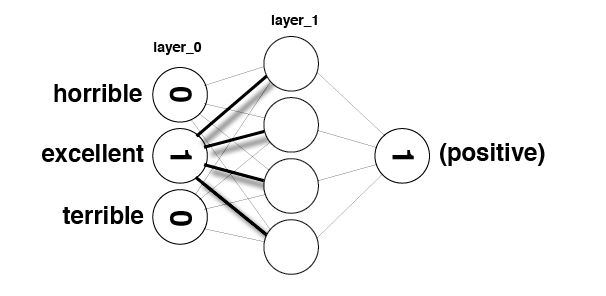

In [79]:
Image(filename='sentiment_network_sparse.png')

In [80]:
def get_most_similar_words(focus = "horrible"):
    most_similar = Counter()

    for word in mlp_full.word2index.keys():
        most_similar[word] = np.dot(mlp_full.weights_0_1[mlp_full.word2index[word]],mlp_full.weights_0_1[mlp_full.word2index[focus]])
    
    return most_similar.most_common()

In [81]:
get_most_similar_words("excellent")

[('excellent', 0.13672950757352476),
 ('perfect', 0.12548286087225949),
 ('amazing', 0.091827633925999699),
 ('today', 0.090223662694414217),
 ('wonderful', 0.089355976962214631),
 ('fun', 0.087504466674206874),
 ('great', 0.087141758882292017),
 ('best', 0.085810885617880639),
 ('liked', 0.077697629123843454),
 ('definitely', 0.076628781406966023),
 ('brilliant', 0.073423858769279052),
 ('loved', 0.073285428928122162),
 ('favorite', 0.072781136036160765),
 ('superb', 0.071736207178505082),
 ('fantastic', 0.070922191916266225),
 ('job', 0.06916061720763407),
 ('incredible', 0.06642407795261443),
 ('enjoyable', 0.06563256050288882),
 ('rare', 0.064819212662615075),
 ('highly', 0.063889453350970515),
 ('enjoyed', 0.062127546101812967),
 ('wonderfully', 0.062055178604090155),
 ('perfectly', 0.061093208811887401),
 ('fascinating', 0.060663547937493865),
 ('bit', 0.059655427045653082),
 ('gem', 0.0595108592961568),
 ('outstanding', 0.058860808147083027),
 ('beautiful', 0.058613934703162097)

In [82]:
get_most_similar_words("terrible")

[('worst', 0.16966107259049848),
 ('awful', 0.12026847019691246),
 ('waste', 0.11945367265311004),
 ('poor', 0.092758887574435511),
 ('terrible', 0.091425387197727956),
 ('dull', 0.084209271678223618),
 ('poorly', 0.081241544516042041),
 ('disappointment', 0.08006475962136872),
 ('fails', 0.078599773723337527),
 ('disappointing', 0.077339485480323364),
 ('boring', 0.077127858748012895),
 ('unfortunately', 0.075502449705859079),
 ('worse', 0.070601835364194662),
 ('mess', 0.070564299623590412),
 ('stupid', 0.069484822832543036),
 ('badly', 0.066888903666228558),
 ('annoying', 0.065687021903374151),
 ('bad', 0.063093814537572165),
 ('save', 0.062880597495865748),
 ('disappointed', 0.062692353812072873),
 ('wasted', 0.061387183028051275),
 ('supposed', 0.060985452957725166),
 ('horrible', 0.060121772339380132),
 ('laughable', 0.058698406285467637),
 ('crap', 0.058104528667884577),
 ('basically', 0.057218840369636155),
 ('nothing', 0.057158220043034252),
 ('ridiculous', 0.05690548106893144

In [83]:
import matplotlib.colors as colors

words_to_visualize = list()
for word, ratio in pos_neg_ratios.most_common(500):
    if(word in mlp_full.word2index.keys()):
        words_to_visualize.append(word)
    
for word, ratio in list(reversed(pos_neg_ratios.most_common()))[0:500]:
    if(word in mlp_full.word2index.keys()):
        words_to_visualize.append(word)

In [ ]:
pos = 0
neg = 0

colors_list = list()
vectors_list = list()
for word in words_to_visualize:
    if word in pos_neg_ratios.keys():
        vectors_list.append(mlp_full.weights_0_1[mlp_full.word2index[word]])
        if(pos_neg_ratios[word] > 0):
            pos+=1
            colors_list.append("#00ff00")
        else:
            neg+=1
            colors_list.append("#000000")

In [ ]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=0)
words_top_ted_tsne = tsne.fit_transform(vectors_list)

In [ ]:
p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="vector T-SNE for most polarized words")

source = ColumnDataSource(data=dict(x1=words_top_ted_tsne[:,0],
                                    x2=words_top_ted_tsne[:,1],
                                    names=words_to_visualize,
                                    color=colors_list))

p.scatter(x="x1", y="x2", size=8, source=source, fill_color="color")

word_labels = LabelSet(x="x1", y="x2", text="names", y_offset=6,
                  text_font_size="8pt", text_color="#555555",
                  source=source, text_align='center')
p.add_layout(word_labels)

show(p)

# green indicates positive words, black indicates negative words